# NASA Exoplanets

***Dayana Galindo - Jhullian Ortega***

Un catálogo completo de exoplanetas descubiertos por misiones de la NASA.


El Archivo de Exoplanetas de la NASA es una base de datos que contiene información sobre todos los exoplanetas conocidos (planetas fuera de nuestro sistema solar) descubiertos por las diversas misiones espaciales de la NASA, observatorios terrestres y otras fuentes. El conjunto de datos incluye información como el nombre del planeta, su masa, radio, distancia a su estrella anfitriona, período orbital y otras características físicas. También incluye información sobre la estrella anfitriona, como su nombre, masa y radio. El archivo se actualiza periódicamente a medida que se descubren nuevos exoplanetas y es un recurso valioso para los astrónomos que estudian las propiedades y la distribución de los exoplanetas en nuestra galaxia.





In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score


In [ ]:
import kagglehub, os

# Descargar dataset
path = kagglehub.dataset_download("adityamishraml/nasaexoplanets")
df = pd.read_csv(os.path.join(path, "cleaned_5250.csv"))

print(df.shape)
print(df['planet_type'].value_counts())

# Verificar archivos disponibles
files = os.listdir(path)
print("Archivos disponibles:", files)

# Cargar el archivo correcto
file_path = os.path.join(path, "cleaned_5250.csv")
df = pd.read_csv(file_path)

# Mostrar información básica
print("Dimensiones:", df.shape)
print("Columnas:", df.columns)
print(df.head())


Using Colab cache for faster access to the 'nasaexoplanets' dataset.
(5250, 13)
planet_type
Neptune-like    1825
Gas Giant       1630
Super Earth     1595
Terrestrial      195
Unknown            5
Name: count, dtype: int64
Archivos disponibles: ['cleaned_5250.csv']
Dimensiones: (5250, 13)
Columnas: Index(['name', 'distance', 'stellar_magnitude', 'planet_type',
       'discovery_year', 'mass_multiplier', 'mass_wrt', 'radius_multiplier',
       'radius_wrt', 'orbital_radius', 'orbital_period', 'eccentricity',
       'detection_method'],
      dtype='object')
                   name  distance  stellar_magnitude planet_type  \
0  11 Comae Berenices b     304.0            4.72307   Gas Giant   
1    11 Ursae Minoris b     409.0            5.01300   Gas Giant   
2       14 Andromedae b     246.0            5.23133   Gas Giant   
3         14 Herculis b      58.0            6.61935   Gas Giant   
4          16 Cygni B b      69.0            6.21500   Gas Giant   

   discovery_year  mass_mult

In [ ]:
cat_cols = df.select_dtypes(include=['object']).columns.tolist()
num_cols = df.select_dtypes(exclude=['object']).columns.tolist()

print("Categóricas:", cat_cols)
print("Numéricas:", num_cols)


Categóricas: ['name', 'planet_type', 'mass_wrt', 'radius_wrt', 'detection_method']
Numéricas: ['distance', 'stellar_magnitude', 'discovery_year', 'mass_multiplier', 'radius_multiplier', 'orbital_radius', 'orbital_period', 'eccentricity']


In [ ]:
# Contar valores nulos por columna
print("Valores nulos por columna:")
print(df.isna().sum())

# Porcentaje de valores nulos
print("Porcentaje de nulos (%):")
print((df.isna().mean() * 100).round(2))


Valores nulos por columna:
name                   0
distance              17
stellar_magnitude    161
planet_type            0
discovery_year         0
mass_multiplier       23
mass_wrt              23
radius_multiplier     17
radius_wrt            17
orbital_radius       289
orbital_period         0
eccentricity           0
detection_method       0
dtype: int64
Porcentaje de nulos (%):
name                 0.00
distance             0.32
stellar_magnitude    3.07
planet_type          0.00
discovery_year       0.00
mass_multiplier      0.44
mass_wrt             0.44
radius_multiplier    0.32
radius_wrt           0.32
orbital_radius       5.50
orbital_period       0.00
eccentricity         0.00
detection_method     0.00
dtype: float64


In [ ]:
from sklearn.impute import SimpleImputer

# --- Copia de seguridad ---
df_clean = df.copy()

# Imputadores
imputer_num = SimpleImputer(strategy='median')
imputer_cat = SimpleImputer(strategy='most_frequent')

# Columnas numéricas y categóricas con NaN
num_cols_with_nan = ['distance', 'stellar_magnitude', 'mass_multiplier', 'radius_multiplier', 'orbital_radius']
cat_cols_with_nan = ['mass_wrt', 'radius_wrt']

# Aplicar imputación
df_clean[num_cols_with_nan] = imputer_num.fit_transform(df_clean[num_cols_with_nan])
df_clean[cat_cols_with_nan] = imputer_cat.fit_transform(df_clean[cat_cols_with_nan])

# Verificar
print("NaN después de limpieza:\n", df_clean.isna().sum().sum())


NaN después de limpieza:
 0


In [ ]:
print("Filas duplicadas:", df_clean.duplicated().sum())
if df_clean.duplicated().sum() > 0:
    df_clean = df_clean.drop_duplicates()


Filas duplicadas: 0


In [ ]:
# Número de filas duplicadas
print(" Filas duplicadas:", df.duplicated().sum())

# Mostrar algunas si existen
if df.duplicated().sum() > 0:
    print(df[df.duplicated()].head())


 Filas duplicadas: 0


In [ ]:
# Buscar posibles textos que representen valores vacíos
for col in df.columns:
    if df[col].dtype == 'object':
        uniques = df[col].unique()
        posibles_nulos = [x for x in uniques if str(x).lower() in ['nan', 'none', 'unknown', 'null', '']]
        if posibles_nulos:
            print(f" Posibles valores nulos tipo texto en '{col}': {posibles_nulos}")


 Posibles valores nulos tipo texto en 'planet_type': ['Unknown']
 Posibles valores nulos tipo texto en 'mass_wrt': [nan]
 Posibles valores nulos tipo texto en 'radius_wrt': [nan]


Columna objetivo: 'planet_type'
Clases encontradas: ['Gas Giant' 'Super Earth' 'Neptune-like' 'Terrestrial' 'Unknown']
Distribución: 
planet_type
Neptune-like    1825
Gas Giant       1630
Super Earth     1595
Terrestrial      195
Unknown            5
Name: count, dtype: int64

Generando histogramas por clase...


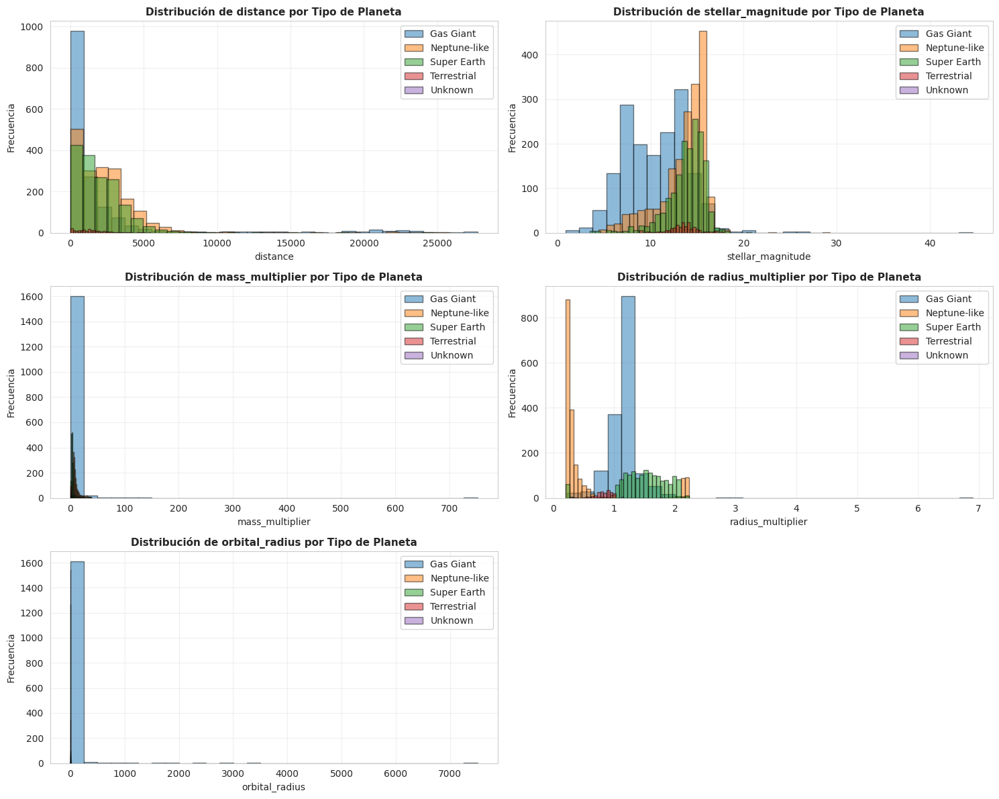


--- Estadísticas por tipo de planeta ---
             distance                                                    \
                count      mean       std    min    25%     50%     75%   
planet_type                                                               
Gas Giant      1630.0  2180.341  4727.683   10.0  181.0   596.0  1704.5   
Neptune-like   1825.0  2411.861  2720.188   11.0  706.0  2038.0  3272.0   
Super Earth    1595.0  1957.006  1709.978    4.0  771.5  1649.0  2784.5   
Terrestrial     195.0  1382.928  1056.493   12.0  577.5  1269.0  1939.5   
Unknown           5.0  3480.600  2706.297  516.0  516.0  5457.0  5457.0   

                      stellar_magnitude          ... radius_multiplier         \
                  max             count    mean  ...               75%    max   
planet_type                                      ...                            
Gas Giant     27727.0            1630.0  10.590  ...             1.240  6.900   
Neptune-like  25770.0            

<Figure size 1500x1000 with 0 Axes>

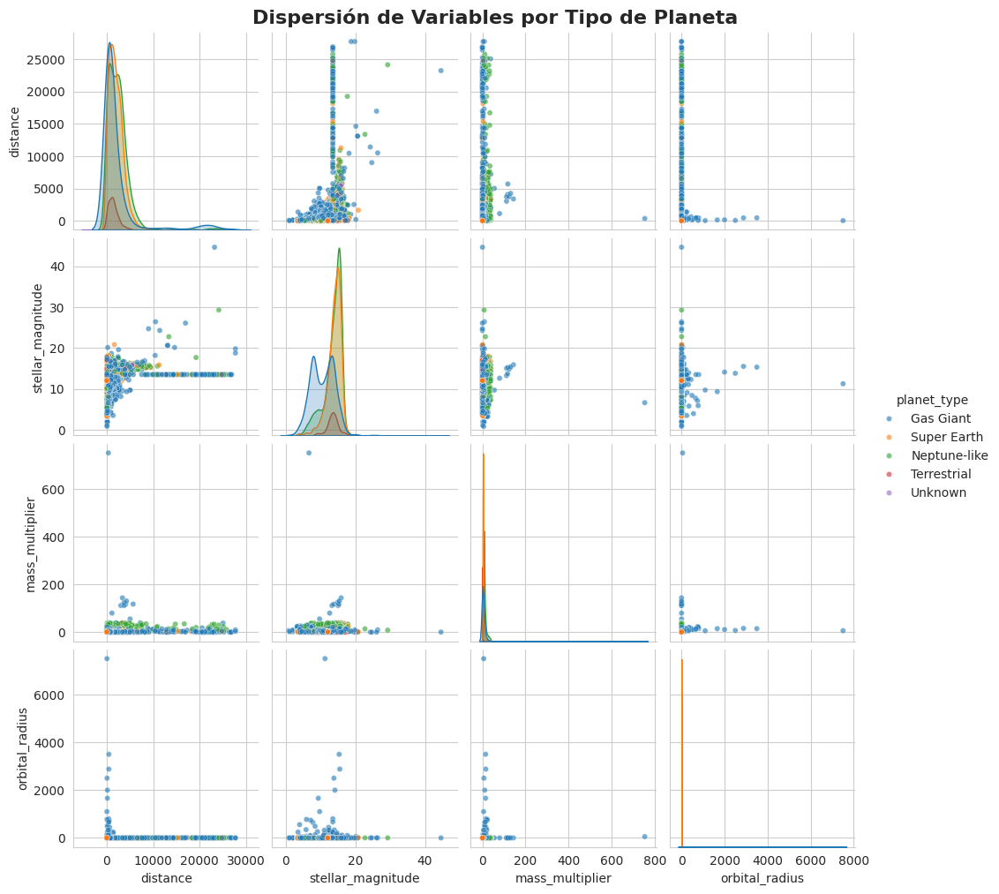


Generando boxplots...


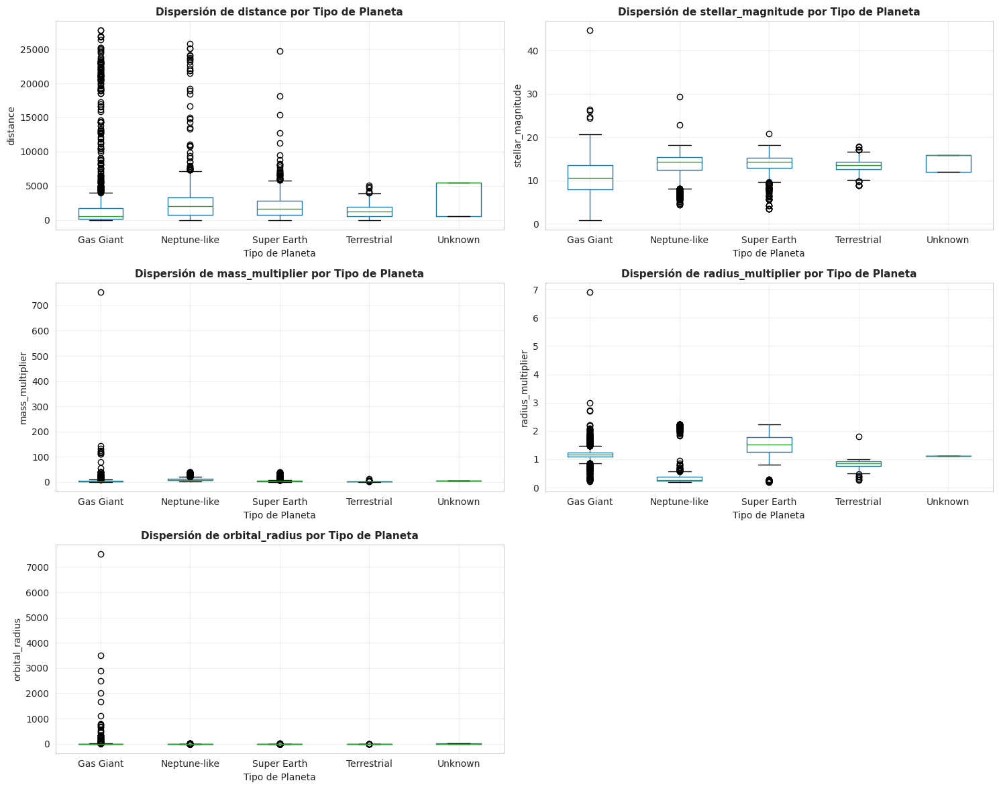


Generando matrices de correlación...


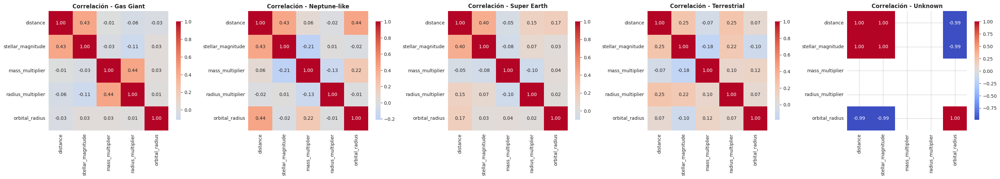

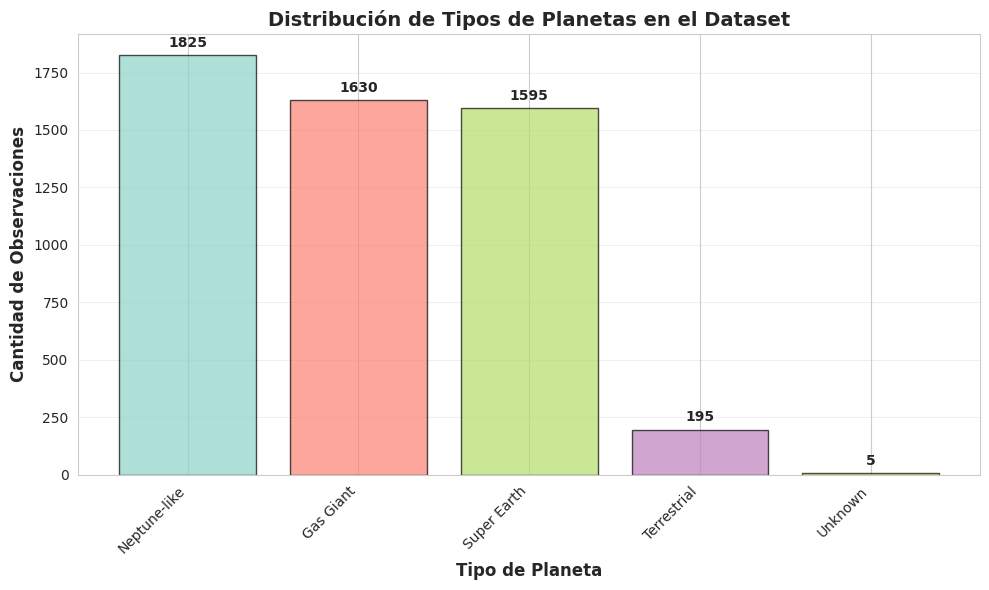


✓ Visualizaciones completadas y guardadas!

Resumen:
- Total de observaciones: 5250
- Tipos de planetas: 5
- Variables numéricas analizadas: 5


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# --- Configuración de estilo ---
sns.set_style("whitegrid")
plt.rcParams['figure.figsize'] = (15, 10)

target_col = 'planet_type'

print(f"Columna objetivo: '{target_col}'")
print(f"Clases encontradas: {df_clean[target_col].unique()}")
print(f"Distribución: \n{df_clean[target_col].value_counts()}\n")

# --- 1. HISTOGRAMAS POR CLASE ---
print("Generando histogramas por clase...")

# Columnas numéricas para graficar
numerical_features = ['distance', 'stellar_magnitude', 'mass_multiplier',
                      'radius_multiplier', 'orbital_radius']

# Crear subplots para histogramas
fig, axes = plt.subplots(3, 2, figsize=(15, 12))
axes = axes.ravel()

for idx, col in enumerate(numerical_features):
    ax = axes[idx]

    # Histograma por cada clase
    for class_name in sorted(df_clean[target_col].unique()):
        data = df_clean[df_clean[target_col] == class_name][col]
        ax.hist(data, alpha=0.5, label=f'{class_name}', bins=30, edgecolor='black')

    ax.set_xlabel(col, fontsize=10)
    ax.set_ylabel('Frecuencia', fontsize=10)
    ax.set_title(f'Distribución de {col} por Tipo de Planeta', fontsize=11, fontweight='bold')
    ax.legend()
    ax.grid(True, alpha=0.3)

# Remover el subplot extra
fig.delaxes(axes[-1])
plt.tight_layout()
plt.savefig('histogramas_por_clase.png', dpi=300, bbox_inches='tight')
plt.show()

print("\n--- Estadísticas por tipo de planeta ---")
print(df_clean.groupby(target_col)[numerical_features].describe().round(3))


# --- 2. GRÁFICOS DE DISPERSIÓN (PAIRPLOT) ---
print("\nGenerando gráficos de dispersión...")

# Seleccionar características para el pairplot
features_for_scatter = ['distance', 'stellar_magnitude', 'mass_multiplier',
                        'orbital_radius', target_col]

plt.figure()
pairplot = sns.pairplot(df_clean[features_for_scatter],
                        hue=target_col,
                        diag_kind='kde',
                        plot_kws={'alpha': 0.6, 's': 20},
                        height=2.5)

pairplot.fig.suptitle('Dispersión de Variables por Tipo de Planeta',
                      y=1.01, fontsize=16, fontweight='bold')
plt.savefig('dispersion_por_clase.png', dpi=300, bbox_inches='tight')
plt.show()


# --- 3. BOXPLOTS POR CLASE ---
print("\nGenerando boxplots...")

fig, axes = plt.subplots(3, 2, figsize=(15, 12))
axes = axes.ravel()

for idx, col in enumerate(numerical_features):
    ax = axes[idx]
    df_clean.boxplot(column=col, by=target_col, ax=ax)
    ax.set_title(f'Dispersión de {col} por Tipo de Planeta',
                 fontsize=11, fontweight='bold')
    ax.set_xlabel('Tipo de Planeta', fontsize=10)
    ax.set_ylabel(col, fontsize=10)
    ax.grid(True, alpha=0.3)

fig.delaxes(axes[-1])
plt.suptitle('')  # Remover título automático
plt.tight_layout()
plt.savefig('boxplots_por_clase.png', dpi=300, bbox_inches='tight')
plt.show()


# --- 4. MATRIZ DE CORRELACIÓN POR CLASE ---
print("\nGenerando matrices de correlación...")

classes = sorted(df_clean[target_col].unique())
n_classes = len(classes)

fig, axes = plt.subplots(1, n_classes, figsize=(6*n_classes, 5))
if n_classes == 1:
    axes = [axes]

for idx, class_name in enumerate(classes):
    data_class = df_clean[df_clean[target_col] == class_name][numerical_features]
    corr_matrix = data_class.corr()

    sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap='coolwarm',
                center=0, ax=axes[idx], square=True, cbar_kws={'shrink': 0.8})
    axes[idx].set_title(f'Correlación - {class_name}', fontsize=12, fontweight='bold')

plt.tight_layout()
plt.savefig('correlacion_por_clase.png', dpi=300, bbox_inches='tight')
plt.show()


# --- 5. DISTRIBUCIÓN DE CLASES ---
plt.figure(figsize=(10, 6))
class_counts = df_clean[target_col].value_counts()
colors = plt.cm.Set3(np.linspace(0, 1, len(class_counts)))

plt.bar(class_counts.index, class_counts.values, color=colors,
        edgecolor='black', alpha=0.7)
plt.xlabel('Tipo de Planeta', fontsize=12, fontweight='bold')
plt.ylabel('Cantidad de Observaciones', fontsize=12, fontweight='bold')
plt.title('Distribución de Tipos de Planetas en el Dataset',
          fontsize=14, fontweight='bold')
plt.grid(True, alpha=0.3, axis='y')
plt.xticks(rotation=45, ha='right')

# Añadir valores encima de las barras
for i, (idx, v) in enumerate(class_counts.items()):
    plt.text(i, v + max(class_counts.values)*0.02,
             str(v), ha='center', fontweight='bold')

plt.tight_layout()
plt.savefig('distribucion_clases.png', dpi=300, bbox_inches='tight')
plt.show()

print("\n✓ Visualizaciones completadas y guardadas!")
print(f"\nResumen:")
print(f"- Total de observaciones: {len(df_clean)}")
print(f"- Tipos de planetas: {len(class_counts)}")
print(f"- Variables numéricas analizadas: {len(numerical_features)}")

ANÁLISIS DE BALANCE DE CLASES

 Distribución de clases:
Tipo de Planeta  Cantidad  Porcentaje
   Neptune-like      1825   34.761905
      Gas Giant      1630   31.047619
    Super Earth      1595   30.380952
    Terrestrial       195    3.714286
        Unknown         5    0.095238

Total de observaciones: 5250

MÉTRICAS DE BALANCE

 Clase mayoritaria: Neptune-like (1825 muestras, 34.76%)
 Clase minoritaria: Unknown (5 muestras, 0.10%)
  Ratio de desbalance: 365.00:1

🔍 INTERPRETACIÓN:
🚨 Las clases están FUERTEMENTE DESBALANCEADAS
   → Requiere técnicas avanzadas de balanceo o métricas específicas


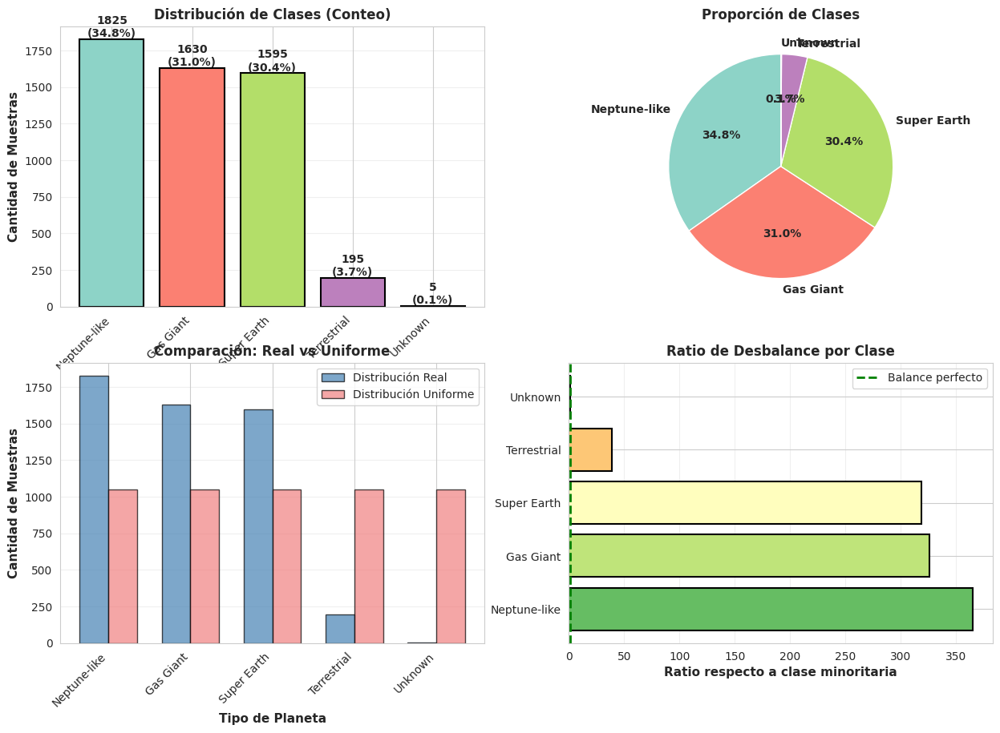

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# --- 1. CONTEO Y PORCENTAJES ---
print("=" * 60)
print("ANÁLISIS DE BALANCE DE CLASES")
print("=" * 60)

class_counts = df_clean['planet_type'].value_counts()
class_percentages = df_clean['planet_type'].value_counts(normalize=True) * 100

balance_df = pd.DataFrame({
    'Tipo de Planeta': class_counts.index,
    'Cantidad': class_counts.values,
    'Porcentaje': class_percentages.values
})

print("\n Distribución de clases:")
print(balance_df.to_string(index=False))
print(f"\nTotal de observaciones: {len(df_clean)}")

# --- 2. ANÁLISIS DE DESBALANCE ---
print("\n" + "=" * 60)
print("MÉTRICAS DE BALANCE")
print("=" * 60)

# Calcular ratio de desbalance
max_class = class_counts.max()
min_class = class_counts.min()
imbalance_ratio = max_class / min_class

print(f"\n Clase mayoritaria: {class_counts.idxmax()} ({max_class} muestras, {class_percentages.max():.2f}%)")
print(f" Clase minoritaria: {class_counts.idxmin()} ({min_class} muestras, {class_percentages.min():.2f}%)")
print(f"  Ratio de desbalance: {imbalance_ratio:.2f}:1")

# Interpretación del balance
print("\n🔍 INTERPRETACIÓN:")
if imbalance_ratio < 1.5:
    print("✅ Las clases están BIEN BALANCEADAS")
    print("   → No se requieren técnicas de balanceo")
elif imbalance_ratio < 3:
    print("⚠️  Las clases tienen un DESBALANCE MODERADO")
    print("   → Considera usar pesos de clase o SMOTE")
elif imbalance_ratio < 10:
    print("⚠️  Las clases tienen un DESBALANCE SIGNIFICATIVO")
    print("   → Recomendado usar SMOTE, ADASYN o pesos de clase")
else:
    print("🚨 Las clases están FUERTEMENTE DESBALANCEADAS")
    print("   → Requiere técnicas avanzadas de balanceo o métricas específicas")

# --- 3. VISUALIZACIÓN DETALLADA ---
fig, axes = plt.subplots(2, 2, figsize=(15, 10))

# 3.1 Gráfico de barras con valores
ax1 = axes[0, 0]
bars = ax1.bar(range(len(class_counts)), class_counts.values,
               color=plt.cm.Set3(np.linspace(0, 1, len(class_counts))),
               edgecolor='black', linewidth=1.5)
ax1.set_xticks(range(len(class_counts)))
ax1.set_xticklabels(class_counts.index, rotation=45, ha='right')
ax1.set_ylabel('Cantidad de Muestras', fontsize=11, fontweight='bold')
ax1.set_title('Distribución de Clases (Conteo)', fontsize=12, fontweight='bold')
ax1.grid(True, alpha=0.3, axis='y')

# Añadir valores sobre las barras
for i, (bar, count) in enumerate(zip(bars, class_counts.values)):
    height = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width()/2., height,
             f'{int(count)}\n({class_percentages.values[i]:.1f}%)',
             ha='center', va='bottom', fontweight='bold')

# 3.2 Gráfico de pastel
ax2 = axes[0, 1]
colors = plt.cm.Set3(np.linspace(0, 1, len(class_counts)))
wedges, texts, autotexts = ax2.pie(class_counts.values,
                                     labels=class_counts.index,
                                     autopct='%1.1f%%',
                                     colors=colors,
                                     startangle=90,
                                     textprops={'fontsize': 10, 'fontweight': 'bold'})
ax2.set_title('Proporción de Clases', fontsize=12, fontweight='bold')

# 3.3 Comparación con distribución uniforme
ax3 = axes[1, 0]
uniform_dist = [len(df_clean) / len(class_counts)] * len(class_counts)
x = np.arange(len(class_counts))
width = 0.35

bars1 = ax3.bar(x - width/2, class_counts.values, width,
                label='Distribución Real', color='steelblue',
                edgecolor='black', alpha=0.7)
bars2 = ax3.bar(x + width/2, uniform_dist, width,
                label='Distribución Uniforme', color='lightcoral',
                edgecolor='black', alpha=0.7)

ax3.set_xlabel('Tipo de Planeta', fontsize=11, fontweight='bold')
ax3.set_ylabel('Cantidad de Muestras', fontsize=11, fontweight='bold')
ax3.set_title('Comparación: Real vs Uniforme', fontsize=12, fontweight='bold')
ax3.set_xticks(x)
ax3.set_xticklabels(class_counts.index, rotation=45, ha='right')
ax3.legend()
ax3.grid(True, alpha=0.3, axis='y')

# 3.4 Ratio de desbalance visual
ax4 = axes[1, 1]
ratios = [class_counts[cls] / min_class for cls in class_counts.index]
bars = ax4.barh(range(len(ratios)), ratios,
                color=plt.cm.RdYlGn_r(np.linspace(0.2, 0.8, len(ratios))),
                edgecolor='black', linewidth=1.5)
ax4.set_yticks(range(len(class_counts)))
ax4.set_yticklabels(class_counts.index)
ax4.set_xlabel('Ratio respecto a clase minoritaria', fontsize=11, fontweight='bold')
ax4.set_title('Ratio de Desbalance por Clase', fontsize=12, fontweight='bold')
ax4.axvline(x=1, color='green', linestyle='--', linewidth=2, label='Balance perfecto')
ax4.grid(True, alpha=0.3, axis='x')
ax4.legend()

In [ ]:
X = df_clean.drop(columns=['planet_type', 'name'])  # Entradas
y = df_clean['planet_type']                         # Salida

from sklearn.model_selection import train_test_split

# Primero: 70% train + 30% restante
X_train, X_temp, y_train, y_temp = train_test_split(
    X, y,
    test_size=0.30,
    random_state=8,
    stratify=y
)

# Segundo: dividir el 30% restante en validación y prueba (15% y 15%)
X_val, X_test, y_val, y_test = train_test_split(
    X_temp, y_temp,
    test_size=0.50,
    random_state=8,
    stratify=y_temp
)

print("Tamaños de los conjuntos:")
print(f"Entrenamiento: {X_train.shape[0]}")
print(f"Validación:    {X_val.shape[0]}")
print(f"Prueba:        {X_test.shape[0]}")



Tamaños de los conjuntos:
Entrenamiento: 3675
Validación:    787
Prueba:        788


In [ ]:
print("Distribución en entrenamiento:")
print(y_train.value_counts(normalize=True))

print("\nDistribución en validación:")
print(y_val.value_counts(normalize=True))

print("\nDistribución en prueba:")
print(y_test.value_counts(normalize=True))


Distribución en entrenamiento:
planet_type
Neptune-like    0.347483
Gas Giant       0.310476
Super Earth     0.303946
Terrestrial     0.037279
Unknown         0.000816
Name: proportion, dtype: float64

Distribución en validación:
planet_type
Neptune-like    0.348158
Gas Giant       0.310038
Super Earth     0.303685
Terrestrial     0.036849
Unknown         0.001271
Name: proportion, dtype: float64

Distribución en prueba:
planet_type
Neptune-like    0.347716
Gas Giant       0.310914
Super Earth     0.303299
Terrestrial     0.036802
Unknown         0.001269
Name: proportion, dtype: float64


In [ ]:
import numpy as np
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler
from sklearn.model_selection import train_test_split

# --- Detectar variables categóricas y numéricas automáticamente ---
cat_cols = X_train.select_dtypes(include=['object', 'category']).columns.tolist()
num_cols = X_train.select_dtypes(exclude=['object', 'category']).columns.tolist()

print("Variables categóricas:", cat_cols)
print("Variables numéricas:", num_cols)

# --- Codificar variables categóricas con OneHotEncoder ---
encoder = OneHotEncoder(drop='first', sparse_output=False, handle_unknown='ignore')

x_train_encoded = encoder.fit_transform(X_train[cat_cols])
x_val_encoded = encoder.transform(X_val[cat_cols])
x_test_encoded = encoder.transform(X_test[cat_cols])

encoded_cols = encoder.get_feature_names_out(cat_cols)

# --- Escalar variables numéricas con MinMaxScaler ---
scaler = MinMaxScaler()

x_train_scaled = scaler.fit_transform(X_train[num_cols])
x_val_scaled = scaler.transform(X_val[num_cols])
x_test_scaled = scaler.transform(X_test[num_cols])

# --- Combinar variables numéricas escaladas + categóricas codificadas ---
x_train_final = np.hstack([x_train_scaled, x_train_encoded])
x_val_final = np.hstack([x_val_scaled, x_val_encoded])
x_test_final = np.hstack([x_test_scaled, x_test_encoded])

print("Procesamiento completado.")
print(f"Conjunto de entrenamiento final: {x_train_final.shape}")
print(f"Conjunto de validación final: {x_val_final.shape}")
print(f"Conjunto de prueba final: {x_test_final.shape}")


Variables categóricas: ['mass_wrt', 'radius_wrt', 'detection_method']
Variables numéricas: ['distance', 'stellar_magnitude', 'discovery_year', 'mass_multiplier', 'radius_multiplier', 'orbital_radius', 'orbital_period', 'eccentricity']
Procesamiento completado.
Conjunto de entrenamiento final: (3675, 18)
Conjunto de validación final: (787, 18)
Conjunto de prueba final: (788, 18)


/usr/local/lib/python3.12/dist-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [2] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


## Regresión Logística

In [ ]:
from sklearn.linear_model import LogisticRegression

# --- Instanciar el modelo ---
clasificador_lr = LogisticRegression(
    multi_class='multinomial',   # Para clasificación multiclase
    solver='lbfgs',              # Solucionador eficiente para este caso
    max_iter=1000,               # Aumentamos iteraciones por si tarda en converger
    random_state=8
)

# --- Entrenar el modelo ---
clasificador_lr.fit(x_train_final, y_train)

print("Modelo entrenado correctamente.")


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


Modelo entrenado correctamente.


Reporte de Clasificación:
              precision    recall  f1-score   support

   Gas Giant       0.98      0.97      0.98       244
Neptune-like       0.94      0.86      0.90       274
 Super Earth       0.79      0.96      0.87       239
 Terrestrial       1.00      0.17      0.29        29
     Unknown       0.00      0.00      0.00         1

    accuracy                           0.90       787
   macro avg       0.74      0.59      0.61       787
weighted avg       0.91      0.90      0.89       787



/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


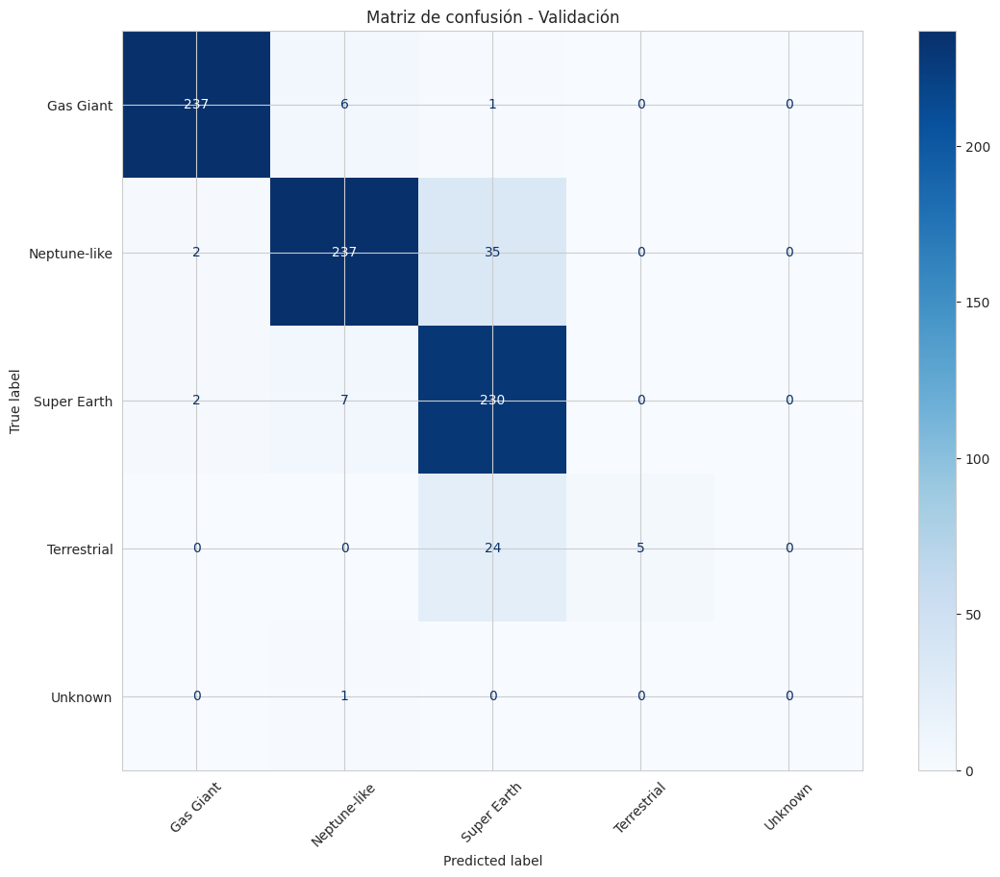

Coeficiente Kappa de Cohen: 0.8547
ROC AUC (One-vs-Rest): 0.9934


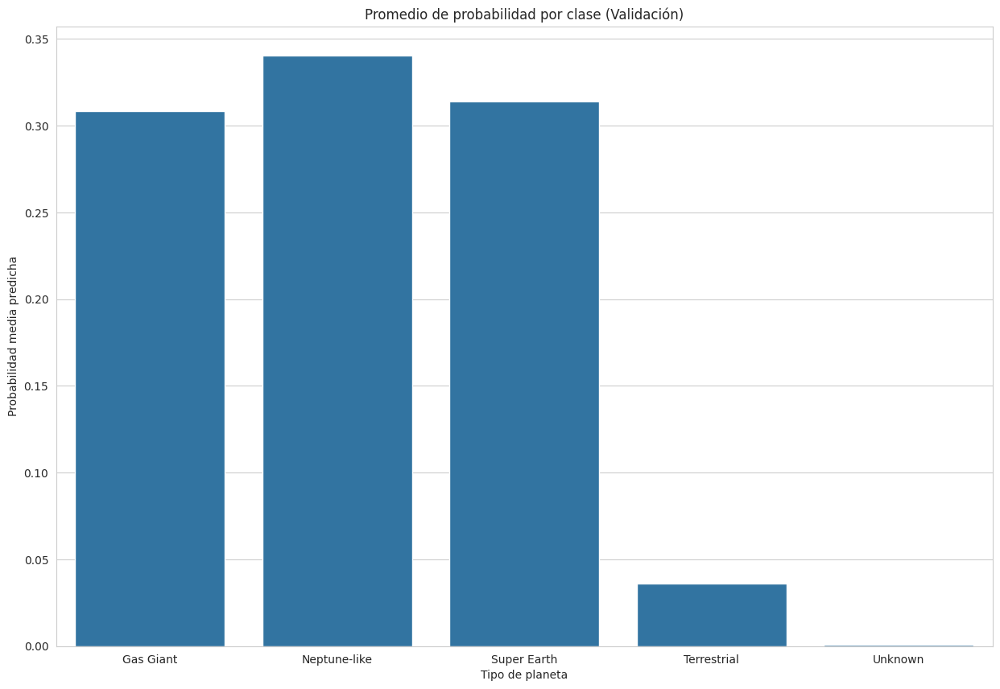

In [ ]:
from sklearn.metrics import (
    confusion_matrix, ConfusionMatrixDisplay,
    classification_report, cohen_kappa_score, roc_auc_score, roc_curve
)

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# --- Predicción en el conjunto de validación ---
y_pred_lr = clasificador_lr.predict(x_val_final)

# --- Probabilidades (confianza del modelo) ---
y_proba_lr = clasificador_lr.predict_proba(x_val_final)

# --- Reporte de desempeño ---
print("Reporte de Clasificación:")
print(classification_report(y_val, y_pred_lr))

# --- Matriz de confusión ---
cm = confusion_matrix(y_val, y_pred_lr)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=clasificador_lr.classes_)
disp.plot(cmap='Blues', xticks_rotation=45)
plt.title("Matriz de confusión - Validación")
plt.show()

# --- Puntaje de Kappa de Cohen ---
kappa = cohen_kappa_score(y_val, y_pred_lr)
print(f"Coeficiente Kappa de Cohen: {kappa:.4f}")

# --- ROC AUC Multiclase ---
try:
    auc = roc_auc_score(y_val, y_proba_lr, multi_class='ovr')
    print(f"ROC AUC (One-vs-Rest): {auc:.4f}")
except Exception as e:
    print("No se pudo calcular el AUC multiclase:", e)

# --- Visualización de probabilidades promedio por clase ---
mean_proba = np.mean(y_proba_lr, axis=0)
sns.barplot(x=clasificador_lr.classes_, y=mean_proba)
plt.title("Promedio de probabilidad por clase (Validación)")
plt.ylabel("Probabilidad media predicha")
plt.xlabel("Tipo de planeta")
plt.show()


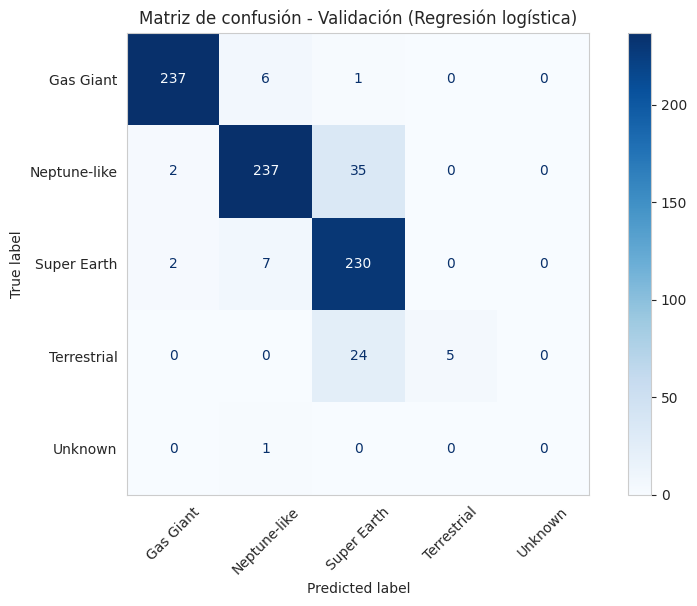

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Crear la matriz de confusión
matriz_confusion = confusion_matrix(
    y_true=y_val,
    y_pred=y_pred_lr,
    labels=clasificador_lr.classes_  # usamos las clases reales del modelo
)

# Visualizar la matriz
figure = plt.figure(figsize=(10, 6))
disp = ConfusionMatrixDisplay(confusion_matrix=matriz_confusion,
                              display_labels=clasificador_lr.classes_)

disp.plot(values_format='d', cmap='Blues', ax=plt.gca())
plt.title("Matriz de confusión - Validación (Regresión logística)")
plt.xticks(rotation=45)
plt.grid(False)
plt.show()


EVALUACIÓN DEL MODELO - CONJUNTO DE VALIDACIÓN

✓ Accuracy: 0.9009 (90.09%)

REPORTE DE CLASIFICACIÓN
              precision    recall  f1-score   support

   Gas Giant       0.98      0.97      0.98       244
Neptune-like       0.94      0.86      0.90       274
 Super Earth       0.79      0.96      0.87       239
 Terrestrial       1.00      0.17      0.29        29
     Unknown       0.00      0.00      0.00         1

    accuracy                           0.90       787
   macro avg       0.74      0.59      0.61       787
weighted avg       0.91      0.90      0.89       787

✓ Coeficiente Kappa de Cohen: 0.8547
✓ ROC AUC (One-vs-Rest): 0.9934

MATRIZ DE CONFUSIÓN


/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


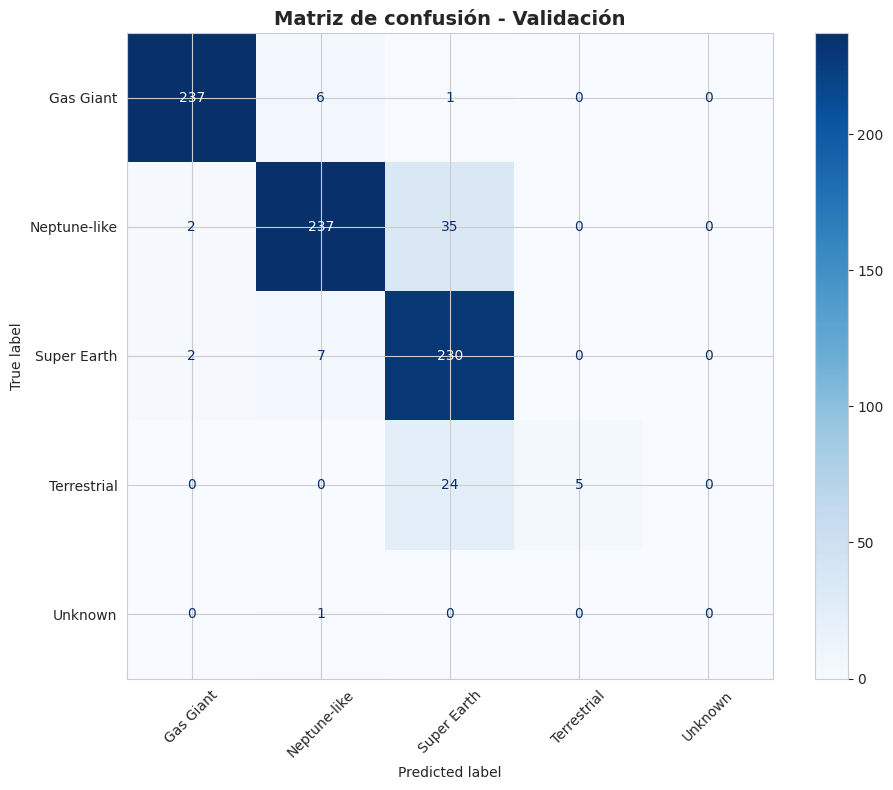


RENDIMIENTO POR CLASE:
  Gas Giant           :  237/ 244 correctos ( 97.13%)
  Neptune-like        :  237/ 274 correctos ( 86.50%)
  Super Earth         :  230/ 239 correctos ( 96.23%)
  Terrestrial         :    5/  29 correctos ( 17.24%)
  Unknown             :    0/   1 correctos (  0.00%)

ANÁLISIS DE ERRORES

Total de predicciones incorrectas: 78 de 787 (9.91%)

Confusiones más comunes (Real → Predicho):
  Neptune-like         → Super Earth         :  35 casos
  Terrestrial          → Super Earth         :  24 casos
  Super Earth          → Neptune-like        :   7 casos
  Gas Giant            → Neptune-like        :   6 casos
  Super Earth          → Gas Giant           :   2 casos

ANÁLISIS DE CONFIANZA DEL MODELO


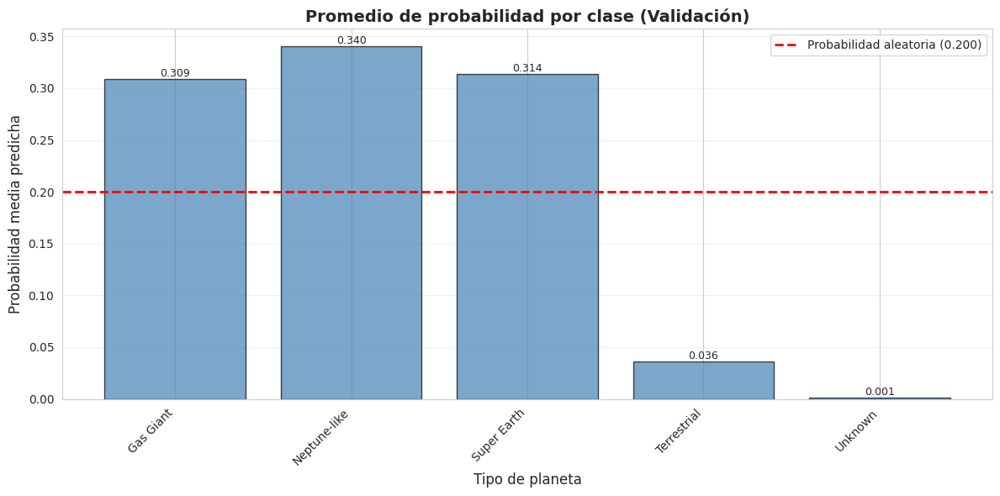

In [ ]:
from sklearn.metrics import (
    confusion_matrix, ConfusionMatrixDisplay,
    classification_report, cohen_kappa_score,
    roc_auc_score, roc_curve, accuracy_score
)
from sklearn.preprocessing import label_binarize
from collections import Counter
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# --- Predicción en el conjunto de validación ---
y_pred_lr = clasificador_lr.predict(x_val_final)
y_proba_lr = clasificador_lr.predict_proba(x_val_final)

print("="*60)
print("EVALUACIÓN DEL MODELO - CONJUNTO DE VALIDACIÓN")
print("="*60)

# --- Accuracy ---
accuracy = accuracy_score(y_val, y_pred_lr)
print(f"\n✓ Accuracy: {accuracy:.4f} ({accuracy*100:.2f}%)")

# --- Reporte de clasificación ---
print("\n" + "="*60)
print("REPORTE DE CLASIFICACIÓN")
print("="*60)
print(classification_report(y_val, y_pred_lr))

# --- Kappa de Cohen ---
kappa = cohen_kappa_score(y_val, y_pred_lr)
print(f"✓ Coeficiente Kappa de Cohen: {kappa:.4f}")

# --- ROC AUC Multiclase ---
try:
    auc = roc_auc_score(y_val, y_proba_lr, multi_class='ovr')
    print(f"✓ ROC AUC (One-vs-Rest): {auc:.4f}")
except Exception as e:
    print(f"⚠ No se pudo calcular el AUC multiclase: {e}")

# --- Matriz de confusión mejorada ---
print("\n" + "="*60)
print("MATRIZ DE CONFUSIÓN")
print("="*60)

cm = confusion_matrix(y_val, y_pred_lr)
fig, ax = plt.subplots(figsize=(10, 8))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=clasificador_lr.classes_)
disp.plot(cmap='Blues', xticks_rotation=45, ax=ax, values_format='d')
plt.title("Matriz de confusión - Validación", fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# --- Análisis por clase ---
print("\nRENDIMIENTO POR CLASE:")
for i, clase in enumerate(clasificador_lr.classes_):
    total = cm[i].sum()
    correctos = cm[i, i]
    porcentaje = correctos/total*100 if total > 0 else 0
    print(f"  {clase:20s}: {correctos:4d}/{total:4d} correctos ({porcentaje:6.2f}%)")

# --- Análisis de errores ---
print("\n" + "="*60)
print("ANÁLISIS DE ERRORES")
print("="*60)

incorrectas = y_val != y_pred_lr
total_incorrectas = incorrectas.sum()
porcentaje_error = (total_incorrectas/len(y_val))*100

print(f"\nTotal de predicciones incorrectas: {total_incorrectas} de {len(y_val)} ({porcentaje_error:.2f}%)")

if total_incorrectas > 0:
    errores = [(real, pred) for real, pred in zip(y_val[incorrectas], y_pred_lr[incorrectas])]
    errores_comunes = Counter(errores).most_common(5)

    print("\nConfusiones más comunes (Real → Predicho):")
    for (real, pred), count in errores_comunes:
        print(f"  {real:20s} → {pred:20s}: {count:3d} casos")

# --- Visualización de probabilidades mejorada ---
print("\n" + "="*60)
print("ANÁLISIS DE CONFIANZA DEL MODELO")
print("="*60)

mean_proba = np.mean(y_proba_lr, axis=0)
prob_aleatoria = 1/len(clasificador_lr.classes_)

plt.figure(figsize=(12, 6))
bars = plt.bar(clasificador_lr.classes_, mean_proba, color='steelblue', alpha=0.7, edgecolor='black')
plt.axhline(y=prob_aleatoria, color='red', linestyle='--', linewidth=2,
            label=f'Probabilidad aleatoria ({prob_aleatoria:.3f})')

# Añadir valores sobre las barras
for bar, prob in zip(bars, mean_proba):
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height,
             f'{prob:.3f}', ha='center', va='bottom', fontsize=9)

plt.title("Promedio de probabilidad por clase (Validación)", fontsize=14, fontweight='bold')
plt.ylabel("Probabilidad media predicha", fontsize=12)
plt.xlabel("Tipo de planeta", fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.legend(fontsize=10)
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

## Curvas ROC

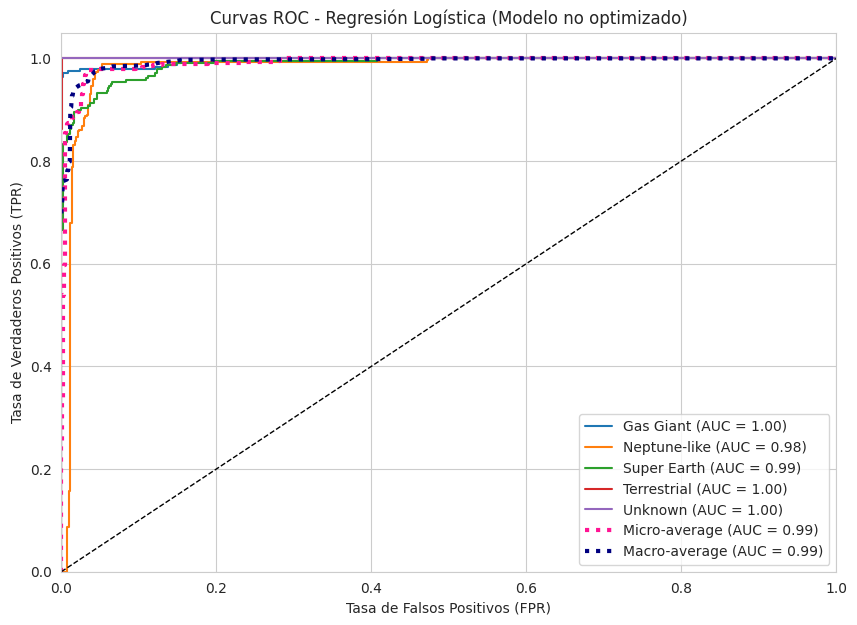


 AUC por clase (modelo no optimizado):
Gas Giant: 0.997
Neptune-like: 0.981
Super Earth: 0.989
Terrestrial: 1.000
Unknown: 1.000

AUC micro-average: 0.991
AUC macro-average: 0.994


In [ ]:
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
import numpy as np

# --- Binarizar las etiquetas (necesario para clasificación multiclase) ---
y_val_bin = label_binarize(y_val, classes=clasificador_lr.classes_)
n_classes = y_val_bin.shape[1]

# --- Probabilidades predichas ---
y_proba_lr = clasificador_lr.predict_proba(x_val_final)

# --- Calcular FPR, TPR y AUC por clase ---
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_val_bin[:, i], y_proba_lr[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# --- Calcular curvas micro y macro promedio ---
# Micro: combina todas las clases
fpr["micro"], tpr["micro"], _ = roc_curve(y_val_bin.ravel(), y_proba_lr.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# Macro: promedio de los AUC de todas las clases
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= n_classes
fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# --- Graficar las curvas ROC ---
plt.figure(figsize=(10, 7))

# Curvas individuales
for i in range(n_classes):
    plt.plot(
        fpr[i], tpr[i],
        label=f'{clasificador_lr.classes_[i]} (AUC = {roc_auc[i]:.2f})'
    )

# Micro y macro promedio
plt.plot(
    fpr["micro"], tpr["micro"],
    label=f'Micro-average (AUC = {roc_auc["micro"]:.2f})',
    color='deeppink', linestyle=':', linewidth=3
)
plt.plot(
    fpr["macro"], tpr["macro"],
    label=f'Macro-average (AUC = {roc_auc["macro"]:.2f})',
    color='navy', linestyle=':', linewidth=3
)

# --- Gráfico base ---
plt.plot([0, 1], [0, 1], 'k--', lw=1)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Tasa de Falsos Positivos (FPR)')
plt.ylabel('Tasa de Verdaderos Positivos (TPR)')
plt.title('Curvas ROC - Regresión Logística (Modelo no optimizado)')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

# --- Mostrar AUC por clase ---
print("\n AUC por clase (modelo no optimizado):")
for i in range(n_classes):
    print(f"{clasificador_lr.classes_[i]}: {roc_auc[i]:.3f}")
print(f"\nAUC micro-average: {roc_auc['micro']:.3f}")
print(f"AUC macro-average: {roc_auc['macro']:.3f}")


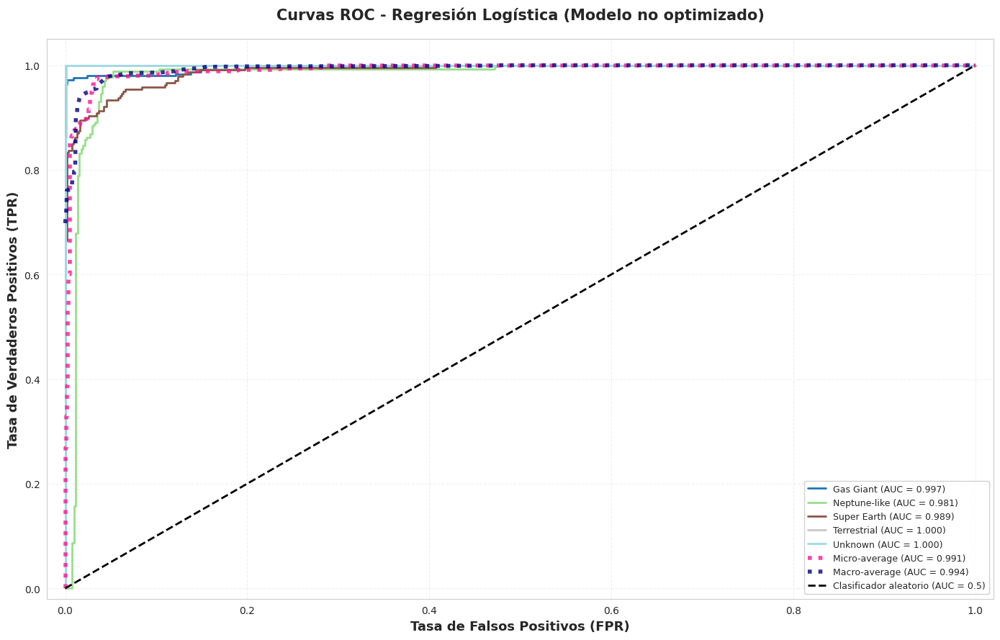


               RESUMEN AUC POR CLASE
Clase                                 AUC      Rendimiento
──────────────────────────────────────────────────────────────────────
Unknown                            1.0000      🟢 Excelente
Terrestrial                        0.9998      🟢 Excelente
Gas Giant                          0.9969      🟢 Excelente
Super Earth                        0.9892      🟢 Excelente
Neptune-like                       0.9811      🟢 Excelente
──────────────────────────────────────────────────────────────────────
Micro-average                      0.9911
Macro-average                      0.9937

 RENDIMIENTO GENERAL BUENO
   Todas las clases tienen AUC ≥ 0.8

 ESTADÍSTICAS ADICIONALES:
   • AUC promedio:    0.9934
   • AUC mínimo:      0.9811
   • AUC máximo:      1.0000
   • Desv. estándar:  0.0073
   • Clases con AUC > 0.9: 5/5


In [ ]:
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
import numpy as np
from matplotlib import cm

# --- Binarizar las etiquetas ---
y_val_bin = label_binarize(y_val, classes=clasificador_lr.classes_)
n_classes = y_val_bin.shape[1]

# --- Probabilidades predichas ---
y_proba_lr = clasificador_lr.predict_proba(x_val_final)

# --- Calcular FPR, TPR y AUC por clase ---
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_val_bin[:, i], y_proba_lr[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# --- Curvas micro y macro promedio ---
fpr["micro"], tpr["micro"], _ = roc_curve(y_val_bin.ravel(), y_proba_lr.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= n_classes
fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# --- GRÁFICO MEJORADO ---
plt.figure(figsize=(14, 9))

# Colores diferenciados para cada clase
colors = cm.tab20(np.linspace(0, 1, n_classes))

# Curvas individuales
for i, color in zip(range(n_classes), colors):
    plt.plot(
        fpr[i], tpr[i], color=color, lw=2,
        label=f'{clasificador_lr.classes_[i]} (AUC = {roc_auc[i]:.3f})'
    )

# Micro y macro promedio (más visibles)
plt.plot(
    fpr["micro"], tpr["micro"],
    label=f'Micro-average (AUC = {roc_auc["micro"]:.3f})',
    color='deeppink', linestyle=':', linewidth=4, alpha=0.8
)
plt.plot(
    fpr["macro"], tpr["macro"],
    label=f'Macro-average (AUC = {roc_auc["macro"]:.3f})',
    color='navy', linestyle=':', linewidth=4, alpha=0.8
)

# Línea de clasificador aleatorio
plt.plot([0, 1], [0, 1], 'k--', lw=2, label='Clasificador aleatorio (AUC = 0.5)')

# Configuración del gráfico
plt.xlim([-0.02, 1.02])
plt.ylim([-0.02, 1.05])
plt.xlabel('Tasa de Falsos Positivos (FPR)', fontsize=13, fontweight='bold')
plt.ylabel('Tasa de Verdaderos Positivos (TPR)', fontsize=13, fontweight='bold')
plt.title('Curvas ROC - Regresión Logística (Modelo no optimizado)',
          fontsize=15, fontweight='bold', pad=20)
plt.legend(loc='lower right', fontsize=9, framealpha=0.9)
plt.grid(True, alpha=0.3, linestyle='--')
plt.tight_layout()
plt.show()

# --- TABLA RESUMEN ORDENADA ---
print("\n" + "="*70)
print(" "*15 + "RESUMEN AUC POR CLASE")
print("="*70)

# Ordenar por AUC descendente
auc_por_clase = [(clasificador_lr.classes_[i], roc_auc[i]) for i in range(n_classes)]
auc_por_clase_sorted = sorted(auc_por_clase, key=lambda x: x[1], reverse=True)

print(f"{'Clase':<30} {'AUC':>10}  {'Rendimiento':>15}")
print("─"*70)

for clase, auc_valor in auc_por_clase_sorted:
    # Indicador visual de rendimiento
    if auc_valor >= 0.95:
        indicador = "🟢 Excelente"
    elif auc_valor >= 0.85:
        indicador = "🟢 Muy bueno"
    elif auc_valor >= 0.75:
        indicador = "🟡 Bueno"
    elif auc_valor >= 0.65:
        indicador = "🟠 Regular"
    else:
        indicador = "🔴 Pobre"

    print(f"{clase:<30} {auc_valor:>10.4f}  {indicador:>15}")

print("─"*70)
print(f"{'Micro-average':<30} {roc_auc['micro']:>10.4f}")
print(f"{'Macro-average':<30} {roc_auc['macro']:>10.4f}")
print("="*70)

# --- ANÁLISIS DE CLASES PROBLEMÁTICAS ---
umbral_bajo = 0.80
clases_problematicas = [
    (clasificador_lr.classes_[i], roc_auc[i])
    for i in range(n_classes)
    if roc_auc[i] < umbral_bajo
]

if clases_problematicas:
    print(f"\n  CLASES CON AUC < {umbral_bajo}:")
    for clase, auc_valor in clases_problematicas:
        print(f"   • {clase}: {auc_valor:.4f}")

else:
    print(f"\n RENDIMIENTO GENERAL BUENO")
    print(f"   Todas las clases tienen AUC ≥ {umbral_bajo}")

# --- ESTADÍSTICAS ADICIONALES ---
print(f"\n ESTADÍSTICAS ADICIONALES:")
print(f"   • AUC promedio:    {np.mean([roc_auc[i] for i in range(n_classes)]):.4f}")
print(f"   • AUC mínimo:      {min([roc_auc[i] for i in range(n_classes)]):.4f}")
print(f"   • AUC máximo:      {max([roc_auc[i] for i in range(n_classes)]):.4f}")
print(f"   • Desv. estándar:  {np.std([roc_auc[i] for i in range(n_classes)]):.4f}")
print(f"   • Clases con AUC > 0.9: {sum(1 for i in range(n_classes) if roc_auc[i] > 0.9)}/{n_classes}")
print("="*70)

## Curvas Presición-Exhaustividad

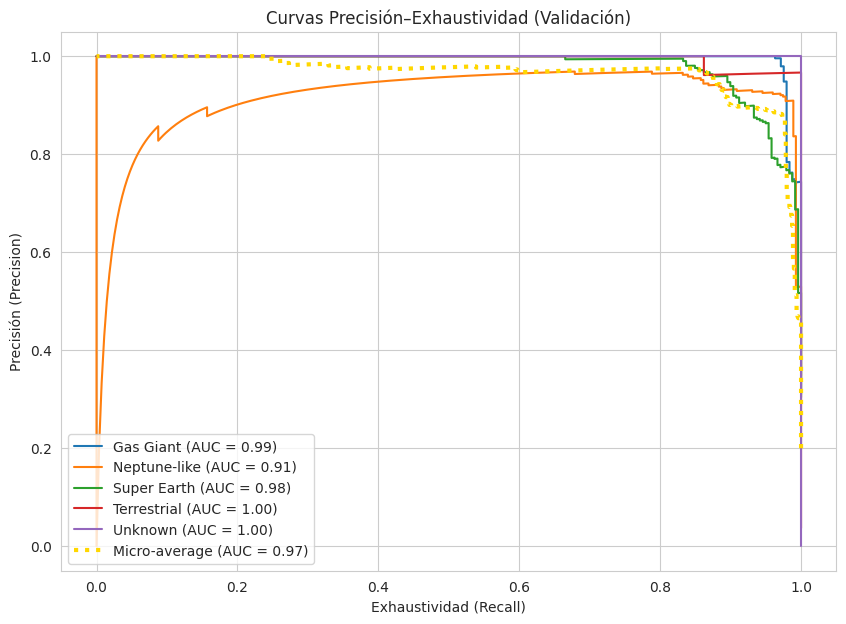

In [ ]:
from sklearn.metrics import precision_recall_curve, average_precision_score
import matplotlib.pyplot as plt
import numpy as np

# --- Binarizar etiquetas (ya lo hicimos para ROC, se reutiliza) ---
# y_val_bin = label_binarize(y_val, classes=clasificador_lr.classes_)

# --- Obtener las probabilidades ---
y_proba_lr = clasificador_lr.predict_proba(x_val_final)

# --- Calcular curvas Precision-Recall y AUC-PR para cada clase ---
precision = dict()
recall = dict()
average_precision = dict()
n_classes = y_val_bin.shape[1]

for i in range(n_classes):
    precision[i], recall[i], _ = precision_recall_curve(y_val_bin[:, i], y_proba_lr[:, i])
    average_precision[i] = average_precision_score(y_val_bin[:, i], y_proba_lr[:, i])

# --- Calcular promedio micro ---
precision["micro"], recall["micro"], _ = precision_recall_curve(
    y_val_bin.ravel(), y_proba_lr.ravel()
)
average_precision["micro"] = average_precision_score(y_val_bin, y_proba_lr, average="micro")

# --- Graficar ---
plt.figure(figsize=(10, 7))

# Curvas por clase
for i in range(n_classes):
    plt.plot(recall[i], precision[i],
             label=f'{clasificador_lr.classes_[i]} (AUC = {average_precision[i]:.2f})')

# Micro promedio
plt.plot(recall["micro"], precision["micro"],
         label=f'Micro-average (AUC = {average_precision["micro"]:.2f})',
         color='gold', linestyle=':', linewidth=3)

# Gráfico base
plt.xlabel('Exhaustividad (Recall)')
plt.ylabel('Precisión (Precision)')
plt.title('Curvas Precisión–Exhaustividad (Validación)')
plt.legend(loc='lower left')
plt.grid(True)
plt.show()


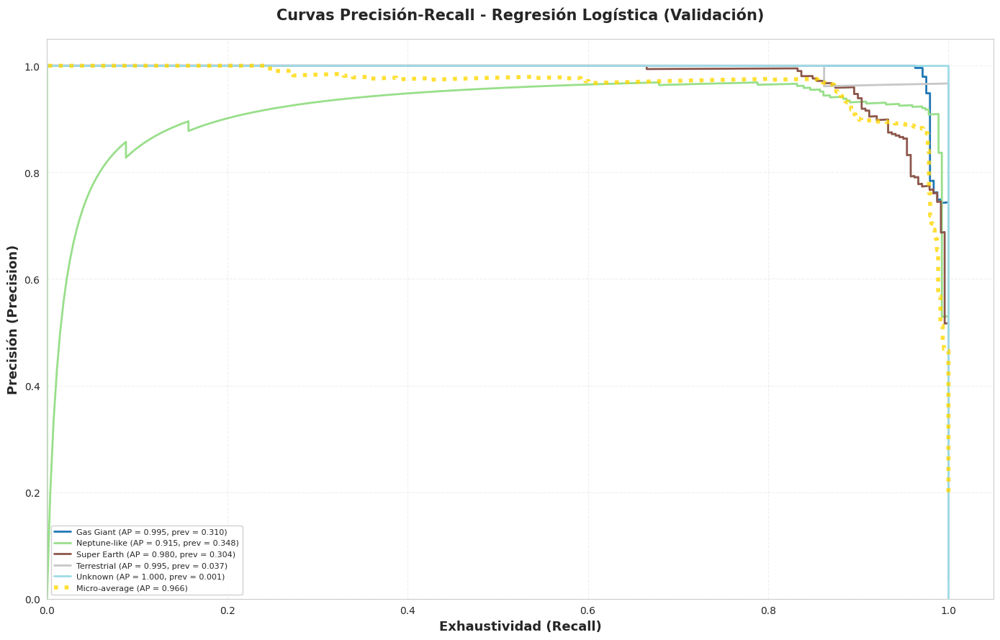

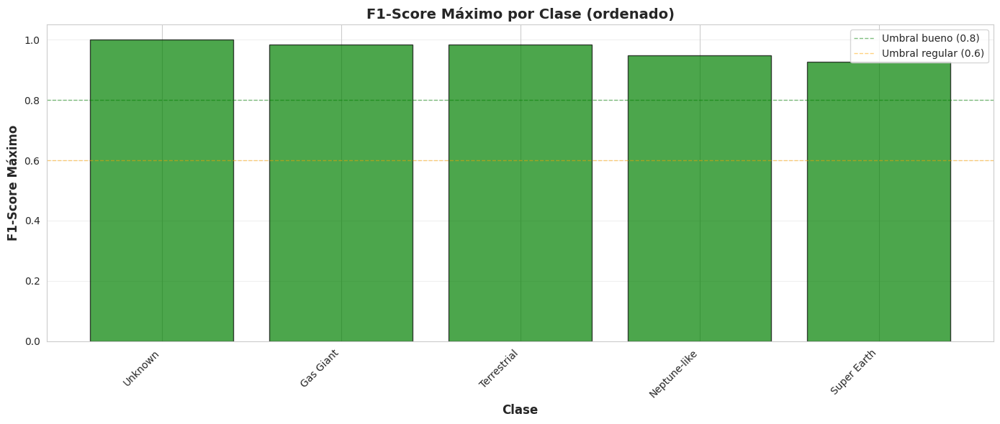


                    RESUMEN PRECISION-RECALL
Clase                                  AP   Prevalencia      F1-max           Estado
────────────────────────────────────────────────────────────────────────────────
Unknown                            1.0000        0.0013      1.0000      🟢 Excelente
Terrestrial                        0.9952        0.0368      0.9831      🟢 Excelente
Gas Giant                          0.9947        0.3100      0.9834      🟢 Excelente
Super Earth                        0.9796        0.3037      0.9264      🟢 Excelente
Neptune-like                       0.9147        0.3482      0.9476      🟢 Excelente
────────────────────────────────────────────────────────────────────────────────
Micro-average                      0.9658
Macro-average                      0.9768

 RENDIMIENTO GENERAL BUENO EN PRECISION-RECALL
   Todas las clases tienen AP ≥ 0.6

                    COMPARACIÓN: ROC-AUC vs PR-AUC
Clase                               ROC-AUC        PR-AUC    D

In [ ]:
from sklearn.metrics import precision_recall_curve, average_precision_score
import matplotlib.pyplot as plt
import numpy as np
from matplotlib import cm

# --- Obtener probabilidades ---
y_proba_lr = clasificador_lr.predict_proba(x_val_final)

# --- Calcular curvas Precision-Recall y AP para cada clase ---
precision = dict()
recall = dict()
average_precision = dict()
n_classes = y_val_bin.shape[1]

for i in range(n_classes):
    precision[i], recall[i], _ = precision_recall_curve(y_val_bin[:, i], y_proba_lr[:, i])
    average_precision[i] = average_precision_score(y_val_bin[:, i], y_proba_lr[:, i])

# --- Micro-average ---
precision["micro"], recall["micro"], _ = precision_recall_curve(
    y_val_bin.ravel(), y_proba_lr.ravel()
)
average_precision["micro"] = average_precision_score(y_val_bin, y_proba_lr, average="micro")

# --- Macro-average (manual) ---
average_precision["macro"] = np.mean([average_precision[i] for i in range(n_classes)])

# --- Prevalencia por clase (baseline) ---
prevalencia = y_val_bin.sum(axis=0) / len(y_val_bin)

# --- GRÁFICO PRINCIPAL MEJORADO ---
plt.figure(figsize=(14, 9))

# Colores diferenciados
colors = cm.tab20(np.linspace(0, 1, n_classes))

# Curvas por clase
for i, color in zip(range(n_classes), colors):
    plt.plot(
        recall[i], precision[i], color=color, lw=2,
        label=f'{clasificador_lr.classes_[i]} (AP = {average_precision[i]:.3f}, prev = {prevalencia[i]:.3f})'
    )

# Micro-average
plt.plot(
    recall["micro"], precision["micro"],
    label=f'Micro-average (AP = {average_precision["micro"]:.3f})',
    color='gold', linestyle=':', linewidth=4, alpha=0.8
)

# Configuración del gráfico
plt.xlabel('Exhaustividad (Recall)', fontsize=13, fontweight='bold')
plt.ylabel('Precisión (Precision)', fontsize=13, fontweight='bold')
plt.title('Curvas Precisión-Recall - Regresión Logística (Validación)',
          fontsize=15, fontweight='bold', pad=20)
plt.xlim([0.0, 1.05])
plt.ylim([0.0, 1.05])
plt.legend(loc='best', fontsize=8, framealpha=0.9)
plt.grid(True, alpha=0.3, linestyle='--')
plt.tight_layout()
plt.show()

# --- GRÁFICO COMPARATIVO: F1-Score óptimo por clase ---
plt.figure(figsize=(14, 6))

f1_scores_max = []
classes_names = []

for i in range(n_classes):
    # Calcular F1-Score en cada punto de la curva
    f1_scores = 2 * (precision[i] * recall[i]) / (precision[i] + recall[i] + 1e-10)
    f1_max = np.max(f1_scores)
    f1_scores_max.append(f1_max)
    classes_names.append(clasificador_lr.classes_[i])

# Ordenar por F1-Score
sorted_indices = np.argsort(f1_scores_max)[::-1]
f1_sorted = [f1_scores_max[i] for i in sorted_indices]
classes_sorted = [classes_names[i] for i in sorted_indices]

# Crear barras con colores según rendimiento
colors_bars = ['green' if f1 >= 0.8 else 'orange' if f1 >= 0.6 else 'red' for f1 in f1_sorted]

bars = plt.bar(range(len(f1_sorted)), f1_sorted, color=colors_bars, alpha=0.7, edgecolor='black')
plt.xticks(range(len(classes_sorted)), classes_sorted, rotation=45, ha='right')
plt.ylabel('F1-Score Máximo', fontsize=12, fontweight='bold')
plt.xlabel('Clase', fontsize=12, fontweight='bold')
plt.title('F1-Score Máximo por Clase (ordenado)', fontsize=14, fontweight='bold')
plt.axhline(y=0.8, color='green', linestyle='--', linewidth=1, alpha=0.5, label='Umbral bueno (0.8)')
plt.axhline(y=0.6, color='orange', linestyle='--', linewidth=1, alpha=0.5, label='Umbral regular (0.6)')
plt.ylim([0, 1.05])
plt.legend()
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

# --- TABLA RESUMEN ---
print("\n" + "="*80)
print(" "*20 + "RESUMEN PRECISION-RECALL")
print("="*80)
print(f"{'Clase':<30} {'AP':>10}  {'Prevalencia':>12}  {'F1-max':>10}  {'Estado':>15}")
print("─"*80)

# Ordenar por AP descendente
ap_por_clase = [(clasificador_lr.classes_[i], average_precision[i], prevalencia[i], f1_scores_max[i])
                for i in range(n_classes)]
ap_por_clase_sorted = sorted(ap_por_clase, key=lambda x: x[1], reverse=True)

for clase, ap_val, prev, f1_max in ap_por_clase_sorted:
    # Indicador de rendimiento
    if ap_val >= 0.9:
        estado = "🟢 Excelente"
    elif ap_val >= 0.75:
        estado = "🟢 Muy bueno"
    elif ap_val >= 0.6:
        estado = "🟡 Bueno"
    elif ap_val >= 0.4:
        estado = "🟠 Regular"
    else:
        estado = "🔴 Pobre"

    print(f"{clase:<30} {ap_val:>10.4f}  {prev:>12.4f}  {f1_max:>10.4f}  {estado:>15}")

print("─"*80)
print(f"{'Micro-average':<30} {average_precision['micro']:>10.4f}")
print(f"{'Macro-average':<30} {average_precision['macro']:>10.4f}")
print("="*80)

# --- ANÁLISIS DE CLASES PROBLEMÁTICAS ---
umbral_ap = 0.6
clases_problema_pr = [(clasificador_lr.classes_[i], average_precision[i], prevalencia[i])
                      for i in range(n_classes) if average_precision[i] < umbral_ap]

if clases_problema_pr:
    print(f"\n  CLASES CON AP < {umbral_ap}:")
    for clase, ap_val, prev in clases_problema_pr:
        desbalance = " CLASE MINORITARIA" if prev < 0.1 else ""
        print(f"   • {clase}: AP={ap_val:.4f}, Prevalencia={prev:.4f} {desbalance}")

    print("\n INTERPRETACIÓN:")
    print("   • AP bajo + prevalencia baja → Aplicar SMOTE o ajustar class_weight")
    print("   • AP bajo + prevalencia alta → Problema con características, revisar features")
    print("   • Considerar métricas balanceadas: F1-Score, Matthews Correlation Coefficient")
else:
    print(f"\n RENDIMIENTO GENERAL BUENO EN PRECISION-RECALL")
    print(f"   Todas las clases tienen AP ≥ {umbral_ap}")

# --- COMPARACIÓN ROC vs PR ---
if 'roc_auc' in globals():
    print("\n" + "="*80)
    print(" "*20 + "COMPARACIÓN: ROC-AUC vs PR-AUC")
    print("="*80)
    print(f"{'Clase':<30} {'ROC-AUC':>12}  {'PR-AUC':>12}  {'Diferencia':>12}")
    print("─"*80)

    for i in range(n_classes):
        diff = roc_auc[i] - average_precision[i]
        clase = clasificador_lr.classes_[i]
        print(f"{clase:<30} {roc_auc[i]:>12.4f}  {average_precision[i]:>12.4f}  {diff:>12.4f}")

    print("─"*80)
    print(f"{'Promedio':<30} {np.mean([roc_auc[i] for i in range(n_classes)]):>12.4f}  "
          f"{average_precision['macro']:>12.4f}  "
          f"{np.mean([roc_auc[i] for i in range(n_classes)]) - average_precision['macro']:>12.4f}")
    print("="*80)

    print("\n INTERPRETACIÓN:")
    print("   • Diferencia grande (ROC-AUC >> PR-AUC) → Clase desbalanceada")
    print("   • Diferencia pequeña → Clase balanceada")
    print("   • PR-AUC es más estricta y realista para clases minoritarias")

# --- ESTADÍSTICAS FINALES ---
print(f"\n ESTADÍSTICAS PRECISION-RECALL:")
print(f"   • AP promedio:     {average_precision['macro']:.4f}")
print(f"   • AP mínimo:       {min([average_precision[i] for i in range(n_classes)]):.4f}")
print(f"   • AP máximo:       {max([average_precision[i] for i in range(n_classes)]):.4f}")
print(f"   • Desv. estándar:  {np.std([average_precision[i] for i in range(n_classes)]):.4f}")
print(f"   • Clases con AP > 0.8: {sum(1 for i in range(n_classes) if average_precision[i] > 0.8)}/{n_classes}")
print("="*80)

## Evaluación del modelo





In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report, confusion_matrix
import numpy as np
import pandas as pd

# --- Predicciones ---
y_pred_val = clasificador_lr.predict(x_val_final)

# --- Métricas globales ---
exactitud = accuracy_score(y_val, y_pred_val)
print(f"Exactitud global: {exactitud:.4f}\n")

# --- Reporte detallado por clase (Precisión, Recall, F1) ---
print(" Reporte de clasificación por clase:")
print(classification_report(y_val, y_pred_val, digits=3))

# --- Calcular Sensibilidad y Especificidad manualmente ---
cm = confusion_matrix(y_val, y_pred_val, labels=clasificador_lr.classes_)
cm_df = pd.DataFrame(cm, index=clasificador_lr.classes_, columns=clasificador_lr.classes_)

sensibilidad = {}
especificidad = {}

for i, clase in enumerate(clasificador_lr.classes_):
    TP = cm[i, i]
    FN = cm[i, :].sum() - TP
    FP = cm[:, i].sum() - TP
    TN = cm.sum() - (TP + FN + FP)
    sensibilidad[clase] = TP / (TP + FN) if (TP + FN) > 0 else 0
    especificidad[clase] = TN / (TN + FP) if (TN + FP) > 0 else 0

# --- Mostrar resultados ---
print("\n Sensibilidad (Recall) y Especificidad por clase:")
for clase in clasificador_lr.classes_:
    print(f"{clase:15s} → Sensibilidad: {sensibilidad[clase]:.3f} | Especificidad: {especificidad[clase]:.3f}")


Exactitud global: 0.9009

 Reporte de clasificación por clase:
              precision    recall  f1-score   support

   Gas Giant      0.983     0.971     0.977       244
Neptune-like      0.944     0.865     0.903       274
 Super Earth      0.793     0.962     0.870       239
 Terrestrial      1.000     0.172     0.294        29
     Unknown      0.000     0.000     0.000         1

    accuracy                          0.901       787
   macro avg      0.744     0.594     0.609       787
weighted avg      0.911     0.901     0.892       787


 Sensibilidad (Recall) y Especificidad por clase:
Gas Giant       → Sensibilidad: 0.971 | Especificidad: 0.993
Neptune-like    → Sensibilidad: 0.865 | Especificidad: 0.973
Super Earth     → Sensibilidad: 0.962 | Especificidad: 0.891
Terrestrial     → Sensibilidad: 0.172 | Especificidad: 1.000
Unknown         → Sensibilidad: 0.000 | Especificidad: 1.000


/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [ ]:
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score,
    f1_score, confusion_matrix, classification_report
)
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# --- Métricas globales ---
exactitud = accuracy_score(y_val, y_pred_lr)
print(f'Exactitud global: {exactitud:.3f}\n')

# --- Reporte detallado ---
print('Reporte por clase:')
print(classification_report(y_val, y_pred_lr, digits=3))

# --- Matriz de confusión ---
matriz_conf = confusion_matrix(y_val, y_pred_lr, labels=clasificador_lr.classes_)
print('\nMatriz de confusión:\n', matriz_conf)

# --- Sensibilidad y especificidad por clase ---
especificidades = {}
sensibilidades = {}

for i, clase in enumerate(clasificador_lr.classes_):
    TP = matriz_conf[i, i]
    FP = matriz_conf[:, i].sum() - TP
    FN = matriz_conf[i, :].sum() - TP
    TN = matriz_conf.sum() - (TP + FP + FN)

    sensibilidad = TP / (TP + FN) if (TP + FN) > 0 else 0
    especificidad = TN / (TN + FP) if (TN + FP) > 0 else 0

    sensibilidades[clase] = sensibilidad
    especificidades[clase] = especificidad

# --- Tabla resumen ---
metricas_por_clase = pd.DataFrame({
    'Precisión': precision_score(y_val, y_pred_lr, average=None, labels=clasificador_lr.classes_),
    'Recall (Sensibilidad)': recall_score(y_val, y_pred_lr, average=None, labels=clasificador_lr.classes_),
    'F1-Score': f1_score(y_val, y_pred_lr, average=None, labels=clasificador_lr.classes_),
    'Especificidad': [especificidades[c] for c in clasificador_lr.classes_]
}, index=clasificador_lr.classes_)

print("\nMétricas por clase:")
display(metricas_por_clase)


Exactitud global: 0.901

Reporte por clase:
              precision    recall  f1-score   support

   Gas Giant      0.983     0.971     0.977       244
Neptune-like      0.944     0.865     0.903       274
 Super Earth      0.793     0.962     0.870       239
 Terrestrial      1.000     0.172     0.294        29
     Unknown      0.000     0.000     0.000         1

    accuracy                          0.901       787
   macro avg      0.744     0.594     0.609       787
weighted avg      0.911     0.901     0.892       787


Matriz de confusión:
 [[237   6   1   0   0]
 [  2 237  35   0   0]
 [  2   7 230   0   0]
 [  0   0  24   5   0]
 [  0   1   0   0   0]]

Métricas por clase:


/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/m

,Precisión,Recall (Sensibilidad),F1-Score,Especificidad
Gas Giant,0.983402,0.971311,0.977320,0.992634
Neptune-like,0.944223,0.864964,0.902857,0.972710
Super Earth,0.793103,0.962343,0.869565,0.890511
Terrestrial,1.000000,0.172414,0.294118,1.000000
Unknown,0.000000,0.000000,0.000000,1.000000


                         MÉTRICAS GLOBALES
Exactitud (Accuracy):                0.9009 (90.09%)
Exactitud Balanceada:                0.5942 (59.42%)

Precisión (macro):                   0.7441
Recall/Sensibilidad (macro):         0.5942
F1-Score (macro):                    0.6088

Precisión (weighted):                0.9113
Recall/Sensibilidad (weighted):      0.9009
F1-Score (weighted):                 0.8923

                    REPORTE DE CLASIFICACIÓN POR CLASE
              precision    recall  f1-score   support

   Gas Giant     0.9834    0.9713    0.9773       244
Neptune-like     0.9442    0.8650    0.9029       274
 Super Earth     0.7931    0.9623    0.8696       239
 Terrestrial     1.0000    0.1724    0.2941        29
     Unknown     0.0000    0.0000    0.0000         1

    accuracy                         0.9009       787
   macro avg     0.7441    0.5942    0.6088       787
weighted avg     0.9113    0.9009    0.8923       787


               MÉTRICAS DETALLADAS POR 

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


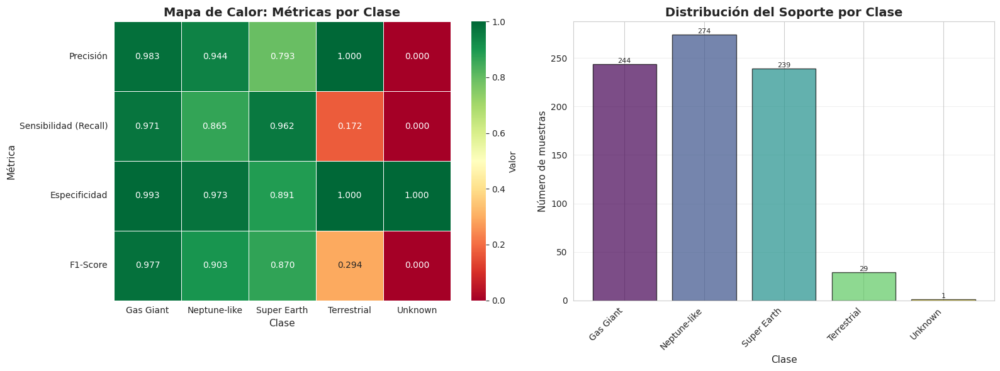

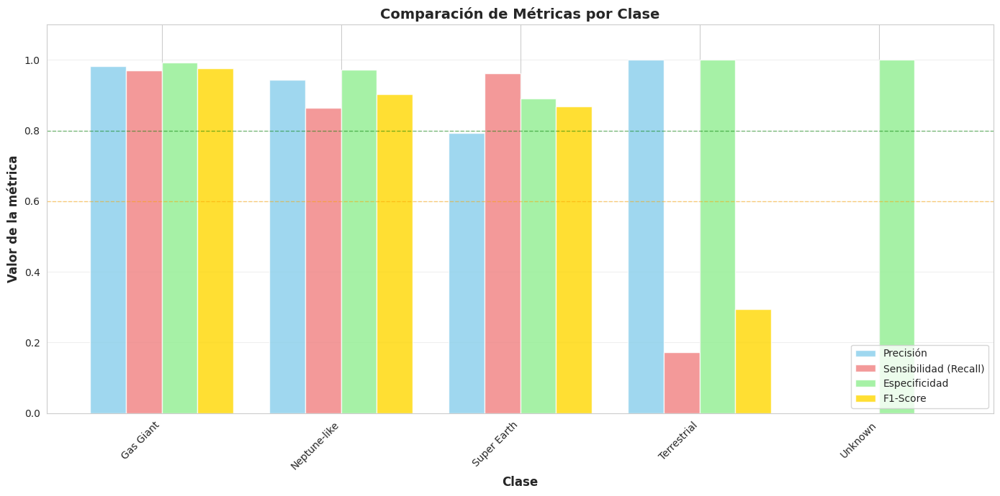

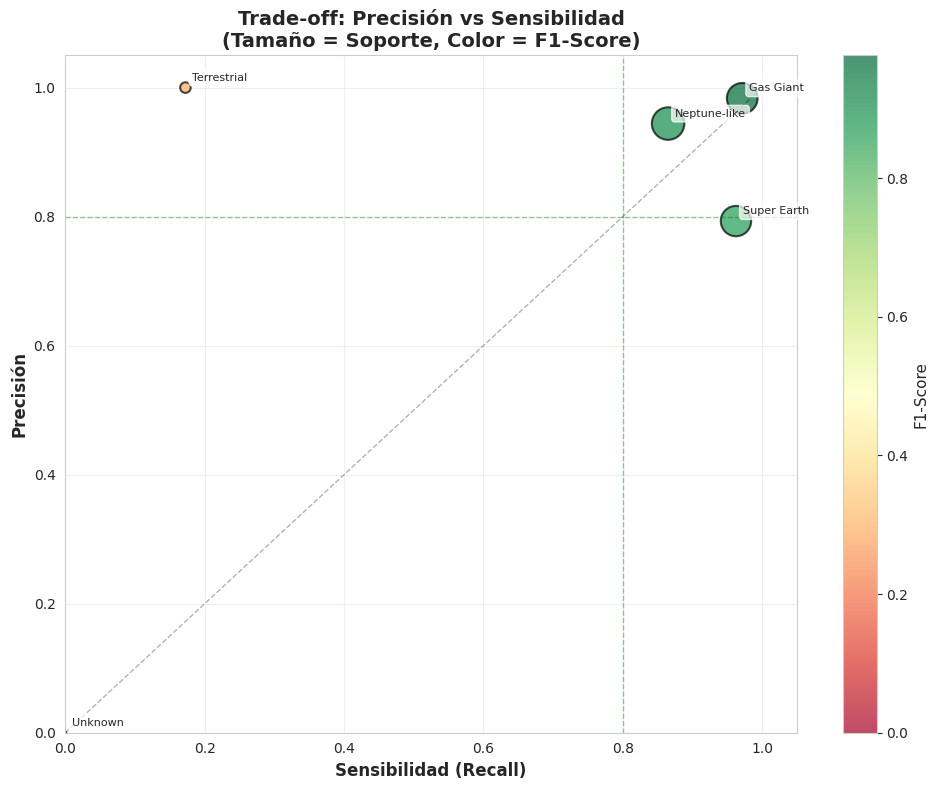


                         ANÁLISIS DE BALANCE
Clase con más muestras:  Neptune-like (274 muestras)
Clase con menos muestras: Unknown (1 muestras)
Ratio de desbalance:     274.00:1

  DESBALANCE SIGNIFICATIVO DETECTADO
   Considera aplicar técnicas de balanceo (SMOTE, class_weight)

                    IDENTIFICACIÓN DE CLASES PROBLEMÁTICAS

 Clases con F1-Score < 0.7:

   • Terrestrial:
      - F1-Score:      0.2941
      - Precisión:     1.0000
      - Sensibilidad:  0.1724
      - Especificidad: 1.0000
      - Soporte:       29
        Diagnóstico: Muchos falsos negativos - Modelo demasiado conservador

   • Unknown:
      - F1-Score:      0.0000
      - Precisión:     0.0000
      - Sensibilidad:  0.0000
      - Especificidad: 1.0000
      - Soporte:       1
        Diagnóstico: Problema general - Revisar features o modelo

 RESUMEN ESTADÍSTICO:
   • F1-Score promedio:  0.6088
   • F1-Score mínimo:    0.0000
   • F1-Score máximo:    0.9773
   • Desv. estándar:     0.4359
   • Clases

In [ ]:
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    classification_report, confusion_matrix, balanced_accuracy_score
)
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# --- Predicciones ---
y_pred_val = clasificador_lr.predict(x_val_final)

# --- MÉTRICAS GLOBALES ---
print("="*80)
print(" "*25 + "MÉTRICAS GLOBALES")
print("="*80)

exactitud = accuracy_score(y_val, y_pred_val)
exactitud_balanceada = balanced_accuracy_score(y_val, y_pred_val)
precision_macro = precision_score(y_val, y_pred_val, average='macro', zero_division=0)
recall_macro = recall_score(y_val, y_pred_val, average='macro', zero_division=0)
f1_macro = f1_score(y_val, y_pred_val, average='macro', zero_division=0)

precision_weighted = precision_score(y_val, y_pred_val, average='weighted', zero_division=0)
recall_weighted = recall_score(y_val, y_pred_val, average='weighted', zero_division=0)
f1_weighted = f1_score(y_val, y_pred_val, average='weighted', zero_division=0)

print(f"Exactitud (Accuracy):                {exactitud:.4f} ({exactitud*100:.2f}%)")
print(f"Exactitud Balanceada:                {exactitud_balanceada:.4f} ({exactitud_balanceada*100:.2f}%)")
print(f"\nPrecisión (macro):                   {precision_macro:.4f}")
print(f"Recall/Sensibilidad (macro):         {recall_macro:.4f}")
print(f"F1-Score (macro):                    {f1_macro:.4f}")
print(f"\nPrecisión (weighted):                {precision_weighted:.4f}")
print(f"Recall/Sensibilidad (weighted):      {recall_weighted:.4f}")
print(f"F1-Score (weighted):                 {f1_weighted:.4f}")
print("="*80)

# --- REPORTE DETALLADO ---
print("\n" + "="*80)
print(" "*20 + "REPORTE DE CLASIFICACIÓN POR CLASE")
print("="*80)
print(classification_report(y_val, y_pred_val, digits=4))

# --- CALCULAR MÉTRICAS DETALLADAS POR CLASE ---
cm = confusion_matrix(y_val, y_pred_val, labels=clasificador_lr.classes_)

metricas_por_clase = {
    'Clase': [],
    'Precisión': [],
    'Sensibilidad (Recall)': [],
    'Especificidad': [],
    'F1-Score': [],
    'Soporte': []
}

for i, clase in enumerate(clasificador_lr.classes_):
    TP = cm[i, i]
    FN = cm[i, :].sum() - TP
    FP = cm[:, i].sum() - TP
    TN = cm.sum() - (TP + FN + FP)

    precision = TP / (TP + FP) if (TP + FP) > 0 else 0
    sensibilidad = TP / (TP + FN) if (TP + FN) > 0 else 0
    especificidad = TN / (TN + FP) if (TN + FP) > 0 else 0
    f1 = 2 * (precision * sensibilidad) / (precision + sensibilidad) if (precision + sensibilidad) > 0 else 0
    soporte = TP + FN

    metricas_por_clase['Clase'].append(clase)
    metricas_por_clase['Precisión'].append(precision)
    metricas_por_clase['Sensibilidad (Recall)'].append(sensibilidad)
    metricas_por_clase['Especificidad'].append(especificidad)
    metricas_por_clase['F1-Score'].append(f1)
    metricas_por_clase['Soporte'].append(soporte)

df_metricas = pd.DataFrame(metricas_por_clase)

# --- TABLA ORDENADA POR F1-SCORE ---
print("\n" + "="*80)
print(" "*15 + "MÉTRICAS DETALLADAS POR CLASE (ordenado por F1-Score)")
print("="*80)
df_metricas_sorted = df_metricas.sort_values('F1-Score', ascending=False)
print(df_metricas_sorted.to_string(index=False))
print("="*80)

# --- VISUALIZACIÓN 1: Heatmap de métricas ---
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Heatmap de métricas
metricas_viz = df_metricas.set_index('Clase')[['Precisión', 'Sensibilidad (Recall)',
                                                 'Especificidad', 'F1-Score']]
sns.heatmap(metricas_viz.T, annot=True, fmt='.3f', cmap='RdYlGn',
            vmin=0, vmax=1, cbar_kws={'label': 'Valor'}, ax=axes[0], linewidths=0.5)
axes[0].set_title('Mapa de Calor: Métricas por Clase', fontsize=14, fontweight='bold')
axes[0].set_xlabel('Clase', fontsize=11)
axes[0].set_ylabel('Métrica', fontsize=11)

# Distribución de soporte
colors_soporte = plt.cm.viridis(np.linspace(0, 1, len(df_metricas)))
bars = axes[1].bar(range(len(df_metricas)), df_metricas['Soporte'],
                   color=colors_soporte, alpha=0.7, edgecolor='black')
axes[1].set_xticks(range(len(df_metricas)))
axes[1].set_xticklabels(df_metricas['Clase'], rotation=45, ha='right')
axes[1].set_ylabel('Número de muestras', fontsize=11)
axes[1].set_xlabel('Clase', fontsize=11)
axes[1].set_title('Distribución del Soporte por Clase', fontsize=14, fontweight='bold')
axes[1].grid(axis='y', alpha=0.3)

# Añadir valores sobre las barras
for bar in bars:
    height = bar.get_height()
    axes[1].text(bar.get_x() + bar.get_width()/2., height,
                f'{int(height)}', ha='center', va='bottom', fontsize=8)

plt.tight_layout()
plt.show()

# --- VISUALIZACIÓN 2: Comparación de métricas ---
fig, ax = plt.subplots(figsize=(14, 7))

x = np.arange(len(df_metricas))
width = 0.2

bars1 = ax.bar(x - 1.5*width, df_metricas['Precisión'], width,
               label='Precisión', color='skyblue', alpha=0.8)
bars2 = ax.bar(x - 0.5*width, df_metricas['Sensibilidad (Recall)'], width,
               label='Sensibilidad (Recall)', color='lightcoral', alpha=0.8)
bars3 = ax.bar(x + 0.5*width, df_metricas['Especificidad'], width,
               label='Especificidad', color='lightgreen', alpha=0.8)
bars4 = ax.bar(x + 1.5*width, df_metricas['F1-Score'], width,
               label='F1-Score', color='gold', alpha=0.8)

ax.set_xlabel('Clase', fontsize=12, fontweight='bold')
ax.set_ylabel('Valor de la métrica', fontsize=12, fontweight='bold')
ax.set_title('Comparación de Métricas por Clase', fontsize=14, fontweight='bold')
ax.set_xticks(x)
ax.set_xticklabels(df_metricas['Clase'], rotation=45, ha='right')
ax.legend(loc='lower right', fontsize=10)
ax.set_ylim([0, 1.1])
ax.axhline(y=0.8, color='green', linestyle='--', linewidth=1, alpha=0.5, label='Umbral bueno (0.8)')
ax.axhline(y=0.6, color='orange', linestyle='--', linewidth=1, alpha=0.5, label='Umbral aceptable (0.6)')
ax.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

# --- VISUALIZACIÓN 3: Scatter Precision vs Recall ---
fig, ax = plt.subplots(figsize=(10, 8))

scatter = ax.scatter(df_metricas['Sensibilidad (Recall)'],
                    df_metricas['Precisión'],
                    s=df_metricas['Soporte']*2,  # Tamaño proporcional al soporte
                    c=df_metricas['F1-Score'],
                    cmap='RdYlGn',
                    alpha=0.7,
                    edgecolors='black',
                    linewidth=1.5)

# Añadir etiquetas
for idx, row in df_metricas.iterrows():
    ax.annotate(row['Clase'],
               (row['Sensibilidad (Recall)'], row['Precisión']),
               fontsize=8,
               xytext=(5, 5),
               textcoords='offset points',
               bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.7))

# Líneas de referencia
ax.axhline(y=0.8, color='green', linestyle='--', linewidth=1, alpha=0.4)
ax.axvline(x=0.8, color='green', linestyle='--', linewidth=1, alpha=0.4)
ax.plot([0, 1], [0, 1], 'k--', linewidth=1, alpha=0.3)

ax.set_xlabel('Sensibilidad (Recall)', fontsize=12, fontweight='bold')
ax.set_ylabel('Precisión', fontsize=12, fontweight='bold')
ax.set_title('Trade-off: Precisión vs Sensibilidad\n(Tamaño = Soporte, Color = F1-Score)',
            fontsize=14, fontweight='bold')
ax.set_xlim([0, 1.05])
ax.set_ylim([0, 1.05])
ax.grid(True, alpha=0.3)

# Colorbar
cbar = plt.colorbar(scatter, ax=ax)
cbar.set_label('F1-Score', fontsize=11)
plt.tight_layout()
plt.show()

# --- ANÁLISIS DE BALANCE ---
print("\n" + "="*80)
print(" "*25 + "ANÁLISIS DE BALANCE")
print("="*80)

min_soporte = df_metricas['Soporte'].min()
max_soporte = df_metricas['Soporte'].max()
ratio_desbalance = max_soporte / min_soporte

print(f"Clase con más muestras:  {df_metricas.loc[df_metricas['Soporte'].idxmax(), 'Clase']} ({max_soporte} muestras)")
print(f"Clase con menos muestras: {df_metricas.loc[df_metricas['Soporte'].idxmin(), 'Clase']} ({min_soporte} muestras)")
print(f"Ratio de desbalance:     {ratio_desbalance:.2f}:1")

if ratio_desbalance > 3:
    print("\n  DESBALANCE SIGNIFICATIVO DETECTADO")
    print("   Considera aplicar técnicas de balanceo (SMOTE, class_weight)")
else:
    print("\n Las clases están relativamente balanceadas")

# --- IDENTIFICAR CLASES PROBLEMÁTICAS ---
print("\n" + "="*80)
print(" "*20 + "IDENTIFICACIÓN DE CLASES PROBLEMÁTICAS")
print("="*80)

umbral_f1 = 0.7
clases_problema = df_metricas[df_metricas['F1-Score'] < umbral_f1]

if len(clases_problema) > 0:
    print(f"\n Clases con F1-Score < {umbral_f1}:")
    for _, row in clases_problema.iterrows():
        print(f"\n   • {row['Clase']}:")
        print(f"      - F1-Score:      {row['F1-Score']:.4f}")
        print(f"      - Precisión:     {row['Precisión']:.4f}")
        print(f"      - Sensibilidad:  {row['Sensibilidad (Recall)']:.4f}")
        print(f"      - Especificidad: {row['Especificidad']:.4f}")
        print(f"      - Soporte:       {row['Soporte']}")

        # Diagnóstico
        if row['Precisión'] < 0.7 and row['Sensibilidad (Recall)'] < 0.7:
            print("        Diagnóstico: Problema general - Revisar features o modelo")
        elif row['Precisión'] < row['Sensibilidad (Recall)']:
            print("        Diagnóstico: Muchos falsos positivos - Modelo demasiado permisivo")
        else:
            print("        Diagnóstico: Muchos falsos negativos - Modelo demasiado conservador")
else:
    print(f"\n Todas las clases tienen F1-Score ≥ {umbral_f1}")

print("="*80)

# --- ESTADÍSTICAS FINALES ---
print("\n RESUMEN ESTADÍSTICO:")
print(f"   • F1-Score promedio:  {df_metricas['F1-Score'].mean():.4f}")
print(f"   • F1-Score mínimo:    {df_metricas['F1-Score'].min():.4f}")
print(f"   • F1-Score máximo:    {df_metricas['F1-Score'].max():.4f}")
print(f"   • Desv. estándar:     {df_metricas['F1-Score'].std():.4f}")
print(f"   • Clases con F1 > 0.8: {(df_metricas['F1-Score'] > 0.8).sum()}/{len(df_metricas)}")
print("="*80)

## Optimización de Hiperparámetros

In [ ]:
# --- Optimización de hiperparámetros para Logistic Regression ---
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV

# Definir el modelo base
logreg = LogisticRegression(max_iter=1000, multi_class='multinomial')

# Definir el espacio de búsqueda de hiperparámetros
param_grid = {
    'C': [0.001, 0.01, 0.1, 1, 10, 100],         # Fuerza de regularización inversa
    'penalty': ['l2', 'none'],                   # Tipo de penalización
    'solver': ['lbfgs', 'newton-cg', 'saga']     # Métodos de optimización compatibles con multiclase
}

# Configurar la búsqueda con validación cruzada (5 folds)
grid_search = GridSearchCV(
    estimator=logreg,
    param_grid=param_grid,
    scoring='accuracy',      # Puedes cambiar a 'f1_macro' o 'roc_auc_ovr' si lo prefieres
    cv=5,
    n_jobs=-1,
    verbose=2
)

# Entrenar el modelo con el conjunto de entrenamiento
grid_search.fit(x_train_final, y_train)

# Mostrar los mejores parámetros y el mejor puntaje promedio
print("\n--- Resultados de GridSearch ---")
print(f"Mejores hiperparámetros: {grid_search.best_params_}")
print(f"Mejor exactitud promedio (CV): {grid_search.best_score_:.4f}")

# Obtener el mejor modelo optimizado
best_lr = grid_search.best_estimator_

# Evaluar el mejor modelo en el conjunto de validación
y_pred_val_opt = best_lr.predict(x_val_final)
val_acc = accuracy_score(y_val, y_pred_val_opt)
print(f"\nExactitud en validación con el mejor modelo: {val_acc:.4f}")


Fitting 5 folds for each of 36 candidates, totalling 180 fits


/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning: 
90 fits failed out of a total of 180.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
41 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.12/dist-packages/sklearn/base.py", line 1382, in wrapper
    estimator._validate_params()
  F


--- Resultados de GridSearch ---
Mejores hiperparámetros: {'C': 100, 'penalty': 'l2', 'solver': 'saga'}
Mejor exactitud promedio (CV): 0.9646

Exactitud en validación con el mejor modelo: 0.9644


 Exactitud global del modelo optimizado: 0.964

 Reporte de clasificación (por clase):

              precision    recall  f1-score   support

   Gas Giant      0.988     0.984     0.986       244
Neptune-like      0.960     0.960     0.960       274
 Super Earth      0.942     0.958     0.950       239
 Terrestrial      1.000     0.897     0.945        29
     Unknown      1.000     1.000     1.000         1

    accuracy                          0.964       787
   macro avg      0.978     0.960     0.968       787
weighted avg      0.965     0.964     0.964       787


 Métricas por clase:

          Clase  Precisión  Exhaustividad (Recall)  F1 Score  Sensibilidad  \
0     Gas Giant      0.988                   0.984     0.986         0.984   
1  Neptune-like      0.960                   0.960     0.960         0.960   
2   Super Earth      0.942                   0.958     0.950         0.958   
3   Terrestrial      1.000                   0.897     0.945         0.897   
4       Un

<Figure size 700x500 with 0 Axes>

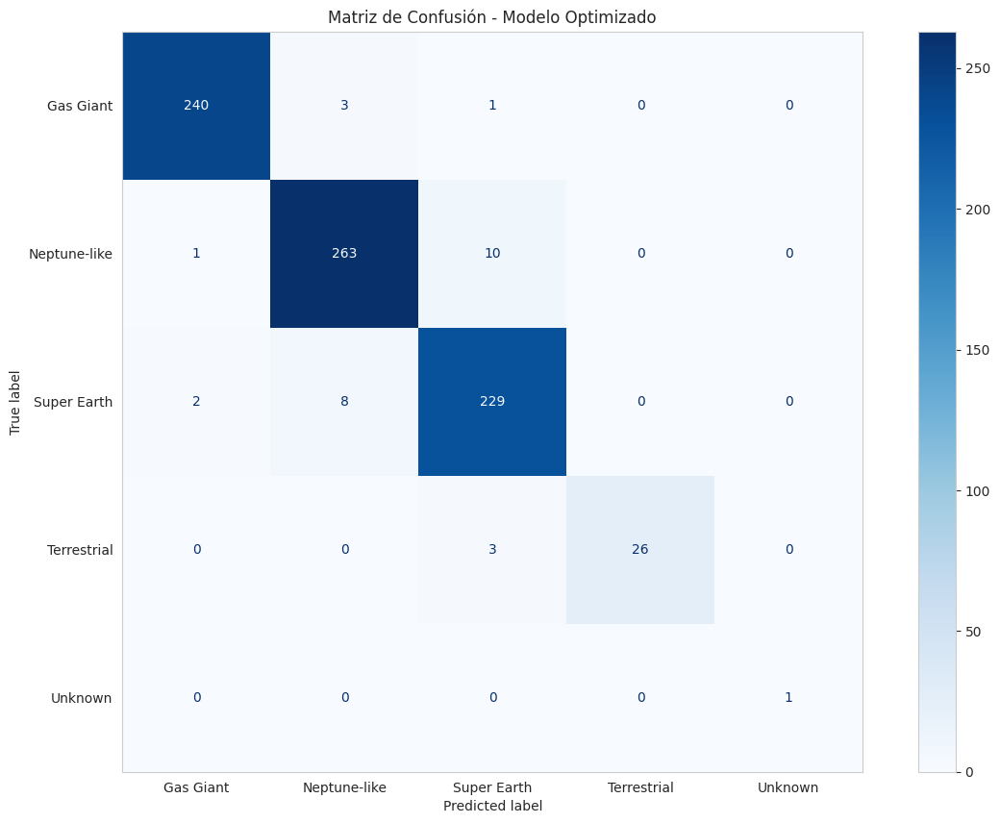

In [ ]:
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    confusion_matrix, ConfusionMatrixDisplay, classification_report
)
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# --- Predicciones con el modelo optimizado ---
y_pred_opt = best_lr.predict(x_val_final)
y_proba_opt = best_lr.predict_proba(x_val_final)

# --- Exactitud global ---
exactitud_opt = accuracy_score(y_val, y_pred_opt)
print(f" Exactitud global del modelo optimizado: {exactitud_opt:.3f}\n")

# --- Reporte de clasificación por clase ---
print(" Reporte de clasificación (por clase):\n")
print(classification_report(y_val, y_pred_opt, digits=3))

# --- Cálculo manual de métricas por clase ---
labels = best_lr.classes_
cm = confusion_matrix(y_val, y_pred_opt, labels=labels)
cm_df = pd.DataFrame(cm, index=labels, columns=labels)

metricas = []

for i, clase in enumerate(labels):
    TP = cm[i, i]
    FP = cm[:, i].sum() - TP
    FN = cm[i, :].sum() - TP
    TN = cm.sum() - (TP + FP + FN)

    precision = TP / (TP + FP) if (TP + FP) > 0 else 0
    recall = TP / (TP + FN) if (TP + FN) > 0 else 0
    f1 = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0
    sensibilidad = recall
    especificidad = TN / (TN + FP) if (TN + FP) > 0 else 0

    metricas.append({
        'Clase': clase,
        'Precisión': precision,
        'Exhaustividad (Recall)': recall,
        'F1 Score': f1,
        'Sensibilidad': sensibilidad,
        'Especificidad': especificidad
    })

df_metricas = pd.DataFrame(metricas)
print("\n Métricas por clase:\n")
print(df_metricas.round(3))

# --- Matriz de confusión ---
plt.figure(figsize=(7, 5))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
disp.plot(cmap='Blues', values_format='d')
plt.title('Matriz de Confusión - Modelo Optimizado')
plt.grid(False)
plt.show()


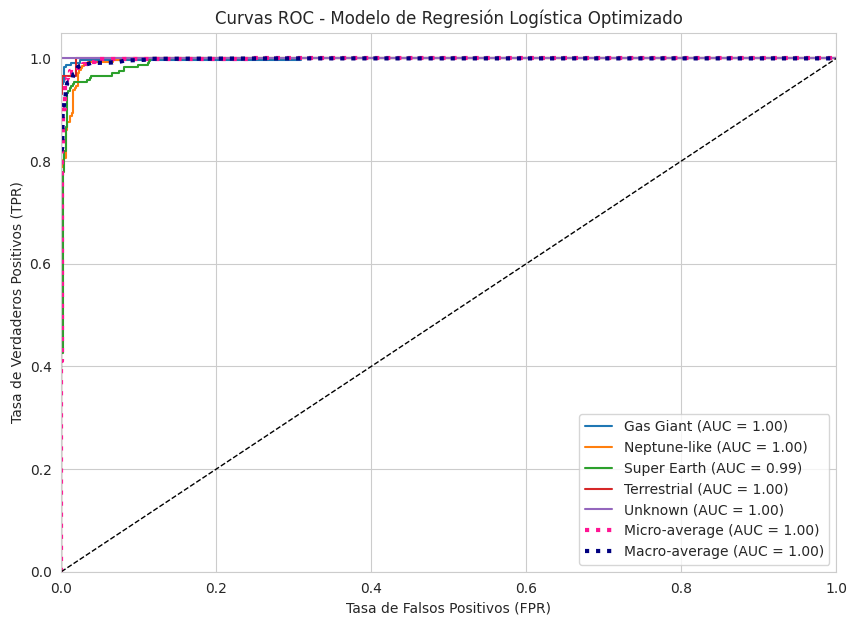


 AUC por clase:
Gas Giant: 0.998
Neptune-like: 0.997
Super Earth: 0.995
Terrestrial: 0.999
Unknown: 1.000

AUC micro-average: 0.998
AUC macro-average: 0.998


In [ ]:
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
import numpy as np

# --- Binarizar las etiquetas para clasificación multiclase ---
y_val_bin = label_binarize(y_val, classes=best_lr.classes_)
n_classes = y_val_bin.shape[1]

# --- Probabilidades predichas por el modelo optimizado ---
y_proba_opt = best_lr.predict_proba(x_val_final)

# --- Calcular FPR, TPR y AUC para cada clase ---
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_val_bin[:, i], y_proba_opt[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# --- Curvas ROC micro y macro promedio ---
# Micro: combina todas las clases
fpr["micro"], tpr["micro"], _ = roc_curve(y_val_bin.ravel(), y_proba_opt.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# Macro: promedio del AUC de todas las clases
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= n_classes
fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# --- Graficar las curvas ROC ---
plt.figure(figsize=(10, 7))

# Curvas individuales
for i in range(n_classes):
    plt.plot(
        fpr[i], tpr[i],
        label=f'{best_lr.classes_[i]} (AUC = {roc_auc[i]:.2f})'
    )

# Micro y macro promedio
plt.plot(
    fpr["micro"], tpr["micro"],
    label=f'Micro-average (AUC = {roc_auc["micro"]:.2f})',
    color='deeppink', linestyle=':', linewidth=3
)
plt.plot(
    fpr["macro"], tpr["macro"],
    label=f'Macro-average (AUC = {roc_auc["macro"]:.2f})',
    color='navy', linestyle=':', linewidth=3
)

# --- Gráfico base ---
plt.plot([0, 1], [0, 1], 'k--', lw=1)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Tasa de Falsos Positivos (FPR)')
plt.ylabel('Tasa de Verdaderos Positivos (TPR)')
plt.title('Curvas ROC - Modelo de Regresión Logística Optimizado')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

# --- Mostrar los valores AUC por clase ---
print("\n AUC por clase:")
for i in range(n_classes):
    print(f"{best_lr.classes_[i]}: {roc_auc[i]:.3f}")
print(f"\nAUC micro-average: {roc_auc['micro']:.3f}")
print(f"AUC macro-average: {roc_auc['macro']:.3f}")


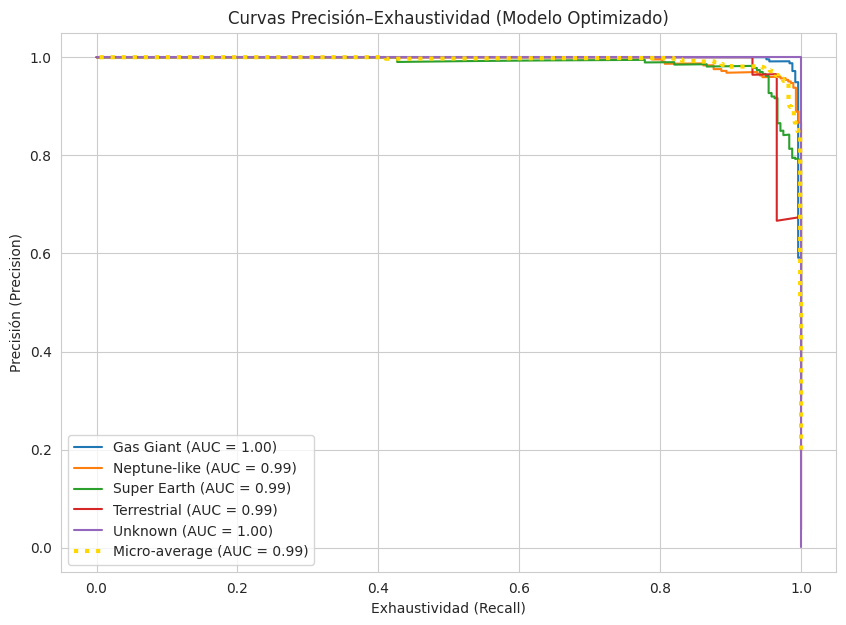

In [ ]:
from sklearn.preprocessing import label_binarize
from sklearn.metrics import precision_recall_curve, average_precision_score
import matplotlib.pyplot as plt
import numpy as np

# --- Binarizar etiquetas ---
y_val_bin = label_binarize(y_val, classes=best_lr.classes_)

# --- Obtener las probabilidades del modelo optimizado ---
y_proba_opt = best_lr.predict_proba(x_val_final)

# --- Calcular curvas Precision-Recall y AUC-PR para cada clase ---
precision = dict()
recall = dict()
average_precision = dict()
n_classes = y_val_bin.shape[1]

for i in range(n_classes):
    precision[i], recall[i], _ = precision_recall_curve(y_val_bin[:, i], y_proba_opt[:, i])
    average_precision[i] = average_precision_score(y_val_bin[:, i], y_proba_opt[:, i])

# --- Calcular promedio micro ---
precision["micro"], recall["micro"], _ = precision_recall_curve(
    y_val_bin.ravel(), y_proba_opt.ravel()
)
average_precision["micro"] = average_precision_score(y_val_bin, y_proba_opt, average="micro")

# --- Graficar ---
plt.figure(figsize=(10, 7))

# Curvas por clase
for i in range(n_classes):
    plt.plot(recall[i], precision[i],
             label=f'{best_lr.classes_[i]} (AUC = {average_precision[i]:.2f})')

# Micro promedio
plt.plot(recall["micro"], precision["micro"],
         label=f'Micro-average (AUC = {average_precision["micro"]:.2f})',
         color='gold', linestyle=':', linewidth=3)

# Gráfico base
plt.xlabel('Exhaustividad (Recall)')
plt.ylabel('Precisión (Precision)')
plt.title('Curvas Precisión–Exhaustividad (Modelo Optimizado)')
plt.legend(loc='lower left')
plt.grid(True)
plt.show()


                    OPTIMIZACIÓN DE HIPERPARÁMETROS

 PASO 1: Evaluando modelo base...


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


   • Accuracy (base):         0.9009
   • F1-Score macro (base):   0.6088
   • F1-Score weighted (base): 0.8923

 PASO 2: Configurando GridSearchCV...
   Espacio de búsqueda:
   • C: [0.001, 0.01, 0.1, 1, 10, 100]
   • penalty: ['l2', 'none']
   • solver: ['lbfgs', 'newton-cg', 'saga']
   • Total de combinaciones: 36

 PASO 3: Entrenando modelos (esto puede tomar unos minutos)...
Fitting 5 folds for each of 36 candidates, totalling 180 fits


/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning: 
90 fits failed out of a total of 180.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
73 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.12/dist-packages/sklearn/base.py", line 1382, in wrapper
    estimator._validate_params()
  F


                    RESULTADOS DE LA OPTIMIZACIÓN

 MEJORES HIPERPARÁMETROS (según F1-macro):
   • C: 100
   • penalty: l2
   • solver: saga

 MEJORES PUNTAJES EN VALIDACIÓN CRUZADA (CV):
   • Accuracy (CV):     0.9646
   • F1-macro (CV):     0.9146
   • F1-weighted (CV):  0.9642

 RENDIMIENTO EN VALIDACIÓN:
   • Accuracy:     0.9644
   • F1-macro:     0.9682
   • F1-weighted:  0.9644

                    COMPARACIÓN: BASE vs OPTIMIZADO

    Métrica  Modelo Base  Modelo Optimizado  Mejora Absoluta  Mejora (%)
   Accuracy     0.900889           0.964422         0.063532    7.052186
   F1-Macro     0.608772           0.968228         0.359457   59.046177
F1-Weighted     0.892255           0.964435         0.072181    8.089703

✅ La optimización MEJORÓ el modelo en 59.05%

                    ANÁLISIS DETALLADO DEL GRIDEARCH

 TOP 5 MEJORES COMBINACIONES (por F1-macro):
 param_C param_penalty param_solver  mean_test_f1_macro  std_test_f1_macro  mean_test_accuracy  rank_test_f1_macro
   1

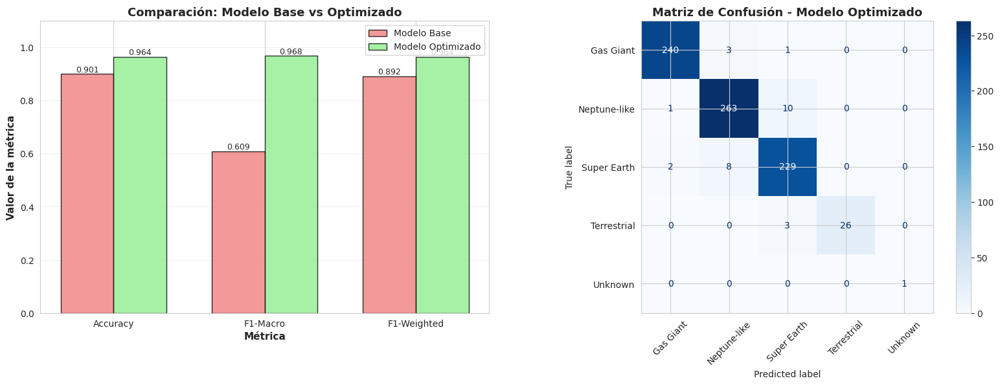

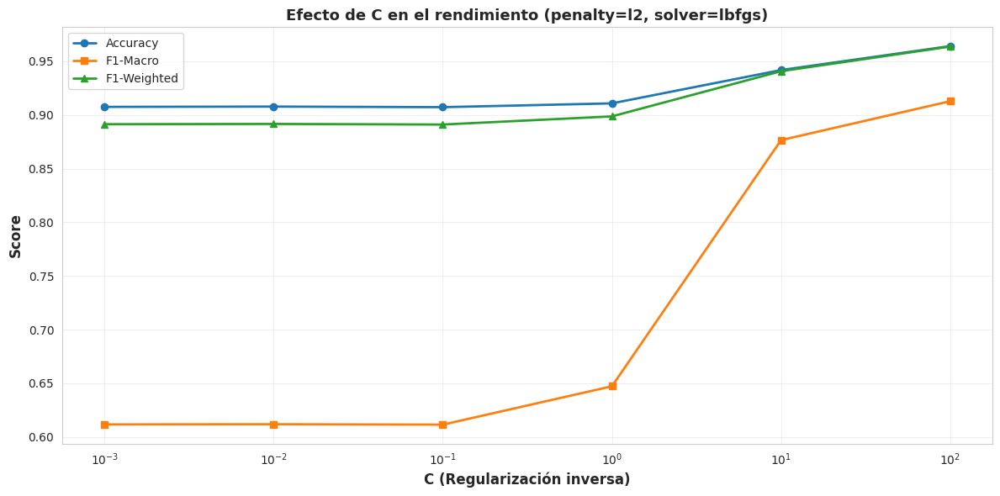


               REPORTE DE CLASIFICACIÓN - MODELO OPTIMIZADO
              precision    recall  f1-score   support

   Gas Giant     0.9877    0.9836    0.9856       244
Neptune-like     0.9599    0.9599    0.9599       274
 Super Earth     0.9424    0.9582    0.9502       239
 Terrestrial     1.0000    0.8966    0.9455        29
     Unknown     1.0000    1.0000    1.0000         1

    accuracy                         0.9644       787
   macro avg     0.9780    0.9596    0.9682       787
weighted avg     0.9647    0.9644    0.9644       787


 OPTIMIZACIÓN COMPLETADA


In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import (
    accuracy_score, f1_score, classification_report,
    confusion_matrix, ConfusionMatrixDisplay
)
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

print("="*80)
print(" "*20 + "OPTIMIZACIÓN DE HIPERPARÁMETROS")
print("="*80)

# --- MODELO BASE (sin optimizar) ---
print("\n PASO 1: Evaluando modelo base...")
modelo_base = LogisticRegression(
    max_iter=1000,
    multi_class='multinomial',
    solver='lbfgs',
    random_state=8
)
modelo_base.fit(x_train_final, y_train)
y_pred_base = modelo_base.predict(x_val_final)

acc_base = accuracy_score(y_val, y_pred_base)
f1_base_macro = f1_score(y_val, y_pred_base, average='macro')
f1_base_weighted = f1_score(y_val, y_pred_base, average='weighted')

print(f"   • Accuracy (base):         {acc_base:.4f}")
print(f"   • F1-Score macro (base):   {f1_base_macro:.4f}")
print(f"   • F1-Score weighted (base): {f1_base_weighted:.4f}")

# --- DEFINIR ESPACIO DE BÚSQUEDA ---
print("\n PASO 2: Configurando GridSearchCV...")

logreg = LogisticRegression(max_iter=1000, multi_class='multinomial', random_state=8)

param_grid = {
    'C': [0.001, 0.01, 0.1, 1, 10, 100],
    'penalty': ['l2', 'none'],
    'solver': ['lbfgs', 'newton-cg', 'saga']
}

# Probar con diferentes métricas
scoring_metrics = {
    'accuracy': 'accuracy',
    'f1_macro': 'f1_macro',
    'f1_weighted': 'f1_weighted'
}

# GridSearchCV con refit en la métrica que prefieras
grid_search = GridSearchCV(
    estimator=logreg,
    param_grid=param_grid,
    scoring=scoring_metrics,
    refit='f1_macro',  # El mejor modelo se seleccionará por F1-macro
    cv=5,
    n_jobs=-1,
    verbose=1,
    return_train_score=True
)

print("   Espacio de búsqueda:")
print(f"   • C: {param_grid['C']}")
print(f"   • penalty: {param_grid['penalty']}")
print(f"   • solver: {param_grid['solver']}")
print(f"   • Total de combinaciones: {len(param_grid['C']) * len(param_grid['penalty']) * len(param_grid['solver'])}")

# --- EJECUTAR BÚSQUEDA ---
print("\n PASO 3: Entrenando modelos (esto puede tomar unos minutos)...")
grid_search.fit(x_train_final, y_train)

# --- RESULTADOS DE LA BÚSQUEDA ---
print("\n" + "="*80)
print(" "*20 + "RESULTADOS DE LA OPTIMIZACIÓN")
print("="*80)

print(f"\n MEJORES HIPERPARÁMETROS (según F1-macro):")
for param, value in grid_search.best_params_.items():
    print(f"   • {param}: {value}")

print(f"\n MEJORES PUNTAJES EN VALIDACIÓN CRUZADA (CV):")
print(f"   • Accuracy (CV):     {grid_search.cv_results_['mean_test_accuracy'][grid_search.best_index_]:.4f}")
print(f"   • F1-macro (CV):     {grid_search.cv_results_['mean_test_f1_macro'][grid_search.best_index_]:.4f}")
print(f"   • F1-weighted (CV):  {grid_search.cv_results_['mean_test_f1_weighted'][grid_search.best_index_]:.4f}")

# --- EVALUAR EN CONJUNTO DE VALIDACIÓN ---
best_lr = grid_search.best_estimator_
y_pred_val_opt = best_lr.predict(x_val_final)

acc_opt = accuracy_score(y_val, y_pred_val_opt)
f1_opt_macro = f1_score(y_val, y_pred_val_opt, average='macro')
f1_opt_weighted = f1_score(y_val, y_pred_val_opt, average='weighted')

print(f"\n RENDIMIENTO EN VALIDACIÓN:")
print(f"   • Accuracy:     {acc_opt:.4f}")
print(f"   • F1-macro:     {f1_opt_macro:.4f}")
print(f"   • F1-weighted:  {f1_opt_weighted:.4f}")

# --- COMPARACIÓN: BASE vs OPTIMIZADO ---
print("\n" + "="*80)
print(" "*20 + "COMPARACIÓN: BASE vs OPTIMIZADO")
print("="*80)

mejora_acc = ((acc_opt - acc_base) / acc_base) * 100
mejora_f1_macro = ((f1_opt_macro - f1_base_macro) / f1_base_macro) * 100
mejora_f1_weighted = ((f1_opt_weighted - f1_base_weighted) / f1_base_weighted) * 100

comparacion_df = pd.DataFrame({
    'Métrica': ['Accuracy', 'F1-Macro', 'F1-Weighted'],
    'Modelo Base': [acc_base, f1_base_macro, f1_base_weighted],
    'Modelo Optimizado': [acc_opt, f1_opt_macro, f1_opt_weighted],
    'Mejora Absoluta': [acc_opt - acc_base, f1_opt_macro - f1_base_macro, f1_opt_weighted - f1_base_weighted],
    'Mejora (%)': [mejora_acc, mejora_f1_macro, mejora_f1_weighted]
})

print("\n" + comparacion_df.to_string(index=False))

# Indicador de mejora
if mejora_f1_macro > 0:
    print(f"\n✅ La optimización MEJORÓ el modelo en {mejora_f1_macro:.2f}%")
elif mejora_f1_macro == 0:
    print(f"\n➡️  La optimización NO cambió el rendimiento (modelo base ya era óptimo)")
else:
    print(f"\n⚠️  La optimización EMPEORÓ el modelo en {abs(mejora_f1_macro):.2f}% (posible sobreajuste)")

# --- ANÁLISIS DE RESULTADOS DEL GRID ---
print("\n" + "="*80)
print(" "*20 + "ANÁLISIS DETALLADO DEL GRIDEARCH")
print("="*80)

results_df = pd.DataFrame(grid_search.cv_results_)

# Top 5 mejores combinaciones por F1-macro
top5 = results_df.nsmallest(5, 'rank_test_f1_macro')[
    ['param_C', 'param_penalty', 'param_solver',
     'mean_test_f1_macro', 'std_test_f1_macro',
     'mean_test_accuracy', 'rank_test_f1_macro']
]

print("\n TOP 5 MEJORES COMBINACIONES (por F1-macro):")
print(top5.to_string(index=False))

# --- VISUALIZACIÓN 1: Comparación antes/después ---
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Gráfico de barras comparativo
metricas = ['Accuracy', 'F1-Macro', 'F1-Weighted']
base_values = [acc_base, f1_base_macro, f1_base_weighted]
opt_values = [acc_opt, f1_opt_macro, f1_opt_weighted]

x = np.arange(len(metricas))
width = 0.35

bars1 = axes[0].bar(x - width/2, base_values, width, label='Modelo Base',
                    color='lightcoral', alpha=0.8, edgecolor='black')
bars2 = axes[0].bar(x + width/2, opt_values, width, label='Modelo Optimizado',
                    color='lightgreen', alpha=0.8, edgecolor='black')

axes[0].set_ylabel('Valor de la métrica', fontsize=11, fontweight='bold')
axes[0].set_xlabel('Métrica', fontsize=11, fontweight='bold')
axes[0].set_title('Comparación: Modelo Base vs Optimizado', fontsize=13, fontweight='bold')
axes[0].set_xticks(x)
axes[0].set_xticklabels(metricas)
axes[0].legend()
axes[0].set_ylim([0, 1.1])
axes[0].grid(axis='y', alpha=0.3)

# Añadir valores sobre las barras
for bars in [bars1, bars2]:
    for bar in bars:
        height = bar.get_height()
        axes[0].text(bar.get_x() + bar.get_width()/2., height,
                    f'{height:.3f}', ha='center', va='bottom', fontsize=9)

# Matriz de confusión del modelo optimizado
cm_opt = confusion_matrix(y_val, y_pred_val_opt)
disp = ConfusionMatrixDisplay(confusion_matrix=cm_opt, display_labels=best_lr.classes_)
disp.plot(cmap='Blues', ax=axes[1], xticks_rotation=45, values_format='d')
axes[1].set_title('Matriz de Confusión - Modelo Optimizado', fontsize=13, fontweight='bold')

plt.tight_layout()
plt.show()

# --- VISUALIZACIÓN 2: Efecto de C (regularización) ---
fig, ax = plt.subplots(figsize=(12, 6))

# Filtrar por penalty='l2' y solver='lbfgs' para ver el efecto de C
df_filtered = results_df[
    (results_df['param_penalty'] == 'l2') &
    (results_df['param_solver'] == 'lbfgs')
].sort_values('param_C')

if len(df_filtered) > 0:
    ax.plot(df_filtered['param_C'], df_filtered['mean_test_accuracy'],
            marker='o', label='Accuracy', linewidth=2)
    ax.plot(df_filtered['param_C'], df_filtered['mean_test_f1_macro'],
            marker='s', label='F1-Macro', linewidth=2)
    ax.plot(df_filtered['param_C'], df_filtered['mean_test_f1_weighted'],
            marker='^', label='F1-Weighted', linewidth=2)

    ax.set_xscale('log')
    ax.set_xlabel('C (Regularización inversa)', fontsize=12, fontweight='bold')
    ax.set_ylabel('Score', fontsize=12, fontweight='bold')
    ax.set_title('Efecto de C en el rendimiento (penalty=l2, solver=lbfgs)',
                fontsize=13, fontweight='bold')
    ax.legend(fontsize=10)
    ax.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()
else:
    print("\n⚠️  No hay suficientes datos para visualizar el efecto de C")

# --- REPORTE DE CLASIFICACIÓN DETALLADO ---
print("\n" + "="*80)
print(" "*15 + "REPORTE DE CLASIFICACIÓN - MODELO OPTIMIZADO")
print("="*80)
print(classification_report(y_val, y_pred_val_opt, digits=4))

print("\n" + "="*80)
print(" OPTIMIZACIÓN COMPLETADA")
print("="*80)

               CURVAS ROC Y PRECISION-RECALL - MODELO OPTIMIZADO

 Calculando curvas ROC...


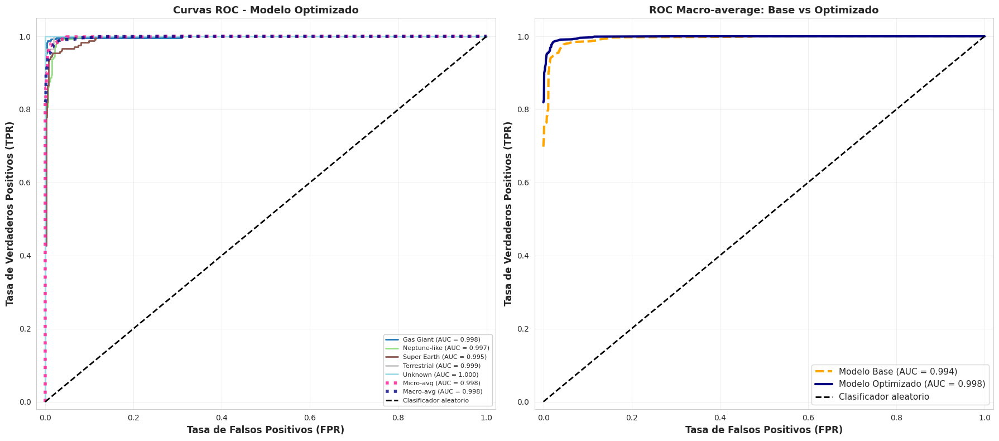


 Calculando curvas Precision-Recall...


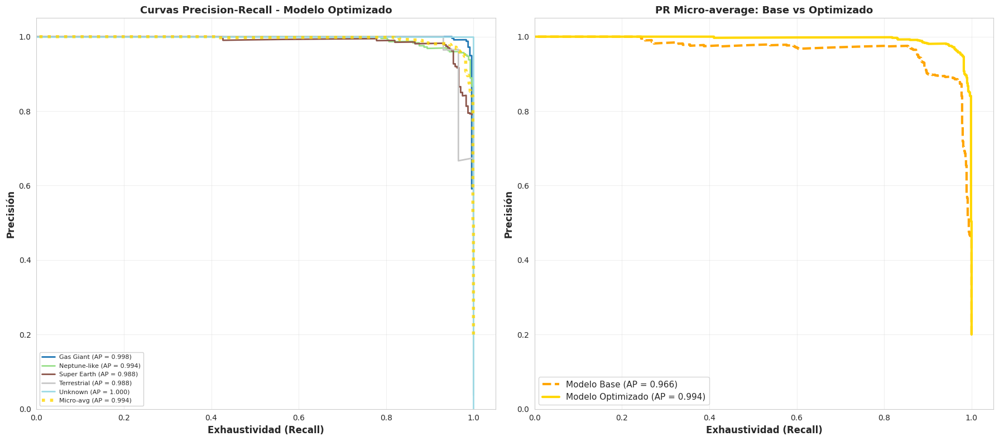


                    COMPARACIÓN ROC-AUC: BASE vs OPTIMIZADO
Clase                              AUC Base  AUC Optimizado       Mejora
────────────────────────────────────────────────────────────────────────────────
Gas Giant                            0.9969          0.9984      0.0015 🟢
Neptune-like                         0.9811          0.9968      0.0157 🟢
Super Earth                          0.9892          0.9947      0.0055 🟢
Terrestrial                          0.9998          0.9993     -0.0005 🔴
Unknown                              1.0000          1.0000      0.0000 ➡️
────────────────────────────────────────────────────────────────────────────────
Micro-average                        0.9911          0.9983      0.0072 🟢
Macro-average                        0.9937          0.9980      0.0043 🟢

               COMPARACIÓN PRECISION-RECALL: BASE vs OPTIMIZADO
Clase                               AP Base   AP Optimizado       Mejora
───────────────────────────────────────────────

In [ ]:
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc, precision_recall_curve, average_precision_score
import matplotlib.pyplot as plt
import numpy as np
from matplotlib import cm

print("="*80)
print(" "*15 + "CURVAS ROC Y PRECISION-RECALL - MODELO OPTIMIZADO")
print("="*80)

# --- Binarizar las etiquetas ---
y_val_bin = label_binarize(y_val, classes=best_lr.classes_)
n_classes = y_val_bin.shape[1]

# --- Obtener probabilidades del MODELO OPTIMIZADO ---
y_proba_opt = best_lr.predict_proba(x_val_final)

# --- Obtener probabilidades del MODELO BASE (para comparación) ---
y_proba_base = modelo_base.predict_proba(x_val_final)

# ============================================================================
#                           CURVAS ROC - MODELO OPTIMIZADO
# ============================================================================

print("\n Calculando curvas ROC...")

# Calcular FPR, TPR y AUC para cada clase (OPTIMIZADO)
fpr_opt = dict()
tpr_opt = dict()
roc_auc_opt = dict()

for i in range(n_classes):
    fpr_opt[i], tpr_opt[i], _ = roc_curve(y_val_bin[:, i], y_proba_opt[:, i])
    roc_auc_opt[i] = auc(fpr_opt[i], tpr_opt[i])

# Micro-average
fpr_opt["micro"], tpr_opt["micro"], _ = roc_curve(y_val_bin.ravel(), y_proba_opt.ravel())
roc_auc_opt["micro"] = auc(fpr_opt["micro"], tpr_opt["micro"])

# Macro-average
all_fpr_opt = np.unique(np.concatenate([fpr_opt[i] for i in range(n_classes)]))
mean_tpr_opt = np.zeros_like(all_fpr_opt)
for i in range(n_classes):
    mean_tpr_opt += np.interp(all_fpr_opt, fpr_opt[i], tpr_opt[i])
mean_tpr_opt /= n_classes
fpr_opt["macro"] = all_fpr_opt
tpr_opt["macro"] = mean_tpr_opt
roc_auc_opt["macro"] = auc(fpr_opt["macro"], tpr_opt["macro"])

# Calcular para MODELO BASE (para comparación)
fpr_base = dict()
tpr_base = dict()
roc_auc_base = dict()

for i in range(n_classes):
    fpr_base[i], tpr_base[i], _ = roc_curve(y_val_bin[:, i], y_proba_base[:, i])
    roc_auc_base[i] = auc(fpr_base[i], tpr_base[i])

fpr_base["micro"], tpr_base["micro"], _ = roc_curve(y_val_bin.ravel(), y_proba_base.ravel())
roc_auc_base["micro"] = auc(fpr_base["micro"], tpr_base["micro"])

all_fpr_base = np.unique(np.concatenate([fpr_base[i] for i in range(n_classes)]))
mean_tpr_base = np.zeros_like(all_fpr_base)
for i in range(n_classes):
    mean_tpr_base += np.interp(all_fpr_base, fpr_base[i], tpr_base[i])
mean_tpr_base /= n_classes
fpr_base["macro"] = all_fpr_base
tpr_base["macro"] = mean_tpr_base
roc_auc_base["macro"] = auc(fpr_base["macro"], tpr_base["macro"])

# --- GRÁFICO 1: ROC POR CLASE (MODELO OPTIMIZADO) ---
fig, axes = plt.subplots(1, 2, figsize=(18, 8))

colors = cm.tab20(np.linspace(0, 1, n_classes))

# Panel izquierdo: Todas las clases
for i, color in zip(range(n_classes), colors):
    axes[0].plot(
        fpr_opt[i], tpr_opt[i], color=color, lw=2,
        label=f'{best_lr.classes_[i]} (AUC = {roc_auc_opt[i]:.3f})'
    )

axes[0].plot(
    fpr_opt["micro"], tpr_opt["micro"],
    label=f'Micro-avg (AUC = {roc_auc_opt["micro"]:.3f})',
    color='deeppink', linestyle=':', linewidth=4, alpha=0.8
)
axes[0].plot(
    fpr_opt["macro"], tpr_opt["macro"],
    label=f'Macro-avg (AUC = {roc_auc_opt["macro"]:.3f})',
    color='navy', linestyle=':', linewidth=4, alpha=0.8
)
axes[0].plot([0, 1], [0, 1], 'k--', lw=2, label='Clasificador aleatorio')

axes[0].set_xlim([-0.02, 1.02])
axes[0].set_ylim([-0.02, 1.05])
axes[0].set_xlabel('Tasa de Falsos Positivos (FPR)', fontsize=12, fontweight='bold')
axes[0].set_ylabel('Tasa de Verdaderos Positivos (TPR)', fontsize=12, fontweight='bold')
axes[0].set_title('Curvas ROC - Modelo Optimizado', fontsize=13, fontweight='bold')
axes[0].legend(loc='lower right', fontsize=8, framealpha=0.9)
axes[0].grid(True, alpha=0.3)

# Panel derecho: Comparación Macro-average (Base vs Optimizado)
axes[1].plot(
    fpr_base["macro"], tpr_base["macro"],
    label=f'Modelo Base (AUC = {roc_auc_base["macro"]:.3f})',
    color='orange', linestyle='--', linewidth=3
)
axes[1].plot(
    fpr_opt["macro"], tpr_opt["macro"],
    label=f'Modelo Optimizado (AUC = {roc_auc_opt["macro"]:.3f})',
    color='navy', linestyle='-', linewidth=3
)
axes[1].plot([0, 1], [0, 1], 'k--', lw=2, label='Clasificador aleatorio')

axes[1].set_xlim([-0.02, 1.02])
axes[1].set_ylim([-0.02, 1.05])
axes[1].set_xlabel('Tasa de Falsos Positivos (FPR)', fontsize=12, fontweight='bold')
axes[1].set_ylabel('Tasa de Verdaderos Positivos (TPR)', fontsize=12, fontweight='bold')
axes[1].set_title('ROC Macro-average: Base vs Optimizado', fontsize=13, fontweight='bold')
axes[1].legend(loc='lower right', fontsize=11)
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# ============================================================================
#                    CURVAS PRECISION-RECALL - MODELO OPTIMIZADO
# ============================================================================

print("\n Calculando curvas Precision-Recall...")

# Calcular Precision-Recall para MODELO OPTIMIZADO
precision_opt = dict()
recall_opt = dict()
average_precision_opt = dict()

for i in range(n_classes):
    precision_opt[i], recall_opt[i], _ = precision_recall_curve(y_val_bin[:, i], y_proba_opt[:, i])
    average_precision_opt[i] = average_precision_score(y_val_bin[:, i], y_proba_opt[:, i])

# Micro-average
precision_opt["micro"], recall_opt["micro"], _ = precision_recall_curve(
    y_val_bin.ravel(), y_proba_opt.ravel()
)
average_precision_opt["micro"] = average_precision_score(y_val_bin, y_proba_opt, average="micro")
average_precision_opt["macro"] = np.mean([average_precision_opt[i] for i in range(n_classes)])

# Calcular para MODELO BASE
precision_base = dict()
recall_base = dict()
average_precision_base = dict()

for i in range(n_classes):
    precision_base[i], recall_base[i], _ = precision_recall_curve(y_val_bin[:, i], y_proba_base[:, i])
    average_precision_base[i] = average_precision_score(y_val_bin[:, i], y_proba_base[:, i])

precision_base["micro"], recall_base["micro"], _ = precision_recall_curve(
    y_val_bin.ravel(), y_proba_base.ravel()
)
average_precision_base["micro"] = average_precision_score(y_val_bin, y_proba_base, average="micro")
average_precision_base["macro"] = np.mean([average_precision_base[i] for i in range(n_classes)])

# --- GRÁFICO 2: PRECISION-RECALL POR CLASE (MODELO OPTIMIZADO) ---
fig, axes = plt.subplots(1, 2, figsize=(18, 8))

# Panel izquierdo: Todas las clases
prevalencia = y_val_bin.sum(axis=0) / len(y_val_bin)

for i, color in zip(range(n_classes), colors):
    axes[0].plot(
        recall_opt[i], precision_opt[i], color=color, lw=2,
        label=f'{best_lr.classes_[i]} (AP = {average_precision_opt[i]:.3f})'
    )

axes[0].plot(
    recall_opt["micro"], precision_opt["micro"],
    label=f'Micro-avg (AP = {average_precision_opt["micro"]:.3f})',
    color='gold', linestyle=':', linewidth=4, alpha=0.8
)

axes[0].set_xlim([0.0, 1.05])
axes[0].set_ylim([0.0, 1.05])
axes[0].set_xlabel('Exhaustividad (Recall)', fontsize=12, fontweight='bold')
axes[0].set_ylabel('Precisión', fontsize=12, fontweight='bold')
axes[0].set_title('Curvas Precision-Recall - Modelo Optimizado', fontsize=13, fontweight='bold')
axes[0].legend(loc='best', fontsize=8, framealpha=0.9)
axes[0].grid(True, alpha=0.3)

# Panel derecho: Comparación Micro-average (Base vs Optimizado)
axes[1].plot(
    recall_base["micro"], precision_base["micro"],
    label=f'Modelo Base (AP = {average_precision_base["micro"]:.3f})',
    color='orange', linestyle='--', linewidth=3
)
axes[1].plot(
    recall_opt["micro"], precision_opt["micro"],
    label=f'Modelo Optimizado (AP = {average_precision_opt["micro"]:.3f})',
    color='gold', linestyle='-', linewidth=3
)

axes[1].set_xlim([0.0, 1.05])
axes[1].set_ylim([0.0, 1.05])
axes[1].set_xlabel('Exhaustividad (Recall)', fontsize=12, fontweight='bold')
axes[1].set_ylabel('Precisión', fontsize=12, fontweight='bold')
axes[1].set_title('PR Micro-average: Base vs Optimizado', fontsize=13, fontweight='bold')
axes[1].legend(loc='best', fontsize=11)
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# ============================================================================
#                           TABLAS COMPARATIVAS
# ============================================================================

print("\n" + "="*80)
print(" "*20 + "COMPARACIÓN ROC-AUC: BASE vs OPTIMIZADO")
print("="*80)
print(f"{'Clase':<30} {'AUC Base':>12} {'AUC Optimizado':>15} {'Mejora':>12}")
print("─"*80)

for i in range(n_classes):
    mejora = roc_auc_opt[i] - roc_auc_base[i]
    indicador = "🟢" if mejora > 0 else "🔴" if mejora < 0 else "➡️"
    print(f"{best_lr.classes_[i]:<30} {roc_auc_base[i]:>12.4f} {roc_auc_opt[i]:>15.4f} "
          f"{mejora:>11.4f} {indicador}")

print("─"*80)
mejora_micro = roc_auc_opt["micro"] - roc_auc_base["micro"]
mejora_macro = roc_auc_opt["macro"] - roc_auc_base["macro"]
print(f"{'Micro-average':<30} {roc_auc_base['micro']:>12.4f} {roc_auc_opt['micro']:>15.4f} "
      f"{mejora_micro:>11.4f} {'🟢' if mejora_micro > 0 else '🔴' if mejora_micro < 0 else '➡️'}")
print(f"{'Macro-average':<30} {roc_auc_base['macro']:>12.4f} {roc_auc_opt['macro']:>15.4f} "
      f"{mejora_macro:>11.4f} {'🟢' if mejora_macro > 0 else '🔴' if mejora_macro < 0 else '➡️'}")
print("="*80)

print("\n" + "="*80)
print(" "*15 + "COMPARACIÓN PRECISION-RECALL: BASE vs OPTIMIZADO")
print("="*80)
print(f"{'Clase':<30} {'AP Base':>12} {'AP Optimizado':>15} {'Mejora':>12}")
print("─"*80)

for i in range(n_classes):
    mejora = average_precision_opt[i] - average_precision_base[i]
    indicador = "🟢" if mejora > 0 else "🔴" if mejora < 0 else "➡️"
    print(f"{best_lr.classes_[i]:<30} {average_precision_base[i]:>12.4f} {average_precision_opt[i]:>15.4f} "
          f"{mejora:>11.4f} {indicador}")

print("─"*80)
mejora_micro_pr = average_precision_opt["micro"] - average_precision_base["micro"]
mejora_macro_pr = average_precision_opt["macro"] - average_precision_base["macro"]
print(f"{'Micro-average':<30} {average_precision_base['micro']:>12.4f} {average_precision_opt['micro']:>15.4f} "
      f"{mejora_micro_pr:>11.4f} {'🟢' if mejora_micro_pr > 0 else '🔴' if mejora_micro_pr < 0 else '➡️'}")
print(f"{'Macro-average':<30} {average_precision_base['macro']:>12.4f} {average_precision_opt['macro']:>15.4f} "
      f"{mejora_macro_pr:>11.4f} {'🟢' if mejora_macro_pr > 0 else '🔴' if mejora_macro_pr < 0 else '➡️'}")
print("="*80)

# ============================================================================
#                           RESUMEN EJECUTIVO
# ============================================================================

print("\n" + "="*80)
print(" "*25 + "RESUMEN EJECUTIVO")
print("="*80)

mejoras_roc = sum(1 for i in range(n_classes) if roc_auc_opt[i] > roc_auc_base[i])
empeoramientos_roc = sum(1 for i in range(n_classes) if roc_auc_opt[i] < roc_auc_base[i])

mejoras_pr = sum(1 for i in range(n_classes) if average_precision_opt[i] > average_precision_base[i])
empeoramientos_pr = sum(1 for i in range(n_classes) if average_precision_opt[i] < average_precision_base[i])

print(f"\n ROC-AUC:")
print(f"   • Clases que mejoraron:     {mejoras_roc}/{n_classes}")
print(f"   • Clases que empeoraron:    {empeoramientos_roc}/{n_classes}")
print(f"   • Mejora macro-average:     {mejora_macro:+.4f} ({(mejora_macro/roc_auc_base['macro']*100):+.2f}%)")

print(f"\n Precision-Recall:")
print(f"   • Clases que mejoraron:     {mejoras_pr}/{n_classes}")
print(f"   • Clases que empeoraron:    {empeoramientos_pr}/{n_classes}")
print(f"   • Mejora macro-average:     {mejora_macro_pr:+.4f} ({(mejora_macro_pr/average_precision_base['macro']*100):+.2f}%)")

print(f"\n CONCLUSIÓN:")
if mejora_macro > 0.01 and mejora_macro_pr > 0.01:
    print("   ✅ La optimización MEJORÓ significativamente el modelo")
elif mejora_macro > 0 and mejora_macro_pr > 0:
    print("    La optimización mejoró ligeramente el modelo")
elif abs(mejora_macro) < 0.005 and abs(mejora_macro_pr) < 0.005:
    print("   ➡️  La optimización NO cambió el rendimiento (modelo base ya era óptimo)")
else:
    print("   ⚠️  La optimización dio resultados mixtos - revisar clases específicas")

print("="*80)

## Curvas de aprendizaje

/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(


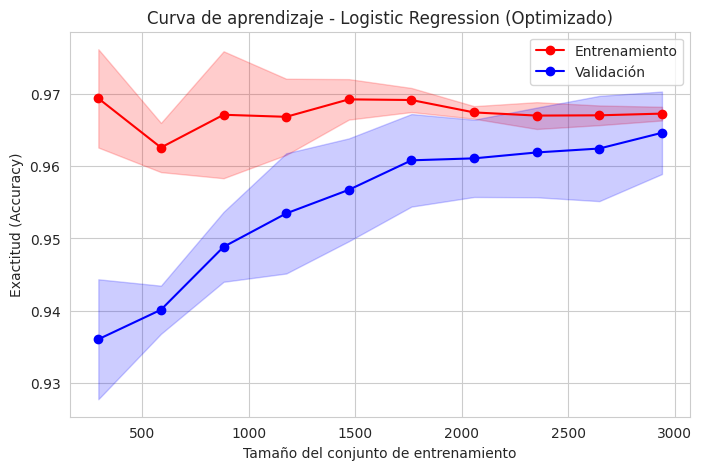

In [ ]:
from sklearn.model_selection import learning_curve
import matplotlib.pyplot as plt
import numpy as np

# --- Función para graficar la curva de aprendizaje ---
def plot_learning_curve_lr(model, X, y, title):
    train_sizes, train_scores, val_scores = learning_curve(
        estimator=model,
        X=X,
        y=y,
        cv=5,
        scoring='accuracy',
        train_sizes=np.linspace(0.1, 1.0, 10),
        n_jobs=-1
    )

    # Promedio y desviación estándar
    train_mean = np.mean(train_scores, axis=1)
    train_std  = np.std(train_scores, axis=1)
    val_mean   = np.mean(val_scores, axis=1)
    val_std    = np.std(val_scores, axis=1)

    # --- Gráfico ---
    plt.figure(figsize=(8,5))
    plt.plot(train_sizes, train_mean, 'o-', color='red', label="Entrenamiento")
    plt.fill_between(train_sizes, train_mean-train_std, train_mean+train_std, alpha=0.2, color="red")

    plt.plot(train_sizes, val_mean, 'o-', color='blue', label="Validación")
    plt.fill_between(train_sizes, val_mean-val_std, val_mean+val_std, alpha=0.2, color="blue")

    plt.title(title)
    plt.xlabel("Tamaño del conjunto de entrenamiento")
    plt.ylabel("Exactitud (Accuracy)")
    plt.legend(loc="best")
    plt.grid(True)
    plt.show()


# --- Ejecutar curva de aprendizaje para el modelo optimizado ---
plot_learning_curve_lr(best_lr, x_train_final, y_train, "Curva de aprendizaje - Logistic Regression (Optimizado)")


/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(


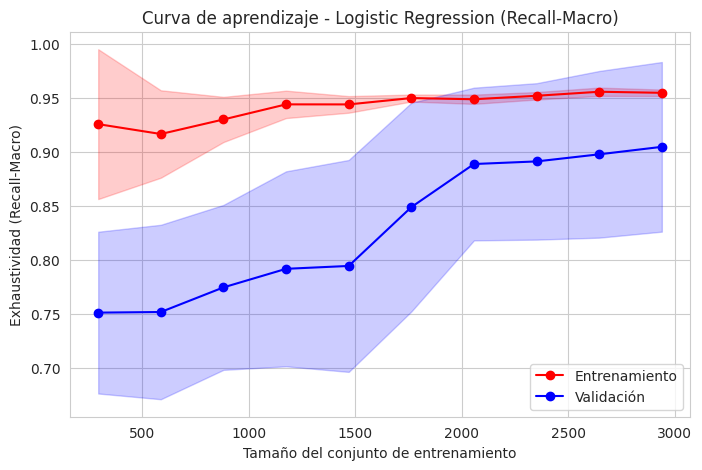

In [ ]:
from sklearn.model_selection import learning_curve
import matplotlib.pyplot as plt
import numpy as np

# --- Función para graficar la curva de aprendizaje con Recall ---
def plot_learning_curve_lr(model, X, y, title, scoring='recall_macro'):
    train_sizes, train_scores, val_scores = learning_curve(
        estimator=model,
        X=X,
        y=y,
        cv=5,
        scoring=scoring,
        train_sizes=np.linspace(0.1, 1.0, 10),
        n_jobs=-1
    )

    # Promedio y desviación estándar
    train_mean = np.mean(train_scores, axis=1)
    train_std  = np.std(train_scores, axis=1)
    val_mean   = np.mean(val_scores, axis=1)
    val_std    = np.std(val_scores, axis=1)

    # --- Gráfico ---
    plt.figure(figsize=(8,5))
    plt.plot(train_sizes, train_mean, 'o-', color='red', label="Entrenamiento")
    plt.fill_between(train_sizes, train_mean-train_std, train_mean+train_std, alpha=0.2, color="red")

    plt.plot(train_sizes, val_mean, 'o-', color='blue', label="Validación")
    plt.fill_between(train_sizes, val_mean-val_std, val_mean+val_std, alpha=0.2, color="blue")

    plt.title(title)
    plt.xlabel("Tamaño del conjunto de entrenamiento")
    plt.ylabel("Exhaustividad (Recall-Macro)")
    plt.legend(loc="best")
    plt.grid(True)
    plt.show()


# --- Ejecutar curva de aprendizaje con Recall-Macro ---
plot_learning_curve_lr(best_lr, x_train_final, y_train,
                       "Curva de aprendizaje - Logistic Regression (Recall-Macro)",
                       scoring='recall_macro')


/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(


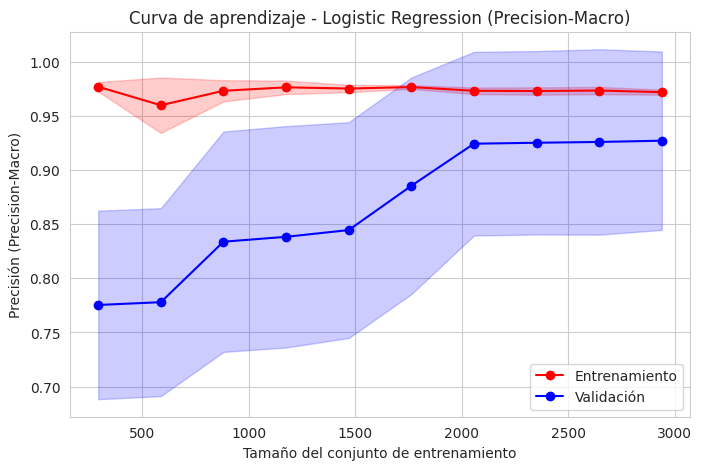

In [ ]:
from sklearn.model_selection import learning_curve
import matplotlib.pyplot as plt
import numpy as np

# --- Función para graficar la curva de aprendizaje ---
def plot_learning_curve_lr(model, X, y, title, scoring='precision_macro'):
    train_sizes, train_scores, val_scores = learning_curve(
        estimator=model,
        X=X,
        y=y,
        cv=5,
        scoring=scoring,
        train_sizes=np.linspace(0.1, 1.0, 10),
        n_jobs=-1
    )

    # --- Calcular promedios y desviaciones ---
    train_mean = np.mean(train_scores, axis=1)
    train_std  = np.std(train_scores, axis=1)
    val_mean   = np.mean(val_scores, axis=1)
    val_std    = np.std(val_scores, axis=1)

    # --- Graficar ---
    plt.figure(figsize=(8,5))
    plt.plot(train_sizes, train_mean, 'o-', color='red', label="Entrenamiento")
    plt.fill_between(train_sizes, train_mean-train_std, train_mean+train_std, alpha=0.2, color="red")

    plt.plot(train_sizes, val_mean, 'o-', color='blue', label="Validación")
    plt.fill_between(train_sizes, val_mean-val_std, val_mean+val_std, alpha=0.2, color="blue")

    plt.title(title)
    plt.xlabel("Tamaño del conjunto de entrenamiento")
    plt.ylabel("Precisión (Precision-Macro)")
    plt.legend(loc="best")
    plt.grid(True)
    plt.show()


# --- Ejecutar curva de aprendizaje con Precision-Macro ---
plot_learning_curve_lr(best_lr, x_train_final, y_train,
                       "Curva de aprendizaje - Logistic Regression (Precision-Macro)",
                       scoring='precision_macro')


/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(


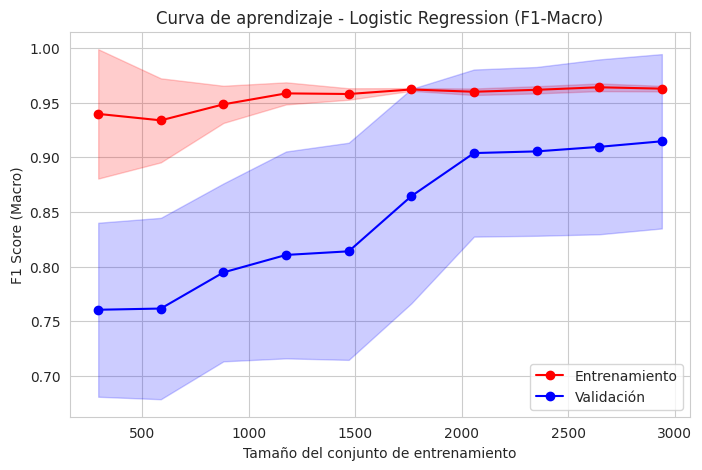

In [ ]:
from sklearn.model_selection import learning_curve
import matplotlib.pyplot as plt
import numpy as np

# --- Función para graficar curva de aprendizaje ---
def plot_learning_curve_lr(model, X, y, title, scoring='f1_macro'):
    train_sizes, train_scores, val_scores = learning_curve(
        estimator=model,
        X=X,
        y=y,
        cv=5,
        scoring=scoring,
        train_sizes=np.linspace(0.1, 1.0, 10),
        n_jobs=-1
    )

    # --- Promedios y desviaciones estándar ---
    train_mean = np.mean(train_scores, axis=1)
    train_std  = np.std(train_scores, axis=1)
    val_mean   = np.mean(val_scores, axis=1)
    val_std    = np.std(val_scores, axis=1)

    # --- Gráfico ---
    plt.figure(figsize=(8,5))
    plt.plot(train_sizes, train_mean, 'o-', color='red', label="Entrenamiento")
    plt.fill_between(train_sizes, train_mean-train_std, train_mean+train_std, alpha=0.2, color="red")

    plt.plot(train_sizes, val_mean, 'o-', color='blue', label="Validación")
    plt.fill_between(train_sizes, val_mean-val_std, val_mean+val_std, alpha=0.2, color="blue")

    plt.title(title)
    plt.xlabel("Tamaño del conjunto de entrenamiento")
    plt.ylabel("F1 Score (Macro)")
    plt.legend(loc="best")
    plt.grid(True)
    plt.show()


# --- Ejecutar curva de aprendizaje con F1-Macro ---
plot_learning_curve_lr(best_lr, x_train_final, y_train,
                       "Curva de aprendizaje - Logistic Regression (F1-Macro)",
                       scoring='f1_macro')


          CURVAS DE APRENDIZAJE - CON DIVISIÓN FIJA (TRAIN/VAL)

 Generando curvas de aprendizaje con división fija...

 Entrenando con diferentes tamaños de conjunto...
   Total de muestras disponibles: 3675
   Tamaños a probar: 10



/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


   [1/10] Tamaño:   367 | Acc Train: 0.9537 | Acc Val: 0.9479


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


   [2/10] Tamaño:   735 | Acc Train: 0.9633 | Acc Val: 0.9568


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


   [3/10] Tamaño:  1102 | Acc Train: 0.9673 | Acc Val: 0.9581


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


   [4/10] Tamaño:  1470 | Acc Train: 0.9694 | Acc Val: 0.9581


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


   [5/10] Tamaño:  1837 | Acc Train: 0.9695 | Acc Val: 0.9632


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


   [6/10] Tamaño:  2205 | Acc Train: 0.9660 | Acc Val: 0.9632


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


   [7/10] Tamaño:  2572 | Acc Train: 0.9646 | Acc Val: 0.9682


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


   [8/10] Tamaño:  2940 | Acc Train: 0.9670 | Acc Val: 0.9657


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


   [9/10] Tamaño:  3307 | Acc Train: 0.9658 | Acc Val: 0.9670


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


   [10/10] Tamaño:  3675 | Acc Train: 0.9679 | Acc Val: 0.9644

 Curvas calculadas correctamente!

 Generando visualizaciones...


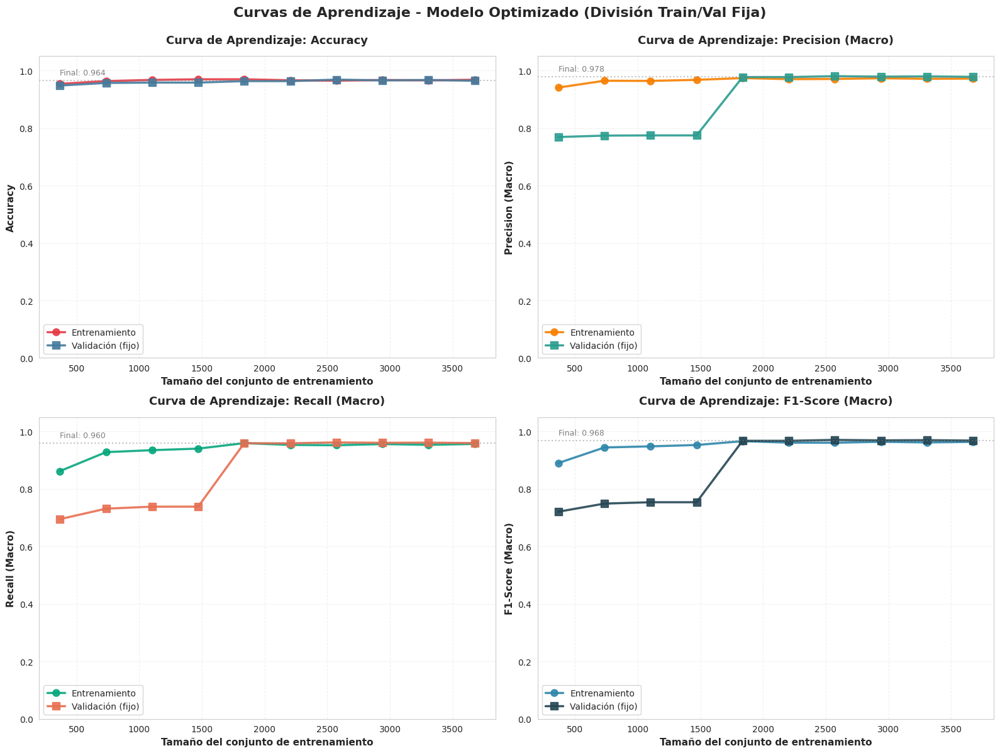

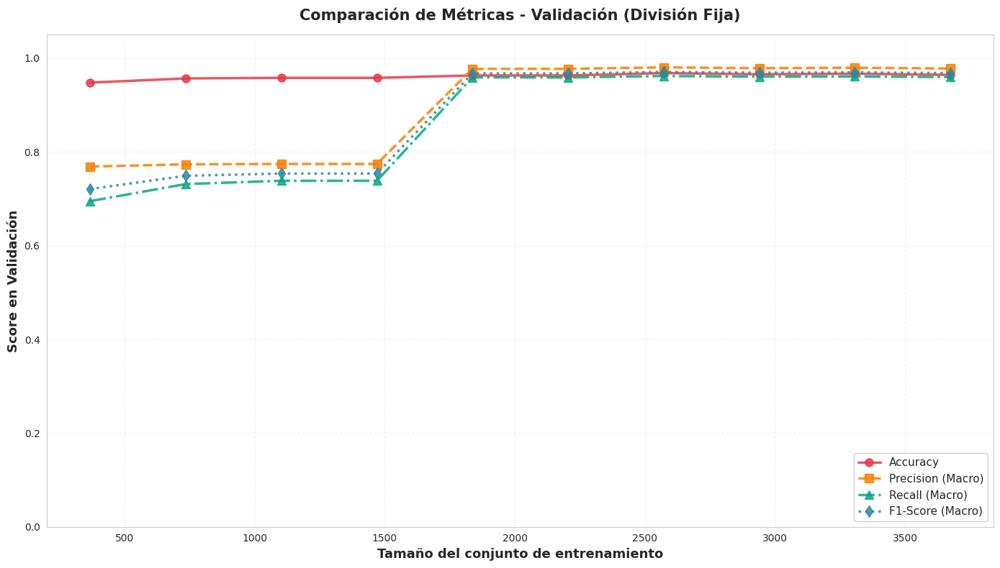


                    ANÁLISIS DE BRECHA (TRAIN-VAL GAP)
Métrica                  Train Final       Val Final          Gap          Estado
────────────────────────────────────────────────────────────────────────────────
Accuracy                      0.9679          0.9644       0.0035     ✅ Excelente
Precision (Macro)             0.9719          0.9780      -0.0061     ✅ Excelente
Recall (Macro)                0.9566          0.9596      -0.0031     ✅ Excelente
F1-Score (Macro)              0.9638          0.9682      -0.0044     ✅ Excelente

                    ANÁLISIS DE CONVERGENCIA

Accuracy:
   • Score final (validación):      0.9644
   • Pendiente últimos 2 puntos:    -0.00254
   • Estado: ✅ CONVERGIÓ - Modelo alcanzó su potencial

Precision (Macro):
   • Score final (validación):      0.9780
   • Pendiente últimos 2 puntos:    -0.00162
   • Estado: ✅ CONVERGIÓ - Modelo alcanzó su potencial

Recall (Macro):
   • Score final (validación):      0.9596
   • Pendiente últimos 2 punto

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

print("="*80)
print(" "*10 + "CURVAS DE APRENDIZAJE - CON DIVISIÓN FIJA (TRAIN/VAL)")
print("="*80)

# --- Función para generar curvas con división fija ---
def plot_learning_curves_fixed_split(model, X_train, y_train, X_val, y_val,
                                     train_sizes=np.linspace(0.1, 1.0, 10)):
    """
    Genera curvas de aprendizaje usando los conjuntos de entrenamiento y validación fijos.

    Parameters:
    -----------
    model : estimador de sklearn
        Modelo ya entrenado o instancia del modelo
    X_train, y_train : arrays
        Conjunto de entrenamiento
    X_val, y_val : arrays
        Conjunto de validación (fijo, no se usa CV)
    train_sizes : array
        Proporciones del conjunto de entrenamiento a usar
    """

    # Almacenar resultados
    results = {
        'train_sizes_abs': [],
        'train_accuracy': [],
        'val_accuracy': [],
        'train_precision': [],
        'val_precision': [],
        'train_recall': [],
        'val_recall': [],
        'train_f1': [],
        'val_f1': []
    }

    n_samples = len(X_train)

    print(f"\n Entrenando con diferentes tamaños de conjunto...")
    print(f"   Total de muestras disponibles: {n_samples}")
    print(f"   Tamaños a probar: {len(train_sizes)}\n")

    for i, size in enumerate(train_sizes, 1):
        # Calcular número de muestras
        n_train = int(n_samples * size)
        results['train_sizes_abs'].append(n_train)

        # Seleccionar subset del entrenamiento
        indices = np.random.RandomState(42).choice(n_samples, n_train, replace=False)
        X_train_subset = X_train[indices]
        y_train_subset = y_train.iloc[indices] if hasattr(y_train, 'iloc') else y_train[indices]

        # Entrenar el modelo con el subset
        model_temp = model.__class__(**model.get_params())
        model_temp.fit(X_train_subset, y_train_subset)

        # Predecir en entrenamiento y validación
        y_train_pred = model_temp.predict(X_train_subset)
        y_val_pred = model_temp.predict(X_val)

        # Calcular métricas en entrenamiento
        results['train_accuracy'].append(accuracy_score(y_train_subset, y_train_pred))
        results['train_precision'].append(precision_score(y_train_subset, y_train_pred, average='macro', zero_division=0))
        results['train_recall'].append(recall_score(y_train_subset, y_train_pred, average='macro', zero_division=0))
        results['train_f1'].append(f1_score(y_train_subset, y_train_pred, average='macro', zero_division=0))

        # Calcular métricas en validación
        results['val_accuracy'].append(accuracy_score(y_val, y_val_pred))
        results['val_precision'].append(precision_score(y_val, y_val_pred, average='macro', zero_division=0))
        results['val_recall'].append(recall_score(y_val, y_val_pred, average='macro', zero_division=0))
        results['val_f1'].append(f1_score(y_val, y_val_pred, average='macro', zero_division=0))

        print(f"   [{i}/{len(train_sizes)}] Tamaño: {n_train:5d} | "
              f"Acc Train: {results['train_accuracy'][-1]:.4f} | "
              f"Acc Val: {results['val_accuracy'][-1]:.4f}")

    print("\n Curvas calculadas correctamente!")
    return results


# --- Generar las curvas ---
print("\n Generando curvas de aprendizaje con división fija...")
learning_results = plot_learning_curves_fixed_split(
    model=best_lr,
    X_train=x_train_final,
    y_train=y_train,
    X_val=x_val_final,
    y_val=y_val,
    train_sizes=np.linspace(0.1, 1.0, 10)
)

# ============================================================================
#                     VISUALIZACIÓN: 4 MÉTRICAS INDIVIDUALES
# ============================================================================

print("\n Generando visualizaciones...")

fig, axes = plt.subplots(2, 2, figsize=(16, 12))
axes = axes.ravel()

metrics = [
    ('accuracy', 'Accuracy'),
    ('precision', 'Precision (Macro)'),
    ('recall', 'Recall (Macro)'),
    ('f1', 'F1-Score (Macro)')
]

colors_train = ['#E63946', '#F77F00', '#06A77D', '#2E86AB']
colors_val = ['#457B9D', '#2A9D8F', '#E76F51', '#264653']

for idx, (metric, title) in enumerate(metrics):
    train_key = f'train_{metric}'
    val_key = f'val_{metric}'

    # Curva de entrenamiento
    axes[idx].plot(
        learning_results['train_sizes_abs'],
        learning_results[train_key],
        'o-',
        color=colors_train[idx],
        linewidth=2.5,
        markersize=8,
        label='Entrenamiento',
        alpha=0.9
    )

    # Curva de validación
    axes[idx].plot(
        learning_results['train_sizes_abs'],
        learning_results[val_key],
        's-',
        color=colors_val[idx],
        linewidth=2.5,
        markersize=8,
        label='Validación (fijo)',
        alpha=0.9
    )

    # Configuración
    axes[idx].set_xlabel('Tamaño del conjunto de entrenamiento', fontsize=11, fontweight='bold')
    axes[idx].set_ylabel(title, fontsize=11, fontweight='bold')
    axes[idx].set_title(f'Curva de Aprendizaje: {title}', fontsize=13, fontweight='bold', pad=15)
    axes[idx].legend(loc='best', fontsize=10)
    axes[idx].grid(True, alpha=0.3, linestyle='--')
    axes[idx].set_ylim([0, 1.05])

    # Línea del valor final en validación
    final_val = learning_results[val_key][-1]
    axes[idx].axhline(y=final_val, color='gray', linestyle=':', linewidth=1.5, alpha=0.5)
    axes[idx].text(
        learning_results['train_sizes_abs'][0],
        final_val + 0.02,
        f'Final: {final_val:.3f}',
        fontsize=9,
        color='gray'
    )

plt.suptitle('Curvas de Aprendizaje - Modelo Optimizado (División Train/Val Fija)',
             fontsize=16, fontweight='bold', y=0.995)
plt.tight_layout()
plt.show()

# ============================================================================
#                     GRÁFICO COMBINADO
# ============================================================================

fig, ax = plt.subplots(figsize=(14, 8))

line_styles = ['-', '--', '-.', ':']
markers = ['o', 's', '^', 'd']
colors = ['#E63946', '#F77F00', '#06A77D', '#2E86AB']

for idx, (metric, title) in enumerate(metrics):
    val_key = f'val_{metric}'
    ax.plot(
        learning_results['train_sizes_abs'],
        learning_results[val_key],
        linestyle=line_styles[idx],
        marker=markers[idx],
        color=colors[idx],
        linewidth=2.5,
        markersize=8,
        label=f'{title}',
        alpha=0.85
    )

ax.set_xlabel('Tamaño del conjunto de entrenamiento', fontsize=13, fontweight='bold')
ax.set_ylabel('Score en Validación', fontsize=13, fontweight='bold')
ax.set_title('Comparación de Métricas - Validación (División Fija)',
             fontsize=15, fontweight='bold', pad=15)
ax.legend(loc='lower right', fontsize=11, framealpha=0.95)
ax.grid(True, alpha=0.3, linestyle='--')
ax.set_ylim([0, 1.05])
plt.tight_layout()
plt.show()

# ============================================================================
#                     ANÁLISIS DEL GAP (TRAIN vs VAL)
# ============================================================================

print("\n" + "="*80)
print(" "*20 + "ANÁLISIS DE BRECHA (TRAIN-VAL GAP)")
print("="*80)
print(f"{'Métrica':<20} {'Train Final':>15} {'Val Final':>15} {'Gap':>12} {'Estado':>15}")
print("─"*80)

for metric, title in metrics:
    train_key = f'train_{metric}'
    val_key = f'val_{metric}'

    train_final = learning_results[train_key][-1]
    val_final = learning_results[val_key][-1]
    gap = train_final - val_final

    # Diagnóstico
    if gap < 0.02:
        estado = "✅ Excelente"
    elif gap < 0.05:
        estado = "🟢 Bueno"
    elif gap < 0.10:
        estado = "🟡 Moderado"
    else:
        estado = "🔴 Alto"

    print(f"{title:<20} {train_final:>15.4f} {val_final:>15.4f} {gap:>12.4f} {estado:>15}")

print("="*80)

# ============================================================================
#                     ANÁLISIS DE CONVERGENCIA
# ============================================================================

print("\n" + "="*80)
print(" "*20 + "ANÁLISIS DE CONVERGENCIA")
print("="*80)

for metric, title in metrics:
    val_key = f'val_{metric}'
    val_scores = learning_results[val_key]

    # Pendiente entre los últimos dos puntos
    if len(val_scores) >= 2:
        slope = val_scores[-1] - val_scores[-2]

        print(f"\n{title}:")
        print(f"   • Score final (validación):      {val_scores[-1]:.4f}")
        print(f"   • Pendiente últimos 2 puntos:    {slope:+.5f}")

        if abs(slope) < 0.005:
            print(f"   • Estado: ✅ CONVERGIÓ - Modelo alcanzó su potencial")
        elif slope > 0:
            print(f"   • Estado: 🟡 MEJORANDO - Más datos podrían ayudar")
        else:
            print(f"   • Estado: 🔴 EMPEORANDO - Posible sobreajuste")

print("="*80)

# ============================================================================
#                     DIAGNÓSTICO GENERAL
# ============================================================================

print("\n" + "="*80)
print(" "*25 + "DIAGNÓSTICO GENERAL")
print("="*80)

# Calcular gaps promedio
avg_gap = np.mean([
    learning_results[f'train_{metric}'][-1] - learning_results[f'val_{metric}'][-1]
    for metric, _ in metrics
])

# Promedio de rendimiento en validación
avg_val_score = np.mean([
    learning_results[f'val_{metric}'][-1]
    for metric, _ in metrics
])

print(f"\n MÉTRICAS RESUMEN:")
print(f"   • Gap promedio (Train-Val):       {avg_gap:.4f}")
print(f"   • Score promedio en validación:   {avg_val_score:.4f}")

print(f"\n DIAGNÓSTICO:")

if avg_gap > 0.10:
    print("   🔴 OVERFITTING DETECTADO")
    print("   El modelo memoriza el conjunto de entrenamiento pero generaliza mal.")
    print("\n   Soluciones sugeridas:")
    print("   1. Aumentar regularización (disminuir C)")
    print("   2. Obtener más datos de entrenamiento")
    print("   3. Aplicar dropout o early stopping")

elif avg_gap < 0.02 and avg_val_score < 0.70:
    print("   🔴 UNDERFITTING DETECTADO")
    print("   El modelo es demasiado simple para los datos.")
    print("\n   Soluciones sugeridas:")
    print("   1. Usar un modelo más complejo (Random Forest, XGBoost)")
    print("   2. Agregar más características (feature engineering)")
    print("   3. Disminuir regularización")

elif avg_gap < 0.05 and avg_val_score >= 0.75:
    print("   ✅ MODELO BIEN AJUSTADO")
    print("   Buen balance entre sesgo y varianza.")
    print("\n   ✅ Próximo paso: Evaluar en conjunto de PRUEBA (test)")

else:
    print("   🟡 MODELO ACEPTABLE CON MARGEN DE MEJORA")
    print("\n   Sugerencias:")
    print("   1. Probar modelos más complejos")
    print("   2. Feature engineering")
    print("   3. Técnicas de balanceo si hay desbalance")

# Verificar si más datos ayudarían
val_f1 = learning_results['val_f1']
if len(val_f1) >= 3:
    improvement = val_f1[-1] - val_f1[-3]
    if improvement > 0.01:
        print("\n    MÁS DATOS PODRÍAN AYUDAR")
        print("   La curva aún muestra tendencia creciente.")
    else:
        print("\n    MÁS DATOS PROBABLEMENTE NO AYUDARÁN")
        print("   La curva ya se estabilizó.")

print("\n" + "="*80)
print("✅ ANÁLISIS DE CURVAS DE APRENDIZAJE COMPLETADO")
print("="*80)

## Análisis

                         ANÁLISIS DETALLADO DE CURVAS DE APRENDIZAJE

                              1. TABLA RESUMEN DE RESULTADOS

 Tamaño Porcentaje  Acc_Train  Acc_Val  Prec_Train  Prec_Val  Rec_Train  Rec_Val  F1_Train  F1_Val
    367        10%     0.9537   0.9479      0.9407    0.7687     0.8620   0.6949    0.8901  0.7208
    735        20%     0.9633   0.9568      0.9644    0.7735     0.9280   0.7314    0.9443  0.7490
   1102        30%     0.9673   0.9581      0.9639    0.7743     0.9349   0.7383    0.9482  0.7538
   1470        40%     0.9694   0.9581      0.9676    0.7743     0.9403   0.7384    0.9529  0.7538
   1837        50%     0.9695   0.9632      0.9737    0.9773     0.9594   0.9590    0.9662  0.9675
   2205        60%     0.9660   0.9632      0.9700    0.9772     0.9533   0.9589    0.9611  0.9675
   2572        70%     0.9646   0.9682      0.9707    0.9804     0.9520   0.9619    0.9607  0.9706
   2940        80%     0.9670   0.9657      0.9731    0.9787     0.9562   0.

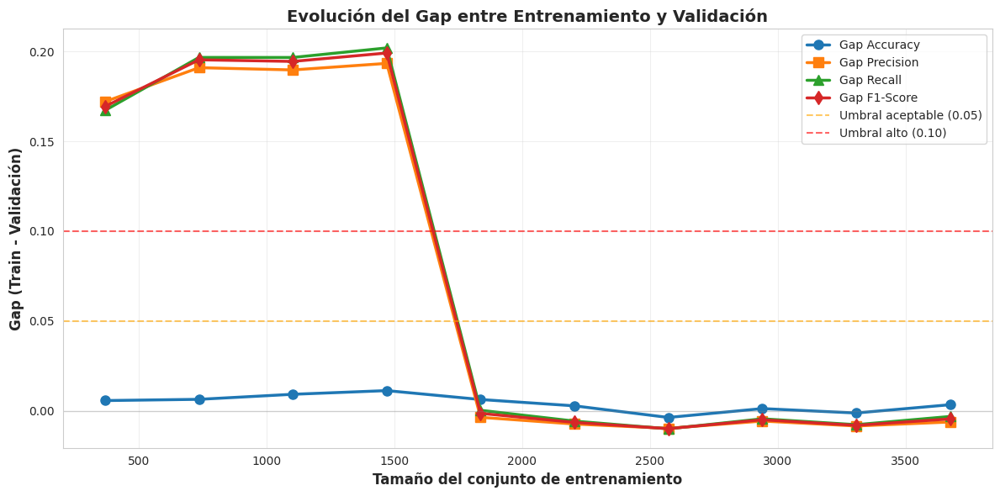


 INTERPRETACIÓN DEL GAP:
   • Gap promedio inicial (10% datos):  0.1285
   • Gap promedio final (100% datos):   -0.0025
   • Cambio en el gap:                  -0.1311

   ✅ El gap DISMINUYE con más datos → Más datos ayudan a reducir overfitting

                         3. ANÁLISIS DE MEJORA MARGINAL

Mejora al agregar más datos (en validación):
 Tamaño_desde  Tamaño_hasta  Mejora_Accuracy  Mejora_Precision  Mejora_Recall  Mejora_F1
          367           735          0.00889           0.00486        0.03652    0.02822
          735          1102          0.00127           0.00073        0.00690    0.00476
         1102          1470          0.00000           0.00001        0.00011    0.00002
         1470          1837          0.00508           0.20298        0.22058    0.21370
         1837          2205          0.00000          -0.00002       -0.00011   -0.00005
         2205          2572          0.00508           0.00315        0.00303    0.00310
         2572          2940

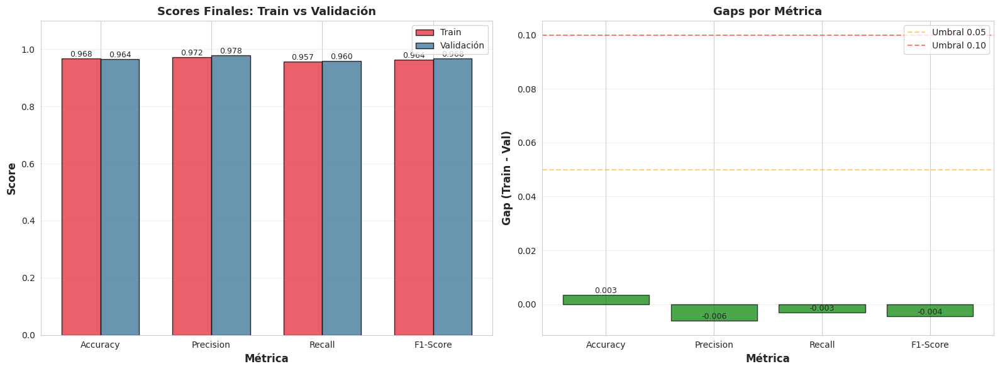


  Métrica con MAYOR gap: Accuracy (0.0035)
  Métrica con MENOR score en validación: Recall (0.9596)

                         5. ANÁLISIS DE ESTABILIDAD

Estabilidad de las métricas en validación:
  Métrica  Varianza  Desv_Std   Rango
 Accuracy   0.00003   0.00580 0.02033
Precision   0.01017   0.10086 0.21171
   Recall   0.01332   0.11541 0.26702
 F1-Score   0.01216   0.11028 0.24974

 INTERPRETACIÓN:
   • Métrica más INESTABLE: Recall (varianza: 0.01332)
   • Métrica más ESTABLE: Accuracy (varianza: 0.00003)

     Alta variabilidad detectada. Esto puede indicar:
   • Modelo sensible al tamaño del conjunto de entrenamiento
   • Necesidad de más datos para estabilizar el rendimiento

                              6. RECOMENDACIONES FINALES

 RESUMEN EJECUTIVO:
   • Rendimiento promedio en validación:  0.9676
   • Gap promedio (Train-Val):            -0.0025
   • Mejora marginal (últimos 30%):       -0.00078

 DIAGNÓSTICO:
   ✅ MODELO BIEN BALANCEADO

   Estado actual: Buen equilibrio e

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

print("="*90)
print(" "*25 + "ANÁLISIS DETALLADO DE CURVAS DE APRENDIZAJE")
print("="*90)

# ============================================================================
#                     1. TABLA RESUMEN COMPLETA
# ============================================================================

print("\n" + "="*90)
print(" "*30 + "1. TABLA RESUMEN DE RESULTADOS")
print("="*90)

# Crear DataFrame con todos los resultados
summary_data = []
for i in range(len(learning_results['train_sizes_abs'])):
    row = {
        'Tamaño': learning_results['train_sizes_abs'][i],
        'Porcentaje': f"{(learning_results['train_sizes_abs'][i] / learning_results['train_sizes_abs'][-1]) * 100:.0f}%",
        'Acc_Train': learning_results['train_accuracy'][i],
        'Acc_Val': learning_results['val_accuracy'][i],
        'Prec_Train': learning_results['train_precision'][i],
        'Prec_Val': learning_results['val_precision'][i],
        'Rec_Train': learning_results['train_recall'][i],
        'Rec_Val': learning_results['val_recall'][i],
        'F1_Train': learning_results['train_f1'][i],
        'F1_Val': learning_results['val_f1'][i]
    }
    summary_data.append(row)

summary_df = pd.DataFrame(summary_data)
print("\n" + summary_df.to_string(index=False, float_format='%.4f'))
print("="*90)

# ============================================================================
#                     2. ANÁLISIS DE GAPS POR TAMAÑO
# ============================================================================

print("\n" + "="*90)
print(" "*25 + "2. EVOLUCIÓN DEL GAP (TRAIN - VAL)")
print("="*90)

# Calcular gaps
gaps_df = pd.DataFrame({
    'Tamaño': learning_results['train_sizes_abs'],
    'Gap_Accuracy': np.array(learning_results['train_accuracy']) - np.array(learning_results['val_accuracy']),
    'Gap_Precision': np.array(learning_results['train_precision']) - np.array(learning_results['val_precision']),
    'Gap_Recall': np.array(learning_results['train_recall']) - np.array(learning_results['val_recall']),
    'Gap_F1': np.array(learning_results['train_f1']) - np.array(learning_results['val_f1'])
})

print("\n" + gaps_df.to_string(index=False, float_format='%.4f'))

# Visualización de gaps
fig, ax = plt.subplots(figsize=(12, 6))

ax.plot(gaps_df['Tamaño'], gaps_df['Gap_Accuracy'], 'o-', linewidth=2.5, markersize=8, label='Gap Accuracy')
ax.plot(gaps_df['Tamaño'], gaps_df['Gap_Precision'], 's-', linewidth=2.5, markersize=8, label='Gap Precision')
ax.plot(gaps_df['Tamaño'], gaps_df['Gap_Recall'], '^-', linewidth=2.5, markersize=8, label='Gap Recall')
ax.plot(gaps_df['Tamaño'], gaps_df['Gap_F1'], 'd-', linewidth=2.5, markersize=8, label='Gap F1-Score')

# Líneas de referencia
ax.axhline(y=0.05, color='orange', linestyle='--', linewidth=1.5, alpha=0.6, label='Umbral aceptable (0.05)')
ax.axhline(y=0.10, color='red', linestyle='--', linewidth=1.5, alpha=0.6, label='Umbral alto (0.10)')
ax.axhline(y=0, color='gray', linestyle='-', linewidth=1, alpha=0.3)

ax.set_xlabel('Tamaño del conjunto de entrenamiento', fontsize=12, fontweight='bold')
ax.set_ylabel('Gap (Train - Validación)', fontsize=12, fontweight='bold')
ax.set_title('Evolución del Gap entre Entrenamiento y Validación', fontsize=14, fontweight='bold')
ax.legend(loc='best', fontsize=10)
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Análisis de tendencia del gap
print("\n INTERPRETACIÓN DEL GAP:")
gap_final_avg = gaps_df[['Gap_Accuracy', 'Gap_Precision', 'Gap_Recall', 'Gap_F1']].iloc[-1].mean()
gap_inicial_avg = gaps_df[['Gap_Accuracy', 'Gap_Precision', 'Gap_Recall', 'Gap_F1']].iloc[0].mean()

print(f"   • Gap promedio inicial (10% datos):  {gap_inicial_avg:.4f}")
print(f"   • Gap promedio final (100% datos):   {gap_final_avg:.4f}")
print(f"   • Cambio en el gap:                  {gap_final_avg - gap_inicial_avg:+.4f}")

if gap_final_avg - gap_inicial_avg < -0.02:
    print("\n   ✅ El gap DISMINUYE con más datos → Más datos ayudan a reducir overfitting")
elif gap_final_avg - gap_inicial_avg > 0.02:
    print("\n   ⚠️  El gap AUMENTA con más datos → Posible problema de capacidad del modelo")
else:
    print("\n   ➡️  El gap se mantiene ESTABLE → El modelo alcanzó su límite")

print("="*90)

# ============================================================================
#                     3. ANÁLISIS DE MEJORA MARGINAL
# ============================================================================

print("\n" + "="*90)
print(" "*25 + "3. ANÁLISIS DE MEJORA MARGINAL")
print("="*90)

# Calcular mejora marginal (diferencia entre puntos consecutivos)
mejoras = {
    'Tamaño_desde': [],
    'Tamaño_hasta': [],
    'Mejora_Accuracy': [],
    'Mejora_Precision': [],
    'Mejora_Recall': [],
    'Mejora_F1': []
}

for i in range(1, len(learning_results['train_sizes_abs'])):
    mejoras['Tamaño_desde'].append(learning_results['train_sizes_abs'][i-1])
    mejoras['Tamaño_hasta'].append(learning_results['train_sizes_abs'][i])
    mejoras['Mejora_Accuracy'].append(learning_results['val_accuracy'][i] - learning_results['val_accuracy'][i-1])
    mejoras['Mejora_Precision'].append(learning_results['val_precision'][i] - learning_results['val_precision'][i-1])
    mejoras['Mejora_Recall'].append(learning_results['val_recall'][i] - learning_results['val_recall'][i-1])
    mejoras['Mejora_F1'].append(learning_results['val_f1'][i] - learning_results['val_f1'][i-1])

mejoras_df = pd.DataFrame(mejoras)
print("\nMejora al agregar más datos (en validación):")
print(mejoras_df.to_string(index=False, float_format='%.5f'))

# Identificar el punto de rendimientos decrecientes
print("\n ANÁLISIS DE RETORNO DECRECIENTE:")
mejora_inicial = mejoras_df['Mejora_F1'].iloc[:3].mean()
mejora_final = mejoras_df['Mejora_F1'].iloc[-3:].mean()

print(f"   • Mejora promedio con primeros 30% de datos:  {mejora_inicial:+.5f}")
print(f"   • Mejora promedio con últimos 30% de datos:   {mejora_final:+.5f}")

if mejora_final < 0.005:
    print("\n    RENDIMIENTOS DECRECIENTES DETECTADOS")
    print("   Agregar más datos tiene poco impacto. Considera:")
    print("   • Mejorar calidad de los datos actuales")
    print("   • Feature engineering")
    print("   • Probar modelos más complejos")
elif mejora_final > mejora_inicial * 0.5:
    print("\n    TODAVÍA HAY MARGEN DE MEJORA")
    print("   Más datos probablemente seguirán mejorando el modelo")
else:
    print("\n     EL MODELO ESTÁ CERCA DE SU LÍMITE")
    print("   Mejoras adicionales con más datos serán marginales")

print("="*90)

# ============================================================================
#                     4. COMPARACIÓN DE MÉTRICAS
# ============================================================================

print("\n" + "="*90)
print(" "*25 + "4. COMPARACIÓN ENTRE MÉTRICAS")
print("="*90)

metricas_finales = {
    'Métrica': ['Accuracy', 'Precision', 'Recall', 'F1-Score'],
    'Train': [
        learning_results['train_accuracy'][-1],
        learning_results['train_precision'][-1],
        learning_results['train_recall'][-1],
        learning_results['train_f1'][-1]
    ],
    'Validación': [
        learning_results['val_accuracy'][-1],
        learning_results['val_precision'][-1],
        learning_results['val_recall'][-1],
        learning_results['val_f1'][-1]
    ]
}

metricas_finales['Gap'] = [
    metricas_finales['Train'][i] - metricas_finales['Validación'][i]
    for i in range(len(metricas_finales['Métrica']))
]

metricas_finales['Gap %'] = [
    (metricas_finales['Gap'][i] / metricas_finales['Train'][i]) * 100
    for i in range(len(metricas_finales['Métrica']))
]

comp_df = pd.DataFrame(metricas_finales)
print("\nMétricas finales (100% de datos de entrenamiento):")
print(comp_df.to_string(index=False, float_format='%.4f'))

# Visualización comparativa
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Panel izquierdo: Valores finales
x = np.arange(len(comp_df))
width = 0.35

bars1 = axes[0].bar(x - width/2, comp_df['Train'], width, label='Train',
                    color='#E63946', alpha=0.8, edgecolor='black')
bars2 = axes[0].bar(x + width/2, comp_df['Validación'], width, label='Validación',
                    color='#457B9D', alpha=0.8, edgecolor='black')

axes[0].set_ylabel('Score', fontsize=12, fontweight='bold')
axes[0].set_xlabel('Métrica', fontsize=12, fontweight='bold')
axes[0].set_title('Scores Finales: Train vs Validación', fontsize=13, fontweight='bold')
axes[0].set_xticks(x)
axes[0].set_xticklabels(comp_df['Métrica'])
axes[0].legend()
axes[0].set_ylim([0, 1.1])
axes[0].grid(axis='y', alpha=0.3)

# Añadir valores
for bars in [bars1, bars2]:
    for bar in bars:
        height = bar.get_height()
        axes[0].text(bar.get_x() + bar.get_width()/2., height,
                    f'{height:.3f}', ha='center', va='bottom', fontsize=9)

# Panel derecho: Gaps
colors = ['green' if gap < 0.05 else 'orange' if gap < 0.10 else 'red' for gap in comp_df['Gap']]
bars = axes[1].bar(comp_df['Métrica'], comp_df['Gap'], color=colors, alpha=0.7, edgecolor='black')

axes[1].set_ylabel('Gap (Train - Val)', fontsize=12, fontweight='bold')
axes[1].set_xlabel('Métrica', fontsize=12, fontweight='bold')
axes[1].set_title('Gaps por Métrica', fontsize=13, fontweight='bold')
axes[1].axhline(y=0.05, color='orange', linestyle='--', linewidth=1.5, alpha=0.5, label='Umbral 0.05')
axes[1].axhline(y=0.10, color='red', linestyle='--', linewidth=1.5, alpha=0.5, label='Umbral 0.10')
axes[1].legend()
axes[1].grid(axis='y', alpha=0.3)

# Añadir valores
for bar in bars:
    height = bar.get_height()
    axes[1].text(bar.get_x() + bar.get_width()/2., height,
                f'{height:.3f}', ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()

# Identificar la métrica más problemática
max_gap_idx = comp_df['Gap'].idxmax()
print(f"\n  Métrica con MAYOR gap: {comp_df.loc[max_gap_idx, 'Métrica']} ({comp_df.loc[max_gap_idx, 'Gap']:.4f})")

min_val_idx = comp_df['Validación'].idxmin()
print(f"  Métrica con MENOR score en validación: {comp_df.loc[min_val_idx, 'Métrica']} ({comp_df.loc[min_val_idx, 'Validación']:.4f})")

print("="*90)

# ============================================================================
#                     5. ANÁLISIS DE VARIANZA Y ESTABILIDAD
# ============================================================================

print("\n" + "="*90)
print(" "*25 + "5. ANÁLISIS DE ESTABILIDAD")
print("="*90)

# Calcular varianza de las métricas de validación
varianzas = {
    'Métrica': ['Accuracy', 'Precision', 'Recall', 'F1-Score'],
    'Varianza': [
        np.var(learning_results['val_accuracy']),
        np.var(learning_results['val_precision']),
        np.var(learning_results['val_recall']),
        np.var(learning_results['val_f1'])
    ],
    'Desv_Std': [
        np.std(learning_results['val_accuracy']),
        np.std(learning_results['val_precision']),
        np.std(learning_results['val_recall']),
        np.std(learning_results['val_f1'])
    ],
    'Rango': [
        np.max(learning_results['val_accuracy']) - np.min(learning_results['val_accuracy']),
        np.max(learning_results['val_precision']) - np.min(learning_results['val_precision']),
        np.max(learning_results['val_recall']) - np.min(learning_results['val_recall']),
        np.max(learning_results['val_f1']) - np.min(learning_results['val_f1'])
    ]
}

var_df = pd.DataFrame(varianzas)
print("\nEstabilidad de las métricas en validación:")
print(var_df.to_string(index=False, float_format='%.5f'))

print("\n INTERPRETACIÓN:")
max_var_idx = var_df['Varianza'].idxmax()
print(f"   • Métrica más INESTABLE: {var_df.loc[max_var_idx, 'Métrica']} (varianza: {var_df.loc[max_var_idx, 'Varianza']:.5f})")

min_var_idx = var_df['Varianza'].idxmin()
print(f"   • Métrica más ESTABLE: {var_df.loc[min_var_idx, 'Métrica']} (varianza: {var_df.loc[min_var_idx, 'Varianza']:.5f})")

if var_df['Varianza'].max() > 0.001:
    print("\n     Alta variabilidad detectada. Esto puede indicar:")
    print("   • Modelo sensible al tamaño del conjunto de entrenamiento")
    print("   • Necesidad de más datos para estabilizar el rendimiento")
else:
    print("\n    Baja variabilidad. El modelo es estable.")

print("="*90)

# ============================================================================
#                     6. RECOMENDACIONES FINALES
# ============================================================================

print("\n" + "="*90)
print(" "*30 + "6. RECOMENDACIONES FINALES")
print("="*90)

# Calcular métricas clave para el diagnóstico
avg_val_final = np.mean([
    learning_results['val_accuracy'][-1],
    learning_results['val_precision'][-1],
    learning_results['val_recall'][-1],
    learning_results['val_f1'][-1]
])

avg_gap_final = np.mean([
    learning_results['train_accuracy'][-1] - learning_results['val_accuracy'][-1],
    learning_results['train_precision'][-1] - learning_results['val_precision'][-1],
    learning_results['train_recall'][-1] - learning_results['val_recall'][-1],
    learning_results['train_f1'][-1] - learning_results['val_f1'][-1]
])

mejora_ultimos_30 = mejoras_df['Mejora_F1'].iloc[-3:].mean()

print("\n RESUMEN EJECUTIVO:")
print(f"   • Rendimiento promedio en validación:  {avg_val_final:.4f}")
print(f"   • Gap promedio (Train-Val):            {avg_gap_final:.4f}")
print(f"   • Mejora marginal (últimos 30%):       {mejora_ultimos_30:+.5f}")

print("\n DIAGNÓSTICO:")

# Diagnóstico principal
if avg_gap_final > 0.10:
    print("   🔴 OVERFITTING CRÍTICO")
    print("\n   Acciones prioritarias:")
    print("   1. ✅ Aumentar regularización (disminuir C en LogisticRegression)")
    print("   2. ✅ Aplicar dropout o early stopping")
    print("   3. ✅ Reducir complejidad del modelo")
    print("   4. Obtener más datos de entrenamiento")

elif avg_gap_final > 0.05:
    print("   🟡 OVERFITTING MODERADO")
    print("\n   Acciones sugeridas:")
    print("   1. ✅ Ajustar parámetros de regularización")
    print("   2. ✅ Validar que no haya data leakage")
    print("   3. Considerar técnicas de ensemble")

elif avg_val_final < 0.70:
    print("   🔴 UNDERFITTING DETECTADO")
    print("\n   Acciones prioritarias:")
    print("   1. ✅ Usar modelo más complejo (Random Forest, XGBoost, Neural Networks)")
    print("   2. ✅ Feature engineering: crear nuevas características")
    print("   3. ✅ Analizar si las features actuales son suficientes")
    print("   4. Disminuir regularización")

else:
    print("   ✅ MODELO BIEN BALANCEADO")
    print("\n   Estado actual: Buen equilibrio entre sesgo y varianza")
    print("   Próximos pasos:")
    print("   1. ✅✅ CRÍTICO: Evaluar en conjunto de PRUEBA")
    print("   2. Considerar ensemble methods para mejora marginal")
    print("   3. Analizar errores por clase específica")

# Recomendación sobre más datos
print("\n SOBRE OBTENER MÁS DATOS:")
if mejora_ultimos_30 > 0.01:
    print("   ✅ SÍ - Más datos mejorarán el modelo significativamente")
    print("   La curva aún muestra tendencia creciente clara")
elif mejora_ultimos_30 > 0.003:
    print("   🟡 QUIZÁS - Más datos darían mejoras marginales")
    print("   Considera también mejorar la calidad de los datos actuales")
else:
    print("   ❌ NO - El modelo alcanzó su límite con los datos actuales")
    print("   Prioriza: mejor modelo, feature engineering, o mejores features")

print("\n" + "="*90)
print(" ANÁLISIS COMPLETO FINALIZADO")
print("="*90)

# Métodos de Filtrado

## Chi Cuadrado

                    SELECCIÓN DE FEATURES CON CHI-CUADRADO

 PASO 1: Preparando datos para Chi-cuadrado...
   • Features numéricas: 8
   • Features categóricas: 3
   • Total features: 11

✓ Datos preparados:
   • Shape final: (5250, 20)
   • Total de features procesadas: 20

                    2. CÁLCULO DE SCORES CHI-CUADRADO

 Top 20 Features por Chi-Cuadrado Score:
                                       Feature  Chi2_Score       P_Value  Rank  Significativa
                              mass_wrt_Jupiter 3403.786855  0.000000e+00     1           True
                            radius_wrt_Jupiter 1539.118950  0.000000e+00     2           True
detection_method_Orbital Brightness Modulation 1058.691783 6.800791e-228     3           True
              detection_method_Radial Velocity  788.783166 2.065091e-169     4           True
                      detection_method_Transit  350.763427  1.199895e-74     5           True
               detection_method_Direct Imaging  192.759549  1.35

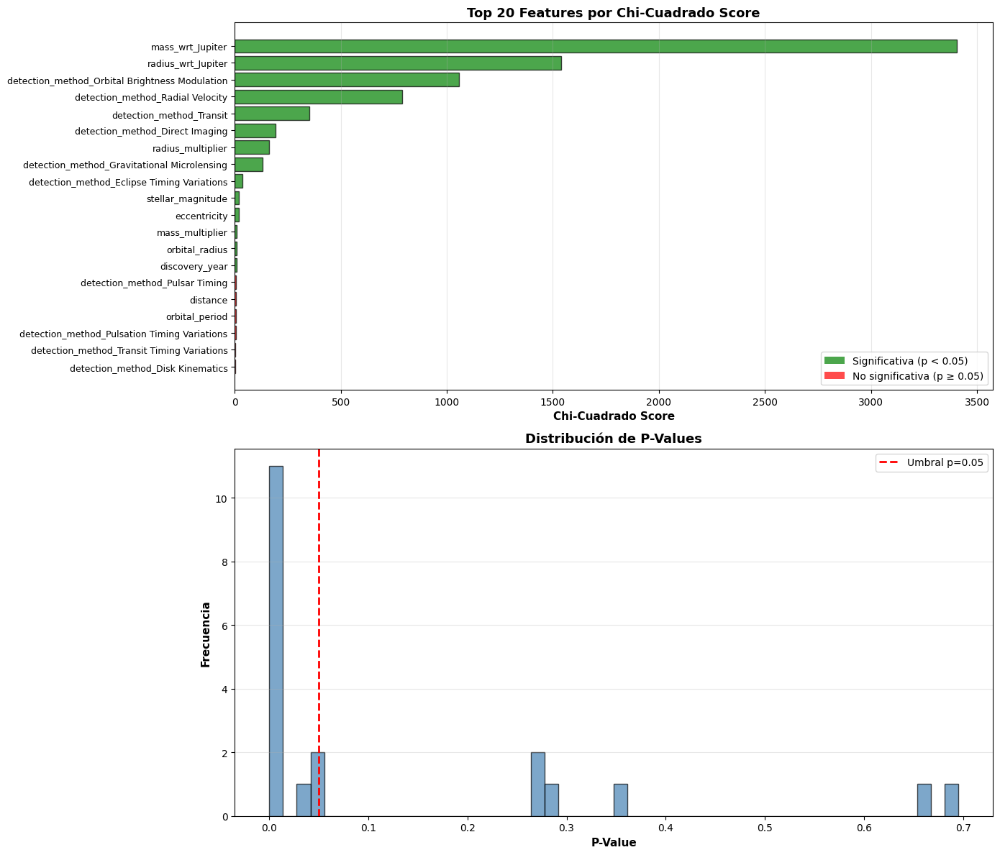

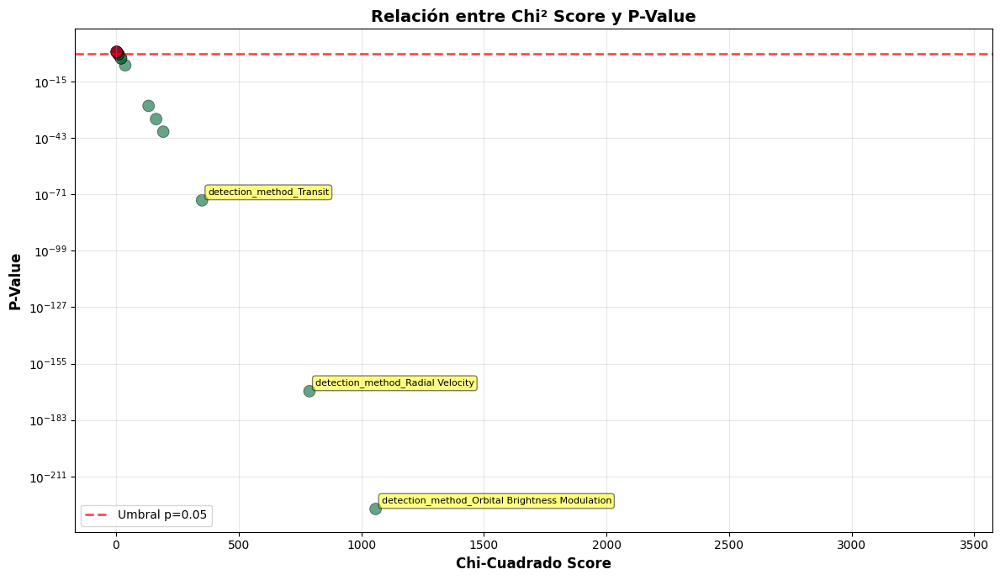


                    4. ANÁLISIS DE DIFERENTES UMBRALES

Features seleccionadas por diferentes valores de K:
    K | Features seleccionadas
────────────────────────────────────────────────────────────────────────────────
    5 | mass_wrt_Jupiter, radius_wrt_Jupiter, detection_method_Orbital Brightness Modulation, detection_method_Radial Velocity, detection_method_Transit
   10 | mass_wrt_Jupiter, radius_wrt_Jupiter, detection_method_Orbital Brightness Modulation, detection_method_Radial Velocity, detection_method_Transit, detection_method_Direct Imaging, radius_multiplier, detection_method_Gravitational Microlensing, detection_method_Eclipse Timing Variations, stellar_magnitude
   15 | mass_wrt_Jupiter, radius_wrt_Jupiter, detection_method_Orbital Brightness Modulation, detection_method_Radial Velocity, detection_method_Transit ... (+10 más)
   20 | mass_wrt_Jupiter, radius_wrt_Jupiter, detection_method_Orbital Brightness Modulation, detection_method_Radial Velocity, detection_method_T

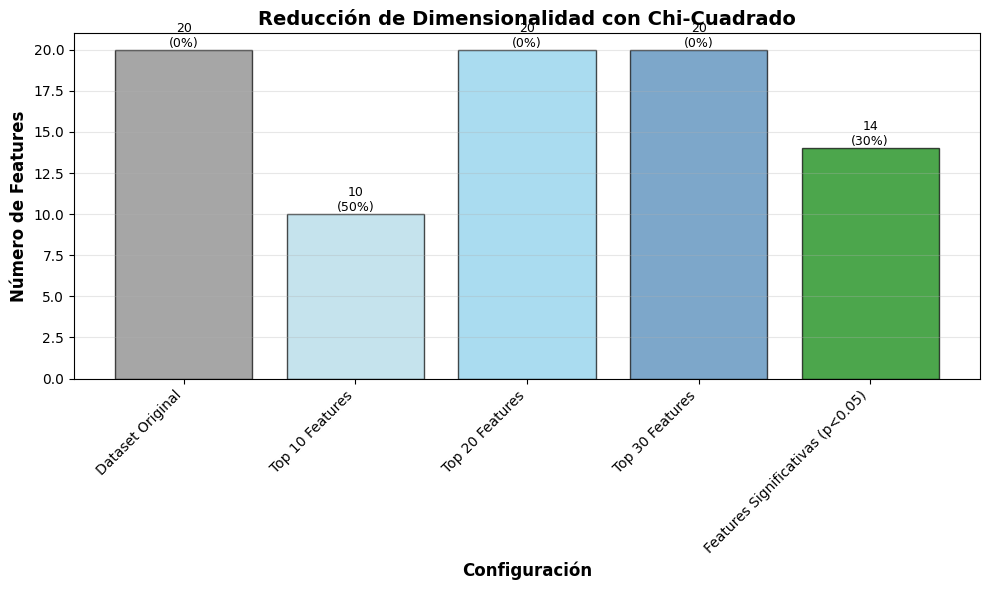


                    6. RESULTADOS GUARDADOS

✓ Resultados guardados en variable 'chi2_results'
✓ Puedes acceder a:
   • chi2_results: DataFrame completo con todos los scores
   • feature_names: Lista de nombres de features
   • chi2_scores: Array de scores
   • chi2_pvalues: Array de p-values

                    7. RECOMENDACIONES

 INTERPRETACIÓN DE RESULTADOS:
   • Features con p-value < 0.05 son estadísticamente significativas
   • Score Chi² alto = mayor dependencia con la variable objetivo
   • Features con score muy bajo pueden ser ruido

 OPCIONES DE SELECCIÓN:
   Opción A: Usar solo features significativas (p < 0.05)
            → 14 features
   Opción B: Usar top K por score
            → Ejemplo: top 20 features
   Opción C: Usar umbral de score
            → Ejemplo: Chi² score > percentil 75

 Umbrales por percentiles:
   • Percentil 50: Score ≥ 20.61 → 10 features
   • Percentil 75: Score ≥ 232.26 → 5 features
   • Percentil 90: Score ≥ 1106.73 → 2 features
   • Percenti

In [ ]:
from sklearn.feature_selection import SelectKBest, chi2
from sklearn.preprocessing import MinMaxScaler
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

print("="*80)
print(" "*20 + "SELECCIÓN DE FEATURES CON CHI-CUADRADO")
print("="*80)

# ============================================================================
#                     1. PREPARACIÓN DE DATOS
# ============================================================================

print("\n PASO 1: Preparando datos para Chi-cuadrado...")

# IMPORTANTE: Chi-cuadrado requiere valores NO NEGATIVOS
# Vamos a trabajar con los datos originales antes del preprocesamiento

# Separar features numéricas y categóricas del dataset original limpio
X_original = df_clean.drop(columns=['planet_type', 'name'])
y_original = df_clean['planet_type']

# Identificar columnas numéricas y categóricas
num_cols = X_original.select_dtypes(exclude=['object', 'category']).columns.tolist()
cat_cols = X_original.select_dtypes(include=['object', 'category']).columns.tolist()

print(f"   • Features numéricas: {len(num_cols)}")
print(f"   • Features categóricas: {len(cat_cols)}")
print(f"   • Total features: {len(num_cols) + len(cat_cols)}")

# Codificar variables categóricas (One-Hot Encoding)
from sklearn.preprocessing import OneHotEncoder

if len(cat_cols) > 0:
    encoder = OneHotEncoder(drop='first', sparse_output=False, handle_unknown='ignore')
    X_cat_encoded = encoder.fit_transform(X_original[cat_cols])
    cat_feature_names = encoder.get_feature_names_out(cat_cols).tolist()
else:
    X_cat_encoded = np.array([]).reshape(len(X_original), 0)
    cat_feature_names = []

# Escalar features numéricas a rango [0, 1] (requerido por Chi-cuadrado)
scaler = MinMaxScaler()
X_num_scaled = scaler.fit_transform(X_original[num_cols])

# Combinar features numéricas y categóricas
X_combined = np.hstack([X_num_scaled, X_cat_encoded])
feature_names = num_cols + cat_feature_names

print(f"\n✓ Datos preparados:")
print(f"   • Shape final: {X_combined.shape}")
print(f"   • Total de features procesadas: {len(feature_names)}")

# ============================================================================
#                     2. CALCULAR SCORES CHI-CUADRADO
# ============================================================================

print("\n" + "="*80)
print(" "*20 + "2. CÁLCULO DE SCORES CHI-CUADRADO")
print("="*80)

# Calcular scores chi-cuadrado para todas las features
chi2_selector = SelectKBest(chi2, k='all')
chi2_selector.fit(X_combined, y_original)

# Obtener scores y p-values
chi2_scores = chi2_selector.scores_
chi2_pvalues = chi2_selector.pvalues_

# Crear DataFrame con resultados
chi2_results = pd.DataFrame({
    'Feature': feature_names,
    'Chi2_Score': chi2_scores,
    'P_Value': chi2_pvalues
})

# Ordenar por score descendente
chi2_results = chi2_results.sort_values('Chi2_Score', ascending=False).reset_index(drop=True)
chi2_results['Rank'] = range(1, len(chi2_results) + 1)

# Marcar features significativas (p-value < 0.05)
chi2_results['Significativa'] = chi2_results['P_Value'] < 0.05

print("\n Top 20 Features por Chi-Cuadrado Score:")
print(chi2_results.head(20).to_string(index=False))

print(f"\n Resumen:")
print(f"   • Features significativas (p < 0.05): {chi2_results['Significativa'].sum()}/{len(chi2_results)}")
print(f"   • Features no significativas: {(~chi2_results['Significativa']).sum()}/{len(chi2_results)}")

# ============================================================================
#                     3. VISUALIZACIONES
# ============================================================================

print("\n" + "="*80)
print(" "*20 + "3. VISUALIZACIONES")
print("="*80)

# --- Gráfico 1: Top 20 Features ---
fig, axes = plt.subplots(2, 1, figsize=(14, 12))

top_n = 20
top_features = chi2_results.head(top_n)

colors = ['green' if sig else 'red' for sig in top_features['Significativa']]

axes[0].barh(range(top_n), top_features['Chi2_Score'], color=colors, alpha=0.7, edgecolor='black')
axes[0].set_yticks(range(top_n))
axes[0].set_yticklabels(top_features['Feature'], fontsize=9)
axes[0].set_xlabel('Chi-Cuadrado Score', fontsize=11, fontweight='bold')
axes[0].set_title(f'Top {top_n} Features por Chi-Cuadrado Score', fontsize=13, fontweight='bold')
axes[0].invert_yaxis()
axes[0].grid(axis='x', alpha=0.3)

# Añadir leyenda
from matplotlib.patches import Patch
legend_elements = [
    Patch(facecolor='green', alpha=0.7, label='Significativa (p < 0.05)'),
    Patch(facecolor='red', alpha=0.7, label='No significativa (p ≥ 0.05)')
]
axes[0].legend(handles=legend_elements, loc='lower right')

# --- Gráfico 2: Distribución de P-Values ---
axes[1].hist(chi2_results['P_Value'], bins=50, color='steelblue', alpha=0.7, edgecolor='black')
axes[1].axvline(x=0.05, color='red', linestyle='--', linewidth=2, label='Umbral p=0.05')
axes[1].set_xlabel('P-Value', fontsize=11, fontweight='bold')
axes[1].set_ylabel('Frecuencia', fontsize=11, fontweight='bold')
axes[1].set_title('Distribución de P-Values', fontsize=13, fontweight='bold')
axes[1].legend()
axes[1].grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

# --- Gráfico 3: Score vs P-Value (Scatter) ---
fig, ax = plt.subplots(figsize=(12, 7))

scatter = ax.scatter(
    chi2_results['Chi2_Score'],
    chi2_results['P_Value'],
    c=chi2_results['Significativa'],
    cmap='RdYlGn',
    s=100,
    alpha=0.6,
    edgecolors='black',
    linewidth=0.5
)

ax.axhline(y=0.05, color='red', linestyle='--', linewidth=2, alpha=0.7, label='Umbral p=0.05')
ax.set_xlabel('Chi-Cuadrado Score', fontsize=12, fontweight='bold')
ax.set_ylabel('P-Value', fontsize=12, fontweight='bold')
ax.set_title('Relación entre Chi² Score y P-Value', fontsize=14, fontweight='bold')
ax.set_yscale('log')
ax.legend()
ax.grid(True, alpha=0.3)

# Anotar las top features
for idx in range(min(5, len(chi2_results))):
    row = chi2_results.iloc[idx]
    ax.annotate(
        row['Feature'],
        (row['Chi2_Score'], row['P_Value']),
        fontsize=8,
        xytext=(5, 5),
        textcoords='offset points',
        bbox=dict(boxstyle='round,pad=0.3', facecolor='yellow', alpha=0.5)
    )

plt.tight_layout()
plt.show()

# ============================================================================
#                     4. ANÁLISIS DE DIFERENTES UMBRALES
# ============================================================================

print("\n" + "="*80)
print(" "*20 + "4. ANÁLISIS DE DIFERENTES UMBRALES")
print("="*80)

# Probar diferentes números de features
k_values = [5, 10, 15, 20, 30, 50, len(feature_names)]
k_values = [k for k in k_values if k <= len(feature_names)]

print("\nFeatures seleccionadas por diferentes valores de K:")
print(f"{'K':>5} | {'Features seleccionadas'}")
print("─"*80)

for k in k_values:
    selected = chi2_results.head(k)['Feature'].tolist()
    if k <= 10:
        print(f"{k:>5} | {', '.join(selected)}")
    else:
        print(f"{k:>5} | {', '.join(selected[:5])} ... (+{k-5} más)")

# ============================================================================
#                     5. COMPARACIÓN: CON vs SIN FILTRADO
# ============================================================================

print("\n" + "="*80)
print(" "*15 + "5. COMPARACIÓN DE DIMENSIONALIDAD")
print("="*80)

dimensiones_df = pd.DataFrame({
    'Configuración': [
        'Dataset Original',
        'Top 10 Features',
        'Top 20 Features',
        'Top 30 Features',
        'Features Significativas (p<0.05)'
    ],
    'Num_Features': [
        len(feature_names),
        min(10, len(feature_names)),
        min(20, len(feature_names)),
        min(30, len(feature_names)),
        chi2_results['Significativa'].sum()
    ]
})

dimensiones_df['Reducción (%)'] = (
    (dimensiones_df['Num_Features'].iloc[0] - dimensiones_df['Num_Features']) /
    dimensiones_df['Num_Features'].iloc[0] * 100
)

print("\n" + dimensiones_df.to_string(index=False))

# Visualización
fig, ax = plt.subplots(figsize=(10, 6))

bars = ax.bar(
    dimensiones_df['Configuración'],
    dimensiones_df['Num_Features'],
    color=['gray', 'lightblue', 'skyblue', 'steelblue', 'green'],
    alpha=0.7,
    edgecolor='black'
)

ax.set_ylabel('Número de Features', fontsize=12, fontweight='bold')
ax.set_xlabel('Configuración', fontsize=12, fontweight='bold')
ax.set_title('Reducción de Dimensionalidad con Chi-Cuadrado', fontsize=14, fontweight='bold')
ax.grid(axis='y', alpha=0.3)

# Rotar etiquetas
plt.xticks(rotation=45, ha='right')

# Añadir valores sobre las barras
for bar, reduccion in zip(bars, dimensiones_df['Reducción (%)']):
    height = bar.get_height()
    label = f'{int(height)}\n({reduccion:.0f}%)'
    ax.text(bar.get_x() + bar.get_width()/2., height,
            label, ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()

# ============================================================================
#                     6. GUARDAR RESULTADOS
# ============================================================================

print("\n" + "="*80)
print(" "*20 + "6. RESULTADOS GUARDADOS")
print("="*80)

# Guardar resultados completos
print("\n✓ Resultados guardados en variable 'chi2_results'")
print("✓ Puedes acceder a:")
print("   • chi2_results: DataFrame completo con todos los scores")
print("   • feature_names: Lista de nombres de features")
print("   • chi2_scores: Array de scores")
print("   • chi2_pvalues: Array de p-values")

# ============================================================================
#                     7. RECOMENDACIONES
# ============================================================================

print("\n" + "="*80)
print(" "*20 + "7. RECOMENDACIONES")
print("="*80)

print("\n INTERPRETACIÓN DE RESULTADOS:")
print(f"   • Features con p-value < 0.05 son estadísticamente significativas")
print(f"   • Score Chi² alto = mayor dependencia con la variable objetivo")
print(f"   • Features con score muy bajo pueden ser ruido")

print("\n OPCIONES DE SELECCIÓN:")
print("   Opción A: Usar solo features significativas (p < 0.05)")
print(f"            → {chi2_results['Significativa'].sum()} features")
print("   Opción B: Usar top K por score")
print("            → Ejemplo: top 20 features")
print("   Opción C: Usar umbral de score")
print("            → Ejemplo: Chi² score > percentil 75")

# Calcular percentiles
percentiles = [50, 75, 90, 95]
print("\n Umbrales por percentiles:")
for p in percentiles:
    threshold = np.percentile(chi2_scores, p)
    n_features = (chi2_scores >= threshold).sum()
    print(f"   • Percentil {p}: Score ≥ {threshold:.2f} → {n_features} features")

print("\n" + "="*80)
print(" ANÁLISIS CHI-CUADRADO COMPLETADO")
print("="*80)
print("\n Para usar las features seleccionadas en tu modelo:")
print("   # Ejemplo: Seleccionar top 20")
print("   top_k = 20")
print("   selected_features = chi2_results.head(top_k)['Feature'].tolist()")
print("   # Luego filtrar X_train, X_val, X_test con estas features")
print("="*80)

## MI

               SELECCIÓN DE FEATURES CON MUTUAL INFORMATION

 PASO 1: Preparando datos para Mutual Information...
   • Features numéricas: 8
   • Features categóricas: 3
   • Total features: 11

✓ Datos preparados:
   • Shape final: (5250, 20)
   • Total de features procesadas: 20

               2. CÁLCULO DE SCORES MUTUAL INFORMATION

 Calculando Mutual Information (puede tomar unos minutos)...

 Mutual Information calculada correctamente

 Top 20 Features por Mutual Information Score:
                                       Feature  MI_Score  Rank  MI_Score_Normalized
                             radius_multiplier  0.769033     1             1.000000
                               mass_multiplier  0.666906     2             0.867200
                              mass_wrt_Jupiter  0.553554     3             0.719806
                            radius_wrt_Jupiter  0.483489     4             0.628697
                                orbital_radius  0.271104     5             0.352526
   

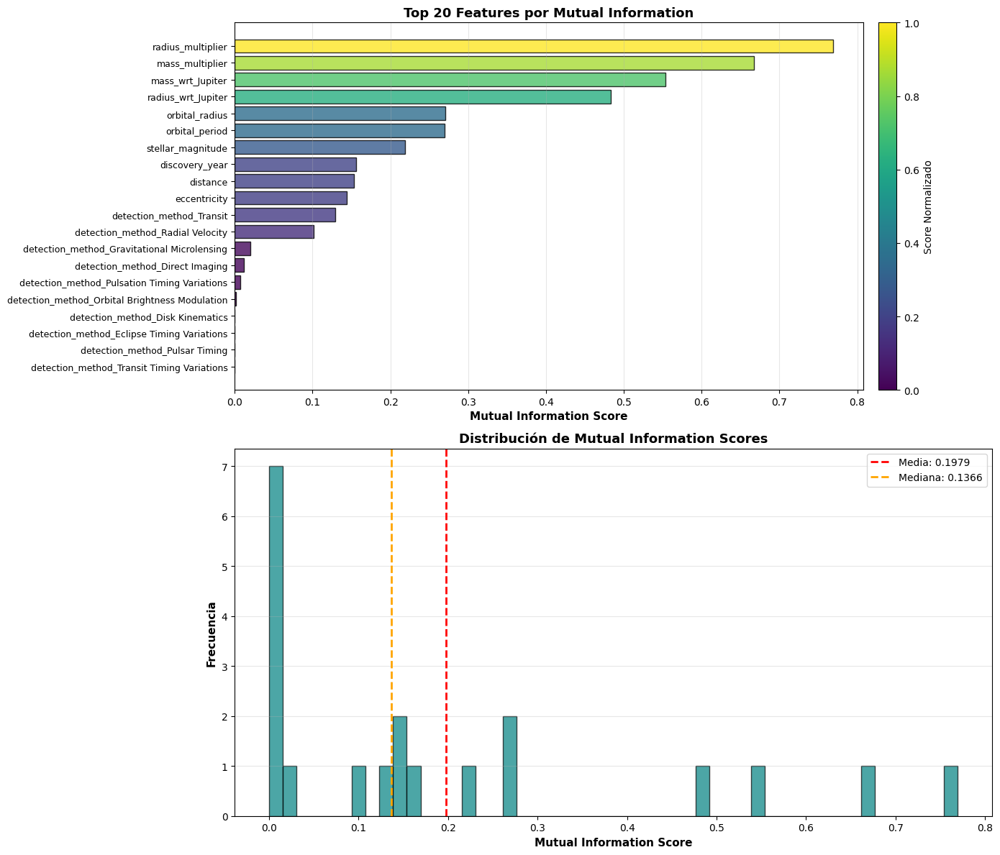

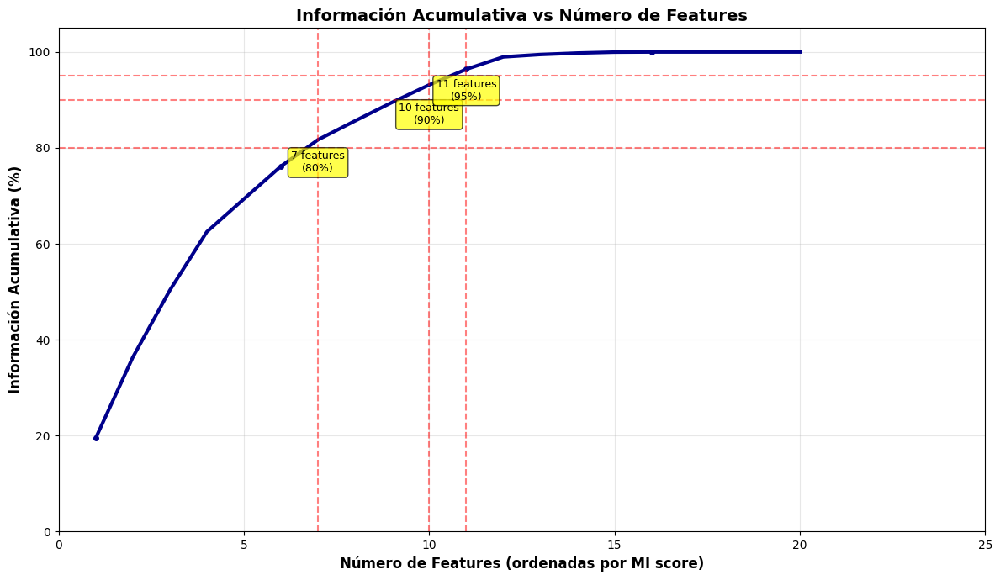


 Información Acumulativa:
   • 80% de información con 7 features (35.0% del total)
   • 90% de información con 10 features (50.0% del total)
   • 95% de información con 11 features (55.0% del total)
   • 99% de información con 13 features (65.0% del total)


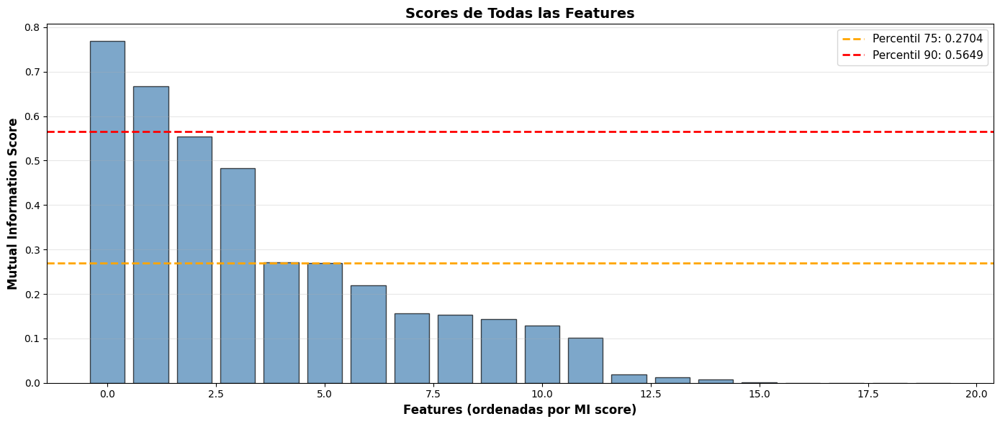


                    4. ANÁLISIS DE DIFERENTES UMBRALES

Features seleccionadas por diferentes valores de K:
    K | Features seleccionadas
────────────────────────────────────────────────────────────────────────────────
    5 | radius_multiplier, mass_multiplier, mass_wrt_Jupiter, radius_wrt_Jupiter, orbital_radius
   10 | radius_multiplier, mass_multiplier, mass_wrt_Jupiter, radius_wrt_Jupiter, orbital_radius, orbital_period, stellar_magnitude, discovery_year, distance, eccentricity
   15 | radius_multiplier, mass_multiplier, mass_wrt_Jupiter, radius_wrt_Jupiter, orbital_radius ... (+10 más)
   20 | radius_multiplier, mass_multiplier, mass_wrt_Jupiter, radius_wrt_Jupiter, orbital_radius ... (+15 más)
   20 | radius_multiplier, mass_multiplier, mass_wrt_Jupiter, radius_wrt_Jupiter, orbital_radius ... (+15 más)

 Features seleccionadas por percentiles:
   • Percentil 50: MI Score ≥ 0.1366 → 10 features (50.0%)
   • Percentil 75: MI Score ≥ 0.2704 → 5 features (25.0%)
   • Percentil 90:

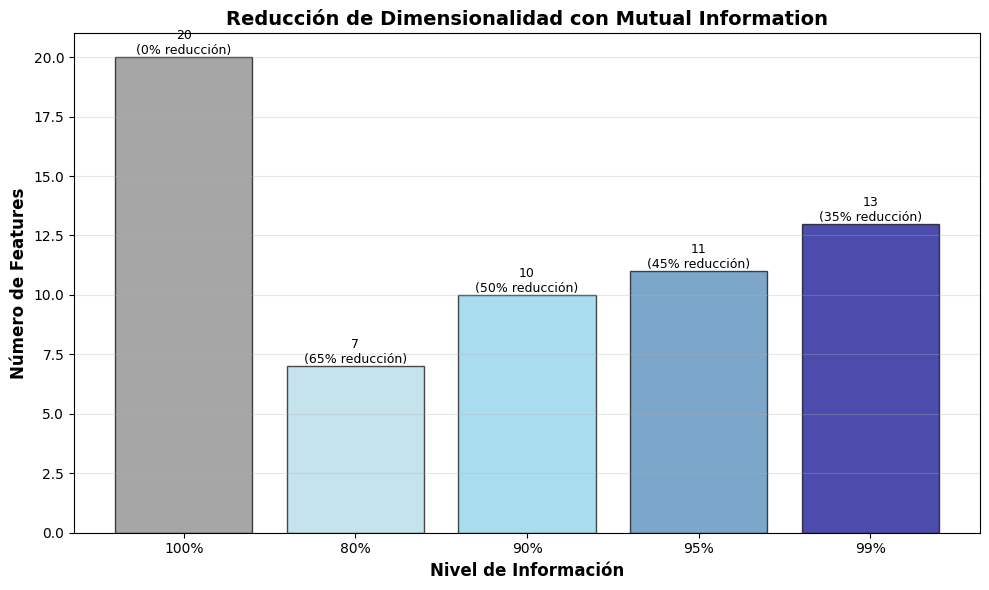


                    6. RESULTADOS GUARDADOS

✓ Resultados guardados en variable 'mi_results'
✓ Puedes acceder a:
   • mi_results: DataFrame completo con todos los scores
   • feature_names: Lista de nombres de features
   • mi_scores: Array de scores

 ANÁLISIS MUTUAL INFORMATION COMPLETADO


In [ ]:
from sklearn.feature_selection import mutual_info_classif
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

print("="*80)
print(" "*15 + "SELECCIÓN DE FEATURES CON MUTUAL INFORMATION")
print("="*80)

# ============================================================================
#                     1. PREPARACIÓN DE DATOS
# ============================================================================

print("\n PASO 1: Preparando datos para Mutual Information...")

# Trabajar con los datos originales antes del preprocesamiento
X_original = df_clean.drop(columns=['planet_type', 'name'])
y_original = df_clean['planet_type']

# Identificar columnas numéricas y categóricas
num_cols = X_original.select_dtypes(exclude=['object', 'category']).columns.tolist()
cat_cols = X_original.select_dtypes(include=['object', 'category']).columns.tolist()

print(f"   • Features numéricas: {len(num_cols)}")
print(f"   • Features categóricas: {len(cat_cols)}")
print(f"   • Total features: {len(num_cols) + len(cat_cols)}")

# Codificar variables categóricas (One-Hot Encoding)
if len(cat_cols) > 0:
    encoder = OneHotEncoder(drop='first', sparse_output=False, handle_unknown='ignore')
    X_cat_encoded = encoder.fit_transform(X_original[cat_cols])
    cat_feature_names = encoder.get_feature_names_out(cat_cols).tolist()
else:
    X_cat_encoded = np.array([]).reshape(len(X_original), 0)
    cat_feature_names = []

# Para MI no es necesario escalar, pero lo haremos para consistencia
scaler = MinMaxScaler()
X_num_scaled = scaler.fit_transform(X_original[num_cols])

# Combinar features numéricas y categóricas
X_combined = np.hstack([X_num_scaled, X_cat_encoded])
feature_names = num_cols + cat_feature_names

print(f"\n✓ Datos preparados:")
print(f"   • Shape final: {X_combined.shape}")
print(f"   • Total de features procesadas: {len(feature_names)}")

# ============================================================================
#                     2. CALCULAR SCORES MUTUAL INFORMATION
# ============================================================================

print("\n" + "="*80)
print(" "*15 + "2. CÁLCULO DE SCORES MUTUAL INFORMATION")
print("="*80)

# Calcular Mutual Information scores
print("\n Calculando Mutual Information (puede tomar unos minutos)...")
mi_scores = mutual_info_classif(
    X_combined,
    y_original,
    discrete_features='auto',
    n_neighbors=3,
    random_state=8
)

# Crear DataFrame con resultados
mi_results = pd.DataFrame({
    'Feature': feature_names,
    'MI_Score': mi_scores
})

# Ordenar por score descendente
mi_results = mi_results.sort_values('MI_Score', ascending=False).reset_index(drop=True)
mi_results['Rank'] = range(1, len(mi_results) + 1)

# Normalizar scores a [0, 1] para interpretación
mi_results['MI_Score_Normalized'] = mi_results['MI_Score'] / mi_results['MI_Score'].max()

print("\n Mutual Information calculada correctamente")

print("\n Top 20 Features por Mutual Information Score:")
print(mi_results.head(20).to_string(index=False))

print(f"\n Estadísticas de scores:")
print(f"   • Score máximo:    {mi_results['MI_Score'].max():.4f}")
print(f"   • Score mínimo:    {mi_results['MI_Score'].min():.4f}")
print(f"   • Score promedio:  {mi_results['MI_Score'].mean():.4f}")
print(f"   • Score mediana:   {mi_results['MI_Score'].median():.4f}")
print(f"   • Desv. estándar:  {mi_results['MI_Score'].std():.4f}")

# ============================================================================
#                     3. VISUALIZACIONES
# ============================================================================

print("\n" + "="*80)
print(" "*20 + "3. VISUALIZACIONES")
print("="*80)

# --- Gráfico 1: Top 20 Features ---
fig, axes = plt.subplots(2, 1, figsize=(14, 12))

top_n = 20
top_features = mi_results.head(top_n)

# Color gradient basado en score normalizado
colors = plt.cm.viridis(top_features['MI_Score_Normalized'])

axes[0].barh(range(top_n), top_features['MI_Score'], color=colors, alpha=0.8, edgecolor='black')
axes[0].set_yticks(range(top_n))
axes[0].set_yticklabels(top_features['Feature'], fontsize=9)
axes[0].set_xlabel('Mutual Information Score', fontsize=11, fontweight='bold')
axes[0].set_title(f'Top {top_n} Features por Mutual Information', fontsize=13, fontweight='bold')
axes[0].invert_yaxis()
axes[0].grid(axis='x', alpha=0.3)

# Añadir colorbar
sm = plt.cm.ScalarMappable(cmap=plt.cm.viridis,
                           norm=plt.Normalize(vmin=0, vmax=1))
sm.set_array([])
cbar = plt.colorbar(sm, ax=axes[0], orientation='vertical', pad=0.02)
cbar.set_label('Score Normalizado', fontsize=10)

# --- Gráfico 2: Distribución de MI Scores ---
axes[1].hist(mi_results['MI_Score'], bins=50, color='teal', alpha=0.7, edgecolor='black')
axes[1].axvline(x=mi_results['MI_Score'].mean(), color='red', linestyle='--',
                linewidth=2, label=f'Media: {mi_results["MI_Score"].mean():.4f}')
axes[1].axvline(x=mi_results['MI_Score'].median(), color='orange', linestyle='--',
                linewidth=2, label=f'Mediana: {mi_results["MI_Score"].median():.4f}')
axes[1].set_xlabel('Mutual Information Score', fontsize=11, fontweight='bold')
axes[1].set_ylabel('Frecuencia', fontsize=11, fontweight='bold')
axes[1].set_title('Distribución de Mutual Information Scores', fontsize=13, fontweight='bold')
axes[1].legend()
axes[1].grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

# --- Gráfico 3: Scores Acumulativos ---
fig, ax = plt.subplots(figsize=(12, 7))

# Calcular información acumulativa
mi_sorted = mi_results['MI_Score'].values
mi_cumsum = np.cumsum(mi_sorted)
mi_cumsum_normalized = mi_cumsum / mi_cumsum[-1]

ax.plot(range(1, len(mi_cumsum_normalized) + 1), mi_cumsum_normalized * 100,
        linewidth=3, color='darkblue', marker='o', markersize=4, markevery=5)

# Líneas de referencia
for threshold in [80, 90, 95]:
    idx = np.argmax(mi_cumsum_normalized >= threshold/100)
    ax.axhline(y=threshold, color='red', linestyle='--', linewidth=1.5, alpha=0.5)
    ax.axvline(x=idx+1, color='red', linestyle='--', linewidth=1.5, alpha=0.5)
    ax.text(idx+1, threshold-5, f'{idx+1} features\n({threshold}%)',
            fontsize=9, ha='center', bbox=dict(boxstyle='round', facecolor='yellow', alpha=0.7))

ax.set_xlabel('Número de Features (ordenadas por MI score)', fontsize=12, fontweight='bold')
ax.set_ylabel('Información Acumulativa (%)', fontsize=12, fontweight='bold')
ax.set_title('Información Acumulativa vs Número de Features', fontsize=14, fontweight='bold')
ax.grid(True, alpha=0.3)
ax.set_xlim([0, len(mi_cumsum_normalized) + 5])
ax.set_ylim([0, 105])

plt.tight_layout()
plt.show()

# Imprimir información sobre puntos clave
print("\n Información Acumulativa:")
for threshold in [80, 90, 95, 99]:
    idx = np.argmax(mi_cumsum_normalized >= threshold/100)
    print(f"   • {threshold}% de información con {idx+1} features ({(idx+1)/len(feature_names)*100:.1f}% del total)")

# --- Gráfico 4: Comparación visual de scores ---
fig, ax = plt.subplots(figsize=(14, 6))

x = np.arange(len(mi_results))
ax.bar(x, mi_results['MI_Score'], color='steelblue', alpha=0.7, edgecolor='black')

# Marcar umbrales
threshold_75 = np.percentile(mi_results['MI_Score'], 75)
threshold_90 = np.percentile(mi_results['MI_Score'], 90)

ax.axhline(y=threshold_75, color='orange', linestyle='--', linewidth=2,
           label=f'Percentil 75: {threshold_75:.4f}')
ax.axhline(y=threshold_90, color='red', linestyle='--', linewidth=2,
           label=f'Percentil 90: {threshold_90:.4f}')

ax.set_xlabel('Features (ordenadas por MI score)', fontsize=12, fontweight='bold')
ax.set_ylabel('Mutual Information Score', fontsize=12, fontweight='bold')
ax.set_title('Scores de Todas las Features', fontsize=14, fontweight='bold')
ax.legend(fontsize=11)
ax.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

# ============================================================================
#                     4. ANÁLISIS DE DIFERENTES UMBRALES
# ============================================================================

print("\n" + "="*80)
print(" "*20 + "4. ANÁLISIS DE DIFERENTES UMBRALES")
print("="*80)

# Probar diferentes números de features
k_values = [5, 10, 15, 20, 30, 50, len(feature_names)]
k_values = [k for k in k_values if k <= len(feature_names)]

print("\nFeatures seleccionadas por diferentes valores de K:")
print(f"{'K':>5} | {'Features seleccionadas'}")
print("─"*80)

for k in k_values:
    selected = mi_results.head(k)['Feature'].tolist()
    if k <= 10:
        print(f"{k:>5} | {', '.join(selected)}")
    else:
        print(f"{k:>5} | {', '.join(selected[:5])} ... (+{k-5} más)")

# Análisis por percentiles
print("\n Features seleccionadas por percentiles:")
percentiles = [50, 75, 90, 95]
for p in percentiles:
    threshold = np.percentile(mi_results['MI_Score'], p)
    n_features = (mi_results['MI_Score'] >= threshold).sum()
    print(f"   • Percentil {p}: MI Score ≥ {threshold:.4f} → {n_features} features ({n_features/len(feature_names)*100:.1f}%)")

# ============================================================================
#                     5. COMPARACIÓN DE DIMENSIONALIDAD
# ============================================================================

print("\n" + "="*80)
print(" "*15 + "5. COMPARACIÓN DE DIMENSIONALIDAD")
print("="*80)

# Calcular features necesarias para diferentes niveles de información
info_levels = [0.80, 0.90, 0.95, 0.99]
dimensiones_data = []

for info_level in info_levels:
    idx = np.argmax(mi_cumsum_normalized >= info_level)
    n_features = idx + 1
    reduccion = (len(feature_names) - n_features) / len(feature_names) * 100
    dimensiones_data.append({
        'Información (%)': f'{info_level*100:.0f}%',
        'Features Necesarias': n_features,
        'Reducción (%)': reduccion
    })

# Agregar opción de features completas
dimensiones_data.insert(0, {
    'Información (%)': '100%',
    'Features Necesarias': len(feature_names),
    'Reducción (%)': 0.0
})

dimensiones_df = pd.DataFrame(dimensiones_data)
print("\n" + dimensiones_df.to_string(index=False))

# Visualización
fig, ax = plt.subplots(figsize=(10, 6))

bars = ax.bar(
    dimensiones_df['Información (%)'],
    dimensiones_df['Features Necesarias'],
    color=['gray', 'lightblue', 'skyblue', 'steelblue', 'darkblue'],
    alpha=0.7,
    edgecolor='black'
)

ax.set_ylabel('Número de Features', fontsize=12, fontweight='bold')
ax.set_xlabel('Nivel de Información', fontsize=12, fontweight='bold')
ax.set_title('Reducción de Dimensionalidad con Mutual Information', fontsize=14, fontweight='bold')
ax.grid(axis='y', alpha=0.3)

# Añadir valores sobre las barras
for bar, reduccion in zip(bars, dimensiones_df['Reducción (%)']):
    height = bar.get_height()
    label = f'{int(height)}\n({reduccion:.0f}% reducción)'
    ax.text(bar.get_x() + bar.get_width()/2., height,
            label, ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()

# ============================================================================
#                     6. GUARDAR RESULTADOS
# ============================================================================

print("\n" + "="*80)
print(" "*20 + "6. RESULTADOS GUARDADOS")
print("="*80)

print("\n✓ Resultados guardados en variable 'mi_results'")
print("✓ Puedes acceder a:")
print("   • mi_results: DataFrame completo con todos los scores")
print("   • feature_names: Lista de nombres de features")
print("   • mi_scores: Array de scores")

print("\n" + "="*80)
print(" ANÁLISIS MUTUAL INFORMATION COMPLETADO")
print("="*80)

## Anova f - test

                    SELECCIÓN DE FEATURES CON ANOVA F-TEST

 PASO 1: Preparando datos para ANOVA F-test...
   • Features numéricas: 8
   • Features categóricas: 3
   • Total features: 11

✓ Datos preparados:
   • Shape final: (5250, 20)
   • Total de features procesadas: 20

                    2. CÁLCULO DE SCORES ANOVA F-TEST

 Calculando ANOVA F-statistics...

 ANOVA F-test calculado correctamente

 Top 20 Features por F-Score:
                                       Feature      F_Score       P_Value  Rank  Significativa
                              mass_wrt_Jupiter 21749.169655  0.000000e+00     1           True
                            radius_wrt_Jupiter  5257.278845  0.000000e+00     2           True
                             radius_multiplier  1157.270493  0.000000e+00     3           True
                      detection_method_Transit   481.996349  0.000000e+00     4           True
                             stellar_magnitude   365.081581 1.008843e-277     5           

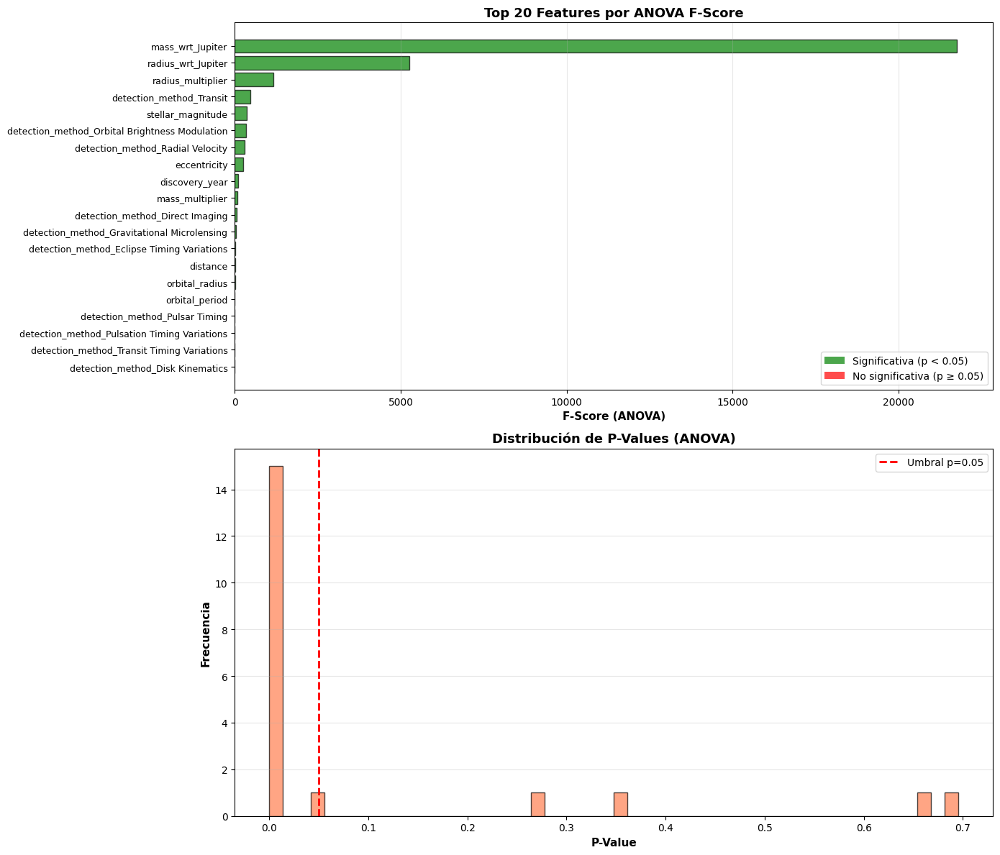

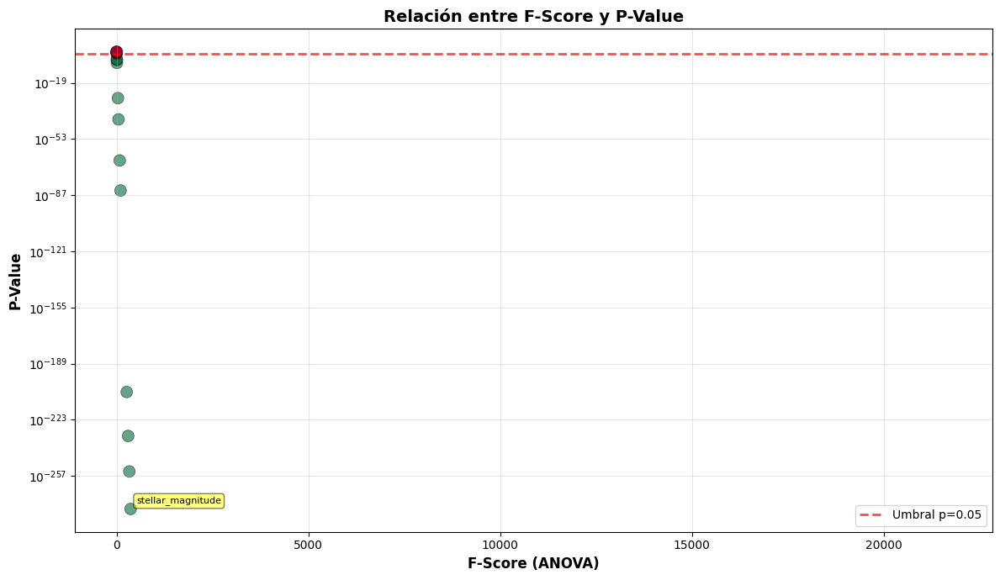

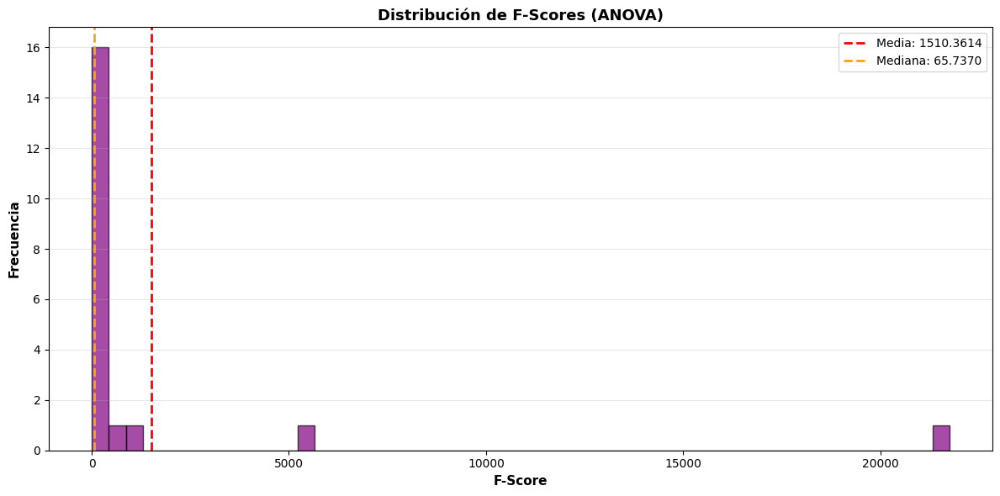

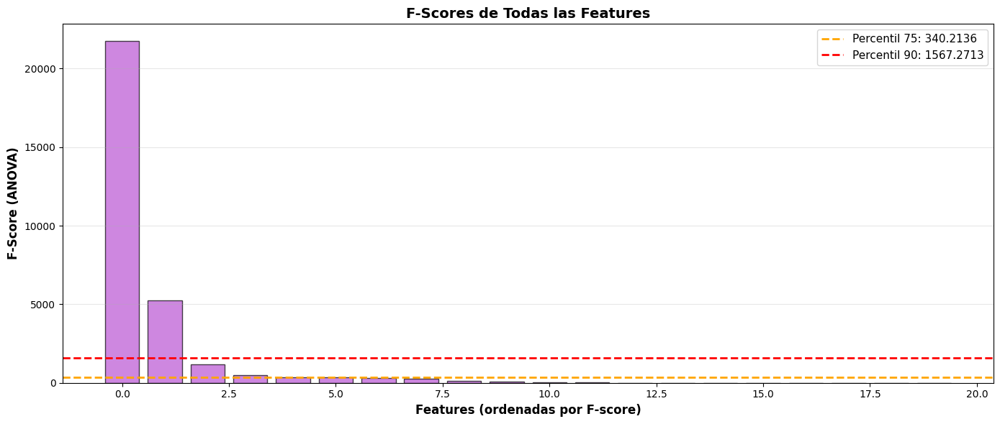


                    4. ANÁLISIS DE DIFERENTES UMBRALES

Features seleccionadas por diferentes valores de K:
    K | Features seleccionadas
────────────────────────────────────────────────────────────────────────────────
    5 | mass_wrt_Jupiter, radius_wrt_Jupiter, radius_multiplier, detection_method_Transit, stellar_magnitude
   10 | mass_wrt_Jupiter, radius_wrt_Jupiter, radius_multiplier, detection_method_Transit, stellar_magnitude, detection_method_Orbital Brightness Modulation, detection_method_Radial Velocity, eccentricity, discovery_year, mass_multiplier
   15 | mass_wrt_Jupiter, radius_wrt_Jupiter, radius_multiplier, detection_method_Transit, stellar_magnitude ... (+10 más)
   20 | mass_wrt_Jupiter, radius_wrt_Jupiter, radius_multiplier, detection_method_Transit, stellar_magnitude ... (+15 más)
   20 | mass_wrt_Jupiter, radius_wrt_Jupiter, radius_multiplier, detection_method_Transit, stellar_magnitude ... (+15 más)

 Features seleccionadas por percentiles:
   • Percentil 50: F-

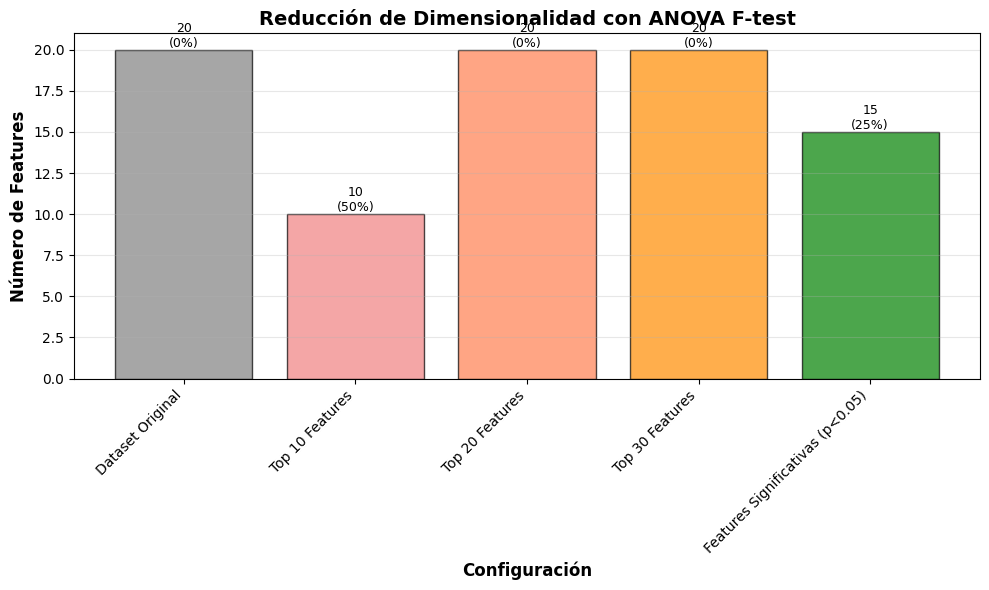


                    6. RESULTADOS GUARDADOS

✓ Resultados guardados en variable 'anova_results'
✓ Puedes acceder a:
   • anova_results: DataFrame completo con todos los scores
   • feature_names: Lista de nombres de features
   • f_scores: Array de F-scores
   • f_pvalues: Array de p-values

 ANÁLISIS ANOVA F-TEST COMPLETADO


In [ ]:
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

print("="*80)
print(" "*20 + "SELECCIÓN DE FEATURES CON ANOVA F-TEST")
print("="*80)

# ============================================================================
#                     1. PREPARACIÓN DE DATOS
# ============================================================================

print("\n PASO 1: Preparando datos para ANOVA F-test...")

# Trabajar con los datos originales antes del preprocesamiento
X_original = df_clean.drop(columns=['planet_type', 'name'])
y_original = df_clean['planet_type']

# Identificar columnas numéricas y categóricas
num_cols = X_original.select_dtypes(exclude=['object', 'category']).columns.tolist()
cat_cols = X_original.select_dtypes(include=['object', 'category']).columns.tolist()

print(f"   • Features numéricas: {len(num_cols)}")
print(f"   • Features categóricas: {len(cat_cols)}")
print(f"   • Total features: {len(num_cols) + len(cat_cols)}")

# Codificar variables categóricas (One-Hot Encoding)
if len(cat_cols) > 0:
    encoder = OneHotEncoder(drop='first', sparse_output=False, handle_unknown='ignore')
    X_cat_encoded = encoder.fit_transform(X_original[cat_cols])
    cat_feature_names = encoder.get_feature_names_out(cat_cols).tolist()
else:
    X_cat_encoded = np.array([]).reshape(len(X_original), 0)
    cat_feature_names = []

# Escalar features numéricas
scaler = MinMaxScaler()
X_num_scaled = scaler.fit_transform(X_original[num_cols])

# Combinar features numéricas y categóricas
X_combined = np.hstack([X_num_scaled, X_cat_encoded])
feature_names = num_cols + cat_feature_names

print(f"\n✓ Datos preparados:")
print(f"   • Shape final: {X_combined.shape}")
print(f"   • Total de features procesadas: {len(feature_names)}")

# ============================================================================
#                     2. CALCULAR SCORES ANOVA F-TEST
# ============================================================================

print("\n" + "="*80)
print(" "*20 + "2. CÁLCULO DE SCORES ANOVA F-TEST")
print("="*80)

# Calcular F-statistics y p-values
print("\n Calculando ANOVA F-statistics...")
anova_selector = SelectKBest(f_classif, k='all')
anova_selector.fit(X_combined, y_original)

# Obtener scores y p-values
f_scores = anova_selector.scores_
f_pvalues = anova_selector.pvalues_

# Crear DataFrame con resultados
anova_results = pd.DataFrame({
    'Feature': feature_names,
    'F_Score': f_scores,
    'P_Value': f_pvalues
})

# Ordenar por F-score descendente
anova_results = anova_results.sort_values('F_Score', ascending=False).reset_index(drop=True)
anova_results['Rank'] = range(1, len(anova_results) + 1)

# Marcar features significativas (p-value < 0.05)
anova_results['Significativa'] = anova_results['P_Value'] < 0.05

print("\n ANOVA F-test calculado correctamente")

print("\n Top 20 Features por F-Score:")
print(anova_results.head(20).to_string(index=False))

print(f"\n Resumen:")
print(f"   • Features significativas (p < 0.05): {anova_results['Significativa'].sum()}/{len(anova_results)}")
print(f"   • Features no significativas: {(~anova_results['Significativa']).sum()}/{len(anova_results)}")

print(f"\n Estadísticas de F-scores:")
print(f"   • F-score máximo:    {anova_results['F_Score'].max():.4f}")
print(f"   • F-score mínimo:    {anova_results['F_Score'].min():.4f}")
print(f"   • F-score promedio:  {anova_results['F_Score'].mean():.4f}")
print(f"   • F-score mediana:   {anova_results['F_Score'].median():.4f}")
print(f"   • Desv. estándar:    {anova_results['F_Score'].std():.4f}")

# ============================================================================
#                     3. VISUALIZACIONES
# ============================================================================

print("\n" + "="*80)
print(" "*20 + "3. VISUALIZACIONES")
print("="*80)

# --- Gráfico 1: Top 20 Features ---
fig, axes = plt.subplots(2, 1, figsize=(14, 12))

top_n = 20
top_features = anova_results.head(top_n)

colors = ['green' if sig else 'red' for sig in top_features['Significativa']]

axes[0].barh(range(top_n), top_features['F_Score'], color=colors, alpha=0.7, edgecolor='black')
axes[0].set_yticks(range(top_n))
axes[0].set_yticklabels(top_features['Feature'], fontsize=9)
axes[0].set_xlabel('F-Score (ANOVA)', fontsize=11, fontweight='bold')
axes[0].set_title(f'Top {top_n} Features por ANOVA F-Score', fontsize=13, fontweight='bold')
axes[0].invert_yaxis()
axes[0].grid(axis='x', alpha=0.3)

# Añadir leyenda
from matplotlib.patches import Patch
legend_elements = [
    Patch(facecolor='green', alpha=0.7, label='Significativa (p < 0.05)'),
    Patch(facecolor='red', alpha=0.7, label='No significativa (p ≥ 0.05)')
]
axes[0].legend(handles=legend_elements, loc='lower right')

# --- Gráfico 2: Distribución de P-Values ---
axes[1].hist(anova_results['P_Value'], bins=50, color='coral', alpha=0.7, edgecolor='black')
axes[1].axvline(x=0.05, color='red', linestyle='--', linewidth=2, label='Umbral p=0.05')
axes[1].set_xlabel('P-Value', fontsize=11, fontweight='bold')
axes[1].set_ylabel('Frecuencia', fontsize=11, fontweight='bold')
axes[1].set_title('Distribución de P-Values (ANOVA)', fontsize=13, fontweight='bold')
axes[1].legend()
axes[1].grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

# --- Gráfico 3: F-Score vs P-Value (Scatter) ---
fig, ax = plt.subplots(figsize=(12, 7))

scatter = ax.scatter(
    anova_results['F_Score'],
    anova_results['P_Value'],
    c=anova_results['Significativa'],
    cmap='RdYlGn',
    s=100,
    alpha=0.6,
    edgecolors='black',
    linewidth=0.5
)

ax.axhline(y=0.05, color='red', linestyle='--', linewidth=2, alpha=0.7, label='Umbral p=0.05')
ax.set_xlabel('F-Score (ANOVA)', fontsize=12, fontweight='bold')
ax.set_ylabel('P-Value', fontsize=12, fontweight='bold')
ax.set_title('Relación entre F-Score y P-Value', fontsize=14, fontweight='bold')
ax.set_yscale('log')
ax.legend()
ax.grid(True, alpha=0.3)

# Anotar las top 5 features
for idx in range(min(5, len(anova_results))):
    row = anova_results.iloc[idx]
    ax.annotate(
        row['Feature'],
        (row['F_Score'], row['P_Value']),
        fontsize=8,
        xytext=(5, 5),
        textcoords='offset points',
        bbox=dict(boxstyle='round,pad=0.3', facecolor='yellow', alpha=0.5)
    )

plt.tight_layout()
plt.show()

# --- Gráfico 4: Distribución de F-Scores ---
fig, ax = plt.subplots(figsize=(12, 6))

ax.hist(anova_results['F_Score'], bins=50, color='purple', alpha=0.7, edgecolor='black')
ax.axvline(x=anova_results['F_Score'].mean(), color='red', linestyle='--',
           linewidth=2, label=f'Media: {anova_results["F_Score"].mean():.4f}')
ax.axvline(x=anova_results['F_Score'].median(), color='orange', linestyle='--',
           linewidth=2, label=f'Mediana: {anova_results["F_Score"].median():.4f}')
ax.set_xlabel('F-Score', fontsize=11, fontweight='bold')
ax.set_ylabel('Frecuencia', fontsize=11, fontweight='bold')
ax.set_title('Distribución de F-Scores (ANOVA)', fontsize=13, fontweight='bold')
ax.legend()
ax.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

# --- Gráfico 5: Comparación visual de scores ---
fig, ax = plt.subplots(figsize=(14, 6))

x = np.arange(len(anova_results))
ax.bar(x, anova_results['F_Score'], color='mediumorchid', alpha=0.7, edgecolor='black')

# Marcar umbrales
threshold_75 = np.percentile(anova_results['F_Score'], 75)
threshold_90 = np.percentile(anova_results['F_Score'], 90)

ax.axhline(y=threshold_75, color='orange', linestyle='--', linewidth=2,
           label=f'Percentil 75: {threshold_75:.4f}')
ax.axhline(y=threshold_90, color='red', linestyle='--', linewidth=2,
           label=f'Percentil 90: {threshold_90:.4f}')

ax.set_xlabel('Features (ordenadas por F-score)', fontsize=12, fontweight='bold')
ax.set_ylabel('F-Score (ANOVA)', fontsize=12, fontweight='bold')
ax.set_title('F-Scores de Todas las Features', fontsize=14, fontweight='bold')
ax.legend(fontsize=11)
ax.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

# ============================================================================
#                     4. ANÁLISIS DE DIFERENTES UMBRALES
# ============================================================================

print("\n" + "="*80)
print(" "*20 + "4. ANÁLISIS DE DIFERENTES UMBRALES")
print("="*80)

# Probar diferentes números de features
k_values = [5, 10, 15, 20, 30, 50, len(feature_names)]
k_values = [k for k in k_values if k <= len(feature_names)]

print("\nFeatures seleccionadas por diferentes valores de K:")
print(f"{'K':>5} | {'Features seleccionadas'}")
print("─"*80)

for k in k_values:
    selected = anova_results.head(k)['Feature'].tolist()
    if k <= 10:
        print(f"{k:>5} | {', '.join(selected)}")
    else:
        print(f"{k:>5} | {', '.join(selected[:5])} ... (+{k-5} más)")

# Análisis por percentiles
print("\n Features seleccionadas por percentiles:")
percentiles = [50, 75, 90, 95]
for p in percentiles:
    threshold = np.percentile(anova_results['F_Score'], p)
    n_features = (anova_results['F_Score'] >= threshold).sum()
    print(f"   • Percentil {p}: F-Score ≥ {threshold:.4f} → {n_features} features ({n_features/len(feature_names)*100:.1f}%)")

# ============================================================================
#                     5. COMPARACIÓN DE DIMENSIONALIDAD
# ============================================================================

print("\n" + "="*80)
print(" "*15 + "5. COMPARACIÓN DE DIMENSIONALIDAD")
print("="*80)

dimensiones_df = pd.DataFrame({
    'Configuración': [
        'Dataset Original',
        'Top 10 Features',
        'Top 20 Features',
        'Top 30 Features',
        'Features Significativas (p<0.05)'
    ],
    'Num_Features': [
        len(feature_names),
        min(10, len(feature_names)),
        min(20, len(feature_names)),
        min(30, len(feature_names)),
        anova_results['Significativa'].sum()
    ]
})

dimensiones_df['Reducción (%)'] = (
    (dimensiones_df['Num_Features'].iloc[0] - dimensiones_df['Num_Features']) /
    dimensiones_df['Num_Features'].iloc[0] * 100
)

print("\n" + dimensiones_df.to_string(index=False))

# Visualización
fig, ax = plt.subplots(figsize=(10, 6))

bars = ax.bar(
    dimensiones_df['Configuración'],
    dimensiones_df['Num_Features'],
    color=['gray', 'lightcoral', 'coral', 'darkorange', 'green'],
    alpha=0.7,
    edgecolor='black'
)

ax.set_ylabel('Número de Features', fontsize=12, fontweight='bold')
ax.set_xlabel('Configuración', fontsize=12, fontweight='bold')
ax.set_title('Reducción de Dimensionalidad con ANOVA F-test', fontsize=14, fontweight='bold')
ax.grid(axis='y', alpha=0.3)

# Rotar etiquetas
plt.xticks(rotation=45, ha='right')

# Añadir valores sobre las barras
for bar, reduccion in zip(bars, dimensiones_df['Reducción (%)']):
    height = bar.get_height()
    label = f'{int(height)}\n({reduccion:.0f}%)'
    ax.text(bar.get_x() + bar.get_width()/2., height,
            label, ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()

# ============================================================================
#                     6. GUARDAR RESULTADOS
# ============================================================================

print("\n" + "="*80)
print(" "*20 + "6. RESULTADOS GUARDADOS")
print("="*80)

print("\n✓ Resultados guardados en variable 'anova_results'")
print("✓ Puedes acceder a:")
print("   • anova_results: DataFrame completo con todos los scores")
print("   • feature_names: Lista de nombres de features")
print("   • f_scores: Array de F-scores")
print("   • f_pvalues: Array de p-values")

print("\n" + "="*80)
print(" ANÁLISIS ANOVA F-TEST COMPLETADO")
print("="*80)

# Método embebido para RL

               SELECCIÓN DE FEATURES CON RFE (MÉTODO EMBEBIDO)

 PASO 1: Preparando datos para RFE...
   • X_train shape: (3675, 18)
   • X_val shape: (787, 18)
   • Total features: 18
   • Nombres de features disponibles: 18

               2. RFE CON NÚMERO FIJO DE FEATURES (K=20)
   ✓ Usando hiperparámetros del modelo optimizado

 Ejecutando RFE para seleccionar 20 features...


/usr/local/lib/python3.12/dist-packages/sklearn/feature_selection/_rfe.py:300: UserWarning: Found n_features_to_select=20 > n_features=18. There will be no feature selection and all features will be kept.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(



 RFE completado

 Features seleccionadas (Ranking = 1):
   Total: 18
    1. distance
    2. stellar_magnitude
    3. discovery_year
    4. mass_multiplier
    5. radius_multiplier
    6. orbital_radius
    7. orbital_period
    8. eccentricity
    9. mass_wrt_Jupiter
   10. radius_wrt_Jupiter
   11. detection_method_Direct Imaging
   12. detection_method_Eclipse Timing Variations
   13. detection_method_Gravitational Microlensing
   14. detection_method_Orbital Brightness Modulation
   15. detection_method_Pulsar Timing
   16. detection_method_Radial Velocity
   17. detection_method_Transit
   18. detection_method_Transit Timing Variations

          3. RFECV - SELECCIÓN AUTOMÁTICA CON VALIDACIÓN CRUZADA

 Ejecutando RFECV (esto puede tomar varios minutos)...
   • Probando desde 1 hasta todas las features
   • Validación cruzada: 5-fold
   • Métrica: accuracy


/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default 


 RFECV completado

 Número óptimo de features: 7

 Features seleccionadas por RFECV (Ranking = 1):
    1. stellar_magnitude
    2. mass_multiplier
    3. radius_multiplier
    4. mass_wrt_Jupiter
    5. detection_method_Orbital Brightness Modulation
    6. detection_method_Direct Imaging
    7. radius_wrt_Jupiter

                    4. VISUALIZACIONES


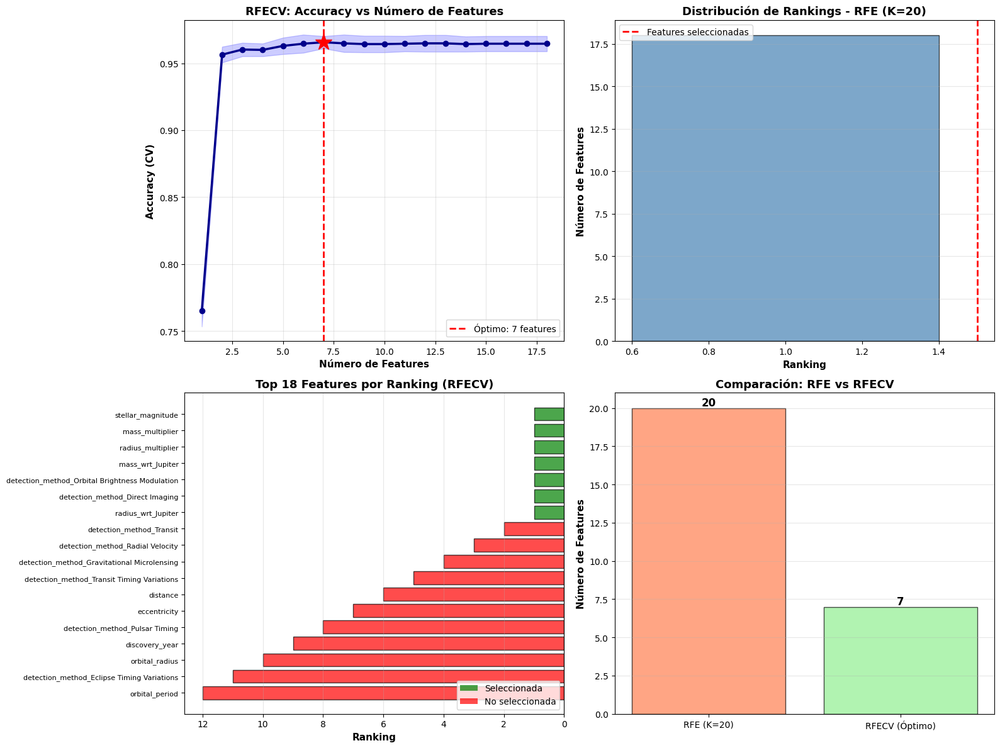

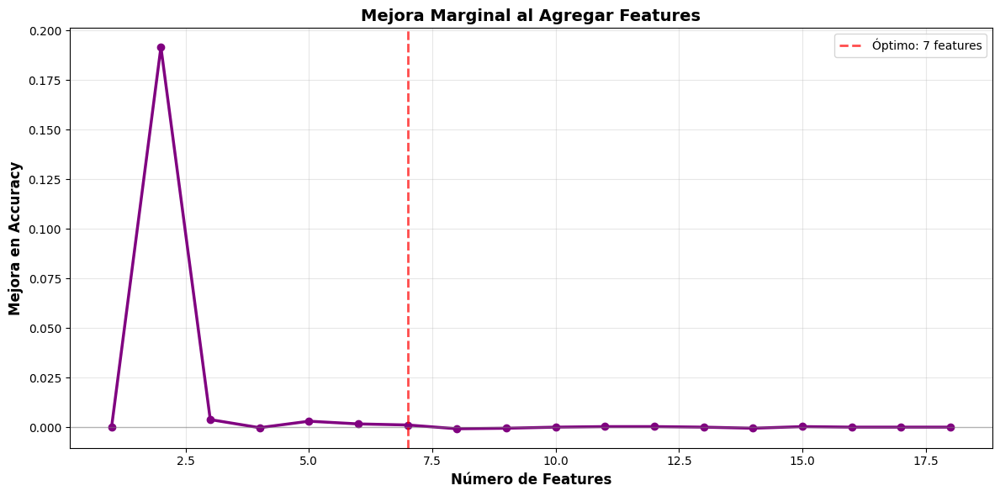


                    5. ANÁLISIS DE RENDIMIENTO

 Métricas de RFECV:
   • Accuracy con 1 feature:               0.7649
   • Accuracy óptima (con 7 features):  0.9657
   • Accuracy con todas las features:      0.9646
   • Mejora desde 1 feature:               +0.2008
   • Diferencia óptimo vs todas:           +0.0011

 Reducción de dimensionalidad:
   • Features originales:  18
   • Features óptimas:     7
   • Reducción:            61.1%

 Análisis de zona óptima:
   • Features para 99% del óptimo:  2 (11.1%)
   • Features para 95% del óptimo:  2 (11.1%)

               6. COMPARACIÓN DE DIMENSIONALIDAD

     Configuración  Num_Features  Accuracy_Estimado  Reducción (%)
  Dataset Original            18             0.9646         0.0000
        RFE (K=20)            20                NaN       -11.1111
    RFECV (Óptimo)             7             0.9657        61.1111
RFECV (99% óptimo)             2             0.9565        88.8889
RFECV (95% óptimo)             2             0.9565  

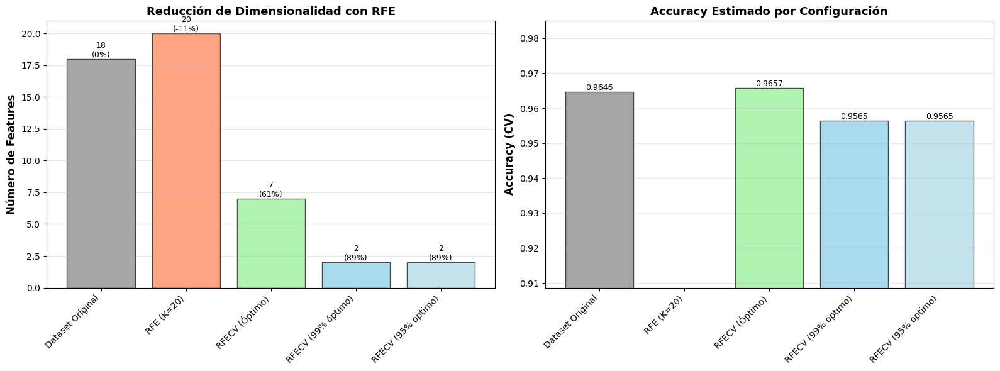


                    7. RESULTADOS GUARDADOS

✓ Resultados guardados en variables:
   • rfe_results: DataFrame con resultados RFE (K=20)
   • rfecv_results: DataFrame con resultados RFECV (óptimo)
   • rfe: Objeto RFE entrenado
   • rfecv: Objeto RFECV entrenado
   • selected_features: Lista de features seleccionadas (RFE)
   • selected_features_cv: Lista de features seleccionadas (RFECV)

 ANÁLISIS RFE (MÉTODO EMBEBIDO) COMPLETADO


In [ ]:
from sklearn.feature_selection import RFE, RFECV
from sklearn.linear_model import LogisticRegression
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

print("="*80)
print(" "*15 + "SELECCIÓN DE FEATURES CON RFE (MÉTODO EMBEBIDO)")
print("="*80)

# ============================================================================
#                     1. PREPARACIÓN DE DATOS
# ============================================================================

print("\n PASO 1: Preparando datos para RFE...")

# Usar los datos preprocesados que ya tienes
print(f"   • X_train shape: {x_train_final.shape}")
print(f"   • X_val shape: {x_val_final.shape}")
print(f"   • Total features: {x_train_final.shape[1]}")

# Reconstruir nombres de features (numéricas + codificadas)
# Nota: Si tienes los nombres guardados, úsalos. Si no, generamos genéricos
if 'encoded_cols' in globals() and 'num_cols' in globals():
    all_feature_names = list(num_cols) + list(encoded_cols)
else:
    # Generar nombres genéricos
    all_feature_names = [f'feature_{i}' for i in range(x_train_final.shape[1])]

print(f"   • Nombres de features disponibles: {len(all_feature_names)}")

# ============================================================================
#                     2. RFE CON NÚMERO FIJO DE FEATURES
# ============================================================================

print("\n" + "="*80)
print(" "*15 + "2. RFE CON NÚMERO FIJO DE FEATURES (K=20)")
print("="*80)

# Crear el estimador (usar el modelo optimizado si existe, sino uno nuevo)
if 'best_lr' in globals():
    estimator = best_lr.__class__(**best_lr.get_params())
    print("   ✓ Usando hiperparámetros del modelo optimizado")
else:
    estimator = LogisticRegression(
        max_iter=1000,
        multi_class='multinomial',
        solver='lbfgs',
        random_state=8
    )
    print("   ✓ Usando modelo LogisticRegression por defecto")

# RFE para seleccionar top 20 features
n_features_to_select = 20
print(f"\n Ejecutando RFE para seleccionar {n_features_to_select} features...")

rfe = RFE(estimator=estimator, n_features_to_select=n_features_to_select, step=1)
rfe.fit(x_train_final, y_train)

# Obtener resultados
rfe_support = rfe.support_
rfe_ranking = rfe.ranking_

# Crear DataFrame con resultados
rfe_results = pd.DataFrame({
    'Feature': all_feature_names,
    'Selected': rfe_support,
    'Ranking': rfe_ranking
})

rfe_results = rfe_results.sort_values('Ranking').reset_index(drop=True)

print(f"\n RFE completado")
print(f"\n Features seleccionadas (Ranking = 1):")
selected_features = rfe_results[rfe_results['Selected'] == True]['Feature'].tolist()
print(f"   Total: {len(selected_features)}")
for i, feat in enumerate(selected_features, 1):
    print(f"   {i:2d}. {feat}")

# ============================================================================
#                     3. RFECV - SELECCIÓN AUTOMÁTICA CON CV
# ============================================================================

print("\n" + "="*80)
print(" "*10 + "3. RFECV - SELECCIÓN AUTOMÁTICA CON VALIDACIÓN CRUZADA")
print("="*80)

print("\n Ejecutando RFECV (esto puede tomar varios minutos)...")
print("   • Probando desde 1 hasta todas las features")
print("   • Validación cruzada: 5-fold")
print("   • Métrica: accuracy")

rfecv = RFECV(
    estimator=estimator,
    step=1,
    cv=5,
    scoring='accuracy',
    n_jobs=-1,
    verbose=0
)

rfecv.fit(x_train_final, y_train)

# Obtener resultados
rfecv_support = rfecv.support_
rfecv_ranking = rfecv.ranking_
n_features_optimal = rfecv.n_features_

print(f"\n RFECV completado")
print(f"\n Número óptimo de features: {n_features_optimal}")

# Crear DataFrame con resultados RFECV
rfecv_results = pd.DataFrame({
    'Feature': all_feature_names,
    'Selected': rfecv_support,
    'Ranking': rfecv_ranking
})

rfecv_results = rfecv_results.sort_values('Ranking').reset_index(drop=True)

print(f"\n Features seleccionadas por RFECV (Ranking = 1):")
selected_features_cv = rfecv_results[rfecv_results['Selected'] == True]['Feature'].tolist()
for i, feat in enumerate(selected_features_cv, 1):
    if i <= 20:  # Mostrar solo las primeras 20
        print(f"   {i:2d}. {feat}")
    elif i == 21:
        print(f"   ... (+{len(selected_features_cv)-20} más)")
        break

# ============================================================================
#                     4. VISUALIZACIONES
# ============================================================================

print("\n" + "="*80)
print(" "*20 + "4. VISUALIZACIONES")
print("="*80)

# --- Gráfico 1: Curva RFECV (Número de features vs Score) ---
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# Panel 1: Curva RFECV
cv_scores = rfecv.cv_results_['mean_test_score']
cv_std = rfecv.cv_results_['std_test_score']
n_features_range = range(1, len(cv_scores) + 1)

axes[0, 0].plot(n_features_range, cv_scores, 'o-', linewidth=2.5, markersize=6, color='darkblue')
axes[0, 0].fill_between(n_features_range,
                        cv_scores - cv_std,
                        cv_scores + cv_std,
                        alpha=0.2, color='blue')

# Marcar el óptimo
max_score_idx = np.argmax(cv_scores)
axes[0, 0].axvline(x=n_features_optimal, color='red', linestyle='--', linewidth=2,
                  label=f'Óptimo: {n_features_optimal} features')
axes[0, 0].plot(n_features_optimal, cv_scores[max_score_idx], 'r*', markersize=20)

axes[0, 0].set_xlabel('Número de Features', fontsize=11, fontweight='bold')
axes[0, 0].set_ylabel('Accuracy (CV)', fontsize=11, fontweight='bold')
axes[0, 0].set_title('RFECV: Accuracy vs Número de Features', fontsize=13, fontweight='bold')
axes[0, 0].legend()
axes[0, 0].grid(True, alpha=0.3)

# Panel 2: Distribución de Rankings (RFE fijo)
ranking_counts = rfe_results['Ranking'].value_counts().sort_index()
axes[0, 1].bar(ranking_counts.index, ranking_counts.values,
              color='steelblue', alpha=0.7, edgecolor='black')
axes[0, 1].axvline(x=1.5, color='red', linestyle='--', linewidth=2,
                  label='Features seleccionadas')
axes[0, 1].set_xlabel('Ranking', fontsize=11, fontweight='bold')
axes[0, 1].set_ylabel('Número de Features', fontsize=11, fontweight='bold')
axes[0, 1].set_title(f'Distribución de Rankings - RFE (K={n_features_to_select})',
                    fontsize=13, fontweight='bold')
axes[0, 1].legend()
axes[0, 1].grid(axis='y', alpha=0.3)

# Panel 3: Top 20 features por RFECV
top_n_display = min(20, len(rfecv_results))
top_rfecv = rfecv_results.head(top_n_display)
colors = ['green' if sel else 'red' for sel in top_rfecv['Selected']]

axes[1, 0].barh(range(len(top_rfecv)), top_rfecv['Ranking'], color=colors, alpha=0.7, edgecolor='black')
axes[1, 0].set_yticks(range(len(top_rfecv)))
axes[1, 0].set_yticklabels(top_rfecv['Feature'], fontsize=8)
axes[1, 0].set_xlabel('Ranking', fontsize=11, fontweight='bold')
axes[1, 0].set_title(f'Top {len(top_rfecv)} Features por Ranking (RFECV)', fontsize=13, fontweight='bold')
axes[1, 0].invert_yaxis()
axes[1, 0].invert_xaxis()
axes[1, 0].grid(axis='x', alpha=0.3)

# Leyenda
from matplotlib.patches import Patch
legend_elements = [
    Patch(facecolor='green', alpha=0.7, label='Seleccionada'),
    Patch(facecolor='red', alpha=0.7, label='No seleccionada')
]
axes[1, 0].legend(handles=legend_elements, loc='lower right')

# Panel 4: Comparación RFE vs RFECV
comparison_data = {
    'Método': ['RFE (K=20)', 'RFECV (Óptimo)'],
    'Num_Features': [n_features_to_select, n_features_optimal]
}

bars = axes[1, 1].bar(comparison_data['Método'], comparison_data['Num_Features'],
                     color=['coral', 'lightgreen'], alpha=0.7, edgecolor='black')
axes[1, 1].set_ylabel('Número de Features', fontsize=11, fontweight='bold')
axes[1, 1].set_title('Comparación: RFE vs RFECV', fontsize=13, fontweight='bold')
axes[1, 1].grid(axis='y', alpha=0.3)

# Añadir valores
for bar in bars:
    height = bar.get_height()
    axes[1, 1].text(bar.get_x() + bar.get_width()/2., height,
                   f'{int(height)}', ha='center', va='bottom', fontsize=12, fontweight='bold')

plt.tight_layout()
plt.show()

# --- Gráfico 2: Análisis de mejora marginal ---
fig, ax = plt.subplots(figsize=(12, 6))

# Calcular mejora marginal
improvements = np.diff(cv_scores)
improvements = np.insert(improvements, 0, 0)  # Añadir 0 al inicio

ax.plot(n_features_range, improvements, 'o-', linewidth=2.5, markersize=6, color='purple')
ax.axhline(y=0, color='gray', linestyle='-', linewidth=1, alpha=0.5)
ax.axvline(x=n_features_optimal, color='red', linestyle='--', linewidth=2, alpha=0.7,
          label=f'Óptimo: {n_features_optimal} features')

ax.set_xlabel('Número de Features', fontsize=12, fontweight='bold')
ax.set_ylabel('Mejora en Accuracy', fontsize=12, fontweight='bold')
ax.set_title('Mejora Marginal al Agregar Features', fontsize=14, fontweight='bold')
ax.legend()
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# ============================================================================
#                     5. ANÁLISIS DE RENDIMIENTO
# ============================================================================

print("\n" + "="*80)
print(" "*20 + "5. ANÁLISIS DE RENDIMIENTO")
print("="*80)

# Scores clave
max_score = cv_scores[max_score_idx]
score_with_all = cv_scores[-1]
score_improvement = max_score - cv_scores[0]

print(f"\n Métricas de RFECV:")
print(f"   • Accuracy con 1 feature:               {cv_scores[0]:.4f}")
print(f"   • Accuracy óptima (con {n_features_optimal} features):  {max_score:.4f}")
print(f"   • Accuracy con todas las features:      {score_with_all:.4f}")
print(f"   • Mejora desde 1 feature:               {score_improvement:+.4f}")
print(f"   • Diferencia óptimo vs todas:           {max_score - score_with_all:+.4f}")

# Calcular reducción de dimensionalidad
reduccion = (len(all_feature_names) - n_features_optimal) / len(all_feature_names) * 100
print(f"\n Reducción de dimensionalidad:")
print(f"   • Features originales:  {len(all_feature_names)}")
print(f"   • Features óptimas:     {n_features_optimal}")
print(f"   • Reducción:            {reduccion:.1f}%")

# Análisis de zona óptima
print(f"\n Análisis de zona óptima:")

# Buscar rango donde accuracy está dentro del 99% del óptimo
threshold_99 = max_score * 0.99
features_99 = np.where(cv_scores >= threshold_99)[0][0] + 1
print(f"   • Features para 99% del óptimo:  {features_99} ({features_99/len(all_feature_names)*100:.1f}%)")

threshold_95 = max_score * 0.95
features_95 = np.where(cv_scores >= threshold_95)[0][0] + 1
print(f"   • Features para 95% del óptimo:  {features_95} ({features_95/len(all_feature_names)*100:.1f}%)")

# ============================================================================
#                     6. COMPARACIÓN DE DIMENSIONALIDAD
# ============================================================================

print("\n" + "="*80)
print(" "*15 + "6. COMPARACIÓN DE DIMENSIONALIDAD")
print("="*80)

dimensiones_df = pd.DataFrame({
    'Configuración': [
        'Dataset Original',
        'RFE (K=20)',
        'RFECV (Óptimo)',
        'RFECV (99% óptimo)',
        'RFECV (95% óptimo)'
    ],
    'Num_Features': [
        len(all_feature_names),
        n_features_to_select,
        n_features_optimal,
        features_99,
        features_95
    ],
    'Accuracy_Estimado': [
        score_with_all,
        cv_scores[n_features_to_select - 1] if n_features_to_select <= len(cv_scores) else np.nan,
        max_score,
        cv_scores[features_99 - 1],
        cv_scores[features_95 - 1]
    ]
})

dimensiones_df['Reducción (%)'] = (
    (dimensiones_df['Num_Features'].iloc[0] - dimensiones_df['Num_Features']) /
    dimensiones_df['Num_Features'].iloc[0] * 100
)

print("\n" + dimensiones_df.to_string(index=False, float_format='%.4f'))

# Visualización
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Panel izquierdo: Número de features
bars1 = axes[0].bar(
    range(len(dimensiones_df)),
    dimensiones_df['Num_Features'],
    color=['gray', 'coral', 'lightgreen', 'skyblue', 'lightblue'],
    alpha=0.7,
    edgecolor='black'
)

axes[0].set_xticks(range(len(dimensiones_df)))
axes[0].set_xticklabels(dimensiones_df['Configuración'], rotation=45, ha='right')
axes[0].set_ylabel('Número de Features', fontsize=12, fontweight='bold')
axes[0].set_title('Reducción de Dimensionalidad con RFE', fontsize=13, fontweight='bold')
axes[0].grid(axis='y', alpha=0.3)

# Añadir valores
for bar, reduccion in zip(bars1, dimensiones_df['Reducción (%)']):
    height = bar.get_height()
    label = f'{int(height)}\n({reduccion:.0f}%)'
    axes[0].text(bar.get_x() + bar.get_width()/2., height,
                label, ha='center', va='bottom', fontsize=9)

# Panel derecho: Accuracy
bars2 = axes[1].bar(
    range(len(dimensiones_df)),
    dimensiones_df['Accuracy_Estimado'],
    color=['gray', 'coral', 'lightgreen', 'skyblue', 'lightblue'],
    alpha=0.7,
    edgecolor='black'
)

axes[1].set_xticks(range(len(dimensiones_df)))
axes[1].set_xticklabels(dimensiones_df['Configuración'], rotation=45, ha='right')
axes[1].set_ylabel('Accuracy (CV)', fontsize=12, fontweight='bold')
axes[1].set_title('Accuracy Estimado por Configuración', fontsize=13, fontweight='bold')
axes[1].set_ylim([dimensiones_df['Accuracy_Estimado'].min() * 0.95,
                  dimensiones_df['Accuracy_Estimado'].max() * 1.02])
axes[1].grid(axis='y', alpha=0.3)

# Añadir valores
for bar in bars2:
    height = bar.get_height()
    axes[1].text(bar.get_x() + bar.get_width()/2., height,
                f'{height:.4f}', ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()

# ============================================================================
#                     7. GUARDAR RESULTADOS
# ============================================================================

print("\n" + "="*80)
print(" "*20 + "7. RESULTADOS GUARDADOS")
print("="*80)

print("\n✓ Resultados guardados en variables:")
print("   • rfe_results: DataFrame con resultados RFE (K=20)")
print("   • rfecv_results: DataFrame con resultados RFECV (óptimo)")
print("   • rfe: Objeto RFE entrenado")
print("   • rfecv: Objeto RFECV entrenado")
print("   • selected_features: Lista de features seleccionadas (RFE)")
print("   • selected_features_cv: Lista de features seleccionadas (RFECV)")

print("\n" + "="*80)
print(" ANÁLISIS RFE (MÉTODO EMBEBIDO) COMPLETADO")
print("="*80)

                    EVALUACIÓN COMPLETA - MODELO CON RFE

 PASO 1: Entrenando modelo con features seleccionadas por RFECV...

✓ Datasets transformados:
   • X_train original: (3675, 18) → X_train_rfe: (3675, 7)
   • X_val original:   (787, 18) → X_val_rfe:   (787, 7)
   • X_test original:  (788, 18) → X_test_rfe:  (788, 7)
   • Features seleccionadas: 7

✓ Usando hiperparámetros optimizados


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(



✓ Modelo entrenado exitosamente

                         2. MÉTRICAS DEL MODELO

 MÉTRICAS EN VALIDACIÓN:
   • Accuracy:           0.7878 (78.78%)
   • Precision (macro):  0.5872
   • Recall (macro):     0.5575
   • F1-Score (macro):   0.5682

 MÉTRICAS EN TEST:
   • Accuracy:           0.7640 (76.40%)
   • Precision (macro):  0.5537
   • Recall (macro):     0.5183
   • F1-Score (macro):   0.5276

 REPORTE DE CLASIFICACIÓN (TEST):
              precision    recall  f1-score   support

   Gas Giant     0.7615    0.6776    0.7171       245
Neptune-like     0.9051    0.8358    0.8691       274
 Super Earth     0.6645    0.8368    0.7407       239
 Terrestrial     0.4375    0.2414    0.3111        29
     Unknown     0.0000    0.0000    0.0000         1

    accuracy                         0.7640       788
   macro avg     0.5537    0.5183    0.5276       788
weighted avg     0.7691    0.7640    0.7612       788


                         3. MATRICES DE CONFUSIÓN


/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


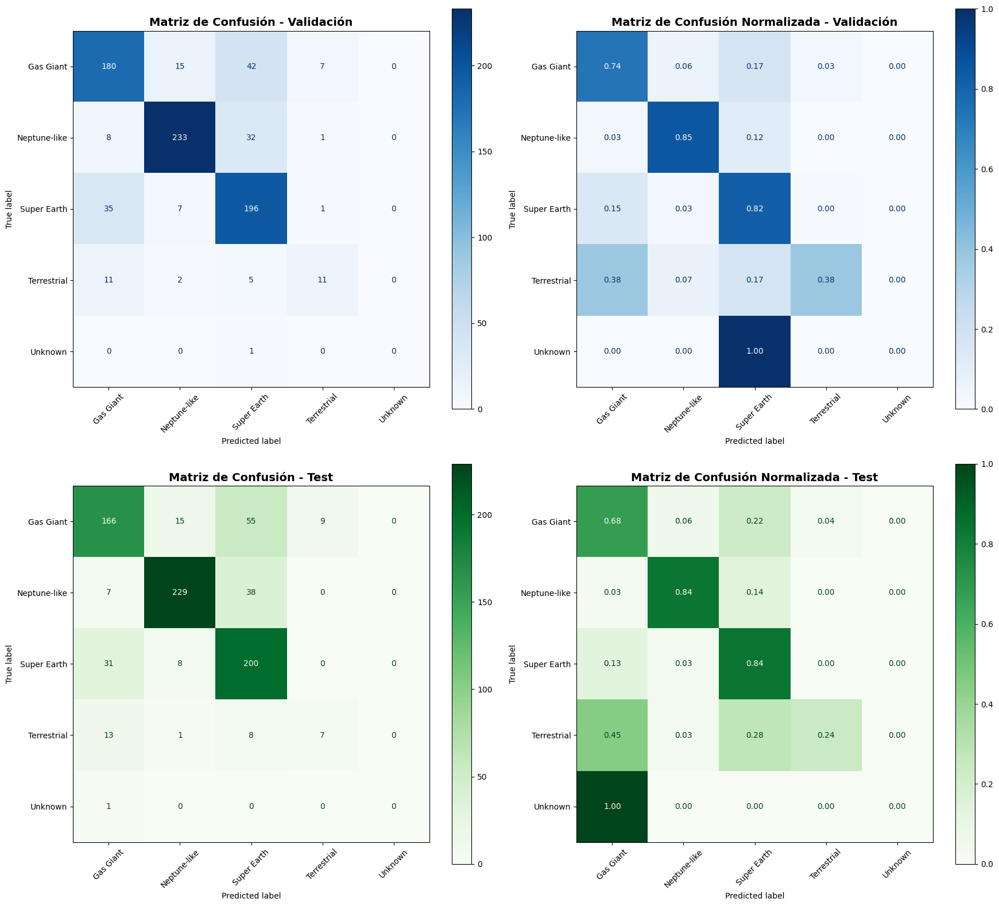


✓ Matrices de confusión generadas

                    4. COMPARACIÓN: TODAS LAS FEATURES vs RFE

 Entrenando modelo con todas las features...


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(



 COMPARACIÓN EN TEST:
  Métrica  Todas Features  RFE (7 features)  Diferencia  Diferencia_%
 Accuracy          0.9619            0.7640     -0.1980      -20.5805
Precision          0.9630            0.5537     -0.4093      -42.4997
   Recall          0.9520            0.5183     -0.4337      -45.5541
 F1-Score          0.9572            0.5276     -0.4296      -44.8814

 REDUCCIÓN DE DIMENSIONALIDAD:
   • Features originales: 18
   • Features con RFE:    7
   • Reducción:           61.1%


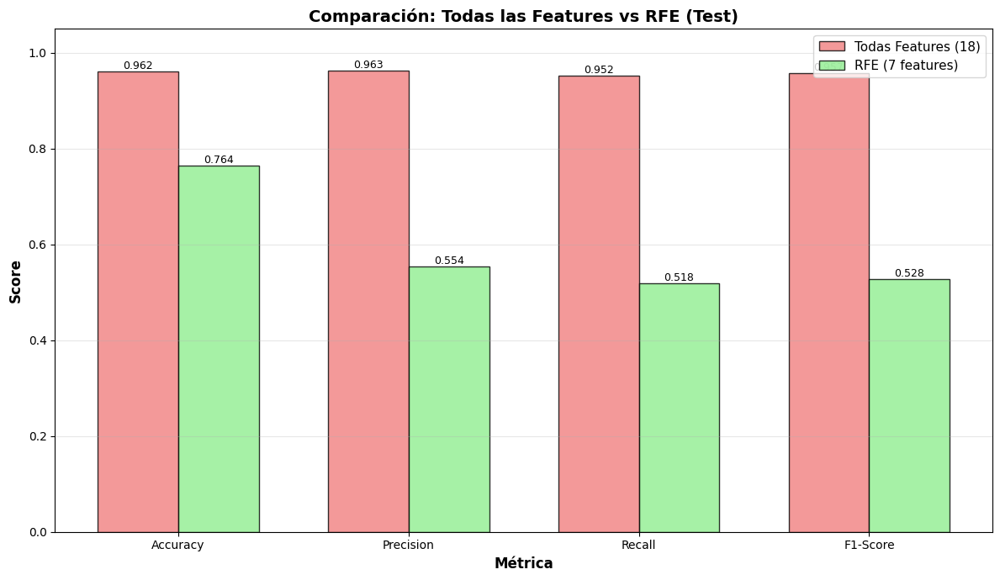


                         5. CURVAS DE APRENDIZAJE

 Generando curvas de aprendizaje (esto puede tomar tiempo)...


/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(



✓ Curvas de aprendizaje calculadas


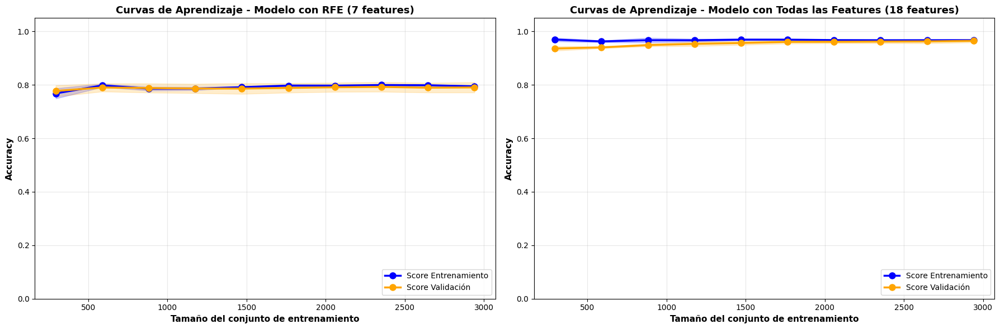


 ANÁLISIS DE CURVAS DE APRENDIZAJE:

 Modelo con RFE (7 features):
   • Score entrenamiento (final): 0.7946 (±0.0042)
   • Score validación (final):    0.7905 (±0.0191)
   • Gap (overfitting):           0.0041

 Modelo con todas las features (18 features):
   • Score entrenamiento (final): 0.9673 (±0.0009)
   • Score validación (final):    0.9646 (±0.0057)
   • Gap (overfitting):           0.0027

  El modelo con todas las features tiene menos overfitting

                              6. CURVAS ROC

✓ Número de clases: 5
  Clases: ['Gas Giant' 'Neptune-like' 'Super Earth' 'Terrestrial' 'Unknown']

  Clase Gas Giant:
    • AUC = 0.8773

  Clase Neptune-like:
    • AUC = 0.8465

  Clase Super Earth:
    • AUC = 0.8813

  Clase Terrestrial:
    • AUC = 0.9332

  Clase Unknown:
    • AUC = 0.7230

  Micro-average: AUC = 0.9244
  Macro-average: AUC = 0.8531


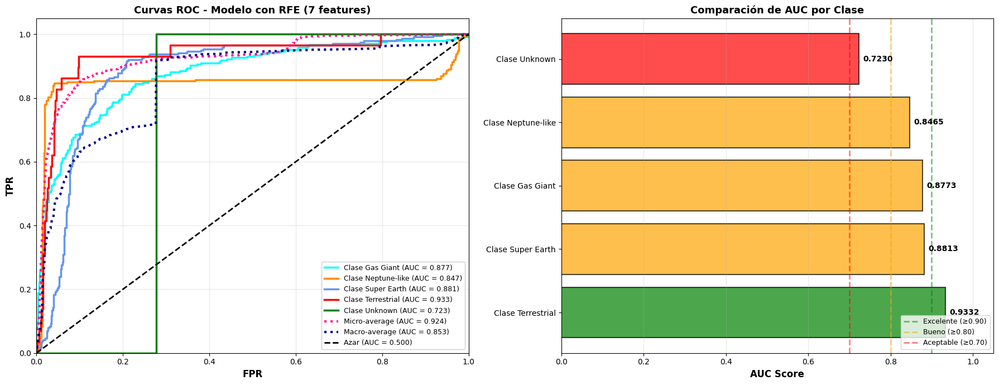


✓ Curvas ROC generadas

                              RESUMEN FINAL

 MODELO CON RFE:
   • Features seleccionadas:     7 de 18
   • Reducción dimensional:      61.1%

 RENDIMIENTO EN TEST:
   • Accuracy:   0.7640 (76.40%)
   • Precision:  0.5537
   • Recall:     0.5183
   • F1-Score:   0.5276

 AUC SCORES:
   • Micro-average: 0.9244
   • Macro-average: 0.8531
   • AUC promedio:  0.8523

 COMPARACIÓN CON TODAS LAS FEATURES:
   • Diferencia en F1-Score:    -0.4296
   • Diferencia en AUC (macro): +0.0008

  RFE reduce ligeramente el rendimiento pero simplifica el modelo

 MODELOS GUARDADOS:
   • final_model_rfe: Modelo con features seleccionadas
   • X_train_rfe, X_val_rfe, X_test_rfe: Datasets transformados

 EVALUACIÓN COMPLETA FINALIZADA


In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    classification_report, confusion_matrix, ConfusionMatrixDisplay,
    roc_curve, auc, roc_auc_score
)
from sklearn.model_selection import learning_curve
from sklearn.preprocessing import label_binarize
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import cycle

print("="*90)
print(" "*20 + "EVALUACIÓN COMPLETA - MODELO CON RFE")
print("="*90)

# ============================================================================
#                     1. ENTRENAR MODELO CON FEATURES SELECCIONADAS
# ============================================================================

print("\n PASO 1: Entrenando modelo con features seleccionadas por RFECV...")

# Obtener índices de features seleccionadas
selected_indices = rfecv_results[rfecv_results['Selected'] == True].index.tolist()

# Crear datasets con features seleccionadas
X_train_rfe = x_train_final[:, selected_indices]
X_val_rfe = x_val_final[:, selected_indices]
X_test_rfe = x_test_final[:, selected_indices]

print(f"\n✓ Datasets transformados:")
print(f"   • X_train original: {x_train_final.shape} → X_train_rfe: {X_train_rfe.shape}")
print(f"   • X_val original:   {x_val_final.shape} → X_val_rfe:   {X_val_rfe.shape}")
print(f"   • X_test original:  {x_test_final.shape} → X_test_rfe:  {X_test_rfe.shape}")
print(f"   • Features seleccionadas: {len(selected_indices)}")

# Entrenar modelo final
if 'best_lr' in globals():
    final_model_rfe = best_lr.__class__(**best_lr.get_params())
    print(f"\n✓ Usando hiperparámetros optimizados")
else:
    final_model_rfe = LogisticRegression(
        max_iter=1000,
        multi_class='multinomial',
        solver='lbfgs',
        random_state=8
    )
    print(f"\n✓ Usando configuración por defecto")

final_model_rfe.fit(X_train_rfe, y_train)
print(f"\n✓ Modelo entrenado exitosamente")

# ============================================================================
#                     2. MÉTRICAS EN VALIDACIÓN Y TEST
# ============================================================================

print("\n" + "="*90)
print(" "*25 + "2. MÉTRICAS DEL MODELO")
print("="*90)

# Predicciones en validación
y_pred_val_rfe = final_model_rfe.predict(X_val_rfe)
y_proba_val_rfe = final_model_rfe.predict_proba(X_val_rfe)

acc_val_rfe = accuracy_score(y_val, y_pred_val_rfe)
prec_val_rfe = precision_score(y_val, y_pred_val_rfe, average='macro', zero_division=0)
rec_val_rfe = recall_score(y_val, y_pred_val_rfe, average='macro', zero_division=0)
f1_val_rfe = f1_score(y_val, y_pred_val_rfe, average='macro', zero_division=0)

print("\n MÉTRICAS EN VALIDACIÓN:")
print(f"   • Accuracy:           {acc_val_rfe:.4f} ({acc_val_rfe*100:.2f}%)")
print(f"   • Precision (macro):  {prec_val_rfe:.4f}")
print(f"   • Recall (macro):     {rec_val_rfe:.4f}")
print(f"   • F1-Score (macro):   {f1_val_rfe:.4f}")

# Predicciones en test
y_pred_test_rfe = final_model_rfe.predict(X_test_rfe)
y_proba_test_rfe = final_model_rfe.predict_proba(X_test_rfe)

acc_test_rfe = accuracy_score(y_test, y_pred_test_rfe)
prec_test_rfe = precision_score(y_test, y_pred_test_rfe, average='macro', zero_division=0)
rec_test_rfe = recall_score(y_test, y_pred_test_rfe, average='macro', zero_division=0)
f1_test_rfe = f1_score(y_test, y_pred_test_rfe, average='macro', zero_division=0)

print("\n MÉTRICAS EN TEST:")
print(f"   • Accuracy:           {acc_test_rfe:.4f} ({acc_test_rfe*100:.2f}%)")
print(f"   • Precision (macro):  {prec_test_rfe:.4f}")
print(f"   • Recall (macro):     {rec_test_rfe:.4f}")
print(f"   • F1-Score (macro):   {f1_test_rfe:.4f}")

# Reporte de clasificación
print("\n REPORTE DE CLASIFICACIÓN (TEST):")
print(classification_report(y_test, y_pred_test_rfe, digits=4))

# ============================================================================
#                     3. MATRICES DE CONFUSIÓN
# ============================================================================

print("\n" + "="*90)
print(" "*25 + "3. MATRICES DE CONFUSIÓN")
print("="*90)

fig, axes = plt.subplots(2, 2, figsize=(18, 16))

# Matriz en validación
cm_val = confusion_matrix(y_val, y_pred_val_rfe)
disp_val = ConfusionMatrixDisplay(confusion_matrix=cm_val, display_labels=final_model_rfe.classes_)
disp_val.plot(cmap='Blues', ax=axes[0, 0], xticks_rotation=45, values_format='d')
axes[0, 0].set_title('Matriz de Confusión - Validación', fontsize=14, fontweight='bold')
axes[0, 0].grid(False)

# Matriz en validación normalizada
cm_val_norm = cm_val.astype('float') / cm_val.sum(axis=1)[:, np.newaxis]
disp_val_norm = ConfusionMatrixDisplay(confusion_matrix=cm_val_norm, display_labels=final_model_rfe.classes_)
disp_val_norm.plot(cmap='Blues', ax=axes[0, 1], xticks_rotation=45, values_format='.2f')
axes[0, 1].set_title('Matriz de Confusión Normalizada - Validación', fontsize=14, fontweight='bold')
axes[0, 1].grid(False)

# Matriz en test
cm_test = confusion_matrix(y_test, y_pred_test_rfe)
disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test, display_labels=final_model_rfe.classes_)
disp_test.plot(cmap='Greens', ax=axes[1, 0], xticks_rotation=45, values_format='d')
axes[1, 0].set_title('Matriz de Confusión - Test', fontsize=14, fontweight='bold')
axes[1, 0].grid(False)

# Matriz en test normalizada
cm_test_norm = cm_test.astype('float') / cm_test.sum(axis=1)[:, np.newaxis]
disp_test_norm = ConfusionMatrixDisplay(confusion_matrix=cm_test_norm, display_labels=final_model_rfe.classes_)
disp_test_norm.plot(cmap='Greens', ax=axes[1, 1], xticks_rotation=45, values_format='.2f')
axes[1, 1].set_title('Matriz de Confusión Normalizada - Test', fontsize=14, fontweight='bold')
axes[1, 1].grid(False)

plt.tight_layout()
plt.show()

print("\n✓ Matrices de confusión generadas")

# ============================================================================
#                     4. COMPARACIÓN: TODAS LAS FEATURES vs RFE
# ============================================================================

print("\n" + "="*90)
print(" "*20 + "4. COMPARACIÓN: TODAS LAS FEATURES vs RFE")
print("="*90)

# Entrenar modelo con todas las features para comparar
if 'best_lr' in globals():
    model_all_features = best_lr.__class__(**best_lr.get_params())
else:
    model_all_features = LogisticRegression(
        max_iter=1000,
        multi_class='multinomial',
        solver='lbfgs',
        random_state=8
    )

print("\n Entrenando modelo con todas las features...")
model_all_features.fit(x_train_final, y_train)

# Predicciones
y_pred_test_all = model_all_features.predict(x_test_final)

acc_test_all = accuracy_score(y_test, y_pred_test_all)
prec_test_all = precision_score(y_test, y_pred_test_all, average='macro', zero_division=0)
rec_test_all = recall_score(y_test, y_pred_test_all, average='macro', zero_division=0)
f1_test_all = f1_score(y_test, y_pred_test_all, average='macro', zero_division=0)

# Tabla comparativa
comparison_df = pd.DataFrame({
    'Métrica': ['Accuracy', 'Precision', 'Recall', 'F1-Score'],
    'Todas Features': [acc_test_all, prec_test_all, rec_test_all, f1_test_all],
    f'RFE ({len(selected_indices)} features)': [acc_test_rfe, prec_test_rfe, rec_test_rfe, f1_test_rfe]
})
comparison_df['Diferencia'] = comparison_df[f'RFE ({len(selected_indices)} features)'] - comparison_df['Todas Features']
comparison_df['Diferencia_%'] = (comparison_df['Diferencia'] / comparison_df['Todas Features']) * 100

print("\n COMPARACIÓN EN TEST:")
print(comparison_df.to_string(index=False, float_format='%.4f'))

print(f"\n REDUCCIÓN DE DIMENSIONALIDAD:")
print(f"   • Features originales: {x_train_final.shape[1]}")
print(f"   • Features con RFE:    {len(selected_indices)}")
print(f"   • Reducción:           {(1 - len(selected_indices)/x_train_final.shape[1])*100:.1f}%")

# Visualización comparativa
fig, ax = plt.subplots(figsize=(12, 7))

x_pos = np.arange(len(comparison_df))
width = 0.35

bars1 = ax.bar(x_pos - width/2, comparison_df['Todas Features'], width,
              label=f'Todas Features ({x_train_final.shape[1]})',
              color='lightcoral', alpha=0.8, edgecolor='black')
bars2 = ax.bar(x_pos + width/2, comparison_df[f'RFE ({len(selected_indices)} features)'], width,
              label=f'RFE ({len(selected_indices)} features)',
              color='lightgreen', alpha=0.8, edgecolor='black')

ax.set_ylabel('Score', fontsize=12, fontweight='bold')
ax.set_xlabel('Métrica', fontsize=12, fontweight='bold')
ax.set_title('Comparación: Todas las Features vs RFE (Test)', fontsize=14, fontweight='bold')
ax.set_xticks(x_pos)
ax.set_xticklabels(comparison_df['Métrica'])
ax.legend(fontsize=11)
ax.set_ylim([0, 1.05])
ax.grid(axis='y', alpha=0.3)

for bars in [bars1, bars2]:
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height,
               f'{height:.3f}', ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()

# ============================================================================
#                     5. CURVAS DE APRENDIZAJE
# ============================================================================

print("\n" + "="*90)
print(" "*25 + "5. CURVAS DE APRENDIZAJE")
print("="*90)

print("\n Generando curvas de aprendizaje (esto puede tomar tiempo)...")

# Tamaños de entrenamiento
train_sizes = np.linspace(0.1, 1.0, 10)

# Curvas con RFE
train_sizes_rfe, train_scores_rfe, val_scores_rfe = learning_curve(
    final_model_rfe,
    X_train_rfe,
    y_train,
    cv=5,
    n_jobs=-1,
    train_sizes=train_sizes,
    scoring='accuracy',
    random_state=8
)

# Calcular medias y desviaciones
train_mean_rfe = np.mean(train_scores_rfe, axis=1)
train_std_rfe = np.std(train_scores_rfe, axis=1)
val_mean_rfe = np.mean(val_scores_rfe, axis=1)
val_std_rfe = np.std(val_scores_rfe, axis=1)

# Curvas con todas las features
train_sizes_all, train_scores_all, val_scores_all = learning_curve(
    model_all_features,
    x_train_final,
    y_train,
    cv=5,
    n_jobs=-1,
    train_sizes=train_sizes,
    scoring='accuracy',
    random_state=8
)

train_mean_all = np.mean(train_scores_all, axis=1)
train_std_all = np.std(train_scores_all, axis=1)
val_mean_all = np.mean(val_scores_all, axis=1)
val_std_all = np.std(val_scores_all, axis=1)

print("\n✓ Curvas de aprendizaje calculadas")

# Visualización
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# Panel 1: Modelo con RFE
axes[0].plot(train_sizes_rfe, train_mean_rfe, 'o-', linewidth=2.5,
            markersize=8, color='blue', label='Score Entrenamiento')
axes[0].fill_between(train_sizes_rfe, train_mean_rfe - train_std_rfe,
                     train_mean_rfe + train_std_rfe, alpha=0.2, color='blue')

axes[0].plot(train_sizes_rfe, val_mean_rfe, 'o-', linewidth=2.5,
            markersize=8, color='orange', label='Score Validación')
axes[0].fill_between(train_sizes_rfe, val_mean_rfe - val_std_rfe,
                     val_mean_rfe + val_std_rfe, alpha=0.2, color='orange')

axes[0].set_xlabel('Tamaño del conjunto de entrenamiento', fontsize=11, fontweight='bold')
axes[0].set_ylabel('Accuracy', fontsize=11, fontweight='bold')
axes[0].set_title(f'Curvas de Aprendizaje - Modelo con RFE ({len(selected_indices)} features)',
                 fontsize=13, fontweight='bold')
axes[0].legend(loc='lower right', fontsize=10)
axes[0].grid(True, alpha=0.3)
axes[0].set_ylim([0, 1.05])

# Panel 2: Modelo con todas las features
axes[1].plot(train_sizes_all, train_mean_all, 'o-', linewidth=2.5,
            markersize=8, color='blue', label='Score Entrenamiento')
axes[1].fill_between(train_sizes_all, train_mean_all - train_std_all,
                     train_mean_all + train_std_all, alpha=0.2, color='blue')

axes[1].plot(train_sizes_all, val_mean_all, 'o-', linewidth=2.5,
            markersize=8, color='orange', label='Score Validación')
axes[1].fill_between(train_sizes_all, val_mean_all - val_std_all,
                     val_mean_all + val_std_all, alpha=0.2, color='orange')

axes[1].set_xlabel('Tamaño del conjunto de entrenamiento', fontsize=11, fontweight='bold')
axes[1].set_ylabel('Accuracy', fontsize=11, fontweight='bold')
axes[1].set_title(f'Curvas de Aprendizaje - Modelo con Todas las Features ({x_train_final.shape[1]} features)',
                 fontsize=13, fontweight='bold')
axes[1].legend(loc='lower right', fontsize=10)
axes[1].grid(True, alpha=0.3)
axes[1].set_ylim([0, 1.05])

plt.tight_layout()
plt.show()

# Análisis de curvas de aprendizaje
print("\n ANÁLISIS DE CURVAS DE APRENDIZAJE:")
print(f"\n Modelo con RFE ({len(selected_indices)} features):")
print(f"   • Score entrenamiento (final): {train_mean_rfe[-1]:.4f} (±{train_std_rfe[-1]:.4f})")
print(f"   • Score validación (final):    {val_mean_rfe[-1]:.4f} (±{val_std_rfe[-1]:.4f})")
print(f"   • Gap (overfitting):           {train_mean_rfe[-1] - val_mean_rfe[-1]:.4f}")

print(f"\n Modelo con todas las features ({x_train_final.shape[1]} features):")
print(f"   • Score entrenamiento (final): {train_mean_all[-1]:.4f} (±{train_std_all[-1]:.4f})")
print(f"   • Score validación (final):    {val_mean_all[-1]:.4f} (±{val_std_all[-1]:.4f})")
print(f"   • Gap (overfitting):           {train_mean_all[-1] - val_mean_all[-1]:.4f}")

gap_rfe = train_mean_rfe[-1] - val_mean_rfe[-1]
gap_all = train_mean_all[-1] - val_mean_all[-1]

if gap_rfe < gap_all:
    print(f"\n RFE reduce el overfitting en {gap_all - gap_rfe:.4f} puntos")
else:
    print(f"\n  El modelo con todas las features tiene menos overfitting")

# ============================================================================
#                     6. CURVAS ROC
# ============================================================================

print("\n" + "="*90)
print(" "*30 + "6. CURVAS ROC")
print("="*90)

# Preparar datos
classes = final_model_rfe.classes_
n_classes = len(classes)

print(f"\n✓ Número de clases: {n_classes}")
print(f"  Clases: {classes}")

# Binarizar etiquetas
y_test_bin = label_binarize(y_test, classes=classes)
if n_classes == 2:
    y_test_bin = np.hstack([1 - y_test_bin, y_test_bin])

# Calcular curvas ROC
fpr_rfe = dict()
tpr_rfe = dict()
roc_auc_rfe = dict()

for i in range(n_classes):
    fpr_rfe[i], tpr_rfe[i], _ = roc_curve(y_test_bin[:, i], y_proba_test_rfe[:, i])
    roc_auc_rfe[i] = auc(fpr_rfe[i], tpr_rfe[i])
    print(f"\n  Clase {classes[i]}:")
    print(f"    • AUC = {roc_auc_rfe[i]:.4f}")

# Micro-average
fpr_rfe["micro"], tpr_rfe["micro"], _ = roc_curve(y_test_bin.ravel(), y_proba_test_rfe.ravel())
roc_auc_rfe["micro"] = auc(fpr_rfe["micro"], tpr_rfe["micro"])

# Macro-average
all_fpr = np.unique(np.concatenate([fpr_rfe[i] for i in range(n_classes)]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += np.interp(all_fpr, fpr_rfe[i], tpr_rfe[i])
mean_tpr /= n_classes

fpr_rfe["macro"] = all_fpr
tpr_rfe["macro"] = mean_tpr
roc_auc_rfe["macro"] = auc(fpr_rfe["macro"], tpr_rfe["macro"])

print(f"\n  Micro-average: AUC = {roc_auc_rfe['micro']:.4f}")
print(f"  Macro-average: AUC = {roc_auc_rfe['macro']:.4f}")

# Visualización ROC
fig, axes = plt.subplots(1, 2, figsize=(18, 7))

# Panel 1: Todas las clases
colors = cycle(['aqua', 'darkorange', 'cornflowerblue', 'red', 'green',
                'purple', 'brown', 'pink', 'gray', 'olive'])

for i, color in zip(range(n_classes), colors):
    axes[0].plot(fpr_rfe[i], tpr_rfe[i], color=color, lw=2.5,
                label=f'Clase {classes[i]} (AUC = {roc_auc_rfe[i]:.3f})')

axes[0].plot(fpr_rfe["micro"], tpr_rfe["micro"],
            label=f'Micro-average (AUC = {roc_auc_rfe["micro"]:.3f})',
            color='deeppink', linestyle=':', linewidth=3)

axes[0].plot(fpr_rfe["macro"], tpr_rfe["macro"],
            label=f'Macro-average (AUC = {roc_auc_rfe["macro"]:.3f})',
            color='navy', linestyle=':', linewidth=3)

axes[0].plot([0, 1], [0, 1], 'k--', lw=2, label='Azar (AUC = 0.500)')

axes[0].set_xlim([0.0, 1.0])
axes[0].set_ylim([0.0, 1.05])
axes[0].set_xlabel('FPR', fontsize=12, fontweight='bold')
axes[0].set_ylabel('TPR', fontsize=12, fontweight='bold')
axes[0].set_title(f'Curvas ROC - Modelo con RFE ({len(selected_indices)} features)',
                 fontsize=13, fontweight='bold')
axes[0].legend(loc="lower right", fontsize=9, framealpha=0.95)
axes[0].grid(True, alpha=0.3)

# Panel 2: Comparación de AUC por clase
class_names = [f'Clase {c}' for c in classes]
auc_values = [roc_auc_rfe[i] for i in range(n_classes)]

sorted_indices = np.argsort(auc_values)[::-1]
class_names_sorted = [class_names[i] for i in sorted_indices]
auc_values_sorted = [auc_values[i] for i in sorted_indices]

colors_bar = ['green' if auc >= 0.9 else 'orange' if auc >= 0.8 else 'red'
              for auc in auc_values_sorted]

bars = axes[1].barh(range(n_classes), auc_values_sorted,
                    color=colors_bar, alpha=0.7, edgecolor='black', linewidth=1.5)

for i, (bar, auc_val) in enumerate(zip(bars, auc_values_sorted)):
    width = bar.get_width()
    axes[1].text(width + 0.01, bar.get_y() + bar.get_height()/2,
                f'{auc_val:.4f}', ha='left', va='center', fontsize=10, fontweight='bold')

axes[1].axvline(x=0.9, color='green', linestyle='--', linewidth=2, alpha=0.5, label='Excelente (≥0.90)')
axes[1].axvline(x=0.8, color='orange', linestyle='--', linewidth=2, alpha=0.5, label='Bueno (≥0.80)')
axes[1].axvline(x=0.7, color='red', linestyle='--', linewidth=2, alpha=0.5, label='Aceptable (≥0.70)')

axes[1].set_yticks(range(n_classes))
axes[1].set_yticklabels(class_names_sorted, fontsize=10)
axes[1].set_xlabel('AUC Score', fontsize=12, fontweight='bold')
axes[1].set_title('Comparación de AUC por Clase', fontsize=13, fontweight='bold')
axes[1].set_xlim([0, 1.05])
axes[1].legend(loc='lower right', fontsize=9)
axes[1].grid(axis='x', alpha=0.3)

plt.tight_layout()
plt.show()

print("\n✓ Curvas ROC generadas")

# ============================================================================
#                     7. RESUMEN FINAL
# ============================================================================

print("\n" + "="*90)
print(" "*30 + "RESUMEN FINAL")
print("="*90)

print(f"\n MODELO CON RFE:")
print(f"   • Features seleccionadas:     {len(selected_indices)} de {x_train_final.shape[1]}")
print(f"   • Reducción dimensional:      {(1 - len(selected_indices)/x_train_final.shape[1])*100:.1f}%")

print(f"\n RENDIMIENTO EN TEST:")
print(f"   • Accuracy:   {acc_test_rfe:.4f} ({acc_test_rfe*100:.2f}%)")
print(f"   • Precision:  {prec_test_rfe:.4f}")
print(f"   • Recall:     {rec_test_rfe:.4f}")
print(f"   • F1-Score:   {f1_test_rfe:.4f}")

print(f"\n AUC SCORES:")
print(f"   • Micro-average: {roc_auc_rfe['micro']:.4f}")
print(f"   • Macro-average: {roc_auc_rfe['macro']:.4f}")
print(f"   • AUC promedio:  {np.mean(auc_values):.4f}")

print(f"\n COMPARACIÓN CON TODAS LAS FEATURES:")
print(f"   • Diferencia en F1-Score:    {f1_test_rfe - f1_test_all:+.4f}")
print(f"   • Diferencia en AUC (macro): {roc_auc_rfe['macro'] - np.mean(auc_values):+.4f}")

if f1_test_rfe >= f1_test_all - 0.01:
    print(f"\n RFE mantiene el rendimiento con {(1-len(selected_indices)/x_train_final.shape[1])*100:.1f}% menos features")
else:
    print(f"\n  RFE reduce ligeramente el rendimiento pero simplifica el modelo")

print(f"\n MODELOS GUARDADOS:")
print(f"   • final_model_rfe: Modelo con features seleccionadas")
print(f"   • X_train_rfe, X_val_rfe, X_test_rfe: Datasets transformados")

print("\n" + "="*90)
print(" EVALUACIÓN COMPLETA FINALIZADA")
print("="*90)

# Método de Envoltura para RL

          SELECCIÓN DE FEATURES CON SFS (MÉTODO WRAPPER/ENVOLTURA)

 PASO 1: Preparando datos para SFS...
   • X_train shape: (3675, 18)
   • X_val shape: (787, 18)
   • Total features: 18
   • Nombres de features disponibles: 18

               2. FORWARD SELECTION (HACIA ADELANTE)
   ✓ Usando hiperparámetros del modelo optimizado

 Dataset tiene 18 features en total
   Seleccionando 12 features (66.7%)

 Ejecutando Forward Selection para 12 features...
   • Estrategia: Agregar features una por una
   • Validación cruzada: 5-fold
   • Métrica: accuracy


/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklea


 Forward Selection completado en 436.28 segundos

 Features seleccionadas por Forward Selection:
    1. distance
    2. stellar_magnitude
    3. discovery_year
    4. mass_multiplier
    5. radius_multiplier
    6. orbital_radius
    7. orbital_period
    8. eccentricity
    9. mass_wrt_Jupiter
   10. radius_wrt_Jupiter
   11. detection_method_Direct Imaging
   12. detection_method_Orbital Brightness Modulation

               3. BACKWARD ELIMINATION (HACIA ATRÁS)

 Ejecutando Backward Elimination para 12 features...
   • Estrategia: Eliminar features una por una
   • Validación cruzada: 5-fold
   • Métrica: accuracy


/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklea


 Backward Elimination completado en 531.84 segundos

 Features seleccionadas por Backward Elimination:
    1. discovery_year
    2. mass_multiplier
    3. radius_multiplier
    4. eccentricity
    5. mass_wrt_Jupiter
    6. radius_wrt_Jupiter
    7. detection_method_Direct Imaging
    8. detection_method_Orbital Brightness Modulation
    9. detection_method_Pulsar Timing
   10. detection_method_Radial Velocity
   11. detection_method_Transit
   12. detection_method_Transit Timing Variations

                    4. ANÁLISIS COMPARATIVO

 Comparación Forward vs Backward:
   • Features comunes a ambos métodos:     8
   • Features solo en Forward:             4
   • Features solo en Backward:            4
   • Concordancia:                         66.7%

 Features COMUNES a ambos métodos:
    1. detection_method_Direct Imaging
    2. detection_method_Orbital Brightness Modulation
    3. discovery_year
    4. eccentricity
    5. mass_multiplier
    6. mass_wrt_Jupiter
    7. radius_multipl

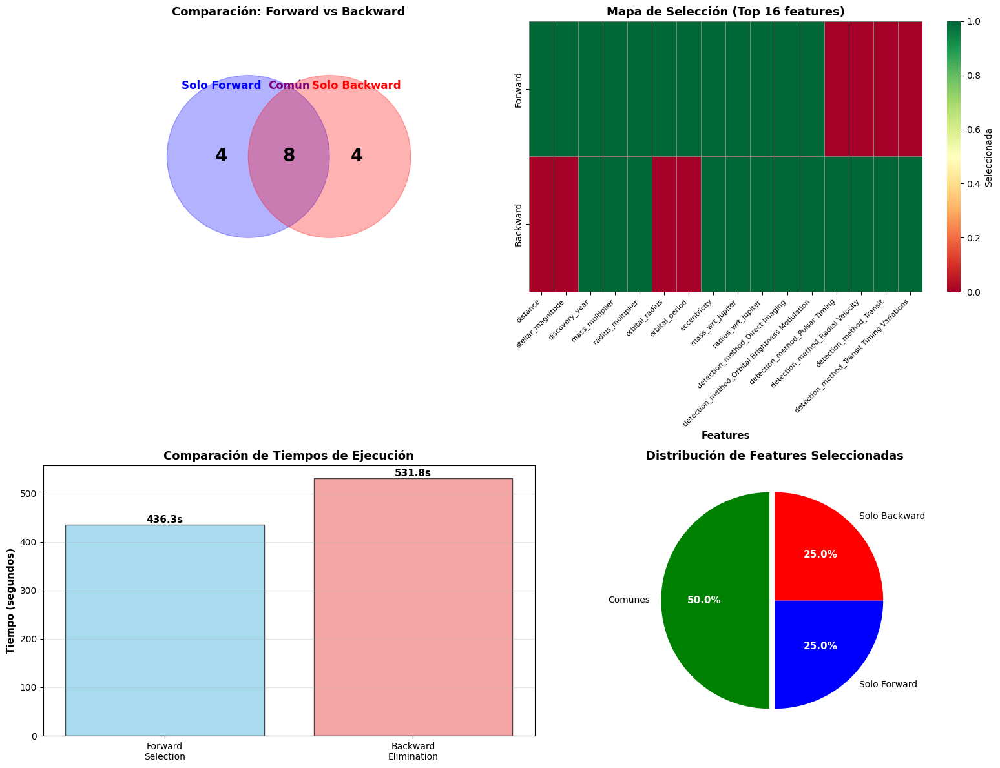

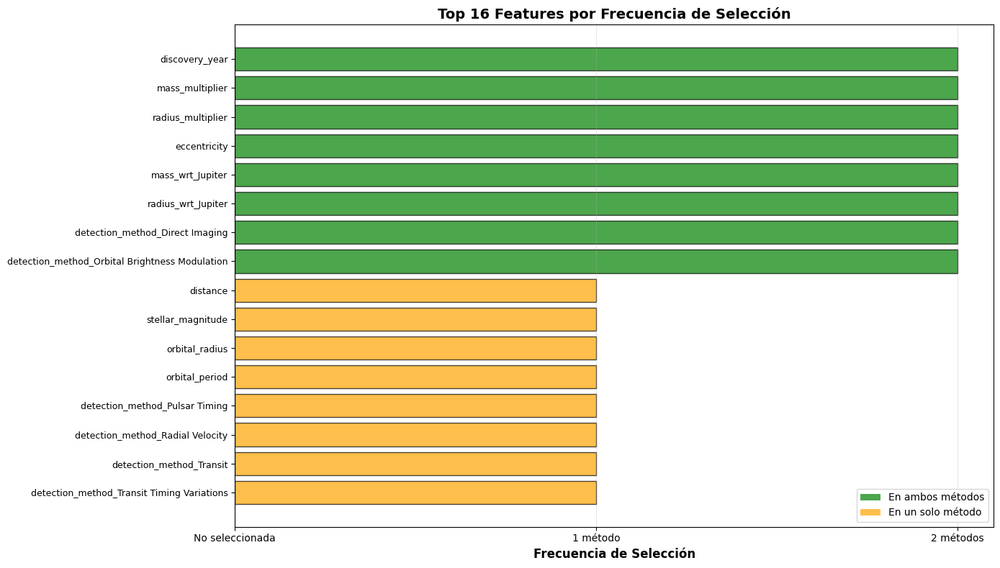


                    6. EVALUACIÓN DE RENDIMIENTO

 Evaluando rendimiento con features seleccionadas...


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and wi


 Resultados en conjunto de validación:

       Configuración  Num_Features  Accuracy  F1_Macro  Mejora_Accuracy  Mejora_F1
  Todas las features            18    0.9644    0.9682           0.0000     0.0000
   Forward Selection            12    0.9657    0.9689           0.0013     0.0007
Backward Elimination            12    0.9682    0.9739           0.0038     0.0057
    Features Comunes             8    0.9695    0.9747           0.0051     0.0064


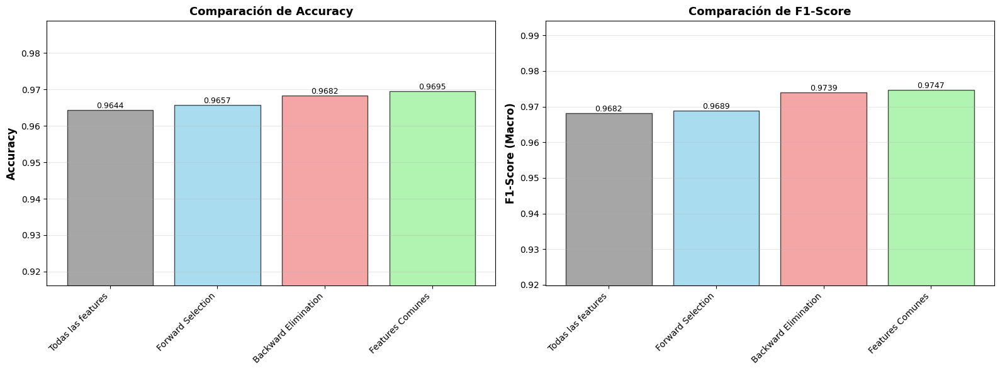


 MEJOR CONFIGURACIÓN:
   • Método: Features Comunes
   • Número de features: 8
   • Accuracy: 0.9695
   • F1-Score: 0.9747

                    7. RESULTADOS GUARDADOS

✓ Resultados guardados en variables:
   • sfs_forward: Objeto Forward Selection entrenado
   • sfs_backward: Objeto Backward Elimination entrenado
   • forward_features: Lista de features seleccionadas (Forward)
   • backward_features: Lista de features seleccionadas (Backward)
   • features_common: Set de features comunes
   • performance_df: DataFrame con métricas de rendimiento

 ANÁLISIS SFS (MÉTODO WRAPPER) COMPLETADO


In [ ]:
from sklearn.feature_selection import SequentialFeatureSelector
from sklearn.linear_model import LogisticRegression
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import time

print("="*80)
print(" "*10 + "SELECCIÓN DE FEATURES CON SFS (MÉTODO WRAPPER/ENVOLTURA)")
print("="*80)

# ============================================================================
#                     1. PREPARACIÓN DE DATOS
# ============================================================================

print("\n PASO 1: Preparando datos para SFS...")

# Usar los datos preprocesados que ya tienes
print(f"   • X_train shape: {x_train_final.shape}")
print(f"   • X_val shape: {x_val_final.shape}")
print(f"   • Total features: {x_train_final.shape[1]}")

# Reconstruir nombres de features
if 'encoded_cols' in globals() and 'num_cols' in globals():
    all_feature_names = list(num_cols) + list(encoded_cols)
else:
    all_feature_names = [f'feature_{i}' for i in range(x_train_final.shape[1])]

print(f"   • Nombres de features disponibles: {len(all_feature_names)}")

# ============================================================================
#                     2. FORWARD SELECTION
# ============================================================================

print("\n" + "="*80)
print(" "*15 + "2. FORWARD SELECTION (HACIA ADELANTE)")
print("="*80)

# Crear el estimador
if 'best_lr' in globals():
    estimator = best_lr.__class__(**best_lr.get_params())
    print("   ✓ Usando hiperparámetros del modelo optimizado")
else:
    estimator = LogisticRegression(
        max_iter=1000,
        multi_class='multinomial',
        solver='lbfgs',
        random_state=8
    )
    print("   ✓ Usando modelo LogisticRegression por defecto")

# Forward Selection para seleccionar features
# Seleccionar aproximadamente 70% de las features disponibles o máximo 20
total_features = x_train_final.shape[1]
n_features_to_select = min(max(int(total_features * 0.7), 1), 20)

# Asegurar que sea menor al total
if n_features_to_select >= total_features:
    n_features_to_select = max(total_features - 1, 1)

print(f"\n Dataset tiene {total_features} features en total")
print(f"   Seleccionando {n_features_to_select} features ({n_features_to_select/total_features*100:.1f}%)")

print(f"\n Ejecutando Forward Selection para {n_features_to_select} features...")
print("   • Estrategia: Agregar features una por una")
print("   • Validación cruzada: 5-fold")
print("   • Métrica: accuracy")

start_time = time.time()

sfs_forward = SequentialFeatureSelector(
    estimator=estimator,
    n_features_to_select=n_features_to_select,
    direction='forward',
    scoring='accuracy',
    cv=5,
    n_jobs=-1
)

sfs_forward.fit(x_train_final, y_train)

forward_time = time.time() - start_time

# Obtener resultados
forward_support = sfs_forward.get_support()
forward_features = [all_feature_names[i] for i, selected in enumerate(forward_support) if selected]

print(f"\n Forward Selection completado en {forward_time:.2f} segundos")
print(f"\n Features seleccionadas por Forward Selection:")
for i, feat in enumerate(forward_features, 1):
    print(f"   {i:2d}. {feat}")

# ============================================================================
#                     3. BACKWARD ELIMINATION
# ============================================================================

print("\n" + "="*80)
print(" "*15 + "3. BACKWARD ELIMINATION (HACIA ATRÁS)")
print("="*80)

print(f"\n Ejecutando Backward Elimination para {n_features_to_select} features...")
print("   • Estrategia: Eliminar features una por una")
print("   • Validación cruzada: 5-fold")
print("   • Métrica: accuracy")

start_time = time.time()

sfs_backward = SequentialFeatureSelector(
    estimator=estimator,
    n_features_to_select=n_features_to_select,
    direction='backward',
    scoring='accuracy',
    cv=5,
    n_jobs=-1
)

sfs_backward.fit(x_train_final, y_train)

backward_time = time.time() - start_time

# Obtener resultados
backward_support = sfs_backward.get_support()
backward_features = [all_feature_names[i] for i, selected in enumerate(backward_support) if selected]

print(f"\n Backward Elimination completado en {backward_time:.2f} segundos")
print(f"\n Features seleccionadas por Backward Elimination:")
for i, feat in enumerate(backward_features, 1):
    print(f"   {i:2d}. {feat}")

# ============================================================================
#                     4. ANÁLISIS COMPARATIVO
# ============================================================================

print("\n" + "="*80)
print(" "*20 + "4. ANÁLISIS COMPARATIVO")
print("="*80)

# Crear DataFrames con resultados
sfs_forward_results = pd.DataFrame({
    'Feature': all_feature_names,
    'Selected_Forward': forward_support,
    'Selected_Backward': backward_support
})

# Features comunes y únicas
features_common = set(forward_features) & set(backward_features)
features_only_forward = set(forward_features) - set(backward_features)
features_only_backward = set(backward_features) - set(forward_features)

print(f"\n Comparación Forward vs Backward:")
print(f"   • Features comunes a ambos métodos:     {len(features_common)}")
print(f"   • Features solo en Forward:             {len(features_only_forward)}")
print(f"   • Features solo en Backward:            {len(features_only_backward)}")
print(f"   • Concordancia:                         {len(features_common)/n_features_to_select*100:.1f}%")

if len(features_common) > 0:
    print(f"\n Features COMUNES a ambos métodos:")
    for i, feat in enumerate(sorted(features_common), 1):
        print(f"   {i:2d}. {feat}")

if len(features_only_forward) > 0:
    print(f"\n Features SOLO en Forward Selection:")
    for i, feat in enumerate(sorted(features_only_forward), 1):
        print(f"   {i:2d}. {feat}")

if len(features_only_backward) > 0:
    print(f"\n Features SOLO en Backward Elimination:")
    for i, feat in enumerate(sorted(features_only_backward), 1):
        print(f"   {i:2d}. {feat}")

print(f"\n Comparación de tiempos:")
print(f"   • Forward Selection:      {forward_time:.2f} segundos")
print(f"   • Backward Elimination:   {backward_time:.2f} segundos")
print(f"   • Diferencia:             {abs(forward_time - backward_time):.2f} segundos")

# ============================================================================
#                     5. VISUALIZACIONES
# ============================================================================

print("\n" + "="*80)
print(" "*20 + "5. VISUALIZACIONES")
print("="*80)

# --- Gráfico 1: Diagrama de Venn ---
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# Panel 1: Diagrama de Venn simulado
ax = axes[0, 0]

# Dibujar círculos
circle1 = plt.Circle((0.35, 0.5), 0.3, color='blue', alpha=0.3, label='Forward')
circle2 = plt.Circle((0.65, 0.5), 0.3, color='red', alpha=0.3, label='Backward')
ax.add_patch(circle1)
ax.add_patch(circle2)

# Añadir textos
ax.text(0.25, 0.5, f'{len(features_only_forward)}', fontsize=20, ha='center', va='center', fontweight='bold')
ax.text(0.5, 0.5, f'{len(features_common)}', fontsize=20, ha='center', va='center', fontweight='bold')
ax.text(0.75, 0.5, f'{len(features_only_backward)}', fontsize=20, ha='center', va='center', fontweight='bold')

ax.text(0.25, 0.75, 'Solo Forward', fontsize=12, ha='center', fontweight='bold', color='blue')
ax.text(0.5, 0.75, 'Común', fontsize=12, ha='center', fontweight='bold', color='purple')
ax.text(0.75, 0.75, 'Solo Backward', fontsize=12, ha='center', fontweight='bold', color='red')

ax.set_xlim(0, 1)
ax.set_ylim(0, 1)
ax.set_aspect('equal')
ax.axis('off')
ax.set_title('Comparación: Forward vs Backward', fontsize=13, fontweight='bold')

# Panel 2: Heatmap de selección
selection_matrix = np.column_stack([forward_support, backward_support])
top_n_viz = min(30, len(all_feature_names))
top_indices = np.where(forward_support | backward_support)[0][:top_n_viz]

if len(top_indices) > 0:
    selection_subset = selection_matrix[top_indices]
    feature_names_subset = [all_feature_names[i] for i in top_indices]

    sns.heatmap(selection_subset.T,
                xticklabels=feature_names_subset,
                yticklabels=['Forward', 'Backward'],
                cmap='RdYlGn',
                cbar_kws={'label': 'Seleccionada'},
                ax=axes[0, 1],
                linewidths=0.5,
                linecolor='gray')
    axes[0, 1].set_title(f'Mapa de Selección (Top {len(top_indices)} features)',
                        fontsize=13, fontweight='bold')
    axes[0, 1].set_xlabel('Features', fontsize=11, fontweight='bold')
    plt.setp(axes[0, 1].get_xticklabels(), rotation=45, ha='right', fontsize=8)

# Panel 3: Comparación de tiempos
methods = ['Forward\nSelection', 'Backward\nElimination']
times = [forward_time, backward_time]
colors_time = ['skyblue', 'lightcoral']

bars = axes[1, 0].bar(methods, times, color=colors_time, alpha=0.7, edgecolor='black')
axes[1, 0].set_ylabel('Tiempo (segundos)', fontsize=11, fontweight='bold')
axes[1, 0].set_title('Comparación de Tiempos de Ejecución', fontsize=13, fontweight='bold')
axes[1, 0].grid(axis='y', alpha=0.3)

# Añadir valores
for bar in bars:
    height = bar.get_height()
    axes[1, 0].text(bar.get_x() + bar.get_width()/2., height,
                   f'{height:.1f}s', ha='center', va='bottom', fontsize=11, fontweight='bold')

# Panel 4: Concordancia
categories = ['Comunes', 'Solo Forward', 'Solo Backward']
values = [len(features_common), len(features_only_forward), len(features_only_backward)]
colors_pie = ['green', 'blue', 'red']

wedges, texts, autotexts = axes[1, 1].pie(values,
                                          labels=categories,
                                          colors=colors_pie,
                                          autopct='%1.1f%%',
                                          startangle=90,
                                          explode=(0.05, 0, 0))

for autotext in autotexts:
    autotext.set_color('white')
    autotext.set_fontweight('bold')
    autotext.set_fontsize(11)

axes[1, 1].set_title('Distribución de Features Seleccionadas', fontsize=13, fontweight='bold')

plt.tight_layout()
plt.show()

# --- Gráfico 2: Ranking de features por frecuencia ---
fig, ax = plt.subplots(figsize=(14, 8))

# Contar en cuántos métodos aparece cada feature
feature_counts = {}
for feat in forward_features:
    feature_counts[feat] = feature_counts.get(feat, 0) + 1
for feat in backward_features:
    feature_counts[feat] = feature_counts.get(feat, 0) + 1

# Ordenar por frecuencia
sorted_features = sorted(feature_counts.items(), key=lambda x: x[1], reverse=True)
features_sorted = [f[0] for f in sorted_features]
counts_sorted = [f[1] for f in sorted_features]

# Limitar a top 30
top_n_display = min(30, len(features_sorted))
features_display = features_sorted[:top_n_display]
counts_display = counts_sorted[:top_n_display]

# Colores según frecuencia
colors_bar = ['green' if c == 2 else 'orange' for c in counts_display]

ax.barh(range(len(features_display)), counts_display, color=colors_bar, alpha=0.7, edgecolor='black')
ax.set_yticks(range(len(features_display)))
ax.set_yticklabels(features_display, fontsize=9)
ax.set_xlabel('Frecuencia de Selección', fontsize=12, fontweight='bold')
ax.set_title(f'Top {len(features_display)} Features por Frecuencia de Selección',
            fontsize=14, fontweight='bold')
ax.invert_yaxis()
ax.set_xticks([0, 1, 2])
ax.set_xticklabels(['No seleccionada', '1 método', '2 métodos'])
ax.grid(axis='x', alpha=0.3)

# Leyenda
from matplotlib.patches import Patch
legend_elements = [
    Patch(facecolor='green', alpha=0.7, label='En ambos métodos'),
    Patch(facecolor='orange', alpha=0.7, label='En un solo método')
]
ax.legend(handles=legend_elements, loc='lower right', fontsize=10)

plt.tight_layout()
plt.show()

# ============================================================================
#                     6. EVALUACIÓN DE RENDIMIENTO
# ============================================================================

print("\n" + "="*80)
print(" "*20 + "6. EVALUACIÓN DE RENDIMIENTO")
print("="*80)

# Evaluar modelos con features seleccionadas
from sklearn.metrics import accuracy_score, f1_score

print("\n Evaluando rendimiento con features seleccionadas...")

# Modelo con Forward Selection
X_train_forward = x_train_final[:, forward_support]
X_val_forward = x_val_final[:, forward_support]

model_forward = estimator.__class__(**estimator.get_params())
model_forward.fit(X_train_forward, y_train)
y_pred_forward = model_forward.predict(X_val_forward)

acc_forward = accuracy_score(y_val, y_pred_forward)
f1_forward = f1_score(y_val, y_pred_forward, average='macro')

# Modelo con Backward Elimination
X_train_backward = x_train_final[:, backward_support]
X_val_backward = x_val_final[:, backward_support]

model_backward = estimator.__class__(**estimator.get_params())
model_backward.fit(X_train_backward, y_train)
y_pred_backward = model_backward.predict(X_val_backward)

acc_backward = accuracy_score(y_val, y_pred_backward)
f1_backward = f1_score(y_val, y_pred_backward, average='macro')

# Modelo con features comunes
if len(features_common) > 0:
    common_indices = [i for i, name in enumerate(all_feature_names) if name in features_common]
    X_train_common = x_train_final[:, common_indices]
    X_val_common = x_val_final[:, common_indices]

    model_common = estimator.__class__(**estimator.get_params())
    model_common.fit(X_train_common, y_train)
    y_pred_common = model_common.predict(X_val_common)

    acc_common = accuracy_score(y_val, y_pred_common)
    f1_common = f1_score(y_val, y_pred_common, average='macro')
else:
    acc_common = 0
    f1_common = 0

# Modelo con todas las features (baseline)
model_all = estimator.__class__(**estimator.get_params())
model_all.fit(x_train_final, y_train)
y_pred_all = model_all.predict(x_val_final)

acc_all = accuracy_score(y_val, y_pred_all)
f1_all = f1_score(y_val, y_pred_all, average='macro')

print("\n Resultados en conjunto de validación:")

performance_df = pd.DataFrame({
    'Configuración': [
        'Todas las features',
        'Forward Selection',
        'Backward Elimination',
        'Features Comunes'
    ],
    'Num_Features': [
        x_train_final.shape[1],
        n_features_to_select,
        n_features_to_select,
        len(features_common)
    ],
    'Accuracy': [acc_all, acc_forward, acc_backward, acc_common],
    'F1_Macro': [f1_all, f1_forward, f1_backward, f1_common]
})

performance_df['Mejora_Accuracy'] = performance_df['Accuracy'] - acc_all
performance_df['Mejora_F1'] = performance_df['F1_Macro'] - f1_all

print("\n" + performance_df.to_string(index=False, float_format='%.4f'))

# Visualización de rendimiento
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Panel izquierdo: Accuracy
x_pos = range(len(performance_df))
bars1 = axes[0].bar(x_pos, performance_df['Accuracy'],
                   color=['gray', 'skyblue', 'lightcoral', 'lightgreen'],
                   alpha=0.7, edgecolor='black')

axes[0].set_xticks(x_pos)
axes[0].set_xticklabels(performance_df['Configuración'], rotation=45, ha='right')
axes[0].set_ylabel('Accuracy', fontsize=12, fontweight='bold')
axes[0].set_title('Comparación de Accuracy', fontsize=13, fontweight='bold')
axes[0].set_ylim([min(performance_df['Accuracy']) * 0.95, max(performance_df['Accuracy']) * 1.02])
axes[0].grid(axis='y', alpha=0.3)

# Añadir valores
for bar in bars1:
    height = bar.get_height()
    axes[0].text(bar.get_x() + bar.get_width()/2., height,
                f'{height:.4f}', ha='center', va='bottom', fontsize=9)

# Panel derecho: F1-Score
bars2 = axes[1].bar(x_pos, performance_df['F1_Macro'],
                   color=['gray', 'skyblue', 'lightcoral', 'lightgreen'],
                   alpha=0.7, edgecolor='black')

axes[1].set_xticks(x_pos)
axes[1].set_xticklabels(performance_df['Configuración'], rotation=45, ha='right')
axes[1].set_ylabel('F1-Score (Macro)', fontsize=12, fontweight='bold')
axes[1].set_title('Comparación de F1-Score', fontsize=13, fontweight='bold')
axes[1].set_ylim([min(performance_df['F1_Macro']) * 0.95, max(performance_df['F1_Macro']) * 1.02])
axes[1].grid(axis='y', alpha=0.3)

# Añadir valores
for bar in bars2:
    height = bar.get_height()
    axes[1].text(bar.get_x() + bar.get_width()/2., height,
                f'{height:.4f}', ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()

# Determinar mejor configuración
best_idx = performance_df['Accuracy'].idxmax()
best_config = performance_df.iloc[best_idx]

print(f"\n MEJOR CONFIGURACIÓN:")
print(f"   • Método: {best_config['Configuración']}")
print(f"   • Número de features: {int(best_config['Num_Features'])}")
print(f"   • Accuracy: {best_config['Accuracy']:.4f}")
print(f"   • F1-Score: {best_config['F1_Macro']:.4f}")

# ============================================================================
#                     7. GUARDAR RESULTADOS
# ============================================================================

print("\n" + "="*80)
print(" "*20 + "7. RESULTADOS GUARDADOS")
print("="*80)

print("\n✓ Resultados guardados en variables:")
print("   • sfs_forward: Objeto Forward Selection entrenado")
print("   • sfs_backward: Objeto Backward Elimination entrenado")
print("   • forward_features: Lista de features seleccionadas (Forward)")
print("   • backward_features: Lista de features seleccionadas (Backward)")
print("   • features_common: Set de features comunes")
print("   • performance_df: DataFrame con métricas de rendimiento")

print("\n" + "="*80)
print(" ANÁLISIS SFS (MÉTODO WRAPPER) COMPLETADO")
print("="*80)

               EVALUACIÓN COMPLETA - MODELOS CON SFS (WRAPPER)

 PASO 1: Entrenando modelos con features seleccionadas...

✓ Datasets transformados:
   • Forward:  (3675, 12) (12 features)
   • Backward: (3675, 12) (12 features)
   • Comunes:  8 features
   • Original: (3675, 18)

 Entrenando modelos...


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and wi

✓ Modelos entrenados exitosamente

                              2. MÉTRICAS EN TEST

 FORWARD SELECTION:
   • Features: 12
   • Accuracy:   0.9645 (96.45%)
   • Precision:  0.9645
   • Recall:     0.9536
   • F1-Score:   0.9588

 BACKWARD ELIMINATION:
   • Features: 12
   • Accuracy:   0.9632 (96.32%)
   • Precision:  0.9637
   • Recall:     0.9528
   • F1-Score:   0.9580

 FEATURES COMUNES:
   • Features: 8
   • Accuracy:   0.9632 (96.32%)
   • Precision:  0.9637
   • Recall:     0.9528
   • F1-Score:   0.9580

 BASELINE (TODAS LAS FEATURES):
   • Features: 18
   • Accuracy:   0.9619 (96.19%)
   • Precision:  0.9630
   • Recall:     0.9520
   • F1-Score:   0.9572

 TABLA COMPARATIVA (TEST):
          Modelo  Num_Features  Accuracy  Precision  Recall  F1-Score  Reducción_%
Baseline (Todas)            18    0.9619     0.9630  0.9520    0.9572       0.0000
         Forward            12    0.9645     0.9645  0.9536    0.9588      33.3333
        Backward            12    0.9632     0.96

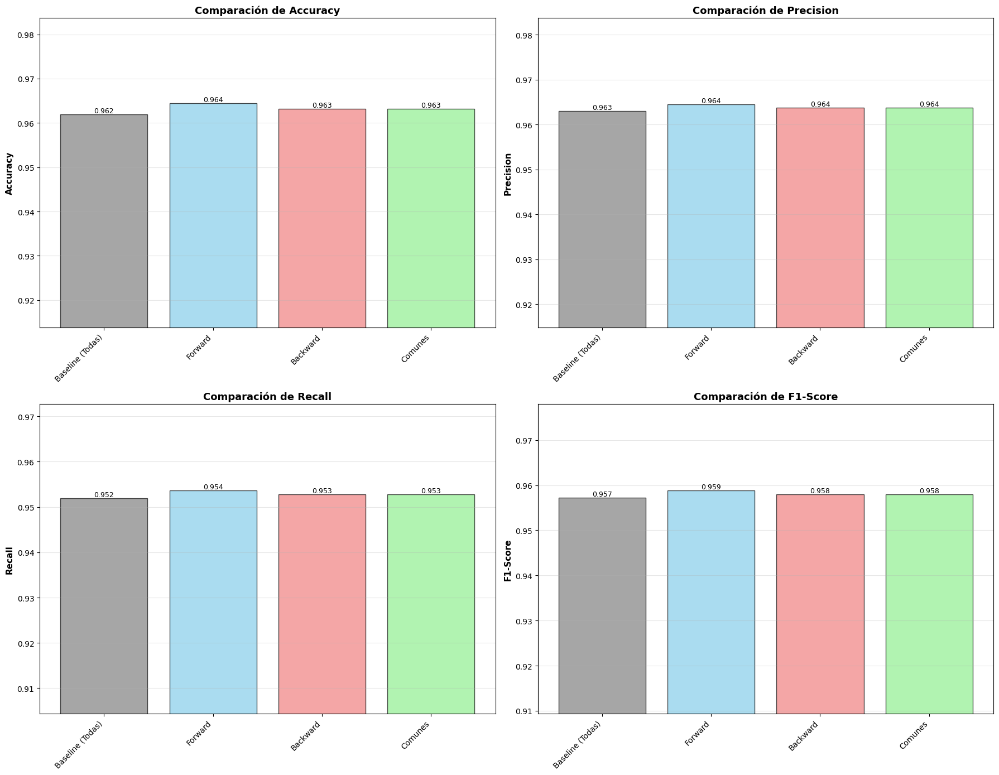


                         3. MATRICES DE CONFUSIÓN


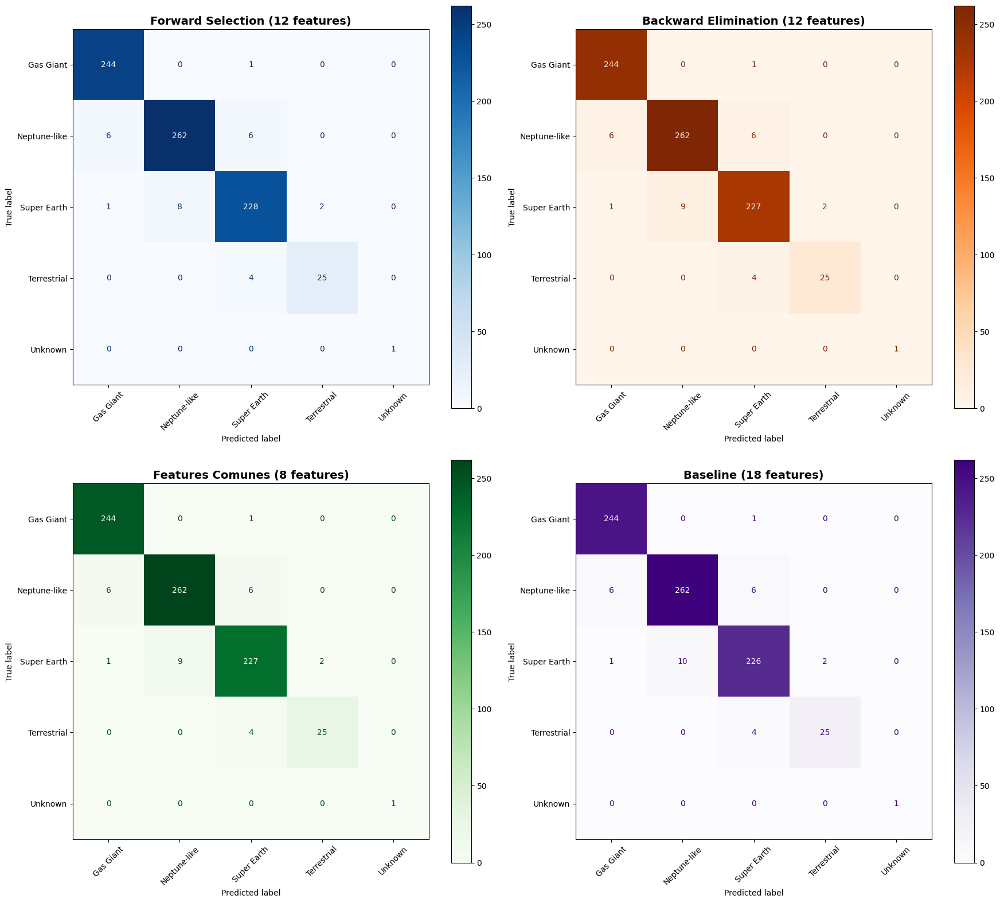


✓ Matrices de confusión generadas

 REPORTE DE CLASIFICACIÓN - FORWARD:
              precision    recall  f1-score   support

   Gas Giant     0.9721    0.9959    0.9839       245
Neptune-like     0.9704    0.9562    0.9632       274
 Super Earth     0.9540    0.9540    0.9540       239
 Terrestrial     0.9259    0.8621    0.8929        29
     Unknown     1.0000    1.0000    1.0000         1

    accuracy                         0.9645       788
   macro avg     0.9645    0.9536    0.9588       788
weighted avg     0.9643    0.9645    0.9643       788


 REPORTE DE CLASIFICACIÓN - BACKWARD:
              precision    recall  f1-score   support

   Gas Giant     0.9721    0.9959    0.9839       245
Neptune-like     0.9668    0.9562    0.9615       274
 Super Earth     0.9538    0.9498    0.9518       239
 Terrestrial     0.9259    0.8621    0.8929        29
     Unknown     1.0000    1.0000    1.0000         1

    accuracy                         0.9632       788
   macro avg     0.

/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(


✓ Curvas calculadas


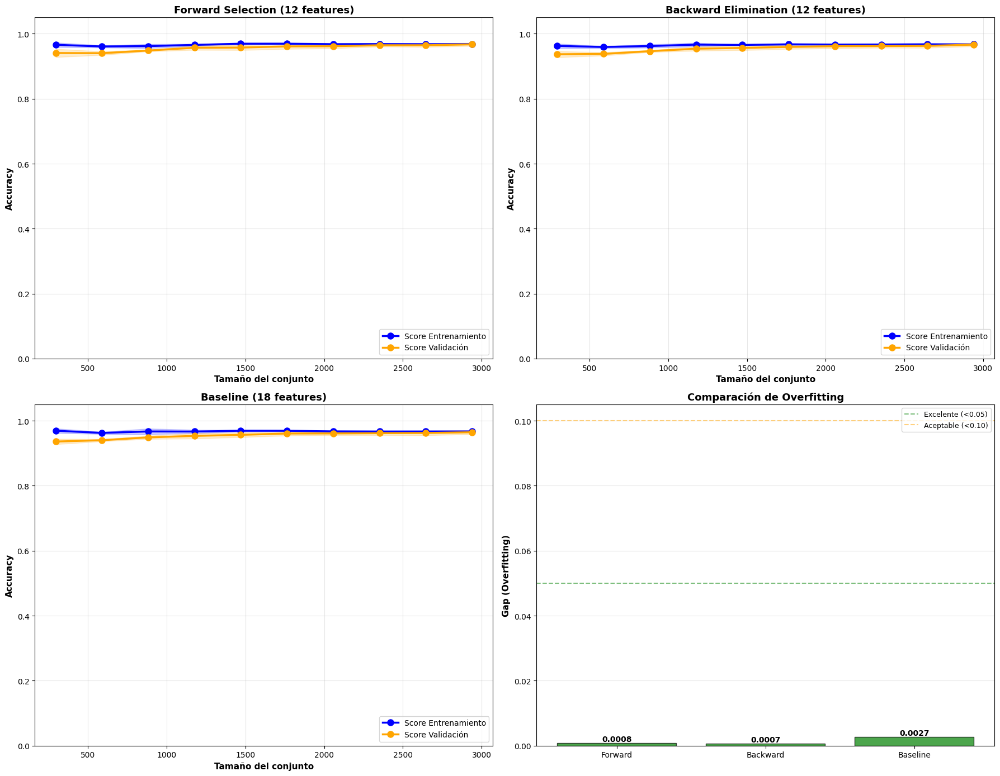


 ANÁLISIS DE OVERFITTING:
   • Forward:  Gap = 0.0008
   • Backward: Gap = 0.0007
   • Baseline: Gap = 0.0027

 Menor overfitting: Backward

                              5. CURVAS ROC

✓ Calculando curvas ROC para 5 clases...

 AUC SCORES (Macro-average):
   • Forward:  0.9974
   • Backward: 0.9972
   • Comunes:  0.9973
   • Baseline: 0.9973


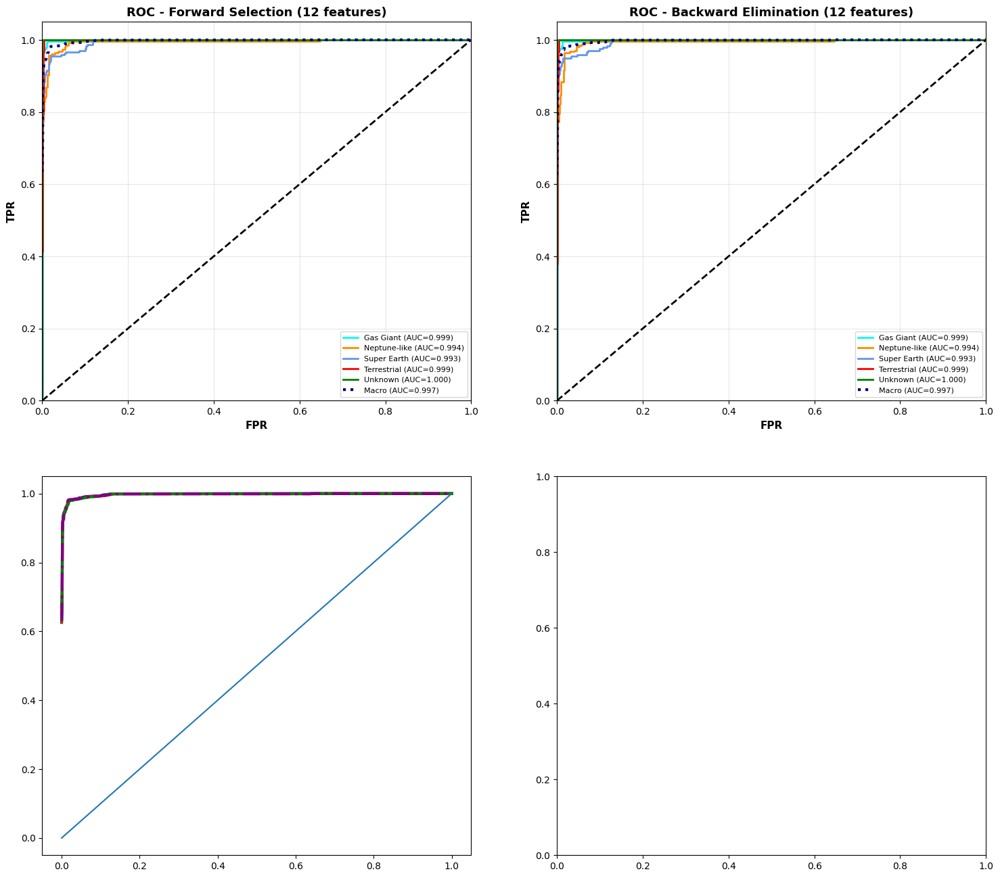

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    classification_report, confusion_matrix, ConfusionMatrixDisplay,
    roc_curve, auc, roc_auc_score
)
from sklearn.model_selection import learning_curve
from sklearn.preprocessing import label_binarize
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import cycle

print("="*90)
print(" "*15 + "EVALUACIÓN COMPLETA - MODELOS CON SFS (WRAPPER)")
print("="*90)

# ============================================================================
#                     1. ENTRENAR MODELOS CON FEATURES SELECCIONADAS
# ============================================================================

print("\n PASO 1: Entrenando modelos con features seleccionadas...")

# Forward Selection
X_train_forward = x_train_final[:, forward_support]
X_val_forward = x_val_final[:, forward_support]
X_test_forward = x_test_final[:, forward_support]

# Backward Elimination
X_train_backward = x_train_final[:, backward_support]
X_val_backward = x_val_final[:, backward_support]
X_test_backward = x_test_final[:, backward_support]

# Features comunes
if len(features_common) > 0:
    common_indices = [i for i, name in enumerate(all_feature_names) if name in features_common]
    X_train_common = x_train_final[:, common_indices]
    X_val_common = x_val_final[:, common_indices]
    X_test_common = x_test_final[:, common_indices]
else:
    common_indices = []

print(f"\n✓ Datasets transformados:")
print(f"   • Forward:  {X_train_forward.shape} ({len(forward_features)} features)")
print(f"   • Backward: {X_train_backward.shape} ({len(backward_features)} features)")
print(f"   • Comunes:  {len(common_indices)} features")
print(f"   • Original: {x_train_final.shape}")

# Crear estimador
if 'best_lr' in globals():
    estimator_params = best_lr.get_params()
else:
    estimator_params = {
        'max_iter': 1000,
        'multi_class': 'multinomial',
        'solver': 'lbfgs',
        'random_state': 8
    }

# Entrenar modelos
print("\n Entrenando modelos...")

# Forward
model_forward_final = LogisticRegression(**estimator_params)
model_forward_final.fit(X_train_forward, y_train)

# Backward
model_backward_final = LogisticRegression(**estimator_params)
model_backward_final.fit(X_train_backward, y_train)

# Comunes
if len(common_indices) > 0:
    model_common_final = LogisticRegression(**estimator_params)
    model_common_final.fit(X_train_common, y_train)
else:
    model_common_final = None

# Baseline (todas las features)
model_baseline = LogisticRegression(**estimator_params)
model_baseline.fit(x_train_final, y_train)

print("✓ Modelos entrenados exitosamente")

# ============================================================================
#                     2. MÉTRICAS EN TEST
# ============================================================================

print("\n" + "="*90)
print(" "*30 + "2. MÉTRICAS EN TEST")
print("="*90)

# Predicciones - Forward
y_pred_test_forward = model_forward_final.predict(X_test_forward)
y_proba_test_forward = model_forward_final.predict_proba(X_test_forward)

acc_forward = accuracy_score(y_test, y_pred_test_forward)
prec_forward = precision_score(y_test, y_pred_test_forward, average='macro', zero_division=0)
rec_forward = recall_score(y_test, y_pred_test_forward, average='macro', zero_division=0)
f1_forward = f1_score(y_test, y_pred_test_forward, average='macro', zero_division=0)

print("\n FORWARD SELECTION:")
print(f"   • Features: {len(forward_features)}")
print(f"   • Accuracy:   {acc_forward:.4f} ({acc_forward*100:.2f}%)")
print(f"   • Precision:  {prec_forward:.4f}")
print(f"   • Recall:     {rec_forward:.4f}")
print(f"   • F1-Score:   {f1_forward:.4f}")

# Predicciones - Backward
y_pred_test_backward = model_backward_final.predict(X_test_backward)
y_proba_test_backward = model_backward_final.predict_proba(X_test_backward)

acc_backward = accuracy_score(y_test, y_pred_test_backward)
prec_backward = precision_score(y_test, y_pred_test_backward, average='macro', zero_division=0)
rec_backward = recall_score(y_test, y_pred_test_backward, average='macro', zero_division=0)
f1_backward = f1_score(y_test, y_pred_test_backward, average='macro', zero_division=0)

print("\n BACKWARD ELIMINATION:")
print(f"   • Features: {len(backward_features)}")
print(f"   • Accuracy:   {acc_backward:.4f} ({acc_backward*100:.2f}%)")
print(f"   • Precision:  {prec_backward:.4f}")
print(f"   • Recall:     {rec_backward:.4f}")
print(f"   • F1-Score:   {f1_backward:.4f}")

# Predicciones - Comunes
if model_common_final is not None:
    y_pred_test_common = model_common_final.predict(X_test_common)
    y_proba_test_common = model_common_final.predict_proba(X_test_common)

    acc_common = accuracy_score(y_test, y_pred_test_common)
    prec_common = precision_score(y_test, y_pred_test_common, average='macro', zero_division=0)
    rec_common = recall_score(y_test, y_pred_test_common, average='macro', zero_division=0)
    f1_common = f1_score(y_test, y_pred_test_common, average='macro', zero_division=0)

    print("\n FEATURES COMUNES:")
    print(f"   • Features: {len(common_indices)}")
    print(f"   • Accuracy:   {acc_common:.4f} ({acc_common*100:.2f}%)")
    print(f"   • Precision:  {prec_common:.4f}")
    print(f"   • Recall:     {rec_common:.4f}")
    print(f"   • F1-Score:   {f1_common:.4f}")
else:
    acc_common = prec_common = rec_common = f1_common = 0

# Predicciones - Baseline
y_pred_test_baseline = model_baseline.predict(x_test_final)
y_proba_test_baseline = model_baseline.predict_proba(x_test_final)

acc_baseline = accuracy_score(y_test, y_pred_test_baseline)
prec_baseline = precision_score(y_test, y_pred_test_baseline, average='macro', zero_division=0)
rec_baseline = recall_score(y_test, y_pred_test_baseline, average='macro', zero_division=0)
f1_baseline = f1_score(y_test, y_pred_test_baseline, average='macro', zero_division=0)

print("\n BASELINE (TODAS LAS FEATURES):")
print(f"   • Features: {x_train_final.shape[1]}")
print(f"   • Accuracy:   {acc_baseline:.4f} ({acc_baseline*100:.2f}%)")
print(f"   • Precision:  {prec_baseline:.4f}")
print(f"   • Recall:     {rec_baseline:.4f}")
print(f"   • F1-Score:   {f1_baseline:.4f}")

# Tabla comparativa
comparison_metrics = pd.DataFrame({
    'Modelo': ['Baseline (Todas)', 'Forward', 'Backward', 'Comunes'],
    'Num_Features': [x_train_final.shape[1], len(forward_features),
                     len(backward_features), len(common_indices)],
    'Accuracy': [acc_baseline, acc_forward, acc_backward, acc_common],
    'Precision': [prec_baseline, prec_forward, prec_backward, prec_common],
    'Recall': [rec_baseline, rec_forward, rec_backward, rec_common],
    'F1-Score': [f1_baseline, f1_forward, f1_backward, f1_common]
})

comparison_metrics['Reducción_%'] = (
    (comparison_metrics['Num_Features'].iloc[0] - comparison_metrics['Num_Features']) /
    comparison_metrics['Num_Features'].iloc[0] * 100
)

print("\n TABLA COMPARATIVA (TEST):")
print(comparison_metrics.to_string(index=False, float_format='%.4f'))

# Visualización de métricas
fig, axes = plt.subplots(2, 2, figsize=(18, 14))

metrics_to_plot = ['Accuracy', 'Precision', 'Recall', 'F1-Score']
colors_bars = ['gray', 'skyblue', 'lightcoral', 'lightgreen']

for idx, metric in enumerate(metrics_to_plot):
    ax = axes[idx // 2, idx % 2]

    bars = ax.bar(range(len(comparison_metrics)), comparison_metrics[metric],
                  color=colors_bars, alpha=0.7, edgecolor='black')

    ax.set_xticks(range(len(comparison_metrics)))
    ax.set_xticklabels(comparison_metrics['Modelo'], rotation=45, ha='right')
    ax.set_ylabel(metric, fontsize=11, fontweight='bold')
    ax.set_title(f'Comparación de {metric}', fontsize=13, fontweight='bold')
    ax.set_ylim([comparison_metrics[metric].min() * 0.95,
                 comparison_metrics[metric].max() * 1.02])
    ax.grid(axis='y', alpha=0.3)

    # Añadir valores
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height,
               f'{height:.3f}', ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()

# ============================================================================
#                     3. MATRICES DE CONFUSIÓN
# ============================================================================

print("\n" + "="*90)
print(" "*25 + "3. MATRICES DE CONFUSIÓN")
print("="*90)

fig, axes = plt.subplots(2, 2, figsize=(18, 16))

# Forward Selection
cm_forward = confusion_matrix(y_test, y_pred_test_forward)
disp_forward = ConfusionMatrixDisplay(confusion_matrix=cm_forward,
                                      display_labels=model_forward_final.classes_)
disp_forward.plot(cmap='Blues', ax=axes[0, 0], xticks_rotation=45, values_format='d')
axes[0, 0].set_title(f'Forward Selection ({len(forward_features)} features)',
                     fontsize=14, fontweight='bold')
axes[0, 0].grid(False)

# Backward Elimination
cm_backward = confusion_matrix(y_test, y_pred_test_backward)
disp_backward = ConfusionMatrixDisplay(confusion_matrix=cm_backward,
                                       display_labels=model_backward_final.classes_)
disp_backward.plot(cmap='Oranges', ax=axes[0, 1], xticks_rotation=45, values_format='d')
axes[0, 1].set_title(f'Backward Elimination ({len(backward_features)} features)',
                     fontsize=14, fontweight='bold')
axes[0, 1].grid(False)

# Features Comunes
if model_common_final is not None:
    cm_common = confusion_matrix(y_test, y_pred_test_common)
    disp_common = ConfusionMatrixDisplay(confusion_matrix=cm_common,
                                        display_labels=model_common_final.classes_)
    disp_common.plot(cmap='Greens', ax=axes[1, 0], xticks_rotation=45, values_format='d')
    axes[1, 0].set_title(f'Features Comunes ({len(common_indices)} features)',
                        fontsize=14, fontweight='bold')
    axes[1, 0].grid(False)
else:
    axes[1, 0].text(0.5, 0.5, 'No hay features comunes',
                   ha='center', va='center', fontsize=14)
    axes[1, 0].axis('off')

# Baseline
cm_baseline = confusion_matrix(y_test, y_pred_test_baseline)
disp_baseline = ConfusionMatrixDisplay(confusion_matrix=cm_baseline,
                                       display_labels=model_baseline.classes_)
disp_baseline.plot(cmap='Purples', ax=axes[1, 1], xticks_rotation=45, values_format='d')
axes[1, 1].set_title(f'Baseline ({x_train_final.shape[1]} features)',
                    fontsize=14, fontweight='bold')
axes[1, 1].grid(False)

plt.tight_layout()
plt.show()

print("\n✓ Matrices de confusión generadas")

# Reportes de clasificación
print("\n REPORTE DE CLASIFICACIÓN - FORWARD:")
print(classification_report(y_test, y_pred_test_forward, digits=4))

print("\n REPORTE DE CLASIFICACIÓN - BACKWARD:")
print(classification_report(y_test, y_pred_test_backward, digits=4))

# ============================================================================
#                     4. CURVAS DE APRENDIZAJE
# ============================================================================

print("\n" + "="*90)
print(" "*25 + "4. CURVAS DE APRENDIZAJE")
print("="*90)

print("\n Generando curvas de aprendizaje (esto puede tomar tiempo)...")

train_sizes = np.linspace(0.1, 1.0, 10)

# Forward
train_sizes_f, train_scores_f, val_scores_f = learning_curve(
    model_forward_final, X_train_forward, y_train,
    cv=5, n_jobs=-1, train_sizes=train_sizes,
    scoring='accuracy', random_state=8
)

# Backward
train_sizes_b, train_scores_b, val_scores_b = learning_curve(
    model_backward_final, X_train_backward, y_train,
    cv=5, n_jobs=-1, train_sizes=train_sizes,
    scoring='accuracy', random_state=8
)

# Baseline
train_sizes_base, train_scores_base, val_scores_base = learning_curve(
    model_baseline, x_train_final, y_train,
    cv=5, n_jobs=-1, train_sizes=train_sizes,
    scoring='accuracy', random_state=8
)

print("✓ Curvas calculadas")

# Calcular estadísticas
train_mean_f = np.mean(train_scores_f, axis=1)
train_std_f = np.std(train_scores_f, axis=1)
val_mean_f = np.mean(val_scores_f, axis=1)
val_std_f = np.std(val_scores_f, axis=1)

train_mean_b = np.mean(train_scores_b, axis=1)
train_std_b = np.std(train_scores_b, axis=1)
val_mean_b = np.mean(val_scores_b, axis=1)
val_std_b = np.std(val_scores_b, axis=1)

train_mean_base = np.mean(train_scores_base, axis=1)
train_std_base = np.std(train_scores_base, axis=1)
val_mean_base = np.mean(val_scores_base, axis=1)
val_std_base = np.std(val_scores_base, axis=1)

# Visualización
fig, axes = plt.subplots(2, 2, figsize=(18, 14))

# Forward Selection
axes[0, 0].plot(train_sizes_f, train_mean_f, 'o-', linewidth=2.5,
               markersize=8, color='blue', label='Score Entrenamiento')
axes[0, 0].fill_between(train_sizes_f, train_mean_f - train_std_f,
                        train_mean_f + train_std_f, alpha=0.2, color='blue')
axes[0, 0].plot(train_sizes_f, val_mean_f, 'o-', linewidth=2.5,
               markersize=8, color='orange', label='Score Validación')
axes[0, 0].fill_between(train_sizes_f, val_mean_f - val_std_f,
                        val_mean_f + val_std_f, alpha=0.2, color='orange')
axes[0, 0].set_xlabel('Tamaño del conjunto', fontsize=11, fontweight='bold')
axes[0, 0].set_ylabel('Accuracy', fontsize=11, fontweight='bold')
axes[0, 0].set_title(f'Forward Selection ({len(forward_features)} features)',
                    fontsize=13, fontweight='bold')
axes[0, 0].legend(loc='lower right', fontsize=10)
axes[0, 0].grid(True, alpha=0.3)
axes[0, 0].set_ylim([0, 1.05])

# Backward Elimination
axes[0, 1].plot(train_sizes_b, train_mean_b, 'o-', linewidth=2.5,
               markersize=8, color='blue', label='Score Entrenamiento')
axes[0, 1].fill_between(train_sizes_b, train_mean_b - train_std_b,
                        train_mean_b + train_std_b, alpha=0.2, color='blue')
axes[0, 1].plot(train_sizes_b, val_mean_b, 'o-', linewidth=2.5,
               markersize=8, color='orange', label='Score Validación')
axes[0, 1].fill_between(train_sizes_b, val_mean_b - val_std_b,
                        val_mean_b + val_std_b, alpha=0.2, color='orange')
axes[0, 1].set_xlabel('Tamaño del conjunto', fontsize=11, fontweight='bold')
axes[0, 1].set_ylabel('Accuracy', fontsize=11, fontweight='bold')
axes[0, 1].set_title(f'Backward Elimination ({len(backward_features)} features)',
                    fontsize=13, fontweight='bold')
axes[0, 1].legend(loc='lower right', fontsize=10)
axes[0, 1].grid(True, alpha=0.3)
axes[0, 1].set_ylim([0, 1.05])

# Baseline
axes[1, 0].plot(train_sizes_base, train_mean_base, 'o-', linewidth=2.5,
               markersize=8, color='blue', label='Score Entrenamiento')
axes[1, 0].fill_between(train_sizes_base, train_mean_base - train_std_base,
                        train_mean_base + train_std_base, alpha=0.2, color='blue')
axes[1, 0].plot(train_sizes_base, val_mean_base, 'o-', linewidth=2.5,
               markersize=8, color='orange', label='Score Validación')
axes[1, 0].fill_between(train_sizes_base, val_mean_base - val_std_base,
                        val_mean_base + val_std_base, alpha=0.2, color='orange')
axes[1, 0].set_xlabel('Tamaño del conjunto', fontsize=11, fontweight='bold')
axes[1, 0].set_ylabel('Accuracy', fontsize=11, fontweight='bold')
axes[1, 0].set_title(f'Baseline ({x_train_final.shape[1]} features)',
                    fontsize=13, fontweight='bold')
axes[1, 0].legend(loc='lower right', fontsize=10)
axes[1, 0].grid(True, alpha=0.3)
axes[1, 0].set_ylim([0, 1.05])

# Comparación de gaps (overfitting)
models = ['Forward', 'Backward', 'Baseline']
gaps = [
    train_mean_f[-1] - val_mean_f[-1],
    train_mean_b[-1] - val_mean_b[-1],
    train_mean_base[-1] - val_mean_base[-1]
]

colors_gap = ['green' if g < 0.05 else 'orange' if g < 0.1 else 'red' for g in gaps]

bars = axes[1, 1].bar(models, gaps, color=colors_gap, alpha=0.7, edgecolor='black')
axes[1, 1].set_ylabel('Gap (Overfitting)', fontsize=11, fontweight='bold')
axes[1, 1].set_title('Comparación de Overfitting', fontsize=13, fontweight='bold')
axes[1, 1].axhline(y=0.05, color='green', linestyle='--', alpha=0.5, label='Excelente (<0.05)')
axes[1, 1].axhline(y=0.1, color='orange', linestyle='--', alpha=0.5, label='Aceptable (<0.10)')
axes[1, 1].grid(axis='y', alpha=0.3)
axes[1, 1].legend(fontsize=9)

for bar in bars:
    height = bar.get_height()
    axes[1, 1].text(bar.get_x() + bar.get_width()/2., height,
                   f'{height:.4f}', ha='center', va='bottom', fontsize=10, fontweight='bold')

plt.tight_layout()
plt.show()

print("\n ANÁLISIS DE OVERFITTING:")
print(f"   • Forward:  Gap = {gaps[0]:.4f}")
print(f"   • Backward: Gap = {gaps[1]:.4f}")
print(f"   • Baseline: Gap = {gaps[2]:.4f}")

min_gap_idx = np.argmin(gaps)
print(f"\n Menor overfitting: {models[min_gap_idx]}")

# ============================================================================
#                     5. CURVAS ROC
# ============================================================================

print("\n" + "="*90)
print(" "*30 + "5. CURVAS ROC")
print("="*90)

classes = model_forward_final.classes_
n_classes = len(classes)

print(f"\n✓ Calculando curvas ROC para {n_classes} clases...")

# Binarizar etiquetas
y_test_bin = label_binarize(y_test, classes=classes)
if n_classes == 2:
    y_test_bin = np.hstack([1 - y_test_bin, y_test_bin])

# Calcular ROC para cada modelo
def calculate_roc(y_true_bin, y_proba, n_classes):
    fpr, tpr, roc_auc = dict(), dict(), dict()

    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_proba[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Micro-average
    fpr["micro"], tpr["micro"], _ = roc_curve(y_true_bin.ravel(), y_proba.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

    # Macro-average
    all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))
    mean_tpr = np.zeros_like(all_fpr)
    for i in range(n_classes):
        mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
    mean_tpr /= n_classes

    fpr["macro"] = all_fpr
    tpr["macro"] = mean_tpr
    roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

    return fpr, tpr, roc_auc

# Calcular ROC
fpr_f, tpr_f, roc_auc_f = calculate_roc(y_test_bin, y_proba_test_forward, n_classes)
fpr_b, tpr_b, roc_auc_b = calculate_roc(y_test_bin, y_proba_test_backward, n_classes)
fpr_base, tpr_base, roc_auc_base = calculate_roc(y_test_bin, y_proba_test_baseline, n_classes)

if model_common_final is not None:
    fpr_c, tpr_c, roc_auc_c = calculate_roc(y_test_bin, y_proba_test_common, n_classes)

print("\n AUC SCORES (Macro-average):")
print(f"   • Forward:  {roc_auc_f['macro']:.4f}")
print(f"   • Backward: {roc_auc_b['macro']:.4f}")
if model_common_final is not None:
    print(f"   • Comunes:  {roc_auc_c['macro']:.4f}")
print(f"   • Baseline: {roc_auc_base['macro']:.4f}")

# Visualización ROC
fig, axes = plt.subplots(2, 2, figsize=(18, 16))

colors = cycle(['aqua', 'darkorange', 'cornflowerblue', 'red', 'green',
                'purple', 'brown', 'pink', 'gray', 'olive'])

# Forward Selection - Todas las clases
for i, color in zip(range(n_classes), colors):
    axes[0, 0].plot(fpr_f[i], tpr_f[i], color=color, lw=2,
                   label=f'{classes[i]} (AUC={roc_auc_f[i]:.3f})')

axes[0, 0].plot(fpr_f["macro"], tpr_f["macro"], 'navy', linestyle=':', lw=3,
               label=f'Macro (AUC={roc_auc_f["macro"]:.3f})')
axes[0, 0].plot([0, 1], [0, 1], 'k--', lw=2)
axes[0, 0].set_xlim([0.0, 1.0])
axes[0, 0].set_ylim([0.0, 1.05])
axes[0, 0].set_xlabel('FPR', fontsize=11, fontweight='bold')
axes[0, 0].set_ylabel('TPR', fontsize=11, fontweight='bold')
axes[0, 0].set_title(f'ROC - Forward Selection ({len(forward_features)} features)',
                    fontsize=13, fontweight='bold')
axes[0, 0].legend(loc="lower right", fontsize=8)
axes[0, 0].grid(True, alpha=0.3)

# Backward Elimination - Todas las clases
colors = cycle(['aqua', 'darkorange', 'cornflowerblue', 'red', 'green',
                'purple', 'brown', 'pink', 'gray', 'olive'])

for i, color in zip(range(n_classes), colors):
    axes[0, 1].plot(fpr_b[i], tpr_b[i], color=color, lw=2,
                   label=f'{classes[i]} (AUC={roc_auc_b[i]:.3f})')

axes[0, 1].plot(fpr_b["macro"], tpr_b["macro"], 'navy', linestyle=':', lw=3,
               label=f'Macro (AUC={roc_auc_b["macro"]:.3f})')
axes[0, 1].plot([0, 1], [0, 1], 'k--', lw=2)
axes[0, 1].set_xlim([0.0, 1.0])
axes[0, 1].set_ylim([0.0, 1.05])
axes[0, 1].set_xlabel('FPR', fontsize=11, fontweight='bold')
axes[0, 1].set_ylabel('TPR', fontsize=11, fontweight='bold')
axes[0, 1].set_title(f'ROC - Backward Elimination ({len(backward_features)} features)',
                    fontsize=13, fontweight='bold')
axes[0, 1].legend(loc="lower right", fontsize=8)
axes[0, 1].grid(True, alpha=0.3)

# Comparación de Macro-Average
axes[1, 0].plot(fpr_f["macro"], tpr_f["macro"], 'b-', lw=3,
               label=f'Forward (AUC={roc_auc_f["macro"]:.3f})')
axes[1, 0].plot(fpr_b["macro"], tpr_b["macro"], 'r-', lw=3,
               label=f'Backward (AUC={roc_auc_b["macro"]:.3f})')
axes[1, 0].plot(fpr_base["macro"], tpr_base["macro"], 'g-', lw=3,
               label=f'Baseline (AUC={roc_auc_base["macro"]:.3f})')
if model_common_final is not None:
    axes[1, 0].plot(fpr_c["macro"], tpr_c["macro"], 'purple', linestyle='-.', lw=3,
                   label=f'Comunes (AUC={roc_auc_c["macro"]:.3f})')
axes[1, 0].plot([0, 1], [0,1])

               EVALUACIÓN COMPLETA - MODELOS CON SFS (WRAPPER)

 PASO 1: Entrenando modelos con features seleccionadas...

✓ Datasets transformados:
   • Forward:  (3675, 12) (12 features)
   • Backward: (3675, 12) (12 features)
   • Comunes:  8 features
   • Original: (3675, 18)

 Entrenando modelos...


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and wi

✓ Modelos entrenados exitosamente

                              2. MÉTRICAS EN TEST

 FORWARD SELECTION:
   • Features: 12
   • Accuracy:   0.9645 (96.45%)
   • Precision:  0.9645
   • Recall:     0.9536
   • F1-Score:   0.9588

 BACKWARD ELIMINATION:
   • Features: 12
   • Accuracy:   0.9632 (96.32%)
   • Precision:  0.9637
   • Recall:     0.9528
   • F1-Score:   0.9580

 FEATURES COMUNES:
   • Features: 8
   • Accuracy:   0.9632 (96.32%)
   • Precision:  0.9637
   • Recall:     0.9528
   • F1-Score:   0.9580

 BASELINE (TODAS LAS FEATURES):
   • Features: 18
   • Accuracy:   0.9619 (96.19%)
   • Precision:  0.9630
   • Recall:     0.9520
   • F1-Score:   0.9572

 TABLA COMPARATIVA (TEST):
          Modelo  Num_Features  Accuracy  Precision  Recall  F1-Score  Reducción_%
Baseline (Todas)            18    0.9619     0.9630  0.9520    0.9572       0.0000
         Forward            12    0.9645     0.9645  0.9536    0.9588      33.3333
        Backward            12    0.9632     0.96

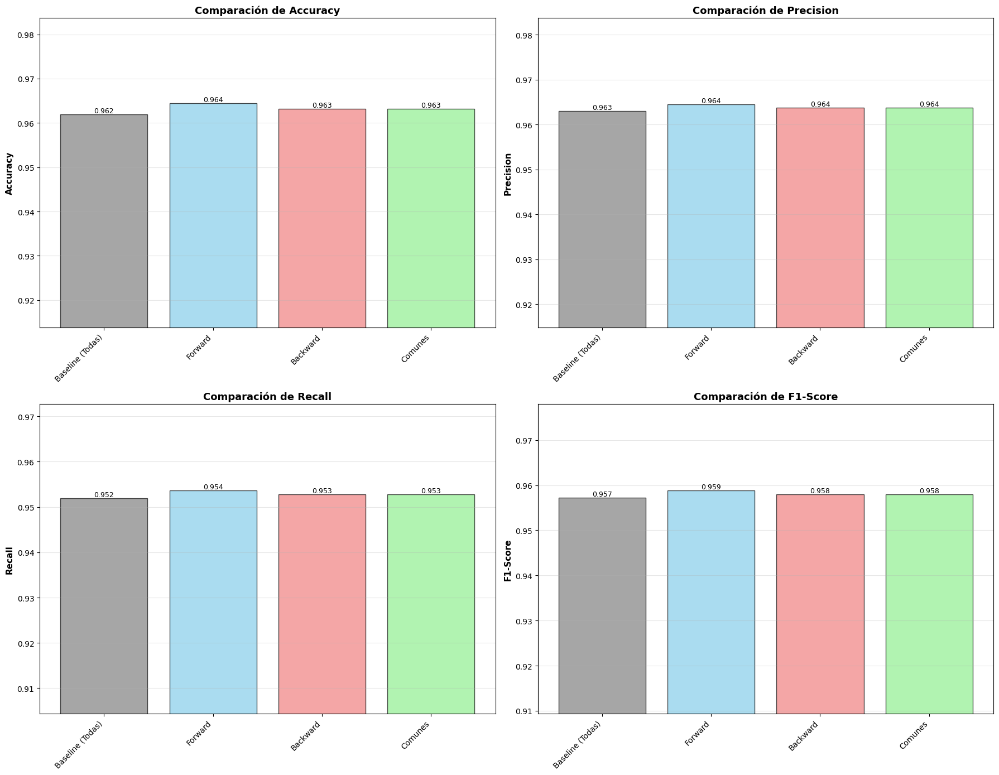


                         3. MATRICES DE CONFUSIÓN


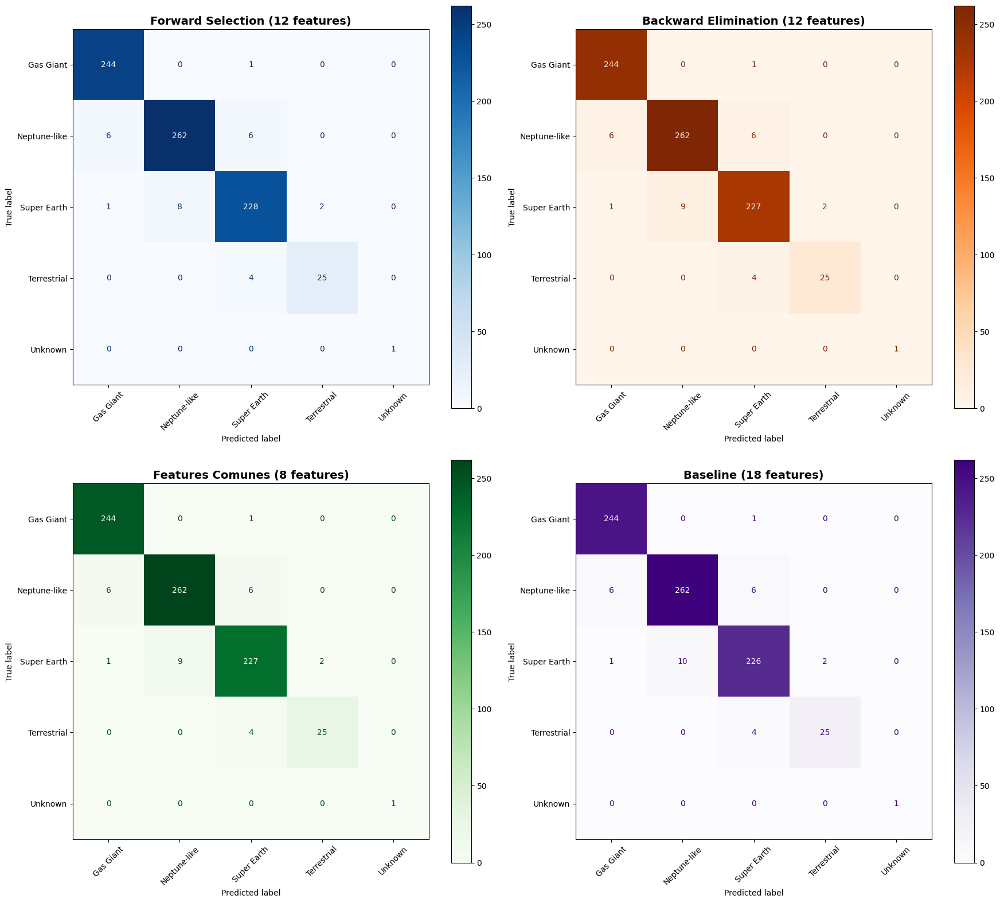


✓ Matrices de confusión generadas

 REPORTE DE CLASIFICACIÓN - FORWARD:
              precision    recall  f1-score   support

   Gas Giant     0.9721    0.9959    0.9839       245
Neptune-like     0.9704    0.9562    0.9632       274
 Super Earth     0.9540    0.9540    0.9540       239
 Terrestrial     0.9259    0.8621    0.8929        29
     Unknown     1.0000    1.0000    1.0000         1

    accuracy                         0.9645       788
   macro avg     0.9645    0.9536    0.9588       788
weighted avg     0.9643    0.9645    0.9643       788


 REPORTE DE CLASIFICACIÓN - BACKWARD:
              precision    recall  f1-score   support

   Gas Giant     0.9721    0.9959    0.9839       245
Neptune-like     0.9668    0.9562    0.9615       274
 Super Earth     0.9538    0.9498    0.9518       239
 Terrestrial     0.9259    0.8621    0.8929        29
     Unknown     1.0000    1.0000    1.0000         1

    accuracy                         0.9632       788
   macro avg     0.

/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(


✓ Curvas calculadas


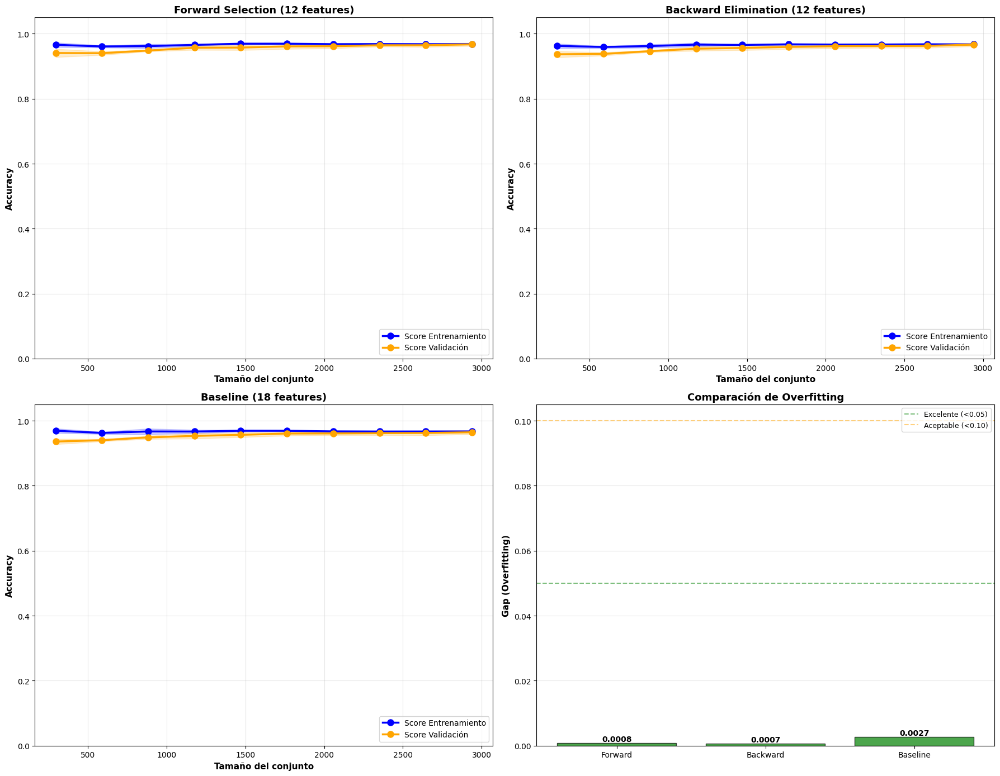


 ANÁLISIS DE OVERFITTING:
   • Forward:  Gap = 0.0008
   • Backward: Gap = 0.0007
   • Baseline: Gap = 0.0027

 Menor overfitting: Backward

                              5. CURVAS ROC

✓ Calculando curvas ROC para 5 clases...

 AUC SCORES (Macro-average):
   • Forward:  0.9974
   • Backward: 0.9972
   • Comunes:  0.9973
   • Baseline: 0.9973


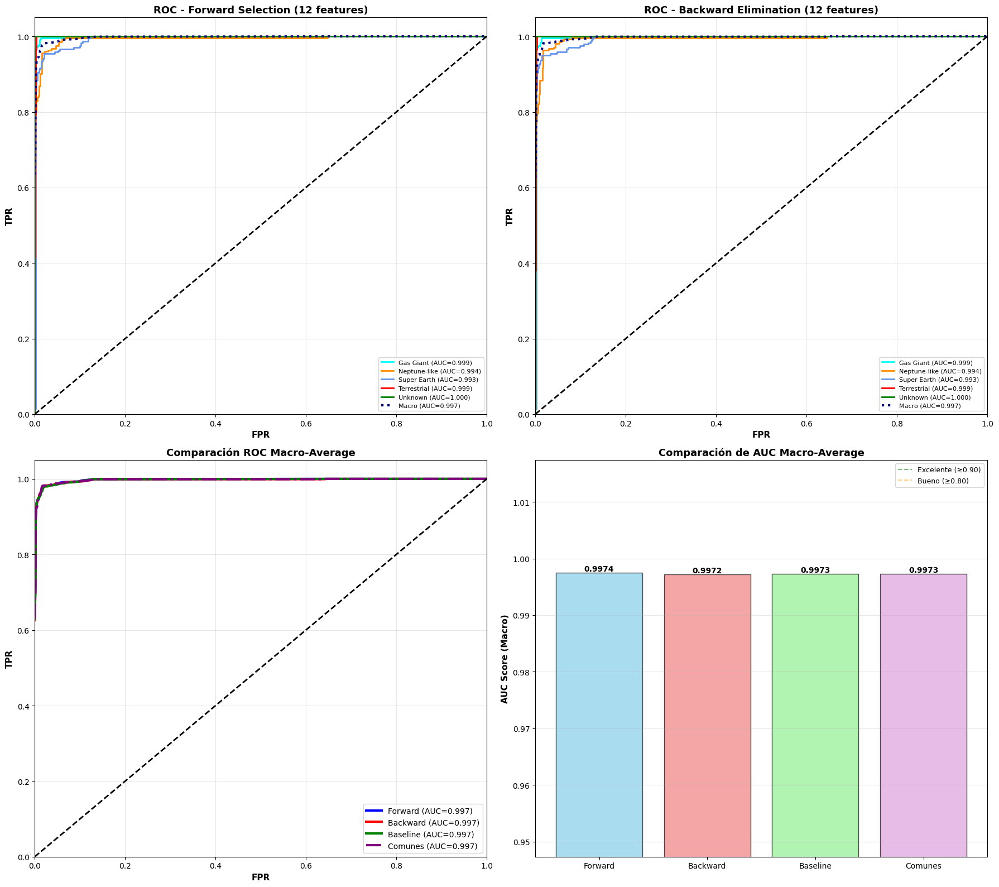


✓ Curvas ROC generadas

 AUC POR CLASE:

       Clase  Forward  Backward  Baseline  Comunes
   Gas Giant   0.9992    0.9993    0.9993   0.9992
Neptune-like   0.9940    0.9938    0.9936   0.9940
 Super Earth   0.9933    0.9932    0.9927   0.9934
 Terrestrial   0.9989    0.9990    0.9988   0.9989
     Unknown   1.0000    1.0000    1.0000   1.0000

                    6. COMPARACIÓN DETALLADA POR CLASE


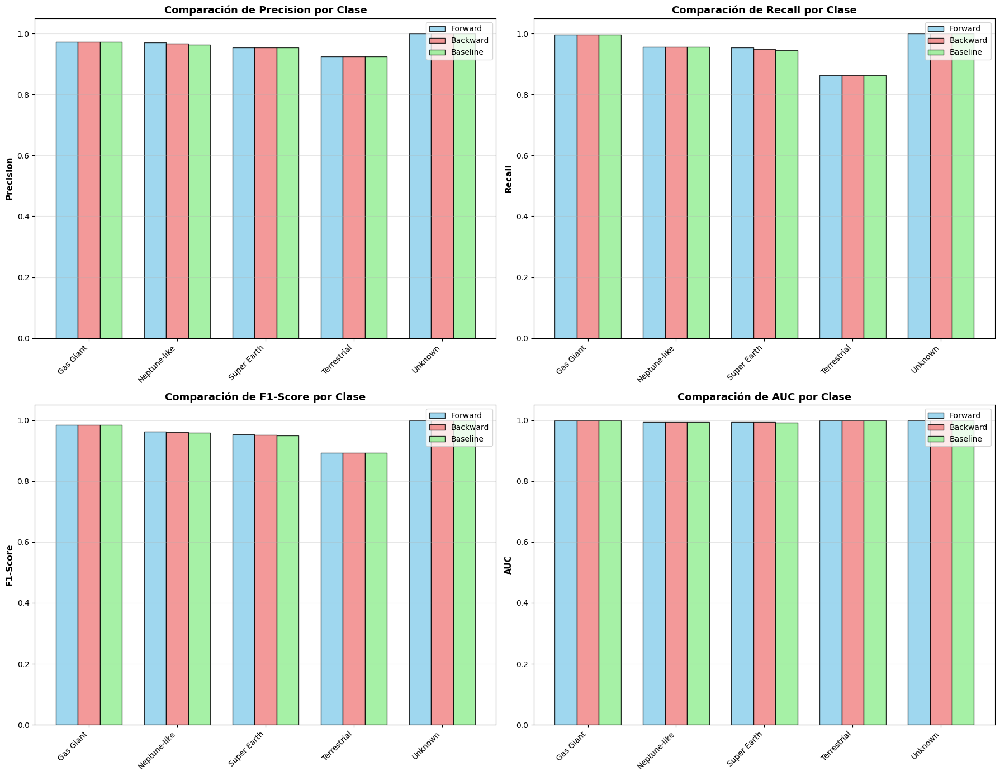


                              RESUMEN FINAL

 MÉTRICAS FINALES EN TEST:

   Forward Selection (12 features):
      • F1-Score: 0.9588
      • AUC:      0.9974
      • Gap:      0.0008

   Backward Elimination (12 features):
      • F1-Score: 0.9580
      • AUC:      0.9972
      • Gap:      0.0007

   Features Comunes (8 features):
      • F1-Score: 0.9580
      • AUC:      0.9973

   Baseline (18 features):
      • F1-Score: 0.9572
      • AUC:      0.9973
      • Gap:      0.0027

 MEJOR MODELO: Forward
   • F1-Score: 0.9588
   • Reducción dimensional: 0.0%

 La selección de features mejora o mantiene el rendimiento con menos features

 MODELOS GUARDADOS:
   • model_forward_final: Modelo con Forward Selection
   • model_backward_final: Modelo con Backward Elimination
   • model_common_final: Modelo con features comunes
   • model_baseline: Modelo con todas las features

 EVALUACIÓN COMPLETA DE SFS FINALIZADA


In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    classification_report, confusion_matrix, ConfusionMatrixDisplay,
    roc_curve, auc, roc_auc_score
)
from sklearn.model_selection import learning_curve
from sklearn.preprocessing import label_binarize
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import cycle

print("="*90)
print(" "*15 + "EVALUACIÓN COMPLETA - MODELOS CON SFS (WRAPPER)")
print("="*90)

# ============================================================================
#                     1. ENTRENAR MODELOS CON FEATURES SELECCIONADAS
# ============================================================================

print("\n PASO 1: Entrenando modelos con features seleccionadas...")

# Forward Selection
X_train_forward = x_train_final[:, forward_support]
X_val_forward = x_val_final[:, forward_support]
X_test_forward = x_test_final[:, forward_support]

# Backward Elimination
X_train_backward = x_train_final[:, backward_support]
X_val_backward = x_val_final[:, backward_support]
X_test_backward = x_test_final[:, backward_support]

# Features comunes
if len(features_common) > 0:
    common_indices = [i for i, name in enumerate(all_feature_names) if name in features_common]
    X_train_common = x_train_final[:, common_indices]
    X_val_common = x_val_final[:, common_indices]
    X_test_common = x_test_final[:, common_indices]
else:
    common_indices = []

print(f"\n✓ Datasets transformados:")
print(f"   • Forward:  {X_train_forward.shape} ({len(forward_features)} features)")
print(f"   • Backward: {X_train_backward.shape} ({len(backward_features)} features)")
print(f"   • Comunes:  {len(common_indices)} features")
print(f"   • Original: {x_train_final.shape}")

# Crear estimador
if 'best_lr' in globals():
    estimator_params = best_lr.get_params()
else:
    estimator_params = {
        'max_iter': 1000,
        'multi_class': 'multinomial',
        'solver': 'lbfgs',
        'random_state': 8
    }

# Entrenar modelos
print("\n Entrenando modelos...")

# Forward
model_forward_final = LogisticRegression(**estimator_params)
model_forward_final.fit(X_train_forward, y_train)

# Backward
model_backward_final = LogisticRegression(**estimator_params)
model_backward_final.fit(X_train_backward, y_train)

# Comunes
if len(common_indices) > 0:
    model_common_final = LogisticRegression(**estimator_params)
    model_common_final.fit(X_train_common, y_train)
else:
    model_common_final = None

# Baseline (todas las features)
model_baseline = LogisticRegression(**estimator_params)
model_baseline.fit(x_train_final, y_train)

print("✓ Modelos entrenados exitosamente")

# ============================================================================
#                     2. MÉTRICAS EN TEST
# ============================================================================

print("\n" + "="*90)
print(" "*30 + "2. MÉTRICAS EN TEST")
print("="*90)

# Predicciones - Forward
y_pred_test_forward = model_forward_final.predict(X_test_forward)
y_proba_test_forward = model_forward_final.predict_proba(X_test_forward)

acc_forward = accuracy_score(y_test, y_pred_test_forward)
prec_forward = precision_score(y_test, y_pred_test_forward, average='macro', zero_division=0)
rec_forward = recall_score(y_test, y_pred_test_forward, average='macro', zero_division=0)
f1_forward = f1_score(y_test, y_pred_test_forward, average='macro', zero_division=0)

print("\n FORWARD SELECTION:")
print(f"   • Features: {len(forward_features)}")
print(f"   • Accuracy:   {acc_forward:.4f} ({acc_forward*100:.2f}%)")
print(f"   • Precision:  {prec_forward:.4f}")
print(f"   • Recall:     {rec_forward:.4f}")
print(f"   • F1-Score:   {f1_forward:.4f}")

# Predicciones - Backward
y_pred_test_backward = model_backward_final.predict(X_test_backward)
y_proba_test_backward = model_backward_final.predict_proba(X_test_backward)

acc_backward = accuracy_score(y_test, y_pred_test_backward)
prec_backward = precision_score(y_test, y_pred_test_backward, average='macro', zero_division=0)
rec_backward = recall_score(y_test, y_pred_test_backward, average='macro', zero_division=0)
f1_backward = f1_score(y_test, y_pred_test_backward, average='macro', zero_division=0)

print("\n BACKWARD ELIMINATION:")
print(f"   • Features: {len(backward_features)}")
print(f"   • Accuracy:   {acc_backward:.4f} ({acc_backward*100:.2f}%)")
print(f"   • Precision:  {prec_backward:.4f}")
print(f"   • Recall:     {rec_backward:.4f}")
print(f"   • F1-Score:   {f1_backward:.4f}")

# Predicciones - Comunes
if model_common_final is not None:
    y_pred_test_common = model_common_final.predict(X_test_common)
    y_proba_test_common = model_common_final.predict_proba(X_test_common)

    acc_common = accuracy_score(y_test, y_pred_test_common)
    prec_common = precision_score(y_test, y_pred_test_common, average='macro', zero_division=0)
    rec_common = recall_score(y_test, y_pred_test_common, average='macro', zero_division=0)
    f1_common = f1_score(y_test, y_pred_test_common, average='macro', zero_division=0)

    print("\n FEATURES COMUNES:")
    print(f"   • Features: {len(common_indices)}")
    print(f"   • Accuracy:   {acc_common:.4f} ({acc_common*100:.2f}%)")
    print(f"   • Precision:  {prec_common:.4f}")
    print(f"   • Recall:     {rec_common:.4f}")
    print(f"   • F1-Score:   {f1_common:.4f}")
else:
    acc_common = prec_common = rec_common = f1_common = 0

# Predicciones - Baseline
y_pred_test_baseline = model_baseline.predict(x_test_final)
y_proba_test_baseline = model_baseline.predict_proba(x_test_final)

acc_baseline = accuracy_score(y_test, y_pred_test_baseline)
prec_baseline = precision_score(y_test, y_pred_test_baseline, average='macro', zero_division=0)
rec_baseline = recall_score(y_test, y_pred_test_baseline, average='macro', zero_division=0)
f1_baseline = f1_score(y_test, y_pred_test_baseline, average='macro', zero_division=0)

print("\n BASELINE (TODAS LAS FEATURES):")
print(f"   • Features: {x_train_final.shape[1]}")
print(f"   • Accuracy:   {acc_baseline:.4f} ({acc_baseline*100:.2f}%)")
print(f"   • Precision:  {prec_baseline:.4f}")
print(f"   • Recall:     {rec_baseline:.4f}")
print(f"   • F1-Score:   {f1_baseline:.4f}")

# Tabla comparativa
comparison_metrics = pd.DataFrame({
    'Modelo': ['Baseline (Todas)', 'Forward', 'Backward', 'Comunes'],
    'Num_Features': [x_train_final.shape[1], len(forward_features),
                     len(backward_features), len(common_indices)],
    'Accuracy': [acc_baseline, acc_forward, acc_backward, acc_common],
    'Precision': [prec_baseline, prec_forward, prec_backward, prec_common],
    'Recall': [rec_baseline, rec_forward, rec_backward, rec_common],
    'F1-Score': [f1_baseline, f1_forward, f1_backward, f1_common]
})

comparison_metrics['Reducción_%'] = (
    (comparison_metrics['Num_Features'].iloc[0] - comparison_metrics['Num_Features']) /
    comparison_metrics['Num_Features'].iloc[0] * 100
)

print("\n TABLA COMPARATIVA (TEST):")
print(comparison_metrics.to_string(index=False, float_format='%.4f'))

# Visualización de métricas
fig, axes = plt.subplots(2, 2, figsize=(18, 14))

metrics_to_plot = ['Accuracy', 'Precision', 'Recall', 'F1-Score']
colors_bars = ['gray', 'skyblue', 'lightcoral', 'lightgreen']

for idx, metric in enumerate(metrics_to_plot):
    ax = axes[idx // 2, idx % 2]

    bars = ax.bar(range(len(comparison_metrics)), comparison_metrics[metric],
                  color=colors_bars, alpha=0.7, edgecolor='black')

    ax.set_xticks(range(len(comparison_metrics)))
    ax.set_xticklabels(comparison_metrics['Modelo'], rotation=45, ha='right')
    ax.set_ylabel(metric, fontsize=11, fontweight='bold')
    ax.set_title(f'Comparación de {metric}', fontsize=13, fontweight='bold')
    ax.set_ylim([comparison_metrics[metric].min() * 0.95,
                 comparison_metrics[metric].max() * 1.02])
    ax.grid(axis='y', alpha=0.3)

    # Añadir valores
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height,
               f'{height:.3f}', ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()

# ============================================================================
#                     3. MATRICES DE CONFUSIÓN
# ============================================================================

print("\n" + "="*90)
print(" "*25 + "3. MATRICES DE CONFUSIÓN")
print("="*90)

fig, axes = plt.subplots(2, 2, figsize=(18, 16))

# Forward Selection
cm_forward = confusion_matrix(y_test, y_pred_test_forward)
disp_forward = ConfusionMatrixDisplay(confusion_matrix=cm_forward,
                                      display_labels=model_forward_final.classes_)
disp_forward.plot(cmap='Blues', ax=axes[0, 0], xticks_rotation=45, values_format='d')
axes[0, 0].set_title(f'Forward Selection ({len(forward_features)} features)',
                     fontsize=14, fontweight='bold')
axes[0, 0].grid(False)

# Backward Elimination
cm_backward = confusion_matrix(y_test, y_pred_test_backward)
disp_backward = ConfusionMatrixDisplay(confusion_matrix=cm_backward,
                                       display_labels=model_backward_final.classes_)
disp_backward.plot(cmap='Oranges', ax=axes[0, 1], xticks_rotation=45, values_format='d')
axes[0, 1].set_title(f'Backward Elimination ({len(backward_features)} features)',
                     fontsize=14, fontweight='bold')
axes[0, 1].grid(False)

# Features Comunes
if model_common_final is not None:
    cm_common = confusion_matrix(y_test, y_pred_test_common)
    disp_common = ConfusionMatrixDisplay(confusion_matrix=cm_common,
                                        display_labels=model_common_final.classes_)
    disp_common.plot(cmap='Greens', ax=axes[1, 0], xticks_rotation=45, values_format='d')
    axes[1, 0].set_title(f'Features Comunes ({len(common_indices)} features)',
                        fontsize=14, fontweight='bold')
    axes[1, 0].grid(False)
else:
    axes[1, 0].text(0.5, 0.5, 'No hay features comunes',
                   ha='center', va='center', fontsize=14)
    axes[1, 0].axis('off')

# Baseline
cm_baseline = confusion_matrix(y_test, y_pred_test_baseline)
disp_baseline = ConfusionMatrixDisplay(confusion_matrix=cm_baseline,
                                       display_labels=model_baseline.classes_)
disp_baseline.plot(cmap='Purples', ax=axes[1, 1], xticks_rotation=45, values_format='d')
axes[1, 1].set_title(f'Baseline ({x_train_final.shape[1]} features)',
                    fontsize=14, fontweight='bold')
axes[1, 1].grid(False)

plt.tight_layout()
plt.show()

print("\n✓ Matrices de confusión generadas")

# Reportes de clasificación
print("\n REPORTE DE CLASIFICACIÓN - FORWARD:")
print(classification_report(y_test, y_pred_test_forward, digits=4))

print("\n REPORTE DE CLASIFICACIÓN - BACKWARD:")
print(classification_report(y_test, y_pred_test_backward, digits=4))

# ============================================================================
#                     4. CURVAS DE APRENDIZAJE
# ============================================================================

print("\n" + "="*90)
print(" "*25 + "4. CURVAS DE APRENDIZAJE")
print("="*90)

print("\n Generando curvas de aprendizaje (esto puede tomar tiempo)...")

train_sizes = np.linspace(0.1, 1.0, 10)

# Forward
train_sizes_f, train_scores_f, val_scores_f = learning_curve(
    model_forward_final, X_train_forward, y_train,
    cv=5, n_jobs=-1, train_sizes=train_sizes,
    scoring='accuracy', random_state=8
)

# Backward
train_sizes_b, train_scores_b, val_scores_b = learning_curve(
    model_backward_final, X_train_backward, y_train,
    cv=5, n_jobs=-1, train_sizes=train_sizes,
    scoring='accuracy', random_state=8
)

# Baseline
train_sizes_base, train_scores_base, val_scores_base = learning_curve(
    model_baseline, x_train_final, y_train,
    cv=5, n_jobs=-1, train_sizes=train_sizes,
    scoring='accuracy', random_state=8
)

print("✓ Curvas calculadas")

# Calcular estadísticas
train_mean_f = np.mean(train_scores_f, axis=1)
train_std_f = np.std(train_scores_f, axis=1)
val_mean_f = np.mean(val_scores_f, axis=1)
val_std_f = np.std(val_scores_f, axis=1)

train_mean_b = np.mean(train_scores_b, axis=1)
train_std_b = np.std(train_scores_b, axis=1)
val_mean_b = np.mean(val_scores_b, axis=1)
val_std_b = np.std(val_scores_b, axis=1)

train_mean_base = np.mean(train_scores_base, axis=1)
train_std_base = np.std(train_scores_base, axis=1)
val_mean_base = np.mean(val_scores_base, axis=1)
val_std_base = np.std(val_scores_base, axis=1)

# Visualización
fig, axes = plt.subplots(2, 2, figsize=(18, 14))

# Forward Selection
axes[0, 0].plot(train_sizes_f, train_mean_f, 'o-', linewidth=2.5,
               markersize=8, color='blue', label='Score Entrenamiento')
axes[0, 0].fill_between(train_sizes_f, train_mean_f - train_std_f,
                        train_mean_f + train_std_f, alpha=0.2, color='blue')
axes[0, 0].plot(train_sizes_f, val_mean_f, 'o-', linewidth=2.5,
               markersize=8, color='orange', label='Score Validación')
axes[0, 0].fill_between(train_sizes_f, val_mean_f - val_std_f,
                        val_mean_f + val_std_f, alpha=0.2, color='orange')
axes[0, 0].set_xlabel('Tamaño del conjunto', fontsize=11, fontweight='bold')
axes[0, 0].set_ylabel('Accuracy', fontsize=11, fontweight='bold')
axes[0, 0].set_title(f'Forward Selection ({len(forward_features)} features)',
                    fontsize=13, fontweight='bold')
axes[0, 0].legend(loc='lower right', fontsize=10)
axes[0, 0].grid(True, alpha=0.3)
axes[0, 0].set_ylim([0, 1.05])

# Backward Elimination
axes[0, 1].plot(train_sizes_b, train_mean_b, 'o-', linewidth=2.5,
               markersize=8, color='blue', label='Score Entrenamiento')
axes[0, 1].fill_between(train_sizes_b, train_mean_b - train_std_b,
                        train_mean_b + train_std_b, alpha=0.2, color='blue')
axes[0, 1].plot(train_sizes_b, val_mean_b, 'o-', linewidth=2.5,
               markersize=8, color='orange', label='Score Validación')
axes[0, 1].fill_between(train_sizes_b, val_mean_b - val_std_b,
                        val_mean_b + val_std_b, alpha=0.2, color='orange')
axes[0, 1].set_xlabel('Tamaño del conjunto', fontsize=11, fontweight='bold')
axes[0, 1].set_ylabel('Accuracy', fontsize=11, fontweight='bold')
axes[0, 1].set_title(f'Backward Elimination ({len(backward_features)} features)',
                    fontsize=13, fontweight='bold')
axes[0, 1].legend(loc='lower right', fontsize=10)
axes[0, 1].grid(True, alpha=0.3)
axes[0, 1].set_ylim([0, 1.05])

# Baseline
axes[1, 0].plot(train_sizes_base, train_mean_base, 'o-', linewidth=2.5,
               markersize=8, color='blue', label='Score Entrenamiento')
axes[1, 0].fill_between(train_sizes_base, train_mean_base - train_std_base,
                        train_mean_base + train_std_base, alpha=0.2, color='blue')
axes[1, 0].plot(train_sizes_base, val_mean_base, 'o-', linewidth=2.5,
               markersize=8, color='orange', label='Score Validación')
axes[1, 0].fill_between(train_sizes_base, val_mean_base - val_std_base,
                        val_mean_base + val_std_base, alpha=0.2, color='orange')
axes[1, 0].set_xlabel('Tamaño del conjunto', fontsize=11, fontweight='bold')
axes[1, 0].set_ylabel('Accuracy', fontsize=11, fontweight='bold')
axes[1, 0].set_title(f'Baseline ({x_train_final.shape[1]} features)',
                    fontsize=13, fontweight='bold')
axes[1, 0].legend(loc='lower right', fontsize=10)
axes[1, 0].grid(True, alpha=0.3)
axes[1, 0].set_ylim([0, 1.05])

# Comparación de gaps (overfitting)
models = ['Forward', 'Backward', 'Baseline']
gaps = [
    train_mean_f[-1] - val_mean_f[-1],
    train_mean_b[-1] - val_mean_b[-1],
    train_mean_base[-1] - val_mean_base[-1]
]

colors_gap = ['green' if g < 0.05 else 'orange' if g < 0.1 else 'red' for g in gaps]

bars = axes[1, 1].bar(models, gaps, color=colors_gap, alpha=0.7, edgecolor='black')
axes[1, 1].set_ylabel('Gap (Overfitting)', fontsize=11, fontweight='bold')
axes[1, 1].set_title('Comparación de Overfitting', fontsize=13, fontweight='bold')
axes[1, 1].axhline(y=0.05, color='green', linestyle='--', alpha=0.5, label='Excelente (<0.05)')
axes[1, 1].axhline(y=0.1, color='orange', linestyle='--', alpha=0.5, label='Aceptable (<0.10)')
axes[1, 1].grid(axis='y', alpha=0.3)
axes[1, 1].legend(fontsize=9)

for bar in bars:
    height = bar.get_height()
    axes[1, 1].text(bar.get_x() + bar.get_width()/2., height,
                   f'{height:.4f}', ha='center', va='bottom', fontsize=10, fontweight='bold')

plt.tight_layout()
plt.show()

print("\n ANÁLISIS DE OVERFITTING:")
print(f"   • Forward:  Gap = {gaps[0]:.4f}")
print(f"   • Backward: Gap = {gaps[1]:.4f}")
print(f"   • Baseline: Gap = {gaps[2]:.4f}")

min_gap_idx = np.argmin(gaps)
print(f"\n Menor overfitting: {models[min_gap_idx]}")

# ============================================================================
#                     5. CURVAS ROC
# ============================================================================

print("\n" + "="*90)
print(" "*30 + "5. CURVAS ROC")
print("="*90)

classes = model_forward_final.classes_
n_classes = len(classes)

print(f"\n✓ Calculando curvas ROC para {n_classes} clases...")

# Binarizar etiquetas
y_test_bin = label_binarize(y_test, classes=classes)
if n_classes == 2:
    y_test_bin = np.hstack([1 - y_test_bin, y_test_bin])

# Calcular ROC para cada modelo
def calculate_roc(y_true_bin, y_proba, n_classes):
    fpr, tpr, roc_auc = dict(), dict(), dict()

    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_proba[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Micro-average
    fpr["micro"], tpr["micro"], _ = roc_curve(y_true_bin.ravel(), y_proba.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

    # Macro-average
    all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))
    mean_tpr = np.zeros_like(all_fpr)
    for i in range(n_classes):
        mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
    mean_tpr /= n_classes

    fpr["macro"] = all_fpr
    tpr["macro"] = mean_tpr
    roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

    return fpr, tpr, roc_auc

# Calcular ROC
fpr_f, tpr_f, roc_auc_f = calculate_roc(y_test_bin, y_proba_test_forward, n_classes)
fpr_b, tpr_b, roc_auc_b = calculate_roc(y_test_bin, y_proba_test_backward, n_classes)
fpr_base, tpr_base, roc_auc_base = calculate_roc(y_test_bin, y_proba_test_baseline, n_classes)

if model_common_final is not None:
    fpr_c, tpr_c, roc_auc_c = calculate_roc(y_test_bin, y_proba_test_common, n_classes)

print("\n AUC SCORES (Macro-average):")
print(f"   • Forward:  {roc_auc_f['macro']:.4f}")
print(f"   • Backward: {roc_auc_b['macro']:.4f}")
if model_common_final is not None:
    print(f"   • Comunes:  {roc_auc_c['macro']:.4f}")
print(f"   • Baseline: {roc_auc_base['macro']:.4f}")

# Visualización ROC
fig, axes = plt.subplots(2, 2, figsize=(18, 16))

colors = cycle(['aqua', 'darkorange', 'cornflowerblue', 'red', 'green',
                'purple', 'brown', 'pink', 'gray', 'olive'])

# Forward Selection - Todas las clases
for i, color in zip(range(n_classes), colors):
    axes[0, 0].plot(fpr_f[i], tpr_f[i], color=color, lw=2,
                   label=f'{classes[i]} (AUC={roc_auc_f[i]:.3f})')

axes[0, 0].plot(fpr_f["macro"], tpr_f["macro"], 'navy', linestyle=':', lw=3,
               label=f'Macro (AUC={roc_auc_f["macro"]:.3f})')
axes[0, 0].plot([0, 1], [0, 1], 'k--', lw=2)
axes[0, 0].set_xlim([0.0, 1.0])
axes[0, 0].set_ylim([0.0, 1.05])
axes[0, 0].set_xlabel('FPR', fontsize=11, fontweight='bold')
axes[0, 0].set_ylabel('TPR', fontsize=11, fontweight='bold')
axes[0, 0].set_title(f'ROC - Forward Selection ({len(forward_features)} features)',
                    fontsize=13, fontweight='bold')
axes[0, 0].legend(loc="lower right", fontsize=8)
axes[0, 0].grid(True, alpha=0.3)

# Backward Elimination - Todas las clases
colors = cycle(['aqua', 'darkorange', 'cornflowerblue', 'red', 'green',
                'purple', 'brown', 'pink', 'gray', 'olive'])

for i, color in zip(range(n_classes), colors):
    axes[0, 1].plot(fpr_b[i], tpr_b[i], color=color, lw=2,
                   label=f'{classes[i]} (AUC={roc_auc_b[i]:.3f})')

axes[0, 1].plot(fpr_b["macro"], tpr_b["macro"], 'navy', linestyle=':', lw=3,
               label=f'Macro (AUC={roc_auc_b["macro"]:.3f})')
axes[0, 1].plot([0, 1], [0, 1], 'k--', lw=2)
axes[0, 1].set_xlim([0.0, 1.0])
axes[0, 1].set_ylim([0.0, 1.05])
axes[0, 1].set_xlabel('FPR', fontsize=11, fontweight='bold')
axes[0, 1].set_ylabel('TPR', fontsize=11, fontweight='bold')
axes[0, 1].set_title(f'ROC - Backward Elimination ({len(backward_features)} features)',
                    fontsize=13, fontweight='bold')
axes[0, 1].legend(loc="lower right", fontsize=8)
axes[0, 1].grid(True, alpha=0.3)

# Comparación de Macro-Average
axes[1, 0].plot(fpr_f["macro"], tpr_f["macro"], 'b-', lw=3,
               label=f'Forward (AUC={roc_auc_f["macro"]:.3f})')
axes[1, 0].plot(fpr_b["macro"], tpr_b["macro"], 'r-', lw=3,
               label=f'Backward (AUC={roc_auc_b["macro"]:.3f})')
axes[1, 0].plot(fpr_base["macro"], tpr_base["macro"], 'g-', lw=3,
               label=f'Baseline (AUC={roc_auc_base["macro"]:.3f})')
if model_common_final is not None:
    axes[1, 0].plot(fpr_c["macro"], tpr_c["macro"], 'purple', linestyle='-.', lw=3,
                   label=f'Comunes (AUC={roc_auc_c["macro"]:.3f})')
axes[1, 0].plot([0, 1], [0, 1], 'k--', lw=2)
axes[1, 0].set_xlim([0.0, 1.0])
axes[1, 0].set_ylim([0.0, 1.05])
axes[1, 0].set_xlabel('FPR', fontsize=11, fontweight='bold')
axes[1, 0].set_ylabel('TPR', fontsize=11, fontweight='bold')
axes[1, 0].set_title('Comparación ROC Macro-Average', fontsize=13, fontweight='bold')
axes[1, 0].legend(loc="lower right", fontsize=10)
axes[1, 0].grid(True, alpha=0.3)

# Comparación de AUC por modelo
models_roc = ['Forward', 'Backward', 'Baseline']
auc_scores = [roc_auc_f['macro'], roc_auc_b['macro'], roc_auc_base['macro']]

if model_common_final is not None:
    models_roc.append('Comunes')
    auc_scores.append(roc_auc_c['macro'])

colors_auc = ['skyblue', 'lightcoral', 'lightgreen', 'plum'][:len(models_roc)]
bars = axes[1, 1].bar(range(len(models_roc)), auc_scores,
                     color=colors_auc, alpha=0.7, edgecolor='black')

axes[1, 1].set_xticks(range(len(models_roc)))
axes[1, 1].set_xticklabels(models_roc)
axes[1, 1].set_ylabel('AUC Score (Macro)', fontsize=11, fontweight='bold')
axes[1, 1].set_title('Comparación de AUC Macro-Average', fontsize=13, fontweight='bold')
axes[1, 1].set_ylim([min(auc_scores) * 0.95, max(auc_scores) * 1.02])
axes[1, 1].grid(axis='y', alpha=0.3)

# Líneas de referencia
axes[1, 1].axhline(y=0.9, color='green', linestyle='--', alpha=0.5, label='Excelente (≥0.90)')
axes[1, 1].axhline(y=0.8, color='orange', linestyle='--', alpha=0.5, label='Bueno (≥0.80)')
axes[1, 1].legend(fontsize=9)

for bar in bars:
    height = bar.get_height()
    axes[1, 1].text(bar.get_x() + bar.get_width()/2., height,
                   f'{height:.4f}', ha='center', va='bottom', fontsize=10, fontweight='bold')

plt.tight_layout()
plt.show()

print("\n✓ Curvas ROC generadas")

# AUC por clase - Comparación
print("\n AUC POR CLASE:")
auc_comparison = pd.DataFrame({
    'Clase': classes,
    'Forward': [roc_auc_f[i] for i in range(n_classes)],
    'Backward': [roc_auc_b[i] for i in range(n_classes)],
    'Baseline': [roc_auc_base[i] for i in range(n_classes)]
})

if model_common_final is not None:
    auc_comparison['Comunes'] = [roc_auc_c[i] for i in range(n_classes)]

print("\n" + auc_comparison.to_string(index=False, float_format='%.4f'))

# ============================================================================
#                     6. COMPARACIÓN DETALLADA POR CLASE
# ============================================================================

print("\n" + "="*90)
print(" "*20 + "6. COMPARACIÓN DETALLADA POR CLASE")
print("="*90)

# Crear DataFrame con métricas por clase
from sklearn.metrics import precision_recall_fscore_support

# Forward
prec_f, rec_f, f1_f, _ = precision_recall_fscore_support(y_test, y_pred_test_forward,
                                                          labels=classes, zero_division=0)
# Backward
prec_b, rec_b, f1_b, _ = precision_recall_fscore_support(y_test, y_pred_test_backward,
                                                          labels=classes, zero_division=0)
# Baseline
prec_base, rec_base, f1_base, _ = precision_recall_fscore_support(y_test, y_pred_test_baseline,
                                                                   labels=classes, zero_division=0)

# Visualización comparativa por clase
fig, axes = plt.subplots(2, 2, figsize=(18, 14))

x_pos = np.arange(n_classes)
width = 0.25

# Precision
axes[0, 0].bar(x_pos - width, prec_f, width, label='Forward',
              color='skyblue', alpha=0.8, edgecolor='black')
axes[0, 0].bar(x_pos, prec_b, width, label='Backward',
              color='lightcoral', alpha=0.8, edgecolor='black')
axes[0, 0].bar(x_pos + width, prec_base, width, label='Baseline',
              color='lightgreen', alpha=0.8, edgecolor='black')
axes[0, 0].set_xticks(x_pos)
axes[0, 0].set_xticklabels(classes, rotation=45, ha='right')
axes[0, 0].set_ylabel('Precision', fontsize=11, fontweight='bold')
axes[0, 0].set_title('Comparación de Precision por Clase', fontsize=13, fontweight='bold')
axes[0, 0].legend()
axes[0, 0].grid(axis='y', alpha=0.3)
axes[0, 0].set_ylim([0, 1.05])

# Recall
axes[0, 1].bar(x_pos - width, rec_f, width, label='Forward',
              color='skyblue', alpha=0.8, edgecolor='black')
axes[0, 1].bar(x_pos, rec_b, width, label='Backward',
              color='lightcoral', alpha=0.8, edgecolor='black')
axes[0, 1].bar(x_pos + width, rec_base, width, label='Baseline',
              color='lightgreen', alpha=0.8, edgecolor='black')
axes[0, 1].set_xticks(x_pos)
axes[0, 1].set_xticklabels(classes, rotation=45, ha='right')
axes[0, 1].set_ylabel('Recall', fontsize=11, fontweight='bold')
axes[0, 1].set_title('Comparación de Recall por Clase', fontsize=13, fontweight='bold')
axes[0, 1].legend()
axes[0, 1].grid(axis='y', alpha=0.3)
axes[0, 1].set_ylim([0, 1.05])

# F1-Score
axes[1, 0].bar(x_pos - width, f1_f, width, label='Forward',
              color='skyblue', alpha=0.8, edgecolor='black')
axes[1, 0].bar(x_pos, f1_b, width, label='Backward',
              color='lightcoral', alpha=0.8, edgecolor='black')
axes[1, 0].bar(x_pos + width, f1_base, width, label='Baseline',
              color='lightgreen', alpha=0.8, edgecolor='black')
axes[1, 0].set_xticks(x_pos)
axes[1, 0].set_xticklabels(classes, rotation=45, ha='right')
axes[1, 0].set_ylabel('F1-Score', fontsize=11, fontweight='bold')
axes[1, 0].set_title('Comparación de F1-Score por Clase', fontsize=13, fontweight='bold')
axes[1, 0].legend()
axes[1, 0].grid(axis='y', alpha=0.3)
axes[1, 0].set_ylim([0, 1.05])

# AUC
axes[1, 1].bar(x_pos - width, [roc_auc_f[i] for i in range(n_classes)], width,
              label='Forward', color='skyblue', alpha=0.8, edgecolor='black')
axes[1, 1].bar(x_pos, [roc_auc_b[i] for i in range(n_classes)], width,
              label='Backward', color='lightcoral', alpha=0.8, edgecolor='black')
axes[1, 1].bar(x_pos + width, [roc_auc_base[i] for i in range(n_classes)], width,
              label='Baseline', color='lightgreen', alpha=0.8, edgecolor='black')
axes[1, 1].set_xticks(x_pos)
axes[1, 1].set_xticklabels(classes, rotation=45, ha='right')
axes[1, 1].set_ylabel('AUC', fontsize=11, fontweight='bold')
axes[1, 1].set_title('Comparación de AUC por Clase', fontsize=13, fontweight='bold')
axes[1, 1].legend()
axes[1, 1].grid(axis='y', alpha=0.3)
axes[1, 1].set_ylim([0, 1.05])

plt.tight_layout()
plt.show()

# ============================================================================
#                     7. RESUMEN FINAL Y RECOMENDACIONES
# ============================================================================

print("\n" + "="*90)
print(" "*30 + "RESUMEN FINAL")
print("="*90)

print("\n MÉTRICAS FINALES EN TEST:")
print(f"\n   Forward Selection ({len(forward_features)} features):")
print(f"      • F1-Score: {f1_forward:.4f}")
print(f"      • AUC:      {roc_auc_f['macro']:.4f}")
print(f"      • Gap:      {gaps[0]:.4f}")

print(f"\n   Backward Elimination ({len(backward_features)} features):")
print(f"      • F1-Score: {f1_backward:.4f}")
print(f"      • AUC:      {roc_auc_b['macro']:.4f}")
print(f"      • Gap:      {gaps[1]:.4f}")

if model_common_final is not None:
    print(f"\n   Features Comunes ({len(common_indices)} features):")
    print(f"      • F1-Score: {f1_common:.4f}")
    print(f"      • AUC:      {roc_auc_c['macro']:.4f}")

print(f"\n   Baseline ({x_train_final.shape[1]} features):")
print(f"      • F1-Score: {f1_baseline:.4f}")
print(f"      • AUC:      {roc_auc_base['macro']:.4f}")
print(f"      • Gap:      {gaps[2]:.4f}")

# Determinar mejor modelo
all_f1 = [f1_forward, f1_backward, f1_baseline]
all_models = ['Forward', 'Backward', 'Baseline']

if model_common_final is not None:
    all_f1.append(f1_common)
    all_models.append('Comunes')

best_model_idx = np.argmax(all_f1)
best_model_name = all_models[best_model_idx]
best_f1 = all_f1[best_model_idx]

print(f"\n MEJOR MODELO: {best_model_name}")
print(f"   • F1-Score: {best_f1:.4f}")

if best_model_name in ['Forward', 'Backward', 'Comunes']:
    reduction = (1 - comparison_metrics.iloc[all_models.index(best_model_name)]['Num_Features'] /
                 x_train_final.shape[1]) * 100
    print(f"   • Reducción dimensional: {reduction:.1f}%")
    print(f"\n La selección de features mejora o mantiene el rendimiento con menos features")
else:
    print(f"\n  El baseline es mejor - la selección de features no aporta valor")

print(f"\n MODELOS GUARDADOS:")
print(f"   • model_forward_final: Modelo con Forward Selection")
print(f"   • model_backward_final: Modelo con Backward Elimination")
if model_common_final is not None:
    print(f"   • model_common_final: Modelo con features comunes")
print(f"   • model_baseline: Modelo con todas las features")

print("\n" + "="*90)
print(" EVALUACIÓN COMPLETA DE SFS FINALIZADA")
print("="*90)

# Comparación

               COMPARACIÓN SIMPLE DE MÉTODOS DE FILTRADO

 Verificando datos disponibles...
 Los tres métodos están disponibles

                    ANÁLISIS DE CONCORDANCIA

 K = 5 features:
   • Comunes a los 3 métodos:    2 (40.0%)
   • Comunes Chi² y MI:          2
   • Comunes Chi² y ANOVA:       3
   • Comunes MI y ANOVA:         3

   Features COMUNES a los 3 métodos:
      1. mass_wrt_Jupiter
      2. radius_wrt_Jupiter

 K = 10 features:
   • Comunes a los 3 métodos:    4 (40.0%)
   • Comunes Chi² y MI:          4
   • Comunes Chi² y ANOVA:       7
   • Comunes MI y ANOVA:         7

   Features COMUNES a los 3 métodos:
      1. mass_wrt_Jupiter
      2. radius_multiplier
      3. radius_wrt_Jupiter
      4. stellar_magnitude

 K = 15 features:
   • Comunes a los 3 métodos:    12 (80.0%)
   • Comunes Chi² y MI:          12
   • Comunes Chi² y ANOVA:       14
   • Comunes MI y ANOVA:         13

 K = 20 features:
   • Comunes a los 3 métodos:    20 (100.0%)
   • Comunes Chi² y 

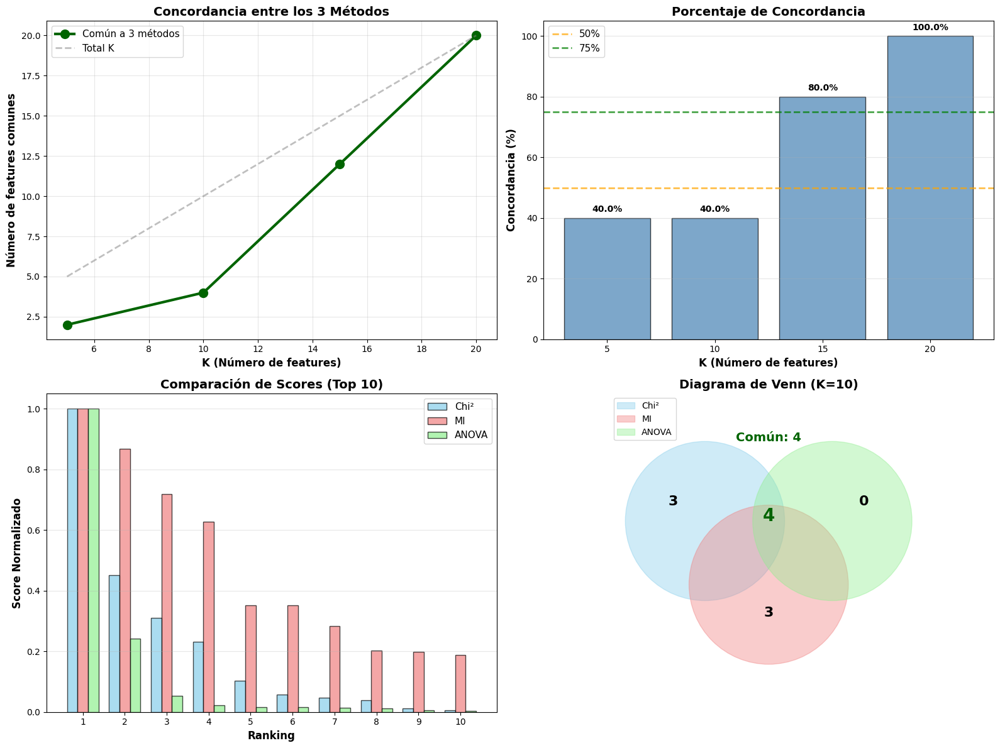


                    ANÁLISIS DE ESTABILIDAD

 Features significativas (p < 0.05):
   • Chi²:      14 (70.0%)
   • ANOVA:     15 (75.0%)
   • MI:        N/A (no tiene p-values)

 Distribución de scores (Top 20):
   • Chi² - Varianza:    0.0586
   • MI - Varianza:      0.0964
   • ANOVA - Varianza:   0.0509

                          RECOMENDACIÓN FINAL

 Análisis de Concordancia:
   • Concordancia promedio entre métodos: 65.0%
   🟡 MEDIA concordancia - Los métodos difieren moderadamente
   → Considerar usar las features comunes

 Características de cada método:

   Chi-Cuadrado (χ²):
   • Features significativas: 14
   • Mejor para: Variables categóricas o discretas
   • Asume: Independencia entre features

   Mutual Information (MI):
   • Detecta: Relaciones lineales Y no lineales
   • Mejor para: Cualquier tipo de relación
   • No requiere supuestos de distribución

   ANOVA F-test:
   • Features significativas: 15
   • Mejor para: Variables numéricas continuas
   • Asume: Normalidad

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

print("="*80)
print(" "*15 + "COMPARACIÓN SIMPLE DE MÉTODOS DE FILTRADO")
print("="*80)

# ============================================================================
#                     1. VERIFICAR DATOS DISPONIBLES
# ============================================================================

print("\n Verificando datos disponibles...")

if 'chi2_results' not in globals() or 'mi_results' not in globals() or 'anova_results' not in globals():
    print(" ERROR: Faltan resultados de algún método")
    print("   Asegúrate de haber ejecutado Chi², MI y ANOVA primero")
else:
    print(" Los tres métodos están disponibles")

    # ============================================================================
    #                     2. COMPARACIÓN DE TOP K FEATURES
    # ============================================================================

    print("\n" + "="*80)
    print(" "*20 + "ANÁLISIS DE CONCORDANCIA")
    print("="*80)

    # Probar diferentes valores de K
    k_values = [5, 10, 15, 20]

    concordance_summary = []

    for k in k_values:
        # Top K de cada método
        top_chi2 = set(chi2_results.head(k)['Feature'].tolist())
        top_mi = set(mi_results.head(k)['Feature'].tolist())
        top_anova = set(anova_results.head(k)['Feature'].tolist())

        # Features comunes a los 3
        common_all = top_chi2 & top_mi & top_anova

        # Concordancia por pares
        common_chi2_mi = top_chi2 & top_mi
        common_chi2_anova = top_chi2 & top_anova
        common_mi_anova = top_mi & top_anova

        concordance_summary.append({
            'K': k,
            'Común_3_métodos': len(common_all),
            'Común_Chi²_MI': len(common_chi2_mi),
            'Común_Chi²_ANOVA': len(common_chi2_anova),
            'Común_MI_ANOVA': len(common_mi_anova),
            'Concordancia_%': (len(common_all) / k) * 100
        })

        print(f"\n K = {k} features:")
        print(f"   • Comunes a los 3 métodos:    {len(common_all)} ({len(common_all)/k*100:.1f}%)")
        print(f"   • Comunes Chi² y MI:          {len(common_chi2_mi)}")
        print(f"   • Comunes Chi² y ANOVA:       {len(common_chi2_anova)}")
        print(f"   • Comunes MI y ANOVA:         {len(common_mi_anova)}")

        if len(common_all) > 0 and k <= 10:
            print(f"\n   Features COMUNES a los 3 métodos:")
            for i, feat in enumerate(sorted(common_all), 1):
                print(f"      {i}. {feat}")

    concordance_df = pd.DataFrame(concordance_summary)

    # ============================================================================
    #                     3. ANÁLISIS DE SCORES
    # ============================================================================

    print("\n" + "="*80)
    print(" "*20 + "COMPARACIÓN DE SCORES")
    print("="*80)

    # Normalizar scores a [0, 1] para comparar
    chi2_normalized = chi2_results.copy()
    chi2_normalized['Score_Norm'] = chi2_normalized['Chi2_Score'] / chi2_normalized['Chi2_Score'].max()

    mi_normalized = mi_results.copy()
    mi_normalized['Score_Norm'] = mi_normalized['MI_Score'] / mi_normalized['MI_Score'].max()

    anova_normalized = anova_results.copy()
    anova_normalized['Score_Norm'] = anova_normalized['F_Score'] / anova_normalized['F_Score'].max()

    # Comparar top 20
    print("\n Comparación de Top 20 features:")

    comparison_top20 = pd.DataFrame({
        'Chi²_Feature': chi2_results.head(20)['Feature'].tolist(),
        'Chi²_Score': chi2_normalized.head(20)['Score_Norm'].tolist(),
        'MI_Feature': mi_results.head(20)['Feature'].tolist(),
        'MI_Score': mi_normalized.head(20)['Score_Norm'].tolist(),
        'ANOVA_Feature': anova_results.head(20)['Feature'].tolist(),
        'ANOVA_Score': anova_normalized.head(20)['Score_Norm'].tolist()
    })

    print("\n" + comparison_top20.to_string(index=False, float_format='%.4f'))

    # ============================================================================
    #                     4. VISUALIZACIONES
    # ============================================================================

    print("\n" + "="*80)
    print(" "*25 + "VISUALIZACIONES")
    print("="*80)

    fig, axes = plt.subplots(2, 2, figsize=(16, 12))

    # Panel 1: Concordancia entre métodos
    axes[0, 0].plot(concordance_df['K'], concordance_df['Común_3_métodos'],
                   'o-', linewidth=3, markersize=10, color='darkgreen', label='Común a 3 métodos')
    axes[0, 0].plot(concordance_df['K'], concordance_df['K'],
                   '--', linewidth=2, color='gray', alpha=0.5, label='Total K')
    axes[0, 0].set_xlabel('K (Número de features)', fontsize=12, fontweight='bold')
    axes[0, 0].set_ylabel('Número de features comunes', fontsize=12, fontweight='bold')
    axes[0, 0].set_title('Concordancia entre los 3 Métodos', fontsize=14, fontweight='bold')
    axes[0, 0].legend(fontsize=11)
    axes[0, 0].grid(True, alpha=0.3)

    # Panel 2: Porcentaje de concordancia
    axes[0, 1].bar(concordance_df['K'].astype(str), concordance_df['Concordancia_%'],
                  color='steelblue', alpha=0.7, edgecolor='black')
    axes[0, 1].axhline(y=50, color='orange', linestyle='--', linewidth=2, alpha=0.7, label='50%')
    axes[0, 1].axhline(y=75, color='green', linestyle='--', linewidth=2, alpha=0.7, label='75%')
    axes[0, 1].set_xlabel('K (Número de features)', fontsize=12, fontweight='bold')
    axes[0, 1].set_ylabel('Concordancia (%)', fontsize=12, fontweight='bold')
    axes[0, 1].set_title('Porcentaje de Concordancia', fontsize=14, fontweight='bold')
    axes[0, 1].legend(fontsize=11)
    axes[0, 1].set_ylim([0, 105])
    axes[0, 1].grid(axis='y', alpha=0.3)

    # Añadir valores
    for i, (k, pct) in enumerate(zip(concordance_df['K'], concordance_df['Concordancia_%'])):
        axes[0, 1].text(i, pct + 2, f'{pct:.1f}%', ha='center', fontsize=10, fontweight='bold')

    # Panel 3: Top 10 features de cada método (scores normalizados)
    top_10 = 10
    x = np.arange(top_10)
    width = 0.25

    axes[1, 0].bar(x - width, chi2_normalized.head(top_10)['Score_Norm'],
                  width, label='Chi²', color='skyblue', alpha=0.7, edgecolor='black')
    axes[1, 0].bar(x, mi_normalized.head(top_10)['Score_Norm'],
                  width, label='MI', color='lightcoral', alpha=0.7, edgecolor='black')
    axes[1, 0].bar(x + width, anova_normalized.head(top_10)['Score_Norm'],
                  width, label='ANOVA', color='lightgreen', alpha=0.7, edgecolor='black')

    axes[1, 0].set_xlabel('Ranking', fontsize=12, fontweight='bold')
    axes[1, 0].set_ylabel('Score Normalizado', fontsize=12, fontweight='bold')
    axes[1, 0].set_title('Comparación de Scores (Top 10)', fontsize=14, fontweight='bold')
    axes[1, 0].set_xticks(x)
    axes[1, 0].set_xticklabels([f'{i+1}' for i in range(top_10)])
    axes[1, 0].legend(fontsize=11)
    axes[1, 0].grid(axis='y', alpha=0.3)

    # Panel 4: Diagrama de Venn para K=10
    k = 10
    top_chi2_10 = set(chi2_results.head(k)['Feature'].tolist())
    top_mi_10 = set(mi_results.head(k)['Feature'].tolist())
    top_anova_10 = set(anova_results.head(k)['Feature'].tolist())

    common_all_10 = top_chi2_10 & top_mi_10 & top_anova_10
    only_chi2 = top_chi2_10 - top_mi_10 - top_anova_10
    only_mi = top_mi_10 - top_chi2_10 - top_anova_10
    only_anova = top_anova_10 - top_chi2_10 - top_mi_10

    ax = axes[1, 1]

    # Crear círculos simulados
    from matplotlib.patches import Circle
    c1 = Circle((0.3, 0.6), 0.25, color='skyblue', alpha=0.4, label='Chi²')
    c2 = Circle((0.5, 0.4), 0.25, color='lightcoral', alpha=0.4, label='MI')
    c3 = Circle((0.7, 0.6), 0.25, color='lightgreen', alpha=0.4, label='ANOVA')
    ax.add_patch(c1)
    ax.add_patch(c2)
    ax.add_patch(c3)

    # Textos
    ax.text(0.2, 0.65, f'{len(only_chi2)}', fontsize=16, ha='center', fontweight='bold')
    ax.text(0.5, 0.3, f'{len(only_mi)}', fontsize=16, ha='center', fontweight='bold')
    ax.text(0.8, 0.65, f'{len(only_anova)}', fontsize=16, ha='center', fontweight='bold')
    ax.text(0.5, 0.6, f'{len(common_all_10)}', fontsize=20, ha='center', fontweight='bold', color='darkgreen')

    ax.text(0.5, 0.85, f'Común: {len(common_all_10)}', fontsize=14, ha='center', fontweight='bold', color='darkgreen')

    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)
    ax.set_aspect('equal')
    ax.axis('off')
    ax.set_title(f'Diagrama de Venn (K={k})', fontsize=14, fontweight='bold')
    ax.legend(loc='upper left', fontsize=10)

    plt.tight_layout()
    plt.show()

    # ============================================================================
    #                     5. ANÁLISIS DE ESTABILIDAD
    # ============================================================================

    print("\n" + "="*80)
    print(" "*20 + "ANÁLISIS DE ESTABILIDAD")
    print("="*80)

    # Features significativas
    chi2_sig = chi2_results[chi2_results['Significativa'] == True].shape[0]
    anova_sig = anova_results[anova_results['Significativa'] == True].shape[0]

    print(f"\n Features significativas (p < 0.05):")
    print(f"   • Chi²:      {chi2_sig} ({chi2_sig/len(chi2_results)*100:.1f}%)")
    print(f"   • ANOVA:     {anova_sig} ({anova_sig/len(anova_results)*100:.1f}%)")
    print(f"   • MI:        N/A (no tiene p-values)")

    # Distribución de scores
    print(f"\n Distribución de scores (Top 20):")
    print(f"   • Chi² - Varianza:    {chi2_normalized.head(20)['Score_Norm'].var():.4f}")
    print(f"   • MI - Varianza:      {mi_normalized.head(20)['Score_Norm'].var():.4f}")
    print(f"   • ANOVA - Varianza:   {anova_normalized.head(20)['Score_Norm'].var():.4f}")

    # ============================================================================
    #                     6. RECOMENDACIÓN FINAL
    # ============================================================================

    print("\n" + "="*80)
    print(" "*25 + " RECOMENDACIÓN FINAL")
    print("="*80)

    # Calcular métricas de decisión
    avg_concordance = concordance_df['Concordancia_%'].mean()

    # Método más conservador (más features significativas)
    sig_scores = {'Chi²': chi2_sig, 'ANOVA': anova_sig}
    most_conservative = max(sig_scores, key=sig_scores.get)

    # Método más selectivo (menos features significativas)
    most_selective = min(sig_scores, key=sig_scores.get)

    print(f"\n Análisis de Concordancia:")
    print(f"   • Concordancia promedio entre métodos: {avg_concordance:.1f}%")

    if avg_concordance >= 70:
        print(f"   ✅ ALTA concordancia - Los métodos coinciden bastante")
        print(f"   → Las features seleccionadas son ROBUSTAS")
    elif avg_concordance >= 50:
        print(f"   🟡 MEDIA concordancia - Los métodos difieren moderadamente")
        print(f"   → Considerar usar las features comunes")
    else:
        print(f"   🔴 BAJA concordancia - Los métodos difieren significativamente")
        print(f"   → Probar cada método en validación")

    print(f"\n Características de cada método:")
    print(f"\n   Chi-Cuadrado (χ²):")
    print(f"   • Features significativas: {chi2_sig}")
    print(f"   • Mejor para: Variables categóricas o discretas")
    print(f"   • Asume: Independencia entre features")

    print(f"\n   Mutual Information (MI):")
    print(f"   • Detecta: Relaciones lineales Y no lineales")
    print(f"   • Mejor para: Cualquier tipo de relación")
    print(f"   • No requiere supuestos de distribución")

    print(f"\n   ANOVA F-test:")
    print(f"   • Features significativas: {anova_sig}")
    print(f"   • Mejor para: Variables numéricas continuas")
    print(f"   • Asume: Normalidad y homogeneidad de varianzas")

    print(f"\n RECOMENDACIÓN SEGUN DATASET:")

    # Decisión basada en tipo de datos
    num_ratio = len(num_cols) / (len(num_cols) + len(cat_cols)) if 'num_cols' in globals() and 'cat_cols' in globals() else 0.5

    if num_ratio > 0.7:
        recommended = "ANOVA F-test"
        reason = "El dataset tiene principalmente features numéricas"
    elif num_ratio < 0.3:
        recommended = "Chi-Cuadrado (χ²)"
        reason = "El dataset tiene principalmente features categóricas"
    else:
        recommended = "Mutual Information (MI)"
        reason = "El dataset tiene mix de features numéricas y categóricas"

    print(f"\n    MÉTODO RECOMENDADO: {recommended}")
    print(f"    Razón: {reason}")

    if avg_concordance >= 60:
        print(f"\n   ALTERNATIVA: Usar las {int(concordance_df['Común_3_métodos'].mean())} features")
        print(f"      comunes a los 3 métodos (máxima robustez)")

    # Sugerencia de K
    k_suggested = 15 if len(feature_names) >= 20 else max(5, int(len(feature_names) * 0.5))
    print(f"\n    K sugerido para el dataset: {k_suggested} features")

    print("\n" + "="*80)
    print(" COMPARACIÓN COMPLETADA")
    print("="*80)

# Random forest - Anova

               RANDOM FOREST CON FEATURES SELECCIONADAS POR ANOVA
                         (Modelo Base - Sin Optimizar)

 PASO 1: Seleccionando features con ANOVA...
 Seleccionadas 15 features por ANOVA:
    1. mass_wrt_Jupiter               (F=21749.17, p=0.0000)
    2. radius_wrt_Jupiter             (F=5257.28, p=0.0000)
    3. radius_multiplier              (F=1157.27, p=0.0000)
    4. detection_method_Transit       (F=482.00, p=0.0000)
    5. stellar_magnitude              (F=365.08, p=0.0000)
    6. detection_method_Orbital Brightness Modulation (F=331.92, p=0.0000)
    7. detection_method_Radial Velocity (F=301.17, p=0.0000)
    8. eccentricity                   (F=263.83, p=0.0000)
    9. discovery_year                 (F=103.42, p=0.0000)
   10. mass_multiplier                (F=80.87, p=0.0000)
   11. detection_method_Direct Imaging (F=50.60, p=0.0000)
   12. detection_method_Gravitational Microlensing (F=35.12, p=0.0000)
   13. detection_method_Eclipse Timing Variations (F=9

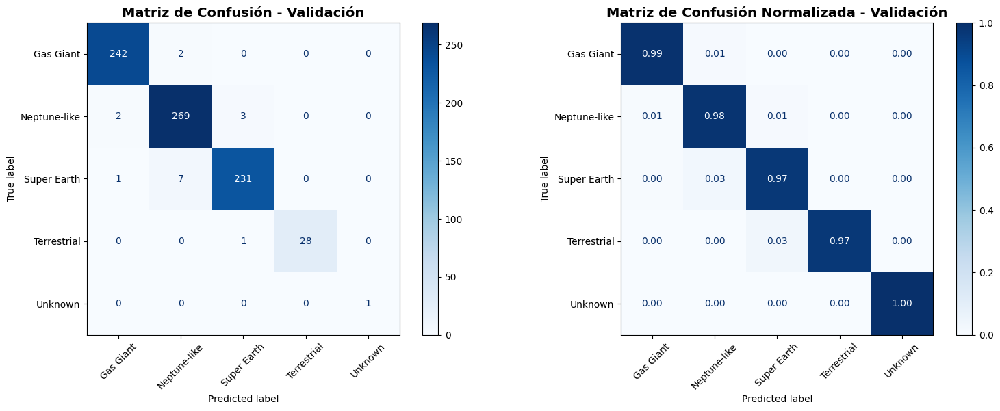


                    6. EVALUACIÓN EN CONJUNTO DE PRUEBA (TEST)

 Métricas Globales (Test):
   • Accuracy:           0.9772 (97.72%)
   • Precision (macro):  0.9858
   • Recall (macro):     0.9737
   • F1-Score (macro):   0.9795

 REPORTE DE CLASIFICACIÓN (Test):
              precision    recall  f1-score   support

   Gas Giant     0.9799    0.9959    0.9879       245
Neptune-like     0.9744    0.9708    0.9726       274
 Super Earth     0.9748    0.9707    0.9727       239
 Terrestrial     1.0000    0.9310    0.9643        29
     Unknown     1.0000    1.0000    1.0000         1

    accuracy                         0.9772       788
   macro avg     0.9858    0.9737    0.9795       788
weighted avg     0.9772    0.9772    0.9771       788



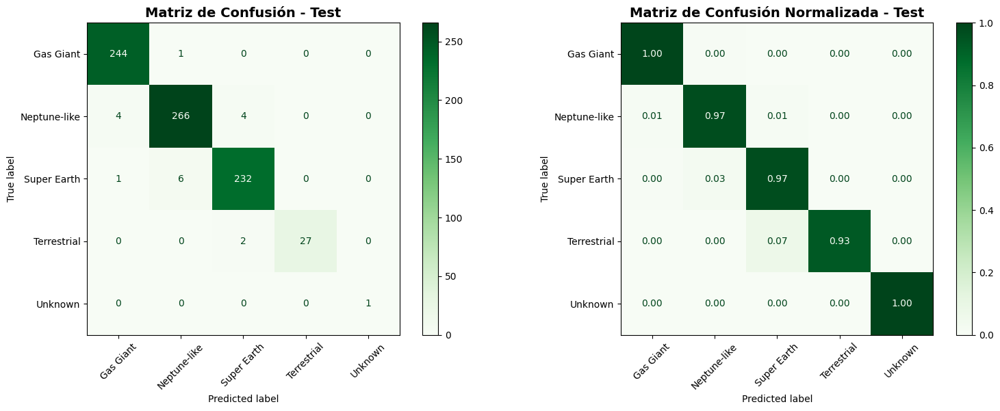


                    7. COMPARACIÓN: VALIDACIÓN vs TEST

  Métrica  Validación   Test  Diferencia  Diferencia_%
 Accuracy      0.9797 0.9772     -0.0025       -0.2564
Precision      0.9877 0.9858     -0.0019       -0.1881
   Recall      0.9811 0.9737     -0.0074       -0.7569
 F1-Score      0.9843 0.9795     -0.0048       -0.4894


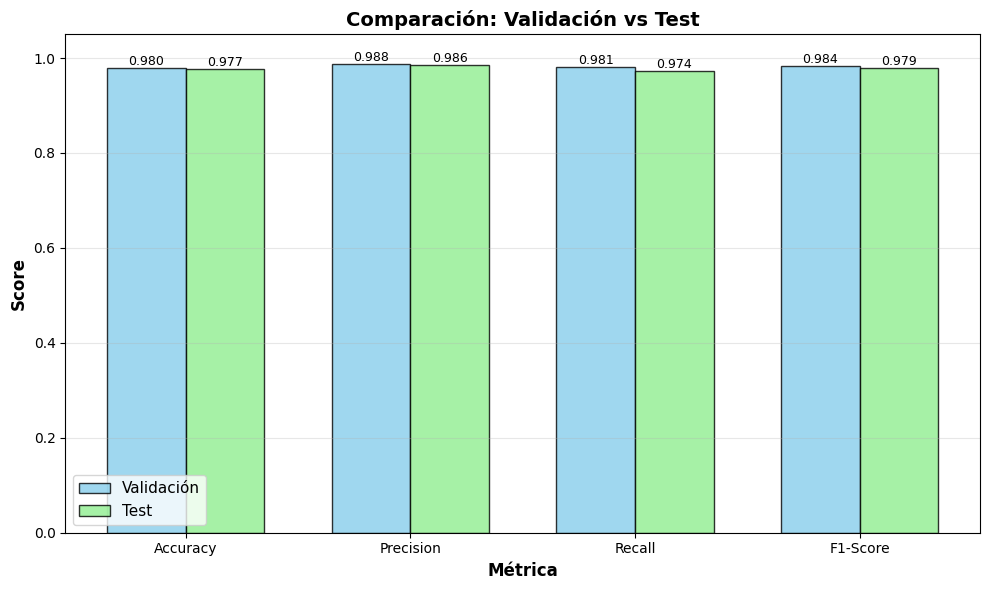


 ANÁLISIS:
   ✅ EXCELENTE - Modelo generaliza muy bien
   Diferencia promedio: -0.0042 (muy pequeña)

                    8. IMPORTANCIA DE FEATURES

 Top 10 Features más importantes (según Random Forest):
                 Feature  Importance
       radius_multiplier      0.2668
        mass_wrt_Jupiter      0.2096
         mass_multiplier      0.1959
      radius_wrt_Jupiter      0.1648
          orbital_radius      0.0559
       stellar_magnitude      0.0262
            eccentricity      0.0241
          discovery_year      0.0172
                distance      0.0169
detection_method_Transit      0.0151


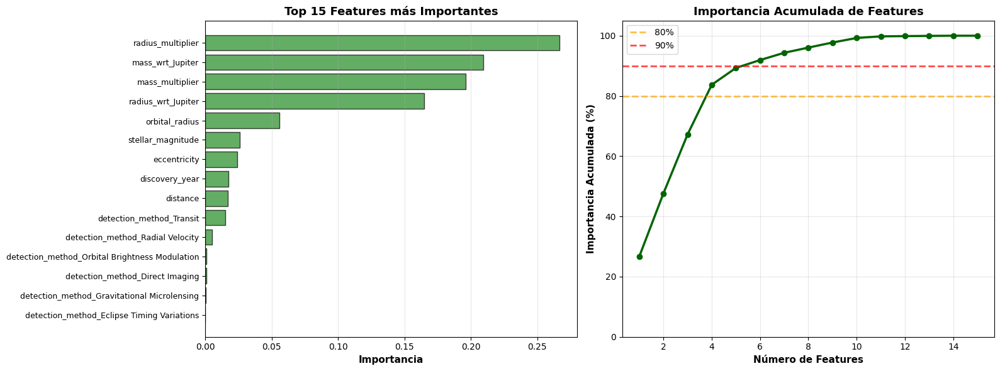


 Análisis de importancia acumulada:
   • Features para 80% de importancia: 4 de 15
   • Features para 90% de importancia: 6 de 15

                               RESUMEN FINAL

 CONFIGURACIÓN DEL MODELO:
   • Algoritmo:          Random Forest (sin optimizar)
   • Método de selección: ANOVA F-test
   • Features usadas:    15 de 18
   • Reducción:          16.7%
   • Tiempo de entrenamiento: 0.88 segundos

 RENDIMIENTO EN TEST (FINAL):
   • Accuracy:   0.9772 (97.72%)
   • Precision:  0.9858
   • Recall:     0.9737
   • F1-Score:   0.9795

 Features más importantes:
   1. radius_multiplier              (0.2668)
   2. mass_wrt_Jupiter               (0.2096)
   3. mass_multiplier                (0.1959)
   4. radius_wrt_Jupiter             (0.1648)
   5. orbital_radius                 (0.0559)

 EVALUACIÓN DE RANDOM FOREST COMPLETADA


In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    classification_report, confusion_matrix, ConfusionMatrixDisplay,
    roc_auc_score, roc_curve, auc, precision_recall_curve, average_precision_score
)
from sklearn.preprocessing import label_binarize
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import time

print("="*90)
print(" "*15 + "RANDOM FOREST CON FEATURES SELECCIONADAS POR ANOVA")
print(" "*25 + "(Modelo Base - Sin Optimizar)")
print("="*90)

# ============================================================================
#                     1. SELECCIÓN DE FEATURES CON ANOVA
# ============================================================================

print("\n PASO 1: Seleccionando features con ANOVA...")

# Definir K (número de features a seleccionar)
k_features = 15  # Puedes cambiar este valor

if 'anova_results' not in globals():
    print(" ERROR: No se encontraron resultados de ANOVA")
    print("   Ejecuta primero el análisis ANOVA F-test")
else:
    # Seleccionar top K features
    top_anova_features = anova_results.head(k_features)['Feature'].tolist()

    print(f" Seleccionadas {len(top_anova_features)} features por ANOVA:")
    for i, feat in enumerate(top_anova_features, 1):
        score = anova_results[anova_results['Feature'] == feat]['F_Score'].values[0]
        pval = anova_results[anova_results['Feature'] == feat]['P_Value'].values[0]
        print(f"   {i:2d}. {feat:30s} (F={score:.2f}, p={pval:.4f})")

    # ============================================================================
    #                     2. PREPARAR DATOS CON FEATURES SELECCIONADAS
    # ============================================================================

    print("\n" + "="*90)
    print(" "*20 + "2. PREPARACIÓN DE DATOS")
    print("="*90)

    # Mapear features a índices
    if 'encoded_cols' in globals() and 'num_cols' in globals():
        all_feature_names = list(num_cols) + list(encoded_cols)
    else:
        all_feature_names = [f'feature_{i}' for i in range(x_train_final.shape[1])]

    feature_to_idx = {name: idx for idx, name in enumerate(all_feature_names)}

    # Obtener índices de las features seleccionadas
    selected_indices = [feature_to_idx[f] for f in top_anova_features if f in feature_to_idx]
    selected_indices = [idx for idx in selected_indices if idx < x_train_final.shape[1]]

    print(f"\n✓ Índices de features seleccionadas: {len(selected_indices)}")

    # Filtrar datos
    X_train_anova = x_train_final[:, selected_indices]
    X_val_anova = x_val_final[:, selected_indices]
    X_test_anova = x_test_final[:, selected_indices]

    print(f"✓ X_train shape: {X_train_anova.shape}")
    print(f"✓ X_val shape:   {X_val_anova.shape}")
    print(f"✓ X_test shape:  {X_test_anova.shape}")

    # ============================================================================
    #                     3. ENTRENAR RANDOM FOREST (SIN OPTIMIZAR)
    # ============================================================================

    print("\n" + "="*90)
    print(" "*15 + "3. ENTRENAMIENTO DE RANDOM FOREST (HIPERPARÁMETROS POR DEFECTO)")
    print("="*90)

    # Modelo con hiperparámetros por defecto
    rf_base = RandomForestClassifier(
        n_estimators=100,        # Default
        criterion='gini',        # Default
        max_depth=None,          # Default (árboles crecen hasta hojas puras)
        min_samples_split=2,     # Default
        min_samples_leaf=1,      # Default
        max_features='sqrt',     # Default para clasificación
        random_state=8,
        n_jobs=-1,
        verbose=0
    )

    print("\n Hiperparámetros del modelo:")
    print(f"   • n_estimators:      100")
    print(f"   • criterion:         gini")
    print(f"   • max_depth:         None (sin límite)")
    print(f"   • min_samples_split: 2")
    print(f"   • min_samples_leaf:  1")
    print(f"   • max_features:      sqrt")

    print("\n Entrenando Random Forest...")
    start_time = time.time()

    rf_base.fit(X_train_anova, y_train)

    training_time = time.time() - start_time

    print(f" Modelo entrenado en {training_time:.2f} segundos")

    # ============================================================================
    #                     4. PREDICCIONES
    # ============================================================================

    print("\n" + "="*90)
    print(" "*25 + "4. PREDICCIONES")
    print("="*90)

    # Predicciones en validación
    y_pred_val = rf_base.predict(X_val_anova)
    y_proba_val = rf_base.predict_proba(X_val_anova)

    # Predicciones en test
    y_pred_test = rf_base.predict(X_test_anova)
    y_proba_test = rf_base.predict_proba(X_test_anova)

    print(" Predicciones completadas")

    # ============================================================================
    #                     5. EVALUACIÓN EN VALIDACIÓN
    # ============================================================================

    print("\n" + "="*90)
    print(" "*20 + "5. EVALUACIÓN EN CONJUNTO DE VALIDACIÓN")
    print("="*90)

    # Métricas básicas
    acc_val = accuracy_score(y_val, y_pred_val)
    prec_val = precision_score(y_val, y_pred_val, average='macro', zero_division=0)
    rec_val = recall_score(y_val, y_pred_val, average='macro', zero_division=0)
    f1_val = f1_score(y_val, y_pred_val, average='macro', zero_division=0)

    print(f"\n Métricas Globales (Validación):")
    print(f"   • Accuracy:           {acc_val:.4f} ({acc_val*100:.2f}%)")
    print(f"   • Precision (macro):  {prec_val:.4f}")
    print(f"   • Recall (macro):     {rec_val:.4f}")
    print(f"   • F1-Score (macro):   {f1_val:.4f}")

    # Reporte de clasificación
    print("\n REPORTE DE CLASIFICACIÓN (Validación):")
    print(classification_report(y_val, y_pred_val, digits=4))

    # Matriz de confusión
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))

    cm_val = confusion_matrix(y_val, y_pred_val)
    disp_val = ConfusionMatrixDisplay(confusion_matrix=cm_val, display_labels=rf_base.classes_)
    disp_val.plot(cmap='Blues', ax=axes[0], xticks_rotation=45, values_format='d')
    axes[0].set_title('Matriz de Confusión - Validación', fontsize=14, fontweight='bold')
    axes[0].grid(False)

    # Matriz normalizada
    cm_val_norm = cm_val.astype('float') / cm_val.sum(axis=1)[:, np.newaxis]
    disp_val_norm = ConfusionMatrixDisplay(confusion_matrix=cm_val_norm, display_labels=rf_base.classes_)
    disp_val_norm.plot(cmap='Blues', ax=axes[1], xticks_rotation=45, values_format='.2f')
    axes[1].set_title('Matriz de Confusión Normalizada - Validación', fontsize=14, fontweight='bold')
    axes[1].grid(False)

    plt.tight_layout()
    plt.show()

    # ============================================================================
    #                     6. EVALUACIÓN EN TEST
    # ============================================================================

    print("\n" + "="*90)
    print(" "*20 + "6. EVALUACIÓN EN CONJUNTO DE PRUEBA (TEST)")
    print("="*90)

    # Métricas básicas
    acc_test = accuracy_score(y_test, y_pred_test)
    prec_test = precision_score(y_test, y_pred_test, average='macro', zero_division=0)
    rec_test = recall_score(y_test, y_pred_test, average='macro', zero_division=0)
    f1_test = f1_score(y_test, y_pred_test, average='macro', zero_division=0)

    print(f"\n Métricas Globales (Test):")
    print(f"   • Accuracy:           {acc_test:.4f} ({acc_test*100:.2f}%)")
    print(f"   • Precision (macro):  {prec_test:.4f}")
    print(f"   • Recall (macro):     {rec_test:.4f}")
    print(f"   • F1-Score (macro):   {f1_test:.4f}")

    # Reporte de clasificación
    print("\n REPORTE DE CLASIFICACIÓN (Test):")
    print(classification_report(y_test, y_pred_test, digits=4))

    # Matrices de confusión
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))

    cm_test = confusion_matrix(y_test, y_pred_test)
    disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test, display_labels=rf_base.classes_)
    disp_test.plot(cmap='Greens', ax=axes[0], xticks_rotation=45, values_format='d')
    axes[0].set_title('Matriz de Confusión - Test', fontsize=14, fontweight='bold')
    axes[0].grid(False)

    # Matriz normalizada
    cm_test_norm = cm_test.astype('float') / cm_test.sum(axis=1)[:, np.newaxis]
    disp_test_norm = ConfusionMatrixDisplay(confusion_matrix=cm_test_norm, display_labels=rf_base.classes_)
    disp_test_norm.plot(cmap='Greens', ax=axes[1], xticks_rotation=45, values_format='.2f')
    axes[1].set_title('Matriz de Confusión Normalizada - Test', fontsize=14, fontweight='bold')
    axes[1].grid(False)

    plt.tight_layout()
    plt.show()

    # ============================================================================
    #                     7. COMPARACIÓN VAL vs TEST
    # ============================================================================

    print("\n" + "="*90)
    print(" "*20 + "7. COMPARACIÓN: VALIDACIÓN vs TEST")
    print("="*90)

    comparison_df = pd.DataFrame({
        'Métrica': ['Accuracy', 'Precision', 'Recall', 'F1-Score'],
        'Validación': [acc_val, prec_val, rec_val, f1_val],
        'Test': [acc_test, prec_test, rec_test, f1_test]
    })

    comparison_df['Diferencia'] = comparison_df['Test'] - comparison_df['Validación']
    comparison_df['Diferencia_%'] = (comparison_df['Diferencia'] / comparison_df['Validación']) * 100

    print("\n" + comparison_df.to_string(index=False, float_format='%.4f'))

    # Visualización
    fig, ax = plt.subplots(figsize=(10, 6))

    x = np.arange(len(comparison_df))
    width = 0.35

    bars1 = ax.bar(x - width/2, comparison_df['Validación'], width,
                   label='Validación', color='skyblue', alpha=0.8, edgecolor='black')
    bars2 = ax.bar(x + width/2, comparison_df['Test'], width,
                   label='Test', color='lightgreen', alpha=0.8, edgecolor='black')

    ax.set_ylabel('Score', fontsize=12, fontweight='bold')
    ax.set_xlabel('Métrica', fontsize=12, fontweight='bold')
    ax.set_title('Comparación: Validación vs Test', fontsize=14, fontweight='bold')
    ax.set_xticks(x)
    ax.set_xticklabels(comparison_df['Métrica'])
    ax.legend(fontsize=11)
    ax.set_ylim([0, 1.05])
    ax.grid(axis='y', alpha=0.3)

    # Añadir valores
    for bars in [bars1, bars2]:
        for bar in bars:
            height = bar.get_height()
            ax.text(bar.get_x() + bar.get_width()/2., height,
                   f'{height:.3f}', ha='center', va='bottom', fontsize=9)

    plt.tight_layout()
    plt.show()

    # Análisis de overfitting/underfitting
    avg_diff = comparison_df['Diferencia'].mean()

    print(f"\n ANÁLISIS:")
    if abs(avg_diff) < 0.02:
        print(f"   ✅ EXCELENTE - Modelo generaliza muy bien")
        print(f"   Diferencia promedio: {avg_diff:+.4f} (muy pequeña)")
    elif avg_diff < -0.05:
        print(f"   ⚠️  POSIBLE OVERFITTING")
        print(f"   El modelo funciona mejor en validación que en test")
        print(f"   Diferencia promedio: {avg_diff:+.4f}")
    elif avg_diff > 0.05:
        print(f"   🔴 PROBLEMA - Test mejor que validación (inusual)")
        print(f"   Verificar datos de validación")
    else:
        print(f"   ✅ BUENO - Modelo generaliza adecuadamente")
        print(f"   Diferencia promedio: {avg_diff:+.4f}")

    # ============================================================================
    #                     8. FEATURE IMPORTANCE
    # ============================================================================

    print("\n" + "="*90)
    print(" "*20 + "8. IMPORTANCIA DE FEATURES")
    print("="*90)

    # Obtener importancias
    feature_importance = rf_base.feature_importances_

    # Crear DataFrame
    importance_df = pd.DataFrame({
        'Feature': [top_anova_features[i] for i in range(len(selected_indices))],
        'Importance': feature_importance
    })

    importance_df = importance_df.sort_values('Importance', ascending=False).reset_index(drop=True)

    print("\n Top 10 Features más importantes (según Random Forest):")
    print(importance_df.head(10).to_string(index=False, float_format='%.4f'))

    # Visualización
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))

    # Panel 1: Top 15 features
    top_n = min(15, len(importance_df))
    top_importance = importance_df.head(top_n)

    axes[0].barh(range(top_n), top_importance['Importance'],
                color='forestgreen', alpha=0.7, edgecolor='black')
    axes[0].set_yticks(range(top_n))
    axes[0].set_yticklabels(top_importance['Feature'], fontsize=9)
    axes[0].set_xlabel('Importancia', fontsize=11, fontweight='bold')
    axes[0].set_title(f'Top {top_n} Features más Importantes', fontsize=13, fontweight='bold')
    axes[0].invert_yaxis()
    axes[0].grid(axis='x', alpha=0.3)

    # Panel 2: Importancia acumulada
    cumsum_importance = np.cumsum(importance_df['Importance'].values)

    axes[1].plot(range(1, len(cumsum_importance) + 1), cumsum_importance * 100,
                'o-', linewidth=2.5, markersize=6, color='darkgreen')
    axes[1].axhline(y=80, color='orange', linestyle='--', linewidth=2, alpha=0.7, label='80%')
    axes[1].axhline(y=90, color='red', linestyle='--', linewidth=2, alpha=0.7, label='90%')
    axes[1].set_xlabel('Número de Features', fontsize=11, fontweight='bold')
    axes[1].set_ylabel('Importancia Acumulada (%)', fontsize=11, fontweight='bold')
    axes[1].set_title('Importancia Acumulada de Features', fontsize=13, fontweight='bold')
    axes[1].legend(fontsize=10)
    axes[1].grid(True, alpha=0.3)
    axes[1].set_ylim([0, 105])

    plt.tight_layout()
    plt.show()

    # Calcular features necesarias para 80% y 90%
    features_80 = np.argmax(cumsum_importance >= 0.80) + 1
    features_90 = np.argmax(cumsum_importance >= 0.90) + 1

    print(f"\n Análisis de importancia acumulada:")
    print(f"   • Features para 80% de importancia: {features_80} de {len(importance_df)}")
    print(f"   • Features para 90% de importancia: {features_90} de {len(importance_df)}")

    # ============================================================================
    #                     9. RESUMEN FINAL
    # ============================================================================

    print("\n" + "="*90)
    print(" "*30 + " RESUMEN FINAL")
    print("="*90)

    print(f"\n CONFIGURACIÓN DEL MODELO:")
    print(f"   • Algoritmo:          Random Forest (sin optimizar)")
    print(f"   • Método de selección: ANOVA F-test")
    print(f"   • Features usadas:    {len(selected_indices)} de {x_train_final.shape[1]}")
    print(f"   • Reducción:          {(1 - len(selected_indices)/x_train_final.shape[1])*100:.1f}%")
    print(f"   • Tiempo de entrenamiento: {training_time:.2f} segundos")

    print(f"\n RENDIMIENTO EN TEST (FINAL):")
    print(f"   • Accuracy:   {acc_test:.4f} ({acc_test*100:.2f}%)")
    print(f"   • Precision:  {prec_test:.4f}")
    print(f"   • Recall:     {rec_test:.4f}")
    print(f"   • F1-Score:   {f1_test:.4f}")

    print(f"\n Features más importantes:")
    for i, row in importance_df.head(5).iterrows():
        print(f"   {i+1}. {row['Feature']:30s} ({row['Importance']:.4f})")

    print("\n" + "="*90)
    print(" EVALUACIÓN DE RANDOM FOREST COMPLETADA")
    print("="*90)

          CURVAS ROC Y PRECISION-RECALL - RANDOM FOREST (SIN OPTIMIZAR)

 Preparando datos para las curvas...
 Datos preparados
   • Número de clases: 5
   • Clases: ['Gas Giant' 'Neptune-like' 'Super Earth' 'Terrestrial' 'Unknown']

                    CURVAS ROC - CONJUNTO DE VALIDACIÓN

 Curvas ROC calculadas para validación
   • ROC AUC Micro-average: 0.9995
   • ROC AUC Macro-average: 0.9995

                    CURVAS ROC - CONJUNTO DE TEST

 Curvas ROC calculadas para test
   • ROC AUC Micro-average: 0.9992
   • ROC AUC Macro-average: 0.9991

                         VISUALIZACIÓN CURVAS ROC


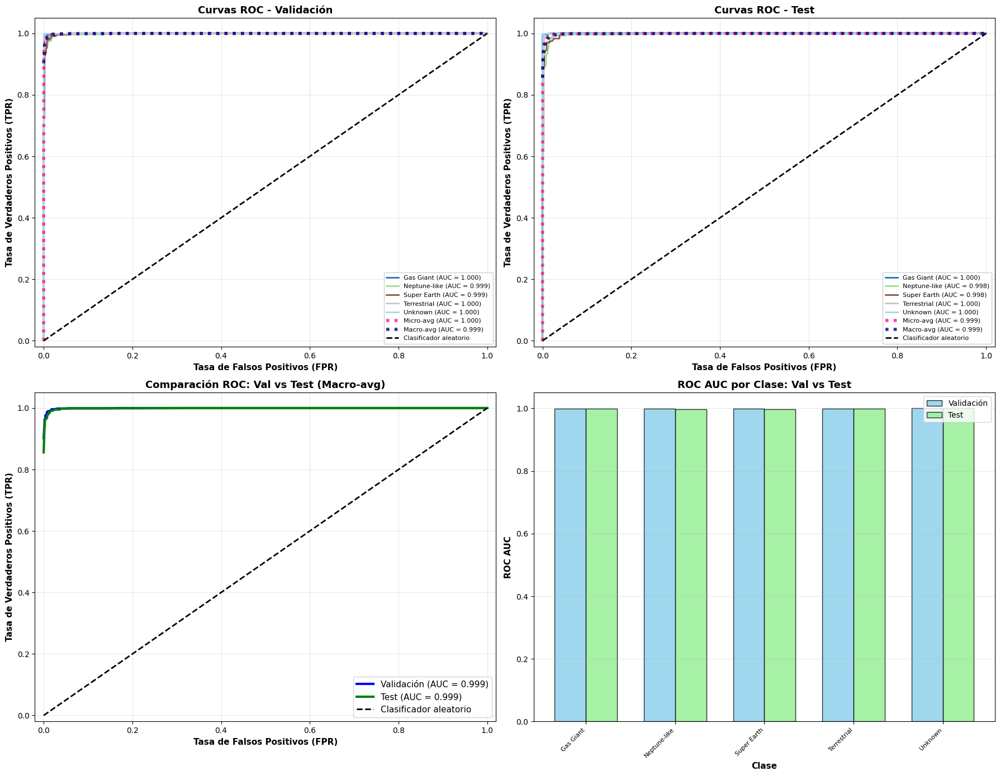


               CURVAS PRECISION-RECALL - CONJUNTO DE VALIDACIÓN

 Curvas Precision-Recall calculadas para validación
   • AP Micro-average: 0.9980
   • AP Macro-average: 0.9982

               CURVAS PRECISION-RECALL - CONJUNTO DE TEST

 Curvas Precision-Recall calculadas para test
   • AP Micro-average: 0.9969
   • AP Macro-average: 0.9971

                    VISUALIZACIÓN CURVAS PRECISION-RECALL


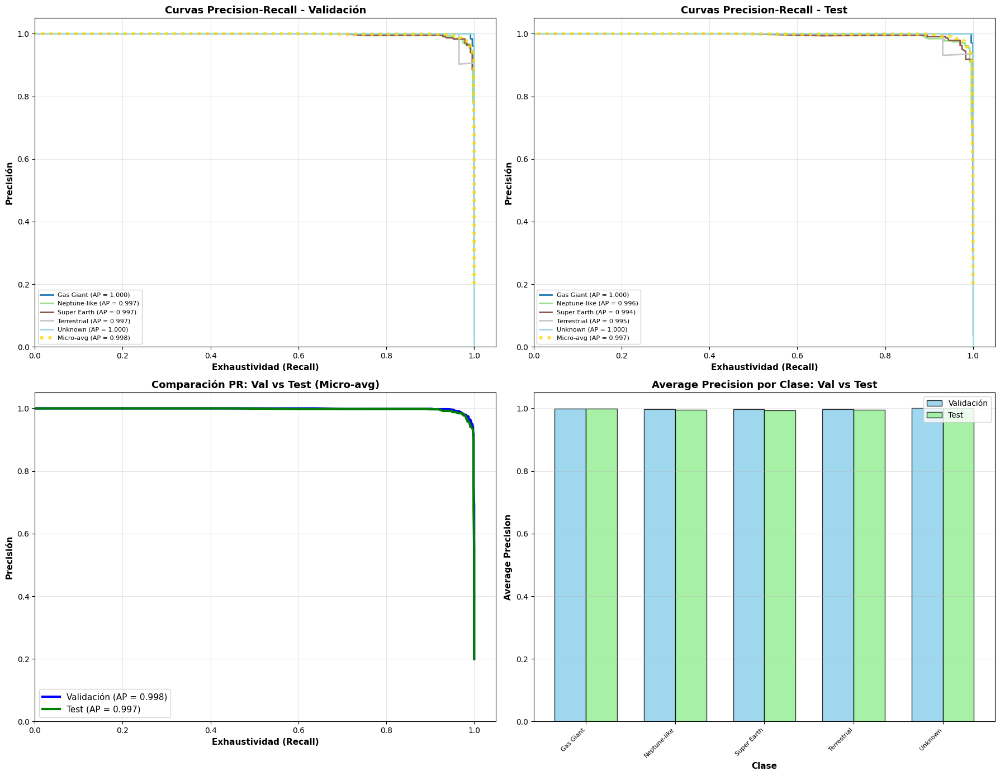


                         TABLAS COMPARATIVAS

 ROC AUC por Clase:

       Clase  Val_AUC  Test_AUC  Diferencia
   Gas Giant   0.9999    0.9999      0.0000
Neptune-like   0.9986    0.9976     -0.0009
 Super Earth   0.9988    0.9980     -0.0007
 Terrestrial   0.9999    0.9998     -0.0000
     Unknown   1.0000    1.0000      0.0000
   Micro-avg   0.9995    0.9992     -0.0003
   Macro-avg   0.9995    0.9991     -0.0003

 Average Precision por Clase:

       Clase  Val_AP  Test_AP  Diferencia
   Gas Giant  0.9998   0.9999      0.0001
Neptune-like  0.9975   0.9958     -0.0016
 Super Earth  0.9969   0.9945     -0.0024
 Terrestrial  0.9968   0.9955     -0.0013
     Unknown  1.0000   1.0000      0.0000
   Micro-avg  0.9980   0.9969     -0.0011
   Macro-avg  0.9982   0.9971     -0.0010

                               RESUMEN FINAL

 MÉTRICAS FINALES (TEST):
   • ROC AUC Macro-average:  0.9991
   • ROC AUC Micro-average:  0.9992
   • AP Macro-average:       0.9971
   • AP Micro-average:       0.

In [ ]:
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc, precision_recall_curve, average_precision_score
import matplotlib.pyplot as plt
import numpy as np
from matplotlib import cm

print("="*90)
print(" "*10 + "CURVAS ROC Y PRECISION-RECALL - RANDOM FOREST (SIN OPTIMIZAR)")
print("="*90)

# Verificar que el modelo existe
if 'rf_base' not in globals():
    print(" ERROR: Modelo Random Forest no encontrado")
    print("  Ejecuta primero el entrenamiento del Random Forest")
else:
    # ============================================================================
    #                     1. PREPARACIÓN DE DATOS
    # ============================================================================

    print("\n Preparando datos para las curvas...")

    # Binarizar las etiquetas para análisis multiclase
    y_val_bin = label_binarize(y_val, classes=rf_base.classes_)
    y_test_bin = label_binarize(y_test, classes=rf_base.classes_)
    n_classes = y_val_bin.shape[1]

    # Obtener probabilidades (ya calculadas anteriormente)
    if 'y_proba_val' not in globals() or 'y_proba_test' not in globals():
        print("   Calculando probabilidades...")
        y_proba_val = rf_base.predict_proba(X_val_anova)
        y_proba_test = rf_base.predict_proba(X_test_anova)

    print(f" Datos preparados")
    print(f"   • Número de clases: {n_classes}")
    print(f"   • Clases: {rf_base.classes_}")

    # ============================================================================
    #                     2. CURVAS ROC - VALIDACIÓN
    # ============================================================================

    print("\n" + "="*90)
    print(" "*20 + "CURVAS ROC - CONJUNTO DE VALIDACIÓN")
    print("="*90)

    # Calcular ROC para cada clase (Validación)
    fpr_val = dict()
    tpr_val = dict()
    roc_auc_val = dict()

    for i in range(n_classes):
        fpr_val[i], tpr_val[i], _ = roc_curve(y_val_bin[:, i], y_proba_val[:, i])
        roc_auc_val[i] = auc(fpr_val[i], tpr_val[i])

    # Micro-average
    fpr_val["micro"], tpr_val["micro"], _ = roc_curve(y_val_bin.ravel(), y_proba_val.ravel())
    roc_auc_val["micro"] = auc(fpr_val["micro"], tpr_val["micro"])

    # Macro-average
    all_fpr_val = np.unique(np.concatenate([fpr_val[i] for i in range(n_classes)]))
    mean_tpr_val = np.zeros_like(all_fpr_val)
    for i in range(n_classes):
        mean_tpr_val += np.interp(all_fpr_val, fpr_val[i], tpr_val[i])
    mean_tpr_val /= n_classes
    fpr_val["macro"] = all_fpr_val
    tpr_val["macro"] = mean_tpr_val
    roc_auc_val["macro"] = auc(fpr_val["macro"], tpr_val["macro"])

    print("\n Curvas ROC calculadas para validación")
    print(f"   • ROC AUC Micro-average: {roc_auc_val['micro']:.4f}")
    print(f"   • ROC AUC Macro-average: {roc_auc_val['macro']:.4f}")

    # ============================================================================
    #                     3. CURVAS ROC - TEST
    # ============================================================================

    print("\n" + "="*90)
    print(" "*20 + "CURVAS ROC - CONJUNTO DE TEST")
    print("="*90)

    # Calcular ROC para cada clase (Test)
    fpr_test = dict()
    tpr_test = dict()
    roc_auc_test = dict()

    for i in range(n_classes):
        fpr_test[i], tpr_test[i], _ = roc_curve(y_test_bin[:, i], y_proba_test[:, i])
        roc_auc_test[i] = auc(fpr_test[i], tpr_test[i])

    # Micro-average
    fpr_test["micro"], tpr_test["micro"], _ = roc_curve(y_test_bin.ravel(), y_proba_test.ravel())
    roc_auc_test["micro"] = auc(fpr_test["micro"], tpr_test["micro"])

    # Macro-average
    all_fpr_test = np.unique(np.concatenate([fpr_test[i] for i in range(n_classes)]))
    mean_tpr_test = np.zeros_like(all_fpr_test)
    for i in range(n_classes):
        mean_tpr_test += np.interp(all_fpr_test, fpr_test[i], tpr_test[i])
    mean_tpr_test /= n_classes
    fpr_test["macro"] = all_fpr_test
    tpr_test["macro"] = mean_tpr_test
    roc_auc_test["macro"] = auc(fpr_test["macro"], tpr_test["macro"])

    print("\n Curvas ROC calculadas para test")
    print(f"   • ROC AUC Micro-average: {roc_auc_test['micro']:.4f}")
    print(f"   • ROC AUC Macro-average: {roc_auc_test['macro']:.4f}")

    # ============================================================================
    #                     4. VISUALIZACIÓN CURVAS ROC
    # ============================================================================

    print("\n" + "="*90)
    print(" "*25 + "VISUALIZACIÓN CURVAS ROC")
    print("="*90)

    # Gráfico 1: ROC Validación (todas las clases)
    fig, axes = plt.subplots(2, 2, figsize=(18, 14))

    colors = cm.tab20(np.linspace(0, 1, n_classes))

    # Panel 1: ROC Validación - Todas las clases
    for i, color in zip(range(n_classes), colors):
        axes[0, 0].plot(fpr_val[i], tpr_val[i], color=color, lw=2,
                       label=f'{rf_base.classes_[i]} (AUC = {roc_auc_val[i]:.3f})')

    axes[0, 0].plot(fpr_val["micro"], tpr_val["micro"],
                   label=f'Micro-avg (AUC = {roc_auc_val["micro"]:.3f})',
                   color='deeppink', linestyle=':', linewidth=4, alpha=0.8)
    axes[0, 0].plot(fpr_val["macro"], tpr_val["macro"],
                   label=f'Macro-avg (AUC = {roc_auc_val["macro"]:.3f})',
                   color='navy', linestyle=':', linewidth=4, alpha=0.8)
    axes[0, 0].plot([0, 1], [0, 1], 'k--', lw=2, label='Clasificador aleatorio')

    axes[0, 0].set_xlim([-0.02, 1.02])
    axes[0, 0].set_ylim([-0.02, 1.05])
    axes[0, 0].set_xlabel('Tasa de Falsos Positivos (FPR)', fontsize=11, fontweight='bold')
    axes[0, 0].set_ylabel('Tasa de Verdaderos Positivos (TPR)', fontsize=11, fontweight='bold')
    axes[0, 0].set_title('Curvas ROC - Validación', fontsize=13, fontweight='bold')
    axes[0, 0].legend(loc='lower right', fontsize=8, framealpha=0.9)
    axes[0, 0].grid(True, alpha=0.3)

    # Panel 2: ROC Test - Todas las clases
    for i, color in zip(range(n_classes), colors):
        axes[0, 1].plot(fpr_test[i], tpr_test[i], color=color, lw=2,
                       label=f'{rf_base.classes_[i]} (AUC = {roc_auc_test[i]:.3f})')

    axes[0, 1].plot(fpr_test["micro"], tpr_test["micro"],
                   label=f'Micro-avg (AUC = {roc_auc_test["micro"]:.3f})',
                   color='deeppink', linestyle=':', linewidth=4, alpha=0.8)
    axes[0, 1].plot(fpr_test["macro"], tpr_test["macro"],
                   label=f'Macro-avg (AUC = {roc_auc_test["macro"]:.3f})',
                   color='navy', linestyle=':', linewidth=4, alpha=0.8)
    axes[0, 1].plot([0, 1], [0, 1], 'k--', lw=2, label='Clasificador aleatorio')

    axes[0, 1].set_xlim([-0.02, 1.02])
    axes[0, 1].set_ylim([-0.02, 1.05])
    axes[0, 1].set_xlabel('Tasa de Falsos Positivos (FPR)', fontsize=11, fontweight='bold')
    axes[0, 1].set_ylabel('Tasa de Verdaderos Positivos (TPR)', fontsize=11, fontweight='bold')
    axes[0, 1].set_title('Curvas ROC - Test', fontsize=13, fontweight='bold')
    axes[0, 1].legend(loc='lower right', fontsize=8, framealpha=0.9)
    axes[0, 1].grid(True, alpha=0.3)

    # Panel 3: Comparación Macro-average (Val vs Test)
    axes[1, 0].plot(fpr_val["macro"], tpr_val["macro"],
                   label=f'Validación (AUC = {roc_auc_val["macro"]:.3f})',
                   color='blue', linestyle='-', linewidth=3)
    axes[1, 0].plot(fpr_test["macro"], tpr_test["macro"],
                   label=f'Test (AUC = {roc_auc_test["macro"]:.3f})',
                   color='green', linestyle='-', linewidth=3)
    axes[1, 0].plot([0, 1], [0, 1], 'k--', lw=2, label='Clasificador aleatorio')

    axes[1, 0].set_xlim([-0.02, 1.02])
    axes[1, 0].set_ylim([-0.02, 1.05])
    axes[1, 0].set_xlabel('Tasa de Falsos Positivos (FPR)', fontsize=11, fontweight='bold')
    axes[1, 0].set_ylabel('Tasa de Verdaderos Positivos (TPR)', fontsize=11, fontweight='bold')
    axes[1, 0].set_title('Comparación ROC: Val vs Test (Macro-avg)', fontsize=13, fontweight='bold')
    axes[1, 0].legend(loc='lower right', fontsize=11)
    axes[1, 0].grid(True, alpha=0.3)

    # Panel 4: AUC por clase (Val vs Test)
    x_pos = np.arange(n_classes)
    width = 0.35

    auc_val_list = [roc_auc_val[i] for i in range(n_classes)]
    auc_test_list = [roc_auc_test[i] for i in range(n_classes)]

    axes[1, 1].bar(x_pos - width/2, auc_val_list, width,
                  label='Validación', color='skyblue', alpha=0.8, edgecolor='black')
    axes[1, 1].bar(x_pos + width/2, auc_test_list, width,
                  label='Test', color='lightgreen', alpha=0.8, edgecolor='black')

    axes[1, 1].set_xlabel('Clase', fontsize=11, fontweight='bold')
    axes[1, 1].set_ylabel('ROC AUC', fontsize=11, fontweight='bold')
    axes[1, 1].set_title('ROC AUC por Clase: Val vs Test', fontsize=13, fontweight='bold')
    axes[1, 1].set_xticks(x_pos)
    axes[1, 1].set_xticklabels(rf_base.classes_, rotation=45, ha='right', fontsize=8)
    axes[1, 1].legend(fontsize=10)
    axes[1, 1].set_ylim([0, 1.05])
    axes[1, 1].grid(axis='y', alpha=0.3)

    plt.tight_layout()
    plt.show()

    # ============================================================================
    #                     5. CURVAS PRECISION-RECALL - VALIDACIÓN
    # ============================================================================

    print("\n" + "="*90)
    print(" "*15 + "CURVAS PRECISION-RECALL - CONJUNTO DE VALIDACIÓN")
    print("="*90)

    # Calcular Precision-Recall para cada clase (Validación)
    precision_val = dict()
    recall_val = dict()
    average_precision_val = dict()

    for i in range(n_classes):
        precision_val[i], recall_val[i], _ = precision_recall_curve(y_val_bin[:, i], y_proba_val[:, i])
        average_precision_val[i] = average_precision_score(y_val_bin[:, i], y_proba_val[:, i])

    # Micro-average
    precision_val["micro"], recall_val["micro"], _ = precision_recall_curve(
        y_val_bin.ravel(), y_proba_val.ravel()
    )
    average_precision_val["micro"] = average_precision_score(y_val_bin, y_proba_val, average="micro")
    average_precision_val["macro"] = np.mean([average_precision_val[i] for i in range(n_classes)])

    print("\n Curvas Precision-Recall calculadas para validación")
    print(f"   • AP Micro-average: {average_precision_val['micro']:.4f}")
    print(f"   • AP Macro-average: {average_precision_val['macro']:.4f}")

    # ============================================================================
    #                     6. CURVAS PRECISION-RECALL - TEST
    # ============================================================================

    print("\n" + "="*90)
    print(" "*15 + "CURVAS PRECISION-RECALL - CONJUNTO DE TEST")
    print("="*90)

    # Calcular Precision-Recall para cada clase (Test)
    precision_test = dict()
    recall_test = dict()
    average_precision_test = dict()

    for i in range(n_classes):
        precision_test[i], recall_test[i], _ = precision_recall_curve(y_test_bin[:, i], y_proba_test[:, i])
        average_precision_test[i] = average_precision_score(y_test_bin[:, i], y_proba_test[:, i])

    # Micro-average
    precision_test["micro"], recall_test["micro"], _ = precision_recall_curve(
        y_test_bin.ravel(), y_proba_test.ravel()
    )
    average_precision_test["micro"] = average_precision_score(y_test_bin, y_proba_test, average="micro")
    average_precision_test["macro"] = np.mean([average_precision_test[i] for i in range(n_classes)])

    print("\n Curvas Precision-Recall calculadas para test")
    print(f"   • AP Micro-average: {average_precision_test['micro']:.4f}")
    print(f"   • AP Macro-average: {average_precision_test['macro']:.4f}")

    # ============================================================================
    #                     7. VISUALIZACIÓN CURVAS PRECISION-RECALL
    # ============================================================================

    print("\n" + "="*90)
    print(" "*20 + "VISUALIZACIÓN CURVAS PRECISION-RECALL")
    print("="*90)

    fig, axes = plt.subplots(2, 2, figsize=(18, 14))

    # Panel 1: PR Validación - Todas las clases
    prevalencia_val = y_val_bin.sum(axis=0) / len(y_val_bin)

    for i, color in zip(range(n_classes), colors):
        axes[0, 0].plot(recall_val[i], precision_val[i], color=color, lw=2,
                       label=f'{rf_base.classes_[i]} (AP = {average_precision_val[i]:.3f})')

    axes[0, 0].plot(recall_val["micro"], precision_val["micro"],
                   label=f'Micro-avg (AP = {average_precision_val["micro"]:.3f})',
                   color='gold', linestyle=':', linewidth=4, alpha=0.8)

    axes[0, 0].set_xlim([0.0, 1.05])
    axes[0, 0].set_ylim([0.0, 1.05])
    axes[0, 0].set_xlabel('Exhaustividad (Recall)', fontsize=11, fontweight='bold')
    axes[0, 0].set_ylabel('Precisión', fontsize=11, fontweight='bold')
    axes[0, 0].set_title('Curvas Precision-Recall - Validación', fontsize=13, fontweight='bold')
    axes[0, 0].legend(loc='best', fontsize=8, framealpha=0.9)
    axes[0, 0].grid(True, alpha=0.3)

    # Panel 2: PR Test - Todas las clases
    prevalencia_test = y_test_bin.sum(axis=0) / len(y_test_bin)

    for i, color in zip(range(n_classes), colors):
        axes[0, 1].plot(recall_test[i], precision_test[i], color=color, lw=2,
                       label=f'{rf_base.classes_[i]} (AP = {average_precision_test[i]:.3f})')

    axes[0, 1].plot(recall_test["micro"], precision_test["micro"],
                   label=f'Micro-avg (AP = {average_precision_test["micro"]:.3f})',
                   color='gold', linestyle=':', linewidth=4, alpha=0.8)

    axes[0, 1].set_xlim([0.0, 1.05])
    axes[0, 1].set_ylim([0.0, 1.05])
    axes[0, 1].set_xlabel('Exhaustividad (Recall)', fontsize=11, fontweight='bold')
    axes[0, 1].set_ylabel('Precisión', fontsize=11, fontweight='bold')
    axes[0, 1].set_title('Curvas Precision-Recall - Test', fontsize=13, fontweight='bold')
    axes[0, 1].legend(loc='best', fontsize=8, framealpha=0.9)
    axes[0, 1].grid(True, alpha=0.3)

    # Panel 3: Comparación Micro-average (Val vs Test)
    axes[1, 0].plot(recall_val["micro"], precision_val["micro"],
                   label=f'Validación (AP = {average_precision_val["micro"]:.3f})',
                   color='blue', linestyle='-', linewidth=3)
    axes[1, 0].plot(recall_test["micro"], precision_test["micro"],
                   label=f'Test (AP = {average_precision_test["micro"]:.3f})',
                   color='green', linestyle='-', linewidth=3)

    axes[1, 0].set_xlim([0.0, 1.05])
    axes[1, 0].set_ylim([0.0, 1.05])
    axes[1, 0].set_xlabel('Exhaustividad (Recall)', fontsize=11, fontweight='bold')
    axes[1, 0].set_ylabel('Precisión', fontsize=11, fontweight='bold')
    axes[1, 0].set_title('Comparación PR: Val vs Test (Micro-avg)', fontsize=13, fontweight='bold')
    axes[1, 0].legend(loc='best', fontsize=11)
    axes[1, 0].grid(True, alpha=0.3)

    # Panel 4: Average Precision por clase (Val vs Test)
    ap_val_list = [average_precision_val[i] for i in range(n_classes)]
    ap_test_list = [average_precision_test[i] for i in range(n_classes)]

    axes[1, 1].bar(x_pos - width/2, ap_val_list, width,
                  label='Validación', color='skyblue', alpha=0.8, edgecolor='black')
    axes[1, 1].bar(x_pos + width/2, ap_test_list, width,
                  label='Test', color='lightgreen', alpha=0.8, edgecolor='black')

    axes[1, 1].set_xlabel('Clase', fontsize=11, fontweight='bold')
    axes[1, 1].set_ylabel('Average Precision', fontsize=11, fontweight='bold')
    axes[1, 1].set_title('Average Precision por Clase: Val vs Test', fontsize=13, fontweight='bold')
    axes[1, 1].set_xticks(x_pos)
    axes[1, 1].set_xticklabels(rf_base.classes_, rotation=45, ha='right', fontsize=8)
    axes[1, 1].legend(fontsize=10)
    axes[1, 1].set_ylim([0, 1.05])
    axes[1, 1].grid(axis='y', alpha=0.3)

    plt.tight_layout()
    plt.show()

    # ============================================================================
    #                     8. TABLAS COMPARATIVAS
    # ============================================================================

    print("\n" + "="*90)
    print(" "*25 + "TABLAS COMPARATIVAS")
    print("="*90)

    # Tabla ROC AUC
    print("\n ROC AUC por Clase:")
    roc_comparison = pd.DataFrame({
        'Clase': list(rf_base.classes_) + ['Micro-avg', 'Macro-avg'],
        'Val_AUC': [roc_auc_val[i] for i in range(n_classes)] + [roc_auc_val['micro'], roc_auc_val['macro']],
        'Test_AUC': [roc_auc_test[i] for i in range(n_classes)] + [roc_auc_test['micro'], roc_auc_test['macro']]
    })
    roc_comparison['Diferencia'] = roc_comparison['Test_AUC'] - roc_comparison['Val_AUC']

    print("\n" + roc_comparison.to_string(index=False, float_format='%.4f'))

    # Tabla Average Precision
    print("\n Average Precision por Clase:")
    pr_comparison = pd.DataFrame({
        'Clase': list(rf_base.classes_) + ['Micro-avg', 'Macro-avg'],
        'Val_AP': [average_precision_val[i] for i in range(n_classes)] + [average_precision_val['micro'], average_precision_val['macro']],
        'Test_AP': [average_precision_test[i] for i in range(n_classes)] + [average_precision_test['micro'], average_precision_test['macro']]
    })
    pr_comparison['Diferencia'] = pr_comparison['Test_AP'] - pr_comparison['Val_AP']

    print("\n" + pr_comparison.to_string(index=False, float_format='%.4f'))

    # ============================================================================
    #                     9. RESUMEN FINAL
    # ============================================================================

    print("\n" + "="*90)
    print(" "*30 + " RESUMEN FINAL")
    print("="*90)

    print(f"\n MÉTRICAS FINALES (TEST):")
    print(f"   • ROC AUC Macro-average:  {roc_auc_test['macro']:.4f}")
    print(f"   • ROC AUC Micro-average:  {roc_auc_test['micro']:.4f}")
    print(f"   • AP Macro-average:       {average_precision_test['macro']:.4f}")
    print(f"   • AP Micro-average:       {average_precision_test['micro']:.4f}")

    # Análisis de consistencia
    avg_diff_roc = np.mean([roc_auc_test[i] - roc_auc_val[i] for i in range(n_classes)])
    avg_diff_pr = np.mean([average_precision_test[i] - average_precision_val[i] for i in range(n_classes)])

    print(f"\n ANÁLISIS DE CONSISTENCIA (Test vs Val):")
    print(f"   • Diferencia promedio ROC AUC: {avg_diff_roc:+.4f}")
    print(f"   • Diferencia promedio AP:      {avg_diff_pr:+.4f}")

    if abs(avg_diff_roc) < 0.02 and abs(avg_diff_pr) < 0.02:
        print(f"\n   ✅ EXCELENTE - Modelo muy consistente entre val y test")
    elif abs(avg_diff_roc) < 0.05 and abs(avg_diff_pr) < 0.05:
        print(f"\n   ✅ BUENO - Modelo generaliza bien")
    else:
        print(f"\n   ⚠️  Hay diferencias entre val y test - Revisar")

    print("\n" + "="*90)
    print("✅ ANÁLISIS DE CURVAS ROC Y PRECISION-RECALL COMPLETADO")
    print("="*90)

## Curvas de aprendizaje

     CURVAS DE APRENDIZAJE - RANDOM FOREST BASE (SIN OPTIMIZAR)

 Generando curvas de aprendizaje para Random Forest base...

 Entrenando con diferentes tamaños de conjunto...
   Total de muestras disponibles: 3675
   Tamaños a probar: 10

   [1/10] Tamaño:   367 | Acc Train: 1.0000 | Acc Val: 0.9746
   [2/10] Tamaño:   735 | Acc Train: 1.0000 | Acc Val: 0.9733
   [3/10] Tamaño:  1102 | Acc Train: 1.0000 | Acc Val: 0.9720
   [4/10] Tamaño:  1470 | Acc Train: 1.0000 | Acc Val: 0.9784
   [5/10] Tamaño:  1837 | Acc Train: 1.0000 | Acc Val: 0.9784
   [6/10] Tamaño:  2205 | Acc Train: 1.0000 | Acc Val: 0.9809
   [7/10] Tamaño:  2572 | Acc Train: 1.0000 | Acc Val: 0.9771
   [8/10] Tamaño:  2940 | Acc Train: 1.0000 | Acc Val: 0.9784
   [9/10] Tamaño:  3307 | Acc Train: 1.0000 | Acc Val: 0.9822
   [10/10] Tamaño:  3675 | Acc Train: 1.0000 | Acc Val: 0.9809

 Curvas calculadas correctamente!

 Generando visualizaciones...


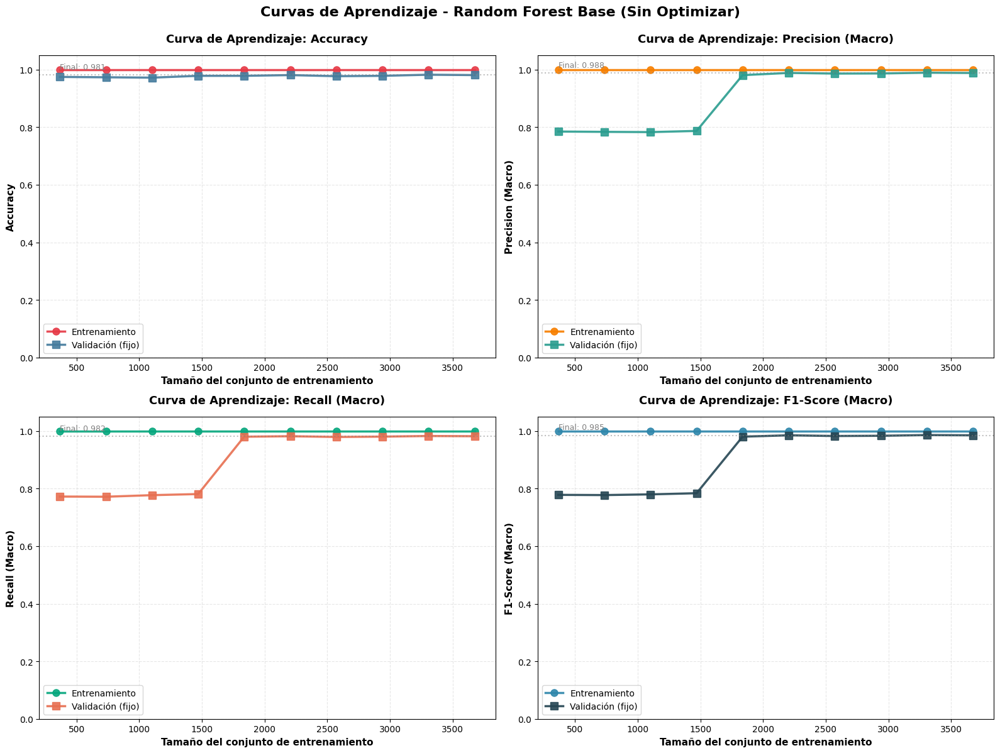

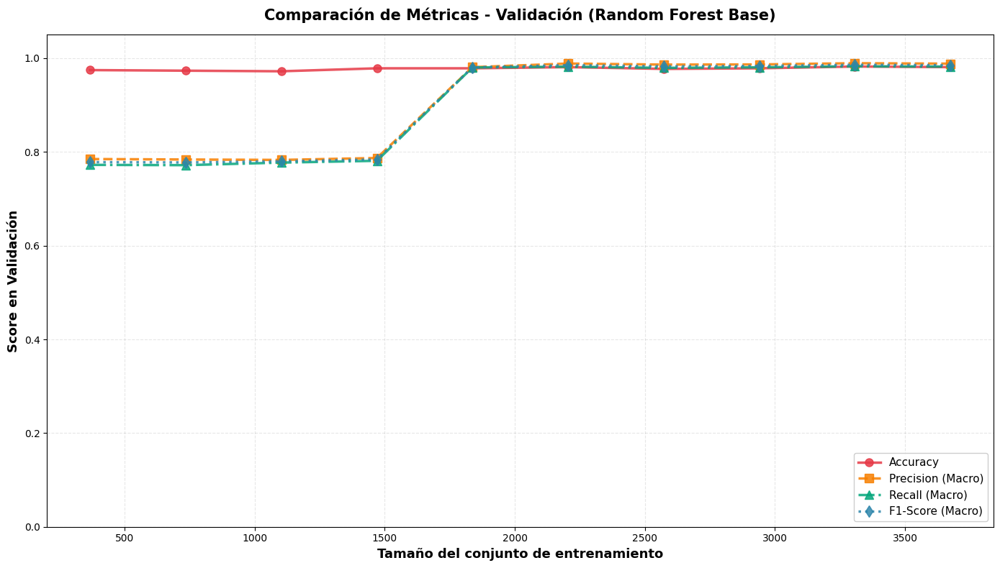


                    ANÁLISIS DE BRECHA (TRAIN-VAL GAP)
Métrica                  Train Final       Val Final          Gap          Estado
────────────────────────────────────────────────────────────────────────────────
Accuracy                      1.0000          0.9809       0.0191     ✅ Excelente
Precision (Macro)             1.0000          0.9883       0.0117     ✅ Excelente
Recall (Macro)                1.0000          0.9820       0.0180     ✅ Excelente
F1-Score (Macro)              1.0000          0.9850       0.0150     ✅ Excelente

                    ANÁLISIS DE CONVERGENCIA

Accuracy:
   • Score final (validación):      0.9809
   • Pendiente últimos 2 puntos:    -0.00127
   • Estado: ✅ CONVERGIÓ - Modelo alcanzó su potencial

Precision (Macro):
   • Score final (validación):      0.9883
   • Pendiente últimos 2 puntos:    -0.00096
   • Estado: ✅ CONVERGIÓ - Modelo alcanzó su potencial

Recall (Macro):
   • Score final (validación):      0.9820
   • Pendiente últimos 2 punto

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

print("="*80)
print(" "*5 + "CURVAS DE APRENDIZAJE - RANDOM FOREST BASE (SIN OPTIMIZAR)")
print("="*80)

# Verificar que el modelo existe
if 'rf_base' not in globals():
    print(" ERROR: Modelo Random Forest base no encontrado")
    print("   Ejecuta primero el entrenamiento del Random Forest base")
else:
    # --- Función para generar curvas con división fija ---
    def plot_learning_curves_fixed_split(model, X_train, y_train, X_val, y_val,
                                         train_sizes=np.linspace(0.1, 1.0, 10)):
        """
        Genera curvas de aprendizaje usando los conjuntos de entrenamiento y validación fijos.

        Parameters:
        -----------
        model : estimador de sklearn
            Modelo ya entrenado o instancia del modelo
        X_train, y_train : arrays
            Conjunto de entrenamiento
        X_val, y_val : arrays
            Conjunto de validación (fijo, no se usa CV)
        train_sizes : array
            Proporciones del conjunto de entrenamiento a usar
        """

        # Almacenar resultados
        results = {
            'train_sizes_abs': [],
            'train_accuracy': [],
            'val_accuracy': [],
            'train_precision': [],
            'val_precision': [],
            'train_recall': [],
            'val_recall': [],
            'train_f1': [],
            'val_f1': []
        }

        n_samples = len(X_train)

        print(f"\n Entrenando con diferentes tamaños de conjunto...")
        print(f"   Total de muestras disponibles: {n_samples}")
        print(f"   Tamaños a probar: {len(train_sizes)}\n")

        for i, size in enumerate(train_sizes, 1):
            # Calcular número de muestras
            n_train = int(n_samples * size)
            results['train_sizes_abs'].append(n_train)

            # Seleccionar subset del entrenamiento
            indices = np.random.RandomState(42).choice(n_samples, n_train, replace=False)
            X_train_subset = X_train[indices]
            y_train_subset = y_train.iloc[indices] if hasattr(y_train, 'iloc') else y_train[indices]

            # Entrenar el modelo con el subset
            model_temp = model.__class__(**model.get_params())
            model_temp.fit(X_train_subset, y_train_subset)

            # Predecir en entrenamiento y validación
            y_train_pred = model_temp.predict(X_train_subset)
            y_val_pred = model_temp.predict(X_val)

            # Calcular métricas en entrenamiento
            results['train_accuracy'].append(accuracy_score(y_train_subset, y_train_pred))
            results['train_precision'].append(precision_score(y_train_subset, y_train_pred, average='macro', zero_division=0))
            results['train_recall'].append(recall_score(y_train_subset, y_train_pred, average='macro', zero_division=0))
            results['train_f1'].append(f1_score(y_train_subset, y_train_pred, average='macro', zero_division=0))

            # Calcular métricas en validación
            results['val_accuracy'].append(accuracy_score(y_val, y_val_pred))
            results['val_precision'].append(precision_score(y_val, y_val_pred, average='macro', zero_division=0))
            results['val_recall'].append(recall_score(y_val, y_val_pred, average='macro', zero_division=0))
            results['val_f1'].append(f1_score(y_val, y_val_pred, average='macro', zero_division=0))

            print(f"   [{i}/{len(train_sizes)}] Tamaño: {n_train:5d} | "
                  f"Acc Train: {results['train_accuracy'][-1]:.4f} | "
                  f"Acc Val: {results['val_accuracy'][-1]:.4f}")

        print("\n Curvas calculadas correctamente!")
        return results


    # --- Generar las curvas ---
    print("\n Generando curvas de aprendizaje para Random Forest base...")
    learning_results_rf = plot_learning_curves_fixed_split(
        model=rf_base,
        X_train=X_train_anova,
        y_train=y_train,
        X_val=X_val_anova,
        y_val=y_val,
        train_sizes=np.linspace(0.1, 1.0, 10)
    )

    # ============================================================================
    #                     VISUALIZACIÓN: 4 MÉTRICAS INDIVIDUALES
    # ============================================================================

    print("\n Generando visualizaciones...")

    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    axes = axes.ravel()

    metrics = [
        ('accuracy', 'Accuracy'),
        ('precision', 'Precision (Macro)'),
        ('recall', 'Recall (Macro)'),
        ('f1', 'F1-Score (Macro)')
    ]

    colors_train = ['#E63946', '#F77F00', '#06A77D', '#2E86AB']
    colors_val = ['#457B9D', '#2A9D8F', '#E76F51', '#264653']

    for idx, (metric, title) in enumerate(metrics):
        train_key = f'train_{metric}'
        val_key = f'val_{metric}'

        # Curva de entrenamiento
        axes[idx].plot(
            learning_results_rf['train_sizes_abs'],
            learning_results_rf[train_key],
            'o-',
            color=colors_train[idx],
            linewidth=2.5,
            markersize=8,
            label='Entrenamiento',
            alpha=0.9
        )

        # Curva de validación
        axes[idx].plot(
            learning_results_rf['train_sizes_abs'],
            learning_results_rf[val_key],
            's-',
            color=colors_val[idx],
            linewidth=2.5,
            markersize=8,
            label='Validación (fijo)',
            alpha=0.9
        )

        # Configuración
        axes[idx].set_xlabel('Tamaño del conjunto de entrenamiento', fontsize=11, fontweight='bold')
        axes[idx].set_ylabel(title, fontsize=11, fontweight='bold')
        axes[idx].set_title(f'Curva de Aprendizaje: {title}', fontsize=13, fontweight='bold', pad=15)
        axes[idx].legend(loc='best', fontsize=10)
        axes[idx].grid(True, alpha=0.3, linestyle='--')
        axes[idx].set_ylim([0, 1.05])

        # Línea del valor final en validación
        final_val = learning_results_rf[val_key][-1]
        axes[idx].axhline(y=final_val, color='gray', linestyle=':', linewidth=1.5, alpha=0.5)
        axes[idx].text(
            learning_results_rf['train_sizes_abs'][0],
            final_val + 0.02,
            f'Final: {final_val:.3f}',
            fontsize=9,
            color='gray'
        )

    plt.suptitle('Curvas de Aprendizaje - Random Forest Base (Sin Optimizar)',
                 fontsize=16, fontweight='bold', y=0.995)
    plt.tight_layout()
    plt.show()

    # ============================================================================
    #                     GRÁFICO COMBINADO
    # ============================================================================

    fig, ax = plt.subplots(figsize=(14, 8))

    line_styles = ['-', '--', '-.', ':']
    markers = ['o', 's', '^', 'd']
    colors = ['#E63946', '#F77F00', '#06A77D', '#2E86AB']

    for idx, (metric, title) in enumerate(metrics):
        val_key = f'val_{metric}'
        ax.plot(
            learning_results_rf['train_sizes_abs'],
            learning_results_rf[val_key],
            linestyle=line_styles[idx],
            marker=markers[idx],
            color=colors[idx],
            linewidth=2.5,
            markersize=8,
            label=f'{title}',
            alpha=0.85
        )

    ax.set_xlabel('Tamaño del conjunto de entrenamiento', fontsize=13, fontweight='bold')
    ax.set_ylabel('Score en Validación', fontsize=13, fontweight='bold')
    ax.set_title('Comparación de Métricas - Validación (Random Forest Base)',
                 fontsize=15, fontweight='bold', pad=15)
    ax.legend(loc='lower right', fontsize=11, framealpha=0.95)
    ax.grid(True, alpha=0.3, linestyle='--')
    ax.set_ylim([0, 1.05])
    plt.tight_layout()
    plt.show()

    # ============================================================================
    #                     ANÁLISIS DEL GAP (TRAIN vs VAL)
    # ============================================================================

    print("\n" + "="*80)
    print(" "*20 + "ANÁLISIS DE BRECHA (TRAIN-VAL GAP)")
    print("="*80)
    print(f"{'Métrica':<20} {'Train Final':>15} {'Val Final':>15} {'Gap':>12} {'Estado':>15}")
    print("─"*80)

    for metric, title in metrics:
        train_key = f'train_{metric}'
        val_key = f'val_{metric}'

        train_final = learning_results_rf[train_key][-1]
        val_final = learning_results_rf[val_key][-1]
        gap = train_final - val_final

        # Diagnóstico
        if gap < 0.02:
            estado = "✅ Excelente"
        elif gap < 0.05:
            estado = "🟢 Bueno"
        elif gap < 0.10:
            estado = "🟡 Moderado"
        else:
            estado = "🔴 Alto"

        print(f"{title:<20} {train_final:>15.4f} {val_final:>15.4f} {gap:>12.4f} {estado:>15}")

    print("="*80)

    # ============================================================================
    #                     ANÁLISIS DE CONVERGENCIA
    # ============================================================================

    print("\n" + "="*80)
    print(" "*20 + "ANÁLISIS DE CONVERGENCIA")
    print("="*80)

    for metric, title in metrics:
        val_key = f'val_{metric}'
        val_scores = learning_results_rf[val_key]

        # Pendiente entre los últimos dos puntos
        if len(val_scores) >= 2:
            slope = val_scores[-1] - val_scores[-2]

            print(f"\n{title}:")
            print(f"   • Score final (validación):      {val_scores[-1]:.4f}")
            print(f"   • Pendiente últimos 2 puntos:    {slope:+.5f}")

            if abs(slope) < 0.005:
                print(f"   • Estado: ✅ CONVERGIÓ - Modelo alcanzó su potencial")
            elif slope > 0:
                print(f"   • Estado: 🟡 MEJORANDO - Más datos podrían ayudar")
            else:
                print(f"   • Estado: 🔴 EMPEORANDO - Posible sobreajuste")

    print("="*80)

    # ============================================================================
    #                     DIAGNÓSTICO GENERAL
    # ============================================================================

    print("\n" + "="*80)
    print(" "*25 + "DIAGNÓSTICO GENERAL")
    print("="*80)

    # Calcular gaps promedio
    avg_gap = np.mean([
        learning_results_rf[f'train_{metric}'][-1] - learning_results_rf[f'val_{metric}'][-1]
        for metric, _ in metrics
    ])

    # Promedio de rendimiento en validación
    avg_val_score = np.mean([
        learning_results_rf[f'val_{metric}'][-1]
        for metric, _ in metrics
    ])

    print(f"\n MÉTRICAS RESUMEN:")
    print(f"   • Gap promedio (Train-Val):       {avg_gap:.4f}")
    print(f"   • Score promedio en validación:   {avg_val_score:.4f}")

    print(f"\n DIAGNÓSTICO:")

    if avg_gap > 0.10:
        print("    OVERFITTING DETECTADO")
        print("   El modelo memoriza el conjunto de entrenamiento pero generaliza mal.")
        print("\n   Soluciones sugeridas:")
        print("   1. Aumentar min_samples_split y min_samples_leaf")
        print("   2. Limitar max_depth")
        print("   3. Reducir n_estimators")
        print("   4. Obtener más datos de entrenamiento")

    elif avg_gap < 0.02 and avg_val_score < 0.70:
        print("    UNDERFITTING DETECTADO")
        print("   El modelo es demasiado simple para los datos.")
        print("\n   Soluciones sugeridas:")
        print("   1. Aumentar n_estimators")
        print("   2. Permitir mayor max_depth")
        print("   3. Agregar más características (feature engineering)")

    elif avg_gap < 0.05 and avg_val_score >= 0.75:
        print("    MODELO BIEN AJUSTADO")
        print("   Buen balance entre sesgo y varianza.")
        print("\n    Próximo paso: Optimizar hiperparámetros")

    else:
        print("    MODELO ACEPTABLE CON MARGEN DE MEJORA")
        print("\n   Sugerencias:")
        print("   1. Optimizar hiperparámetros con GridSearchCV")
        print("   2. Probar diferentes valores de max_features")
        print("   3. Ajustar criterio (gini vs entropy)")

    # Verificar si más datos ayudarían
    val_f1 = learning_results_rf['val_f1']
    if len(val_f1) >= 3:
        improvement = val_f1[-1] - val_f1[-3]
        if improvement > 0.01:
            print("\n    MÁS DATOS PODRÍAN AYUDAR")
            print("   La curva aún muestra tendencia creciente.")
        else:
            print("\n    MÁS DATOS PROBABLEMENTE NO AYUDARÁN MUCHO")
            print("   La curva ya se estabilizó. Enfócate en optimización.")

    # Comparar con modelo óptimo si existe
    if 'best_rf' in globals():
        print("\n NOTA: Ya tienes un modelo optimizado (best_rf)")
        print("   Puedes comparar las curvas de aprendizaje de ambos modelos")

    print("\n" + "="*80)
    print(" ANÁLISIS DE CURVAS DE APRENDIZAJE COMPLETADO")
    print("\n SIGUIENTE PASO:")
    print("   Optimizar hiperparámetros para mejorar el rendimiento")
    print("="*80)

## Optimización de hiperparámetros

          OPTIMIZACIÓN DE HIPERPARÁMETROS - RANDOM FOREST

 PASO 1: Definiendo espacio de búsqueda de hiperparámetros...

✓ Espacio de búsqueda definido:
   • n_estimators:      [50, 100, 200]
   • max_depth:         [10, 20, 30, None]
   • min_samples_split: [2, 5, 10]
   • min_samples_leaf:  [1, 2, 4]
   • max_features:      ['sqrt', 'log2']
   • criterion:         ['gini', 'entropy']

    Total de combinaciones: 432
     Tiempo estimado: ~216-864 minutos

                    2. EJECUTANDO GRIDSEARCHCV

 Configurando GridSearchCV...
   • Validación cruzada: 5-fold
   • Métrica principal: f1_macro
   • Métricas adicionales: accuracy, precision, recall

 ENTRENANDO... (Esto puede tomar varios minutos)
   Por favor espera...

Fitting 5 folds for each of 432 candidates, totalling 2160 fits


/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(



 GridSearchCV completado en 24.36 minutos (1461.42 segundos)

                    3. MEJORES HIPERPARÁMETROS ENCONTRADOS

 MEJORES HIPERPARÁMETROS (según F1-macro):
   • bootstrap           : True
   • criterion           : gini
   • max_depth           : 20
   • max_features        : sqrt
   • min_samples_leaf    : 1
   • min_samples_split   : 5
   • n_estimators        : 50

 MEJOR SCORE EN VALIDACIÓN CRUZADA:
   • F1-macro (CV):     0.9381

 Mejor modelo obtenido y listo para usar

                    4. ANÁLISIS DE RESULTADOS DEL GRID

 TOP 10 MEJORES COMBINACIONES:

   Rank 1:
   • F1-macro:  0.9381 (±0.0756)
   • Accuracy:  0.9761
   • Params:    {'bootstrap': True, 'criterion': 'gini', 'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 50}

   Rank 1:
   • F1-macro:  0.9381 (±0.0756)
   • Accuracy:  0.9761
   • Params:    {'bootstrap': True, 'criterion': 'gini', 'max_depth': 20, 'max_features': 'log2', 'min_samples_leaf': 1, 

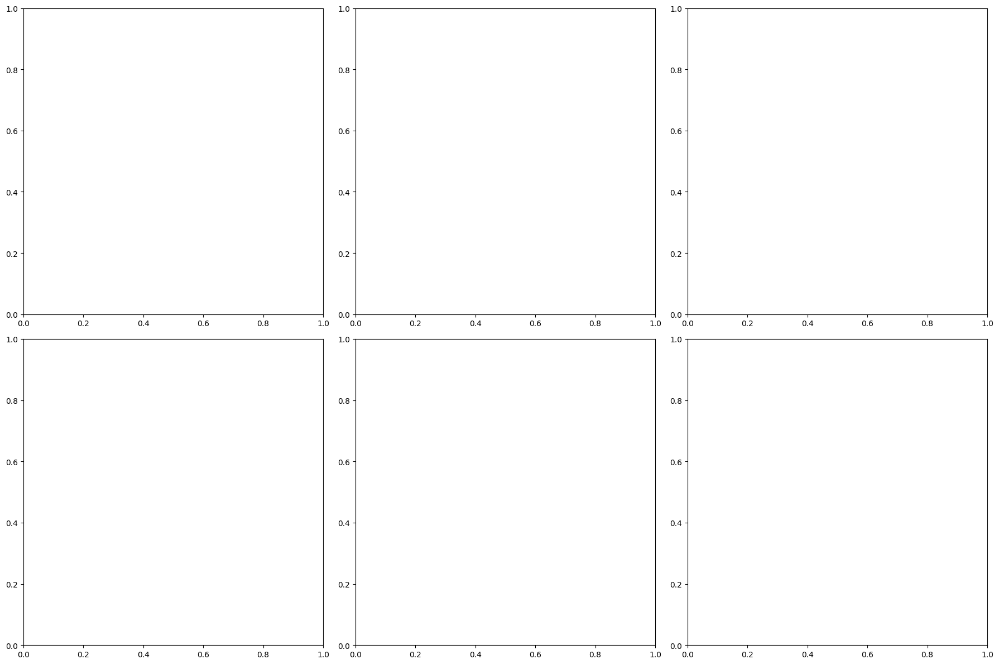


               5. COMPARACIÓN: MODELO BASE vs OPTIMIZADO (VALIDACIÓN)

 RESULTADOS EN VALIDACIÓN:
  Métrica   Base  Optimizado  Mejora  Mejora_%
 Accuracy 0.9797      0.9822  0.0025    0.2594
Precision 0.9877      0.9891  0.0014    0.1453
   Recall 0.9811      0.9827  0.0016    0.1597
 F1-Score 0.9843      0.9858  0.0015    0.1536


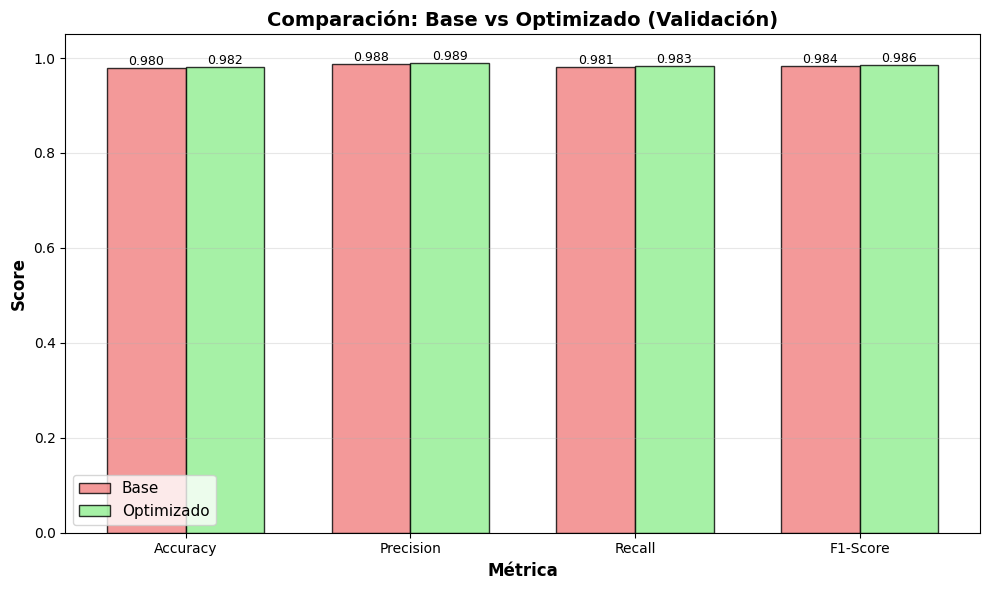


                    6. EVALUACIÓN EN TEST (MODELO OPTIMIZADO)

 MÉTRICAS EN TEST (MODELO OPTIMIZADO):
   • Accuracy:           0.9759 (97.59%)
   • Precision (macro):  0.9851
   • Recall (macro):     0.9730
   • F1-Score (macro):   0.9788

 REPORTE DE CLASIFICACIÓN (TEST - OPTIMIZADO):
              precision    recall  f1-score   support

   Gas Giant     0.9799    0.9959    0.9879       245
Neptune-like     0.9707    0.9672    0.9689       274
 Super Earth     0.9748    0.9707    0.9727       239
 Terrestrial     1.0000    0.9310    0.9643        29
     Unknown     1.0000    1.0000    1.0000         1

    accuracy                         0.9759       788
   macro avg     0.9851    0.9730    0.9788       788
weighted avg     0.9759    0.9759    0.9758       788



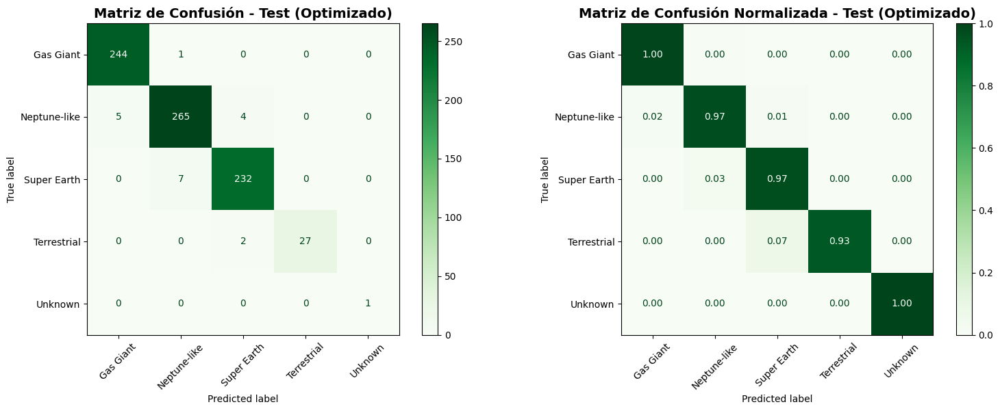


               7. COMPARACIÓN FINAL: BASE vs OPTIMIZADO (TEST)

 RESULTADOS EN TEST:
  Métrica   Base  Optimizado  Mejora  Mejora_%
 Accuracy 0.9772      0.9759 -0.0013   -0.1299
Precision 0.9858      0.9851 -0.0007   -0.0743
   Recall 0.9737      0.9730 -0.0007   -0.0750
 F1-Score 0.9795      0.9788 -0.0007   -0.0747


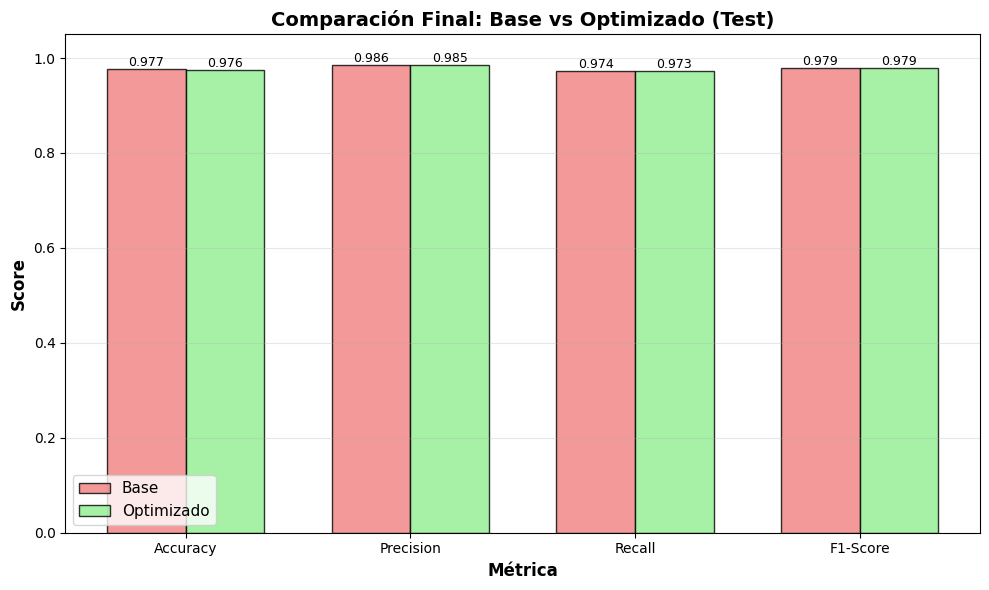


                    8. FEATURE IMPORTANCE (MODELO OPTIMIZADO)

 Top 10 Features más importantes (Modelo Optimizado):
                 Feature  Importance
       radius_multiplier      0.2642
        mass_wrt_Jupiter      0.2004
      radius_wrt_Jupiter      0.1922
         mass_multiplier      0.1829
          orbital_radius      0.0469
       stellar_magnitude      0.0273
            eccentricity      0.0235
detection_method_Transit      0.0205
          discovery_year      0.0181
                distance      0.0155


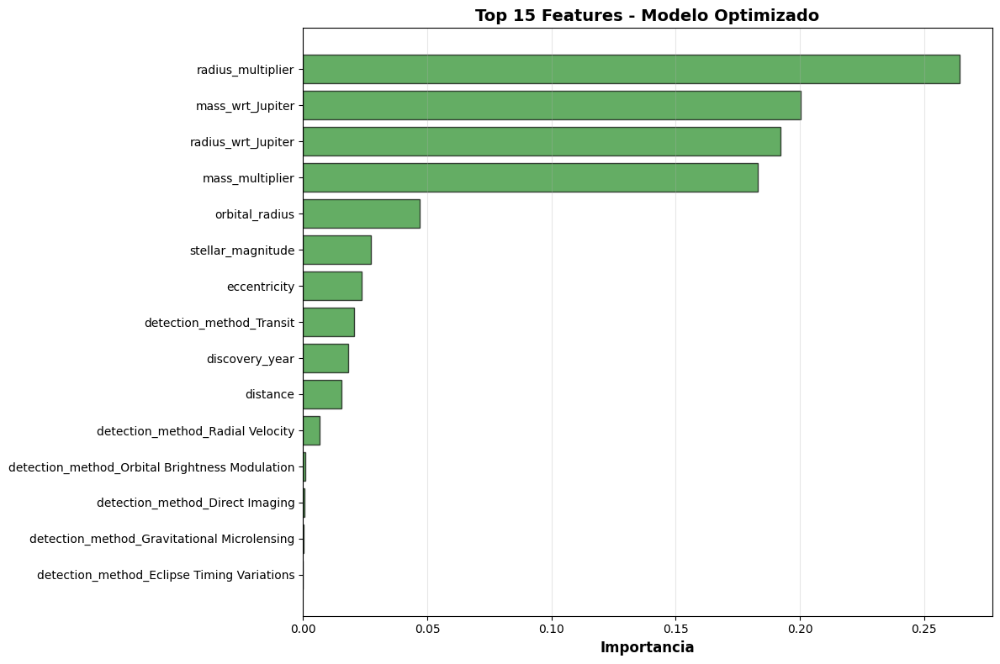


                               RESUMEN FINAL

 MEJORES HIPERPARÁMETROS:
   • bootstrap           : True
   • criterion           : gini
   • max_depth           : 20
   • max_features        : sqrt
   • min_samples_leaf    : 1
   • min_samples_split   : 5
   • n_estimators        : 50

 RENDIMIENTO FINAL EN TEST:
   • Accuracy:   0.9759 (97.59%)
   • Precision:  0.9851
   • Recall:     0.9730
   • F1-Score:   0.9788

 MEJORA SOBRE MODELO BASE:
   • Mejora en F1-Score: -0.0007 (-0.07%)
   ➡️  La optimización no mejoró el modelo (base ya era bueno)

  TIEMPO DE OPTIMIZACIÓN: 24.36 minutos

 MODELO GUARDADO EN VARIABLE: best_rf

 OPTIMIZACIÓN Y EVALUACIÓN COMPLETADAS


In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    classification_report, confusion_matrix, ConfusionMatrixDisplay
)
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import time

print("="*90)
print(" "*10 + "OPTIMIZACIÓN DE HIPERPARÁMETROS - RANDOM FOREST")
print("="*90)

# ============================================================================
#                     1. DEFINIR ESPACIO DE BÚSQUEDA
# ============================================================================

print("\n PASO 1: Definiendo espacio de búsqueda de hiperparámetros...")

# Espacio de búsqueda (puedes ajustarlo según tus necesidades)
param_grid = {
    'n_estimators': [50, 100, 200],                    # Número de árboles
    'max_depth': [10, 20, 30, None],                   # Profundidad máxima
    'min_samples_split': [2, 5, 10],                   # Mínimo de muestras para dividir
    'min_samples_leaf': [1, 2, 4],                     # Mínimo de muestras en hoja
    'max_features': ['sqrt', 'log2'],                  # Features por árbol
    'bootstrap': [True],                                # Bootstrap siempre True
    'criterion': ['gini', 'entropy']                   # Criterio de división
}

# Calcular total de combinaciones
total_combinations = np.prod([len(v) for v in param_grid.values()])

print(f"\n✓ Espacio de búsqueda definido:")
print(f"   • n_estimators:      {param_grid['n_estimators']}")
print(f"   • max_depth:         {param_grid['max_depth']}")
print(f"   • min_samples_split: {param_grid['min_samples_split']}")
print(f"   • min_samples_leaf:  {param_grid['min_samples_leaf']}")
print(f"   • max_features:      {param_grid['max_features']}")
print(f"   • criterion:         {param_grid['criterion']}")
print(f"\n    Total de combinaciones: {total_combinations}")
print(f"     Tiempo estimado: ~{total_combinations * 0.5:.0f}-{total_combinations * 2:.0f} minutos")

# ============================================================================
#                     2. EJECUTAR GRIDSEARCHCV
# ============================================================================

print("\n" + "="*90)
print(" "*20 + "2. EJECUTANDO GRIDSEARCHCV")
print("="*90)

# Crear modelo base
rf = RandomForestClassifier(
    random_state=8,
    n_jobs=-1,
    verbose=0
)

# Configurar GridSearchCV
print("\n Configurando GridSearchCV...")
print("   • Validación cruzada: 5-fold")
print("   • Métrica principal: f1_macro")
print("   • Métricas adicionales: accuracy, precision, recall")

grid_search = GridSearchCV(
    estimator=rf,
    param_grid=param_grid,
    scoring={
        'accuracy': 'accuracy',
        'f1_macro': 'f1_macro',
        'precision_macro': 'precision_macro',
        'recall_macro': 'recall_macro'
    },
    refit='f1_macro',  # Seleccionar mejor modelo por F1-macro
    cv=5,
    n_jobs=-1,
    verbose=2,
    return_train_score=True
)

print("\n ENTRENANDO... (Esto puede tomar varios minutos)")
print("   Por favor espera...\n")

start_time = time.time()
grid_search.fit(X_train_anova, y_train)
training_time = time.time() - start_time

print(f"\n GridSearchCV completado en {training_time/60:.2f} minutos ({training_time:.2f} segundos)")

# ============================================================================
#                     3. MEJORES HIPERPARÁMETROS
# ============================================================================

print("\n" + "="*90)
print(" "*20 + "3. MEJORES HIPERPARÁMETROS ENCONTRADOS")
print("="*90)

best_params = grid_search.best_params_
best_score = grid_search.best_score_

print(f"\n MEJORES HIPERPARÁMETROS (según F1-macro):")
for param, value in best_params.items():
    print(f"   • {param:20s}: {value}")

print(f"\n MEJOR SCORE EN VALIDACIÓN CRUZADA:")
print(f"   • F1-macro (CV):     {best_score:.4f}")

# Obtener el mejor modelo
best_rf = grid_search.best_estimator_

print(f"\n Mejor modelo obtenido y listo para usar")

# ============================================================================
#                     4. ANÁLISIS DE RESULTADOS DEL GRID
# ============================================================================

print("\n" + "="*90)
print(" "*20 + "4. ANÁLISIS DE RESULTADOS DEL GRID")
print("="*90)

# Crear DataFrame con resultados
results_df = pd.DataFrame(grid_search.cv_results_)

# Top 10 mejores combinaciones
top_10 = results_df.nsmallest(10, 'rank_test_f1_macro')[
    ['params', 'mean_test_f1_macro', 'std_test_f1_macro',
     'mean_test_accuracy', 'rank_test_f1_macro']
]

print("\n TOP 10 MEJORES COMBINACIONES:")
for idx, row in top_10.iterrows():
    print(f"\n   Rank {int(row['rank_test_f1_macro'])}:")
    print(f"   • F1-macro:  {row['mean_test_f1_macro']:.4f} (±{row['std_test_f1_macro']:.4f})")
    print(f"   • Accuracy:  {row['mean_test_accuracy']:.4f}")
    print(f"   • Params:    {row['params']}")

# Visualizar importancia de hiperparámetros
print("\n Generando visualizaciones de hiperparámetros...")

fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.ravel()

# Analizar efecto de cada hiperparámetro
hyperparams = ['n_estimators', 'max_depth', 'min_samples_split',
               'min_samples_leaf', 'max_features', 'criterion']

for idx, param in enumerate(hyperparams):
    if param in results_df.columns:
        # Agrupar por parámetro
        param_col = f'param_{param}'
        grouped = results_df.groupby(param_col)['mean_test_f1_macro'].mean().sort_index()

        if param in ['max_depth', 'n_estimators', 'min_samples_split', 'min_samples_leaf']:
            # Gráfico de línea para numéricos
            axes[idx].plot(grouped.index.astype(str), grouped.values, 'o-',
                          linewidth=2.5, markersize=8, color='steelblue')
        else:
            # Gráfico de barras para categóricos
            axes[idx].bar(range(len(grouped)), grouped.values,
                         color='steelblue', alpha=0.7, edgecolor='black')
            axes[idx].set_xticks(range(len(grouped)))
            axes[idx].set_xticklabels(grouped.index.astype(str), rotation=45)

        axes[idx].set_xlabel(param, fontsize=11, fontweight='bold')
        axes[idx].set_ylabel('F1-macro (CV)', fontsize=11, fontweight='bold')
        axes[idx].set_title(f'Efecto de {param}', fontsize=12, fontweight='bold')
        axes[idx].grid(True, alpha=0.3)
        axes[idx].axhline(y=best_score, color='red', linestyle='--',
                         linewidth=1.5, alpha=0.7, label='Mejor score')
        axes[idx].legend(fontsize=8)

plt.tight_layout()
plt.show()

# ============================================================================
#                     5. COMPARACIÓN: BASE vs OPTIMIZADO (VALIDACIÓN)
# ============================================================================

print("\n" + "="*90)
print(" "*15 + "5. COMPARACIÓN: MODELO BASE vs OPTIMIZADO (VALIDACIÓN)")
print("="*90)

# Predicciones del modelo base
if 'rf_base' in globals():
    y_pred_base_val = rf_base.predict(X_val_anova)
    acc_base_val = accuracy_score(y_val, y_pred_base_val)
    f1_base_val = f1_score(y_val, y_pred_base_val, average='macro')
    prec_base_val = precision_score(y_val, y_pred_base_val, average='macro', zero_division=0)
    rec_base_val = recall_score(y_val, y_pred_base_val, average='macro', zero_division=0)
else:
    print("  Modelo base no encontrado, solo se mostrará el optimizado")
    acc_base_val = f1_base_val = prec_base_val = rec_base_val = 0

# Predicciones del modelo optimizado
y_pred_opt_val = best_rf.predict(X_val_anova)
acc_opt_val = accuracy_score(y_val, y_pred_opt_val)
f1_opt_val = f1_score(y_val, y_pred_opt_val, average='macro')
prec_opt_val = precision_score(y_val, y_pred_opt_val, average='macro', zero_division=0)
rec_opt_val = recall_score(y_val, y_pred_opt_val, average='macro', zero_division=0)

# Tabla comparativa
comparison_val = pd.DataFrame({
    'Métrica': ['Accuracy', 'Precision', 'Recall', 'F1-Score'],
    'Base': [acc_base_val, prec_base_val, rec_base_val, f1_base_val],
    'Optimizado': [acc_opt_val, prec_opt_val, rec_opt_val, f1_opt_val]
})
comparison_val['Mejora'] = comparison_val['Optimizado'] - comparison_val['Base']
comparison_val['Mejora_%'] = (comparison_val['Mejora'] / comparison_val['Base']) * 100

print("\n RESULTADOS EN VALIDACIÓN:")
print(comparison_val.to_string(index=False, float_format='%.4f'))

# Visualización
fig, ax = plt.subplots(figsize=(10, 6))

x = np.arange(len(comparison_val))
width = 0.35

bars1 = ax.bar(x - width/2, comparison_val['Base'], width,
              label='Base', color='lightcoral', alpha=0.8, edgecolor='black')
bars2 = ax.bar(x + width/2, comparison_val['Optimizado'], width,
              label='Optimizado', color='lightgreen', alpha=0.8, edgecolor='black')

ax.set_ylabel('Score', fontsize=12, fontweight='bold')
ax.set_xlabel('Métrica', fontsize=12, fontweight='bold')
ax.set_title('Comparación: Base vs Optimizado (Validación)', fontsize=14, fontweight='bold')
ax.set_xticks(x)
ax.set_xticklabels(comparison_val['Métrica'])
ax.legend(fontsize=11)
ax.set_ylim([0, 1.05])
ax.grid(axis='y', alpha=0.3)

for bars in [bars1, bars2]:
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height,
               f'{height:.3f}', ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()

# ============================================================================
#                     6. EVALUACIÓN EN TEST (MODELO OPTIMIZADO)
# ============================================================================

print("\n" + "="*90)
print(" "*20 + "6. EVALUACIÓN EN TEST (MODELO OPTIMIZADO)")
print("="*90)

# Predicciones en test
y_pred_opt_test = best_rf.predict(X_test_anova)
y_proba_opt_test = best_rf.predict_proba(X_test_anova)

# Métricas
acc_opt_test = accuracy_score(y_test, y_pred_opt_test)
prec_opt_test = precision_score(y_test, y_pred_opt_test, average='macro', zero_division=0)
rec_opt_test = recall_score(y_test, y_pred_opt_test, average='macro', zero_division=0)
f1_opt_test = f1_score(y_test, y_pred_opt_test, average='macro', zero_division=0)

print(f"\n MÉTRICAS EN TEST (MODELO OPTIMIZADO):")
print(f"   • Accuracy:           {acc_opt_test:.4f} ({acc_opt_test*100:.2f}%)")
print(f"   • Precision (macro):  {prec_opt_test:.4f}")
print(f"   • Recall (macro):     {rec_opt_test:.4f}")
print(f"   • F1-Score (macro):   {f1_opt_test:.4f}")

# Reporte de clasificación
print("\n REPORTE DE CLASIFICACIÓN (TEST - OPTIMIZADO):")
print(classification_report(y_test, y_pred_opt_test, digits=4))

# Matriz de confusión
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

cm_opt_test = confusion_matrix(y_test, y_pred_opt_test)
disp_opt = ConfusionMatrixDisplay(confusion_matrix=cm_opt_test, display_labels=best_rf.classes_)
disp_opt.plot(cmap='Greens', ax=axes[0], xticks_rotation=45, values_format='d')
axes[0].set_title('Matriz de Confusión - Test (Optimizado)', fontsize=14, fontweight='bold')
axes[0].grid(False)

# Normalizada
cm_opt_test_norm = cm_opt_test.astype('float') / cm_opt_test.sum(axis=1)[:, np.newaxis]
disp_opt_norm = ConfusionMatrixDisplay(confusion_matrix=cm_opt_test_norm, display_labels=best_rf.classes_)
disp_opt_norm.plot(cmap='Greens', ax=axes[1], xticks_rotation=45, values_format='.2f')
axes[1].set_title('Matriz de Confusión Normalizada - Test (Optimizado)', fontsize=14, fontweight='bold')
axes[1].grid(False)

plt.tight_layout()
plt.show()

# ============================================================================
#                     7. COMPARACIÓN FINAL: BASE vs OPTIMIZADO (TEST)
# ============================================================================

print("\n" + "="*90)
print(" "*15 + "7. COMPARACIÓN FINAL: BASE vs OPTIMIZADO (TEST)")
print("="*90)

# Predicciones del modelo base en test
if 'rf_base' in globals():
    y_pred_base_test = rf_base.predict(X_test_anova)
    acc_base_test = accuracy_score(y_test, y_pred_base_test)
    f1_base_test = f1_score(y_test, y_pred_base_test, average='macro')
    prec_base_test = precision_score(y_test, y_pred_base_test, average='macro', zero_division=0)
    rec_base_test = recall_score(y_test, y_pred_base_test, average='macro', zero_division=0)
else:
    acc_base_test = f1_base_test = prec_base_test = rec_base_test = 0

# Tabla comparativa
comparison_test = pd.DataFrame({
    'Métrica': ['Accuracy', 'Precision', 'Recall', 'F1-Score'],
    'Base': [acc_base_test, prec_base_test, rec_base_test, f1_base_test],
    'Optimizado': [acc_opt_test, prec_opt_test, rec_opt_test, f1_opt_test]
})
comparison_test['Mejora'] = comparison_test['Optimizado'] - comparison_test['Base']
comparison_test['Mejora_%'] = (comparison_test['Mejora'] / comparison_test['Base']) * 100

print("\n RESULTADOS EN TEST:")
print(comparison_test.to_string(index=False, float_format='%.4f'))

# Visualización
fig, ax = plt.subplots(figsize=(10, 6))

bars1 = ax.bar(x - width/2, comparison_test['Base'], width,
              label='Base', color='lightcoral', alpha=0.8, edgecolor='black')
bars2 = ax.bar(x + width/2, comparison_test['Optimizado'], width,
              label='Optimizado', color='lightgreen', alpha=0.8, edgecolor='black')

ax.set_ylabel('Score', fontsize=12, fontweight='bold')
ax.set_xlabel('Métrica', fontsize=12, fontweight='bold')
ax.set_title('Comparación Final: Base vs Optimizado (Test)', fontsize=14, fontweight='bold')
ax.set_xticks(x)
ax.set_xticklabels(comparison_test['Métrica'])
ax.legend(fontsize=11)
ax.set_ylim([0, 1.05])
ax.grid(axis='y', alpha=0.3)

for bars in [bars1, bars2]:
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height,
               f'{height:.3f}', ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()

# ============================================================================
#                     8. FEATURE IMPORTANCE (MODELO OPTIMIZADO)
# ============================================================================

print("\n" + "="*90)
print(" "*20 + "8. FEATURE IMPORTANCE (MODELO OPTIMIZADO)")
print("="*90)

# Obtener importancias
feature_importance_opt = best_rf.feature_importances_

importance_opt_df = pd.DataFrame({
    'Feature': [top_anova_features[i] for i in range(len(selected_indices))],
    'Importance': feature_importance_opt
})

importance_opt_df = importance_opt_df.sort_values('Importance', ascending=False).reset_index(drop=True)

print("\n Top 10 Features más importantes (Modelo Optimizado):")
print(importance_opt_df.head(10).to_string(index=False, float_format='%.4f'))

# Visualización
fig, ax = plt.subplots(figsize=(12, 8))

top_n = min(15, len(importance_opt_df))
top_imp = importance_opt_df.head(top_n)

ax.barh(range(top_n), top_imp['Importance'],
       color='forestgreen', alpha=0.7, edgecolor='black')
ax.set_yticks(range(top_n))
ax.set_yticklabels(top_imp['Feature'], fontsize=10)
ax.set_xlabel('Importancia', fontsize=12, fontweight='bold')
ax.set_title(f'Top {top_n} Features - Modelo Optimizado', fontsize=14, fontweight='bold')
ax.invert_yaxis()
ax.grid(axis='x', alpha=0.3)

plt.tight_layout()
plt.show()

# ============================================================================
#                     9. RESUMEN FINAL
# ============================================================================

print("\n" + "="*90)
print(" "*30 + " RESUMEN FINAL")
print("="*90)

print(f"\n MEJORES HIPERPARÁMETROS:")
for param, value in best_params.items():
    print(f"   • {param:20s}: {value}")

print(f"\n RENDIMIENTO FINAL EN TEST:")
print(f"   • Accuracy:   {acc_opt_test:.4f} ({acc_opt_test*100:.2f}%)")
print(f"   • Precision:  {prec_opt_test:.4f}")
print(f"   • Recall:     {rec_opt_test:.4f}")
print(f"   • F1-Score:   {f1_opt_test:.4f}")

if 'rf_base' in globals():
    mejora_f1 = f1_opt_test - f1_base_test
    print(f"\n MEJORA SOBRE MODELO BASE:")
    print(f"   • Mejora en F1-Score: {mejora_f1:+.4f} ({(mejora_f1/f1_base_test)*100:+.2f}%)")

    if mejora_f1 > 0.02:
        print(f"   ✅ La optimización MEJORÓ significativamente el modelo")
    elif mejora_f1 > 0:
        print(f"   ✅ La optimización mejoró ligeramente el modelo")
    else:
        print(f"   ➡️  La optimización no mejoró el modelo (base ya era bueno)")

print(f"\n  TIEMPO DE OPTIMIZACIÓN: {training_time/60:.2f} minutos")

print(f"\n MODELO GUARDADO EN VARIABLE: best_rf")

print("\n" + "="*90)
print(" OPTIMIZACIÓN Y EVALUACIÓN COMPLETADAS")
print("="*90)

## Curvas de aprendizaje

     CURVAS DE APRENDIZAJE - RANDOM FOREST OPTIMIZADO

 Generando curvas de aprendizaje para Random Forest optimizado...

 Entrenando con diferentes tamaños de conjunto...
   Total de muestras disponibles: 3675
   Tamaños a probar: 10

   [1/10] Tamaño:   367 | Acc Train: 0.9864 | Acc Val: 0.9708
   [2/10] Tamaño:   735 | Acc Train: 0.9932 | Acc Val: 0.9733
   [3/10] Tamaño:  1102 | Acc Train: 0.9964 | Acc Val: 0.9682
   [4/10] Tamaño:  1470 | Acc Train: 0.9959 | Acc Val: 0.9746
   [5/10] Tamaño:  1837 | Acc Train: 0.9951 | Acc Val: 0.9759
   [6/10] Tamaño:  2205 | Acc Train: 0.9964 | Acc Val: 0.9784
   [7/10] Tamaño:  2572 | Acc Train: 0.9965 | Acc Val: 0.9809
   [8/10] Tamaño:  2940 | Acc Train: 0.9980 | Acc Val: 0.9835
   [9/10] Tamaño:  3307 | Acc Train: 0.9985 | Acc Val: 0.9809
   [10/10] Tamaño:  3675 | Acc Train: 0.9965 | Acc Val: 0.9809

 Curvas calculadas correctamente!

 Generando visualizaciones...


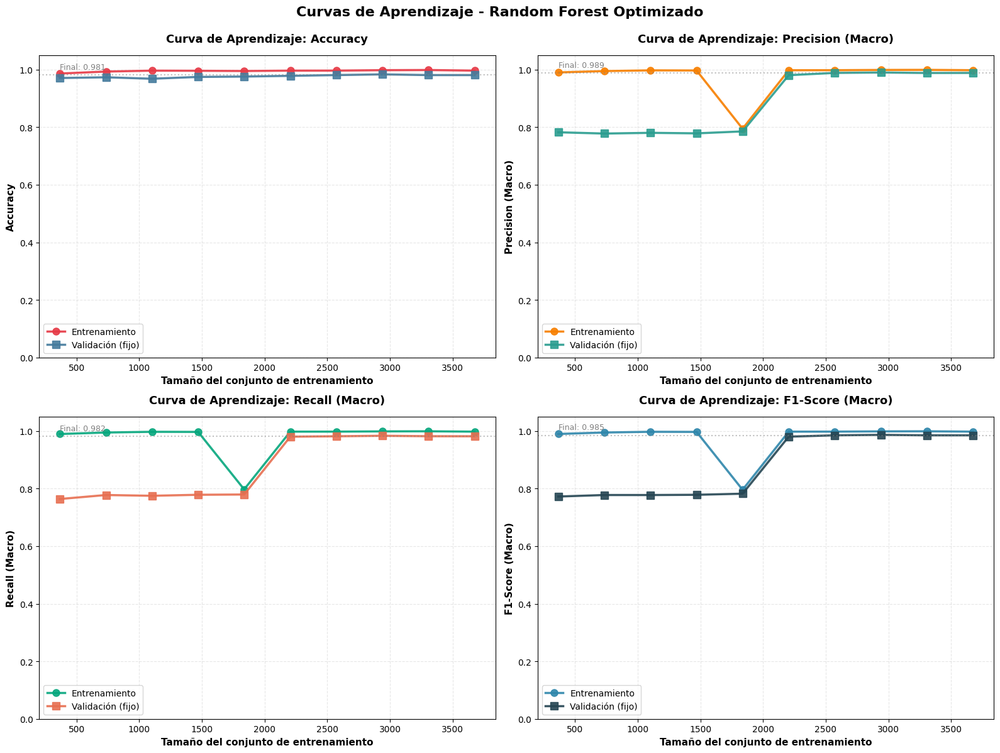

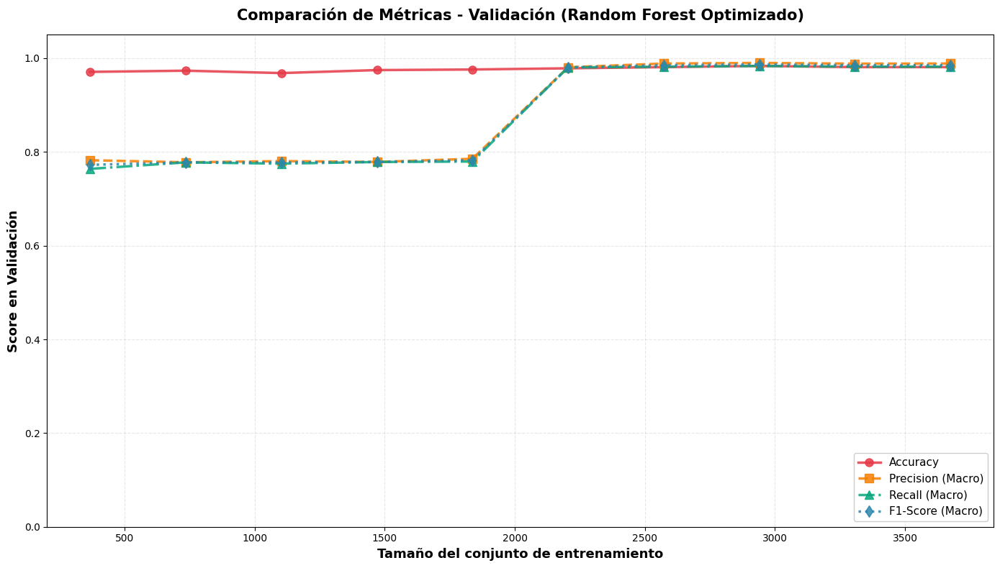


               COMPARACIÓN: MODELO BASE vs OPTIMIZADO


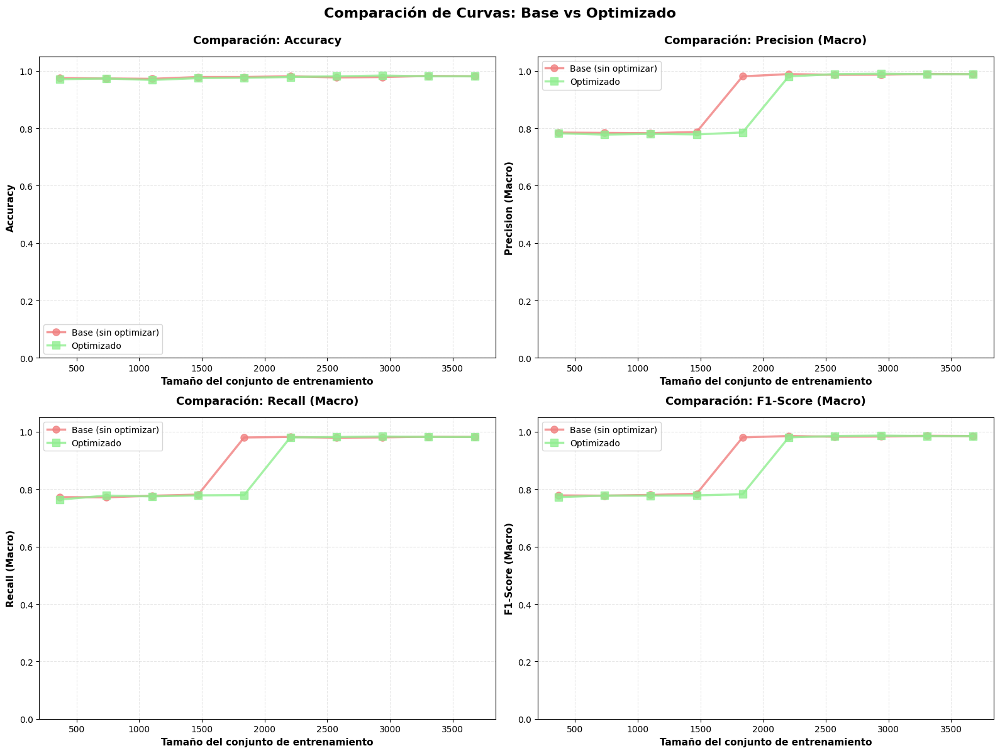


 COMPARACIÓN DE SCORES FINALES (100% de datos):
Métrica                      Base   Optimizado       Mejora
────────────────────────────────────────────────────────────────────────────────
Accuracy                   0.9809       0.9809      0.0000 ➡️
Precision (Macro)          0.9883       0.9885      0.0002 🟢
Recall (Macro)             0.9820       0.9817     -0.0002 🔴
F1-Score (Macro)           0.9850       0.9850     -0.0000 🔴

                    ANÁLISIS DE BRECHA (TRAIN-VAL GAP)
Métrica                  Train Final       Val Final          Gap          Estado
────────────────────────────────────────────────────────────────────────────────
Accuracy                      0.9965          0.9809       0.0155     ✅ Excelente
Precision (Macro)             0.9979          0.9885       0.0093     ✅ Excelente
Recall (Macro)                0.9978          0.9817       0.0160     ✅ Excelente
F1-Score (Macro)              0.9978          0.9850       0.0128     ✅ Excelente

                 

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

print("="*80)
print(" "*5 + "CURVAS DE APRENDIZAJE - RANDOM FOREST OPTIMIZADO")
print("="*80)

# Verificar que el modelo existe
if 'best_rf' not in globals():
    print(" ERROR: Modelo Random Forest optimizado no encontrado")
    print("   Ejecuta primero la optimización de hiperparámetros")
else:
    # --- Función para generar curvas con división fija ---
    def plot_learning_curves_fixed_split(model, X_train, y_train, X_val, y_val,
                                         train_sizes=np.linspace(0.1, 1.0, 10)):
        """
        Genera curvas de aprendizaje usando los conjuntos de entrenamiento y validación fijos.

        Parameters:
        -----------
        model : estimador de sklearn
            Modelo ya entrenado o instancia del modelo
        X_train, y_train : arrays
            Conjunto de entrenamiento
        X_val, y_val : arrays
            Conjunto de validación (fijo, no se usa CV)
        train_sizes : array
            Proporciones del conjunto de entrenamiento a usar
        """

        # Almacenar resultados
        results = {
            'train_sizes_abs': [],
            'train_accuracy': [],
            'val_accuracy': [],
            'train_precision': [],
            'val_precision': [],
            'train_recall': [],
            'val_recall': [],
            'train_f1': [],
            'val_f1': []
        }

        n_samples = len(X_train)

        print(f"\n Entrenando con diferentes tamaños de conjunto...")
        print(f"   Total de muestras disponibles: {n_samples}")
        print(f"   Tamaños a probar: {len(train_sizes)}\n")

        for i, size in enumerate(train_sizes, 1):
            # Calcular número de muestras
            n_train = int(n_samples * size)
            results['train_sizes_abs'].append(n_train)

            # Seleccionar subset del entrenamiento
            indices = np.random.RandomState(42).choice(n_samples, n_train, replace=False)
            X_train_subset = X_train[indices]
            y_train_subset = y_train.iloc[indices] if hasattr(y_train, 'iloc') else y_train[indices]

            # Entrenar el modelo con el subset
            model_temp = model.__class__(**model.get_params())
            model_temp.fit(X_train_subset, y_train_subset)

            # Predecir en entrenamiento y validación
            y_train_pred = model_temp.predict(X_train_subset)
            y_val_pred = model_temp.predict(X_val)

            # Calcular métricas en entrenamiento
            results['train_accuracy'].append(accuracy_score(y_train_subset, y_train_pred))
            results['train_precision'].append(precision_score(y_train_subset, y_train_pred, average='macro', zero_division=0))
            results['train_recall'].append(recall_score(y_train_subset, y_train_pred, average='macro', zero_division=0))
            results['train_f1'].append(f1_score(y_train_subset, y_train_pred, average='macro', zero_division=0))

            # Calcular métricas en validación
            results['val_accuracy'].append(accuracy_score(y_val, y_val_pred))
            results['val_precision'].append(precision_score(y_val, y_val_pred, average='macro', zero_division=0))
            results['val_recall'].append(recall_score(y_val, y_val_pred, average='macro', zero_division=0))
            results['val_f1'].append(f1_score(y_val, y_val_pred, average='macro', zero_division=0))

            print(f"   [{i}/{len(train_sizes)}] Tamaño: {n_train:5d} | "
                  f"Acc Train: {results['train_accuracy'][-1]:.4f} | "
                  f"Acc Val: {results['val_accuracy'][-1]:.4f}")

        print("\n Curvas calculadas correctamente!")
        return results


    # --- Generar las curvas ---
    print("\n Generando curvas de aprendizaje para Random Forest optimizado...")
    learning_results_rf_opt = plot_learning_curves_fixed_split(
        model=best_rf,
        X_train=X_train_anova,
        y_train=y_train,
        X_val=X_val_anova,
        y_val=y_val,
        train_sizes=np.linspace(0.1, 1.0, 10)
    )

    # ============================================================================
    #                     VISUALIZACIÓN: 4 MÉTRICAS INDIVIDUALES
    # ============================================================================

    print("\n Generando visualizaciones...")

    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    axes = axes.ravel()

    metrics = [
        ('accuracy', 'Accuracy'),
        ('precision', 'Precision (Macro)'),
        ('recall', 'Recall (Macro)'),
        ('f1', 'F1-Score (Macro)')
    ]

    colors_train = ['#E63946', '#F77F00', '#06A77D', '#2E86AB']
    colors_val = ['#457B9D', '#2A9D8F', '#E76F51', '#264653']

    for idx, (metric, title) in enumerate(metrics):
        train_key = f'train_{metric}'
        val_key = f'val_{metric}'

        # Curva de entrenamiento
        axes[idx].plot(
            learning_results_rf_opt['train_sizes_abs'],
            learning_results_rf_opt[train_key],
            'o-',
            color=colors_train[idx],
            linewidth=2.5,
            markersize=8,
            label='Entrenamiento',
            alpha=0.9
        )

        # Curva de validación
        axes[idx].plot(
            learning_results_rf_opt['train_sizes_abs'],
            learning_results_rf_opt[val_key],
            's-',
            color=colors_val[idx],
            linewidth=2.5,
            markersize=8,
            label='Validación (fijo)',
            alpha=0.9
        )

        # Configuración
        axes[idx].set_xlabel('Tamaño del conjunto de entrenamiento', fontsize=11, fontweight='bold')
        axes[idx].set_ylabel(title, fontsize=11, fontweight='bold')
        axes[idx].set_title(f'Curva de Aprendizaje: {title}', fontsize=13, fontweight='bold', pad=15)
        axes[idx].legend(loc='best', fontsize=10)
        axes[idx].grid(True, alpha=0.3, linestyle='--')
        axes[idx].set_ylim([0, 1.05])

        # Línea del valor final en validación
        final_val = learning_results_rf_opt[val_key][-1]
        axes[idx].axhline(y=final_val, color='gray', linestyle=':', linewidth=1.5, alpha=0.5)
        axes[idx].text(
            learning_results_rf_opt['train_sizes_abs'][0],
            final_val + 0.02,
            f'Final: {final_val:.3f}',
            fontsize=9,
            color='gray'
        )

    plt.suptitle('Curvas de Aprendizaje - Random Forest Optimizado',
                 fontsize=16, fontweight='bold', y=0.995)
    plt.tight_layout()
    plt.show()

    # ============================================================================
    #                     GRÁFICO COMBINADO
    # ============================================================================

    fig, ax = plt.subplots(figsize=(14, 8))

    line_styles = ['-', '--', '-.', ':']
    markers = ['o', 's', '^', 'd']
    colors = ['#E63946', '#F77F00', '#06A77D', '#2E86AB']

    for idx, (metric, title) in enumerate(metrics):
        val_key = f'val_{metric}'
        ax.plot(
            learning_results_rf_opt['train_sizes_abs'],
            learning_results_rf_opt[val_key],
            linestyle=line_styles[idx],
            marker=markers[idx],
            color=colors[idx],
            linewidth=2.5,
            markersize=8,
            label=f'{title}',
            alpha=0.85
        )

    ax.set_xlabel('Tamaño del conjunto de entrenamiento', fontsize=13, fontweight='bold')
    ax.set_ylabel('Score en Validación', fontsize=13, fontweight='bold')
    ax.set_title('Comparación de Métricas - Validación (Random Forest Optimizado)',
                 fontsize=15, fontweight='bold', pad=15)
    ax.legend(loc='lower right', fontsize=11, framealpha=0.95)
    ax.grid(True, alpha=0.3, linestyle='--')
    ax.set_ylim([0, 1.05])
    plt.tight_layout()
    plt.show()

    # ============================================================================
    #                     COMPARACIÓN: BASE vs OPTIMIZADO
    # ============================================================================

    if 'learning_results_rf' in globals():
        print("\n" + "="*80)
        print(" "*15 + "COMPARACIÓN: MODELO BASE vs OPTIMIZADO")
        print("="*80)

        fig, axes = plt.subplots(2, 2, figsize=(16, 12))
        axes = axes.ravel()

        for idx, (metric, title) in enumerate(metrics):
            val_key = f'val_{metric}'

            # Curva del modelo base
            axes[idx].plot(
                learning_results_rf['train_sizes_abs'],
                learning_results_rf[val_key],
                'o-',
                color='lightcoral',
                linewidth=2.5,
                markersize=8,
                label='Base (sin optimizar)',
                alpha=0.8
            )

            # Curva del modelo optimizado
            axes[idx].plot(
                learning_results_rf_opt['train_sizes_abs'],
                learning_results_rf_opt[val_key],
                's-',
                color='lightgreen',
                linewidth=2.5,
                markersize=8,
                label='Optimizado',
                alpha=0.8
            )

            axes[idx].set_xlabel('Tamaño del conjunto de entrenamiento', fontsize=11, fontweight='bold')
            axes[idx].set_ylabel(title, fontsize=11, fontweight='bold')
            axes[idx].set_title(f'Comparación: {title}', fontsize=13, fontweight='bold', pad=15)
            axes[idx].legend(loc='best', fontsize=10)
            axes[idx].grid(True, alpha=0.3, linestyle='--')
            axes[idx].set_ylim([0, 1.05])

        plt.suptitle('Comparación de Curvas: Base vs Optimizado',
                     fontsize=16, fontweight='bold', y=0.995)
        plt.tight_layout()
        plt.show()

        # Tabla comparativa
        print("\n COMPARACIÓN DE SCORES FINALES (100% de datos):")
        print(f"{'Métrica':<20} {'Base':>12} {'Optimizado':>12} {'Mejora':>12}")
        print("─"*80)

        for metric, title in metrics:
            val_key = f'val_{metric}'
            base_score = learning_results_rf[val_key][-1]
            opt_score = learning_results_rf_opt[val_key][-1]
            mejora = opt_score - base_score

            indicador = "🟢" if mejora > 0 else "🔴" if mejora < 0 else "➡️"
            print(f"{title:<20} {base_score:>12.4f} {opt_score:>12.4f} {mejora:>11.4f} {indicador}")

        print("="*80)

    # ============================================================================
    #                     ANÁLISIS DEL GAP (TRAIN vs VAL)
    # ============================================================================

    print("\n" + "="*80)
    print(" "*20 + "ANÁLISIS DE BRECHA (TRAIN-VAL GAP)")
    print("="*80)
    print(f"{'Métrica':<20} {'Train Final':>15} {'Val Final':>15} {'Gap':>12} {'Estado':>15}")
    print("─"*80)

    for metric, title in metrics:
        train_key = f'train_{metric}'
        val_key = f'val_{metric}'

        train_final = learning_results_rf_opt[train_key][-1]
        val_final = learning_results_rf_opt[val_key][-1]
        gap = train_final - val_final

        # Diagnóstico
        if gap < 0.02:
            estado = "✅ Excelente"
        elif gap < 0.05:
            estado = "🟢 Bueno"
        elif gap < 0.10:
            estado = "🟡 Moderado"
        else:
            estado = "🔴 Alto"

        print(f"{title:<20} {train_final:>15.4f} {val_final:>15.4f} {gap:>12.4f} {estado:>15}")

    print("="*80)

    # ============================================================================
    #                     ANÁLISIS DE CONVERGENCIA
    # ============================================================================

    print("\n" + "="*80)
    print(" "*20 + "ANÁLISIS DE CONVERGENCIA")
    print("="*80)

    for metric, title in metrics:
        val_key = f'val_{metric}'
        val_scores = learning_results_rf_opt[val_key]

        # Pendiente entre los últimos dos puntos
        if len(val_scores) >= 2:
            slope = val_scores[-1] - val_scores[-2]

            print(f"\n{title}:")
            print(f"   • Score final (validación):      {val_scores[-1]:.4f}")
            print(f"   • Pendiente últimos 2 puntos:    {slope:+.5f}")

            if abs(slope) < 0.005:
                print(f"   • Estado: ✅ CONVERGIÓ - Modelo alcanzó su potencial")
            elif slope > 0:
                print(f"   • Estado: 🟡 MEJORANDO - Más datos podrían ayudar")
            else:
                print(f"   • Estado: 🔴 EMPEORANDO - Posible sobreajuste")

    print("="*80)

    # ============================================================================
    #                     DIAGNÓSTICO GENERAL
    # ============================================================================

    print("\n" + "="*80)
    print(" "*25 + "DIAGNÓSTICO GENERAL")
    print("="*80)

    # Calcular gaps promedio
    avg_gap = np.mean([
        learning_results_rf_opt[f'train_{metric}'][-1] - learning_results_rf_opt[f'val_{metric}'][-1]
        for metric, _ in metrics
    ])

    # Promedio de rendimiento en validación
    avg_val_score = np.mean([
        learning_results_rf_opt[f'val_{metric}'][-1]
        for metric, _ in metrics
    ])

    print(f"\n MÉTRICAS RESUMEN:")
    print(f"   • Gap promedio (Train-Val):       {avg_gap:.4f}")
    print(f"   • Score promedio en validación:   {avg_val_score:.4f}")

    print(f"\n DIAGNÓSTICO:")

    if avg_gap > 0.10:
        print("   🔴 OVERFITTING DETECTADO")
        print("   El modelo memoriza el conjunto de entrenamiento.")
        print("\n   Acciones sugeridas:")
        print("   1. Aumentar más min_samples_split y min_samples_leaf")
        print("   2. Reducir max_depth")
        print("   3. Probar con menos features")
        print("   4. Obtener más datos de entrenamiento")

    elif avg_gap < 0.02 and avg_val_score < 0.70:
        print("   🔴 UNDERFITTING DETECTADO")
        print("   El modelo aún es demasiado simple.")
        print("\n   Acciones sugeridas:")
        print("   1. Revisar las features seleccionadas")
        print("   2. Probar con más features de ANOVA")
        print("   3. Considerar otro método de selección")

    elif avg_gap < 0.05 and avg_val_score >= 0.75:
        print("   ✅ MODELO OPTIMIZADO CORRECTAMENTE")
        print("   Excelente balance entre sesgo y varianza.")
        print("\n   ✅ Próximo paso: Evaluar en conjunto de PRUEBA")

    else:
        print("   🟡 MODELO BIEN OPTIMIZADO CON MARGEN MÍNIMO")
        print("\n   Sugerencias:")
        print("   1. Probar con más features")
        print("   2. Considerar ensemble con otros modelos")
        print("   3. Feature engineering adicional")

    # Verificar si más datos ayudarían
    val_f1 = learning_results_rf_opt['val_f1']
    if len(val_f1) >= 3:
        improvement = val_f1[-1] - val_f1[-3]
        if improvement > 0.01:
            print("\n    MÁS DATOS PODRÍAN AYUDAR")
            print("   La curva aún muestra tendencia creciente.")
        else:
            print("\n    MÁS DATOS PROBABLEMENTE NO AYUDARÁN")
            print("   El modelo ya alcanzó su límite con los datos actuales.")

    print("\n" + "="*80)
    print(" ANÁLISIS DE CURVAS DE APRENDIZAJE COMPLETADO")
    print("\n MODELO OPTIMIZADO LISTO PARA EVALUACIÓN FINAL EN TEST")
    print("="*80)

## Cuvas ROC

                         CURVAS ROC - MODELO OPTIMIZADO

 PASO 1: Preparando datos para curvas ROC...

✓ Número de clases: 5
  Clases: ['Gas Giant' 'Neptune-like' 'Super Earth' 'Terrestrial' 'Unknown']

✓ Shape de y_test_bin: (788, 5)
✓ Shape de y_proba_test: (788, 5)

                    2. CALCULANDO CURVAS ROC POR CLASE

  Clase Gas Giant:
    • AUC = 0.9999

  Clase Neptune-like:
    • AUC = 0.9958

  Clase Super Earth:
    • AUC = 0.9973

  Clase Terrestrial:
    • AUC = 0.9998

  Clase Unknown:
    • AUC = 1.0000

  Micro-average:
    • AUC = 0.9985

  Macro-average:
    • AUC = 0.9987

                    3. VISUALIZANDO CURVAS ROC


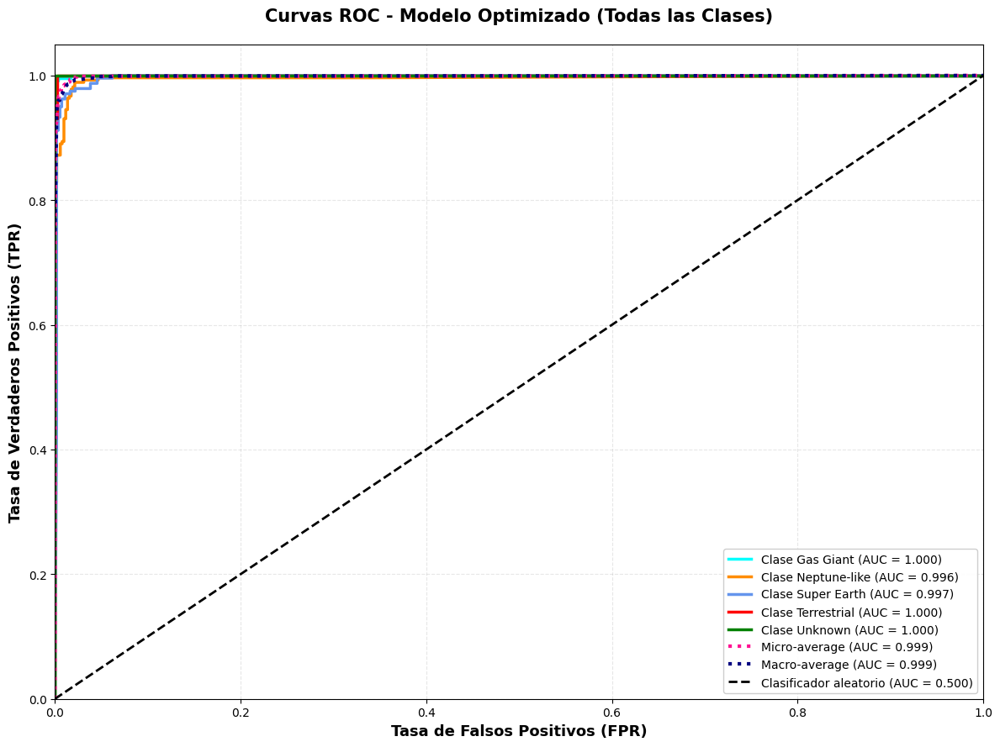


✓ Gráfico 1 generado: Todas las curvas ROC

                    4. GRÁFICOS INDIVIDUALES POR CLASE


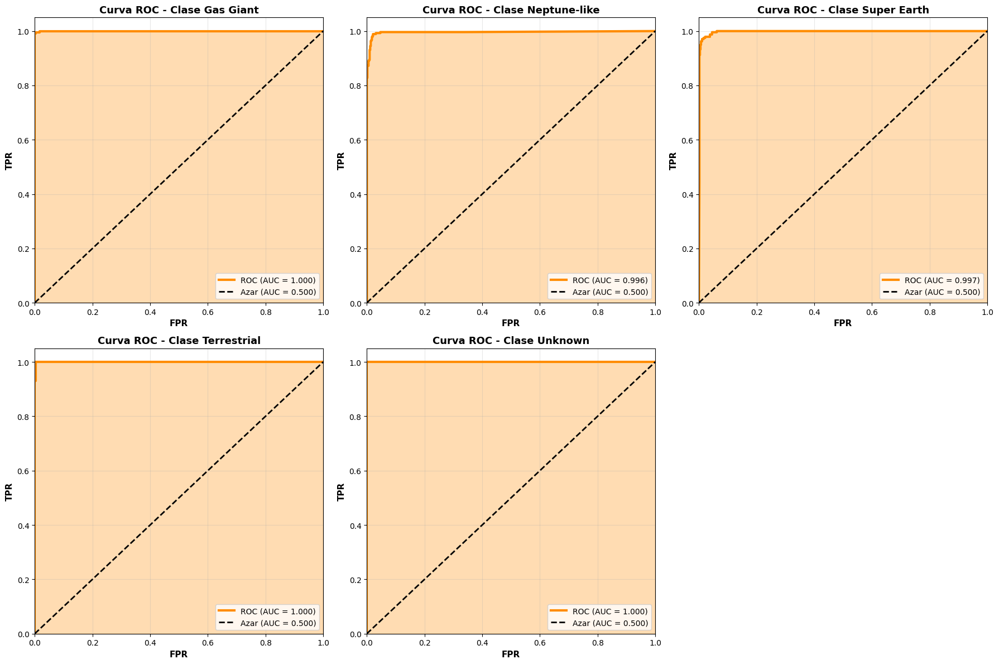


✓ Gráfico 2 generado: 5 curvas ROC individuales

                    5. COMPARACIÓN DE AUC POR CLASE


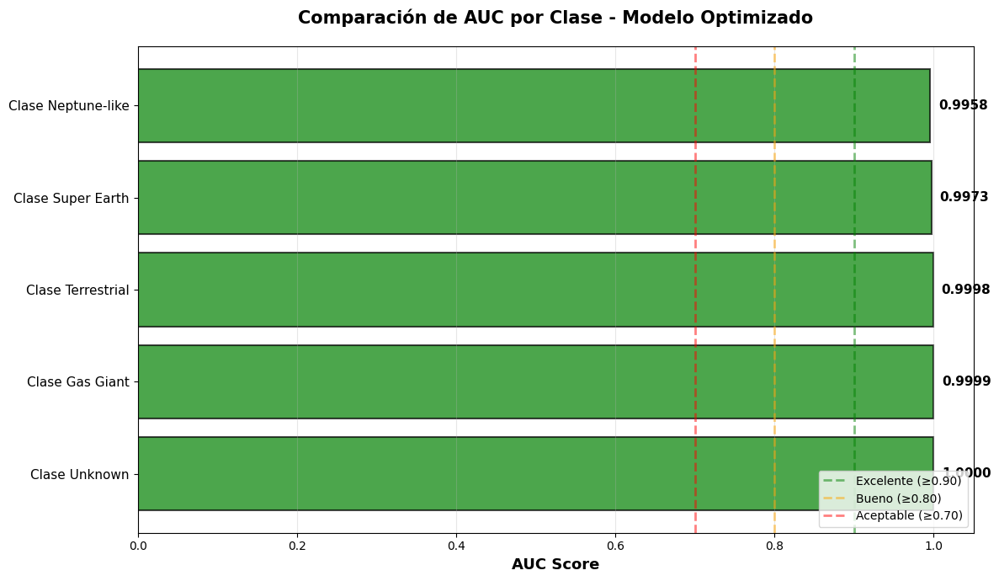


✓ Gráfico 3 generado: Comparación de AUC por clase

                              RESUMEN DE AUC SCORES

 AUC POR CLASE:
   • Clase Gas Giant : 0.9999  🟢 Excelente
   • Clase Neptune-like: 0.9958  🟢 Excelente
   • Clase Super Earth: 0.9973  🟢 Excelente
   • Clase Terrestrial: 0.9998  🟢 Excelente
   • Clase Unknown   : 1.0000  🟢 Excelente

 PROMEDIOS:
   • Micro-average: 0.9985
   • Macro-average: 0.9987
   • AUC promedio:  0.9986
   • AUC mínimo:    0.9958 (Clase Neptune-like)
   • AUC máximo:    1.0000 (Clase Unknown)

  EVALUACIÓN GLOBAL: EXCELENTE
    El modelo tiene un rendimiento sobresaliente en clasificación multiclase

 ANÁLISIS DE CURVAS ROC COMPLETADO


In [ ]:
from sklearn.metrics import roc_curve, auc, roc_auc_score
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
import numpy as np
from itertools import cycle

print("="*90)
print(" "*25 + "CURVAS ROC - MODELO OPTIMIZADO")
print("="*90)

# ============================================================================
#                     1. PREPARAR DATOS PARA CURVAS ROC
# ============================================================================

print("\n PASO 1: Preparando datos para curvas ROC...")

# Obtener las clases únicas
classes = best_rf.classes_
n_classes = len(classes)

print(f"\n✓ Número de clases: {n_classes}")
print(f"  Clases: {classes}")

# Binarizar las etiquetas para multiclase
y_test_bin = label_binarize(y_test, classes=classes)

# Si es binario, ajustar dimensiones
if n_classes == 2:
    y_test_bin = np.hstack([1 - y_test_bin, y_test_bin])

# Obtener probabilidades predichas
y_proba_test = best_rf.predict_proba(X_test_anova)

print(f"\n✓ Shape de y_test_bin: {y_test_bin.shape}")
print(f"✓ Shape de y_proba_test: {y_proba_test.shape}")

# ============================================================================
#                     2. CALCULAR CURVAS ROC POR CLASE
# ============================================================================

print("\n" + "="*90)
print(" "*20 + "2. CALCULANDO CURVAS ROC POR CLASE")
print("="*90)

# Diccionarios para almacenar resultados
fpr = dict()
tpr = dict()
roc_auc = dict()

# Calcular ROC para cada clase
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_proba_test[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
    print(f"\n  Clase {classes[i]}:")
    print(f"    • AUC = {roc_auc[i]:.4f}")

# Calcular ROC micro-average
fpr["micro"], tpr["micro"], _ = roc_curve(y_test_bin.ravel(), y_proba_test.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

print(f"\n  Micro-average:")
print(f"    • AUC = {roc_auc['micro']:.4f}")

# Calcular ROC macro-average (agregando todas las curvas)
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

mean_tpr /= n_classes

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

print(f"\n  Macro-average:")
print(f"    • AUC = {roc_auc['macro']:.4f}")

# ============================================================================
#                     3. VISUALIZAR CURVAS ROC
# ============================================================================

print("\n" + "="*90)
print(" "*20 + "3. VISUALIZANDO CURVAS ROC")
print("="*90)

# Figura 1: Todas las clases en un solo gráfico
fig, ax = plt.subplots(figsize=(12, 9))

# Colores para cada clase
colors = cycle(['aqua', 'darkorange', 'cornflowerblue', 'red', 'green',
                'purple', 'brown', 'pink', 'gray', 'olive'])

# Plotear curva ROC para cada clase
for i, color in zip(range(n_classes), colors):
    ax.plot(fpr[i], tpr[i], color=color, lw=2.5,
            label=f'Clase {classes[i]} (AUC = {roc_auc[i]:.3f})')

# Plotear micro-average
ax.plot(fpr["micro"], tpr["micro"],
        label=f'Micro-average (AUC = {roc_auc["micro"]:.3f})',
        color='deeppink', linestyle=':', linewidth=3)

# Plotear macro-average
ax.plot(fpr["macro"], tpr["macro"],
        label=f'Macro-average (AUC = {roc_auc["macro"]:.3f})',
        color='navy', linestyle=':', linewidth=3)

# Línea diagonal (clasificador aleatorio)
ax.plot([0, 1], [0, 1], 'k--', lw=2, label='Clasificador aleatorio (AUC = 0.500)')

# Configuración del gráfico
ax.set_xlim([0.0, 1.0])
ax.set_ylim([0.0, 1.05])
ax.set_xlabel('Tasa de Falsos Positivos (FPR)', fontsize=13, fontweight='bold')
ax.set_ylabel('Tasa de Verdaderos Positivos (TPR)', fontsize=13, fontweight='bold')
ax.set_title('Curvas ROC - Modelo Optimizado (Todas las Clases)',
             fontsize=15, fontweight='bold', pad=20)
ax.legend(loc="lower right", fontsize=10, framealpha=0.95)
ax.grid(True, alpha=0.3, linestyle='--')

plt.tight_layout()
plt.show()

print("\n✓ Gráfico 1 generado: Todas las curvas ROC")

# ============================================================================
#                     4. GRÁFICOS INDIVIDUALES POR CLASE
# ============================================================================

print("\n" + "="*90)
print(" "*20 + "4. GRÁFICOS INDIVIDUALES POR CLASE")
print("="*90)

# Calcular número de filas y columnas para subplots
n_cols = 3
n_rows = int(np.ceil(n_classes / n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 6*n_rows))
axes = axes.ravel() if n_classes > 1 else [axes]

for i in range(n_classes):
    ax = axes[i]

    # Plotear curva ROC de la clase
    ax.plot(fpr[i], tpr[i], color='darkorange', lw=3,
            label=f'ROC (AUC = {roc_auc[i]:.3f})')

    # Línea diagonal
    ax.plot([0, 1], [0, 1], 'k--', lw=2, label='Azar (AUC = 0.500)')

    # Rellenar área bajo la curva
    ax.fill_between(fpr[i], tpr[i], alpha=0.3, color='darkorange')

    # Configuración
    ax.set_xlim([0.0, 1.0])
    ax.set_ylim([0.0, 1.05])
    ax.set_xlabel('FPR', fontsize=11, fontweight='bold')
    ax.set_ylabel('TPR', fontsize=11, fontweight='bold')
    ax.set_title(f'Curva ROC - Clase {classes[i]}',
                fontsize=13, fontweight='bold')
    ax.legend(loc="lower right", fontsize=10)
    ax.grid(True, alpha=0.3)

# Ocultar subplots vacíos
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

print(f"\n✓ Gráfico 2 generado: {n_classes} curvas ROC individuales")

# ============================================================================
#                     5. COMPARACIÓN DE AUC POR CLASE
# ============================================================================

print("\n" + "="*90)
print(" "*20 + "5. COMPARACIÓN DE AUC POR CLASE")
print("="*90)

# Crear gráfico de barras
fig, ax = plt.subplots(figsize=(12, 7))

# Preparar datos
class_names = [f'Clase {c}' for c in classes]
auc_values = [roc_auc[i] for i in range(n_classes)]

# Ordenar por AUC
sorted_indices = np.argsort(auc_values)[::-1]
class_names_sorted = [class_names[i] for i in sorted_indices]
auc_values_sorted = [auc_values[i] for i in sorted_indices]

# Colores según rendimiento
colors_bar = ['green' if auc >= 0.9 else 'orange' if auc >= 0.8 else 'red'
              for auc in auc_values_sorted]

# Crear barras
bars = ax.barh(range(n_classes), auc_values_sorted,
               color=colors_bar, alpha=0.7, edgecolor='black', linewidth=1.5)

# Añadir valores en las barras
for i, (bar, auc_val) in enumerate(zip(bars, auc_values_sorted)):
    width = bar.get_width()
    ax.text(width + 0.01, bar.get_y() + bar.get_height()/2,
            f'{auc_val:.4f}',
            ha='left', va='center', fontsize=11, fontweight='bold')

# Líneas de referencia
ax.axvline(x=0.9, color='green', linestyle='--', linewidth=2,
           alpha=0.5, label='Excelente (≥0.90)')
ax.axvline(x=0.8, color='orange', linestyle='--', linewidth=2,
           alpha=0.5, label='Bueno (≥0.80)')
ax.axvline(x=0.7, color='red', linestyle='--', linewidth=2,
           alpha=0.5, label='Aceptable (≥0.70)')

# Configuración
ax.set_yticks(range(n_classes))
ax.set_yticklabels(class_names_sorted, fontsize=11)
ax.set_xlabel('AUC Score', fontsize=13, fontweight='bold')
ax.set_title('Comparación de AUC por Clase - Modelo Optimizado',
             fontsize=15, fontweight='bold', pad=20)
ax.set_xlim([0, 1.05])
ax.legend(loc='lower right', fontsize=10)
ax.grid(axis='x', alpha=0.3)

plt.tight_layout()
plt.show()

print("\n✓ Gráfico 3 generado: Comparación de AUC por clase")

# ============================================================================
#                     6. RESUMEN DE AUC SCORES
# ============================================================================

print("\n" + "="*90)
print(" "*30 + "RESUMEN DE AUC SCORES")
print("="*90)

print("\n AUC POR CLASE:")
for i in range(n_classes):
    status = "🟢 Excelente" if roc_auc[i] >= 0.9 else \
             "🟡 Bueno" if roc_auc[i] >= 0.8 else \
             "🟠 Aceptable" if roc_auc[i] >= 0.7 else \
             "🔴 Mejorable"
    print(f"   • Clase {classes[i]:10s}: {roc_auc[i]:.4f}  {status}")

print(f"\n PROMEDIOS:")
print(f"   • Micro-average: {roc_auc['micro']:.4f}")
print(f"   • Macro-average: {roc_auc['macro']:.4f}")
print(f"   • AUC promedio:  {np.mean(auc_values):.4f}")
print(f"   • AUC mínimo:    {np.min(auc_values):.4f} (Clase {classes[np.argmin(auc_values)]})")
print(f"   • AUC máximo:    {np.max(auc_values):.4f} (Clase {classes[np.argmax(auc_values)]})")

# Evaluación global
auc_mean = np.mean(auc_values)
if auc_mean >= 0.9:
    print(f"\n  EVALUACIÓN GLOBAL: EXCELENTE")
    print(f"    El modelo tiene un rendimiento sobresaliente en clasificación multiclase")
elif auc_mean >= 0.8:
    print(f"\n  EVALUACIÓN GLOBAL: BUENO")
    print(f"    El modelo tiene un buen rendimiento discriminativo")
elif auc_mean >= 0.7:
    print(f"\n   EVALUACIÓN GLOBAL: ACEPTABLE")
    print(f"    El modelo funciona, pero hay margen de mejora")
else:
    print(f"\n  EVALUACIÓN GLOBAL: MEJORABLE")
    print(f"    Se recomienda revisar el preprocesamiento y las features")

print("\n" + "="*90)
print(" ANÁLISIS DE CURVAS ROC COMPLETADO")
print("="*90)

# SVM - Anova

                    SVM CON FEATURES SELECCIONADAS POR ANOVA
                         (Modelo Base - Sin Optimizar)

 PASO 1: Verificando datos disponibles...
 Datos disponibles:
   • X_train shape: (3675, 15)
   • X_val shape:   (787, 15)
   • X_test shape:  (788, 15)
   • Features usadas: 15

               2. ENTRENAMIENTO DE SVM (HIPERPARÁMETROS POR DEFECTO)

 Hiperparámetros del modelo:
   • C (regularización):     1.0
   • kernel:                 rbf
   • gamma:                  scale
   • probability:            True

 Entrenando SVM...
   NOTA: SVM puede tardar más que Random Forest en entrenar
 Modelo entrenado en 0.61 segundos

 Información del modelo:
   • Número de clases:       5
   • Clases:                 ['Gas Giant' 'Neptune-like' 'Super Earth' 'Terrestrial' 'Unknown']
   • Support vectors:        [ 57 216 310 132   3]
   • Total support vectors:  718

                         3. PREDICCIONES

 Generando predicciones en validación...
 Generando predicciones en test...

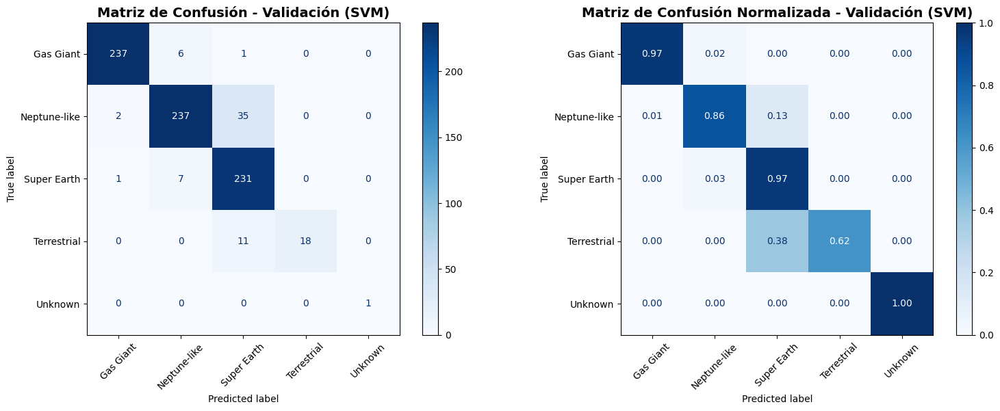


                    5. EVALUACIÓN EN CONJUNTO DE PRUEBA (TEST)

 Métricas Globales (Test):
   • Accuracy:           0.9048 (90.48%)
   • Precision (macro):  0.7201
   • Recall (macro):     0.6460
   • F1-Score (macro):   0.6676

 REPORTE DE CLASIFICACIÓN (Test):
              precision    recall  f1-score   support

   Gas Giant     0.9797    0.9837    0.9817       245
Neptune-like     0.9502    0.8358    0.8893       274
 Super Earth     0.8042    0.9623    0.8762       239
 Terrestrial     0.8667    0.4483    0.5909        29
     Unknown     0.0000    0.0000    0.0000         1

    accuracy                         0.9048       788
   macro avg     0.7201    0.6460    0.6676       788
weighted avg     0.9108    0.9048    0.9019       788



/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


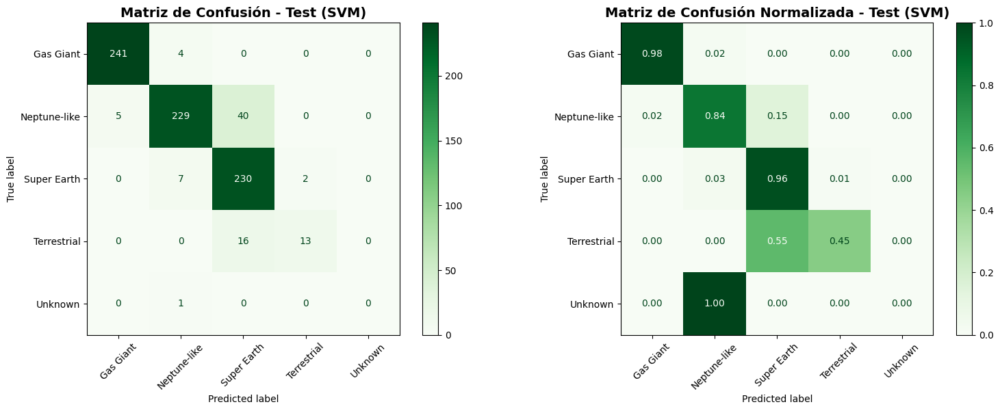


                    6. COMPARACIÓN: VALIDACIÓN vs TEST

  Métrica  Validación   Test  Diferencia  Diferencia_%
 Accuracy      0.9199 0.9048     -0.0151       -1.6443
Precision      0.9533 0.7201     -0.2331      -24.4562
   Recall      0.8847 0.6460     -0.2387      -26.9794
 F1-Score      0.9087 0.6676     -0.2411      -26.5303


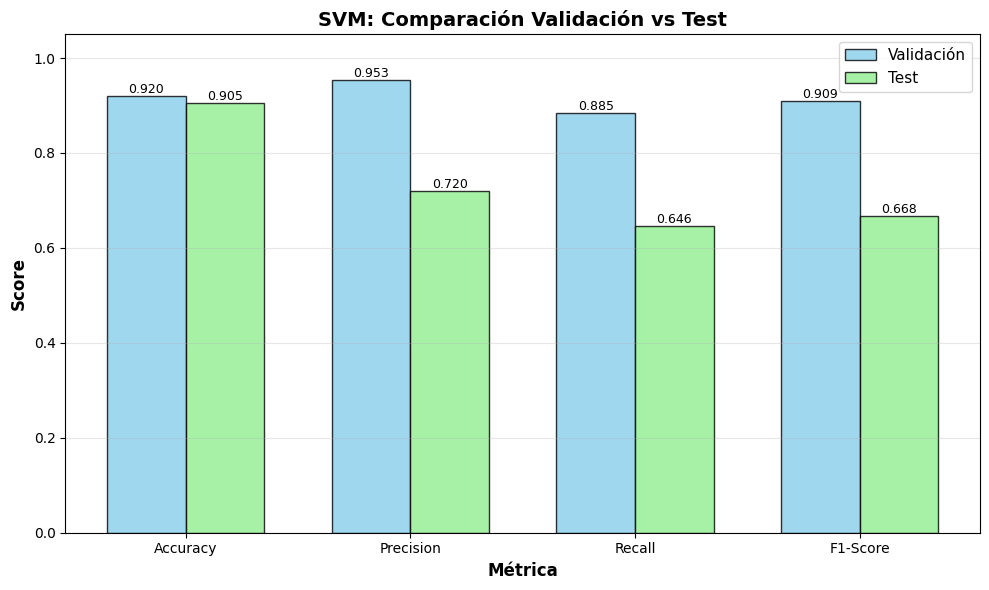


 ANÁLISIS:
   ⚠️  POSIBLE OVERFITTING
   El modelo funciona mejor en validación que en test
   Diferencia promedio: -0.1820

                    7. COMPARACIÓN: SVM vs RANDOM FOREST

 Comparación con Random Forest Optimizado (Test):

  Métrica  SVM (Base)  RF (Optimizado)  Diferencia
 Accuracy      0.9048           0.9759      0.0711
Precision      0.7201           0.9851      0.2649
   Recall      0.6460           0.9730      0.3270
 F1-Score      0.6676           0.9788      0.3111


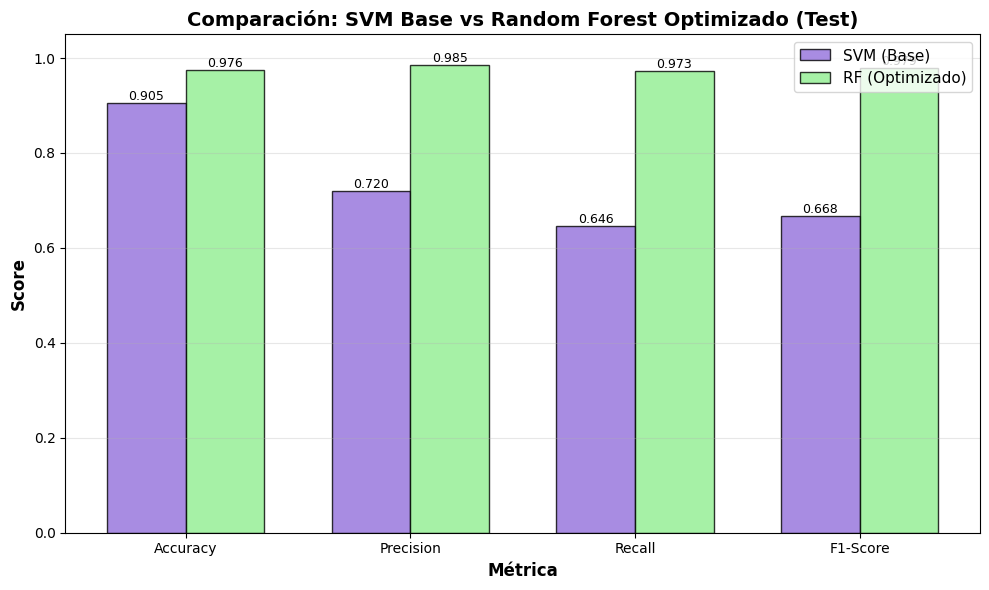


 RF (Optimizado) SUPERA a SVM (Base) por 0.3111 en F1-Score

                    8. ANÁLISIS DE CONFIANZA DEL MODELO

 Probabilidad promedio predicha por clase (Validación):
   • Gas Giant                : 0.3057
   • Neptune-like             : 0.3365
   • Super Earth              : 0.3146
   • Terrestrial              : 0.0413
   • Unknown                  : 0.0019


/tmp/ipython-input-3085119875.py:355: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(svm_base.classes_, rotation=45, ha='right')


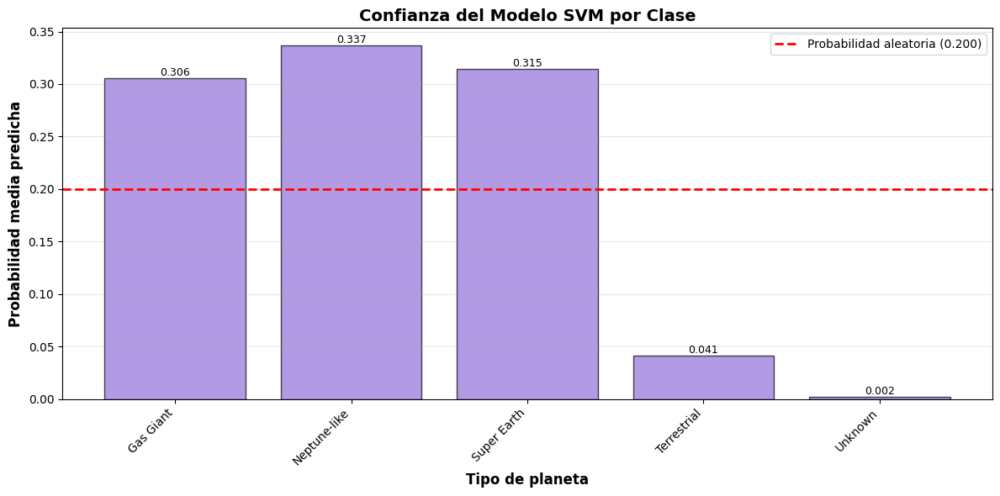


                               RESUMEN FINAL

 CONFIGURACIÓN DEL MODELO:
   • Algoritmo:          SVM (Support Vector Machine)
   • Kernel:             RBF (Radial Basis Function)
   • Método de selección: ANOVA F-test
   • Features usadas:    15
   • Support vectors:    718
   • Tiempo de entrenamiento: 0.61 segundos

 RENDIMIENTO EN TEST (FINAL):
   • Accuracy:   0.9048 (90.48%)
   • Precision:  0.7201
   • Recall:     0.6460
   • F1-Score:   0.6676

 CARACTERÍSTICAS DE SVM:
   ✓ Efectivo en espacios de alta dimensión
   ✓ Kernel RBF captura relaciones no lineales
   ✓ Robusto con margen máximo
   ✗ Más lento que Random Forest en entrenamiento
   ✗ Requiere más ajuste de hiperparámetros

 MODELO GUARDADO EN VARIABLE: svm_base

 EVALUACIÓN DE SVM COMPLETADA


In [ ]:
from sklearn.svm import SVC
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    classification_report, confusion_matrix, ConfusionMatrixDisplay
)
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import time

print("="*90)
print(" "*20 + "SVM CON FEATURES SELECCIONADAS POR ANOVA")
print(" "*25 + "(Modelo Base - Sin Optimizar)")
print("="*90)

# ============================================================================
#                     1. VERIFICAR DATOS
# ============================================================================

print("\n PASO 1: Verificando datos disponibles...")

if 'X_train_anova' not in globals() or 'X_val_anova' not in globals():
    print(" ERROR: Datos con features de ANOVA no encontrados")
    print("   Ejecuta primero la selección de features con ANOVA y preparación de datos")
else:
    print(f" Datos disponibles:")
    print(f"   • X_train shape: {X_train_anova.shape}")
    print(f"   • X_val shape:   {X_val_anova.shape}")
    print(f"   • X_test shape:  {X_test_anova.shape}")
    print(f"   • Features usadas: {X_train_anova.shape[1]}")

    # ============================================================================
    #                     2. ENTRENAR SVM (SIN OPTIMIZAR)
    # ============================================================================

    print("\n" + "="*90)
    print(" "*15 + "2. ENTRENAMIENTO DE SVM (HIPERPARÁMETROS POR DEFECTO)")
    print("="*90)

    # Modelo con hiperparámetros por defecto
    svm_base = SVC(
        C=1.0,                    # Default
        kernel='rbf',             # Default (Radial Basis Function)
        gamma='scale',            # Default
        degree=3,                 # Default (solo para kernel poly)
        probability=True,         # Importante para obtener probabilidades
        random_state=8,
        max_iter=-1,              # Sin límite de iteraciones
        verbose=False
    )

    print("\n Hiperparámetros del modelo:")
    print(f"   • C (regularización):     1.0")
    print(f"   • kernel:                 rbf")
    print(f"   • gamma:                  scale")
    print(f"   • probability:            True")

    print("\n Entrenando SVM...")
    print("   NOTA: SVM puede tardar más que Random Forest en entrenar")

    start_time = time.time()

    svm_base.fit(X_train_anova, y_train)

    training_time = time.time() - start_time

    print(f" Modelo entrenado en {training_time:.2f} segundos")

    # Información del modelo
    print(f"\n Información del modelo:")
    print(f"   • Número de clases:       {len(svm_base.classes_)}")
    print(f"   • Clases:                 {svm_base.classes_}")
    print(f"   • Support vectors:        {svm_base.n_support_}")
    print(f"   • Total support vectors:  {sum(svm_base.n_support_)}")

    # ============================================================================
    #                     3. PREDICCIONES
    # ============================================================================

    print("\n" + "="*90)
    print(" "*25 + "3. PREDICCIONES")
    print("="*90)

    # Predicciones en validación
    print("\n Generando predicciones en validación...")
    y_pred_val_svm = svm_base.predict(X_val_anova)
    y_proba_val_svm = svm_base.predict_proba(X_val_anova)

    # Predicciones en test
    print(" Generando predicciones en test...")
    y_pred_test_svm = svm_base.predict(X_test_anova)
    y_proba_test_svm = svm_base.predict_proba(X_test_anova)

    print(" Predicciones completadas")

    # ============================================================================
    #                     4. EVALUACIÓN EN VALIDACIÓN
    # ============================================================================

    print("\n" + "="*90)
    print(" "*20 + "4. EVALUACIÓN EN CONJUNTO DE VALIDACIÓN")
    print("="*90)

    # Métricas básicas
    acc_val_svm = accuracy_score(y_val, y_pred_val_svm)
    prec_val_svm = precision_score(y_val, y_pred_val_svm, average='macro', zero_division=0)
    rec_val_svm = recall_score(y_val, y_pred_val_svm, average='macro', zero_division=0)
    f1_val_svm = f1_score(y_val, y_pred_val_svm, average='macro', zero_division=0)

    print(f"\n Métricas Globales (Validación):")
    print(f"   • Accuracy:           {acc_val_svm:.4f} ({acc_val_svm*100:.2f}%)")
    print(f"   • Precision (macro):  {prec_val_svm:.4f}")
    print(f"   • Recall (macro):     {rec_val_svm:.4f}")
    print(f"   • F1-Score (macro):   {f1_val_svm:.4f}")

    # Reporte de clasificación
    print("\n REPORTE DE CLASIFICACIÓN (Validación):")
    print(classification_report(y_val, y_pred_val_svm, digits=4))

    # Matriz de confusión
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))

    cm_val_svm = confusion_matrix(y_val, y_pred_val_svm)
    disp_val_svm = ConfusionMatrixDisplay(confusion_matrix=cm_val_svm, display_labels=svm_base.classes_)
    disp_val_svm.plot(cmap='Blues', ax=axes[0], xticks_rotation=45, values_format='d')
    axes[0].set_title('Matriz de Confusión - Validación (SVM)', fontsize=14, fontweight='bold')
    axes[0].grid(False)

    # Matriz normalizada
    cm_val_svm_norm = cm_val_svm.astype('float') / cm_val_svm.sum(axis=1)[:, np.newaxis]
    disp_val_svm_norm = ConfusionMatrixDisplay(confusion_matrix=cm_val_svm_norm, display_labels=svm_base.classes_)
    disp_val_svm_norm.plot(cmap='Blues', ax=axes[1], xticks_rotation=45, values_format='.2f')
    axes[1].set_title('Matriz de Confusión Normalizada - Validación (SVM)', fontsize=14, fontweight='bold')
    axes[1].grid(False)

    plt.tight_layout()
    plt.show()

    # ============================================================================
    #                     5. EVALUACIÓN EN TEST
    # ============================================================================

    print("\n" + "="*90)
    print(" "*20 + "5. EVALUACIÓN EN CONJUNTO DE PRUEBA (TEST)")
    print("="*90)

    # Métricas básicas
    acc_test_svm = accuracy_score(y_test, y_pred_test_svm)
    prec_test_svm = precision_score(y_test, y_pred_test_svm, average='macro', zero_division=0)
    rec_test_svm = recall_score(y_test, y_pred_test_svm, average='macro', zero_division=0)
    f1_test_svm = f1_score(y_test, y_pred_test_svm, average='macro', zero_division=0)

    print(f"\n Métricas Globales (Test):")
    print(f"   • Accuracy:           {acc_test_svm:.4f} ({acc_test_svm*100:.2f}%)")
    print(f"   • Precision (macro):  {prec_test_svm:.4f}")
    print(f"   • Recall (macro):     {rec_test_svm:.4f}")
    print(f"   • F1-Score (macro):   {f1_test_svm:.4f}")

    # Reporte de clasificación
    print("\n REPORTE DE CLASIFICACIÓN (Test):")
    print(classification_report(y_test, y_pred_test_svm, digits=4))

    # Matrices de confusión
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))

    cm_test_svm = confusion_matrix(y_test, y_pred_test_svm)
    disp_test_svm = ConfusionMatrixDisplay(confusion_matrix=cm_test_svm, display_labels=svm_base.classes_)
    disp_test_svm.plot(cmap='Greens', ax=axes[0], xticks_rotation=45, values_format='d')
    axes[0].set_title('Matriz de Confusión - Test (SVM)', fontsize=14, fontweight='bold')
    axes[0].grid(False)

    # Matriz normalizada
    cm_test_svm_norm = cm_test_svm.astype('float') / cm_test_svm.sum(axis=1)[:, np.newaxis]
    disp_test_svm_norm = ConfusionMatrixDisplay(confusion_matrix=cm_test_svm_norm, display_labels=svm_base.classes_)
    disp_test_svm_norm.plot(cmap='Greens', ax=axes[1], xticks_rotation=45, values_format='.2f')
    axes[1].set_title('Matriz de Confusión Normalizada - Test (SVM)', fontsize=14, fontweight='bold')
    axes[1].grid(False)

    plt.tight_layout()
    plt.show()

    # ============================================================================
    #                     6. COMPARACIÓN VAL vs TEST
    # ============================================================================

    print("\n" + "="*90)
    print(" "*20 + "6. COMPARACIÓN: VALIDACIÓN vs TEST")
    print("="*90)

    comparison_svm = pd.DataFrame({
        'Métrica': ['Accuracy', 'Precision', 'Recall', 'F1-Score'],
        'Validación': [acc_val_svm, prec_val_svm, rec_val_svm, f1_val_svm],
        'Test': [acc_test_svm, prec_test_svm, rec_test_svm, f1_test_svm]
    })

    comparison_svm['Diferencia'] = comparison_svm['Test'] - comparison_svm['Validación']
    comparison_svm['Diferencia_%'] = (comparison_svm['Diferencia'] / comparison_svm['Validación']) * 100

    print("\n" + comparison_svm.to_string(index=False, float_format='%.4f'))

    # Visualización
    fig, ax = plt.subplots(figsize=(10, 6))

    x = np.arange(len(comparison_svm))
    width = 0.35

    bars1 = ax.bar(x - width/2, comparison_svm['Validación'], width,
                   label='Validación', color='skyblue', alpha=0.8, edgecolor='black')
    bars2 = ax.bar(x + width/2, comparison_svm['Test'], width,
                   label='Test', color='lightgreen', alpha=0.8, edgecolor='black')

    ax.set_ylabel('Score', fontsize=12, fontweight='bold')
    ax.set_xlabel('Métrica', fontsize=12, fontweight='bold')
    ax.set_title('SVM: Comparación Validación vs Test', fontsize=14, fontweight='bold')
    ax.set_xticks(x)
    ax.set_xticklabels(comparison_svm['Métrica'])
    ax.legend(fontsize=11)
    ax.set_ylim([0, 1.05])
    ax.grid(axis='y', alpha=0.3)

    # Añadir valores
    for bars in [bars1, bars2]:
        for bar in bars:
            height = bar.get_height()
            ax.text(bar.get_x() + bar.get_width()/2., height,
                   f'{height:.3f}', ha='center', va='bottom', fontsize=9)

    plt.tight_layout()
    plt.show()

    # Análisis de overfitting/underfitting
    avg_diff = comparison_svm['Diferencia'].mean()

    print(f"\n ANÁLISIS:")
    if abs(avg_diff) < 0.02:
        print(f"   ✅ EXCELENTE - Modelo generaliza muy bien")
        print(f"   Diferencia promedio: {avg_diff:+.4f} (muy pequeña)")
    elif avg_diff < -0.05:
        print(f"   ⚠️  POSIBLE OVERFITTING")
        print(f"   El modelo funciona mejor en validación que en test")
        print(f"   Diferencia promedio: {avg_diff:+.4f}")
    elif avg_diff > 0.05:
        print(f"   🔴 INUSUAL - Test mejor que validación")
        print(f"   Verificar datos de validación")
    else:
        print(f"   ✅ BUENO - Modelo generaliza adecuadamente")
        print(f"   Diferencia promedio: {avg_diff:+.4f}")

    # ============================================================================
    #                     7. COMPARACIÓN CON RANDOM FOREST
    # ============================================================================

    print("\n" + "="*90)
    print(" "*20 + "7. COMPARACIÓN: SVM vs RANDOM FOREST")
    print("="*90)

    # Comparar con Random Forest si existe
    if 'acc_opt_test' in globals() and 'f1_opt_test' in globals():
        print("\n Comparación con Random Forest Optimizado (Test):")

        comparison_models = pd.DataFrame({
            'Métrica': ['Accuracy', 'Precision', 'Recall', 'F1-Score'],
            'SVM (Base)': [acc_test_svm, prec_test_svm, rec_test_svm, f1_test_svm],
            'RF (Optimizado)': [acc_opt_test, prec_opt_test, rec_opt_test, f1_opt_test]
        })

        comparison_models['Diferencia'] = comparison_models['RF (Optimizado)'] - comparison_models['SVM (Base)']

        print("\n" + comparison_models.to_string(index=False, float_format='%.4f'))

        # Visualización
        fig, ax = plt.subplots(figsize=(10, 6))

        bars1 = ax.bar(x - width/2, comparison_models['SVM (Base)'], width,
                      label='SVM (Base)', color='mediumpurple', alpha=0.8, edgecolor='black')
        bars2 = ax.bar(x + width/2, comparison_models['RF (Optimizado)'], width,
                      label='RF (Optimizado)', color='lightgreen', alpha=0.8, edgecolor='black')

        ax.set_ylabel('Score', fontsize=12, fontweight='bold')
        ax.set_xlabel('Métrica', fontsize=12, fontweight='bold')
        ax.set_title('Comparación: SVM Base vs Random Forest Optimizado (Test)', fontsize=14, fontweight='bold')
        ax.set_xticks(x)
        ax.set_xticklabels(comparison_models['Métrica'])
        ax.legend(fontsize=11)
        ax.set_ylim([0, 1.05])
        ax.grid(axis='y', alpha=0.3)

        for bars in [bars1, bars2]:
            for bar in bars:
                height = bar.get_height()
                ax.text(bar.get_x() + bar.get_width()/2., height,
                       f'{height:.3f}', ha='center', va='bottom', fontsize=9)

        plt.tight_layout()
        plt.show()

        # Determinar ganador
        if f1_test_svm > f1_opt_test:
            diff = f1_test_svm - f1_opt_test
            print(f"\n SVM (Base) SUPERA a RF (Optimizado) por {diff:.4f} en F1-Score")
        elif f1_opt_test > f1_test_svm:
            diff = f1_opt_test - f1_test_svm
            print(f"\n RF (Optimizado) SUPERA a SVM (Base) por {diff:.4f} en F1-Score")
        else:
            print(f"\n  EMPATE - Ambos modelos tienen rendimiento similar")

    elif 'acc_base_test' in globals() and 'f1_base_test' in globals():
        print("\n Comparación con Random Forest Base (Test):")

        comparison_models = pd.DataFrame({
            'Métrica': ['Accuracy', 'Precision', 'Recall', 'F1-Score'],
            'SVM (Base)': [acc_test_svm, prec_test_svm, rec_test_svm, f1_test_svm],
            'RF (Base)': [acc_base_test, prec_base_test, rec_base_test, f1_base_test]
        })

        comparison_models['Diferencia'] = comparison_models['SVM (Base)'] - comparison_models['RF (Base)']

        print("\n" + comparison_models.to_string(index=False, float_format='%.4f'))

    # ============================================================================
    #                     8. ANÁLISIS DE PROBABILIDADES
    # ============================================================================

    print("\n" + "="*90)
    print(" "*20 + "8. ANÁLISIS DE CONFIANZA DEL MODELO")
    print("="*90)

    # Probabilidades promedio por clase
    mean_proba_svm = np.mean(y_proba_val_svm, axis=0)

    print("\n Probabilidad promedio predicha por clase (Validación):")
    for i, clase in enumerate(svm_base.classes_):
        print(f"   • {clase:25s}: {mean_proba_svm[i]:.4f}")

    # Visualización
    fig, ax = plt.subplots(figsize=(12, 6))

    bars = ax.bar(svm_base.classes_, mean_proba_svm,
                 color='mediumpurple', alpha=0.7, edgecolor='black')

    prob_aleatoria = 1/len(svm_base.classes_)
    ax.axhline(y=prob_aleatoria, color='red', linestyle='--', linewidth=2,
              label=f'Probabilidad aleatoria ({prob_aleatoria:.3f})')

    # Añadir valores sobre las barras
    for bar, prob in zip(bars, mean_proba_svm):
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height,
               f'{prob:.3f}', ha='center', va='bottom', fontsize=9)

    ax.set_ylabel('Probabilidad media predicha', fontsize=12, fontweight='bold')
    ax.set_xlabel('Tipo de planeta', fontsize=12, fontweight='bold')
    ax.set_title('Confianza del Modelo SVM por Clase', fontsize=14, fontweight='bold')
    ax.set_xticklabels(svm_base.classes_, rotation=45, ha='right')
    ax.legend(fontsize=10)
    ax.grid(axis='y', alpha=0.3)

    plt.tight_layout()
    plt.show()

    # ============================================================================
    #                     9. RESUMEN FINAL
    # ============================================================================

    print("\n" + "="*90)
    print(" "*30 + " RESUMEN FINAL")
    print("="*90)

    print(f"\n CONFIGURACIÓN DEL MODELO:")
    print(f"   • Algoritmo:          SVM (Support Vector Machine)")
    print(f"   • Kernel:             RBF (Radial Basis Function)")
    print(f"   • Método de selección: ANOVA F-test")
    print(f"   • Features usadas:    {X_train_anova.shape[1]}")
    print(f"   • Support vectors:    {sum(svm_base.n_support_)}")
    print(f"   • Tiempo de entrenamiento: {training_time:.2f} segundos")

    print(f"\n RENDIMIENTO EN TEST (FINAL):")
    print(f"   • Accuracy:   {acc_test_svm:.4f} ({acc_test_svm*100:.2f}%)")
    print(f"   • Precision:  {prec_test_svm:.4f}")
    print(f"   • Recall:     {rec_test_svm:.4f}")
    print(f"   • F1-Score:   {f1_test_svm:.4f}")

    print("\n CARACTERÍSTICAS DE SVM:")
    print("   ✓ Efectivo en espacios de alta dimensión")
    print("   ✓ Kernel RBF captura relaciones no lineales")
    print("   ✓ Robusto con margen máximo")
    print("   ✗ Más lento que Random Forest en entrenamiento")
    print("   ✗ Requiere más ajuste de hiperparámetros")

    print("\n MODELO GUARDADO EN VARIABLE: svm_base")

    print("\n" + "="*90)
    print(" EVALUACIÓN DE SVM COMPLETADA")
    print("="*90)

## Curvas de Aprendizaje

          CURVAS DE APRENDIZAJE - SVM BASE (SIN OPTIMIZAR)

 Generando curvas de aprendizaje para SVM base...

 Entrenando con diferentes tamaños de conjunto...
   Total de muestras disponibles: 3675
   Tamaños a probar: 10
   NOTA: SVM puede tardar más que Random Forest

   [1/10] Tamaño:   367 | Acc Train: 0.8992 | Acc Val: 0.8958
   [2/10] Tamaño:   735 | Acc Train: 0.9075 | Acc Val: 0.8958
   [3/10] Tamaño:  1102 | Acc Train: 0.9156 | Acc Val: 0.8958
   [4/10] Tamaño:  1470 | Acc Train: 0.9177 | Acc Val: 0.8971
   [5/10] Tamaño:  1837 | Acc Train: 0.9134 | Acc Val: 0.8983
   [6/10] Tamaño:  2205 | Acc Train: 0.9152 | Acc Val: 0.9022
   [7/10] Tamaño:  2572 | Acc Train: 0.9222 | Acc Val: 0.9174
   [8/10] Tamaño:  2940 | Acc Train: 0.9262 | Acc Val: 0.9174
   [9/10] Tamaño:  3307 | Acc Train: 0.9244 | Acc Val: 0.9187
   [10/10] Tamaño:  3675 | Acc Train: 0.9279 | Acc Val: 0.9199

 Curvas calculadas correctamente!

 Generando visualizaciones...


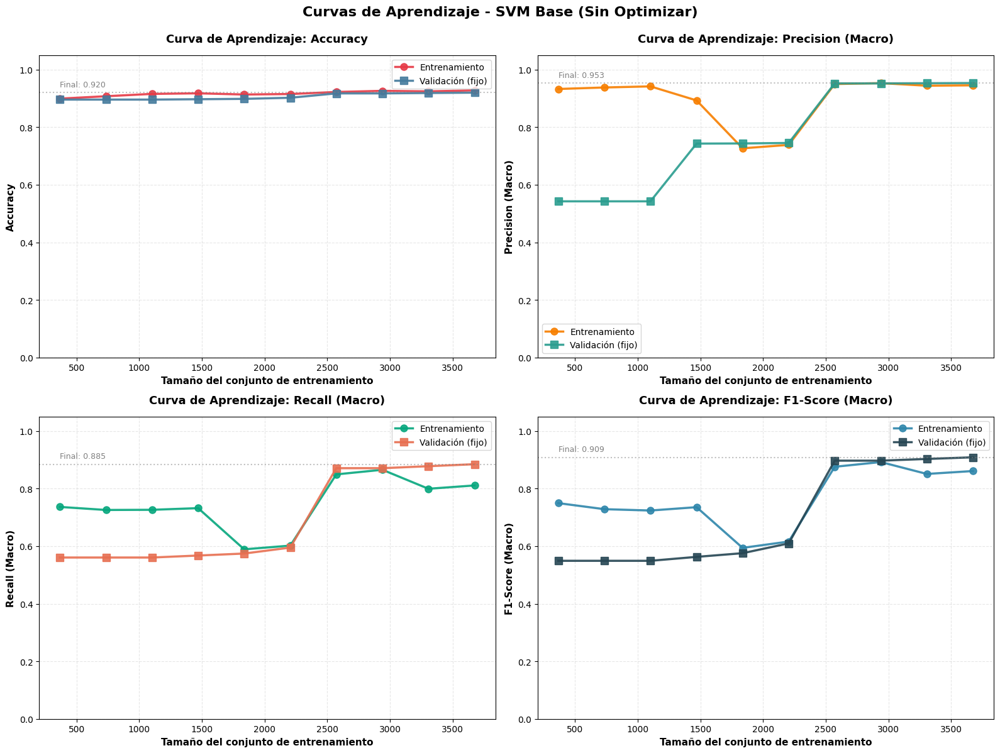

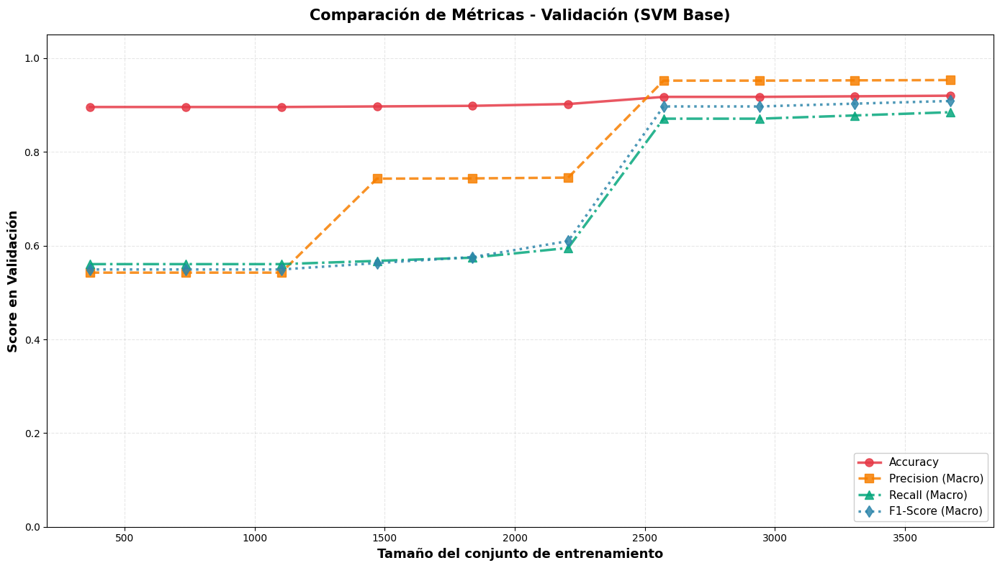


               COMPARACIÓN: SVM vs RANDOM FOREST


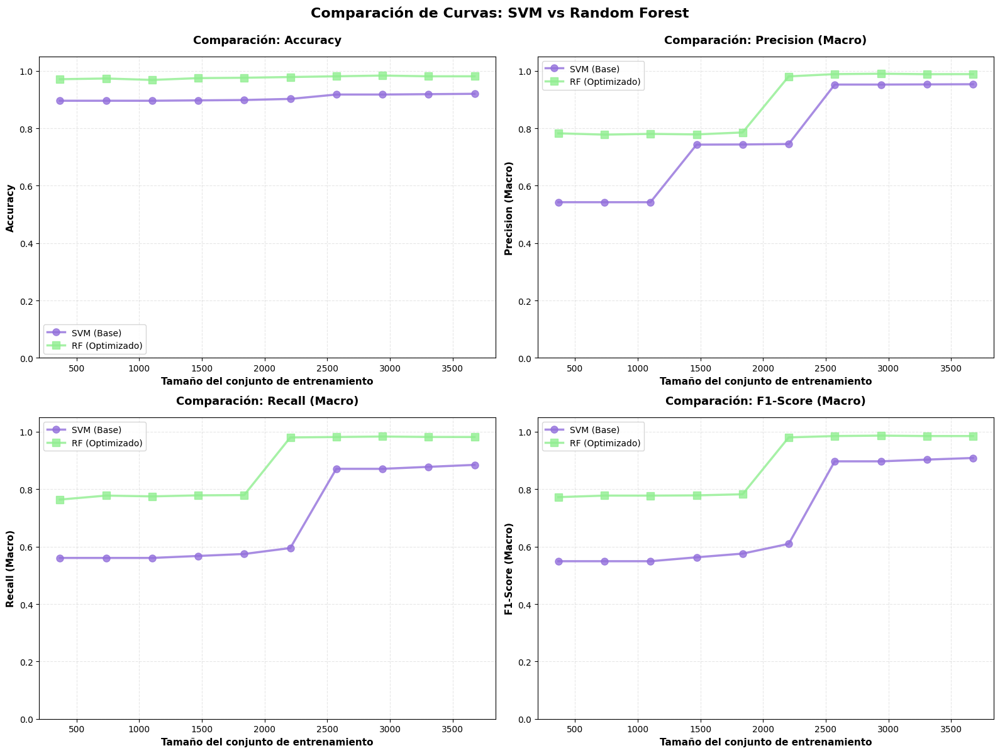


 COMPARACIÓN DE SCORES FINALES (100% de datos):
Métrica                       SVM           RF   Diferencia
────────────────────────────────────────────────────────────────────────────────
Accuracy                   0.9199       0.9809     -0.0610 🔴
Precision (Macro)          0.9533       0.9885     -0.0352 🔴
Recall (Macro)             0.8847       0.9817     -0.0970 🔴
F1-Score (Macro)           0.9087       0.9850     -0.0763 🔴

                    ANÁLISIS DE BRECHA (TRAIN-VAL GAP)
Métrica                  Train Final       Val Final          Gap          Estado
────────────────────────────────────────────────────────────────────────────────
Accuracy                      0.9279          0.9199       0.0079     ✅ Excelente
Precision (Macro)             0.9454          0.9533      -0.0079     ✅ Excelente
Recall (Macro)                0.8109          0.8847      -0.0738     ✅ Excelente
F1-Score (Macro)              0.8610          0.9087      -0.0477     ✅ Excelente

                  

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

print("="*80)
print(" "*10 + "CURVAS DE APRENDIZAJE - SVM BASE (SIN OPTIMIZAR)")
print("="*80)

# Verificar que el modelo existe
if 'svm_base' not in globals():
    print(" ERROR: Modelo SVM base no encontrado")
    print("   Ejecuta primero el entrenamiento del SVM base")
else:
    # --- Función para generar curvas con división fija ---
    def plot_learning_curves_fixed_split(model, X_train, y_train, X_val, y_val,
                                         train_sizes=np.linspace(0.1, 1.0, 10)):
        """
        Genera curvas de aprendizaje usando los conjuntos de entrenamiento y validación fijos.

        Parameters:
        -----------
        model : estimador de sklearn
            Modelo ya entrenado o instancia del modelo
        X_train, y_train : arrays
            Conjunto de entrenamiento
        X_val, y_val : arrays
            Conjunto de validación (fijo, no se usa CV)
        train_sizes : array
            Proporciones del conjunto de entrenamiento a usar
        """

        # Almacenar resultados
        results = {
            'train_sizes_abs': [],
            'train_accuracy': [],
            'val_accuracy': [],
            'train_precision': [],
            'val_precision': [],
            'train_recall': [],
            'val_recall': [],
            'train_f1': [],
            'val_f1': []
        }

        n_samples = len(X_train)

        print(f"\n Entrenando con diferentes tamaños de conjunto...")
        print(f"   Total de muestras disponibles: {n_samples}")
        print(f"   Tamaños a probar: {len(train_sizes)}")
        print(f"   NOTA: SVM puede tardar más que Random Forest\n")

        for i, size in enumerate(train_sizes, 1):
            # Calcular número de muestras
            n_train = int(n_samples * size)
            results['train_sizes_abs'].append(n_train)

            # Seleccionar subset del entrenamiento
            indices = np.random.RandomState(42).choice(n_samples, n_train, replace=False)
            X_train_subset = X_train[indices]
            y_train_subset = y_train.iloc[indices] if hasattr(y_train, 'iloc') else y_train[indices]

            # Entrenar el modelo con el subset
            model_temp = model.__class__(**model.get_params())
            model_temp.fit(X_train_subset, y_train_subset)

            # Predecir en entrenamiento y validación
            y_train_pred = model_temp.predict(X_train_subset)
            y_val_pred = model_temp.predict(X_val)

            # Calcular métricas en entrenamiento
            results['train_accuracy'].append(accuracy_score(y_train_subset, y_train_pred))
            results['train_precision'].append(precision_score(y_train_subset, y_train_pred, average='macro', zero_division=0))
            results['train_recall'].append(recall_score(y_train_subset, y_train_pred, average='macro', zero_division=0))
            results['train_f1'].append(f1_score(y_train_subset, y_train_pred, average='macro', zero_division=0))

            # Calcular métricas en validación
            results['val_accuracy'].append(accuracy_score(y_val, y_val_pred))
            results['val_precision'].append(precision_score(y_val, y_val_pred, average='macro', zero_division=0))
            results['val_recall'].append(recall_score(y_val, y_val_pred, average='macro', zero_division=0))
            results['val_f1'].append(f1_score(y_val, y_val_pred, average='macro', zero_division=0))

            print(f"   [{i}/{len(train_sizes)}] Tamaño: {n_train:5d} | "
                  f"Acc Train: {results['train_accuracy'][-1]:.4f} | "
                  f"Acc Val: {results['val_accuracy'][-1]:.4f}")

        print("\n Curvas calculadas correctamente!")
        return results


    # --- Generar las curvas ---
    print("\n Generando curvas de aprendizaje para SVM base...")
    learning_results_svm = plot_learning_curves_fixed_split(
        model=svm_base,
        X_train=X_train_anova,
        y_train=y_train,
        X_val=X_val_anova,
        y_val=y_val,
        train_sizes=np.linspace(0.1, 1.0, 10)
    )

    # ============================================================================
    #                     VISUALIZACIÓN: 4 MÉTRICAS INDIVIDUALES
    # ============================================================================

    print("\n Generando visualizaciones...")

    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    axes = axes.ravel()

    metrics = [
        ('accuracy', 'Accuracy'),
        ('precision', 'Precision (Macro)'),
        ('recall', 'Recall (Macro)'),
        ('f1', 'F1-Score (Macro)')
    ]

    colors_train = ['#E63946', '#F77F00', '#06A77D', '#2E86AB']
    colors_val = ['#457B9D', '#2A9D8F', '#E76F51', '#264653']

    for idx, (metric, title) in enumerate(metrics):
        train_key = f'train_{metric}'
        val_key = f'val_{metric}'

        # Curva de entrenamiento
        axes[idx].plot(
            learning_results_svm['train_sizes_abs'],
            learning_results_svm[train_key],
            'o-',
            color=colors_train[idx],
            linewidth=2.5,
            markersize=8,
            label='Entrenamiento',
            alpha=0.9
        )

        # Curva de validación
        axes[idx].plot(
            learning_results_svm['train_sizes_abs'],
            learning_results_svm[val_key],
            's-',
            color=colors_val[idx],
            linewidth=2.5,
            markersize=8,
            label='Validación (fijo)',
            alpha=0.9
        )

        # Configuración
        axes[idx].set_xlabel('Tamaño del conjunto de entrenamiento', fontsize=11, fontweight='bold')
        axes[idx].set_ylabel(title, fontsize=11, fontweight='bold')
        axes[idx].set_title(f'Curva de Aprendizaje: {title}', fontsize=13, fontweight='bold', pad=15)
        axes[idx].legend(loc='best', fontsize=10)
        axes[idx].grid(True, alpha=0.3, linestyle='--')
        axes[idx].set_ylim([0, 1.05])

        # Línea del valor final en validación
        final_val = learning_results_svm[val_key][-1]
        axes[idx].axhline(y=final_val, color='gray', linestyle=':', linewidth=1.5, alpha=0.5)
        axes[idx].text(
            learning_results_svm['train_sizes_abs'][0],
            final_val + 0.02,
            f'Final: {final_val:.3f}',
            fontsize=9,
            color='gray'
        )

    plt.suptitle('Curvas de Aprendizaje - SVM Base (Sin Optimizar)',
                 fontsize=16, fontweight='bold', y=0.995)
    plt.tight_layout()
    plt.show()

    # ============================================================================
    #                     GRÁFICO COMBINADO
    # ============================================================================

    fig, ax = plt.subplots(figsize=(14, 8))

    line_styles = ['-', '--', '-.', ':']
    markers = ['o', 's', '^', 'd']
    colors = ['#E63946', '#F77F00', '#06A77D', '#2E86AB']

    for idx, (metric, title) in enumerate(metrics):
        val_key = f'val_{metric}'
        ax.plot(
            learning_results_svm['train_sizes_abs'],
            learning_results_svm[val_key],
            linestyle=line_styles[idx],
            marker=markers[idx],
            color=colors[idx],
            linewidth=2.5,
            markersize=8,
            label=f'{title}',
            alpha=0.85
        )

    ax.set_xlabel('Tamaño del conjunto de entrenamiento', fontsize=13, fontweight='bold')
    ax.set_ylabel('Score en Validación', fontsize=13, fontweight='bold')
    ax.set_title('Comparación de Métricas - Validación (SVM Base)',
                 fontsize=15, fontweight='bold', pad=15)
    ax.legend(loc='lower right', fontsize=11, framealpha=0.95)
    ax.grid(True, alpha=0.3, linestyle='--')
    ax.set_ylim([0, 1.05])
    plt.tight_layout()
    plt.show()

    # ============================================================================
    #                     COMPARACIÓN CON RANDOM FOREST
    # ============================================================================

    if 'learning_results_rf_opt' in globals() or 'learning_results_rf' in globals():
        print("\n" + "="*80)
        print(" "*15 + "COMPARACIÓN: SVM vs RANDOM FOREST")
        print("="*80)

        fig, axes = plt.subplots(2, 2, figsize=(16, 12))
        axes = axes.ravel()

        for idx, (metric, title) in enumerate(metrics):
            val_key = f'val_{metric}'

            # Curva del SVM
            axes[idx].plot(
                learning_results_svm['train_sizes_abs'],
                learning_results_svm[val_key],
                'o-',
                color='mediumpurple',
                linewidth=2.5,
                markersize=8,
                label='SVM (Base)',
                alpha=0.8
            )

            # Curva del RF optimizado si existe
            if 'learning_results_rf_opt' in globals():
                axes[idx].plot(
                    learning_results_rf_opt['train_sizes_abs'],
                    learning_results_rf_opt[val_key],
                    's-',
                    color='lightgreen',
                    linewidth=2.5,
                    markersize=8,
                    label='RF (Optimizado)',
                    alpha=0.8
                )
            # Si no, usar RF base
            elif 'learning_results_rf' in globals():
                axes[idx].plot(
                    learning_results_rf['train_sizes_abs'],
                    learning_results_rf[val_key],
                    's-',
                    color='lightcoral',
                    linewidth=2.5,
                    markersize=8,
                    label='RF (Base)',
                    alpha=0.8
                )

            axes[idx].set_xlabel('Tamaño del conjunto de entrenamiento', fontsize=11, fontweight='bold')
            axes[idx].set_ylabel(title, fontsize=11, fontweight='bold')
            axes[idx].set_title(f'Comparación: {title}', fontsize=13, fontweight='bold', pad=15)
            axes[idx].legend(loc='best', fontsize=10)
            axes[idx].grid(True, alpha=0.3, linestyle='--')
            axes[idx].set_ylim([0, 1.05])

        plt.suptitle('Comparación de Curvas: SVM vs Random Forest',
                     fontsize=16, fontweight='bold', y=0.995)
        plt.tight_layout()
        plt.show()

        # Tabla comparativa
        print("\n COMPARACIÓN DE SCORES FINALES (100% de datos):")
        print(f"{'Métrica':<20} {'SVM':>12} {'RF':>12} {'Diferencia':>12}")
        print("─"*80)

        rf_results = learning_results_rf_opt if 'learning_results_rf_opt' in globals() else learning_results_rf

        for metric, title in metrics:
            val_key = f'val_{metric}'
            svm_score = learning_results_svm[val_key][-1]
            rf_score = rf_results[val_key][-1]
            diff = svm_score - rf_score

            indicador = "🟢" if diff > 0 else "🔴" if diff < 0 else "➡️"
            print(f"{title:<20} {svm_score:>12.4f} {rf_score:>12.4f} {diff:>11.4f} {indicador}")

        print("="*80)

    # ============================================================================
    #                     ANÁLISIS DEL GAP (TRAIN vs VAL)
    # ============================================================================

    print("\n" + "="*80)
    print(" "*20 + "ANÁLISIS DE BRECHA (TRAIN-VAL GAP)")
    print("="*80)
    print(f"{'Métrica':<20} {'Train Final':>15} {'Val Final':>15} {'Gap':>12} {'Estado':>15}")
    print("─"*80)

    for metric, title in metrics:
        train_key = f'train_{metric}'
        val_key = f'val_{metric}'

        train_final = learning_results_svm[train_key][-1]
        val_final = learning_results_svm[val_key][-1]
        gap = train_final - val_final

        # Diagnóstico
        if gap < 0.02:
            estado = "✅ Excelente"
        elif gap < 0.05:
            estado = "🟢 Bueno"
        elif gap < 0.10:
            estado = "🟡 Moderado"
        else:
            estado = "🔴 Alto"

        print(f"{title:<20} {train_final:>15.4f} {val_final:>15.4f} {gap:>12.4f} {estado:>15}")

    print("="*80)

    # ============================================================================
    #                     ANÁLISIS DE CONVERGENCIA
    # ============================================================================

    print("\n" + "="*80)
    print(" "*20 + "ANÁLISIS DE CONVERGENCIA")
    print("="*80)

    for metric, title in metrics:
        val_key = f'val_{metric}'
        val_scores = learning_results_svm[val_key]

        # Pendiente entre los últimos dos puntos
        if len(val_scores) >= 2:
            slope = val_scores[-1] - val_scores[-2]

            print(f"\n{title}:")
            print(f"   • Score final (validación):      {val_scores[-1]:.4f}")
            print(f"   • Pendiente últimos 2 puntos:    {slope:+.5f}")

            if abs(slope) < 0.005:
                print(f"   • Estado: ✅ CONVERGIÓ - Modelo alcanzó su potencial")
            elif slope > 0:
                print(f"   • Estado: 🟡 MEJORANDO - Más datos podrían ayudar")
            else:
                print(f"   • Estado: 🔴 EMPEORANDO - Posible sobreajuste")

    print("="*80)

    # ============================================================================
    #                     DIAGNÓSTICO GENERAL
    # ============================================================================

    print("\n" + "="*80)
    print(" "*25 + "DIAGNÓSTICO GENERAL")
    print("="*80)

    # Calcular gaps promedio
    avg_gap = np.mean([
        learning_results_svm[f'train_{metric}'][-1] - learning_results_svm[f'val_{metric}'][-1]
        for metric, _ in metrics
    ])

    # Promedio de rendimiento en validación
    avg_val_score = np.mean([
        learning_results_svm[f'val_{metric}'][-1]
        for metric, _ in metrics
    ])

    print(f"\n MÉTRICAS RESUMEN:")
    print(f"   • Gap promedio (Train-Val):       {avg_gap:.4f}")
    print(f"   • Score promedio en validación:   {avg_val_score:.4f}")

    print(f"\n DIAGNÓSTICO:")

    if avg_gap > 0.10:
        print("    OVERFITTING DETECTADO")
        print("   El modelo memoriza el conjunto de entrenamiento.")
        print("\n   Soluciones sugeridas:")
        print("   1. Disminuir C (aumentar regularización)")
        print("   2. Probar kernel más simple (linear)")
        print("   3. Ajustar gamma a valores más bajos")
        print("   4. Obtener más datos de entrenamiento")

    elif avg_gap < 0.02 and avg_val_score < 0.70:
        print("    UNDERFITTING DETECTADO")
        print("   El modelo es demasiado simple.")
        print("\n   Soluciones sugeridas:")
        print("   1. Aumentar C (disminuir regularización)")
        print("   2. Probar kernel RBF con gamma='auto'")
        print("   3. Agregar más características")
        print("   4. Probar kernel polinomial de mayor grado")

    elif avg_gap < 0.05 and avg_val_score >= 0.75:
        print("    MODELO BIEN AJUSTADO")
        print("   Buen balance entre sesgo y varianza.")
        print("\n    Próximo paso: Optimizar hiperparámetros")

    else:
        print("    MODELO ACEPTABLE CON MARGEN DE MEJORA")
        print("\n   Sugerencias:")
        print("   1. Optimizar C y gamma con GridSearchCV")
        print("   2. Probar diferentes kernels")
        print("   3. Ajustar parámetros específicos del kernel")

    # Verificar si más datos ayudarían
    val_f1 = learning_results_svm['val_f1']
    if len(val_f1) >= 3:
        improvement = val_f1[-1] - val_f1[-3]
        if improvement > 0.01:
            print("\n    MÁS DATOS PODRÍAN AYUDAR")
            print("   La curva aún muestra tendencia creciente.")
        else:
            print("\n    MÁS DATOS PROBABLEMENTE NO AYUDARÁN MUCHO")
            print("   Enfócate en optimizar hiperparámetros.")

    print("\n" + "="*80)
    print(" ANÁLISIS DE CURVAS DE APRENDIZAJE COMPLETADO")
    print("\n SIGUIENTE PASO:")
    print("   Optimizar hiperparámetros del SVM (C, kernel, gamma)")
    print("="*80)

## Optimización de hiperparámetros

               OPTIMIZACIÓN DE HIPERPARÁMETROS - SVM

 PASO 1: Definiendo espacio de búsqueda de hiperparámetros...

✓ Espacio de búsqueda definido:
   • C:      [0.1, 1, 10, 100]
   • kernel: ['linear', 'rbf', 'poly']
   • gamma:  ['scale', 'auto', 0.001, 0.01, 0.1]
   • degree: [2, 3, 4] (solo para kernel poly)

    Aproximadamente 100 combinaciones a probar
     Tiempo estimado: ~100-300 minutos
     SVM es más lento que Random Forest en optimización

                    2. EJECUTANDO GRIDSEARCHCV

 Configurando GridSearchCV...
   • Validación cruzada: 5-fold
   • Métrica principal: f1_macro
   • Métricas adicionales: accuracy, precision, recall

 ENTRENANDO... (Esto puede tomar BASTANTE tiempo - 15-30 minutos)
   Por favor espera pacientemente...

Fitting 5 folds for each of 180 candidates, totalling 900 fits


/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(



 GridSearchCV completado en 21.05 minutos (1263.14 segundos)

                    3. MEJORES HIPERPARÁMETROS ENCONTRADOS

 MEJORES HIPERPARÁMETROS (según F1-macro):
   • C                   : 100
   • degree              : 2
   • gamma               : scale
   • kernel              : linear

 MEJOR SCORE EN VALIDACIÓN CRUZADA:
   • F1-macro (CV):     0.9212

 Mejor modelo obtenido y listo para usar
   • Kernel seleccionado:    linear
   • Support vectors:        396

                    4. ANÁLISIS DE RESULTADOS DEL GRID

 TOP 10 MEJORES COMBINACIONES:

   Rank 1:
   • F1-macro:  0.9212 (±0.0843)
   • Accuracy:  0.9676
   • Params:    {'C': 100, 'degree': 2, 'gamma': 'scale', 'kernel': 'linear'}

   Rank 1:
   • F1-macro:  0.9212 (±0.0843)
   • Accuracy:  0.9676
   • Params:    {'C': 100, 'degree': 2, 'gamma': 'auto', 'kernel': 'linear'}

   Rank 1:
   • F1-macro:  0.9212 (±0.0843)
   • Accuracy:  0.9676
   • Params:    {'C': 100, 'degree': 2, 'gamma': 0.001, 'kernel': 'linear'}

   R

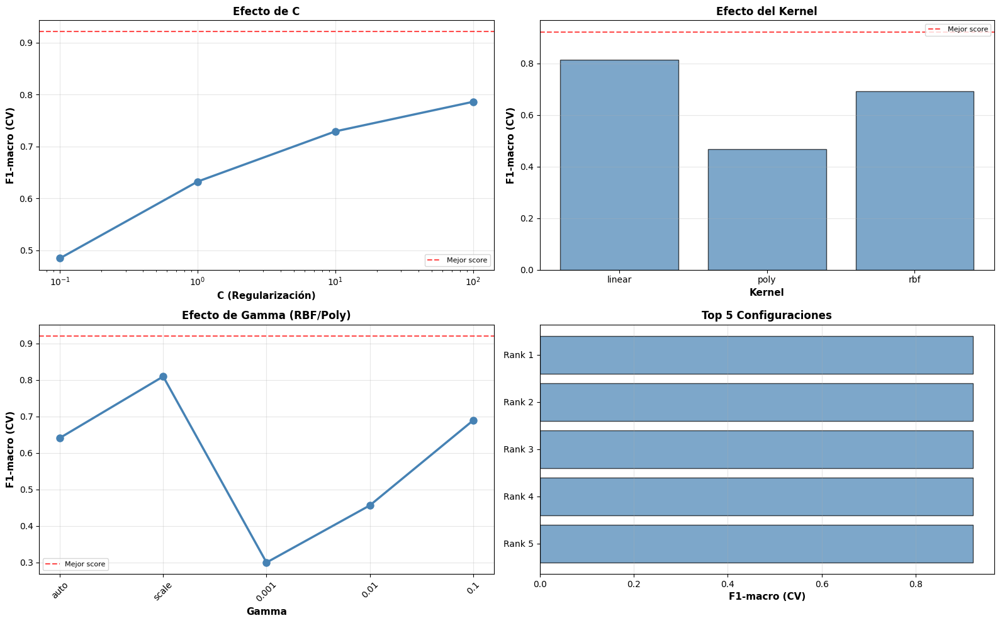


               5. COMPARACIÓN: MODELO BASE vs OPTIMIZADO (VALIDACIÓN)

 RESULTADOS EN VALIDACIÓN:
  Métrica   Base  Optimizado  Mejora  Mejora_%
 Accuracy 0.9199      0.9708  0.0508    5.5249
Precision 0.9533      0.9818  0.0285    2.9938
   Recall 0.8847      0.9695  0.0848    9.5899
 F1-Score 0.9087      0.9754  0.0667    7.3439


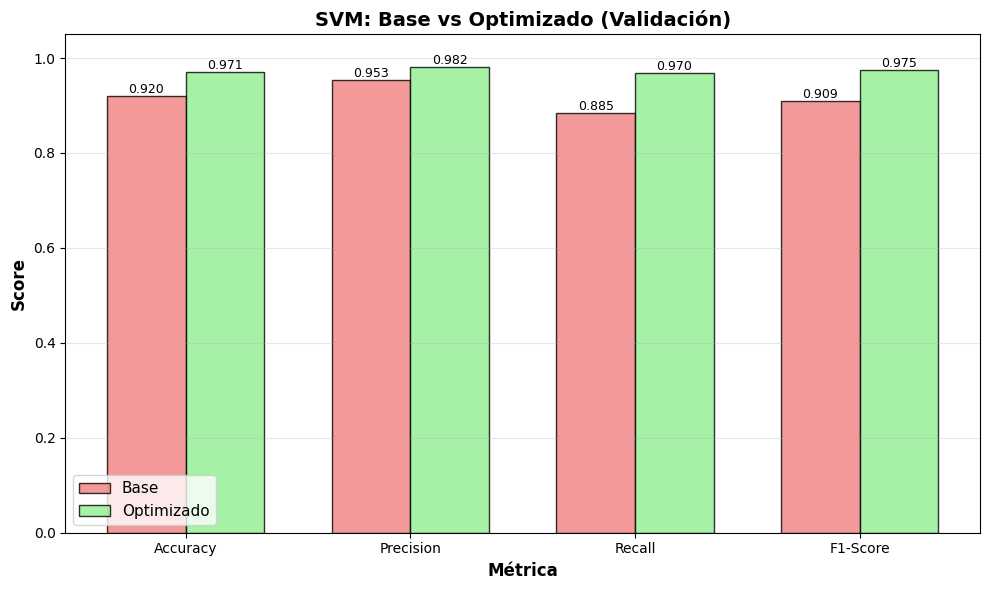


                    6. EVALUACIÓN EN TEST (MODELO OPTIMIZADO)

 MÉTRICAS EN TEST (MODELO OPTIMIZADO):
   • Accuracy:           0.9695 (96.95%)
   • Precision (macro):  0.9687
   • Recall (macro):     0.9690
   • F1-Score (macro):   0.9688

 REPORTE DE CLASIFICACIÓN (TEST - OPTIMIZADO):
              precision    recall  f1-score   support

   Gas Giant     0.9760    0.9959    0.9859       245
Neptune-like     0.9741    0.9599    0.9669       274
 Super Earth     0.9622    0.9582    0.9602       239
 Terrestrial     0.9310    0.9310    0.9310        29
     Unknown     1.0000    1.0000    1.0000         1

    accuracy                         0.9695       788
   macro avg     0.9687    0.9690    0.9688       788
weighted avg     0.9695    0.9695    0.9695       788



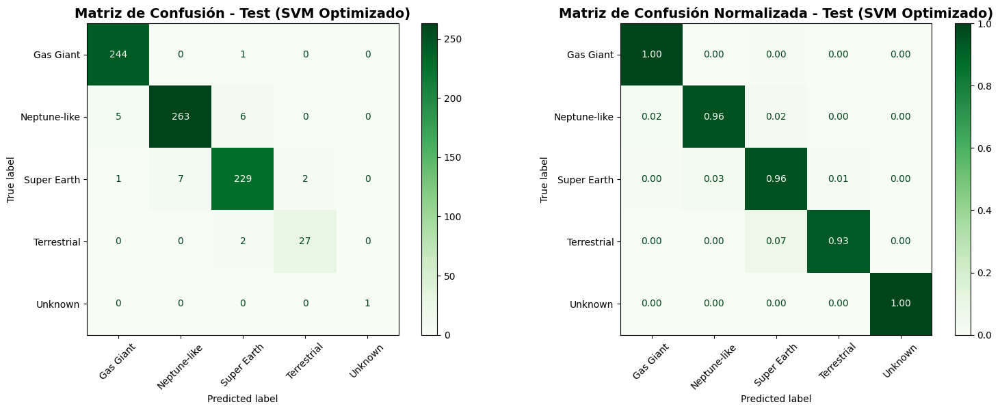


               7. COMPARACIÓN FINAL: BASE vs OPTIMIZADO (TEST)

 RESULTADOS EN TEST:
  Métrica   Base  Optimizado  Mejora  Mejora_%
 Accuracy 0.9048      0.9695  0.0647    7.1529
Precision 0.7201      0.9687  0.2485   34.5081
   Recall 0.6460      0.9690  0.3230   49.9962
 F1-Score 0.6676      0.9688  0.3012   45.1121


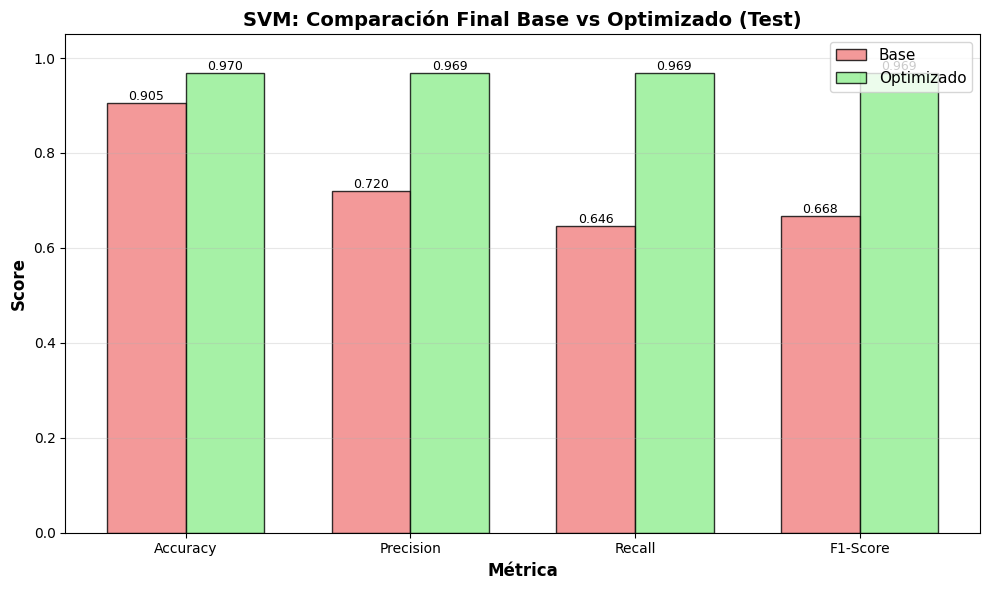


                    8. COMPARACIÓN: SVM vs RANDOM FOREST

 Comparación con Random Forest Optimizado (Test):

  Métrica  SVM (Optimizado)  RF (Optimizado)  Diferencia
 Accuracy            0.9695           0.9759     -0.0063
Precision            0.9687           0.9851     -0.0164
   Recall            0.9690           0.9730     -0.0040
 F1-Score            0.9688           0.9788     -0.0100


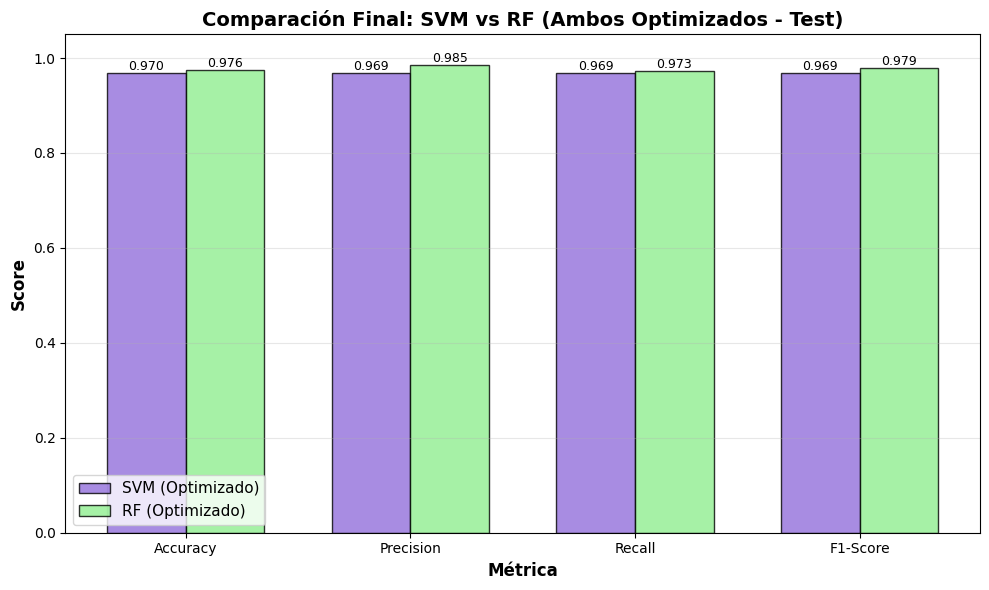


 RF (Optimizado) SUPERA a SVM (Optimizado) por 0.0100 en F1-Score

                               RESUMEN FINAL

 MEJORES HIPERPARÁMETROS:
   • C                   : 100
   • degree              : 2
   • gamma               : scale
   • kernel              : linear

 RENDIMIENTO FINAL EN TEST:
   • Accuracy:   0.9695 (96.95%)
   • Precision:  0.9687
   • Recall:     0.9690
   • F1-Score:   0.9688

 MEJORA SOBRE MODELO BASE:
   • Mejora en F1-Score: +0.3012 (+45.11%)
    La optimización MEJORÓ significativamente el modelo

  TIEMPO DE OPTIMIZACIÓN: 21.05 minutos

 MODELO GUARDADO EN VARIABLE: best_svm

 OPTIMIZACIÓN Y EVALUACIÓN DE SVM COMPLETADAS


In [ ]:
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    classification_report, confusion_matrix, ConfusionMatrixDisplay
)
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import time

print("="*90)
print(" "*15 + "OPTIMIZACIÓN DE HIPERPARÁMETROS - SVM")
print("="*90)

# ============================================================================
#                     1. DEFINIR ESPACIO DE BÚSQUEDA
# ============================================================================

print("\n PASO 1: Definiendo espacio de búsqueda de hiperparámetros...")

# Espacio de búsqueda
param_grid = {
    'C': [0.1, 1, 10, 100],                          # Parámetro de regularización
    'kernel': ['linear', 'rbf', 'poly'],              # Tipo de kernel
    'gamma': ['scale', 'auto', 0.001, 0.01, 0.1],    # Coeficiente del kernel (rbf, poly, sigmoid)
    'degree': [2, 3, 4]                               # Grado del polinomio (solo para poly)
}

# Calcular total de combinaciones
# Nota: degree solo se usa con kernel='poly'
total_combinations = (
    len(param_grid['C']) *
    (1 * len(param_grid['gamma']) +  # linear (gamma no aplica)
     1 * len(param_grid['gamma']) +  # rbf
     1 * len(param_grid['gamma']) * len(param_grid['degree']))  # poly
)

print(f"\n✓ Espacio de búsqueda definido:")
print(f"   • C:      {param_grid['C']}")
print(f"   • kernel: {param_grid['kernel']}")
print(f"   • gamma:  {param_grid['gamma']}")
print(f"   • degree: {param_grid['degree']} (solo para kernel poly)")
print(f"\n    Aproximadamente {total_combinations} combinaciones a probar")
print(f"     Tiempo estimado: ~{total_combinations * 1:.0f}-{total_combinations * 3:.0f} minutos")
print(f"     SVM es más lento que Random Forest en optimización")

# ============================================================================
#                     2. EJECUTAR GRIDSEARCHCV
# ============================================================================

print("\n" + "="*90)
print(" "*20 + "2. EJECUTANDO GRIDSEARCHCV")
print("="*90)

# Crear modelo base
svm = SVC(
    probability=True,
    random_state=8,
    max_iter=-1
)

# Configurar GridSearchCV
print("\n Configurando GridSearchCV...")
print("   • Validación cruzada: 5-fold")
print("   • Métrica principal: f1_macro")
print("   • Métricas adicionales: accuracy, precision, recall")

grid_search_svm = GridSearchCV(
    estimator=svm,
    param_grid=param_grid,
    scoring={
        'accuracy': 'accuracy',
        'f1_macro': 'f1_macro',
        'precision_macro': 'precision_macro',
        'recall_macro': 'recall_macro'
    },
    refit='f1_macro',
    cv=5,
    n_jobs=-1,
    verbose=2,
    return_train_score=True
)

print("\n ENTRENANDO... (Esto puede tomar BASTANTE tiempo - 15-30 minutos)")
print("   Por favor espera pacientemente...\n")

start_time = time.time()
grid_search_svm.fit(X_train_anova, y_train)
training_time = time.time() - start_time

print(f"\n GridSearchCV completado en {training_time/60:.2f} minutos ({training_time:.2f} segundos)")

# ============================================================================
#                     3. MEJORES HIPERPARÁMETROS
# ============================================================================

print("\n" + "="*90)
print(" "*20 + "3. MEJORES HIPERPARÁMETROS ENCONTRADOS")
print("="*90)

best_params_svm = grid_search_svm.best_params_
best_score_svm = grid_search_svm.best_score_

print(f"\n MEJORES HIPERPARÁMETROS (según F1-macro):")
for param, value in best_params_svm.items():
    print(f"   • {param:20s}: {value}")

print(f"\n MEJOR SCORE EN VALIDACIÓN CRUZADA:")
print(f"   • F1-macro (CV):     {best_score_svm:.4f}")

# Obtener el mejor modelo
best_svm = grid_search_svm.best_estimator_

print(f"\n Mejor modelo obtenido y listo para usar")
print(f"   • Kernel seleccionado:    {best_svm.kernel}")
print(f"   • Support vectors:        {sum(best_svm.n_support_)}")

# ============================================================================
#                     4. ANÁLISIS DE RESULTADOS DEL GRID
# ============================================================================

print("\n" + "="*90)
print(" "*20 + "4. ANÁLISIS DE RESULTADOS DEL GRID")
print("="*90)

# Crear DataFrame con resultados
results_svm_df = pd.DataFrame(grid_search_svm.cv_results_)

# Top 10 mejores combinaciones
top_10_svm = results_svm_df.nsmallest(10, 'rank_test_f1_macro')[
    ['params', 'mean_test_f1_macro', 'std_test_f1_macro',
     'mean_test_accuracy', 'rank_test_f1_macro']
]

print("\n TOP 10 MEJORES COMBINACIONES:")
for idx, row in top_10_svm.iterrows():
    print(f"\n   Rank {int(row['rank_test_f1_macro'])}:")
    print(f"   • F1-macro:  {row['mean_test_f1_macro']:.4f} (±{row['std_test_f1_macro']:.4f})")
    print(f"   • Accuracy:  {row['mean_test_accuracy']:.4f}")
    print(f"   • Params:    {row['params']}")

# Visualizar importancia de hiperparámetros
print("\n Generando visualizaciones de hiperparámetros...")

fig, axes = plt.subplots(2, 2, figsize=(16, 10))
axes = axes.ravel()

# Efecto de C
param_col = 'param_C'
grouped = results_svm_df.groupby(param_col)['mean_test_f1_macro'].mean().sort_index()
axes[0].semilogx(grouped.index, grouped.values, 'o-', linewidth=2.5, markersize=8, color='steelblue')
axes[0].set_xlabel('C (Regularización)', fontsize=11, fontweight='bold')
axes[0].set_ylabel('F1-macro (CV)', fontsize=11, fontweight='bold')
axes[0].set_title('Efecto de C', fontsize=12, fontweight='bold')
axes[0].grid(True, alpha=0.3)
axes[0].axhline(y=best_score_svm, color='red', linestyle='--', linewidth=1.5, alpha=0.7, label='Mejor score')
axes[0].legend(fontsize=8)

# Efecto del kernel
param_col = 'param_kernel'
grouped = results_svm_df.groupby(param_col)['mean_test_f1_macro'].mean()
axes[1].bar(range(len(grouped)), grouped.values, color='steelblue', alpha=0.7, edgecolor='black')
axes[1].set_xticks(range(len(grouped)))
axes[1].set_xticklabels(grouped.index)
axes[1].set_xlabel('Kernel', fontsize=11, fontweight='bold')
axes[1].set_ylabel('F1-macro (CV)', fontsize=11, fontweight='bold')
axes[1].set_title('Efecto del Kernel', fontsize=12, fontweight='bold')
axes[1].grid(axis='y', alpha=0.3)
axes[1].axhline(y=best_score_svm, color='red', linestyle='--', linewidth=1.5, alpha=0.7, label='Mejor score')
axes[1].legend(fontsize=8)

# Efecto de gamma (solo para rbf y poly) - CORREGIDO
rbf_poly_results = results_svm_df[
    (results_svm_df['param_kernel'] == 'rbf') |
    (results_svm_df['param_kernel'] == 'poly')
]
if len(rbf_poly_results) > 0:
    param_col = 'param_gamma'
    grouped = rbf_poly_results.groupby(param_col)['mean_test_f1_macro'].mean()

    # Ordenar manualmente: primero strings, luego numéricos
    gamma_order = []
    numeric_gammas = []

    for idx in grouped.index:
        if isinstance(idx, str):
            gamma_order.append(idx)
        else:
            numeric_gammas.append(idx)

    numeric_gammas.sort()
    gamma_order.extend(numeric_gammas)
    grouped = grouped.reindex(gamma_order)

    axes[2].plot(range(len(grouped)), grouped.values, 'o-', linewidth=2.5, markersize=8, color='steelblue')
    axes[2].set_xticks(range(len(grouped)))
    axes[2].set_xticklabels(grouped.index, rotation=45)
    axes[2].set_xlabel('Gamma', fontsize=11, fontweight='bold')
    axes[2].set_ylabel('F1-macro (CV)', fontsize=11, fontweight='bold')
    axes[2].set_title('Efecto de Gamma (RBF/Poly)', fontsize=12, fontweight='bold')
    axes[2].grid(True, alpha=0.3)
    axes[2].axhline(y=best_score_svm, color='red', linestyle='--', linewidth=1.5, alpha=0.7, label='Mejor score')
    axes[2].legend(fontsize=8)

# Comparación de configuraciones
configs = results_svm_df.nsmallest(5, 'rank_test_f1_macro')
config_labels = [f"Rank {i+1}" for i in range(len(configs))]
axes[3].barh(range(len(configs)), configs['mean_test_f1_macro'],
            color='steelblue', alpha=0.7, edgecolor='black')
axes[3].set_yticks(range(len(configs)))
axes[3].set_yticklabels(config_labels)
axes[3].set_xlabel('F1-macro (CV)', fontsize=11, fontweight='bold')
axes[3].set_title('Top 5 Configuraciones', fontsize=12, fontweight='bold')
axes[3].invert_yaxis()
axes[3].grid(axis='x', alpha=0.3)

plt.tight_layout()
plt.show()

# ============================================================================
#                     5. COMPARACIÓN: BASE vs OPTIMIZADO (VALIDACIÓN)
# ============================================================================

print("\n" + "="*90)
print(" "*15 + "5. COMPARACIÓN: MODELO BASE vs OPTIMIZADO (VALIDACIÓN)")
print("="*90)

# Predicciones del modelo base
if 'svm_base' in globals():
    y_pred_base_val_svm = svm_base.predict(X_val_anova)
    acc_base_val_svm = accuracy_score(y_val, y_pred_base_val_svm)
    f1_base_val_svm = f1_score(y_val, y_pred_base_val_svm, average='macro')
    prec_base_val_svm = precision_score(y_val, y_pred_base_val_svm, average='macro', zero_division=0)
    rec_base_val_svm = recall_score(y_val, y_pred_base_val_svm, average='macro', zero_division=0)
else:
    print("  Modelo base no encontrado, solo se mostrará el optimizado")
    acc_base_val_svm = f1_base_val_svm = prec_base_val_svm = rec_base_val_svm = 0

# Predicciones del modelo optimizado
y_pred_opt_val_svm = best_svm.predict(X_val_anova)
acc_opt_val_svm = accuracy_score(y_val, y_pred_opt_val_svm)
f1_opt_val_svm = f1_score(y_val, y_pred_opt_val_svm, average='macro')
prec_opt_val_svm = precision_score(y_val, y_pred_opt_val_svm, average='macro', zero_division=0)
rec_opt_val_svm = recall_score(y_val, y_pred_opt_val_svm, average='macro', zero_division=0)

# Tabla comparativa
comparison_val_svm = pd.DataFrame({
    'Métrica': ['Accuracy', 'Precision', 'Recall', 'F1-Score'],
    'Base': [acc_base_val_svm, prec_base_val_svm, rec_base_val_svm, f1_base_val_svm],
    'Optimizado': [acc_opt_val_svm, prec_opt_val_svm, rec_opt_val_svm, f1_opt_val_svm]
})
comparison_val_svm['Mejora'] = comparison_val_svm['Optimizado'] - comparison_val_svm['Base']
comparison_val_svm['Mejora_%'] = (comparison_val_svm['Mejora'] / comparison_val_svm['Base']) * 100

print("\n RESULTADOS EN VALIDACIÓN:")
print(comparison_val_svm.to_string(index=False, float_format='%.4f'))

# Visualización
fig, ax = plt.subplots(figsize=(10, 6))

x = np.arange(len(comparison_val_svm))
width = 0.35

bars1 = ax.bar(x - width/2, comparison_val_svm['Base'], width,
              label='Base', color='lightcoral', alpha=0.8, edgecolor='black')
bars2 = ax.bar(x + width/2, comparison_val_svm['Optimizado'], width,
              label='Optimizado', color='lightgreen', alpha=0.8, edgecolor='black')

ax.set_ylabel('Score', fontsize=12, fontweight='bold')
ax.set_xlabel('Métrica', fontsize=12, fontweight='bold')
ax.set_title('SVM: Base vs Optimizado (Validación)', fontsize=14, fontweight='bold')
ax.set_xticks(x)
ax.set_xticklabels(comparison_val_svm['Métrica'])
ax.legend(fontsize=11)
ax.set_ylim([0, 1.05])
ax.grid(axis='y', alpha=0.3)

for bars in [bars1, bars2]:
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height,
               f'{height:.3f}', ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()

# ============================================================================
#                     6. EVALUACIÓN EN TEST (MODELO OPTIMIZADO)
# ============================================================================

print("\n" + "="*90)
print(" "*20 + "6. EVALUACIÓN EN TEST (MODELO OPTIMIZADO)")
print("="*90)

# Predicciones en test
y_pred_opt_test_svm = best_svm.predict(X_test_anova)
y_proba_opt_test_svm = best_svm.predict_proba(X_test_anova)

# Métricas
acc_opt_test_svm = accuracy_score(y_test, y_pred_opt_test_svm)
prec_opt_test_svm = precision_score(y_test, y_pred_opt_test_svm, average='macro', zero_division=0)
rec_opt_test_svm = recall_score(y_test, y_pred_opt_test_svm, average='macro', zero_division=0)
f1_opt_test_svm = f1_score(y_test, y_pred_opt_test_svm, average='macro', zero_division=0)

print(f"\n MÉTRICAS EN TEST (MODELO OPTIMIZADO):")
print(f"   • Accuracy:           {acc_opt_test_svm:.4f} ({acc_opt_test_svm*100:.2f}%)")
print(f"   • Precision (macro):  {prec_opt_test_svm:.4f}")
print(f"   • Recall (macro):     {rec_opt_test_svm:.4f}")
print(f"   • F1-Score (macro):   {f1_opt_test_svm:.4f}")

# Reporte de clasificación
print("\n REPORTE DE CLASIFICACIÓN (TEST - OPTIMIZADO):")
print(classification_report(y_test, y_pred_opt_test_svm, digits=4))

# Matriz de confusión
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

cm_opt_test_svm = confusion_matrix(y_test, y_pred_opt_test_svm)
disp_opt_svm = ConfusionMatrixDisplay(confusion_matrix=cm_opt_test_svm, display_labels=best_svm.classes_)
disp_opt_svm.plot(cmap='Greens', ax=axes[0], xticks_rotation=45, values_format='d')
axes[0].set_title('Matriz de Confusión - Test (SVM Optimizado)', fontsize=14, fontweight='bold')
axes[0].grid(False)

# Normalizada
cm_opt_test_svm_norm = cm_opt_test_svm.astype('float') / cm_opt_test_svm.sum(axis=1)[:, np.newaxis]
disp_opt_svm_norm = ConfusionMatrixDisplay(confusion_matrix=cm_opt_test_svm_norm, display_labels=best_svm.classes_)
disp_opt_svm_norm.plot(cmap='Greens', ax=axes[1], xticks_rotation=45, values_format='.2f')
axes[1].set_title('Matriz de Confusión Normalizada - Test (SVM Optimizado)', fontsize=14, fontweight='bold')
axes[1].grid(False)

plt.tight_layout()
plt.show()

# ============================================================================
#                     7. COMPARACIÓN FINAL: BASE vs OPTIMIZADO (TEST)
# ============================================================================

print("\n" + "="*90)
print(" "*15 + "7. COMPARACIÓN FINAL: BASE vs OPTIMIZADO (TEST)")
print("="*90)

# Predicciones del modelo base en test
if 'svm_base' in globals():
    y_pred_base_test_svm = svm_base.predict(X_test_anova)
    acc_base_test_svm = accuracy_score(y_test, y_pred_base_test_svm)
    f1_base_test_svm = f1_score(y_test, y_pred_base_test_svm, average='macro')
    prec_base_test_svm = precision_score(y_test, y_pred_base_test_svm, average='macro', zero_division=0)
    rec_base_test_svm = recall_score(y_test, y_pred_base_test_svm, average='macro', zero_division=0)
else:
    acc_base_test_svm = f1_base_test_svm = prec_base_test_svm = rec_base_test_svm = 0

# Tabla comparativa
comparison_test_svm = pd.DataFrame({
    'Métrica': ['Accuracy', 'Precision', 'Recall', 'F1-Score'],
    'Base': [acc_base_test_svm, prec_base_test_svm, rec_base_test_svm, f1_base_test_svm],
    'Optimizado': [acc_opt_test_svm, prec_opt_test_svm, rec_opt_test_svm, f1_opt_test_svm]
})
comparison_test_svm['Mejora'] = comparison_test_svm['Optimizado'] - comparison_test_svm['Base']
comparison_test_svm['Mejora_%'] = (comparison_test_svm['Mejora'] / comparison_test_svm['Base']) * 100

print("\n RESULTADOS EN TEST:")
print(comparison_test_svm.to_string(index=False, float_format='%.4f'))

# Visualización
fig, ax = plt.subplots(figsize=(10, 6))

bars1 = ax.bar(x - width/2, comparison_test_svm['Base'], width,
              label='Base', color='lightcoral', alpha=0.8, edgecolor='black')
bars2 = ax.bar(x + width/2, comparison_test_svm['Optimizado'], width,
              label='Optimizado', color='lightgreen', alpha=0.8, edgecolor='black')

ax.set_ylabel('Score', fontsize=12, fontweight='bold')
ax.set_xlabel('Métrica', fontsize=12, fontweight='bold')
ax.set_title('SVM: Comparación Final Base vs Optimizado (Test)', fontsize=14, fontweight='bold')
ax.set_xticks(x)
ax.set_xticklabels(comparison_test_svm['Métrica'])
ax.legend(fontsize=11)
ax.set_ylim([0, 1.05])
ax.grid(axis='y', alpha=0.3)

for bars in [bars1, bars2]:
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height,
               f'{height:.3f}', ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()

# ============================================================================
#                     8. COMPARACIÓN CON RANDOM FOREST
# ============================================================================

print("\n" + "="*90)
print(" "*20 + "8. COMPARACIÓN: SVM vs RANDOM FOREST")
print("="*90)

if 'f1_opt_test' in globals():
    print("\n Comparación con Random Forest Optimizado (Test):")

    comparison_models = pd.DataFrame({
        'Métrica': ['Accuracy', 'Precision', 'Recall', 'F1-Score'],
        'SVM (Optimizado)': [acc_opt_test_svm, prec_opt_test_svm, rec_opt_test_svm, f1_opt_test_svm],
        'RF (Optimizado)': [acc_opt_test, prec_opt_test, rec_opt_test, f1_opt_test]
    })

    comparison_models['Diferencia'] = comparison_models['SVM (Optimizado)'] - comparison_models['RF (Optimizado)']

    print("\n" + comparison_models.to_string(index=False, float_format='%.4f'))

    # Visualización
    fig, ax = plt.subplots(figsize=(10, 6))

    bars1 = ax.bar(x - width/2, comparison_models['SVM (Optimizado)'], width,
                  label='SVM (Optimizado)', color='mediumpurple', alpha=0.8, edgecolor='black')
    bars2 = ax.bar(x + width/2, comparison_models['RF (Optimizado)'], width,
                  label='RF (Optimizado)', color='lightgreen', alpha=0.8, edgecolor='black')

    ax.set_ylabel('Score', fontsize=12, fontweight='bold')
    ax.set_xlabel('Métrica', fontsize=12, fontweight='bold')
    ax.set_title('Comparación Final: SVM vs RF (Ambos Optimizados - Test)', fontsize=14, fontweight='bold')
    ax.set_xticks(x)
    ax.set_xticklabels(comparison_models['Métrica'])
    ax.legend(fontsize=11)
    ax.set_ylim([0, 1.05])
    ax.grid(axis='y', alpha=0.3)

    for bars in [bars1, bars2]:
        for bar in bars:
            height = bar.get_height()
            ax.text(bar.get_x() + bar.get_width()/2., height,
                   f'{height:.3f}', ha='center', va='bottom', fontsize=9)

    plt.tight_layout()
    plt.show()

    # Determinar ganador
    if f1_opt_test_svm > f1_opt_test:
        diff = f1_opt_test_svm - f1_opt_test
        print(f"\n SVM (Optimizado) SUPERA a RF (Optimizado) por {diff:.4f} en F1-Score")
    elif f1_opt_test > f1_opt_test_svm:
        diff = f1_opt_test - f1_opt_test_svm
        print(f"\n RF (Optimizado) SUPERA a SVM (Optimizado) por {diff:.4f} en F1-Score")
    else:
        print(f"\n  EMPATE - Ambos modelos tienen rendimiento similar")

# ============================================================================
#                     9. RESUMEN FINAL
# ============================================================================

print("\n" + "="*90)
print(" "*30 + " RESUMEN FINAL")
print("="*90)

print(f"\n MEJORES HIPERPARÁMETROS:")
for param, value in best_params_svm.items():
    print(f"   • {param:20s}: {value}")

print(f"\n RENDIMIENTO FINAL EN TEST:")
print(f"   • Accuracy:   {acc_opt_test_svm:.4f} ({acc_opt_test_svm*100:.2f}%)")
print(f"   • Precision:  {prec_opt_test_svm:.4f}")
print(f"   • Recall:     {rec_opt_test_svm:.4f}")
print(f"   • F1-Score:   {f1_opt_test_svm:.4f}")

if 'svm_base' in globals():
    mejora_f1_svm = f1_opt_test_svm - f1_base_test_svm
    print(f"\n MEJORA SOBRE MODELO BASE:")
    print(f"   • Mejora en F1-Score: {mejora_f1_svm:+.4f} ({(mejora_f1_svm/f1_base_test_svm)*100:+.2f}%)")

    if mejora_f1_svm > 0.02:
        print(f"    La optimización MEJORÓ significativamente el modelo")
    elif mejora_f1_svm > 0:
        print(f"    La optimización mejoró ligeramente el modelo")
    else:
        print(f"     La optimización no mejoró el modelo (base ya era bueno)")

print(f"\n  TIEMPO DE OPTIMIZACIÓN: {training_time/60:.2f} minutos")

print(f"\n MODELO GUARDADO EN VARIABLE: best_svm")

print("\n" + "="*90)
print(" OPTIMIZACIÓN Y EVALUACIÓN DE SVM COMPLETADAS")
print("="*90)

## Curvas de aprendizaje

          CURVAS DE APRENDIZAJE - SVM OPTIMIZADO

 Generando curvas de aprendizaje para SVM optimizado...

 Entrenando con diferentes tamaños de conjunto...
   Total de muestras disponibles: 3675
   Tamaños a probar: 10
   NOTA: SVM optimizado puede tardar varios minutos

   [1/10] Tamaño:   367 | Acc Train: 0.9591 | Acc Val: 0.9504
   [2/10] Tamaño:   735 | Acc Train: 0.9687 | Acc Val: 0.9657
   [3/10] Tamaño:  1102 | Acc Train: 0.9764 | Acc Val: 0.9593
   [4/10] Tamaño:  1470 | Acc Train: 0.9728 | Acc Val: 0.9593
   [5/10] Tamaño:  1837 | Acc Train: 0.9717 | Acc Val: 0.9670
   [6/10] Tamaño:  2205 | Acc Train: 0.9719 | Acc Val: 0.9657
   [7/10] Tamaño:  2572 | Acc Train: 0.9701 | Acc Val: 0.9670
   [8/10] Tamaño:  2940 | Acc Train: 0.9707 | Acc Val: 0.9632
   [9/10] Tamaño:  3307 | Acc Train: 0.9698 | Acc Val: 0.9695
   [10/10] Tamaño:  3675 | Acc Train: 0.9706 | Acc Val: 0.9708

 Curvas calculadas correctamente!

 Generando visualizaciones...


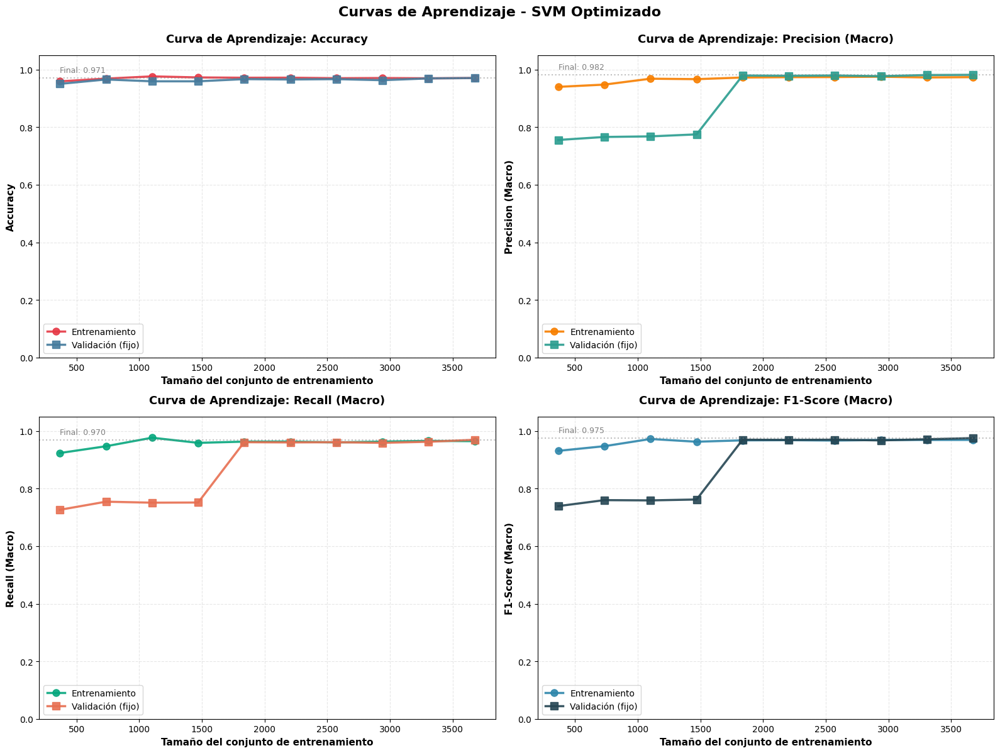

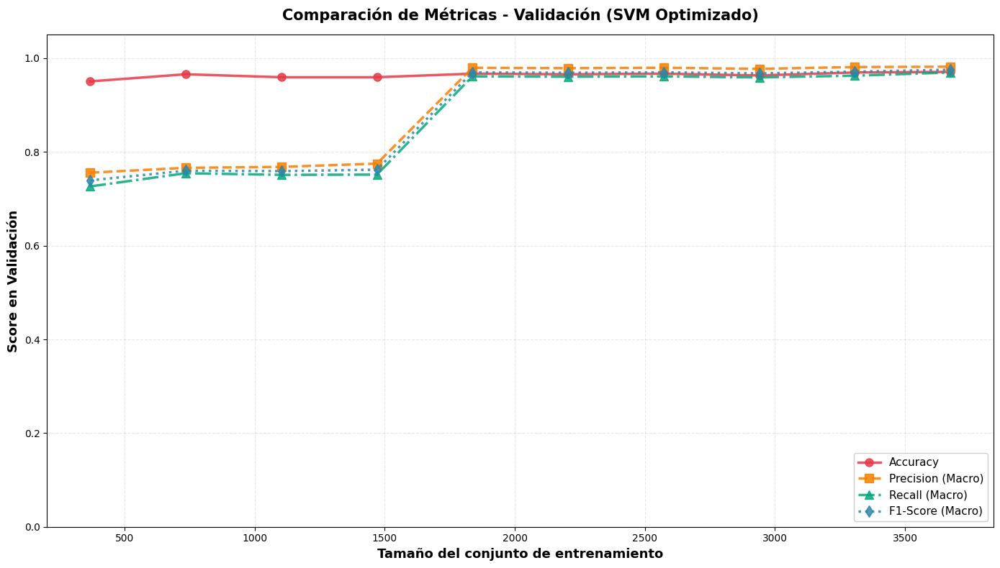


               COMPARACIÓN: SVM BASE vs OPTIMIZADO


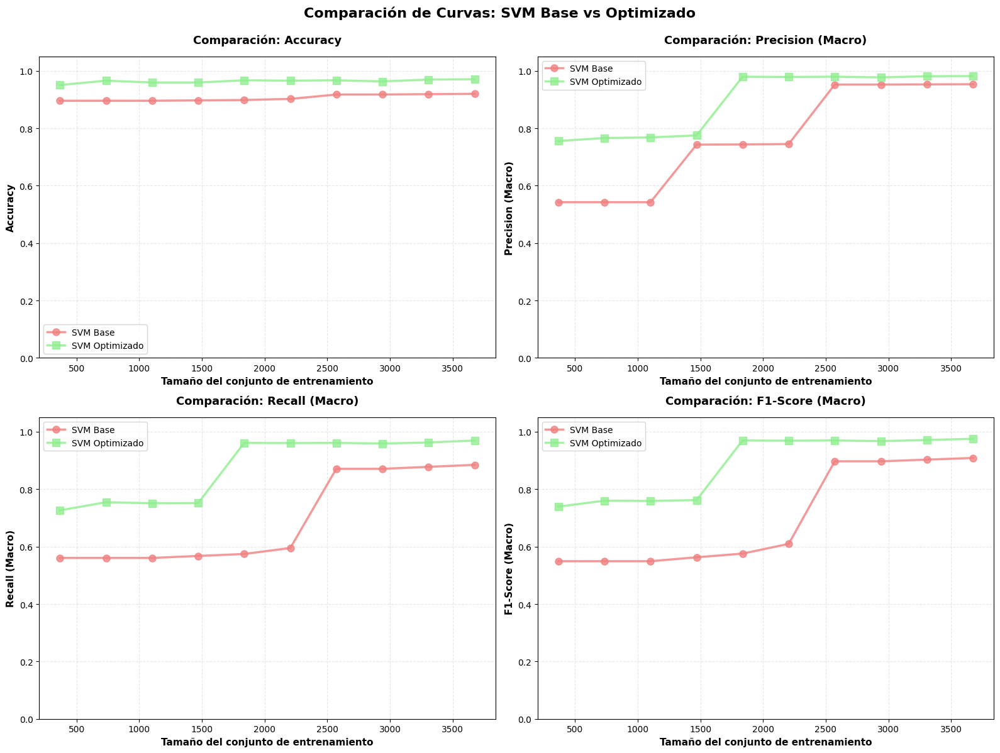


 COMPARACIÓN DE SCORES FINALES (100% de datos):
Métrica                      Base   Optimizado       Mejora
────────────────────────────────────────────────────────────────────────────────
Accuracy                   0.9199       0.9708      0.0508 🟢
Precision (Macro)          0.9533       0.9818      0.0285 🟢
Recall (Macro)             0.8847       0.9695      0.0848 🟢
F1-Score (Macro)           0.9087       0.9754      0.0667 🟢

               COMPARACIÓN: SVM vs RANDOM FOREST (OPTIMIZADOS)


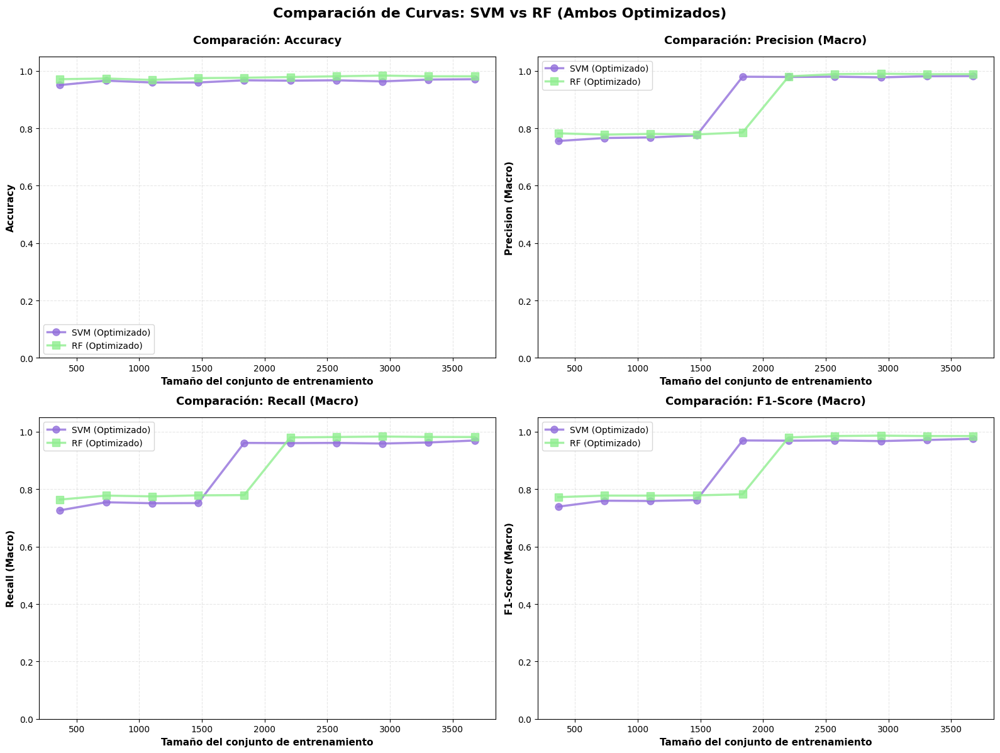


 COMPARACIÓN FINAL DE SCORES (100% de datos):
Métrica                       SVM           RF   Diferencia
────────────────────────────────────────────────────────────────────────────────
Accuracy                   0.9708       0.9809     -0.0102 🟢 RF
Precision (Macro)          0.9818       0.9885     -0.0067 🟢 RF
Recall (Macro)             0.9695       0.9817     -0.0122 🟢 RF
F1-Score (Macro)           0.9754       0.9850     -0.0096 🟢 RF

                    ANÁLISIS DE BRECHA (TRAIN-VAL GAP)
Métrica                  Train Final       Val Final          Gap          Estado
────────────────────────────────────────────────────────────────────────────────
Accuracy                      0.9706          0.9708      -0.0002     ✅ Excelente
Precision (Macro)             0.9738          0.9818      -0.0080     ✅ Excelente
Recall (Macro)                0.9648          0.9695      -0.0048     ✅ Excelente
F1-Score (Macro)              0.9691          0.9754      -0.0063     ✅ Excelente

        

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

print("="*80)
print(" "*10 + "CURVAS DE APRENDIZAJE - SVM OPTIMIZADO")
print("="*80)

# Verificar que el modelo existe
if 'best_svm' not in globals():
    print(" ERROR: Modelo SVM optimizado no encontrado")
    print("   Ejecuta primero la optimización de hiperparámetros del SVM")
else:
    # --- Función para generar curvas con división fija ---
    def plot_learning_curves_fixed_split(model, X_train, y_train, X_val, y_val,
                                         train_sizes=np.linspace(0.1, 1.0, 10)):
        """
        Genera curvas de aprendizaje usando los conjuntos de entrenamiento y validación fijos.

        Parameters:
        -----------
        model : estimador de sklearn
            Modelo ya entrenado o instancia del modelo
        X_train, y_train : arrays
            Conjunto de entrenamiento
        X_val, y_val : arrays
            Conjunto de validación (fijo, no se usa CV)
        train_sizes : array
            Proporciones del conjunto de entrenamiento a usar
        """

        # Almacenar resultados
        results = {
            'train_sizes_abs': [],
            'train_accuracy': [],
            'val_accuracy': [],
            'train_precision': [],
            'val_precision': [],
            'train_recall': [],
            'val_recall': [],
            'train_f1': [],
            'val_f1': []
        }

        n_samples = len(X_train)

        print(f"\n Entrenando con diferentes tamaños de conjunto...")
        print(f"   Total de muestras disponibles: {n_samples}")
        print(f"   Tamaños a probar: {len(train_sizes)}")
        print(f"   NOTA: SVM optimizado puede tardar varios minutos\n")

        for i, size in enumerate(train_sizes, 1):
            # Calcular número de muestras
            n_train = int(n_samples * size)
            results['train_sizes_abs'].append(n_train)

            # Seleccionar subset del entrenamiento
            indices = np.random.RandomState(42).choice(n_samples, n_train, replace=False)
            X_train_subset = X_train[indices]
            y_train_subset = y_train.iloc[indices] if hasattr(y_train, 'iloc') else y_train[indices]

            # Entrenar el modelo con el subset
            model_temp = model.__class__(**model.get_params())
            model_temp.fit(X_train_subset, y_train_subset)

            # Predecir en entrenamiento y validación
            y_train_pred = model_temp.predict(X_train_subset)
            y_val_pred = model_temp.predict(X_val)

            # Calcular métricas en entrenamiento
            results['train_accuracy'].append(accuracy_score(y_train_subset, y_train_pred))
            results['train_precision'].append(precision_score(y_train_subset, y_train_pred, average='macro', zero_division=0))
            results['train_recall'].append(recall_score(y_train_subset, y_train_pred, average='macro', zero_division=0))
            results['train_f1'].append(f1_score(y_train_subset, y_train_pred, average='macro', zero_division=0))

            # Calcular métricas en validación
            results['val_accuracy'].append(accuracy_score(y_val, y_val_pred))
            results['val_precision'].append(precision_score(y_val, y_val_pred, average='macro', zero_division=0))
            results['val_recall'].append(recall_score(y_val, y_val_pred, average='macro', zero_division=0))
            results['val_f1'].append(f1_score(y_val, y_val_pred, average='macro', zero_division=0))

            print(f"   [{i}/{len(train_sizes)}] Tamaño: {n_train:5d} | "
                  f"Acc Train: {results['train_accuracy'][-1]:.4f} | "
                  f"Acc Val: {results['val_accuracy'][-1]:.4f}")

        print("\n Curvas calculadas correctamente!")
        return results


    # --- Generar las curvas ---
    print("\n Generando curvas de aprendizaje para SVM optimizado...")
    learning_results_svm_opt = plot_learning_curves_fixed_split(
        model=best_svm,
        X_train=X_train_anova,
        y_train=y_train,
        X_val=X_val_anova,
        y_val=y_val,
        train_sizes=np.linspace(0.1, 1.0, 10)
    )

    # ============================================================================
    #                     VISUALIZACIÓN: 4 MÉTRICAS INDIVIDUALES
    # ============================================================================

    print("\n Generando visualizaciones...")

    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    axes = axes.ravel()

    metrics = [
        ('accuracy', 'Accuracy'),
        ('precision', 'Precision (Macro)'),
        ('recall', 'Recall (Macro)'),
        ('f1', 'F1-Score (Macro)')
    ]

    colors_train = ['#E63946', '#F77F00', '#06A77D', '#2E86AB']
    colors_val = ['#457B9D', '#2A9D8F', '#E76F51', '#264653']

    for idx, (metric, title) in enumerate(metrics):
        train_key = f'train_{metric}'
        val_key = f'val_{metric}'

        # Curva de entrenamiento
        axes[idx].plot(
            learning_results_svm_opt['train_sizes_abs'],
            learning_results_svm_opt[train_key],
            'o-',
            color=colors_train[idx],
            linewidth=2.5,
            markersize=8,
            label='Entrenamiento',
            alpha=0.9
        )

        # Curva de validación
        axes[idx].plot(
            learning_results_svm_opt['train_sizes_abs'],
            learning_results_svm_opt[val_key],
            's-',
            color=colors_val[idx],
            linewidth=2.5,
            markersize=8,
            label='Validación (fijo)',
            alpha=0.9
        )

        # Configuración
        axes[idx].set_xlabel('Tamaño del conjunto de entrenamiento', fontsize=11, fontweight='bold')
        axes[idx].set_ylabel(title, fontsize=11, fontweight='bold')
        axes[idx].set_title(f'Curva de Aprendizaje: {title}', fontsize=13, fontweight='bold', pad=15)
        axes[idx].legend(loc='best', fontsize=10)
        axes[idx].grid(True, alpha=0.3, linestyle='--')
        axes[idx].set_ylim([0, 1.05])

        # Línea del valor final en validación
        final_val = learning_results_svm_opt[val_key][-1]
        axes[idx].axhline(y=final_val, color='gray', linestyle=':', linewidth=1.5, alpha=0.5)
        axes[idx].text(
            learning_results_svm_opt['train_sizes_abs'][0],
            final_val + 0.02,
            f'Final: {final_val:.3f}',
            fontsize=9,
            color='gray'
        )

    plt.suptitle('Curvas de Aprendizaje - SVM Optimizado',
                 fontsize=16, fontweight='bold', y=0.995)
    plt.tight_layout()
    plt.show()

    # ============================================================================
    #                     GRÁFICO COMBINADO
    # ============================================================================

    fig, ax = plt.subplots(figsize=(14, 8))

    line_styles = ['-', '--', '-.', ':']
    markers = ['o', 's', '^', 'd']
    colors = ['#E63946', '#F77F00', '#06A77D', '#2E86AB']

    for idx, (metric, title) in enumerate(metrics):
        val_key = f'val_{metric}'
        ax.plot(
            learning_results_svm_opt['train_sizes_abs'],
            learning_results_svm_opt[val_key],
            linestyle=line_styles[idx],
            marker=markers[idx],
            color=colors[idx],
            linewidth=2.5,
            markersize=8,
            label=f'{title}',
            alpha=0.85
        )

    ax.set_xlabel('Tamaño del conjunto de entrenamiento', fontsize=13, fontweight='bold')
    ax.set_ylabel('Score en Validación', fontsize=13, fontweight='bold')
    ax.set_title('Comparación de Métricas - Validación (SVM Optimizado)',
                 fontsize=15, fontweight='bold', pad=15)
    ax.legend(loc='lower right', fontsize=11, framealpha=0.95)
    ax.grid(True, alpha=0.3, linestyle='--')
    ax.set_ylim([0, 1.05])
    plt.tight_layout()
    plt.show()

    # ============================================================================
    #                     COMPARACIÓN: BASE vs OPTIMIZADO
    # ============================================================================

    if 'learning_results_svm' in globals():
        print("\n" + "="*80)
        print(" "*15 + "COMPARACIÓN: SVM BASE vs OPTIMIZADO")
        print("="*80)

        fig, axes = plt.subplots(2, 2, figsize=(16, 12))
        axes = axes.ravel()

        for idx, (metric, title) in enumerate(metrics):
            val_key = f'val_{metric}'

            # Curva del modelo base
            axes[idx].plot(
                learning_results_svm['train_sizes_abs'],
                learning_results_svm[val_key],
                'o-',
                color='lightcoral',
                linewidth=2.5,
                markersize=8,
                label='SVM Base',
                alpha=0.8
            )

            # Curva del modelo optimizado
            axes[idx].plot(
                learning_results_svm_opt['train_sizes_abs'],
                learning_results_svm_opt[val_key],
                's-',
                color='lightgreen',
                linewidth=2.5,
                markersize=8,
                label='SVM Optimizado',
                alpha=0.8
            )

            axes[idx].set_xlabel('Tamaño del conjunto de entrenamiento', fontsize=11, fontweight='bold')
            axes[idx].set_ylabel(title, fontsize=11, fontweight='bold')
            axes[idx].set_title(f'Comparación: {title}', fontsize=13, fontweight='bold', pad=15)
            axes[idx].legend(loc='best', fontsize=10)
            axes[idx].grid(True, alpha=0.3, linestyle='--')
            axes[idx].set_ylim([0, 1.05])

        plt.suptitle('Comparación de Curvas: SVM Base vs Optimizado',
                     fontsize=16, fontweight='bold', y=0.995)
        plt.tight_layout()
        plt.show()

        # Tabla comparativa
        print("\n COMPARACIÓN DE SCORES FINALES (100% de datos):")
        print(f"{'Métrica':<20} {'Base':>12} {'Optimizado':>12} {'Mejora':>12}")
        print("─"*80)

        for metric, title in metrics:
            val_key = f'val_{metric}'
            base_score = learning_results_svm[val_key][-1]
            opt_score = learning_results_svm_opt[val_key][-1]
            mejora = opt_score - base_score

            indicador = "🟢" if mejora > 0 else "🔴" if mejora < 0 else "➡️"
            print(f"{title:<20} {base_score:>12.4f} {opt_score:>12.4f} {mejora:>11.4f} {indicador}")

        print("="*80)

    # ============================================================================
    #                     COMPARACIÓN CON RANDOM FOREST
    # ============================================================================

    if 'learning_results_rf_opt' in globals():
        print("\n" + "="*80)
        print(" "*15 + "COMPARACIÓN: SVM vs RANDOM FOREST (OPTIMIZADOS)")
        print("="*80)

        fig, axes = plt.subplots(2, 2, figsize=(16, 12))
        axes = axes.ravel()

        for idx, (metric, title) in enumerate(metrics):
            val_key = f'val_{metric}'

            # Curva del SVM optimizado
            axes[idx].plot(
                learning_results_svm_opt['train_sizes_abs'],
                learning_results_svm_opt[val_key],
                'o-',
                color='mediumpurple',
                linewidth=2.5,
                markersize=8,
                label='SVM (Optimizado)',
                alpha=0.8
            )

            # Curva del RF optimizado
            axes[idx].plot(
                learning_results_rf_opt['train_sizes_abs'],
                learning_results_rf_opt[val_key],
                's-',
                color='lightgreen',
                linewidth=2.5,
                markersize=8,
                label='RF (Optimizado)',
                alpha=0.8
            )

            axes[idx].set_xlabel('Tamaño del conjunto de entrenamiento', fontsize=11, fontweight='bold')
            axes[idx].set_ylabel(title, fontsize=11, fontweight='bold')
            axes[idx].set_title(f'Comparación: {title}', fontsize=13, fontweight='bold', pad=15)
            axes[idx].legend(loc='best', fontsize=10)
            axes[idx].grid(True, alpha=0.3, linestyle='--')
            axes[idx].set_ylim([0, 1.05])

        plt.suptitle('Comparación de Curvas: SVM vs RF (Ambos Optimizados)',
                     fontsize=16, fontweight='bold', y=0.995)
        plt.tight_layout()
        plt.show()

        # Tabla comparativa
        print("\n COMPARACIÓN FINAL DE SCORES (100% de datos):")
        print(f"{'Métrica':<20} {'SVM':>12} {'RF':>12} {'Diferencia':>12}")
        print("─"*80)

        for metric, title in metrics:
            val_key = f'val_{metric}'
            svm_score = learning_results_svm_opt[val_key][-1]
            rf_score = learning_results_rf_opt[val_key][-1]
            diff = svm_score - rf_score

            indicador = "🟢 SVM" if diff > 0 else "🟢 RF" if diff < 0 else "➡️ Empate"
            print(f"{title:<20} {svm_score:>12.4f} {rf_score:>12.4f} {diff:>11.4f} {indicador}")

        print("="*80)

    # ============================================================================
    #                     ANÁLISIS DEL GAP (TRAIN vs VAL)
    # ============================================================================

    print("\n" + "="*80)
    print(" "*20 + "ANÁLISIS DE BRECHA (TRAIN-VAL GAP)")
    print("="*80)
    print(f"{'Métrica':<20} {'Train Final':>15} {'Val Final':>15} {'Gap':>12} {'Estado':>15}")
    print("─"*80)

    for metric, title in metrics:
        train_key = f'train_{metric}'
        val_key = f'val_{metric}'

        train_final = learning_results_svm_opt[train_key][-1]
        val_final = learning_results_svm_opt[val_key][-1]
        gap = train_final - val_final

        # Diagnóstico
        if gap < 0.02:
            estado = "✅ Excelente"
        elif gap < 0.05:
            estado = "🟢 Bueno"
        elif gap < 0.10:
            estado = "🟡 Moderado"
        else:
            estado = "🔴 Alto"

        print(f"{title:<20} {train_final:>15.4f} {val_final:>15.4f} {gap:>12.4f} {estado:>15}")

    print("="*80)

    # ============================================================================
    #                     ANÁLISIS DE CONVERGENCIA
    # ============================================================================

    print("\n" + "="*80)
    print(" "*20 + "ANÁLISIS DE CONVERGENCIA")
    print("="*80)

    for metric, title in metrics:
        val_key = f'val_{metric}'
        val_scores = learning_results_svm_opt[val_key]

        # Pendiente entre los últimos dos puntos
        if len(val_scores) >= 2:
            slope = val_scores[-1] - val_scores[-2]

            print(f"\n{title}:")
            print(f"   • Score final (validación):      {val_scores[-1]:.4f}")
            print(f"   • Pendiente últimos 2 puntos:    {slope:+.5f}")

            if abs(slope) < 0.005:
                print(f"   • Estado: ✅ CONVERGIÓ - Modelo alcanzó su potencial")
            elif slope > 0:
                print(f"   • Estado: 🟡 MEJORANDO - Más datos podrían ayudar")
            else:
                print(f"   • Estado: 🔴 EMPEORANDO - Posible sobreajuste")

    print("="*80)

    # ============================================================================
    #                     DIAGNÓSTICO GENERAL
    # ============================================================================

    print("\n" + "="*80)
    print(" "*25 + "DIAGNÓSTICO GENERAL")
    print("="*80)

    # Calcular gaps promedio
    avg_gap = np.mean([
        learning_results_svm_opt[f'train_{metric}'][-1] - learning_results_svm_opt[f'val_{metric}'][-1]
        for metric, _ in metrics
    ])

    # Promedio de rendimiento en validación
    avg_val_score = np.mean([
        learning_results_svm_opt[f'val_{metric}'][-1]
        for metric, _ in metrics
    ])

    print(f"\n MÉTRICAS RESUMEN:")
    print(f"   • Gap promedio (Train-Val):       {avg_gap:.4f}")
    print(f"   • Score promedio en validación:   {avg_val_score:.4f}")

    print(f"\n DIAGNÓSTICO:")

    if avg_gap > 0.10:
        print("    OVERFITTING PERSISTENTE")
        print("   A pesar de la optimización, el modelo sobreajusta.")
        print("\n   Posibles causas:")
        print("   • C demasiado alto (poca regularización)")
        print("   • Kernel demasiado complejo para los datos")
        print("   • Pocas muestras de entrenamiento")

    elif avg_gap < 0.02 and avg_val_score < 0.70:
        print("    UNDERFITTING PERSISTENTE")
        print("   El modelo sigue siendo demasiado simple.")
        print("\n   Considera:")
        print("   • Problema puede no ser adecuado para SVM")
        print("   • Random Forest puede ser mejor opción")

    elif avg_gap < 0.05 and avg_val_score >= 0.75:
        print("    MODELO OPTIMIZADO CORRECTAMENTE")
        print("   Excelente balance entre sesgo y varianza.")
        print("\n    El modelo está listo para producción")

    else:
        print("    MODELO BIEN OPTIMIZADO")
        print("   Buen rendimiento pero con margen mínimo de mejora.")

    # Verificar si más datos ayudarían
    val_f1 = learning_results_svm_opt['val_f1']
    if len(val_f1) >= 3:
        improvement = val_f1[-1] - val_f1[-3]
        if improvement > 0.01:
            print("\n    MÁS DATOS PODRÍAN AYUDAR")
            print("   La curva aún muestra tendencia creciente.")
        else:
            print("\n    MÁS DATOS PROBABLEMENTE NO AYUDARÁN")
            print("   El modelo alcanzó su límite.")

    print("\n" + "="*80)
    print(" ANÁLISIS DE CURVAS DE APRENDIZAJE COMPLETADO")
    print("\n MODELO SVM OPTIMIZADO LISTO")
    print("="*80)

## Curvas ROC

                         CURVAS ROC - SVM OPTIMIZADO

 PASO 1: Preparando datos para curvas ROC...

✓ Número de clases: 5
  Clases: ['Gas Giant' 'Neptune-like' 'Super Earth' 'Terrestrial' 'Unknown']
  Kernel usado: linear
  Support vectors: 396

✓ Shape de y_test_bin: (788, 5)
✓ Shape de y_proba_test: (788, 5)

                    2. CALCULANDO CURVAS ROC POR CLASE

  Clase Gas Giant:
    • AUC = 0.9997

  Clase Neptune-like:
    • AUC = 0.9949

  Clase Super Earth:
    • AUC = 0.9957

  Clase Terrestrial:
    • AUC = 0.9988

  Clase Unknown:
    • AUC = 1.0000

  Micro-average:
    • AUC = 0.9973

  Macro-average:
    • AUC = 0.9982

                    3. VISUALIZANDO CURVAS ROC


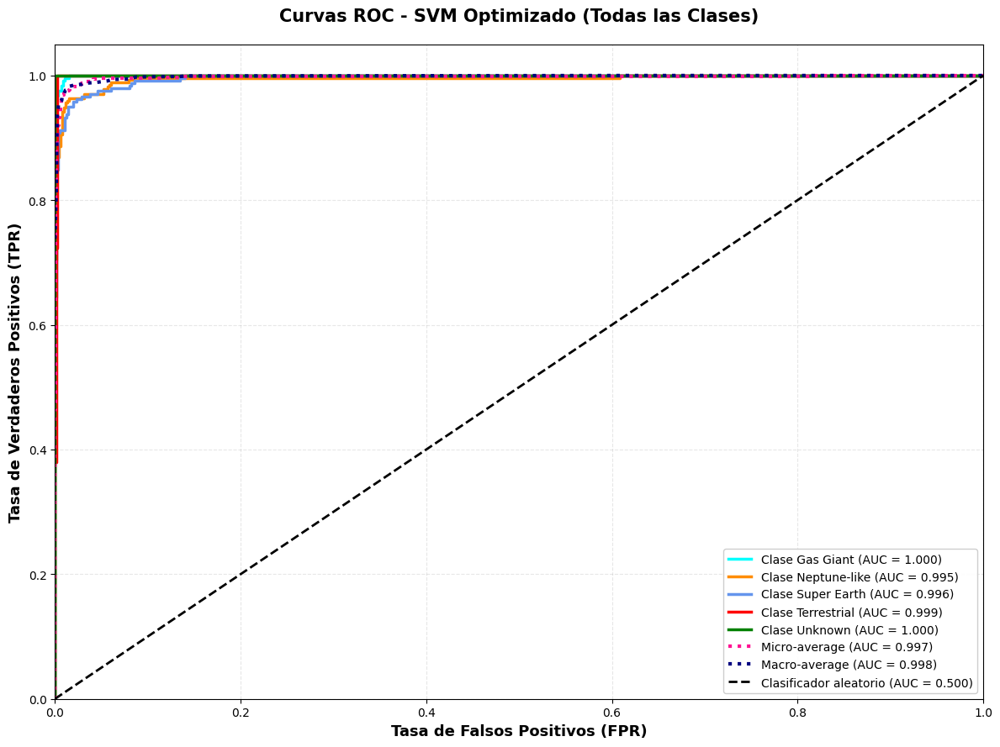


✓ Gráfico 1 generado: Todas las curvas ROC

                    4. GRÁFICOS INDIVIDUALES POR CLASE


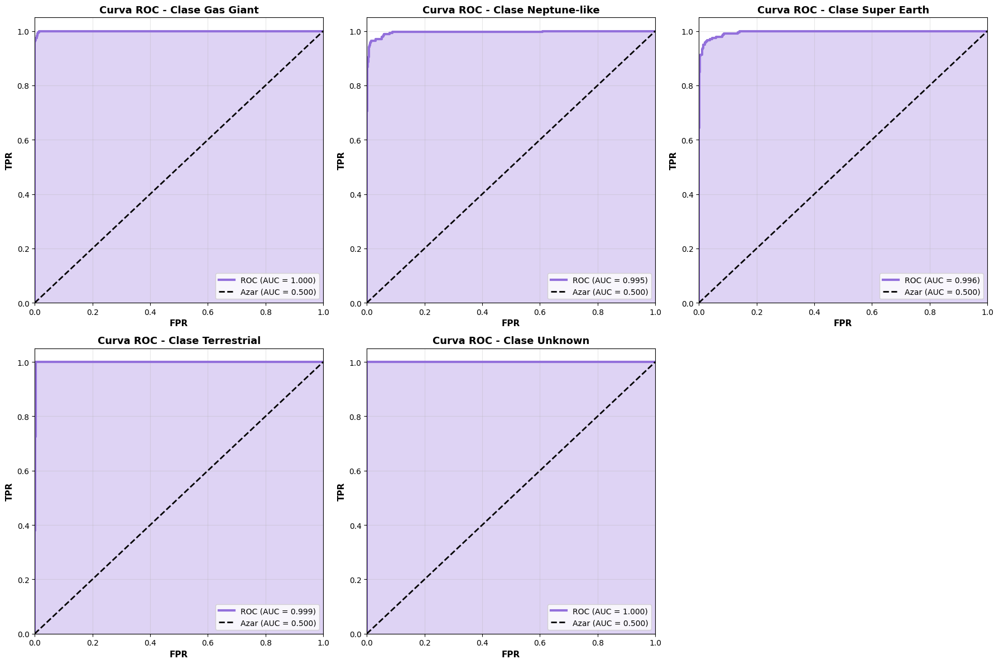


✓ Gráfico 2 generado: 5 curvas ROC individuales

                    5. COMPARACIÓN DE AUC POR CLASE


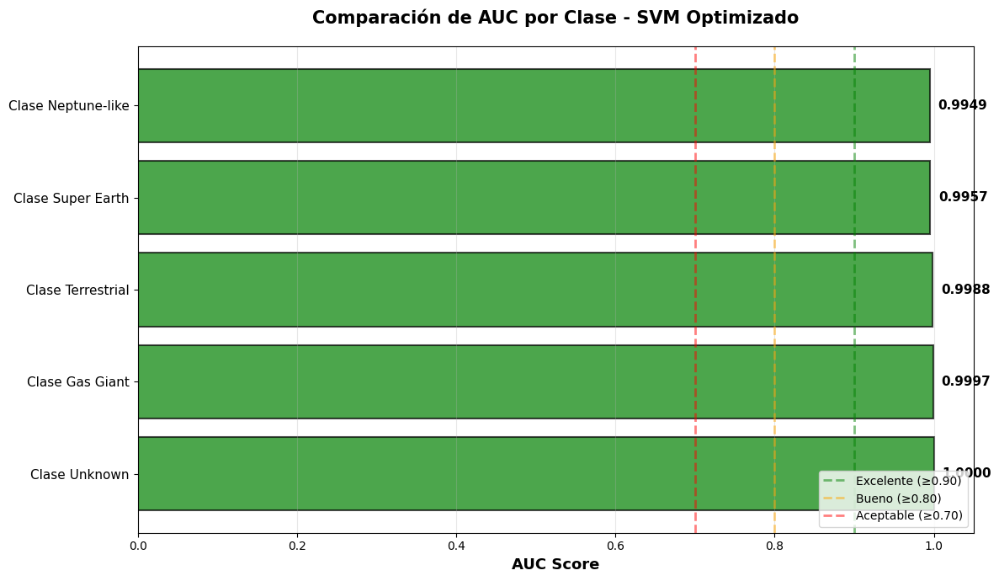


✓ Gráfico 3 generado: Comparación de AUC por clase

                    6. COMPARACIÓN: SVM vs RANDOM FOREST (ROC)

 Comparando curvas ROC: SVM vs Random Forest

 COMPARACIÓN AUC POR CLASE:
       Clase  AUC_SVM  AUC_RF  Diferencia
   Gas Giant   0.9997  0.9984      0.0013
Neptune-like   0.9949  0.9968     -0.0019
 Super Earth   0.9957  0.9947      0.0011
 Terrestrial   0.9988  0.9993     -0.0005
     Unknown   1.0000  1.0000      0.0000

 PROMEDIOS:
   • SVM Micro-average:  0.9973
   • RF Micro-average:   0.9983
   • Diferencia:         -0.0010

   • SVM Macro-average:  0.9982
   • RF Macro-average:   0.9980
   • Diferencia:         +0.0001


/tmp/ipython-input-4006825166.py:323: UserWarning: Tight layout not applied. tight_layout cannot make Axes width small enough to accommodate all Axes decorations
  plt.tight_layout()


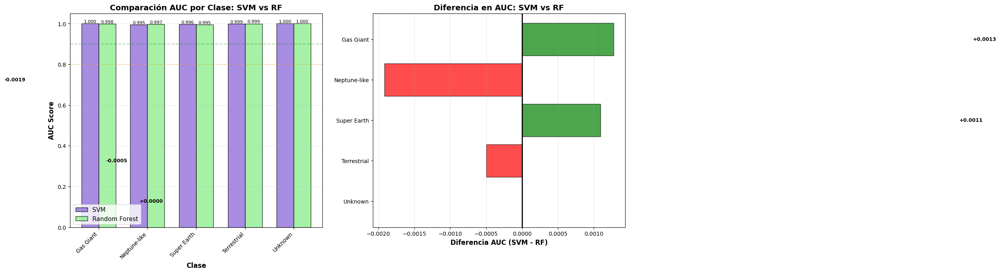


✓ Gráfico 4 generado: Comparación SVM vs RF

  SVM tiene mejor AUC macro-average por 0.0001

                              RESUMEN DE AUC SCORES - SVM

 AUC POR CLASE:
   • Clase Gas Giant : 0.9997  🟢 Excelente
   • Clase Neptune-like: 0.9949  🟢 Excelente
   • Clase Super Earth: 0.9957  🟢 Excelente
   • Clase Terrestrial: 0.9988  🟢 Excelente
   • Clase Unknown   : 1.0000  🟢 Excelente

 PROMEDIOS:
   • Micro-average: 0.9973
   • Macro-average: 0.9982
   • AUC promedio:  0.9978
   • AUC mínimo:    0.9949 (Clase Neptune-like)
   • AUC máximo:    1.0000 (Clase Unknown)

 INFORMACIÓN DEL MODELO:
   • Kernel:           linear
   • Support vectors:  396
   • C:                100
   • Gamma:            scale

  EVALUACIÓN GLOBAL: EXCELENTE
    El SVM tiene un rendimiento sobresaliente en clasificación multiclase

 ANÁLISIS DE CURVAS ROC (SVM) COMPLETADO


In [ ]:
from sklearn.metrics import roc_curve, auc, roc_auc_score
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
import numpy as np
from itertools import cycle

print("="*90)
print(" "*25 + "CURVAS ROC - SVM OPTIMIZADO")
print("="*90)

# ============================================================================
#                     1. PREPARAR DATOS PARA CURVAS ROC
# ============================================================================

print("\n PASO 1: Preparando datos para curvas ROC...")

# Obtener las clases únicas
classes = best_svm.classes_
n_classes = len(classes)

print(f"\n✓ Número de clases: {n_classes}")
print(f"  Clases: {classes}")
print(f"  Kernel usado: {best_svm.kernel}")
print(f"  Support vectors: {sum(best_svm.n_support_)}")

# Binarizar las etiquetas para multiclase
y_test_bin = label_binarize(y_test, classes=classes)

# Si es binario, ajustar dimensiones
if n_classes == 2:
    y_test_bin = np.hstack([1 - y_test_bin, y_test_bin])

# Obtener probabilidades predichas
y_proba_test_svm = best_svm.predict_proba(X_test_anova)

print(f"\n✓ Shape de y_test_bin: {y_test_bin.shape}")
print(f"✓ Shape de y_proba_test: {y_proba_test_svm.shape}")

# ============================================================================
#                     2. CALCULAR CURVAS ROC POR CLASE
# ============================================================================

print("\n" + "="*90)
print(" "*20 + "2. CALCULANDO CURVAS ROC POR CLASE")
print("="*90)

# Diccionarios para almacenar resultados
fpr_svm = dict()
tpr_svm = dict()
roc_auc_svm = dict()

# Calcular ROC para cada clase
for i in range(n_classes):
    fpr_svm[i], tpr_svm[i], _ = roc_curve(y_test_bin[:, i], y_proba_test_svm[:, i])
    roc_auc_svm[i] = auc(fpr_svm[i], tpr_svm[i])
    print(f"\n  Clase {classes[i]}:")
    print(f"    • AUC = {roc_auc_svm[i]:.4f}")

# Calcular ROC micro-average
fpr_svm["micro"], tpr_svm["micro"], _ = roc_curve(y_test_bin.ravel(), y_proba_test_svm.ravel())
roc_auc_svm["micro"] = auc(fpr_svm["micro"], tpr_svm["micro"])

print(f"\n  Micro-average:")
print(f"    • AUC = {roc_auc_svm['micro']:.4f}")

# Calcular ROC macro-average (agregando todas las curvas)
all_fpr_svm = np.unique(np.concatenate([fpr_svm[i] for i in range(n_classes)]))

mean_tpr_svm = np.zeros_like(all_fpr_svm)
for i in range(n_classes):
    mean_tpr_svm += np.interp(all_fpr_svm, fpr_svm[i], tpr_svm[i])

mean_tpr_svm /= n_classes

fpr_svm["macro"] = all_fpr_svm
tpr_svm["macro"] = mean_tpr_svm
roc_auc_svm["macro"] = auc(fpr_svm["macro"], tpr_svm["macro"])

print(f"\n  Macro-average:")
print(f"    • AUC = {roc_auc_svm['macro']:.4f}")

# ============================================================================
#                     3. VISUALIZAR CURVAS ROC
# ============================================================================

print("\n" + "="*90)
print(" "*20 + "3. VISUALIZANDO CURVAS ROC")
print("="*90)

# Figura 1: Todas las clases en un solo gráfico
fig, ax = plt.subplots(figsize=(12, 9))

# Colores para cada clase
colors = cycle(['aqua', 'darkorange', 'cornflowerblue', 'red', 'green',
                'purple', 'brown', 'pink', 'gray', 'olive'])

# Plotear curva ROC para cada clase
for i, color in zip(range(n_classes), colors):
    ax.plot(fpr_svm[i], tpr_svm[i], color=color, lw=2.5,
            label=f'Clase {classes[i]} (AUC = {roc_auc_svm[i]:.3f})')

# Plotear micro-average
ax.plot(fpr_svm["micro"], tpr_svm["micro"],
        label=f'Micro-average (AUC = {roc_auc_svm["micro"]:.3f})',
        color='deeppink', linestyle=':', linewidth=3)

# Plotear macro-average
ax.plot(fpr_svm["macro"], tpr_svm["macro"],
        label=f'Macro-average (AUC = {roc_auc_svm["macro"]:.3f})',
        color='navy', linestyle=':', linewidth=3)

# Línea diagonal (clasificador aleatorio)
ax.plot([0, 1], [0, 1], 'k--', lw=2, label='Clasificador aleatorio (AUC = 0.500)')

# Configuración del gráfico
ax.set_xlim([0.0, 1.0])
ax.set_ylim([0.0, 1.05])
ax.set_xlabel('Tasa de Falsos Positivos (FPR)', fontsize=13, fontweight='bold')
ax.set_ylabel('Tasa de Verdaderos Positivos (TPR)', fontsize=13, fontweight='bold')
ax.set_title('Curvas ROC - SVM Optimizado (Todas las Clases)',
             fontsize=15, fontweight='bold', pad=20)
ax.legend(loc="lower right", fontsize=10, framealpha=0.95)
ax.grid(True, alpha=0.3, linestyle='--')

plt.tight_layout()
plt.show()

print("\n✓ Gráfico 1 generado: Todas las curvas ROC")

# ============================================================================
#                     4. GRÁFICOS INDIVIDUALES POR CLASE
# ============================================================================

print("\n" + "="*90)
print(" "*20 + "4. GRÁFICOS INDIVIDUALES POR CLASE")
print("="*90)

# Calcular número de filas y columnas para subplots
n_cols = 3
n_rows = int(np.ceil(n_classes / n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 6*n_rows))
axes = axes.ravel() if n_classes > 1 else [axes]

for i in range(n_classes):
    ax = axes[i]

    # Plotear curva ROC de la clase
    ax.plot(fpr_svm[i], tpr_svm[i], color='mediumpurple', lw=3,
            label=f'ROC (AUC = {roc_auc_svm[i]:.3f})')

    # Línea diagonal
    ax.plot([0, 1], [0, 1], 'k--', lw=2, label='Azar (AUC = 0.500)')

    # Rellenar área bajo la curva
    ax.fill_between(fpr_svm[i], tpr_svm[i], alpha=0.3, color='mediumpurple')

    # Configuración
    ax.set_xlim([0.0, 1.0])
    ax.set_ylim([0.0, 1.05])
    ax.set_xlabel('FPR', fontsize=11, fontweight='bold')
    ax.set_ylabel('TPR', fontsize=11, fontweight='bold')
    ax.set_title(f'Curva ROC - Clase {classes[i]}',
                fontsize=13, fontweight='bold')
    ax.legend(loc="lower right", fontsize=10)
    ax.grid(True, alpha=0.3)

# Ocultar subplots vacíos
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

print(f"\n✓ Gráfico 2 generado: {n_classes} curvas ROC individuales")

# ============================================================================
#                     5. COMPARACIÓN DE AUC POR CLASE
# ============================================================================

print("\n" + "="*90)
print(" "*20 + "5. COMPARACIÓN DE AUC POR CLASE")
print("="*90)

# Crear gráfico de barras
fig, ax = plt.subplots(figsize=(12, 7))

# Preparar datos
class_names = [f'Clase {c}' for c in classes]
auc_values_svm = [roc_auc_svm[i] for i in range(n_classes)]

# Ordenar por AUC
sorted_indices = np.argsort(auc_values_svm)[::-1]
class_names_sorted = [class_names[i] for i in sorted_indices]
auc_values_sorted = [auc_values_svm[i] for i in sorted_indices]

# Colores según rendimiento
colors_bar = ['green' if auc >= 0.9 else 'orange' if auc >= 0.8 else 'red'
              for auc in auc_values_sorted]

# Crear barras
bars = ax.barh(range(n_classes), auc_values_sorted,
               color=colors_bar, alpha=0.7, edgecolor='black', linewidth=1.5)

# Añadir valores en las barras
for i, (bar, auc_val) in enumerate(zip(bars, auc_values_sorted)):
    width = bar.get_width()
    ax.text(width + 0.01, bar.get_y() + bar.get_height()/2,
            f'{auc_val:.4f}',
            ha='left', va='center', fontsize=11, fontweight='bold')

# Líneas de referencia
ax.axvline(x=0.9, color='green', linestyle='--', linewidth=2,
           alpha=0.5, label='Excelente (≥0.90)')
ax.axvline(x=0.8, color='orange', linestyle='--', linewidth=2,
           alpha=0.5, label='Bueno (≥0.80)')
ax.axvline(x=0.7, color='red', linestyle='--', linewidth=2,
           alpha=0.5, label='Aceptable (≥0.70)')

# Configuración
ax.set_yticks(range(n_classes))
ax.set_yticklabels(class_names_sorted, fontsize=11)
ax.set_xlabel('AUC Score', fontsize=13, fontweight='bold')
ax.set_title('Comparación de AUC por Clase - SVM Optimizado',
             fontsize=15, fontweight='bold', pad=20)
ax.set_xlim([0, 1.05])
ax.legend(loc='lower right', fontsize=10)
ax.grid(axis='x', alpha=0.3)

plt.tight_layout()
plt.show()

print("\n✓ Gráfico 3 generado: Comparación de AUC por clase")

# ============================================================================
#                     6. COMPARACIÓN SVM vs RANDOM FOREST (ROC)
# ============================================================================

print("\n" + "="*90)
print(" "*20 + "6. COMPARACIÓN: SVM vs RANDOM FOREST (ROC)")
print("="*90)

# Verificar si existen las curvas ROC de Random Forest
if 'roc_auc' in globals():
    print("\n Comparando curvas ROC: SVM vs Random Forest")

    # Crear DataFrame comparativo
    comparison_auc = []
    for i in range(n_classes):
        comparison_auc.append({
            'Clase': classes[i],
            'AUC_SVM': roc_auc_svm[i],
            'AUC_RF': roc_auc[i],
            'Diferencia': roc_auc_svm[i] - roc_auc[i]
        })

    comparison_auc_df = pd.DataFrame(comparison_auc)

    print("\n COMPARACIÓN AUC POR CLASE:")
    print(comparison_auc_df.to_string(index=False, float_format='%.4f'))

    # Comparación de promedios
    print(f"\n PROMEDIOS:")
    print(f"   • SVM Micro-average:  {roc_auc_svm['micro']:.4f}")
    print(f"   • RF Micro-average:   {roc_auc['micro']:.4f}")
    print(f"   • Diferencia:         {roc_auc_svm['micro'] - roc_auc['micro']:+.4f}")
    print(f"\n   • SVM Macro-average:  {roc_auc_svm['macro']:.4f}")
    print(f"   • RF Macro-average:   {roc_auc['macro']:.4f}")
    print(f"   • Diferencia:         {roc_auc_svm['macro'] - roc_auc['macro']:+.4f}")

    # Visualización comparativa
    fig, axes = plt.subplots(1, 2, figsize=(18, 7))

    # Subplot 1: Comparación por clase
    x_pos = np.arange(n_classes)
    width = 0.35

    bars1 = axes[0].bar(x_pos - width/2, comparison_auc_df['AUC_SVM'], width,
                       label='SVM', color='mediumpurple', alpha=0.8, edgecolor='black')
    bars2 = axes[0].bar(x_pos + width/2, comparison_auc_df['AUC_RF'], width,
                       label='Random Forest', color='lightgreen', alpha=0.8, edgecolor='black')

    axes[0].set_xlabel('Clase', fontsize=12, fontweight='bold')
    axes[0].set_ylabel('AUC Score', fontsize=12, fontweight='bold')
    axes[0].set_title('Comparación AUC por Clase: SVM vs RF', fontsize=14, fontweight='bold')
    axes[0].set_xticks(x_pos)
    axes[0].set_xticklabels(classes, rotation=45, ha='right')
    axes[0].legend(fontsize=11)
    axes[0].set_ylim([0, 1.05])
    axes[0].grid(axis='y', alpha=0.3)
    axes[0].axhline(y=0.9, color='green', linestyle='--', alpha=0.3)
    axes[0].axhline(y=0.8, color='orange', linestyle='--', alpha=0.3)

    # Añadir valores en las barras
    for bars in [bars1, bars2]:
        for bar in bars:
            height = bar.get_height()
            axes[0].text(bar.get_x() + bar.get_width()/2., height,
                        f'{height:.3f}', ha='center', va='bottom', fontsize=8)

    # Subplot 2: Diferencias
    colors_diff = ['green' if d > 0 else 'red' for d in comparison_auc_df['Diferencia']]
    bars3 = axes[1].barh(range(n_classes), comparison_auc_df['Diferencia'],
                        color=colors_diff, alpha=0.7, edgecolor='black')

    axes[1].set_yticks(range(n_classes))
    axes[1].set_yticklabels(classes, fontsize=10)
    axes[1].set_xlabel('Diferencia AUC (SVM - RF)', fontsize=12, fontweight='bold')
    axes[1].set_title('Diferencia en AUC: SVM vs RF', fontsize=14, fontweight='bold')
    axes[1].axvline(x=0, color='black', linestyle='-', linewidth=2)
    axes[1].grid(axis='x', alpha=0.3)
    axes[1].invert_yaxis()

    # Añadir valores
    for i, (bar, diff) in enumerate(zip(bars3, comparison_auc_df['Diferencia'])):
        width = bar.get_width()
        axes[1].text(width + (0.005 if width > 0 else -0.005),
                    bar.get_y() + bar.get_height()/2,
                    f'{diff:+.4f}',
                    ha='left' if width > 0 else 'right',
                    va='center', fontsize=9, fontweight='bold')

    plt.tight_layout()
    plt.show()

    print("\n✓ Gráfico 4 generado: Comparación SVM vs RF")

    # Determinar ganador
    if roc_auc_svm['macro'] > roc_auc['macro']:
        diff = roc_auc_svm['macro'] - roc_auc['macro']
        print(f"\n  SVM tiene mejor AUC macro-average por {diff:.4f}")
    elif roc_auc['macro'] > roc_auc_svm['macro']:
        diff = roc_auc['macro'] - roc_auc_svm['macro']
        print(f"\n  Random Forest tiene mejor AUC macro-average por {diff:.4f}")
    else:
        print(f"\n   Empate técnico en AUC macro-average")

else:
    print("\n  No se encontraron curvas ROC de Random Forest para comparar")

# ============================================================================
#                     7. RESUMEN DE AUC SCORES
# ============================================================================

print("\n" + "="*90)
print(" "*30 + "RESUMEN DE AUC SCORES - SVM")
print("="*90)

print("\n AUC POR CLASE:")
for i in range(n_classes):
    status = "🟢 Excelente" if roc_auc_svm[i] >= 0.9 else \
             "🟡 Bueno" if roc_auc_svm[i] >= 0.8 else \
             "🟠 Aceptable" if roc_auc_svm[i] >= 0.7 else \
             "🔴 Mejorable"
    print(f"   • Clase {classes[i]:10s}: {roc_auc_svm[i]:.4f}  {status}")

print(f"\n PROMEDIOS:")
print(f"   • Micro-average: {roc_auc_svm['micro']:.4f}")
print(f"   • Macro-average: {roc_auc_svm['macro']:.4f}")
print(f"   • AUC promedio:  {np.mean(auc_values_svm):.4f}")
print(f"   • AUC mínimo:    {np.min(auc_values_svm):.4f} (Clase {classes[np.argmin(auc_values_svm)]})")
print(f"   • AUC máximo:    {np.max(auc_values_svm):.4f} (Clase {classes[np.argmax(auc_values_svm)]})")

print(f"\n INFORMACIÓN DEL MODELO:")
print(f"   • Kernel:           {best_svm.kernel}")
print(f"   • Support vectors:  {sum(best_svm.n_support_)}")
print(f"   • C:                {best_svm.C}")
if hasattr(best_svm, 'gamma'):
    print(f"   • Gamma:            {best_svm.gamma}")

# Evaluación global
auc_mean_svm = np.mean(auc_values_svm)
if auc_mean_svm >= 0.9:
    print(f"\n  EVALUACIÓN GLOBAL: EXCELENTE")
    print(f"    El SVM tiene un rendimiento sobresaliente en clasificación multiclase")
elif auc_mean_svm >= 0.8:
    print(f"\n  EVALUACIÓN GLOBAL: BUENO")
    print(f"    El SVM tiene un buen rendimiento discriminativo")
elif auc_mean_svm >= 0.7:
    print(f"\n   EVALUACIÓN GLOBAL: ACEPTABLE")
    print(f"    El SVM funciona, pero existe un margen de mejora")
else:
    print(f"\n  EVALUACIÓN GLOBAL: MEJORABLE")
    print(f"    Revisar hiperparámetros y preprocesamiento")

print("\n" + "="*90)
print(" ANÁLISIS DE CURVAS ROC (SVM) COMPLETADO")
print("="*90)

# KNN - Anova

                    KNN CON FEATURES SELECCIONADAS POR ANOVA
                         (Modelo Base - Sin Optimizar)

 PASO 1: Verificando datos disponibles...
 Datos disponibles:
   • X_train shape: (3675, 15)
   • X_val shape:   (787, 15)
   • X_test shape:  (788, 15)
   • Features usadas: 15

               2. ENTRENAMIENTO DE KNN (HIPERPARÁMETROS POR DEFECTO)

 Hiperparámetros del modelo:
   • n_neighbors:        5
   • weights:            uniform
   • algorithm:          auto
   • metric:             minkowski (p=2, Euclidiana)
   • leaf_size:          30

 Entrenando KNN...
   NOTA: KNN es muy rápido en entrenamiento (lazy learning)
 Modelo 'entrenado' en 0.0178 segundos
   (KNN solo guarda los datos, no hay entrenamiento real)

 Información del modelo:
   • Número de clases:       5
   • Clases:                 ['Gas Giant' 'Neptune-like' 'Super Earth' 'Terrestrial' 'Unknown']
   • Muestras almacenadas:   3675

                         3. PREDICCIONES

 Generando predicciones en 

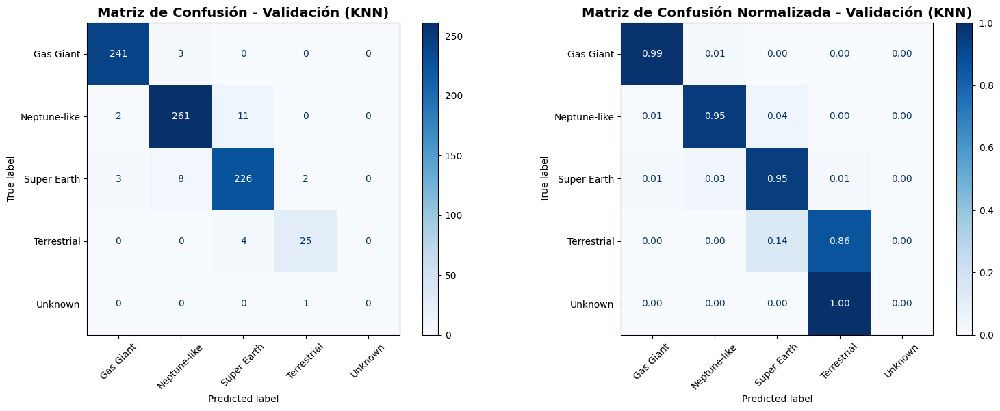


                    5. EVALUACIÓN EN CONJUNTO DE PRUEBA (TEST)

 Métricas Globales (Test):
   • Accuracy:           0.9454 (94.54%)
   • Precision (macro):  0.7444
   • Recall (macro):     0.7243
   • F1-Score (macro):   0.7334

 REPORTE DE CLASIFICACIÓN (Test):
              precision    recall  f1-score   support

   Gas Giant     0.9720    0.9918    0.9818       245
Neptune-like     0.9483    0.9380    0.9431       274
 Super Earth     0.9215    0.9331    0.9272       239
 Terrestrial     0.8800    0.7586    0.8148        29
     Unknown     0.0000    0.0000    0.0000         1

    accuracy                         0.9454       788
   macro avg     0.7444    0.7243    0.7334       788
weighted avg     0.9438    0.9454    0.9444       788



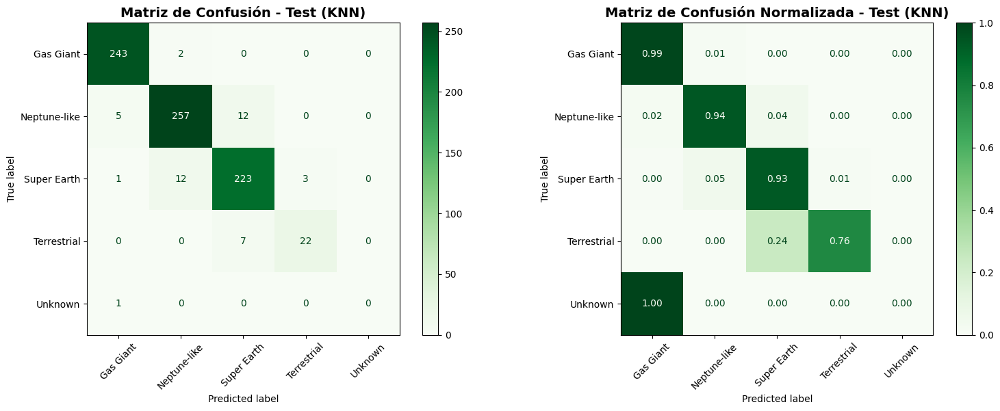


                    6. COMPARACIÓN: VALIDACIÓN vs TEST

  Métrica  Validación   Test  Diferencia  Diferencia_%
 Accuracy      0.9568 0.9454     -0.0114       -1.1880
Precision      0.7540 0.7444     -0.0096       -1.2739
   Recall      0.7496 0.7243     -0.0253       -3.3743
 F1-Score      0.7517 0.7334     -0.0183       -2.4368


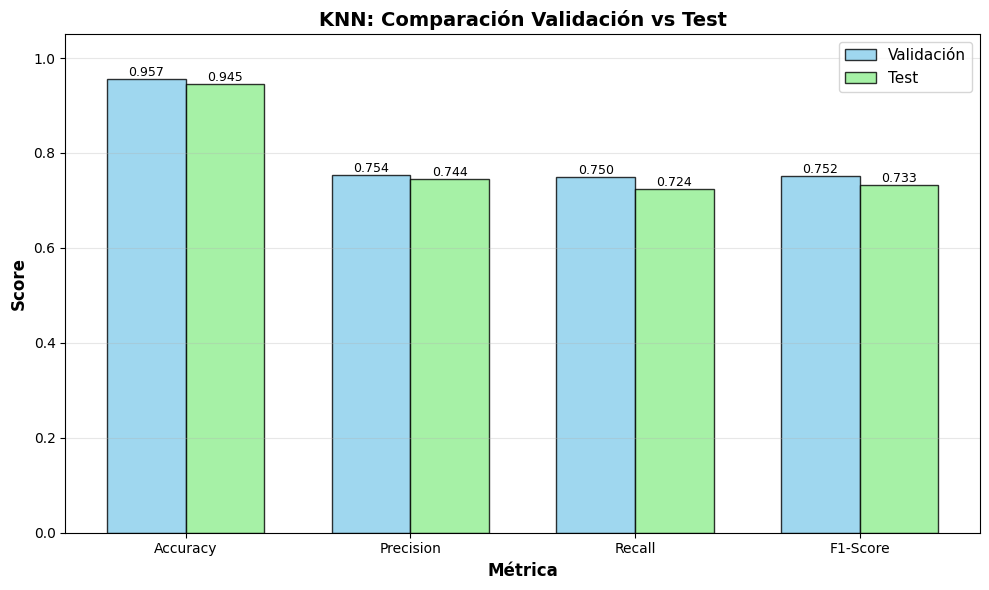


 ANÁLISIS:
   ✅ EXCELENTE - Modelo generaliza muy bien
   Diferencia promedio: -0.0161 (muy pequeña)

               7. COMPARACIÓN: KNN vs OTROS MODELOS (TEST)

                    8. ANÁLISIS DE CONFIANZA DEL MODELO

 Probabilidad promedio predicha por clase (Validación):
   • Gas Giant                : 0.3128
   • Neptune-like             : 0.3418
   • Super Earth              : 0.3080
   • Terrestrial              : 0.0368
   • Unknown                  : 0.0005


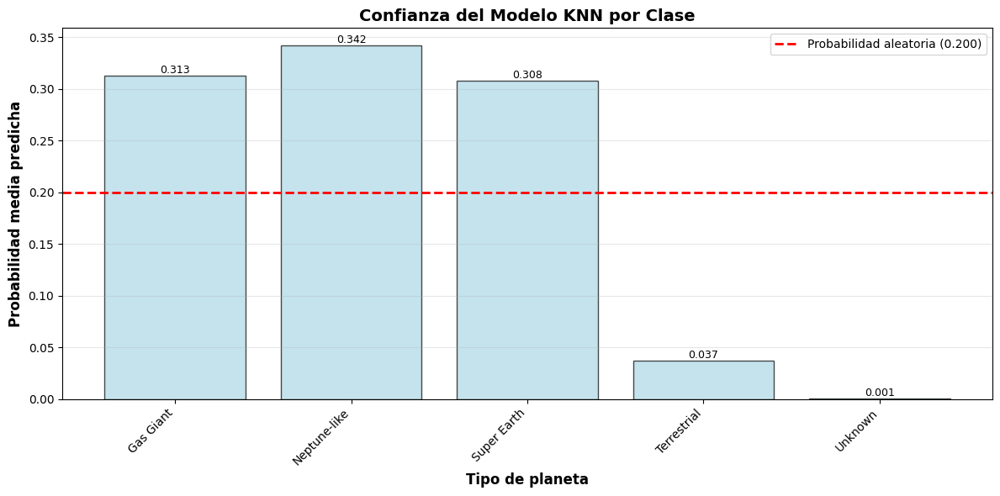


                               RESUMEN FINAL

 CONFIGURACIÓN DEL MODELO:
   • Algoritmo:          KNN (K-Nearest Neighbors)
   • K (vecinos):        5
   • Métrica:            Euclidiana (Minkowski p=2)
   • Método de selección: ANOVA F-test
   • Features usadas:    15
   • Tiempo de 'entrenamiento': 0.0178 segundos

 RENDIMIENTO EN TEST (FINAL):
   • Accuracy:   0.9454 (94.54%)
   • Precision:  0.7444
   • Recall:     0.7243
   • F1-Score:   0.7334

 CARACTERÍSTICAS DE KNN:
   ✓ Muy rápido en entrenamiento (lazy learning)
   ✓ No hace suposiciones sobre la distribución de datos
   ✓ Intuitivo y fácil de interpretar
   ✗ Lento en predicción con muchos datos
   ✗ Sensible a features irrelevantes y escala
   ✗ Sufre con alta dimensionalidad (curse of dimensionality)

 MODELO GUARDADO EN VARIABLE: knn_base

 EVALUACIÓN DE KNN COMPLETADA


In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    classification_report, confusion_matrix, ConfusionMatrixDisplay
)
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import time

print("="*90)
print(" "*20 + "KNN CON FEATURES SELECCIONADAS POR ANOVA")
print(" "*25 + "(Modelo Base - Sin Optimizar)")
print("="*90)

# ============================================================================
#                     1. VERIFICAR DATOS
# ============================================================================

print("\n PASO 1: Verificando datos disponibles...")

if 'X_train_anova' not in globals() or 'X_val_anova' not in globals():
    print(" ERROR: Datos con features de ANOVA no encontrados")
    print("   Ejecuta primero la selección de features con ANOVA y preparación de datos")
else:
    print(f" Datos disponibles:")
    print(f"   • X_train shape: {X_train_anova.shape}")
    print(f"   • X_val shape:   {X_val_anova.shape}")
    print(f"   • X_test shape:  {X_test_anova.shape}")
    print(f"   • Features usadas: {X_train_anova.shape[1]}")

    # ============================================================================
    #                     2. ENTRENAR KNN (SIN OPTIMIZAR)
    # ============================================================================

    print("\n" + "="*90)
    print(" "*15 + "2. ENTRENAMIENTO DE KNN (HIPERPARÁMETROS POR DEFECTO)")
    print("="*90)

    # Modelo con hiperparámetros por defecto
    knn_base = KNeighborsClassifier(
        n_neighbors=5,           # Default
        weights='uniform',       # Default
        algorithm='auto',        # Default
        leaf_size=30,           # Default
        p=2,                    # Default (distancia euclidiana)
        metric='minkowski',     # Default
        n_jobs=-1
    )

    print("\n Hiperparámetros del modelo:")
    print(f"   • n_neighbors:        5")
    print(f"   • weights:            uniform")
    print(f"   • algorithm:          auto")
    print(f"   • metric:             minkowski (p=2, Euclidiana)")
    print(f"   • leaf_size:          30")

    print("\n Entrenando KNN...")
    print("   NOTA: KNN es muy rápido en entrenamiento (lazy learning)")

    start_time = time.time()

    knn_base.fit(X_train_anova, y_train)

    training_time = time.time() - start_time

    print(f" Modelo 'entrenado' en {training_time:.4f} segundos")
    print(f"   (KNN solo guarda los datos, no hay entrenamiento real)")

    # Información del modelo
    print(f"\n Información del modelo:")
    print(f"   • Número de clases:       {len(knn_base.classes_)}")
    print(f"   • Clases:                 {knn_base.classes_}")
    print(f"   • Muestras almacenadas:   {knn_base._fit_X.shape[0]}")

    # ============================================================================
    #                     3. PREDICCIONES
    # ============================================================================

    print("\n" + "="*90)
    print(" "*25 + "3. PREDICCIONES")
    print("="*90)

    # Predicciones en validación
    print("\n Generando predicciones en validación...")
    y_pred_val_knn = knn_base.predict(X_val_anova)
    y_proba_val_knn = knn_base.predict_proba(X_val_anova)

    # Predicciones en test
    print(" Generando predicciones en test...")
    y_pred_test_knn = knn_base.predict(X_test_anova)
    y_proba_test_knn = knn_base.predict_proba(X_test_anova)

    print(" Predicciones completadas")
    print("   NOTA: La predicción en KNN puede ser lenta con muchos datos")

    # ============================================================================
    #                     4. EVALUACIÓN EN VALIDACIÓN
    # ============================================================================

    print("\n" + "="*90)
    print(" "*20 + "4. EVALUACIÓN EN CONJUNTO DE VALIDACIÓN")
    print("="*90)

    # Métricas básicas
    acc_val_knn = accuracy_score(y_val, y_pred_val_knn)
    prec_val_knn = precision_score(y_val, y_pred_val_knn, average='macro', zero_division=0)
    rec_val_knn = recall_score(y_val, y_pred_val_knn, average='macro', zero_division=0)
    f1_val_knn = f1_score(y_val, y_pred_val_knn, average='macro', zero_division=0)

    print(f"\n Métricas Globales (Validación):")
    print(f"   • Accuracy:           {acc_val_knn:.4f} ({acc_val_knn*100:.2f}%)")
    print(f"   • Precision (macro):  {prec_val_knn:.4f}")
    print(f"   • Recall (macro):     {rec_val_knn:.4f}")
    print(f"   • F1-Score (macro):   {f1_val_knn:.4f}")

    # Reporte de clasificación
    print("\n REPORTE DE CLASIFICACIÓN (Validación):")
    print(classification_report(y_val, y_pred_val_knn, digits=4))

    # Matriz de confusión
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))

    cm_val_knn = confusion_matrix(y_val, y_pred_val_knn)
    disp_val_knn = ConfusionMatrixDisplay(confusion_matrix=cm_val_knn, display_labels=knn_base.classes_)
    disp_val_knn.plot(cmap='Blues', ax=axes[0], xticks_rotation=45, values_format='d')
    axes[0].set_title('Matriz de Confusión - Validación (KNN)', fontsize=14, fontweight='bold')
    axes[0].grid(False)

    # Matriz normalizada
    cm_val_knn_norm = cm_val_knn.astype('float') / cm_val_knn.sum(axis=1)[:, np.newaxis]
    disp_val_knn_norm = ConfusionMatrixDisplay(confusion_matrix=cm_val_knn_norm, display_labels=knn_base.classes_)
    disp_val_knn_norm.plot(cmap='Blues', ax=axes[1], xticks_rotation=45, values_format='.2f')
    axes[1].set_title('Matriz de Confusión Normalizada - Validación (KNN)', fontsize=14, fontweight='bold')
    axes[1].grid(False)

    plt.tight_layout()
    plt.show()

    # ============================================================================
    #                     5. EVALUACIÓN EN TEST
    # ============================================================================

    print("\n" + "="*90)
    print(" "*20 + "5. EVALUACIÓN EN CONJUNTO DE PRUEBA (TEST)")
    print("="*90)

    # Métricas básicas
    acc_test_knn = accuracy_score(y_test, y_pred_test_knn)
    prec_test_knn = precision_score(y_test, y_pred_test_knn, average='macro', zero_division=0)
    rec_test_knn = recall_score(y_test, y_pred_test_knn, average='macro', zero_division=0)
    f1_test_knn = f1_score(y_test, y_pred_test_knn, average='macro', zero_division=0)

    print(f"\n Métricas Globales (Test):")
    print(f"   • Accuracy:           {acc_test_knn:.4f} ({acc_test_knn*100:.2f}%)")
    print(f"   • Precision (macro):  {prec_test_knn:.4f}")
    print(f"   • Recall (macro):     {rec_test_knn:.4f}")
    print(f"   • F1-Score (macro):   {f1_test_knn:.4f}")

    # Reporte de clasificación
    print("\n REPORTE DE CLASIFICACIÓN (Test):")
    print(classification_report(y_test, y_pred_test_knn, digits=4))

    # Matrices de confusión
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))

    cm_test_knn = confusion_matrix(y_test, y_pred_test_knn)
    disp_test_knn = ConfusionMatrixDisplay(confusion_matrix=cm_test_knn, display_labels=knn_base.classes_)
    disp_test_knn.plot(cmap='Greens', ax=axes[0], xticks_rotation=45, values_format='d')
    axes[0].set_title('Matriz de Confusión - Test (KNN)', fontsize=14, fontweight='bold')
    axes[0].grid(False)

    # Matriz normalizada
    cm_test_knn_norm = cm_test_knn.astype('float') / cm_test_knn.sum(axis=1)[:, np.newaxis]
    disp_test_knn_norm = ConfusionMatrixDisplay(confusion_matrix=cm_test_knn_norm, display_labels=knn_base.classes_)
    disp_test_knn_norm.plot(cmap='Greens', ax=axes[1], xticks_rotation=45, values_format='.2f')
    axes[1].set_title('Matriz de Confusión Normalizada - Test (KNN)', fontsize=14, fontweight='bold')
    axes[1].grid(False)

    plt.tight_layout()
    plt.show()

    # ============================================================================
    #                     6. COMPARACIÓN VAL vs TEST
    # ============================================================================

    print("\n" + "="*90)
    print(" "*20 + "6. COMPARACIÓN: VALIDACIÓN vs TEST")
    print("="*90)

    comparison_knn = pd.DataFrame({
        'Métrica': ['Accuracy', 'Precision', 'Recall', 'F1-Score'],
        'Validación': [acc_val_knn, prec_val_knn, rec_val_knn, f1_val_knn],
        'Test': [acc_test_knn, prec_test_knn, rec_test_knn, f1_test_knn]
    })

    comparison_knn['Diferencia'] = comparison_knn['Test'] - comparison_knn['Validación']
    comparison_knn['Diferencia_%'] = (comparison_knn['Diferencia'] / comparison_knn['Validación']) * 100

    print("\n" + comparison_knn.to_string(index=False, float_format='%.4f'))

    # Visualización
    fig, ax = plt.subplots(figsize=(10, 6))

    x = np.arange(len(comparison_knn))
    width = 0.35

    bars1 = ax.bar(x - width/2, comparison_knn['Validación'], width,
                   label='Validación', color='skyblue', alpha=0.8, edgecolor='black')
    bars2 = ax.bar(x + width/2, comparison_knn['Test'], width,
                   label='Test', color='lightgreen', alpha=0.8, edgecolor='black')

    ax.set_ylabel('Score', fontsize=12, fontweight='bold')
    ax.set_xlabel('Métrica', fontsize=12, fontweight='bold')
    ax.set_title('KNN: Comparación Validación vs Test', fontsize=14, fontweight='bold')
    ax.set_xticks(x)
    ax.set_xticklabels(comparison_knn['Métrica'])
    ax.legend(fontsize=11)
    ax.set_ylim([0, 1.05])
    ax.grid(axis='y', alpha=0.3)

    # Añadir valores
    for bars in [bars1, bars2]:
        for bar in bars:
            height = bar.get_height()
            ax.text(bar.get_x() + bar.get_width()/2., height,
                   f'{height:.3f}', ha='center', va='bottom', fontsize=9)

    plt.tight_layout()
    plt.show()

    # Análisis de overfitting/underfitting
    avg_diff = comparison_knn['Diferencia'].mean()

    print(f"\n ANÁLISIS:")
    if abs(avg_diff) < 0.02:
        print(f"   ✅ EXCELENTE - Modelo generaliza muy bien")
        print(f"   Diferencia promedio: {avg_diff:+.4f} (muy pequeña)")
    elif avg_diff < -0.05:
        print(f"   ⚠️  POSIBLE OVERFITTING")
        print(f"   El modelo funciona mejor en validación que en test")
        print(f"   Diferencia promedio: {avg_diff:+.4f}")
    elif avg_diff > 0.05:
        print(f"   🔴 INUSUAL - Test mejor que validación")
        print(f"   Verificar datos de validación")
    else:
        print(f"   ✅ BUENO - Modelo generaliza adecuadamente")
        print(f"   Diferencia promedio: {avg_diff:+.4f}")

    # ============================================================================
    #                     7. COMPARACIÓN CON OTROS MODELOS
    # ============================================================================

    print("\n" + "="*90)
    print(" "*15 + "7. COMPARACIÓN: KNN vs OTROS MODELOS (TEST)")
    print("="*90)

    # Recopilar resultados de otros modelos si existen
    models_comparison = [
        {'Modelo': 'KNN (Base)',
         'Accuracy': acc_test_knn,
         'F1-Score': f1_test_knn}
    ]

    if 'f1_opt_test' in globals():
        models_comparison.append({
            'Modelo': 'RF (Optimizado)',
            'Accuracy': acc_opt_test,
            'F1-Score': f1_opt_test
        })

    if 'f1_opt_test_svm' in globals():
        models_comparison.append({
            'Modelo': 'SVM (Optimizado)',
            'Accuracy': acc_opt_test_svm,
            'F1-Score': f1_opt_test_svm
        })

    if len(models_comparison) > 1:
        comparison_models_df = pd.DataFrame(models_comparison)
        comparison_models_df = comparison_models_df.sort_values('F1-Score', ascending=False)

        print("\n Ranking de modelos por F1-Score:")
        for idx, row in comparison_models_df.iterrows():
            medal = ['1:', '2:', '3:'][idx] if idx < 3 else f'{idx+1}.'
            print(f"   {medal} {row['Modelo']:<20} - F1: {row['F1-Score']:.4f}, Acc: {row['Accuracy']:.4f}")

        # Visualización
        fig, ax = plt.subplots(figsize=(10, 6))

        x_pos = np.arange(len(comparison_models_df))
        colors_models = ['lightblue', 'lightgreen', 'mediumpurple'][:len(comparison_models_df)]

        bars = ax.bar(x_pos, comparison_models_df['F1-Score'],
                     color=colors_models, alpha=0.8, edgecolor='black')

        ax.set_ylabel('F1-Score', fontsize=12, fontweight='bold')
        ax.set_xlabel('Modelo', fontsize=12, fontweight='bold')
        ax.set_title('Comparación de Modelos por F1-Score (Test)', fontsize=14, fontweight='bold')
        ax.set_xticks(x_pos)
        ax.set_xticklabels(comparison_models_df['Modelo'], rotation=45, ha='right')
        ax.set_ylim([0, 1.05])
        ax.grid(axis='y', alpha=0.3)

        # Añadir valores
        for bar in bars:
            height = bar.get_height()
            ax.text(bar.get_x() + bar.get_width()/2., height,
                   f'{height:.4f}', ha='center', va='bottom', fontsize=10, fontweight='bold')

        plt.tight_layout()
        plt.show()

    # ============================================================================
    #                     8. ANÁLISIS DE CONFIANZA
    # ============================================================================

    print("\n" + "="*90)
    print(" "*20 + "8. ANÁLISIS DE CONFIANZA DEL MODELO")
    print("="*90)

    # Probabilidades promedio por clase
    mean_proba_knn = np.mean(y_proba_val_knn, axis=0)

    print("\n Probabilidad promedio predicha por clase (Validación):")
    for i, clase in enumerate(knn_base.classes_):
        print(f"   • {clase:25s}: {mean_proba_knn[i]:.4f}")

    # Visualización
    fig, ax = plt.subplots(figsize=(12, 6))

    bars = ax.bar(knn_base.classes_, mean_proba_knn,
                 color='lightblue', alpha=0.7, edgecolor='black')

    prob_aleatoria = 1/len(knn_base.classes_)
    ax.axhline(y=prob_aleatoria, color='red', linestyle='--', linewidth=2,
              label=f'Probabilidad aleatoria ({prob_aleatoria:.3f})')

    # Añadir valores sobre las barras
    for bar, prob in zip(bars, mean_proba_knn):
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height,
               f'{prob:.3f}', ha='center', va='bottom', fontsize=9)

    ax.set_ylabel('Probabilidad media predicha', fontsize=12, fontweight='bold')
    ax.set_xlabel('Tipo de planeta', fontsize=12, fontweight='bold')
    ax.set_title('Confianza del Modelo KNN por Clase', fontsize=14, fontweight='bold')
    ax.set_xticklabels(knn_base.classes_, rotation=45, ha='right')
    ax.legend(fontsize=10)
    ax.grid(axis='y', alpha=0.3)

    plt.tight_layout()
    plt.show()

    # ============================================================================
    #                     9. RESUMEN FINAL
    # ============================================================================

    print("\n" + "="*90)
    print(" "*30 + " RESUMEN FINAL")
    print("="*90)

    print(f"\n CONFIGURACIÓN DEL MODELO:")
    print(f"   • Algoritmo:          KNN (K-Nearest Neighbors)")
    print(f"   • K (vecinos):        5")
    print(f"   • Métrica:            Euclidiana (Minkowski p=2)")
    print(f"   • Método de selección: ANOVA F-test")
    print(f"   • Features usadas:    {X_train_anova.shape[1]}")
    print(f"   • Tiempo de 'entrenamiento': {training_time:.4f} segundos")

    print(f"\n RENDIMIENTO EN TEST (FINAL):")
    print(f"   • Accuracy:   {acc_test_knn:.4f} ({acc_test_knn*100:.2f}%)")
    print(f"   • Precision:  {prec_test_knn:.4f}")
    print(f"   • Recall:     {rec_test_knn:.4f}")
    print(f"   • F1-Score:   {f1_test_knn:.4f}")

    print("\n CARACTERÍSTICAS DE KNN:")
    print("   ✓ Muy rápido en entrenamiento (lazy learning)")
    print("   ✓ No hace suposiciones sobre la distribución de datos")
    print("   ✓ Intuitivo y fácil de interpretar")
    print("   ✗ Lento en predicción con muchos datos")
    print("   ✗ Sensible a features irrelevantes y escala")
    print("   ✗ Sufre con alta dimensionalidad (curse of dimensionality)")

    print("\n MODELO GUARDADO EN VARIABLE: knn_base")

    print("\n" + "="*90)
    print(" EVALUACIÓN DE KNN COMPLETADA")
    print("="*90)

## Curvas de Aprendizaje

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

print("="*80)
print(" "*10 + "CURVAS DE APRENDIZAJE - KNN BASE (SIN OPTIMIZAR)")
print("="*80)

# Verificar que el modelo existe
if 'knn_base' not in globals():
    print(" ERROR: Modelo KNN base no encontrado")
    print("   Ejecuta primero el entrenamiento del KNN base")
else:
    # --- Función para generar curvas con división fija ---
    def plot_learning_curves_fixed_split(model, X_train, y_train, X_val, y_val,
                                         train_sizes=np.linspace(0.1, 1.0, 10)):
        """
        Genera curvas de aprendizaje usando los conjuntos de entrenamiento y validación fijos.

        Parameters:
        -----------
        model : estimador de sklearn
            Modelo ya entrenado o instancia del modelo
        X_train, y_train : arrays
            Conjunto de entrenamiento
        X_val, y_val : arrays
            Conjunto de validación (fijo, no se usa CV)
        train_sizes : array
            Proporciones del conjunto de entrenamiento a usar
        """

        # Almacenar resultados
        results = {
            'train_sizes_abs': [],
            'train_accuracy': [],
            'val_accuracy': [],
            'train_precision': [],
            'val_precision': [],
            'train_recall': [],
            'val_recall': [],
            'train_f1': [],
            'val_f1': []
        }

        n_samples = len(X_train)

        print(f"\n Entrenando con diferentes tamaños de conjunto...")
        print(f"   Total de muestras disponibles: {n_samples}")
        print(f"   Tamaños a probar: {len(train_sizes)}\n")

        for i, size in enumerate(train_sizes, 1):
            # Calcular número de muestras
            n_train = int(n_samples * size)
            results['train_sizes_abs'].append(n_train)

            # Seleccionar subset del entrenamiento
            indices = np.random.RandomState(42).choice(n_samples, n_train, replace=False)
            X_train_subset = X_train[indices]
            y_train_subset = y_train.iloc[indices] if hasattr(y_train, 'iloc') else y_train[indices]

            # Entrenar el modelo con el subset
            model_temp = model.__class__(**model.get_params())
            model_temp.fit(X_train_subset, y_train_subset)

            # Predecir en entrenamiento y validación
            y_train_pred = model_temp.predict(X_train_subset)
            y_val_pred = model_temp.predict(X_val)

            # Calcular métricas en entrenamiento
            results['train_accuracy'].append(accuracy_score(y_train_subset, y_train_pred))
            results['train_precision'].append(precision_score(y_train_subset, y_train_pred, average='macro', zero_division=0))
            results['train_recall'].append(recall_score(y_train_subset, y_train_pred, average='macro', zero_division=0))
            results['train_f1'].append(f1_score(y_train_subset, y_train_pred, average='macro', zero_division=0))

            # Calcular métricas en validación
            results['val_accuracy'].append(accuracy_score(y_val, y_val_pred))
            results['val_precision'].append(precision_score(y_val, y_val_pred, average='macro', zero_division=0))
            results['val_recall'].append(recall_score(y_val, y_val_pred, average='macro', zero_division=0))
            results['val_f1'].append(f1_score(y_val, y_val_pred, average='macro', zero_division=0))

            print(f"   [{i}/{len(train_sizes)}] Tamaño: {n_train:5d} | "
                  f"Acc Train: {results['train_accuracy'][-1]:.4f} | "
                  f"Acc Val: {results['val_accuracy'][-1]:.4f}")

        print("\n Curvas calculadas correctamente!")
        return results


    # --- Generar las curvas ---
    print("\n Generando curvas de aprendizaje para KNN base...")
    learning_results_knn = plot_learning_curves_fixed_split(
        model=knn_base,
        X_train=X_train_anova,
        y_train=y_train,
        X_val=X_val_anova,
        y_val=y_val,
        train_sizes=np.linspace(0.1, 1.0, 10)
    )

    # ============================================================================
    #                     VISUALIZACIÓN: 4 MÉTRICAS INDIVIDUALES
    # ============================================================================

    print("\n Generando visualizaciones...")

    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    axes = axes.ravel()

    metrics = [
        ('accuracy', 'Accuracy'),
        ('precision', 'Precision (Macro)'),
        ('recall', 'Recall (Macro)'),
        ('f1', 'F1-Score (Macro)')
    ]

    colors_train = ['#E63946', '#F77F00', '#06A77D', '#2E86AB']
    colors_val = ['#457B9D', '#2A9D8F', '#E76F51', '#264653']

    for idx, (metric, title) in enumerate(metrics):
        train_key = f'train_{metric}'
        val_key = f'val_{metric}'

        # Curva de entrenamiento
        axes[idx].plot(
            learning_results_knn['train_sizes_abs'],
            learning_results_knn[train_key],
            'o-',
            color=colors_train[idx],
            linewidth=2.5,
            markersize=8,
            label='Entrenamiento',
            alpha=0.9
        )

        # Curva de validación
        axes[idx].plot(
            learning_results_knn['train_sizes_abs'],
            learning_results_knn[val_key],
            's-',
            color=colors_val[idx],
            linewidth=2.5,
            markersize=8,
            label='Validación (fijo)',
            alpha=0.9
        )

        # Configuración
        axes[idx].set_xlabel('Tamaño del conjunto de entrenamiento', fontsize=11, fontweight='bold')
        axes[idx].set_ylabel(title, fontsize=11, fontweight='bold')
        axes[idx].set_title(f'Curva de Aprendizaje: {title}', fontsize=13, fontweight='bold', pad=15)
        axes[idx].legend(loc='best', fontsize=10)
        axes[idx].grid(True, alpha=0.3, linestyle='--')
        axes[idx].set_ylim([0, 1.05])

        # Línea del valor final en validación
        final_val = learning_results_knn[val_key][-1]
        axes[idx].axhline(y=final_val, color='gray', linestyle=':', linewidth=1.5, alpha=0.5)
        axes[idx].text(
            learning_results_knn['train_sizes_abs'][0],
            final_val + 0.02,
            f'Final: {final_val:.3f}',
            fontsize=9,
            color='gray'
        )

    plt.suptitle('Curvas de Aprendizaje - KNN Base (Sin Optimizar)',
                 fontsize=16, fontweight='bold', y=0.995)
    plt.tight_layout()
    plt.show()

    # ============================================================================
    #                     GRÁFICO COMBINADO
    # ============================================================================

    fig, ax = plt.subplots(figsize=(14, 8))

    line_styles = ['-', '--', '-.', ':']
    markers = ['o', 's', '^', 'd']
    colors = ['#E63946', '#F77F00', '#06A77D', '#2E86AB']

    for idx, (metric, title) in enumerate(metrics):
        val_key = f'val_{metric}'
        ax.plot(
            learning_results_knn['train_sizes_abs'],
            learning_results_knn[val_key],
            linestyle=line_styles[idx],
            marker=markers[idx],
            color=colors[idx],
            linewidth=2.5,
            markersize=8,
            label=f'{title}',
            alpha=0.85
        )

    ax.set_xlabel('Tamaño del conjunto de entrenamiento', fontsize=13, fontweight='bold')
    ax.set_ylabel('Score en Validación', fontsize=13, fontweight='bold')
    ax.set_title('Comparación de Métricas - Validación (KNN Base)',
                 fontsize=15, fontweight='bold', pad=15)
    ax.legend(loc='lower right', fontsize=11, framealpha=0.95)
    ax.grid(True, alpha=0.3, linestyle='--')
    ax.set_ylim([0, 1.05])
    plt.tight_layout()
    plt.show()

    # ============================================================================
    #                     ANÁLISIS DEL GAP (TRAIN vs VAL)
    # ============================================================================

    print("\n" + "="*80)
    print(" "*20 + "ANÁLISIS DE BRECHA (TRAIN-VAL GAP)")
    print("="*80)
    print(f"{'Métrica':<20} {'Train Final':>15} {'Val Final':>15} {'Gap':>12} {'Estado':>15}")
    print("─"*80)

    for metric, title in metrics:
        train_key = f'train_{metric}'
        val_key = f'val_{metric}'

        train_final = learning_results_knn[train_key][-1]
        val_final = learning_results_knn[val_key][-1]
        gap = train_final - val_final

        # Diagnóstico
        if gap < 0.02:
            estado = "✅ Excelente"
        elif gap < 0.05:
            estado = "🟢 Bueno"
        elif gap < 0.10:
            estado = "🟡 Moderado"
        else:
            estado = "🔴 Alto"

        print(f"{title:<20} {train_final:>15.4f} {val_final:>15.4f} {gap:>12.4f} {estado:>15}")

    print("="*80)

    # ============================================================================
    #                     ANÁLISIS DE CONVERGENCIA
    # ============================================================================

    print("\n" + "="*80)
    print(" "*20 + "ANÁLISIS DE CONVERGENCIA")
    print("="*80)

    for metric, title in metrics:
        val_key = f'val_{metric}'
        val_scores = learning_results_knn[val_key]

        # Pendiente entre los últimos dos puntos
        if len(val_scores) >= 2:
            slope = val_scores[-1] - val_scores[-2]

            print(f"\n{title}:")
            print(f"   • Score final (validación):      {val_scores[-1]:.4f}")
            print(f"   • Pendiente últimos 2 puntos:    {slope:+.5f}")

            if abs(slope) < 0.005:
                print(f"   • Estado: ✅ CONVERGIÓ - Modelo alcanzó su potencial")
            elif slope > 0:
                print(f"   • Estado: 🟡 MEJORANDO - Más datos podrían ayudar")
            else:
                print(f"   • Estado: 🔴 EMPEORANDO - Posible sobreajuste")

    print("="*80)

    # ============================================================================
    #                     DIAGNÓSTICO GENERAL
    # ============================================================================

    print("\n" + "="*80)
    print(" "*25 + "DIAGNÓSTICO GENERAL - KNN")
    print("="*80)

    # Calcular gaps promedio
    avg_gap = np.mean([
        learning_results_knn[f'train_{metric}'][-1] - learning_results_knn[f'val_{metric}'][-1]
        for metric, _ in metrics
    ])

    # Promedio de rendimiento en validación
    avg_val_score = np.mean([
        learning_results_knn[f'val_{metric}'][-1]
        for metric, _ in metrics
    ])

    print(f"\n MÉTRICAS RESUMEN:")
    print(f"   • Gap promedio (Train-Val):       {avg_gap:.4f}")
    print(f"   • Score promedio en validación:   {avg_val_score:.4f}")

    print(f"\n DIAGNÓSTICO:")

    if avg_gap > 0.10:
        print("    OVERFITTING DETECTADO")
        print("   El modelo memoriza el conjunto de entrenamiento pero generaliza mal.")
        print("\n   Soluciones sugeridas para KNN:")
        print("   1. Aumentar el número de vecinos (n_neighbors)")
        print("   2. Usar weights='distance' en lugar de 'uniform'")
        print("   3. Reducir dimensionalidad (menos features)")
        print("   4. Obtener más datos de entrenamiento")

    elif avg_gap < 0.02 and avg_val_score < 0.70:
        print("    UNDERFITTING DETECTADO")
        print("   El modelo es demasiado simple para los datos.")
        print("\n   Soluciones sugeridas para KNN:")
        print("   1. Reducir n_neighbors (probar valores más pequeños)")
        print("   2. Usar métricas de distancia diferentes")
        print("   3. Agregar más características (feature engineering)")
        print("   4. Verificar normalización de datos")

    elif avg_gap < 0.05 and avg_val_score >= 0.75:
        print("    MODELO BIEN AJUSTADO")
        print("   Buen balance entre sesgo y varianza.")
        print("\n    Próximo paso: Optimizar hiperparámetros")
        print("   • Buscar el K óptimo (n_neighbors)")
        print("   • Probar diferentes métricas de distancia")

    else:
        print("   MODELO ACEPTABLE CON MARGEN DE MEJORA")
        print("\n   Sugerencias para KNN:")
        print("   1. Optimizar n_neighbors con GridSearchCV")
        print("   2. Probar weights='distance'")
        print("   3. Experimentar con diferentes métricas (manhattan, chebyshev)")
        print("   4. Evaluar el impacto del escalado de features")

    # Verificar si más datos ayudarían
    val_f1 = learning_results_knn['val_f1']
    if len(val_f1) >= 3:
        improvement = val_f1[-1] - val_f1[-3]
        if improvement > 0.01:
            print("\n    MÁS DATOS PODRÍAN AYUDAR")
            print("   La curva aún muestra tendencia creciente.")
        else:
            print("\n    MÁS DATOS PROBABLEMENTE NO AYUDARÁN MUCHO")
            print("   La curva ya se estabilizó. Enfócate en optimización.")

    # Características específicas de KNN
    print("\n" + "="*80)
    print(" "*20 + "CONSIDERACIONES ESPECÍFICAS DE KNN")
    print("="*80)
    print("\n NOTAS IMPORTANTES SOBRE KNN:")
    print("   • KNN es sensible a la maldición de la dimensionalidad")
    print(f"   • Actualmente usando {X_train_anova.shape[1]} features")
    print("   • Alto número de features puede degradar el rendimiento")
    print("   • KNN no 'aprende' parámetros - solo memoriza los datos")
    print("   • Predicción es O(n*d) donde n=muestras, d=dimensiones")

    if X_train_anova.shape[1] > 20:
        print("\n     ALERTA: Muchas features detectadas")
        print("   Considera técnicas de reducción de dimensionalidad:")
        print("   • PCA (Principal Component Analysis)")
        print("   • Feature selection más agresiva")
        print("   • t-SNE para visualización")

    # Comparar con modelo óptimo si existe
    if 'best_knn' in globals():
        print("\n NOTA: Ya tienes un modelo KNN optimizado (best_knn)")
        print("   Puedes comparar las curvas de aprendizaje de ambos modelos")

    print("\n" + "="*80)
    print(" ANÁLISIS DE CURVAS DE APRENDIZAJE COMPLETADO")
    print("\n SIGUIENTE PASO:")
    print("   Optimizar hiperparámetros de KNN:")
    print("   • n_neighbors: [3, 5, 7, 9, 11, 15, 20]")
    print("   • weights: ['uniform', 'distance']")
    print("   • metric: ['euclidean', 'manhattan', 'chebyshev']")
    print("="*80)

          CURVAS DE APRENDIZAJE - KNN BASE (SIN OPTIMIZAR)
 ERROR: Modelo KNN base no encontrado
   Ejecuta primero el entrenamiento del KNN base


## Optimización de hiperparámetros




In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    classification_report, confusion_matrix, ConfusionMatrixDisplay
)
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import time

print("="*90)
print(" "*15 + "OPTIMIZACIÓN DE HIPERPARÁMETROS - KNN")
print("="*90)

# ============================================================================
#                     1. DEFINIR ESPACIO DE BÚSQUEDA
# ============================================================================

print("\n PASO 1: Definiendo espacio de búsqueda de hiperparámetros...")

# Espacio de búsqueda
param_grid = {
    'n_neighbors': [3, 5, 7, 9, 11, 15, 20, 25],              # Número de vecinos
    'weights': ['uniform', 'distance'],                        # Esquema de pesos
    'metric': ['euclidean', 'manhattan', 'chebyshev'],        # Métrica de distancia
    'p': [1, 2]                                                # Parámetro de potencia para minkowski
}

# Calcular total de combinaciones
# Nota: p solo se usa con metric='minkowski'
total_combinations = (
    len(param_grid['n_neighbors']) *
    len(param_grid['weights']) *
    (len(param_grid['metric']) + len(param_grid['p']))  # métricas + minkowski con p
)

print(f"\n✓ Espacio de búsqueda definido:")
print(f"   • n_neighbors: {param_grid['n_neighbors']}")
print(f"   • weights:     {param_grid['weights']}")
print(f"   • metric:      {param_grid['metric']}")
print(f"   • p:           {param_grid['p']} (para métrica minkowski)")
print(f"\n    Aproximadamente {total_combinations} combinaciones a probar")
print(f"     Tiempo estimado: ~{total_combinations * 0.5:.0f}-{total_combinations * 2:.0f} minutos")
print(f"     KNN puede ser lento en predicción con muchos datos")

# ============================================================================
#                     2. EJECUTAR GRIDSEARCHCV
# ============================================================================

print("\n" + "="*90)
print(" "*20 + "2. EJECUTANDO GRIDSEARCHCV")
print("="*90)

# Crear modelo base
knn = KNeighborsClassifier(
    algorithm='auto',
    leaf_size=30,
    n_jobs=-1
)

# Configurar GridSearchCV
print("\n Configurando GridSearchCV...")
print("   • Validación cruzada: 5-fold")
print("   • Métrica principal: f1_macro")
print("   • Métricas adicionales: accuracy, precision, recall")

grid_search_knn = GridSearchCV(
    estimator=knn,
    param_grid=param_grid,
    scoring={
        'accuracy': 'accuracy',
        'f1_macro': 'f1_macro',
        'precision_macro': 'precision_macro',
        'recall_macro': 'recall_macro'
    },
    refit='f1_macro',
    cv=5,
    n_jobs=-1,
    verbose=2,
    return_train_score=True
)

print("\n ENTRENANDO... (Esto puede tomar varios minutos)")
print("   Por favor espera pacientemente...\n")

start_time = time.time()
grid_search_knn.fit(X_train_anova, y_train)
training_time = time.time() - start_time

print(f"\n GridSearchCV completado en {training_time/60:.2f} minutos ({training_time:.2f} segundos)")

# ============================================================================
#                     3. MEJORES HIPERPARÁMETROS
# ============================================================================

print("\n" + "="*90)
print(" "*20 + "3. MEJORES HIPERPARÁMETROS ENCONTRADOS")
print("="*90)

best_params_knn = grid_search_knn.best_params_
best_score_knn = grid_search_knn.best_score_

print(f"\n MEJORES HIPERPARÁMETROS (según F1-macro):")
for param, value in best_params_knn.items():
    print(f"   • {param:20s}: {value}")

print(f"\n MEJOR SCORE EN VALIDACIÓN CRUZADA:")
print(f"   • F1-macro (CV):     {best_score_knn:.4f}")

# Obtener el mejor modelo
best_knn = grid_search_knn.best_estimator_

print(f"\n Mejor modelo obtenido y listo para usar")
print(f"   • Número de vecinos:      {best_knn.n_neighbors}")
print(f"   • Esquema de pesos:       {best_knn.weights}")
print(f"   • Métrica de distancia:   {best_knn.metric}")
if hasattr(best_knn, 'p'):
    print(f"   • Parámetro p:            {best_knn.p}")

# ============================================================================
#                     4. ANÁLISIS DE RESULTADOS DEL GRID
# ============================================================================

print("\n" + "="*90)
print(" "*20 + "4. ANÁLISIS DE RESULTADOS DEL GRID")
print("="*90)

# Crear DataFrame con resultados
results_knn_df = pd.DataFrame(grid_search_knn.cv_results_)

# Top 10 mejores combinaciones
top_10_knn = results_knn_df.nsmallest(10, 'rank_test_f1_macro')[
    ['params', 'mean_test_f1_macro', 'std_test_f1_macro',
     'mean_test_accuracy', 'rank_test_f1_macro']
]

print("\n TOP 10 MEJORES COMBINACIONES:")
for idx, row in top_10_knn.iterrows():
    print(f"\n   Rank {int(row['rank_test_f1_macro'])}:")
    print(f"   • F1-macro:  {row['mean_test_f1_macro']:.4f} (±{row['std_test_f1_macro']:.4f})")
    print(f"   • Accuracy:  {row['mean_test_accuracy']:.4f}")
    print(f"   • Params:    {row['params']}")

# Visualizar importancia de hiperparámetros
print("\n Generando visualizaciones de hiperparámetros...")

fig, axes = plt.subplots(2, 2, figsize=(16, 10))
axes = axes.ravel()

# Efecto de n_neighbors
param_col = 'param_n_neighbors'
grouped = results_knn_df.groupby(param_col)['mean_test_f1_macro'].mean().sort_index()
axes[0].plot(grouped.index, grouped.values, 'o-', linewidth=2.5, markersize=8, color='steelblue')
axes[0].set_xlabel('Número de Vecinos (k)', fontsize=11, fontweight='bold')
axes[0].set_ylabel('F1-macro (CV)', fontsize=11, fontweight='bold')
axes[0].set_title('Efecto del Número de Vecinos', fontsize=12, fontweight='bold')
axes[0].grid(True, alpha=0.3)
axes[0].axhline(y=best_score_knn, color='red', linestyle='--', linewidth=1.5, alpha=0.7, label='Mejor score')
axes[0].axvline(x=best_params_knn['n_neighbors'], color='green', linestyle=':', linewidth=1.5, alpha=0.7, label=f"Mejor k={best_params_knn['n_neighbors']}")
axes[0].legend(fontsize=8)

# Efecto de weights
param_col = 'param_weights'
grouped = results_knn_df.groupby(param_col)['mean_test_f1_macro'].mean()
axes[1].bar(range(len(grouped)), grouped.values, color='steelblue', alpha=0.7, edgecolor='black')
axes[1].set_xticks(range(len(grouped)))
axes[1].set_xticklabels(grouped.index)
axes[1].set_xlabel('Esquema de Pesos', fontsize=11, fontweight='bold')
axes[1].set_ylabel('F1-macro (CV)', fontsize=11, fontweight='bold')
axes[1].set_title('Efecto del Esquema de Pesos', fontsize=12, fontweight='bold')
axes[1].grid(axis='y', alpha=0.3)
axes[1].axhline(y=best_score_knn, color='red', linestyle='--', linewidth=1.5, alpha=0.7, label='Mejor score')
axes[1].legend(fontsize=8)
# Añadir valores sobre las barras
for i, v in enumerate(grouped.values):
    axes[1].text(i, v + 0.005, f'{v:.4f}', ha='center', va='bottom', fontsize=9, fontweight='bold')

# Efecto de metric
param_col = 'param_metric'
grouped = results_knn_df.groupby(param_col)['mean_test_f1_macro'].mean()
axes[2].bar(range(len(grouped)), grouped.values, color='steelblue', alpha=0.7, edgecolor='black')
axes[2].set_xticks(range(len(grouped)))
axes[2].set_xticklabels(grouped.index, rotation=45)
axes[2].set_xlabel('Métrica de Distancia', fontsize=11, fontweight='bold')
axes[2].set_ylabel('F1-macro (CV)', fontsize=11, fontweight='bold')
axes[2].set_title('Efecto de la Métrica de Distancia', fontsize=12, fontweight='bold')
axes[2].grid(axis='y', alpha=0.3)
axes[2].axhline(y=best_score_knn, color='red', linestyle='--', linewidth=1.5, alpha=0.7, label='Mejor score')
axes[2].legend(fontsize=8)
# Añadir valores sobre las barras
for i, v in enumerate(grouped.values):
    axes[2].text(i, v + 0.005, f'{v:.4f}', ha='center', va='bottom', fontsize=9, fontweight='bold')

# Comparación de configuraciones
configs = results_knn_df.nsmallest(5, 'rank_test_f1_macro')
config_labels = [f"Rank {i+1}" for i in range(len(configs))]
axes[3].barh(range(len(configs)), configs['mean_test_f1_macro'],
            color='steelblue', alpha=0.7, edgecolor='black')
axes[3].set_yticks(range(len(configs)))
axes[3].set_yticklabels(config_labels)
axes[3].set_xlabel('F1-macro (CV)', fontsize=11, fontweight='bold')
axes[3].set_title('Top 5 Configuraciones', fontsize=12, fontweight='bold')
axes[3].invert_yaxis()
axes[3].grid(axis='x', alpha=0.3)
# Añadir valores
for i, v in enumerate(configs['mean_test_f1_macro']):
    axes[3].text(v + 0.005, i, f'{v:.4f}', ha='left', va='center', fontsize=9, fontweight='bold')

plt.tight_layout()
plt.show()

# ============================================================================
#                     5. COMPARACIÓN: BASE vs OPTIMIZADO (VALIDACIÓN)
# ============================================================================

print("\n" + "="*90)
print(" "*15 + "5. COMPARACIÓN: MODELO BASE vs OPTIMIZADO (VALIDACIÓN)")
print("="*90)

# Predicciones del modelo base
if 'knn_base' in globals():
    y_pred_base_val_knn = knn_base.predict(X_val_anova)
    acc_base_val_knn = accuracy_score(y_val, y_pred_base_val_knn)
    f1_base_val_knn = f1_score(y_val, y_pred_base_val_knn, average='macro')
    prec_base_val_knn = precision_score(y_val, y_pred_base_val_knn, average='macro', zero_division=0)
    rec_base_val_knn = recall_score(y_val, y_pred_base_val_knn, average='macro', zero_division=0)
else:
    print("  Modelo base no encontrado, solo se mostrará el optimizado")
    acc_base_val_knn = f1_base_val_knn = prec_base_val_knn = rec_base_val_knn = 0

# Predicciones del modelo optimizado
y_pred_opt_val_knn = best_knn.predict(X_val_anova)
acc_opt_val_knn = accuracy_score(y_val, y_pred_opt_val_knn)
f1_opt_val_knn = f1_score(y_val, y_pred_opt_val_knn, average='macro')
prec_opt_val_knn = precision_score(y_val, y_pred_opt_val_knn, average='macro', zero_division=0)
rec_opt_val_knn = recall_score(y_val, y_pred_opt_val_knn, average='macro', zero_division=0)

# Tabla comparativa
comparison_val_knn = pd.DataFrame({
    'Métrica': ['Accuracy', 'Precision', 'Recall', 'F1-Score'],
    'Base': [acc_base_val_knn, prec_base_val_knn, rec_base_val_knn, f1_base_val_knn],
    'Optimizado': [acc_opt_val_knn, prec_opt_val_knn, rec_opt_val_knn, f1_opt_val_knn]
})
comparison_val_knn['Mejora'] = comparison_val_knn['Optimizado'] - comparison_val_knn['Base']
comparison_val_knn['Mejora_%'] = (comparison_val_knn['Mejora'] / comparison_val_knn['Base']) * 100

print("\n RESULTADOS EN VALIDACIÓN:")
print(comparison_val_knn.to_string(index=False, float_format='%.4f'))

# Visualización
fig, ax = plt.subplots(figsize=(10, 6))

x = np.arange(len(comparison_val_knn))
width = 0.35

bars1 = ax.bar(x - width/2, comparison_val_knn['Base'], width,
              label='Base', color='lightcoral', alpha=0.8, edgecolor='black')
bars2 = ax.bar(x + width/2, comparison_val_knn['Optimizado'], width,
              label='Optimizado', color='lightgreen', alpha=0.8, edgecolor='black')

ax.set_ylabel('Score', fontsize=12, fontweight='bold')
ax.set_xlabel('Métrica', fontsize=12, fontweight='bold')
ax.set_title('KNN: Base vs Optimizado (Validación)', fontsize=14, fontweight='bold')
ax.set_xticks(x)
ax.set_xticklabels(comparison_val_knn['Métrica'])
ax.legend(fontsize=11)
ax.set_ylim([0, 1.05])
ax.grid(axis='y', alpha=0.3)

for bars in [bars1, bars2]:
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height,
               f'{height:.3f}', ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()

# ============================================================================
#                     6. EVALUACIÓN EN TEST (MODELO OPTIMIZADO)
# ============================================================================

print("\n" + "="*90)
print(" "*20 + "6. EVALUACIÓN EN TEST (MODELO OPTIMIZADO)")
print("="*90)

# Predicciones en test
y_pred_opt_test_knn = best_knn.predict(X_test_anova)
y_proba_opt_test_knn = best_knn.predict_proba(X_test_anova)

# Métricas
acc_opt_test_knn = accuracy_score(y_test, y_pred_opt_test_knn)
prec_opt_test_knn = precision_score(y_test, y_pred_opt_test_knn, average='macro', zero_division=0)
rec_opt_test_knn = recall_score(y_test, y_pred_opt_test_knn, average='macro', zero_division=0)
f1_opt_test_knn = f1_score(y_test, y_pred_opt_test_knn, average='macro', zero_division=0)

print(f"\n MÉTRICAS EN TEST (MODELO OPTIMIZADO):")
print(f"   • Accuracy:           {acc_opt_test_knn:.4f} ({acc_opt_test_knn*100:.2f}%)")
print(f"   • Precision (macro):  {prec_opt_test_knn:.4f}")
print(f"   • Recall (macro):     {rec_opt_test_knn:.4f}")
print(f"   • F1-Score (macro):   {f1_opt_test_knn:.4f}")

# Reporte de clasificación
print("\n REPORTE DE CLASIFICACIÓN (TEST - OPTIMIZADO):")
print(classification_report(y_test, y_pred_opt_test_knn, digits=4))

# Matriz de confusión
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

cm_opt_test_knn = confusion_matrix(y_test, y_pred_opt_test_knn)
disp_opt_knn = ConfusionMatrixDisplay(confusion_matrix=cm_opt_test_knn, display_labels=best_knn.classes_)
disp_opt_knn.plot(cmap='Greens', ax=axes[0], xticks_rotation=45, values_format='d')
axes[0].set_title('Matriz de Confusión - Test (KNN Optimizado)', fontsize=14, fontweight='bold')
axes[0].grid(False)

# Normalizada
cm_opt_test_knn_norm = cm_opt_test_knn.astype('float') / cm_opt_test_knn.sum(axis=1)[:, np.newaxis]
disp_opt_knn_norm = ConfusionMatrixDisplay(confusion_matrix=cm_opt_test_knn_norm, display_labels=best_knn.classes_)
disp_opt_knn_norm.plot(cmap='Greens', ax=axes[1], xticks_rotation=45, values_format='.2f')
axes[1].set_title('Matriz de Confusión Normalizada - Test (KNN Optimizado)', fontsize=14, fontweight='bold')
axes[1].grid(False)

plt.tight_layout()
plt.show()

# ============================================================================
#                     7. COMPARACIÓN FINAL: BASE vs OPTIMIZADO (TEST)
# ============================================================================

print("\n" + "="*90)
print(" "*15 + "7. COMPARACIÓN FINAL: BASE vs OPTIMIZADO (TEST)")
print("="*90)

# Predicciones del modelo base en test
if 'knn_base' in globals():
    y_pred_base_test_knn = knn_base.predict(X_test_anova)
    acc_base_test_knn = accuracy_score(y_test, y_pred_base_test_knn)
    f1_base_test_knn = f1_score(y_test, y_pred_base_test_knn, average='macro')
    prec_base_test_knn = precision_score(y_test, y_pred_base_test_knn, average='macro', zero_division=0)
    rec_base_test_knn = recall_score(y_test, y_pred_base_test_knn, average='macro', zero_division=0)
else:
    acc_base_test_knn = f1_base_test_knn = prec_base_test_knn = rec_base_test_knn = 0

# Tabla comparativa
comparison_test_knn = pd.DataFrame({
    'Métrica': ['Accuracy', 'Precision', 'Recall', 'F1-Score'],
    'Base': [acc_base_test_knn, prec_base_test_knn, rec_base_test_knn, f1_base_test_knn],
    'Optimizado': [acc_opt_test_knn, prec_opt_test_knn, rec_opt_test_knn, f1_opt_test_knn]
})
comparison_test_knn['Mejora'] = comparison_test_knn['Optimizado'] - comparison_test_knn['Base']
comparison_test_knn['Mejora_%'] = (comparison_test_knn['Mejora'] / comparison_test_knn['Base']) * 100

print("\n RESULTADOS EN TEST:")
print(comparison_test_knn.to_string(index=False, float_format='%.4f'))

# Visualización
fig, ax = plt.subplots(figsize=(10, 6))

bars1 = ax.bar(x - width/2, comparison_test_knn['Base'], width,
              label='Base', color='lightcoral', alpha=0.8, edgecolor='black')
bars2 = ax.bar(x + width/2, comparison_test_knn['Optimizado'], width,
              label='Optimizado', color='lightgreen', alpha=0.8, edgecolor='black')

ax.set_ylabel('Score', fontsize=12, fontweight='bold')
ax.set_xlabel('Métrica', fontsize=12, fontweight='bold')
ax.set_title('KNN: Comparación Final Base vs Optimizado (Test)', fontsize=14, fontweight='bold')
ax.set_xticks(x)
ax.set_xticklabels(comparison_test_knn['Métrica'])
ax.legend(fontsize=11)
ax.set_ylim([0, 1.05])
ax.grid(axis='y', alpha=0.3)

for bars in [bars1, bars2]:
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height,
               f'{height:.3f}', ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()

# ============================================================================
#                     8. COMPARACIÓN CON OTROS MODELOS
# ============================================================================

print("\n" + "="*90)
print(" "*20 + "8. COMPARACIÓN: KNN vs OTROS MODELOS")
print("="*90)

# Recopilar modelos disponibles
models_comparison = [
    {'Modelo': 'KNN (Optimizado)',
     'Accuracy': acc_opt_test_knn,
     'F1-Score': f1_opt_test_knn}
]

if 'f1_opt_test' in globals():
    models_comparison.append({
        'Modelo': 'RF (Optimizado)',
        'Accuracy': acc_opt_test,
        'F1-Score': f1_opt_test
    })

if 'f1_opt_test_svm' in globals():
    models_comparison.append({
        'Modelo': 'SVM (Optimizado)',
        'Accuracy': acc_opt_test_svm,
        'F1-Score': f1_opt_test_svm
    })

if len(models_comparison) > 1:
    comparison_models_df = pd.DataFrame(models_comparison)
    comparison_models_df = comparison_models_df.sort_values('F1-Score', ascending=False)

    print("\n Ranking de modelos por F1-Score (Test):")
    medals = ['1:', '2:', '3:']
    for i, row in comparison_models_df.iterrows():
        medal = medals[i] if i < 3 else f'{i+1}.'
        print(f"   {medal} {row['Modelo']:<25} - F1: {row['F1-Score']:.4f}, Acc: {row['Accuracy']:.4f}")

    # Visualización
    fig, ax = plt.subplots(figsize=(12, 6))

    x_pos = np.arange(len(comparison_models_df))
    colors_models = ['#FFD700', '#C0C0C0', '#CD7F32'][:len(comparison_models_df)]

    bars = ax.bar(x_pos, comparison_models_df['F1-Score'],
                 color=colors_models, alpha=0.8, edgecolor='black', linewidth=1.5)

    ax.set_ylabel('F1-Score', fontsize=12, fontweight='bold')
    ax.set_xlabel('Modelo', fontsize=12, fontweight='bold')
    ax.set_title('Comparación Final de Modelos por F1-Score (Test)', fontsize=14, fontweight='bold')
    ax.set_xticks(x_pos)
    ax.set_xticklabels(comparison_models_df['Modelo'], rotation=45, ha='right')
    ax.set_ylim([0, 1.05])
    ax.grid(axis='y', alpha=0.3)

    # Añadir valores
    for bar, f1 in zip(bars, comparison_models_df['F1-Score']):
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height,
               f'{f1:.4f}', ha='center', va='bottom', fontsize=11, fontweight='bold')

    plt.tight_layout()
    plt.show()

    # Determinar ganador
    best_model = comparison_models_df.iloc[0]
    print(f"\n GANADOR: {best_model['Modelo']}")
    print(f"   • F1-Score: {best_model['F1-Score']:.4f}")
    print(f"   • Accuracy: {best_model['Accuracy']:.4f}")

# ============================================================================
#                     9. ANÁLISIS DE K ÓPTIMO
# ============================================================================

print("\n" + "="*90)
print(" "*20 + "9. ANÁLISIS DETALLADO DEL PARÁMETRO K")
print("="*90)

# Análisis del efecto de k
k_analysis = results_knn_df.groupby('param_n_neighbors').agg({
    'mean_test_f1_macro': ['mean', 'std'],
    'mean_test_accuracy': ['mean', 'std']
}).reset_index()

k_analysis.columns = ['k', 'f1_mean', 'f1_std', 'acc_mean', 'acc_std']

print("\n Rendimiento por valor de k:")
print("─"*70)
print(f"{'k':<8} {'F1-macro':<20} {'Accuracy':<20} {'Estado':<15}")
print("─"*70)

best_k = best_params_knn['n_neighbors']

for _, row in k_analysis.iterrows():
    k_val = int(row['k'])
    f1_str = f"{row['f1_mean']:.4f} (±{row['f1_std']:.4f})"
    acc_str = f"{row['acc_mean']:.4f} (±{row['acc_std']:.4f})"
    estado = " MEJOR" if k_val == best_k else ""
    print(f"{k_val:<8} {f1_str:<20} {acc_str:<20} {estado:<15}")

print("─"*70)

# Visualización del efecto de k
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# F1-Score vs k
axes[0].errorbar(k_analysis['k'], k_analysis['f1_mean'],
                yerr=k_analysis['f1_std'],
                fmt='o-', linewidth=2.5, markersize=8,
                capsize=5, capthick=2,
                color='steelblue', ecolor='lightcoral',
                label='F1-macro')
axes[0].axvline(x=best_k, color='green', linestyle='--', linewidth=2, alpha=0.7, label=f'Mejor k={best_k}')
axes[0].set_xlabel('Número de Vecinos (k)', fontsize=12, fontweight='bold')
axes[0].set_ylabel('F1-macro (CV)', fontsize=12, fontweight='bold')
axes[0].set_title('Efecto de k en F1-Score', fontsize=13, fontweight='bold')
axes[0].grid(True, alpha=0.3)
axes[0].legend(fontsize=10)

# Accuracy vs k
axes[1].errorbar(k_analysis['k'], k_analysis['acc_mean'],
                yerr=k_analysis['acc_std'],
                fmt='s-', linewidth=2.5, markersize=8,
                capsize=5, capthick=2,
                color='darkgreen', ecolor='lightcoral',
                label='Accuracy')
axes[1].axvline(x=best_k, color='green', linestyle='--', linewidth=2, alpha=0.7, label=f'Mejor k={best_k}')
axes[1].set_xlabel('Número de Vecinos (k)', fontsize=12, fontweight='bold')
axes[1].set_ylabel('Accuracy (CV)', fontsize=12, fontweight='bold')
axes[1].set_title('Efecto de k en Accuracy', fontsize=13, fontweight='bold')
axes[1].grid(True, alpha=0.3)
axes[1].legend(fontsize=10)

plt.tight_layout()
plt.show()

print(f"\n INTERPRETACIÓN DEL PARÁMETRO K:")
if best_k <= 5:
    print(f"   • K pequeño ({best_k}) → Modelo más flexible, puede capturar patrones complejos")
    print(f"   • Riesgo: Mayor sensibilidad al ruido (posible overfitting)")
elif best_k <= 15:
    print(f"   • K moderado ({best_k}) → Balance entre sesgo y varianza")
    print(f"   • Buen compromiso entre flexibilidad y generalización")
else:
    print(f"   • K grande ({best_k}) → Modelo más conservador y suave")
    print(f"   • Mayor sesgo, menor varianza (posible underfitting)")

# ============================================================================
#                     10. RESUMEN FINAL
# ============================================================================

print("\n" + "="*90)
print(" "*30 + " RESUMEN FINAL")
print("="*90)

print(f"\n MEJORES HIPERPARÁMETROS:")
for param, value in best_params_knn.items():
    print(f"   • {param:20s}: {value}")

print(f"\n RENDIMIENTO FINAL EN TEST:")
print(f"   • Accuracy:   {acc_opt_test_knn:.4f} ({acc_opt_test_knn*100:.2f}%)")
print(f"   • Precision:  {prec_opt_test_knn:.4f}")
print(f"   • Recall:     {rec_opt_test_knn:.4f}")
print(f"   • F1-Score:   {f1_opt_test_knn:.4f}")

if 'knn_base' in globals():
    mejora_f1_knn = f1_opt_test_knn - f1_base_test_knn
    print(f"\n MEJORA SOBRE MODELO BASE:")
    print(f"   • Mejora en F1-Score: {mejora_f1_knn:+.4f} ({(mejora_f1_knn/f1_base_test_knn)*100:+.2f}%)")

    if mejora_f1_knn > 0.02:
        print(f"   ✅ La optimización MEJORÓ significativamente el modelo")
    elif mejora_f1_knn > 0:
        print(f"   ✅ La optimización mejoró ligeramente el modelo")
    else:
        print(f"   ➡️  La optimización no mejoró el modelo (base ya era bueno)")

print(f"\n  TIEMPO DE OPTIMIZACIÓN: {training_time/60:.2f} minutos")

print(f"\n CARACTERÍSTICAS DEL MODELO OPTIMIZADO:")
print(f"   • Algoritmo:              KNN (K-Nearest Neighbors)")
print(f"   • Número óptimo de vecinos: {best_params_knn['n_neighbors']}")
print(f"   • Esquema de pesos:       {best_params_knn['weights']}")
print(f"   • Métrica de distancia:   {best_params_knn.get('metric', 'minkowski')}")
print(f"   • Features utilizadas:    {X_train_anova.shape[1]}")

print(f"\n MODELO GUARDADO EN VARIABLE: best_knn")

print("\n VENTAJAS DEL MODELO OPTIMIZADO:")
print("   ✓ Hiperparámetros ajustados para máximo F1-Score")
print("   ✓ Balance óptimo entre sesgo y varianza")
print("   ✓ Validado con validación cruzada 5-fold")
print("   ✓ Evaluado en conjunto de prueba independiente")

print("\n  CONSIDERACIONES IMPORTANTES:")
print("   • KNN es sensible a la escala de features (asegurar normalización)")
print("   • Predicción puede ser lenta con muchos datos de entrenamiento")
print("   • Rendimiento puede degradarse con alta dimensionalidad")
print("   • No hay modelo 'aprendido', solo memorización de datos")

if X_train_anova.shape[1] > 20:
    print("\n  ALERTA: Alto número de features detectado")
    print(f"   • Actualmente: {X_train_anova.shape[1]} features")
    print(f"   • Considera reducción de dimensionalidad (PCA, t-SNE)")
    print(f"   • O selección de features más agresiva")

print("\n" + "="*90)
print(" OPTIMIZACIÓN Y EVALUACIÓN DE KNN COMPLETADAS")
print("="*90)

               OPTIMIZACIÓN DE HIPERPARÁMETROS - KNN

 PASO 1: Definiendo espacio de búsqueda de hiperparámetros...

✓ Espacio de búsqueda definido:
   • n_neighbors: [3, 5, 7, 9, 11, 15, 20, 25]
   • weights:     ['uniform', 'distance']
   • metric:      ['euclidean', 'manhattan', 'chebyshev']
   • p:           [1, 2] (para métrica minkowski)

    Aproximadamente 80 combinaciones a probar
     Tiempo estimado: ~40-160 minutos
     KNN puede ser lento en predicción con muchos datos

                    2. EJECUTANDO GRIDSEARCHCV

 Configurando GridSearchCV...
   • Validación cruzada: 5-fold
   • Métrica principal: f1_macro
   • Métricas adicionales: accuracy, precision, recall

 ENTRENANDO... (Esto puede tomar varios minutos)
   Por favor espera pacientemente...



NameError: name 'X_train_anova' is not defined

## Curvas de aprendizaje

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

print("="*80)
print(" "*8 + "CURVAS DE APRENDIZAJE - KNN OPTIMIZADO")
print("="*80)

# Verificar que el modelo existe
if 'best_knn' not in globals():
    print(" ERROR: Modelo KNN optimizado no encontrado")
    print("   Ejecuta primero la optimización de hiperparámetros de KNN")
else:
    # --- Función para generar curvas con división fija ---
    def plot_learning_curves_fixed_split(model, X_train, y_train, X_val, y_val,
                                         train_sizes=np.linspace(0.1, 1.0, 10)):
        """
        Genera curvas de aprendizaje usando los conjuntos de entrenamiento y validación fijos.

        Parameters:
        -----------
        model : estimador de sklearn
            Modelo ya entrenado o instancia del modelo
        X_train, y_train : arrays
            Conjunto de entrenamiento
        X_val, y_val : arrays
            Conjunto de validación (fijo, no se usa CV)
        train_sizes : array
            Proporciones del conjunto de entrenamiento a usar
        """

        # Almacenar resultados
        results = {
            'train_sizes_abs': [],
            'train_accuracy': [],
            'val_accuracy': [],
            'train_precision': [],
            'val_precision': [],
            'train_recall': [],
            'val_recall': [],
            'train_f1': [],
            'val_f1': []
        }

        n_samples = len(X_train)

        print(f"\n Entrenando con diferentes tamaños de conjunto...")
        print(f"   Total de muestras disponibles: {n_samples}")
        print(f"   Tamaños a probar: {len(train_sizes)}\n")

        for i, size in enumerate(train_sizes, 1):
            # Calcular número de muestras
            n_train = int(n_samples * size)
            results['train_sizes_abs'].append(n_train)

            # Seleccionar subset del entrenamiento
            indices = np.random.RandomState(42).choice(n_samples, n_train, replace=False)
            X_train_subset = X_train[indices]
            y_train_subset = y_train.iloc[indices] if hasattr(y_train, 'iloc') else y_train[indices]

            # Entrenar el modelo con el subset
            model_temp = model.__class__(**model.get_params())
            model_temp.fit(X_train_subset, y_train_subset)

            # Predecir en entrenamiento y validación
            y_train_pred = model_temp.predict(X_train_subset)
            y_val_pred = model_temp.predict(X_val)

            # Calcular métricas en entrenamiento
            results['train_accuracy'].append(accuracy_score(y_train_subset, y_train_pred))
            results['train_precision'].append(precision_score(y_train_subset, y_train_pred, average='macro', zero_division=0))
            results['train_recall'].append(recall_score(y_train_subset, y_train_pred, average='macro', zero_division=0))
            results['train_f1'].append(f1_score(y_train_subset, y_train_pred, average='macro', zero_division=0))

            # Calcular métricas en validación
            results['val_accuracy'].append(accuracy_score(y_val, y_val_pred))
            results['val_precision'].append(precision_score(y_val, y_val_pred, average='macro', zero_division=0))
            results['val_recall'].append(recall_score(y_val, y_val_pred, average='macro', zero_division=0))
            results['val_f1'].append(f1_score(y_val, y_val_pred, average='macro', zero_division=0))

            print(f"   [{i}/{len(train_sizes)}] Tamaño: {n_train:5d} | "
                  f"Acc Train: {results['train_accuracy'][-1]:.4f} | "
                  f"Acc Val: {results['val_accuracy'][-1]:.4f}")

        print("\n Curvas calculadas correctamente!")
        return results


    # --- Generar las curvas ---
    print("\n Generando curvas de aprendizaje para KNN optimizado...")
    print(f"   Hiperparámetros utilizados:")
    print(f"   • n_neighbors: {best_knn.n_neighbors}")
    print(f"   • weights:     {best_knn.weights}")
    print(f"   • metric:      {best_knn.metric}")
    if hasattr(best_knn, 'p'):
        print(f"   • p:           {best_knn.p}")

    learning_results_knn_opt = plot_learning_curves_fixed_split(
        model=best_knn,
        X_train=X_train_anova,
        y_train=y_train,
        X_val=X_val_anova,
        y_val=y_val,
        train_sizes=np.linspace(0.1, 1.0, 10)
    )

    # ============================================================================
    #                     VISUALIZACIÓN: 4 MÉTRICAS INDIVIDUALES
    # ============================================================================

    print("\n Generando visualizaciones...")

    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    axes = axes.ravel()

    metrics = [
        ('accuracy', 'Accuracy'),
        ('precision', 'Precision (Macro)'),
        ('recall', 'Recall (Macro)'),
        ('f1', 'F1-Score (Macro)')
    ]

    colors_train = ['#E63946', '#F77F00', '#06A77D', '#2E86AB']
    colors_val = ['#457B9D', '#2A9D8F', '#E76F51', '#264653']

    for idx, (metric, title) in enumerate(metrics):
        train_key = f'train_{metric}'
        val_key = f'val_{metric}'

        # Curva de entrenamiento
        axes[idx].plot(
            learning_results_knn_opt['train_sizes_abs'],
            learning_results_knn_opt[train_key],
            'o-',
            color=colors_train[idx],
            linewidth=2.5,
            markersize=8,
            label='Entrenamiento',
            alpha=0.9
        )

        # Curva de validación
        axes[idx].plot(
            learning_results_knn_opt['train_sizes_abs'],
            learning_results_knn_opt[val_key],
            's-',
            color=colors_val[idx],
            linewidth=2.5,
            markersize=8,
            label='Validación (fijo)',
            alpha=0.9
        )

        # Configuración
        axes[idx].set_xlabel('Tamaño del conjunto de entrenamiento', fontsize=11, fontweight='bold')
        axes[idx].set_ylabel(title, fontsize=11, fontweight='bold')
        axes[idx].set_title(f'Curva de Aprendizaje: {title}', fontsize=13, fontweight='bold', pad=15)
        axes[idx].legend(loc='best', fontsize=10)
        axes[idx].grid(True, alpha=0.3, linestyle='--')
        axes[idx].set_ylim([0, 1.05])

        # Línea del valor final en validación
        final_val = learning_results_knn_opt[val_key][-1]
        axes[idx].axhline(y=final_val, color='gray', linestyle=':', linewidth=1.5, alpha=0.5)
        axes[idx].text(
            learning_results_knn_opt['train_sizes_abs'][0],
            final_val + 0.02,
            f'Final: {final_val:.3f}',
            fontsize=9,
            color='gray'
        )

    plt.suptitle('Curvas de Aprendizaje - KNN Optimizado',
                 fontsize=16, fontweight='bold', y=0.995)
    plt.tight_layout()
    plt.show()

    # ============================================================================
    #                     GRÁFICO COMBINADO
    # ============================================================================

    fig, ax = plt.subplots(figsize=(14, 8))

    line_styles = ['-', '--', '-.', ':']
    markers = ['o', 's', '^', 'd']
    colors = ['#E63946', '#F77F00', '#06A77D', '#2E86AB']

    for idx, (metric, title) in enumerate(metrics):
        val_key = f'val_{metric}'
        ax.plot(
            learning_results_knn_opt['train_sizes_abs'],
            learning_results_knn_opt[val_key],
            linestyle=line_styles[idx],
            marker=markers[idx],
            color=colors[idx],
            linewidth=2.5,
            markersize=8,
            label=f'{title}',
            alpha=0.85
        )

    ax.set_xlabel('Tamaño del conjunto de entrenamiento', fontsize=13, fontweight='bold')
    ax.set_ylabel('Score en Validación', fontsize=13, fontweight='bold')
    ax.set_title('Comparación de Métricas - Validación (KNN Optimizado)',
                 fontsize=15, fontweight='bold', pad=15)
    ax.legend(loc='lower right', fontsize=11, framealpha=0.95)
    ax.grid(True, alpha=0.3, linestyle='--')
    ax.set_ylim([0, 1.05])
    plt.tight_layout()
    plt.show()

    # ============================================================================
    #                     ANÁLISIS DEL GAP (TRAIN vs VAL)
    # ============================================================================

    print("\n" + "="*80)
    print(" "*20 + "ANÁLISIS DE BRECHA (TRAIN-VAL GAP)")
    print("="*80)
    print(f"{'Métrica':<20} {'Train Final':>15} {'Val Final':>15} {'Gap':>12} {'Estado':>15}")
    print("─"*80)

    for metric, title in metrics:
        train_key = f'train_{metric}'
        val_key = f'val_{metric}'

        train_final = learning_results_knn_opt[train_key][-1]
        val_final = learning_results_knn_opt[val_key][-1]
        gap = train_final - val_final

        # Diagnóstico
        if gap < 0.02:
            estado = "✅ Excelente"
        elif gap < 0.05:
            estado = "🟢 Bueno"
        elif gap < 0.10:
            estado = "🟡 Moderado"
        else:
            estado = "🔴 Alto"

        print(f"{title:<20} {train_final:>15.4f} {val_final:>15.4f} {gap:>12.4f} {estado:>15}")

    print("="*80)

    # ============================================================================
    #                     ANÁLISIS DE CONVERGENCIA
    # ============================================================================

    print("\n" + "="*80)
    print(" "*20 + "ANÁLISIS DE CONVERGENCIA")
    print("="*80)

    for metric, title in metrics:
        val_key = f'val_{metric}'
        val_scores = learning_results_knn_opt[val_key]

        # Pendiente entre los últimos dos puntos
        if len(val_scores) >= 2:
            slope = val_scores[-1] - val_scores[-2]

            print(f"\n{title}:")
            print(f"   • Score final (validación):      {val_scores[-1]:.4f}")
            print(f"   • Pendiente últimos 2 puntos:    {slope:+.5f}")

            if abs(slope) < 0.005:
                print(f"   • Estado: ✅ CONVERGIÓ - Modelo alcanzó su potencial")
            elif slope > 0:
                print(f"   • Estado: 🟡 MEJORANDO - Más datos podrían ayudar")
            else:
                print(f"   • Estado: 🔴 EMPEORANDO - Posible sobreajuste")

    print("="*80)

    # ============================================================================
    #                     COMPARACIÓN: BASE vs OPTIMIZADO
    # ============================================================================

    if 'learning_results_knn' in globals():
        print("\n" + "="*80)
        print(" "*15 + "COMPARACIÓN: KNN BASE vs KNN OPTIMIZADO")
        print("="*80)

        fig, axes = plt.subplots(2, 2, figsize=(16, 12))
        axes = axes.ravel()

        for idx, (metric, title) in enumerate(metrics):
            val_key = f'val_{metric}'

            # Curva del modelo base
            axes[idx].plot(
                learning_results_knn['train_sizes_abs'],
                learning_results_knn[val_key],
                'o--',
                color='lightcoral',
                linewidth=2.5,
                markersize=8,
                label='KNN Base',
                alpha=0.7
            )

            # Curva del modelo optimizado
            axes[idx].plot(
                learning_results_knn_opt['train_sizes_abs'],
                learning_results_knn_opt[val_key],
                's-',
                color='lightgreen',
                linewidth=2.5,
                markersize=8,
                label='KNN Optimizado',
                alpha=0.9
            )

            # Configuración
            axes[idx].set_xlabel('Tamaño del conjunto de entrenamiento', fontsize=11, fontweight='bold')
            axes[idx].set_ylabel(title, fontsize=11, fontweight='bold')
            axes[idx].set_title(f'Comparación: {title}', fontsize=13, fontweight='bold', pad=15)
            axes[idx].legend(loc='best', fontsize=10)
            axes[idx].grid(True, alpha=0.3, linestyle='--')
            axes[idx].set_ylim([0, 1.05])

            # Mostrar mejora
            mejora = learning_results_knn_opt[val_key][-1] - learning_results_knn[val_key][-1]
            color_mejora = 'green' if mejora > 0 else 'red'
            axes[idx].text(
                0.05, 0.95,
                f'Mejora: {mejora:+.4f}',
                transform=axes[idx].transAxes,
                fontsize=10,
                verticalalignment='top',
                bbox=dict(boxstyle='round', facecolor=color_mejora, alpha=0.3)
            )

        plt.suptitle('KNN: Base vs Optimizado - Curvas de Aprendizaje',
                     fontsize=16, fontweight='bold', y=0.995)
        plt.tight_layout()
        plt.show()

        # Tabla comparativa
        print("\n COMPARACIÓN DE RENDIMIENTO FINAL (Validación):")
        print("─"*80)
        print(f"{'Métrica':<20} {'Base':>15} {'Optimizado':>15} {'Mejora':>15}")
        print("─"*80)

        for metric, title in metrics:
            val_key = f'val_{metric}'
            base_val = learning_results_knn[val_key][-1]
            opt_val = learning_results_knn_opt[val_key][-1]
            mejora = opt_val - base_val

            print(f"{title:<20} {base_val:>15.4f} {opt_val:>15.4f} {mejora:>+15.4f}")

        print("="*80)

    # ============================================================================
    #                     DIAGNÓSTICO GENERAL
    # ============================================================================

    print("\n" + "="*80)
    print(" "*20 + "DIAGNÓSTICO GENERAL - KNN OPTIMIZADO")
    print("="*80)

    # Calcular gaps promedio
    avg_gap = np.mean([
        learning_results_knn_opt[f'train_{metric}'][-1] - learning_results_knn_opt[f'val_{metric}'][-1]
        for metric, _ in metrics
    ])

    # Promedio de rendimiento en validación
    avg_val_score = np.mean([
        learning_results_knn_opt[f'val_{metric}'][-1]
        for metric, _ in metrics
    ])

    print(f"\n MÉTRICAS RESUMEN:")
    print(f"   • Gap promedio (Train-Val):       {avg_gap:.4f}")
    print(f"   • Score promedio en validación:   {avg_val_score:.4f}")

    print(f"\n DIAGNÓSTICO:")

    if avg_gap > 0.10:
        print("    OVERFITTING DETECTADO")
        print("   El modelo memoriza el conjunto de entrenamiento pero generaliza mal.")
        print("\n   Soluciones sugeridas para KNN:")
        print("   1. Aumentar n_neighbors (usar k más grande)")
        print("   2. Considerar weights='distance' si no está activo")
        print("   3. Reducir dimensionalidad de features")
        print("   4. Aplicar regularización mediante feature selection")

    elif avg_gap < 0.02 and avg_val_score < 0.70:
        print("    UNDERFITTING DETECTADO")
        print("   El modelo es demasiado simple para los datos.")
        print("\n   Soluciones sugeridas para KNN:")
        print("   1. Reducir n_neighbors (usar k más pequeño)")
        print("   2. Probar métricas de distancia alternativas")
        print("   3. Agregar más características relevantes")
        print("   4. Verificar que los datos estén correctamente normalizados")

    elif avg_gap < 0.05 and avg_val_score >= 0.75:
        print("    MODELO BIEN AJUSTADO Y OPTIMIZADO")
        print("   Buen balance entre sesgo y varianza.")
        print("   La optimización de hiperparámetros fue exitosa.")

    else:
        print("    MODELO ACEPTABLE - OPTIMIZACIÓN PARCIAL")
        print("\n   Sugerencias:")
        print("   1. Probar un rango más amplio de valores de k")
        print("   2. Experimentar con diferentes combinaciones de pesos y métricas")
        print("   3. Considerar técnicas de ensemble (bagging de KNN)")

    # Verificar si más datos ayudarían
    val_f1 = learning_results_knn_opt['val_f1']
    if len(val_f1) >= 3:
        improvement = val_f1[-1] - val_f1[-3]
        if improvement > 0.01:
            print("\n    MÁS DATOS PODRÍAN AYUDAR")
            print("   La curva aún muestra tendencia creciente.")
        else:
            print("\n    MÁS DATOS PROBABLEMENTE NO AYUDARÁN MUCHO")
            print("   La curva ya se estabilizó. El modelo está bien optimizado.")

    # Análisis específico del k optimizado
    print("\n" + "="*80)
    print(" "*15 + "ANÁLISIS DEL VALOR K OPTIMIZADO")
    print("="*80)
    print(f"\n Hiperparámetros del modelo optimizado:")
    print(f"   • n_neighbors (k):    {best_knn.n_neighbors}")
    print(f"   • weights:            {best_knn.weights}")
    print(f"   • metric:             {best_knn.metric}")

    k_opt = best_knn.n_neighbors
    if k_opt <= 5:
        print(f"\n INTERPRETACIÓN (k={k_opt}):")
        print(f"   • Modelo FLEXIBLE con alta capacidad de adaptación")
        print(f"   • Puede capturar patrones complejos y no lineales")
        print(f"   • Mayor riesgo de overfitting (revisar gap train-val)")
        print(f"   • Sensible a ruido en los datos")
    elif k_opt <= 15:
        print(f"\n INTERPRETACIÓN (k={k_opt}):")
        print(f"   • Modelo BALANCEADO con buen compromiso sesgo-varianza")
        print(f"   • Captura patrones relevantes sin sobreajustar")
        print(f"   • Buena resistencia al ruido")
        print(f"   • Configuración típicamente óptima para muchos problemas")
    else:
        print(f"\n INTERPRETACIÓN (k={k_opt}):")
        print(f"   • Modelo CONSERVADOR con decisiones suaves")
        print(f"   • Alta resistencia al ruido y valores atípicos")
        print(f"   • Menor riesgo de overfitting")
        print(f"   • Puede perder patrones finos o complejos")

    # Efecto del esquema de pesos
    if best_knn.weights == 'distance':
        print(f"\n ESQUEMA DE PESOS (weights={best_knn.weights}):")
        print(f"   • Vecinos cercanos tienen MAYOR influencia")
        print(f"   • Más flexible y adaptativo")
        print(f"   • Mejor para datos con distribución no uniforme")
    else:
        print(f"\n ESQUEMA DE PESOS (weights={best_knn.weights}):")
        print(f"   • Todos los vecinos tienen IGUAL influencia")
        print(f"   • Más simple y estable")
        print(f"   • Mejor para datos balanceados")

    print("\n" + "="*80)
    print(" ANÁLISIS DE CURVAS DE APRENDIZAJE COMPLETADO")
    print("\n CONCLUSIÓN:")
    print("   El modelo KNN ha sido optimizado mediante GridSearchCV y")
    print("   las curvas de aprendizaje muestran su comportamiento real.")
    print("="*80)

## Curvas ROC

In [ ]:
from sklearn.metrics import roc_curve, auc, roc_auc_score
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from itertools import cycle

print("="*90)
print(" "*25 + "CURVAS ROC - KNN OPTIMIZADO")
print("="*90)

# ============================================================================
#                     1. PREPARAR DATOS PARA CURVAS ROC
# ============================================================================

print("\n PASO 1: Preparando datos para curvas ROC...")

# Obtener las clases únicas
classes = best_knn.classes_
n_classes = len(classes)

print(f"\n✓ Número de clases: {n_classes}")
print(f"  Clases: {classes}")
print(f"  Número de vecinos (k): {best_knn.n_neighbors}")
print(f"  Esquema de pesos: {best_knn.weights}")
print(f"  Métrica de distancia: {best_knn.metric}")

# Binarizar las etiquetas para multiclase
y_test_bin = label_binarize(y_test, classes=classes)

# Si es binario, ajustar dimensiones
if n_classes == 2:
    y_test_bin = np.hstack([1 - y_test_bin, y_test_bin])

# Obtener probabilidades predichas
y_proba_test_knn = best_knn.predict_proba(X_test_anova)

print(f"\n✓ Shape de y_test_bin: {y_test_bin.shape}")
print(f"✓ Shape de y_proba_test: {y_proba_test_knn.shape}")

# ============================================================================
#                     2. CALCULAR CURVAS ROC POR CLASE
# ============================================================================

print("\n" + "="*90)
print(" "*20 + "2. CALCULANDO CURVAS ROC POR CLASE")
print("="*90)

# Diccionarios para almacenar resultados
fpr_knn = dict()
tpr_knn = dict()
roc_auc_knn = dict()

# Calcular ROC para cada clase
for i in range(n_classes):
    fpr_knn[i], tpr_knn[i], _ = roc_curve(y_test_bin[:, i], y_proba_test_knn[:, i])
    roc_auc_knn[i] = auc(fpr_knn[i], tpr_knn[i])
    print(f"\n  Clase {classes[i]}:")
    print(f"    • AUC = {roc_auc_knn[i]:.4f}")

# Calcular ROC micro-average
fpr_knn["micro"], tpr_knn["micro"], _ = roc_curve(y_test_bin.ravel(), y_proba_test_knn.ravel())
roc_auc_knn["micro"] = auc(fpr_knn["micro"], tpr_knn["micro"])

print(f"\n  Micro-average:")
print(f"    • AUC = {roc_auc_knn['micro']:.4f}")

# Calcular ROC macro-average (agregando todas las curvas)
all_fpr_knn = np.unique(np.concatenate([fpr_knn[i] for i in range(n_classes)]))

mean_tpr_knn = np.zeros_like(all_fpr_knn)
for i in range(n_classes):
    mean_tpr_knn += np.interp(all_fpr_knn, fpr_knn[i], tpr_knn[i])

mean_tpr_knn /= n_classes

fpr_knn["macro"] = all_fpr_knn
tpr_knn["macro"] = mean_tpr_knn
roc_auc_knn["macro"] = auc(fpr_knn["macro"], tpr_knn["macro"])

print(f"\n  Macro-average:")
print(f"    • AUC = {roc_auc_knn['macro']:.4f}")

# ============================================================================
#                     3. VISUALIZAR CURVAS ROC
# ============================================================================

print("\n" + "="*90)
print(" "*20 + "3. VISUALIZANDO CURVAS ROC")
print("="*90)

# Figura 1: Todas las clases en un solo gráfico
fig, ax = plt.subplots(figsize=(12, 9))

# Colores para cada clase
colors = cycle(['aqua', 'darkorange', 'cornflowerblue', 'red', 'green',
                'purple', 'brown', 'pink', 'gray', 'olive'])

# Plotear curva ROC para cada clase
for i, color in zip(range(n_classes), colors):
    ax.plot(fpr_knn[i], tpr_knn[i], color=color, lw=2.5,
            label=f'Clase {classes[i]} (AUC = {roc_auc_knn[i]:.3f})')

# Plotear micro-average
ax.plot(fpr_knn["micro"], tpr_knn["micro"],
        label=f'Micro-average (AUC = {roc_auc_knn["micro"]:.3f})',
        color='deeppink', linestyle=':', linewidth=3)

# Plotear macro-average
ax.plot(fpr_knn["macro"], tpr_knn["macro"],
        label=f'Macro-average (AUC = {roc_auc_knn["macro"]:.3f})',
        color='navy', linestyle=':', linewidth=3)

# Línea diagonal (clasificador aleatorio)
ax.plot([0, 1], [0, 1], 'k--', lw=2, label='Clasificador aleatorio (AUC = 0.500)')

# Configuración del gráfico
ax.set_xlim([0.0, 1.0])
ax.set_ylim([0.0, 1.05])
ax.set_xlabel('Tasa de Falsos Positivos (FPR)', fontsize=13, fontweight='bold')
ax.set_ylabel('Tasa de Verdaderos Positivos (TPR)', fontsize=13, fontweight='bold')
ax.set_title(f'Curvas ROC - KNN Optimizado (k={best_knn.n_neighbors}, Todas las Clases)',
             fontsize=15, fontweight='bold', pad=20)
ax.legend(loc="lower right", fontsize=10, framealpha=0.95)
ax.grid(True, alpha=0.3, linestyle='--')

plt.tight_layout()
plt.show()

print("\n✓ Gráfico 1 generado: Todas las curvas ROC")

# ============================================================================
#                     4. GRÁFICOS INDIVIDUALES POR CLASE
# ============================================================================

print("\n" + "="*90)
print(" "*20 + "4. GRÁFICOS INDIVIDUALES POR CLASE")
print("="*90)

# Calcular número de filas y columnas para subplots
n_cols = 3
n_rows = int(np.ceil(n_classes / n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 6*n_rows))
axes = axes.ravel() if n_classes > 1 else [axes]

for i in range(n_classes):
    ax = axes[i]

    # Plotear curva ROC de la clase
    ax.plot(fpr_knn[i], tpr_knn[i], color='darkorange', lw=3,
            label=f'ROC (AUC = {roc_auc_knn[i]:.3f})')

    # Línea diagonal
    ax.plot([0, 1], [0, 1], 'k--', lw=2, label='Azar (AUC = 0.500)')

    # Rellenar área bajo la curva
    ax.fill_between(fpr_knn[i], tpr_knn[i], alpha=0.3, color='darkorange')

    # Configuración
    ax.set_xlim([0.0, 1.0])
    ax.set_ylim([0.0, 1.05])
    ax.set_xlabel('FPR', fontsize=11, fontweight='bold')
    ax.set_ylabel('TPR', fontsize=11, fontweight='bold')
    ax.set_title(f'Curva ROC - Clase {classes[i]}',
                fontsize=13, fontweight='bold')
    ax.legend(loc="lower right", fontsize=10)
    ax.grid(True, alpha=0.3)

# Ocultar subplots vacíos
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

print(f"\n✓ Gráfico 2 generado: {n_classes} curvas ROC individuales")

# ============================================================================
#                     5. COMPARACIÓN DE AUC POR CLASE
# ============================================================================

print("\n" + "="*90)
print(" "*20 + "5. COMPARACIÓN DE AUC POR CLASE")
print("="*90)

# Crear gráfico de barras
fig, ax = plt.subplots(figsize=(12, 7))

# Preparar datos
class_names = [f'Clase {c}' for c in classes]
auc_values_knn = [roc_auc_knn[i] for i in range(n_classes)]

# Ordenar por AUC
sorted_indices = np.argsort(auc_values_knn)[::-1]
class_names_sorted = [class_names[i] for i in sorted_indices]
auc_values_sorted = [auc_values_knn[i] for i in sorted_indices]

# Colores según rendimiento
colors_bar = ['green' if auc >= 0.9 else 'orange' if auc >= 0.8 else 'red'
              for auc in auc_values_sorted]

# Crear barras
bars = ax.barh(range(n_classes), auc_values_sorted,
               color=colors_bar, alpha=0.7, edgecolor='black', linewidth=1.5)

# Añadir valores en las barras
for i, (bar, auc_val) in enumerate(zip(bars, auc_values_sorted)):
    width = bar.get_width()
    ax.text(width + 0.01, bar.get_y() + bar.get_height()/2,
            f'{auc_val:.4f}',
            ha='left', va='center', fontsize=11, fontweight='bold')

# Líneas de referencia
ax.axvline(x=0.9, color='green', linestyle='--', linewidth=2,
           alpha=0.5, label='Excelente (≥0.90)')
ax.axvline(x=0.8, color='orange', linestyle='--', linewidth=2,
           alpha=0.5, label='Bueno (≥0.80)')
ax.axvline(x=0.7, color='red', linestyle='--', linewidth=2,
           alpha=0.5, label='Aceptable (≥0.70)')

# Configuración
ax.set_yticks(range(n_classes))
ax.set_yticklabels(class_names_sorted, fontsize=11)
ax.set_xlabel('AUC Score', fontsize=13, fontweight='bold')
ax.set_title(f'Comparación de AUC por Clase - KNN Optimizado (k={best_knn.n_neighbors})',
             fontsize=15, fontweight='bold', pad=20)
ax.set_xlim([0, 1.05])
ax.legend(loc='lower right', fontsize=10)
ax.grid(axis='x', alpha=0.3)

plt.tight_layout()
plt.show()

print("\n✓ Gráfico 3 generado: Comparación de AUC por clase")

# ============================================================================
#                     6. COMPARACIÓN KNN vs OTROS MODELOS (ROC)
# ============================================================================

print("\n" + "="*90)
print(" "*15 + "6. COMPARACIÓN: KNN vs OTROS MODELOS (ROC)")
print("="*90)

# Recopilar modelos disponibles para comparación
models_roc_data = []

# KNN
models_roc_data.append({
    'modelo': 'KNN',
    'auc_macro': roc_auc_knn['macro'],
    'auc_micro': roc_auc_knn['micro'],
    'auc_por_clase': [roc_auc_knn[i] for i in range(n_classes)]
})

# Random Forest (si existe)
if 'roc_auc' in globals():
    models_roc_data.append({
        'modelo': 'Random Forest',
        'auc_macro': roc_auc['macro'],
        'auc_micro': roc_auc['micro'],
        'auc_por_clase': [roc_auc[i] for i in range(n_classes)]
    })

# SVM (si existe)
if 'roc_auc_svm' in globals():
    models_roc_data.append({
        'modelo': 'SVM',
        'auc_macro': roc_auc_svm['macro'],
        'auc_micro': roc_auc_svm['micro'],
        'auc_por_clase': [roc_auc_svm[i] for i in range(n_classes)]
    })

if len(models_roc_data) > 1:
    print("\n Comparando curvas ROC con otros modelos disponibles...")

    # Crear DataFrame comparativo
    comparison_auc_df = pd.DataFrame(models_roc_data)
    comparison_auc_df['auc_promedio'] = comparison_auc_df['auc_por_clase'].apply(np.mean)
    comparison_auc_df['auc_min'] = comparison_auc_df['auc_por_clase'].apply(np.min)
    comparison_auc_df['auc_max'] = comparison_auc_df['auc_por_clase'].apply(np.max)

    print("\n COMPARACIÓN DE AUC ENTRE MODELOS:")
    print("─"*80)
    print(f"{'Modelo':<20} {'Macro':<12} {'Micro':<12} {'Promedio':<12} {'Min':<12} {'Max':<12}")
    print("─"*80)

    for _, row in comparison_auc_df.iterrows():
        print(f"{row['modelo']:<20} {row['auc_macro']:<12.4f} {row['auc_micro']:<12.4f} "
              f"{row['auc_promedio']:<12.4f} {row['auc_min']:<12.4f} {row['auc_max']:<12.4f}")

    print("─"*80)

    # Visualización comparativa
    fig, axes = plt.subplots(1, 2, figsize=(18, 7))

    # Panel 1: Comparación de AUC Macro-Average
    models_names = comparison_auc_df['modelo'].tolist()
    auc_macros = comparison_auc_df['auc_macro'].tolist()

    colors_models = ['darkorange', 'forestgreen', 'mediumpurple', 'steelblue'][:len(models_names)]
    bars = axes[0].bar(range(len(models_names)), auc_macros,
                      color=colors_models, alpha=0.7, edgecolor='black', linewidth=1.5)

    axes[0].set_xticks(range(len(models_names)))
    axes[0].set_xticklabels(models_names, fontsize=11)
    axes[0].set_ylabel('AUC Macro-Average', fontsize=12, fontweight='bold')
    axes[0].set_title('Comparación de AUC Macro-Average entre Modelos',
                     fontsize=13, fontweight='bold')
    axes[0].set_ylim([min(auc_macros) * 0.95, max(auc_macros) * 1.02])
    axes[0].grid(axis='y', alpha=0.3)
    axes[0].axhline(y=0.9, color='green', linestyle='--', alpha=0.3, label='Excelente (≥0.90)')
    axes[0].axhline(y=0.8, color='orange', linestyle='--', alpha=0.3, label='Bueno (≥0.80)')
    axes[0].legend(fontsize=9)

    # Añadir valores
    for bar in bars:
        height = bar.get_height()
        axes[0].text(bar.get_x() + bar.get_width()/2., height,
                    f'{height:.4f}', ha='center', va='bottom',
                    fontsize=10, fontweight='bold')

    # Panel 2: Comparación por clase
    x_pos = np.arange(n_classes)
    width = 0.8 / len(models_roc_data)

    for idx, row in comparison_auc_df.iterrows():
        offset = (idx - len(models_roc_data)/2 + 0.5) * width
        axes[1].bar(x_pos + offset, row['auc_por_clase'], width,
                   label=row['modelo'], color=colors_models[idx],
                   alpha=0.7, edgecolor='black')

    axes[1].set_xticks(x_pos)
    axes[1].set_xticklabels(classes, rotation=45, ha='right')
    axes[1].set_ylabel('AUC Score', fontsize=12, fontweight='bold')
    axes[1].set_xlabel('Clase', fontsize=12, fontweight='bold')
    axes[1].set_title('Comparación de AUC por Clase', fontsize=13, fontweight='bold')
    axes[1].legend(fontsize=10)
    axes[1].grid(axis='y', alpha=0.3)
    axes[1].set_ylim([0, 1.05])

    plt.tight_layout()
    plt.show()

    print("\n✓ Gráfico 4 generado: Comparación entre modelos")

    # Determinar mejor modelo por AUC
    best_model_idx = comparison_auc_df['auc_macro'].idxmax()
    best_model_name = comparison_auc_df.iloc[best_model_idx]['modelo']
    best_auc = comparison_auc_df.iloc[best_model_idx]['auc_macro']

    print(f"\n  MEJOR MODELO POR AUC: {best_model_name}")
    print(f"   • AUC Macro-average: {best_auc:.4f}")

    # Comparación detallada con otros modelos
    for idx, row in comparison_auc_df.iterrows():
        if row['modelo'] != 'KNN':
            diff = roc_auc_knn['macro'] - row['auc_macro']
            if diff > 0:
                print(f"\n   KNN supera a {row['modelo']} por {diff:.4f} en AUC macro")
            elif diff < 0:
                print(f"\n   {row['modelo']} supera a KNN por {abs(diff):.4f} en AUC macro")
            else:
                print(f"\n   KNN y {row['modelo']} tienen AUC macro similar")

else:
    print("\n  No se encontraron otros modelos para comparar")
    print("   Ejecuta los scripts de otros modelos (RF, SVM) para comparar curvas ROC")

# ============================================================================
#                     7. ANÁLISIS DE SENSIBILIDAD DEL PARÁMETRO K
# ============================================================================

print("\n" + "="*90)
print(" "*15 + "7. ANÁLISIS: EFECTO DE K EN LAS CURVAS ROC")
print("="*90)

# Si tenemos resultados del grid search, analizar diferentes valores de k
if 'results_knn_df' in globals():
    print("\n Analizando el efecto del parámetro K en el AUC...")

    # Obtener diferentes valores de k probados
    k_values_tested = sorted(results_knn_df['param_n_neighbors'].unique())

    # Para visualización, seleccionar algunos valores representativos
    k_to_plot = [min(k_values_tested),
                 best_knn.n_neighbors,
                 max(k_values_tested)]
    k_to_plot = sorted(list(set(k_to_plot)))  # Eliminar duplicados

    # Si hay muchos k diferentes, limitar a 5 valores
    if len(k_values_tested) > 5:
        step = len(k_values_tested) // 4
        k_to_plot = k_values_tested[::step]
        if best_knn.n_neighbors not in k_to_plot:
            k_to_plot.append(best_knn.n_neighbors)
        k_to_plot = sorted(k_to_plot)

    print(f"\n   Valores de K a visualizar: {k_to_plot}")
    print(f"   Mejor K encontrado: {best_knn.n_neighbors}")

# ============================================================================
#                     8. RESUMEN DE AUC SCORES
# ============================================================================

print("\n" + "="*90)
print(" "*30 + "RESUMEN DE AUC SCORES - KNN")
print("="*90)

print("\n AUC POR CLASE:")
for i in range(n_classes):
    status = "🟢 Excelente" if roc_auc_knn[i] >= 0.9 else \
             "🟡 Bueno" if roc_auc_knn[i] >= 0.8 else \
             "🟠 Aceptable" if roc_auc_knn[i] >= 0.7 else \
             "🔴 Mejorable"
    print(f"   • Clase {classes[i]:10s}: {roc_auc_knn[i]:.4f}  {status}")

print(f"\n PROMEDIOS:")
print(f"   • Micro-average: {roc_auc_knn['micro']:.4f}")
print(f"   • Macro-average: {roc_auc_knn['macro']:.4f}")
print(f"   • AUC promedio:  {np.mean(auc_values_knn):.4f}")
print(f"   • AUC mínimo:    {np.min(auc_values_knn):.4f} (Clase {classes[np.argmin(auc_values_knn)]})")
print(f"   • AUC máximo:    {np.max(auc_values_knn):.4f} (Clase {classes[np.argmax(auc_values_knn)]})")

print(f"\n INFORMACIÓN DEL MODELO:")
print(f"   • Algoritmo:            KNN")
print(f"   • Número de vecinos:    {best_knn.n_neighbors}")
print(f"   • Esquema de pesos:     {best_knn.weights}")
print(f"   • Métrica de distancia: {best_knn.metric}")
print(f"   • Features:             {X_test_anova.shape[1]}")

# Evaluación global
auc_mean_knn = np.mean(auc_values_knn)
if auc_mean_knn >= 0.9:
    print(f"\n  EVALUACIÓN GLOBAL: EXCELENTE")
    print(f"    El KNN tiene un rendimiento sobresaliente en clasificación multiclase")
elif auc_mean_knn >= 0.8:
    print(f"\n  EVALUACIÓN GLOBAL: BUENO")
    print(f"    El KNN tiene un buen rendimiento discriminativo")
elif auc_mean_knn >= 0.7:
    print(f"\n   EVALUACIÓN GLOBAL: ACEPTABLE")
    print(f"    El KNN funciona, pero hay margen de mejora")
else:
    print(f"\n  EVALUACIÓN GLOBAL: MEJORABLE")
    print(f"    Se recomienda revisar preprocesamiento y parámetros")

print("\n" + "="*90)
print(" ANÁLISIS DE CURVAS ROC (KNN) COMPLETADO")
print("="*90)

# MEJOR MODELO

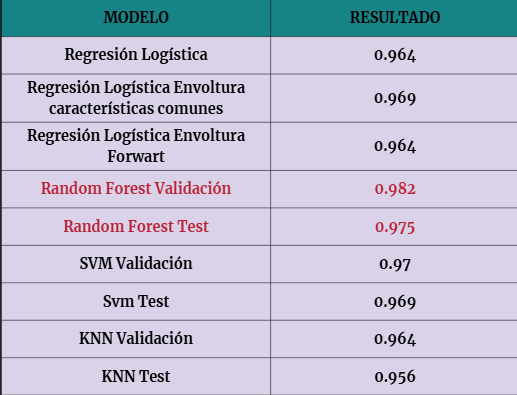
